In [1]:
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import pandas as pd
import collections
import itertools

In [2]:
data_file = "/Users/Chao/Downloads/Edinburgh_Export.xlsx"

df_trans = pd.read_excel(data_file, sheet_name='transactions')
df_users = pd.read_excel(data_file, sheet_name='users')
df_payees = pd.read_excel(data_file, sheet_name='payees')

#  As there is no unique identification for transfer payees, we add another coloum 'account_full' that combine 
# account number and sort code to identifiy payees.
df_trans['createdAt'] =  pd.to_datetime(df_trans['createdAt'])

df_payees['acccount_full'] = df_payees['Receiver accountNumber'].astype(str) + ['_'] + df_payees['Receiver sortCode'].astype(str)

df_users = df_users.rename(columns={"_id": "customerId"}, errors="raise")
df_users['dateOfBirth'] = df_users['dateOfBirth'].str[:4]
df_users['dateOfBirth'] = df_users['dateOfBirth'].astype('float')
df_users['createdAt'] =  pd.to_datetime(df_users['createdAt'])

In [5]:
#  First we create a graph that link transaction id and category to analysis the attributes that affect the CO2 
# emission
#T = nx.from_pandas_edgelist(df_trans, '_id', 'externalParty.transactionCategory', 
#                            ['transactionFootPrint.carbonEmissionInGrams','amount.value',
#                             'externalParty.merchantCategoryCode','transactionType.code',
#                             'transactionType.direction'])

In [6]:
# we can get category list:['OTHER', 'SHOPPING', 'TRAVEL', nan, 'GROCERIES', 'LIFESTYLE','SUBSCRIPTION', 'FUEL']
cat_list = []
trans_count = 0
for cat in pd.Series(df_trans['externalParty.transactionCategory']).unique():
    if not pd.isnull(cat):
        cat_list.append((cat, T.degree(cat)))
        trans_count += T.degree(cat)

cat_list.append(('null', df_trans.shape[0] - trans_count))
print(cat_list)

# there is 62167 transactions in total

[('OTHER', 41336), ('SHOPPING', 3557), ('TRAVEL', 4178), ('GROCERIES', 6108), ('LIFESTYLE', 5907), ('SUBSCRIPTION', 104), ('FUEL', 10), ('null', 967)]


In [7]:
# To futher analysis the 'OTHER'category, we can analysis the merchant category code
df = df_trans[df_trans['externalParty.transactionCategory'] == 'OTHER']
top_mcc = df['externalParty.merchantCategoryCode'].value_counts().head(30)
print(top_mcc)
sum(top_mcc.values)
# we could notice that top 5 cover 29% of 'OTHER', top 10 cover 39% of 'OTHER', top 20 cover 45% of 'OTHER',
# we would like to focues on mcc that appear more that 100 times cover unless 1% of 'OTHER',
# according to the table, is top 5 mcc

6011.0    1614
4814.0     195
8398.0     183
8999.0     153
4900.0     112
9402.0      79
9399.0      72
6012.0      72
8220.0      70
7311.0      70
5969.0      62
5967.0      60
7399.0      51
4816.0      49
6211.0      42
4899.0      38
6300.0      38
5968.0      30
7299.0      27
8641.0      21
8699.0      19
4812.0      19
8299.0      15
4215.0      14
7523.0      12
5065.0      11
8043.0      10
5965.0       9
8021.0       9
8062.0       9
Name: externalParty.merchantCategoryCode, dtype: int64


3165

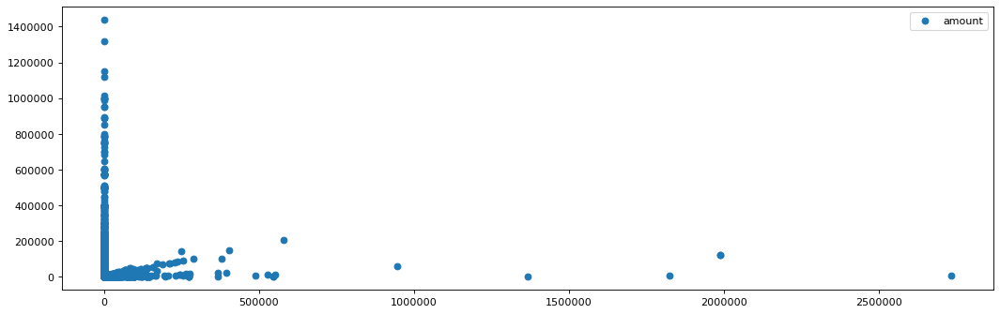

In [221]:
# next is analysis the relationship between carbon emission and category/amount/trans type/trans direction
figure(figsize=(16, 5), dpi=80)
plt.scatter(df_trans['transactionFootPrint.carbonEmissionInGrams'], df_trans['amount.value'], label='amount')
plt.legend(loc='best')
#plt.title('Clustering Coefficient')
plt.ticklabel_format(style='plain')
#plt.xticks(rotation=90)
plt.show() 

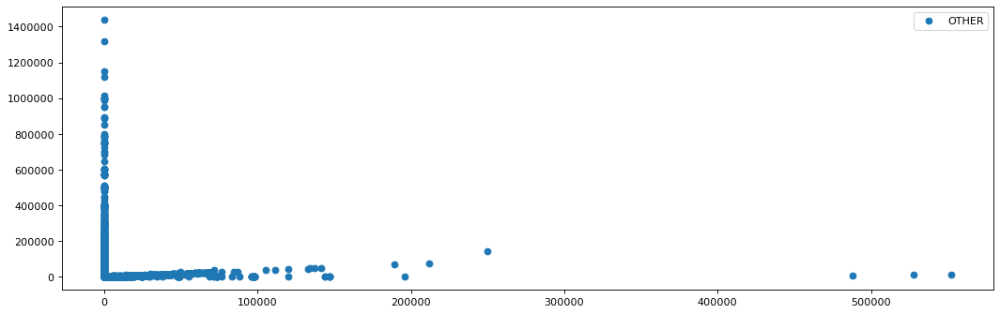

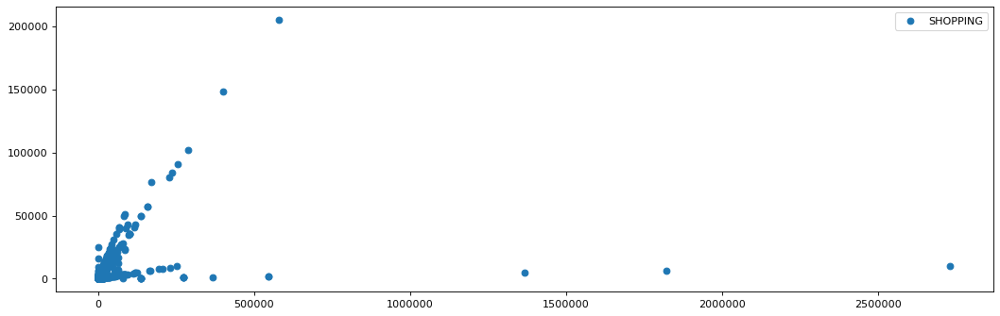

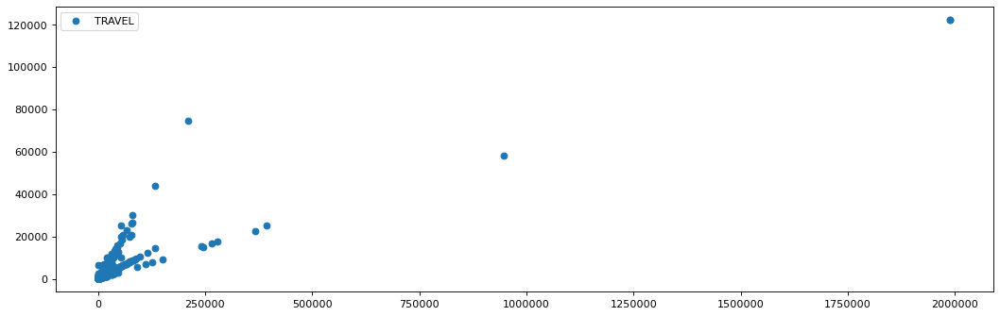

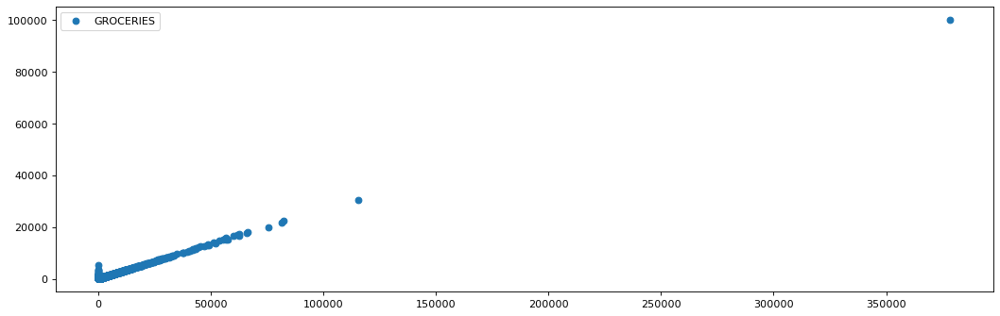

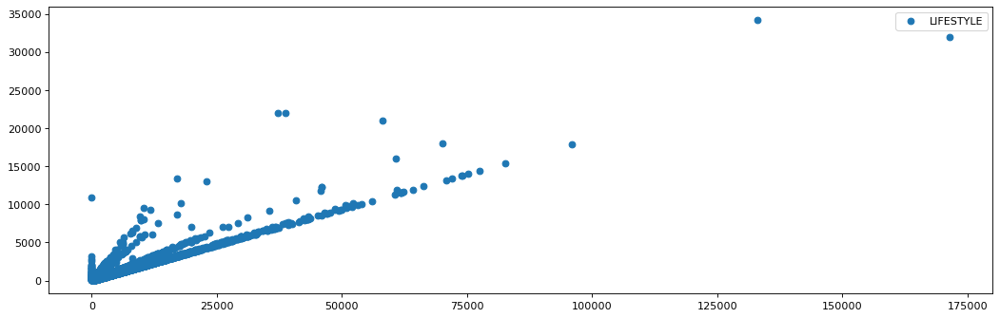

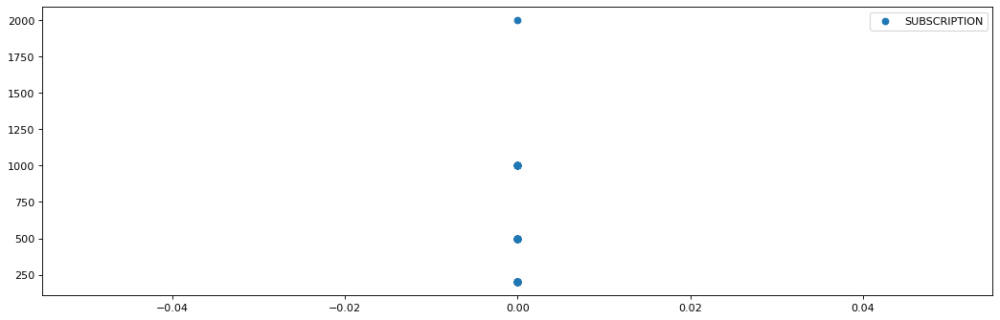

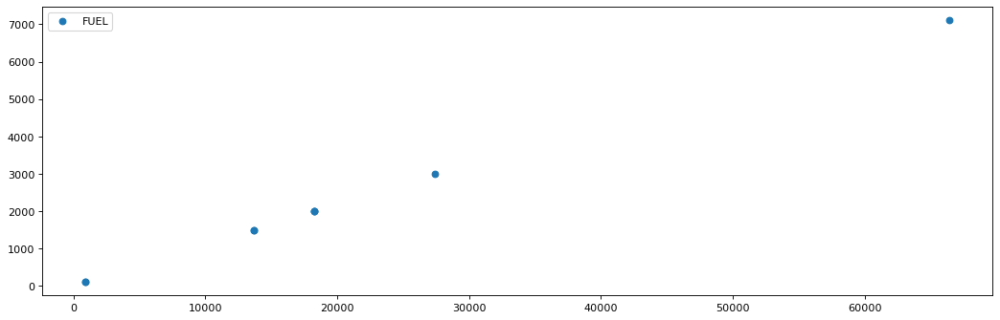

In [8]:
for cat in cat_list[:-1]:
    figure(figsize=(16, 5), dpi=80)
    df = df_trans[df_trans['externalParty.transactionCategory'] == cat[0]]
    plt.scatter(df['transactionFootPrint.carbonEmissionInGrams'], df['amount.value'], label=cat[0])
    plt.legend(loc='best')
    #plt.title('Clustering Coefficient')
    plt.ticklabel_format(style='plain')
    #plt.xticks(rotation=90)
    plt.show() 

5983.0    10
Name: externalParty.merchantCategoryCode, dtype: int64
[  4.5674 456.74  ]


/Users/chao/opt/anaconda3/envs/gt/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


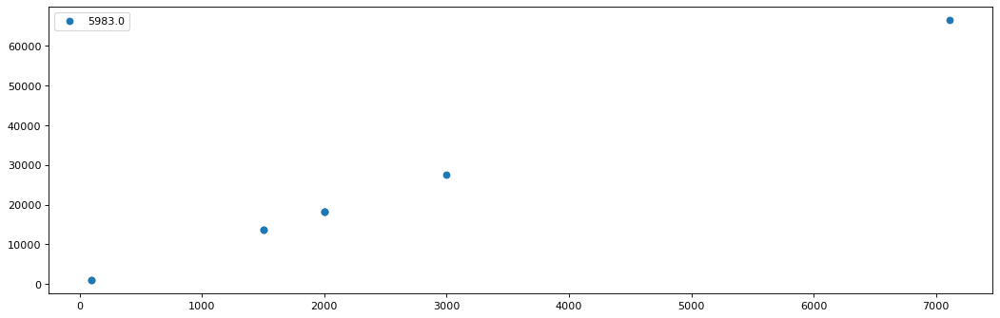

In [198]:
df = df_trans[df_trans['externalParty.transactionCategory'] == 'FUEL']
top_mcc = df['externalParty.merchantCategoryCode'].value_counts() # ('FUEL', 10
print(top_mcc)
ax = figure(figsize=(16, 5), dpi=80).add_subplot()
for mcc in dict(top_mcc):
    df = df_trans[df_trans['externalParty.merchantCategoryCode'] == mcc]
    ax.scatter(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], label=mcc)
    df = df[df['transactionFootPrint.carbonEmissionInGrams'] <= 10000]
    print(np.polyfit(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], 1))
plt.legend(loc='best')
#plt.title('Clustering Coefficient')
plt.ticklabel_format(style='plain')
#plt.xticks(rotation=90)
plt.show()

5812.0    2762
5814.0    1408
5813.0     965
5811.0     189
7999.0     105
5921.0      92
7230.0      78
7997.0      68
5993.0      42
7832.0      41
Name: externalParty.merchantCategoryCode, dtype: int64
[  4.05368089 833.94510666]
[5.27501569 0.37927706]
[3.83547874 7.46907995]
[ 5.29502963 -8.65307132]
[  1.26853082 -13.11102225]


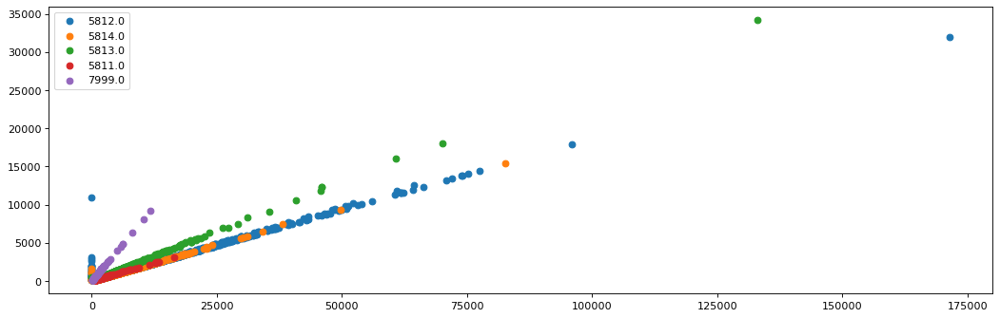

In [189]:
df = df_trans[df_trans['externalParty.transactionCategory'] == 'LIFESTYLE']
top_mcc = df['externalParty.merchantCategoryCode'].value_counts() # ('LIFESTYLE', 5907)
print(top_mcc.head(10))
ax = figure(figsize=(16, 5), dpi=80).add_subplot()
for mcc in dict(top_mcc.head(5)):
    df = df_trans[df_trans['externalParty.merchantCategoryCode'] == mcc]
    ax.scatter(df['transactionFootPrint.carbonEmissionInGrams'], df['amount.value'], label=mcc)
    df = df[df['transactionFootPrint.carbonEmissionInGrams'] <= 10000]
    print(np.polyfit(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], 1))
plt.legend(loc='best')
#plt.title('Clustering Coefficient')
plt.ticklabel_format(style='plain')
#plt.xticks(rotation=90)
plt.show()

5812.0    2762
5814.0    1408
5813.0     965
5811.0     189
7999.0     105
5921.0      92
7230.0      78
7997.0      68
5993.0      42
7832.0      41
Name: externalParty.merchantCategoryCode, dtype: int64
[  1.36120842 599.18613823]


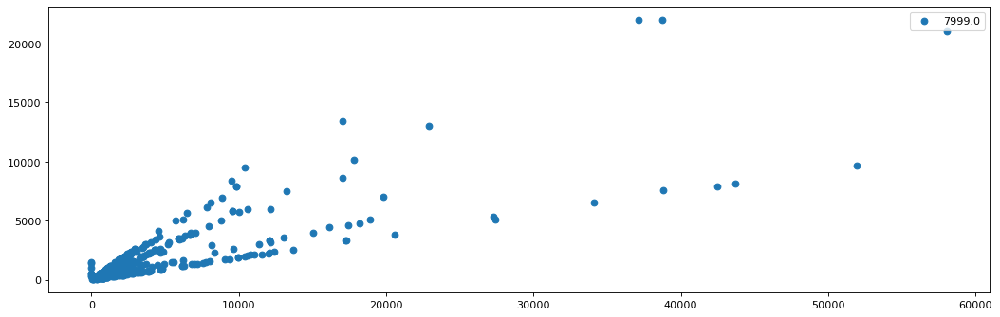

In [216]:
df = df_trans[df_trans['externalParty.transactionCategory'] == 'LIFESTYLE']
top_mcc = df['externalParty.merchantCategoryCode'].value_counts() # ('LIFESTYLE', 5907)
print(top_mcc.head(10))
#ax = figure(figsize=(16, 5), dpi=80).add_subplot()
for mcc in dict(top_mcc.head(5)):
    df = df.drop(df[df['externalParty.merchantCategoryCode'] == mcc].index)
figure(figsize=(16, 5), dpi=80)
plt.scatter(df['transactionFootPrint.carbonEmissionInGrams'], df['amount.value'], label=mcc)
df = df[df['transactionFootPrint.carbonEmissionInGrams'] <= 10000]

print(np.polyfit(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], 1))
plt.legend(loc='best')
#plt.title('Clustering Coefficient')
plt.ticklabel_format(style='plain')
#plt.xticks(rotation=90)
plt.show() 

5411.0    4514
5499.0    1319
5441.0     110
5462.0     102
5451.0      41
5422.0      22
Name: externalParty.merchantCategoryCode, dtype: int64
[ 3.62883546 33.55188651]
[  3.34347475 196.46268261]


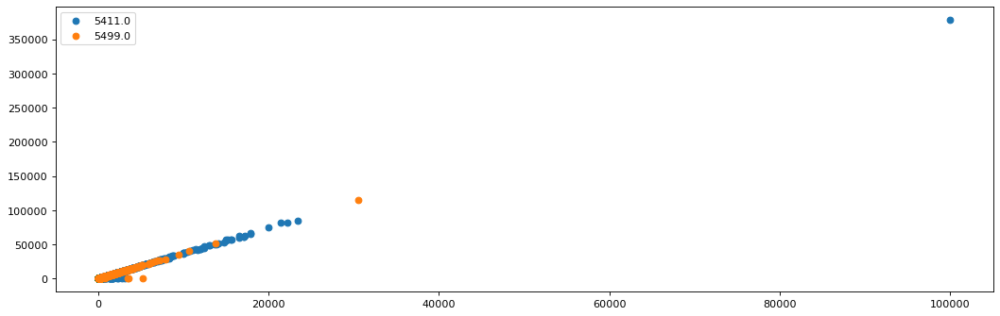

In [188]:
df = df_trans[df_trans['externalParty.transactionCategory'] == 'GROCERIES']
top_mcc = df['externalParty.merchantCategoryCode'].value_counts() # ('GROCERIES', 6108)
print(top_mcc.head(10))
ax = figure(figsize=(16, 5), dpi=80).add_subplot()
for mcc in dict(top_mcc.head(2)):
    df = df_trans[df_trans['externalParty.merchantCategoryCode'] == mcc]
    ax.scatter(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], label=mcc)
    df = df[df['transactionFootPrint.carbonEmissionInGrams'] <= 10000]
    print(np.polyfit(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], 1))
plt.legend(loc='best')
#plt.title('Clustering Coefficient')
plt.ticklabel_format(style='plain')
#plt.xticks(rotation=90)
plt.show()

5411.0    4514
5499.0    1319
5441.0     110
5462.0     102
5451.0      41
5422.0      22
Name: externalParty.merchantCategoryCode, dtype: int64
[ 3.73229381 -4.3871232 ]


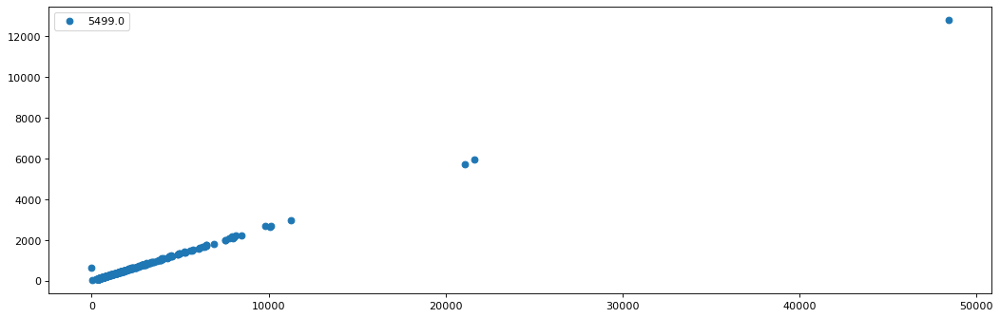

In [215]:
df = df_trans[df_trans['externalParty.transactionCategory'] == 'GROCERIES']
top_mcc = df['externalParty.merchantCategoryCode'].value_counts() # ('GROCERIES', 6108)
print(top_mcc.head(10))
#ax = figure(figsize=(16, 5), dpi=80).add_subplot()
for mcc in dict(top_mcc.head(2)):
    df = df.drop(df[df['externalParty.merchantCategoryCode'] == mcc].index)
figure(figsize=(16, 5), dpi=80)
plt.scatter(df['transactionFootPrint.carbonEmissionInGrams'], df['amount.value'], label=mcc)
df = df[df['transactionFootPrint.carbonEmissionInGrams'] <= 10000]

print(np.polyfit(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], 1))
plt.legend(loc='best')
#plt.title('Clustering Coefficient')
plt.ticklabel_format(style='plain')
#plt.xticks(rotation=90)
plt.show() 

4111.0    1279
4121.0     950
5541.0     724
4112.0     302
4131.0     297
7523.0     236
Name: externalParty.merchantCategoryCode, dtype: int64
[  3.69937973 -24.40273621]
[ 3.12641457 -4.50430101]
[   3.49432547 2653.85638504]
[3.57420994 9.53590787]
[  3.12876751 -14.8706581 ]


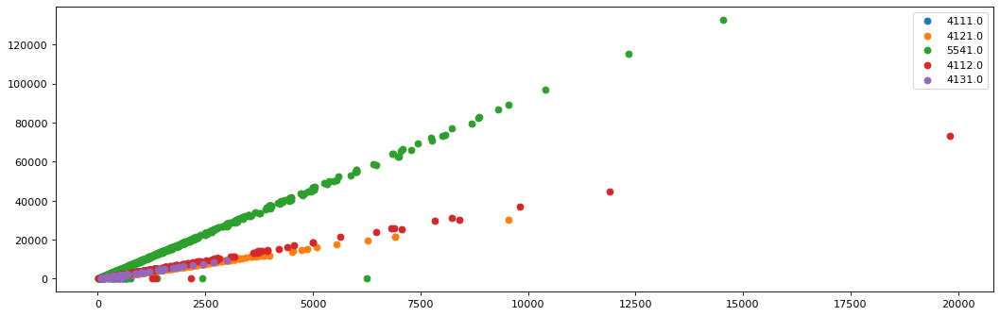

In [186]:
df = df_trans[df_trans['externalParty.transactionCategory'] == 'TRAVEL']
top_mcc = df['externalParty.merchantCategoryCode'].value_counts() # 'TRAVEL', 4178
print(top_mcc.head(6))
ax = figure(figsize=(16, 5), dpi=80).add_subplot()
for mcc in dict(top_mcc.head(5)):
    df = df_trans[df_trans['externalParty.merchantCategoryCode'] == mcc]
    ax.scatter(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], label=mcc)
    df = df[df['transactionFootPrint.carbonEmissionInGrams'] <= 10000]
    print(np.polyfit(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], 1))
plt.legend(loc='best')
#plt.title('Clustering Coefficient')
plt.ticklabel_format(style='plain')
#plt.xticks(rotation=90)
plt.show()

4111.0    1279
4121.0     950
5541.0     724
4112.0     302
4131.0     297
7523.0     236
Name: externalParty.merchantCategoryCode, dtype: int64
[  2.77948598 869.06083427]


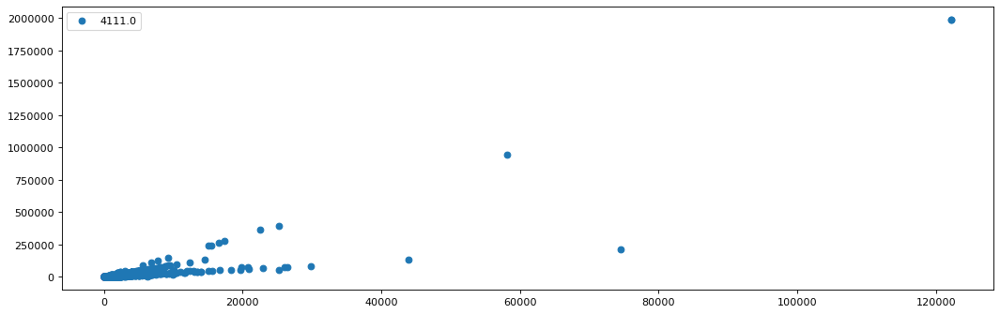

[   2.91149309 1027.86026679]


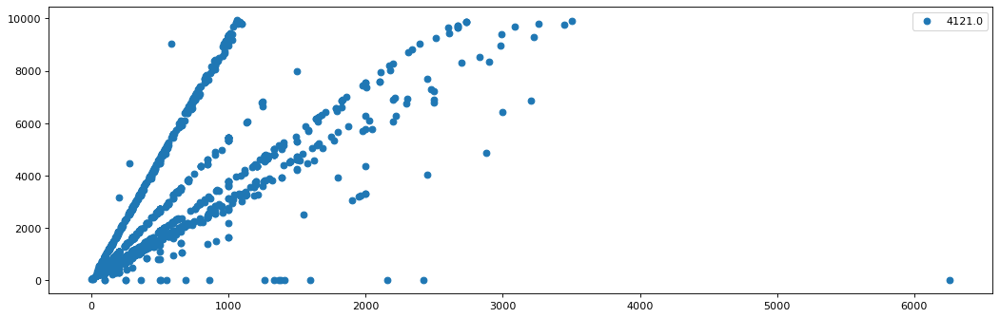

[  3.03932794 274.56886846]


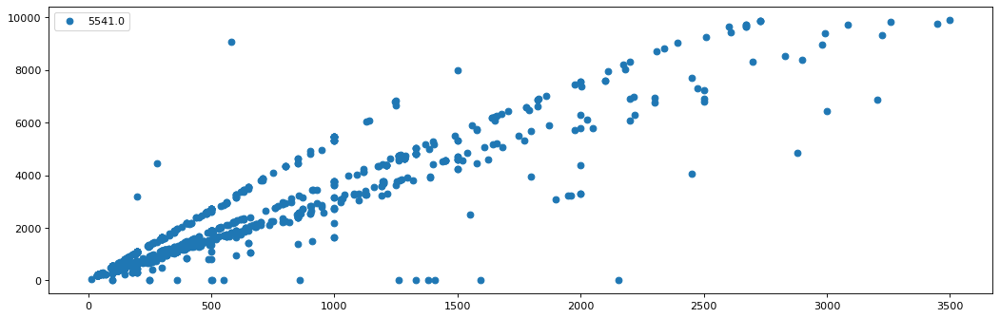

[  2.76151575 364.25727105]


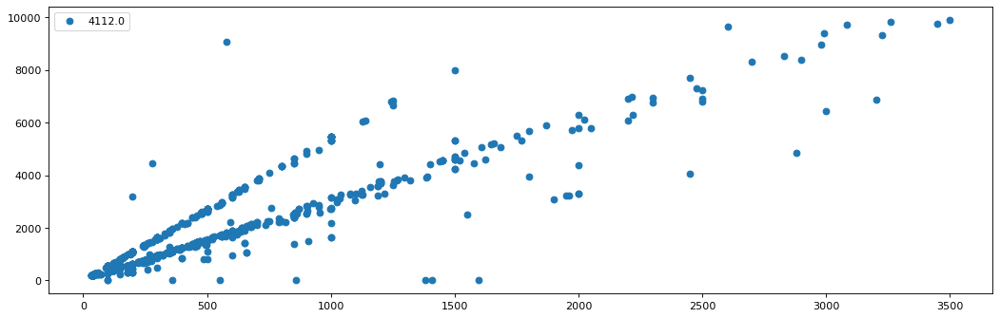

[  2.62269506 570.19953935]


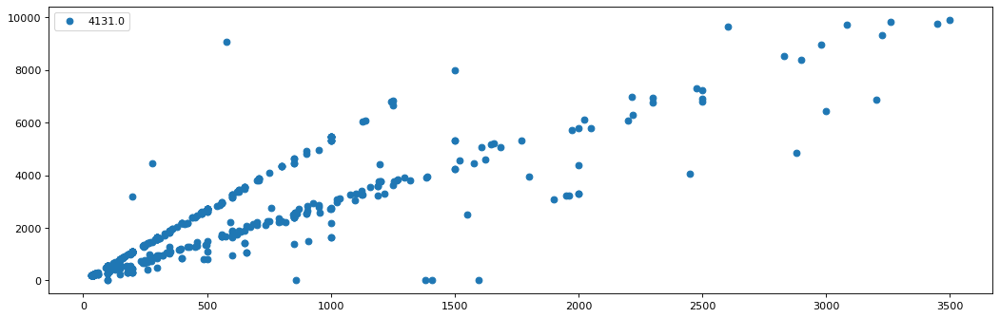

In [207]:
df = df_trans[df_trans['externalParty.transactionCategory'] == 'TRAVEL']
top_mcc = df['externalParty.merchantCategoryCode'].value_counts() # 'TRAVEL', 4178
print(top_mcc.head(6))
#ax = figure(figsize=(16, 5), dpi=80).add_subplot()
for mcc in dict(top_mcc.head(5)):
    figure(figsize=(16, 5), dpi=80)
    df = df.drop(df[df['externalParty.merchantCategoryCode'] == mcc].index)
    plt.scatter(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], label=mcc)
    df = df[df['transactionFootPrint.carbonEmissionInGrams'] <= 10000]
    print(np.polyfit(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], 1))
    plt.legend(loc='best')
    #plt.title('Clustering Coefficient')
    plt.ticklabel_format(style='plain')
    #plt.xticks(rotation=90)
    plt.show()

5999.0    417
5912.0    339
5311.0    271
5399.0    180
5735.0    153
         ... 
5946.0      1
7622.0      1
7221.0      1
5733.0      1
5300.0      1
Name: externalParty.merchantCategoryCode, Length: 97, dtype: int64
[  2.63611784 155.0278324 ]
[  3.4123363  178.03494186]
[ 1.6096959  24.27376614]
[1.95453722 9.81821757]
[ 2.47581971 91.71898397]


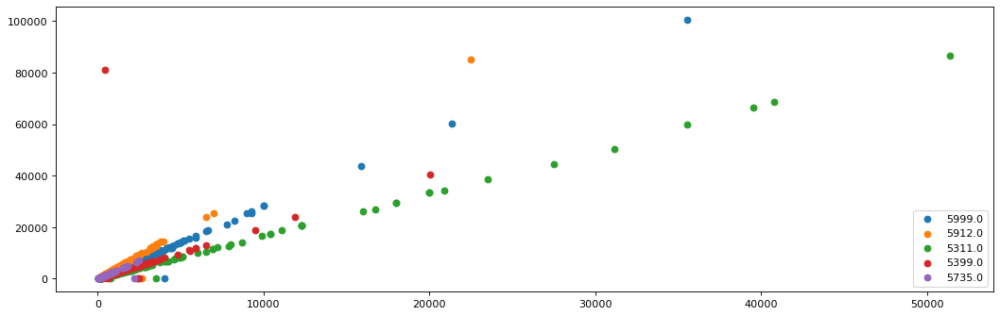

In [203]:
df = df_trans[df_trans['externalParty.transactionCategory'] == 'SHOPPING']
top_mcc = df['externalParty.merchantCategoryCode'].value_counts() # 3557
print(top_mcc)
ax = figure(figsize=(16, 5), dpi=80).add_subplot()
for mcc in dict(top_mcc.head(5)):
    df = df_trans[df_trans['externalParty.merchantCategoryCode'] == mcc]
    ax.scatter(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], label=mcc)
    df = df[df['transactionFootPrint.carbonEmissionInGrams'] <= 10000]
    print(np.polyfit(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], 1))
plt.legend(loc='best')
#plt.title('Clustering Coefficient')
plt.ticklabel_format(style='plain')
#plt.xticks(rotation=90)
plt.show()

5999.0    417
5912.0    339
5311.0    271
5399.0    180
5735.0    153
         ... 
5946.0      1
7622.0      1
7221.0      1
5733.0      1
5300.0      1
Name: externalParty.merchantCategoryCode, Length: 97, dtype: int64
[   1.33955526 1099.30872345]


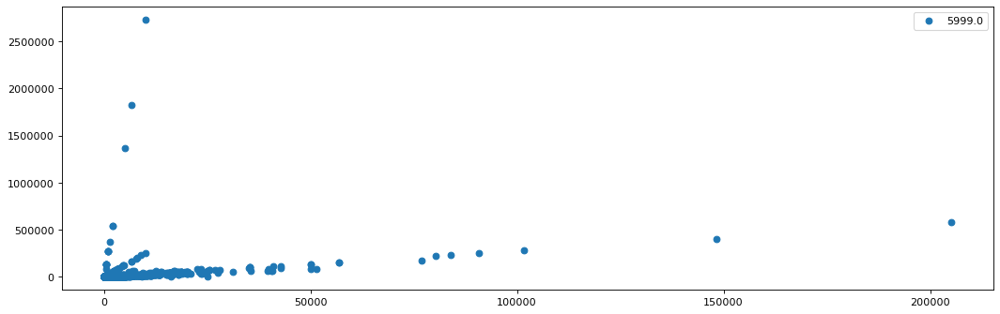

[   1.28616154 1057.05339349]


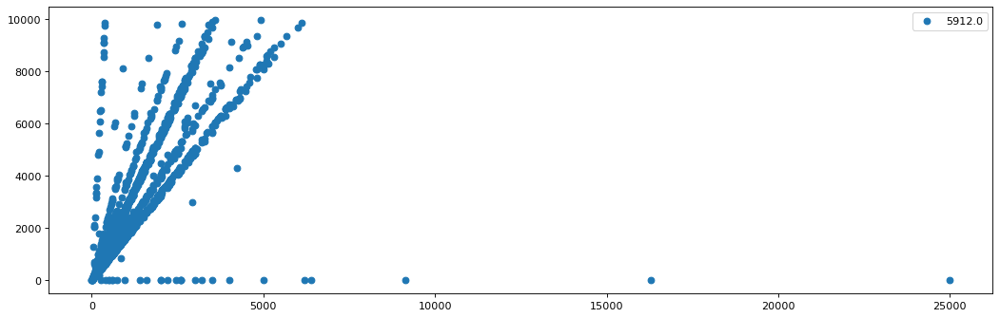

[   1.26018146 1161.58573351]


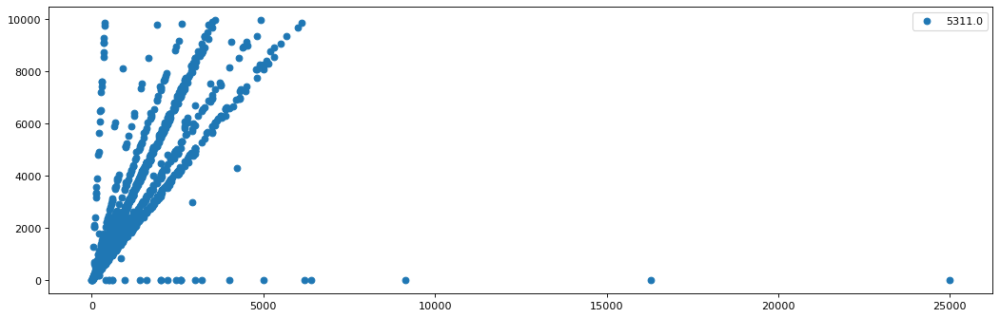

[1.22210986e+00 1.23988423e+03]


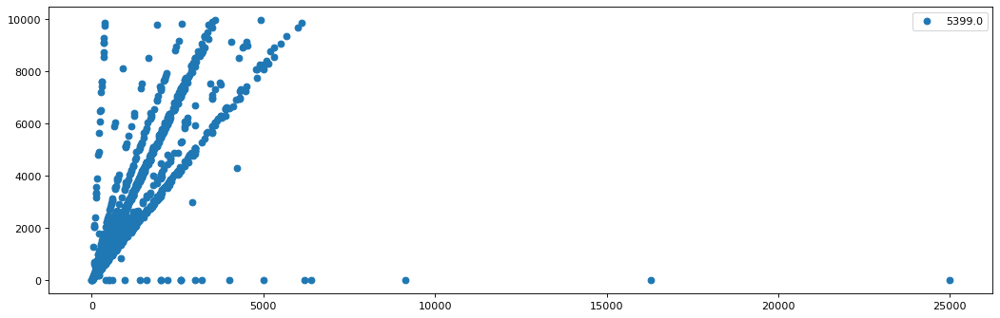

[1.18369013e+00 1.33638581e+03]


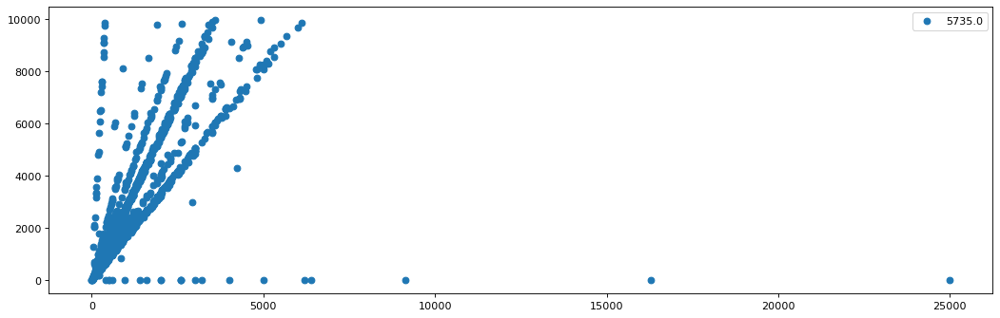

In [204]:
df = df_trans[df_trans['externalParty.transactionCategory'] == 'SHOPPING']
top_mcc = df['externalParty.merchantCategoryCode'].value_counts() # 3557
print(top_mcc)
#ax = figure(figsize=(16, 5), dpi=80).add_subplot()
for mcc in dict(top_mcc.head(5)):
    figure(figsize=(16, 5), dpi=80)
    df = df.drop(df[df['externalParty.merchantCategoryCode'] == mcc].index)
    plt.scatter(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], label=mcc)
    df = df[df['transactionFootPrint.carbonEmissionInGrams'] <= 10000]
    print(np.polyfit(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], 1))
    plt.legend(loc='best')
    #plt.title('Clustering Coefficient')
    plt.ticklabel_format(style='plain')
    #plt.xticks(rotation=90)
    plt.show()

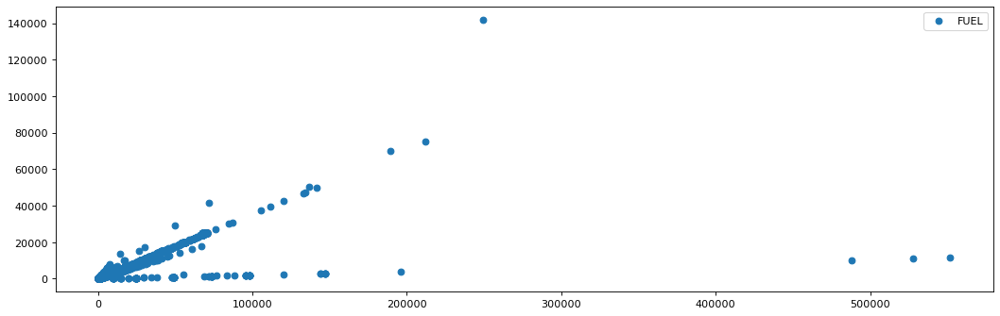

In [10]:
figure(figsize=(16, 5), dpi=80)
df = df_trans[(df_trans['externalParty.transactionCategory'] == 'OTHER') & (df_trans['transactionFootPrint.carbonEmissionInGrams'] > 0)]
plt.scatter(df['transactionFootPrint.carbonEmissionInGrams'], df['amount.value'], label='other')
plt.legend(loc='best')
#plt.title('Clustering Coefficient')
plt.ticklabel_format(style='plain')
#plt.xticks(rotation=90)
plt.show()

6011.0    1614
4814.0     195
8398.0     183
8999.0     153
4900.0     112
9402.0      79
9399.0      72
6012.0      72
8220.0      70
7311.0      70
Name: externalParty.merchantCategoryCode, dtype: int64
[  2.28747657 896.90660857]
[ 3.73005811 15.94148991]
[  1.72172696 -21.86645893]
[  2.47757366 167.95775934]
[48.96977851 -6.67954341]
[ 1.69756307 17.07779157]
[1.74069887 4.75757732]
[  2.76791016 -54.48447287]
[  1.73695393 -12.56893042]
[  2.66339616 -22.62042236]


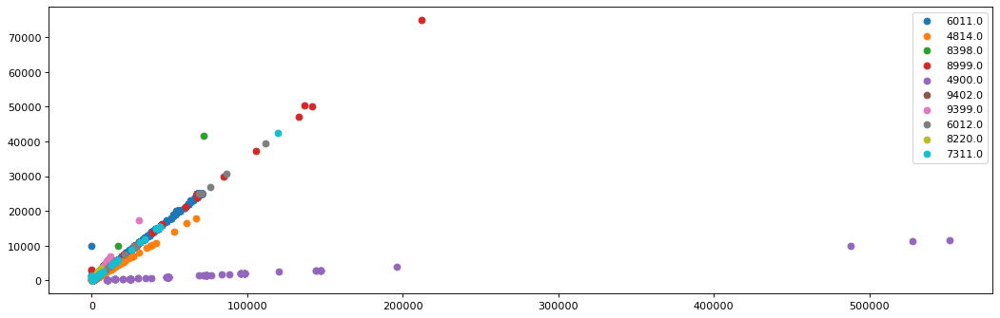

In [199]:
df = df_trans[df_trans['externalParty.transactionCategory'] == 'OTHER']
top_mcc = df['externalParty.merchantCategoryCode'].value_counts() #41336
print(top_mcc.head(10))
ax = figure(figsize=(16, 5), dpi=80).add_subplot()
for mcc in dict(top_mcc.head(10)):
    df = df_trans[df_trans['externalParty.merchantCategoryCode'] == mcc]
    ax.scatter(df['transactionFootPrint.carbonEmissionInGrams'], df['amount.value'], label=mcc)
    df = df[df['transactionFootPrint.carbonEmissionInGrams'] <= 10000]
    print(np.polyfit(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], 1))
plt.legend(loc='best')
#plt.title('Clustering Coefficient')
plt.ticklabel_format(style='plain')
#plt.xticks(rotation=90)
plt.show() 

6011.0    1614
4814.0     195
8398.0     183
8999.0     153
4900.0     112
9402.0      79
9399.0      72
6012.0      72
8220.0      70
7311.0      70
Name: externalParty.merchantCategoryCode, dtype: int64
[-2.73187572e-04  4.25899759e+01]


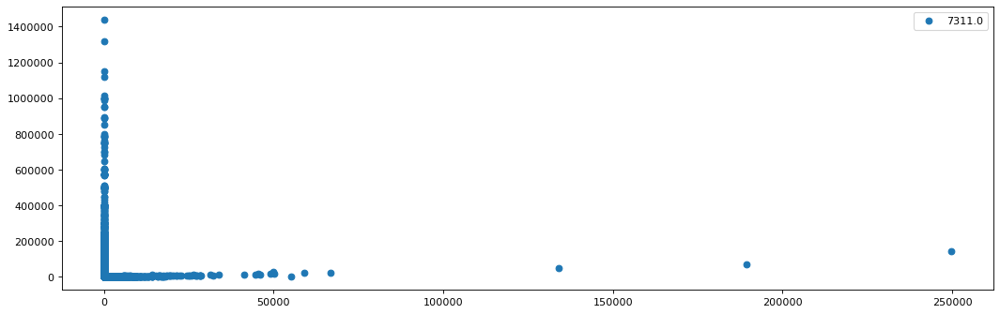

In [213]:
df = df_trans[df_trans['externalParty.transactionCategory'] == 'OTHER']
top_mcc = df['externalParty.merchantCategoryCode'].value_counts() #41336
print(top_mcc.head(10))
#ax = figure(figsize=(16, 5), dpi=80).add_subplot()
for mcc in dict(top_mcc.head(10)):
    df = df.drop(df[df['externalParty.merchantCategoryCode'] == mcc].index)
figure(figsize=(16, 5), dpi=80)
plt.scatter(df['transactionFootPrint.carbonEmissionInGrams'], df['amount.value'], label=mcc)
df = df[df['transactionFootPrint.carbonEmissionInGrams'] <= 10000]

print(np.polyfit(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], 1))
plt.legend(loc='best')
#plt.title('Clustering Coefficient')
plt.ticklabel_format(style='plain')
#plt.xticks(rotation=90)
plt.show() 

In [211]:
df_trans[(df_trans['externalParty.transactionCategory'] == 'OTHER') & (df_trans['transactionFootPrint.carbonEmissionInGrams'] == 0)]

,_id,accountId,customerId,createdAt,amount.currency,amount.exponent,amount.value,externalParty.merchantCategoryCode,externalParty.transactionCategory,transactionFootPrint.carbonEmissionInGrams,transactionType.code,transactionType.direction
0,6184758b97f95307088aea85,6178590764f48e00089a06ac,3253926e-9c0d-4fd9-8248-eb7c2f457b99,2021-11-05 00:06:35.175000+00:00,GBP,2,1545,8398.0,OTHER,0.0,REDEMPTION,DEBIT
5,6187ed7b97f9530708cf6042,6178590764f48e00089a06ac,3253926e-9c0d-4fd9-8248-eb7c2f457b99,2021-11-07 15:15:07.865000+00:00,GBP,2,11000,7399.0,OTHER,0.0,REDEMPTION,DEBIT
3080,62228a90f8ed260011324f8e,620a5a68ebacb80011deda94,2e31a7e0-c83a-4f5d-a461-061ec98ba0a6,2022-03-04 21:54:24.518000+00:00,GBP,2,723,5967.0,OTHER,0.0,REDEMPTION,DEBIT
3284,6225e36ce566ff91673afdf1,620a5a68ebacb80011deda94,2e31a7e0-c83a-4f5d-a461-061ec98ba0a6,2022-03-07 10:50:20.430000+00:00,GBP,2,15,NaN,OTHER,0.0,PAYMENT_OUT,DEBIT
3287,6225e5c6e566ff91673b3679,620a5a68ebacb80011deda94,2e31a7e0-c83a-4f5d-a461-061ec98ba0a6,2022-03-07 11:00:22.131000+00:00,GBP,2,1000,NaN,OTHER,0.0,PAYMENT_IN,CREDIT
...,...,...,...,...,...,...,...,...,...,...,...,...
62151,62e277b69e67676e2e1b8c49,628498e5f2bc4c00113c3e99,b4e6a655-0586-46c6-8c6e-9bfc1d91d940,2022-07-28 11:49:09.999000+00:00,GBP,2,700,NaN,OTHER,0.0,PAYMENT_OUT,DEBIT
62156,62e27adb9e67676e2e1bd4ef,628d0436755d000011e9988a,e0489c24-35d2-402a-a794-38d9e5dfa812,2022-07-28 12:02:35.654000+00:00,GBP,2,30000,NaN,OTHER,0.0,PAYMENT_OUT,DEBIT
62162,62e2827a9e67676e2e1c861d,628e4b5d9effed0011312e66,565fb0a0-27c8-493e-9468-b3176e814efe,2022-07-28 12:35:06.136000+00:00,GBP,2,5000,NaN,OTHER,0.0,PAYMENT_IN,CREDIT
62165,62e283819e67676e2e1ca018,624c2d30832f7100114cdf52,a6b9ad7d-5434-48d9-b564-cfdc16405039,2022-07-28 12:39:29.703000+00:00,GBP,2,5,NaN,OTHER,0.0,PAYMENT_OUT,DEBIT


(62167, 12)
(59208, 12)


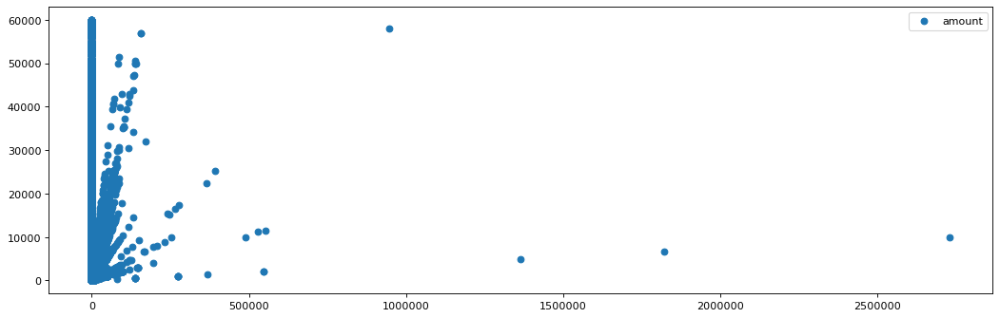

In [134]:
figure(figsize=(16, 5), dpi=80)
#df = df_trans[df_trans['transactionFootPrint.carbonEmissionInGrams'] <= 60000]
df = df_trans[df_trans['amount.value'] < 60000]
print(df_trans.shape)
print(df.shape)
plt.scatter(df['transactionFootPrint.carbonEmissionInGrams'], df['amount.value'], label='amount')
plt.legend(loc='best')
#plt.title('Clustering Coefficient')
plt.ticklabel_format(style='plain')
#plt.xticks(rotation=90)
plt.show() 

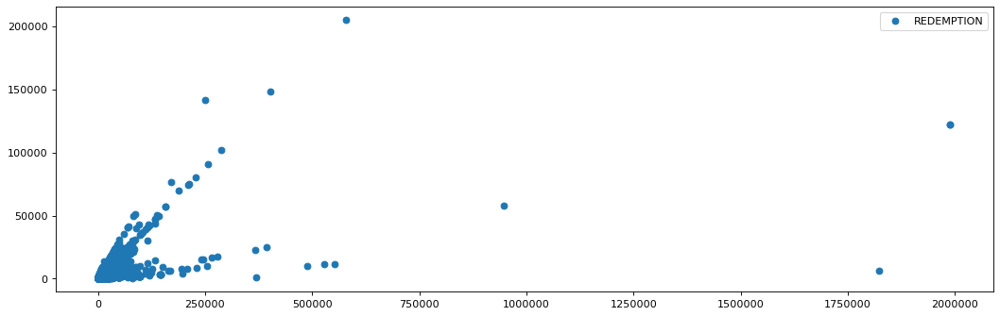

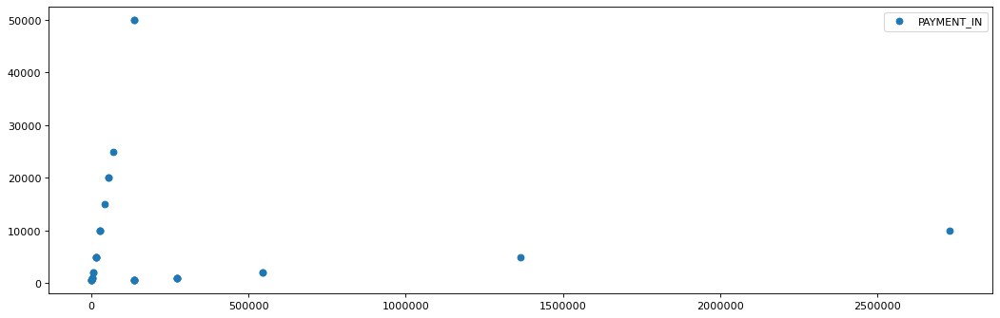

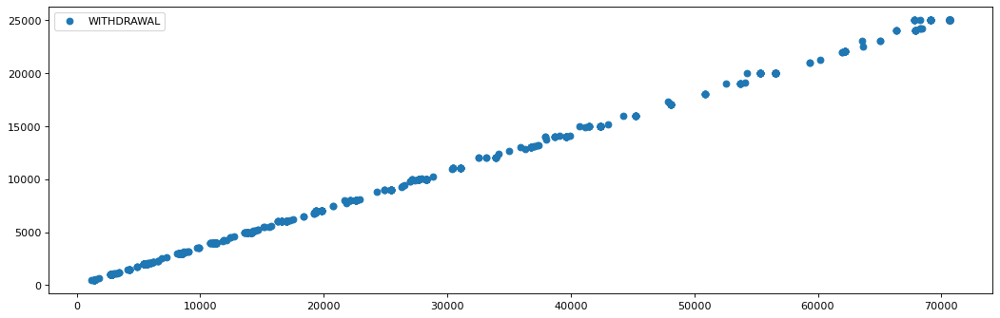

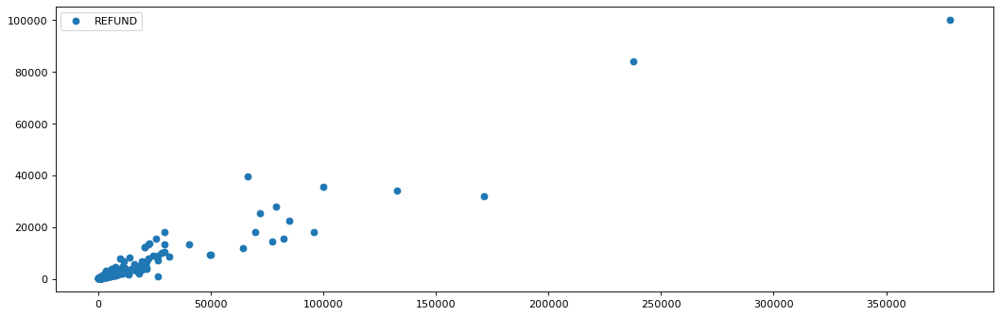

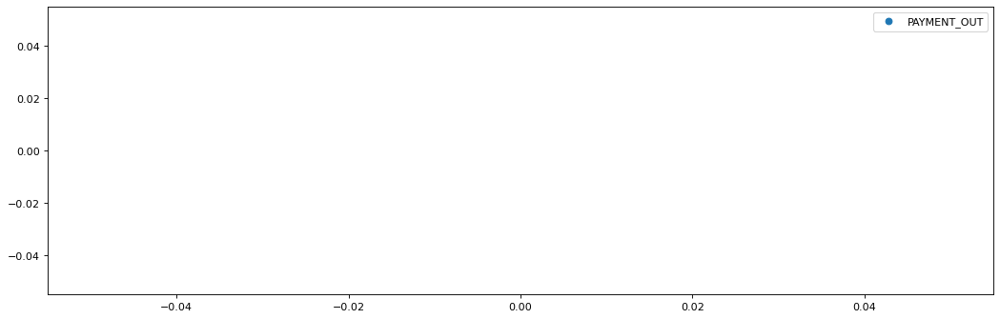

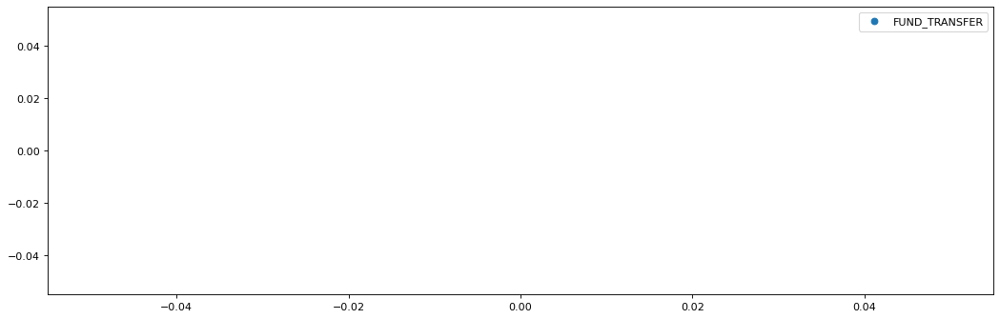

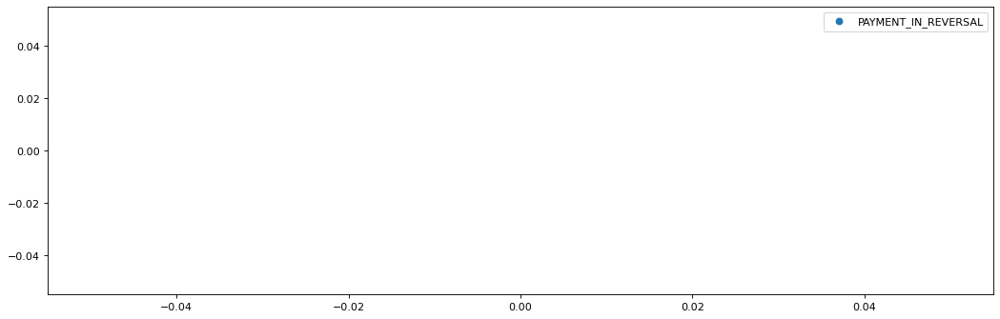

In [287]:
#df = df_trans[df_trans['transactionFootPrint.carbonEmissionInGrams'] > 0]
trans_type = pd.Series(df_trans['transactionType.code']).unique()
for trans_ty in trans_type:
    figure(figsize=(16, 5), dpi=80)
    df = df_trans[(df_trans['transactionType.code'] == trans_ty) & (df_trans['transactionFootPrint.carbonEmissionInGrams'] > 0)]
    plt.scatter(df['transactionFootPrint.carbonEmissionInGrams'], df['amount.value'], label=trans_ty)
    plt.legend(loc='best')
    #plt.title('Clustering Coefficient')
    plt.ticklabel_format(style='plain')
    #plt.xticks(rotation=90)
    plt.show() 
df_trans['transactionType.code'].value_counts()

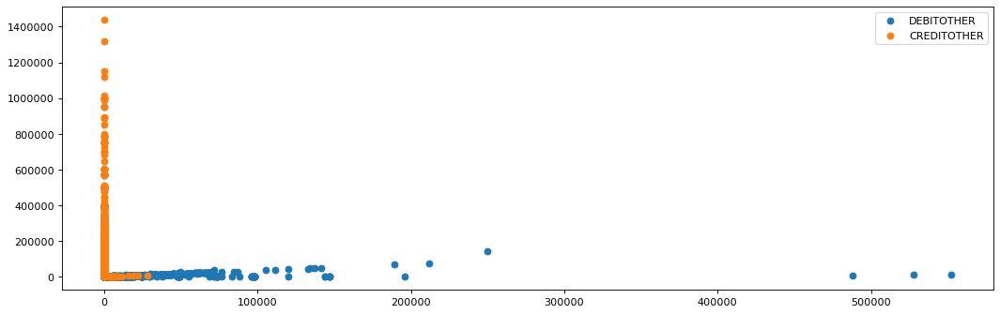

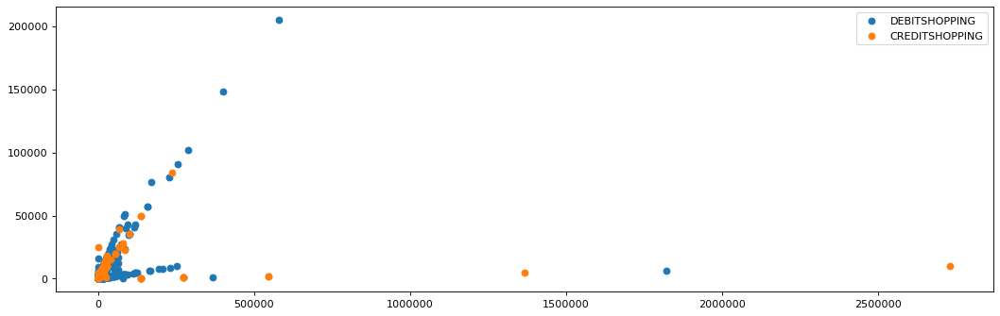

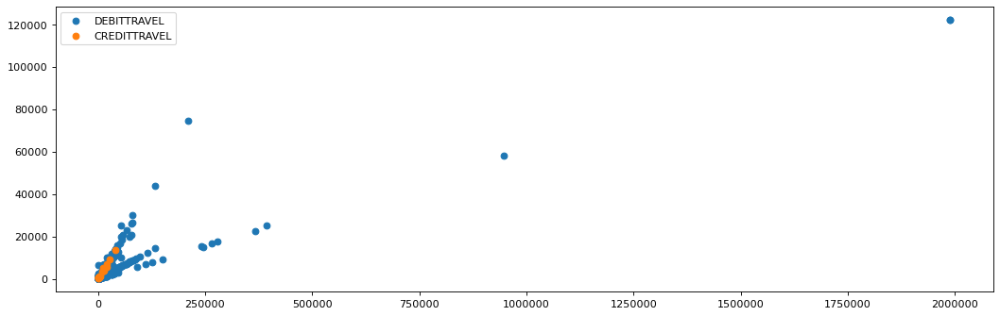

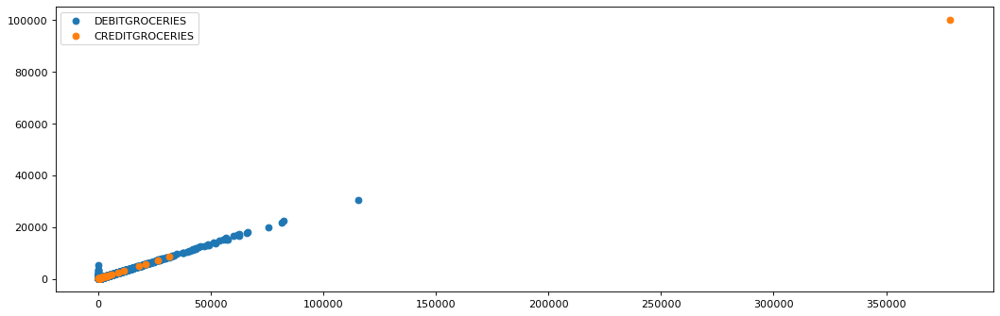

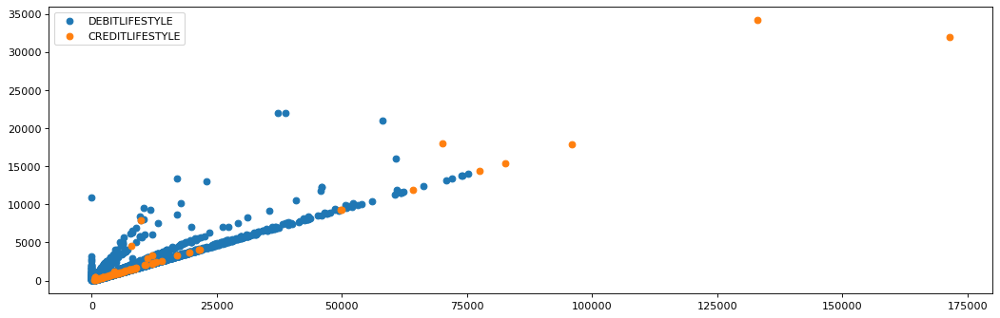

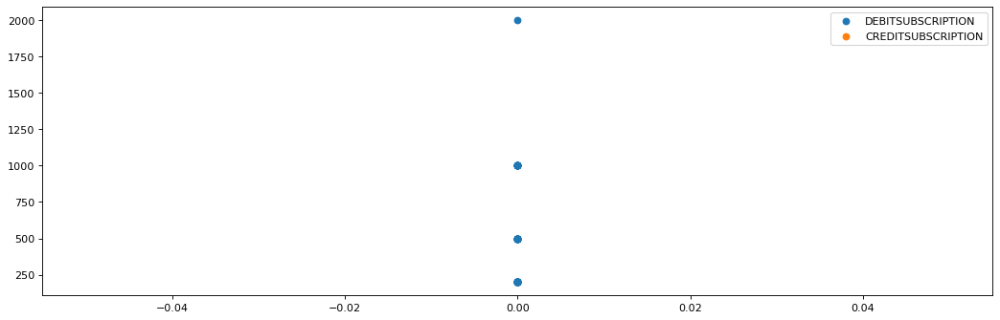

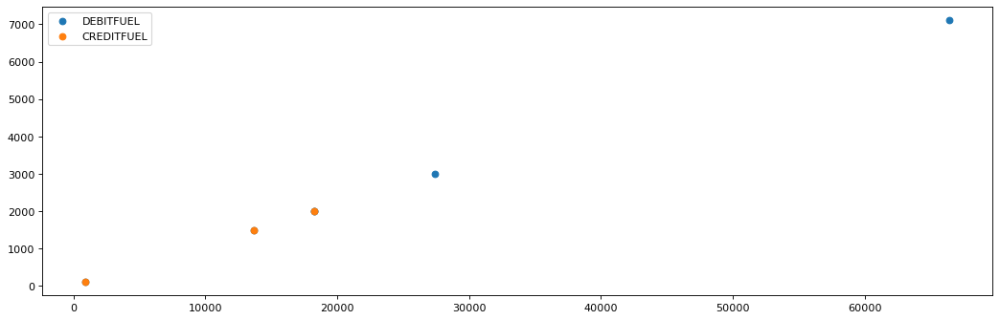

DEBIT     40602
CREDIT    21565
Name: transactionType.direction, dtype: int64

In [13]:
trans_dir = pd.Series(df_trans['transactionType.direction']).unique()
df = df_trans[df_trans['externalParty.transactionCategory'] == 'OTHER']

for cat in cat_list[:-1]:
    ax = figure(figsize=(16, 5), dpi=80).add_subplot()
    for dirc in trans_dir:
        df = df_trans[(df_trans['transactionType.direction'] == dirc) & (df_trans['externalParty.transactionCategory'] == cat[0])]
        ax.scatter(df['transactionFootPrint.carbonEmissionInGrams'], df['amount.value'], label=dirc+cat[0])
    plt.legend(loc='best')
    #plt.title('Clustering Coefficient')
    plt.ticklabel_format(style='plain')
    #plt.xticks(rotation=90)
    plt.show() 
df_trans['transactionType.direction'].value_counts()

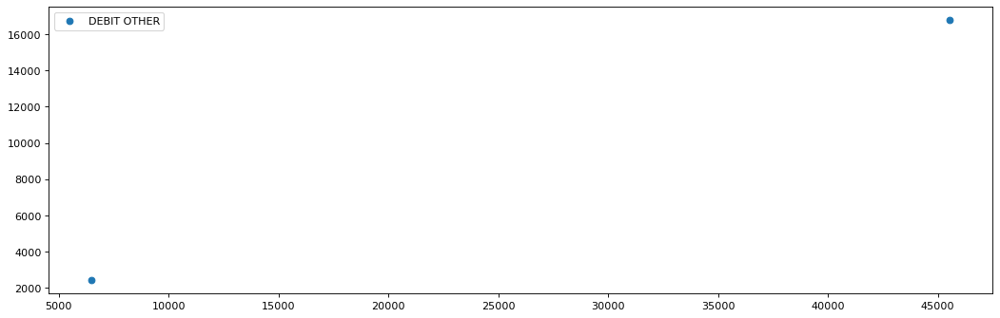

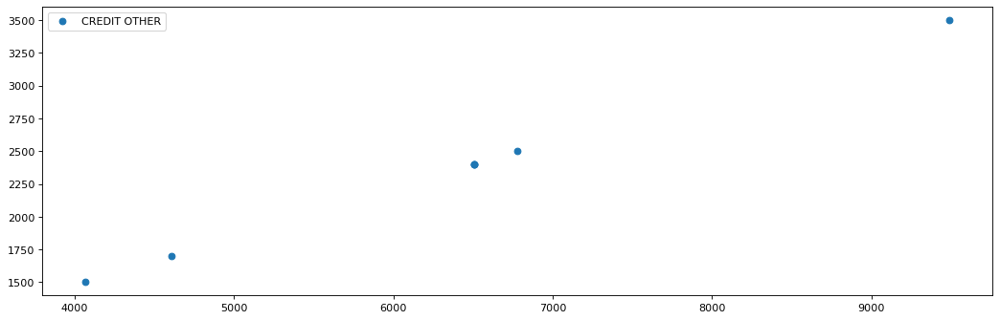

In [25]:
for dirc in trans_dir:
    figure(figsize=(16, 5), dpi=80)
    df = df_trans[(df_trans['transactionType.direction'] == dirc) & (df_trans['externalParty.transactionCategory'] == 'OTHER')]
    df = df[df['externalParty.merchantCategoryCode'] == 5965] 
    plt.scatter(df['transactionFootPrint.carbonEmissionInGrams'], df['amount.value'], label=dirc+' OTHER')
    plt.legend(loc='best')
    #plt.title('Clustering Coefficient')
    plt.ticklabel_format(style='plain')
    #plt.xticks(rotation=90)
    plt.show() 

In [26]:
df_trans[(df_trans['transactionType.code'] == 'REDEMPTION') & (df_trans['externalParty.transactionCategory'] == 'OTHER')]['externalParty.merchantCategoryCode'].value_counts()

4814.0    194
8398.0    182
8999.0    152
4900.0    112
9402.0     79
         ... 
1799.0      1
7349.0      1
8734.0      1
8675.0      1
7221.0      1
Name: externalParty.merchantCategoryCode, Length: 64, dtype: int64

LinregressResult(slope=3.6281188654733674, intercept=33.84670572388313, rvalue=0.97425210716869, pvalue=0.0, stderr=0.013136699766246712, intercept_stderr=11.879525115099446)
LinregressResult(slope=3.7829315375215193, intercept=-16.3700989445897, rvalue=0.9999168329764553, pvalue=1.8070717330719503e-35, stderr=0.011500319257730247, intercept_stderr=9.607215209211045)


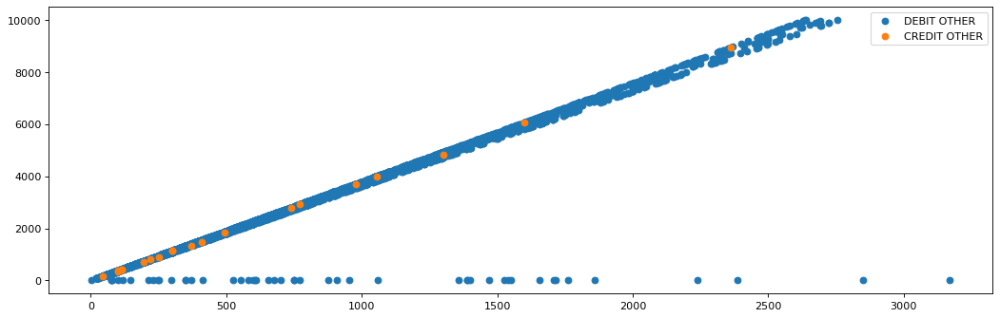

In [105]:
ax = figure(figsize=(16, 5), dpi=80).add_subplot()
#for trans_ty in ['REDEMPTION', 'REFUND']:
for dirc in trans_dir:
    df = df_trans[(df_trans['transactionType.direction'] == dirc) & (df_trans['externalParty.merchantCategoryCode'] == 5411)]
    df = df[df['transactionFootPrint.carbonEmissionInGrams'] <= 10000]
    df.dropna()
    ax.scatter(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], label=dirc+' OTHER')
    fit = stats.linregress(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'])
    print(fit)
plt.legend(loc='best')
#plt.title('Clustering Coefficient')
plt.ticklabel_format(style='plain')
#plt.xticks(rotation=90)
plt.show() 

In [103]:
import math
from sklearn.linear_model import LinearRegression

reg = LinearRegression().fit(df['transactionFootPrint.carbonEmissionInGrams'].to_numpy()[:,None], df['amount.value'])

print(reg)
for num in list_1:
    list_3.append(math.sqrt(num))

fit = stats.linregress(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'])
print(fit)
np.polyfit(df['amount.value'], df['transactionFootPrint.carbonEmissionInGrams'], 1)
#fit = stats.linregress([1,2,3,4], [1,2,3,4])
#fit

LinearRegression()
LinregressResult(slope=3.7829315375215193, intercept=-16.3700989445897, rvalue=0.9999168329764553, pvalue=1.8070717330719503e-35, stderr=0.011500319257730247, intercept_stderr=9.607215209211045)


array([  3.78293154, -16.37009894])

In [59]:
df_test = df_trans.groupby(['transactionType.code', 'externalParty.merchantCategoryCode']).size()
df_test = df_test.to_frame(name = 'size').reset_index()
#len(pd.Series(df_test['externalParty.merchantCategoryCode']).unique()) # 213
print(df_test[df_test['externalParty.merchantCategoryCode'] == 5211])
df_test[df_test.duplicated(subset='externalParty.merchantCategoryCode')]

    transactionType.code  externalParty.merchantCategoryCode  size
57            REDEMPTION                              5211.0    19
217               REFUND                              5211.0     1


,transactionType.code,externalParty.merchantCategoryCode,size
211,REFUND,4111.0,2
212,REFUND,4112.0,7
213,REFUND,4121.0,5
214,REFUND,4215.0,1
215,REFUND,4814.0,1
216,REFUND,5045.0,1
217,REFUND,5211.0,1
218,REFUND,5310.0,4
219,REFUND,5311.0,12
220,REFUND,5399.0,4


In [40]:
pd.Series(df_trans['externalParty.merchantCategoryCode']).unique()

array([8398., 6532., 7399., 5712., 5940., 5399., 7221., 5732., 7922.,
       5411., 5541., 4111., 6011., 5812., 5999., 5912., 5977., 5651.,
       7230., 5969., 5261., 5422., 5331., 5462., 5945., 5813., 4112.,
       5814., 5811., 4121., 7929., 7523., 5714., 5499.,   nan, 5921.,
       5965., 5311., 5970., 5699., 5942., 5944., 9402., 5947., 5441.,
       8999., 5251., 5734., 5309., 5994., 5310., 5941., 5044., 5691.,
       5661., 5968., 5735., 4215., 8062., 5817., 6012., 8641., 5971.,
       7999., 7011., 8021., 7997., 5621., 5200., 5943., 5641., 8299.,
       5992., 7216., 7542., 5211., 8699., 4722., 5631., 3509., 8220.,
       5655., 3245., 7278., 7032., 5995., 8043., 3811., 6513., 5192.,
       5199., 5816., 3615., 7994., 5818., 4789., 4900., 5111., 7941.,
       5967., 5815., 4899., 4131., 5169., 7033., 9399., 5719., 5451.,
       5946., 7996., 4511., 7991., 7311., 7832., 4814., 5993., 5611.,
       5521., 7549., 7395.,  742., 3246., 7299., 7932., 5931., 3294.,
       5948., 8099.,

In [727]:
#df_users = df_users.rename(columns={"_id": "customerId"}, errors="raise")
df_users['createdAt'] =  pd.to_datetime(df_users['createdAt'])
df_trans['createdAt'] =  pd.to_datetime(df_trans['createdAt'])
df = pd.merge(df_trans, df_users, on='customerId', how='inner')

#for uid in top_users:
#    df = df.drop(df[df['customerId'] == uid].index, inplace=False)
df.head(10)

,_id,accountId,customerId,createdAt_x,amount.currency,amount.exponent,amount.value,externalParty.merchantCategoryCode,externalParty.transactionCategory,transactionFootPrint.carbonEmissionInGrams,transactionType.code,transactionType.direction,address.country,address.postcode,address.townOrCity,createdAt_y,dateOfBirth,nationality
0,6184758b97f95307088aea85,6178590764f48e00089a06ac,3253926e-9c0d-4fd9-8248-eb7c2f457b99,2021-11-05 00:06:35.175000+00:00,GBP,2,1545,8398.0,OTHER,0.00,REDEMPTION,DEBIT,England,HP23 4EF,Tring,2021-10-26 19:32:31.379000+00:00,1977.0,NaN
1,6186865597f9530708b3c553,6178590764f48e00089a06ac,3253926e-9c0d-4fd9-8248-eb7c2f457b99,2021-11-06 13:42:45.390000+00:00,GBP,2,25000,6532.0,SHOPPING,0.00,PAYMENT_IN,CREDIT,England,HP23 4EF,Tring,2021-10-26 19:32:31.379000+00:00,1977.0,NaN
2,6187ed7b97f9530708cf6042,6178590764f48e00089a06ac,3253926e-9c0d-4fd9-8248-eb7c2f457b99,2021-11-07 15:15:07.865000+00:00,GBP,2,11000,7399.0,OTHER,0.00,REDEMPTION,DEBIT,England,HP23 4EF,Tring,2021-10-26 19:32:31.379000+00:00,1977.0,NaN
3,6188ce1e97f9530708e0a386,6178590764f48e00089a06ac,3253926e-9c0d-4fd9-8248-eb7c2f457b99,2021-11-08 07:13:34.264000+00:00,GBP,2,6400,5712.0,SHOPPING,0.00,REDEMPTION,DEBIT,England,HP23 4EF,Tring,2021-10-26 19:32:31.379000+00:00,1977.0,NaN
4,618bd2bb97f95307081c387c,6178590764f48e00089a06ac,3253926e-9c0d-4fd9-8248-eb7c2f457b99,2021-11-10 14:10:03.063000+00:00,GBP,2,6673,5940.0,SHOPPING,1822591.45,REDEMPTION,DEBIT,England,HP23 4EF,Tring,2021-10-26 19:32:31.379000+00:00,1977.0,NaN
5,618cd67297f9530708303d35,6178590764f48e00089a06ac,3253926e-9c0d-4fd9-8248-eb7c2f457b99,2021-11-11 08:38:10.464000+00:00,GBP,2,1350,7221.0,SHOPPING,368724.48,REDEMPTION,DEBIT,England,HP23 4EF,Tring,2021-10-26 19:32:31.379000+00:00,1977.0,NaN
6,618d151d0e663c0011e25a08,6178590764f48e00089a06ac,3253926e-9c0d-4fd9-8248-eb7c2f457b99,2021-11-11 13:05:33.041000+00:00,GBP,2,350,5399.0,SHOPPING,685.47,REDEMPTION,DEBIT,England,HP23 4EF,Tring,2021-10-26 19:32:31.379000+00:00,1977.0,NaN
7,618d1c1d9fc7c800121f8c53,6178590764f48e00089a06ac,3253926e-9c0d-4fd9-8248-eb7c2f457b99,2021-11-11 13:35:25.108000+00:00,GBP,2,380,5732.0,SHOPPING,1384.32,REDEMPTION,DEBIT,England,HP23 4EF,Tring,2021-10-26 19:32:31.379000+00:00,1977.0,NaN
8,619a57fe97f95307083a6765,6178590764f48e00089a06ac,3253926e-9c0d-4fd9-8248-eb7c2f457b99,2021-11-21 14:30:22.214000+00:00,GBP,2,10000,6532.0,SHOPPING,27312.92,PAYMENT_IN,CREDIT,England,HP23 4EF,Tring,2021-10-26 19:32:31.379000+00:00,1977.0,NaN
9,619b7d220e527f00119b83b5,6178590764f48e00089a06ac,3253926e-9c0d-4fd9-8248-eb7c2f457b99,2021-11-22 11:21:06.121000+00:00,GBP,2,5600,7922.0,OTHER,6162.38,REDEMPTION,DEBIT,England,HP23 4EF,Tring,2021-10-26 19:32:31.379000+00:00,1977.0,NaN


In [567]:
df_users.dtypes

customerId             object
address.country        object
address.postcode       object
address.townOrCity     object
createdAt              object
dateOfBirth           float64
nationality            object
dtype: object

In [23]:
df_trans['customerId'].value_counts().mean() # 139 16

16.520595269731597

In [24]:
len(pd.Series(df_trans['customerId']).unique())

3763

In [12]:
df_users['dateOfBirth'].value_counts(bins=4) #11956 12988

(1987.0, 2004.0]      10184
(1970.0, 1987.0]       1401
(1953.0, 1970.0]        317
(1935.931, 1953.0]       54
Name: dateOfBirth, dtype: int64

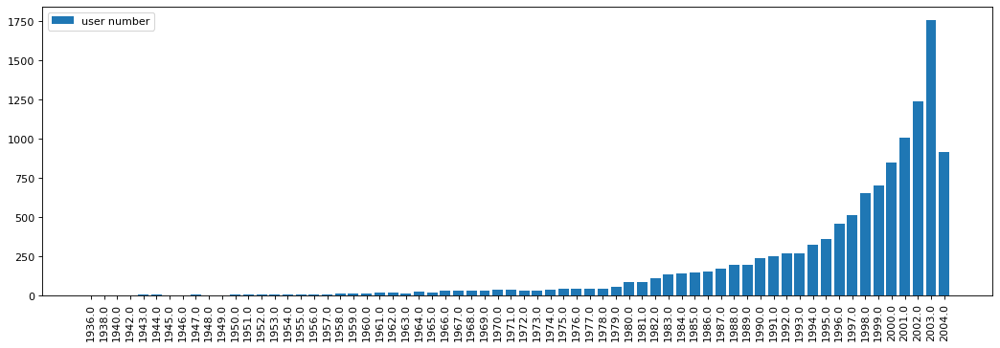

In [3]:
#df.shape # outer 71392 inner 62167 -> have all customer info 12988 user
age_group = df_users['dateOfBirth'].value_counts()
age_group = dict(age_group)
age_group = collections.OrderedDict(sorted(age_group.items()))
figure(figsize=(16, 5), dpi=80)

plt.bar(range(len(age_group)), list(age_group.values()), align='center', label='user number')
plt.xticks(range(len(age_group)), list(age_group.keys()), rotation=90)

plt.legend(loc='best')
plt.show() 

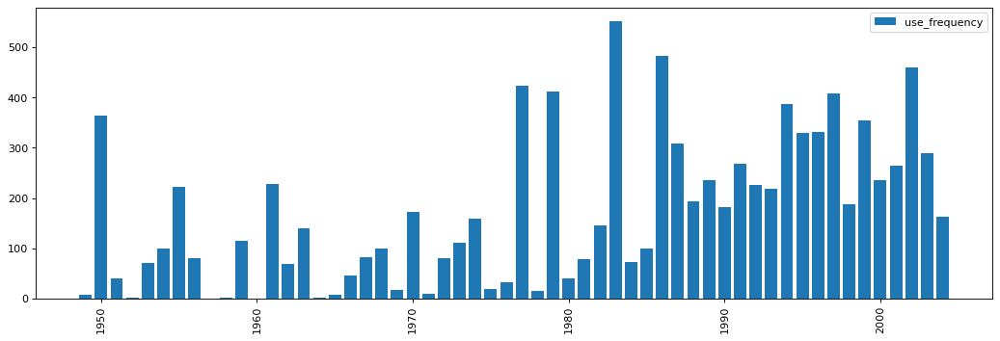

In [572]:
user_frequency = df['customerId'].value_counts()
user_frequency = dict(user_frequency)
year = []
for freq in user_frequency:
    year.append(df.loc[df['customerId'] == freq, 'dateOfBirth'].iloc[0])
    
figure(figsize=(16, 5), dpi=80)
plt.bar(year, list(user_frequency.values()), align='center', label='use_frequency')
plt.xticks(rotation=90)

plt.legend(loc='best')
plt.show() 

In [438]:
#df.groupby('dateOfBirth').size()


2003.0    6921
2002.0    5382
2001.0    4270
2000.0    4094
1998.0    4045
1999.0    3679
1997.0    3654
1996.0    3202
1995.0    2481
1992.0    1958
2004.0    1920
1993.0    1817
1994.0    1698
1986.0    1517
1989.0    1511
1987.0    1353
1991.0    1298
1988.0    1214
1990.0     966
1983.0     914
1985.0     812
1982.0     726
1984.0     643
1977.0     560
1981.0     494
1979.0     460
1970.0     395
1950.0     365
1974.0     339
1973.0     300
1961.0     289
1955.0     242
1980.0     210
1968.0     188
1963.0     153
1976.0     151
1967.0     146
1959.0     143
1972.0     126
1962.0     120
1956.0     110
1954.0     102
1975.0      86
1966.0      83
1971.0      73
1953.0      71
1951.0      51
1969.0      40
1978.0      31
1965.0      30
1949.0       8
1964.0       4
1958.0       3
1952.0       2
Name: dateOfBirth, dtype: int64

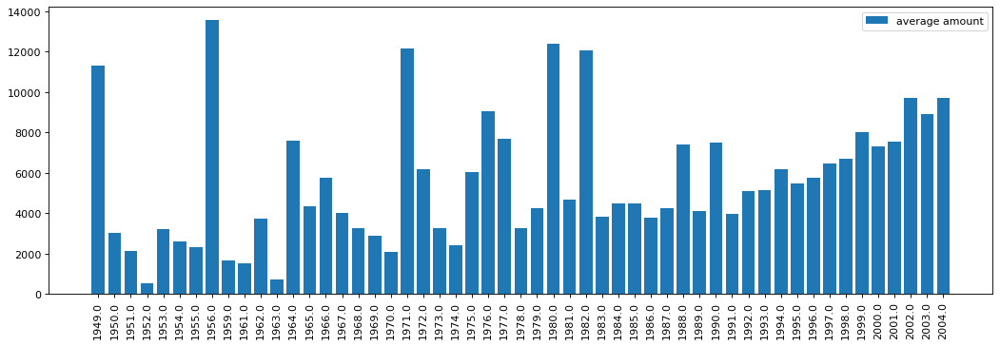

In [503]:
amount_by_year = df.groupby('dateOfBirth')['amount.value'].mean()
#df['customerId'].value_counts().mode() # mean 16, median 6, mode 2, std 37.3
amount_by_year = dict(amount_by_year)
amount_by_year.pop(1958.0)
draw_dict(amount_by_year, 'average amount')

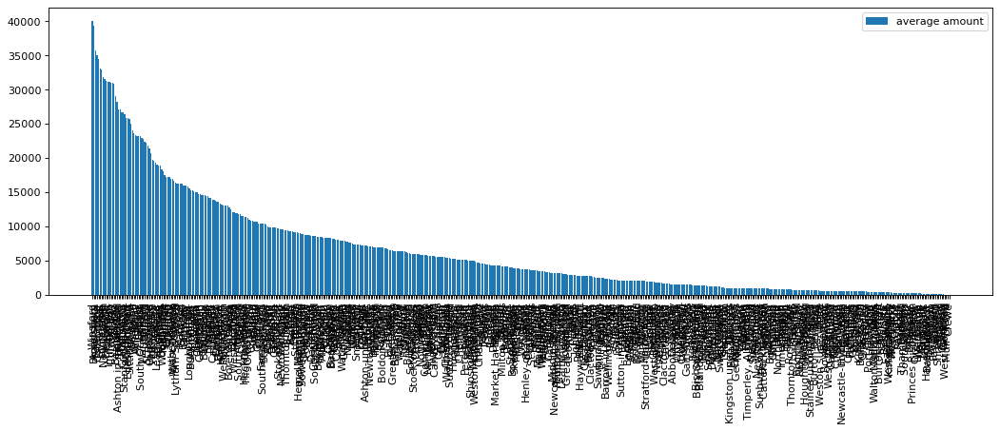

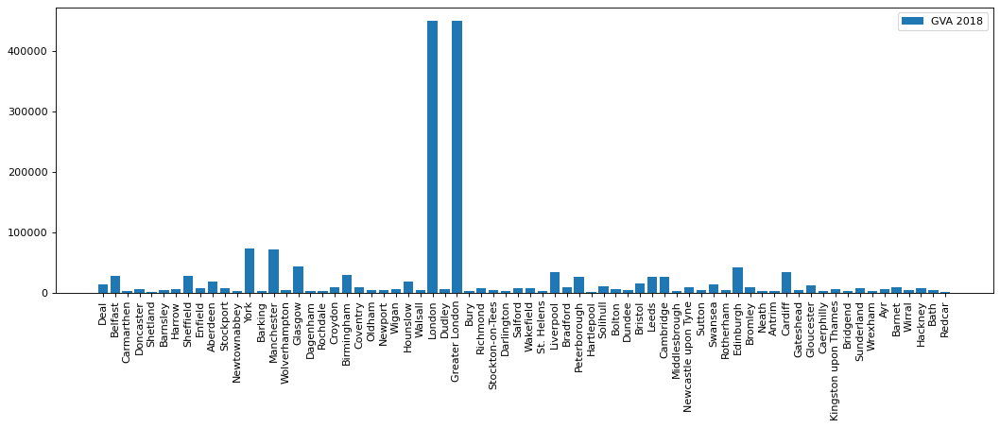

In [562]:
# address
#data_file_GVA = "/Users/Chao/Downloads/regionalgrossdomesticproductgdpcityregions.xlsx"
#df_GVA = pd.read_excel(data_file_GVA, sheet_name='gva')

town_group = df.groupby('address.townOrCity')['amount.value'].mean().sort_values(ascending=False)
#town_group = df.groupby('address.townOrCity')['amount.value'].mean()
town_group = dict(town_group)
gva_group = {}
for town in town_group:
    if list(df_GVA.loc[df_GVA['Area name'].str.contains(town, na=False), '20183']):
        gva_group[town] = list(df_GVA.loc[df_GVA['Area name'].str.contains(town, na=False), '20183'])[0]

draw_dict(town_group, 'average amount')
draw_dict(gva_group, 'GVA 2018')

In [657]:
print(df_trans['amount.value'].mean())
print(df_trans['amount.value'].mode())
print(df_trans['amount.value'].std())
print(df['amount.value'].mean())
print(df['amount.value'].mode())
print(df['amount.value'].std())

print(10798 + 35686)
top_users = dict(df.groupby('customerId')['amount.value'].mean().sort_values(ascending=False).head(430))
top_users

10798.588978075184
0    1000
dtype: int64
35686.24550617364
10798.588978075184
0    1000
dtype: int64
35686.24550617318
46484


{'a837dbed-7257-4f6e-8191-9039a701d3c2': 785544.0,
 'ce039da2-61fd-4f52-9d8a-d2f857b685e5': 746666.6666666666,
 'ad09ed7b-7f8d-4835-9905-a937b0b12ab6': 744476.5,
 '90ddd7d0-f83e-46bf-8470-b14cc7d2055f': 500166.6666666667,
 'f9232864-c430-4da2-8bad-018616977c3b': 450000.0,
 '0621273e-3816-422f-a7ef-69cdea6f741d': 447550.0,
 'f96b57b9-be29-4038-ad6b-b04d6ec9d5b8': 402001.8333333333,
 '8e733c96-60a7-4cf0-a7ce-4befaf280613': 377525.0,
 '717842a0-95c0-4df4-bc4a-42b961e0117b': 372704.0,
 'c3dc3f9a-9e96-457c-9c0a-dff8c623caa8': 332500.0,
 'e455a61b-f117-4b97-b763-5f18f6165952': 308600.0,
 '8d856b48-2457-4066-bdf6-80dafcbee555': 286209.0,
 '1dc537f1-910e-4ef5-a391-1da3a81c2453': 280562.5,
 '320e9d4f-adee-4baa-bc53-0edd2799bd06': 266533.3333333333,
 '8537bc3f-829c-4dc4-a643-464f52b72ce2': 261991.6,
 'af1df29e-a19f-4f1d-9bed-62b525419eba': 245888.53846153847,
 'b5b52783-5d45-4791-a7ef-097286f02f6c': 243998.6,
 '91a10c46-161c-49de-8222-44d234234ed0': 226666.66666666666,
 '5ad17d6d-05f5-4ec4-ac63-

In [658]:
df_trans.groupby('customerId')['amount.value'].mean().sort_values(ascending=False) #3763

customerId
a837dbed-7257-4f6e-8191-9039a701d3c2    785544.000000
ce039da2-61fd-4f52-9d8a-d2f857b685e5    746666.666667
ad09ed7b-7f8d-4835-9905-a937b0b12ab6    744476.500000
90ddd7d0-f83e-46bf-8470-b14cc7d2055f    500166.666667
f9232864-c430-4da2-8bad-018616977c3b    450000.000000
                                            ...      
b6ea4b34-3bb2-4b9e-b0af-70ead3af2813         1.000000
a35fa169-e0fd-4376-830c-dc77b3fce70b         1.000000
389ca924-a93b-4184-a43c-2c23a5dec7f5         1.000000
10e3bb59-6b47-4fe9-b729-c0a9dda34cd7         1.000000
29ecab60-957a-41ee-aab1-0c3f84a8a4b2         1.000000
Name: amount.value, Length: 3763, dtype: float64

In [659]:
df_trans.groupby('externalParty.transactionCategory')['amount.value'].mean().sort_values(ascending=False) 

externalParty.transactionCategory
OTHER           15352.643047
SHOPPING         2590.887546
FUEL             2231.300000
TRAVEL           1320.843705
LIFESTYLE        1289.568817
GROCERIES         968.574165
SUBSCRIPTION      437.461538
Name: amount.value, dtype: float64

In [469]:
df.groupby('address.townOrCity')['amount.value'].agg(['mean', 'count']).sort_values(by='mean', ascending=False).head(50)

,mean,count
address.townOrCity,,
Redlodge Bury St. Edmunds,746666.666667,3
Rushden,447550.000000,2
Cradley Heath,165318.000000,1
Halstead,117526.419355,31
Sandbach,104235.764706,17
Camberley,94600.000000,6
Chessington,94136.322581,31
Potters Bar,90118.750000,16
Stamford,89673.333333,3


In [113]:
# trans every month
df_21_11 = df_trans[(df_trans['createdAt'] > '2021-10-31') & (df_trans['createdAt'] < '2021-12-01')]
df_21_12 = df_trans[(df_trans['createdAt'] > '2021-11-30') & (df_trans['createdAt'] < '2022-01-01')]
df_22_1 = df_trans[(df_trans['createdAt'] > '2021-12-31') & (df_trans['createdAt'] < '2022-02-01')]
df_22_2 = df_trans[(df_trans['createdAt'] > '2022-01-31') & (df_trans['createdAt'] < '2022-03-01')]
df_22_3 = df_trans[(df_trans['createdAt'] > '2022-02-28') & (df_trans['createdAt'] < '2022-04-01')]
df_22_4 = df_trans[(df_trans['createdAt'] > '2022-03-31') & (df_trans['createdAt'] < '2022-05-01')]
df_22_5 = df_trans[(df_trans['createdAt'] > '2022-04-30') & (df_trans['createdAt'] < '2022-06-01')]
df_22_6 = df_trans[(df_trans['createdAt'] > '2022-05-31') & (df_trans['createdAt'] < '2022-07-01')]
df_22_7 = df_trans[(df_trans['createdAt'] > '2022-06-30') & (df_trans['createdAt'] < '2022-08-01')]

In [114]:
trans_month = [df_21_11, df_21_12, df_22_1, df_22_2, df_22_3, df_22_4, df_22_5, df_22_6, df_22_7]
for month in trans_month:
    print(month.shape)

(107, 12)
(240, 12)
(582, 12)
(1737, 12)
(3456, 12)
(7981, 12)
(21633, 12)
(20900, 12)
(7832, 12)


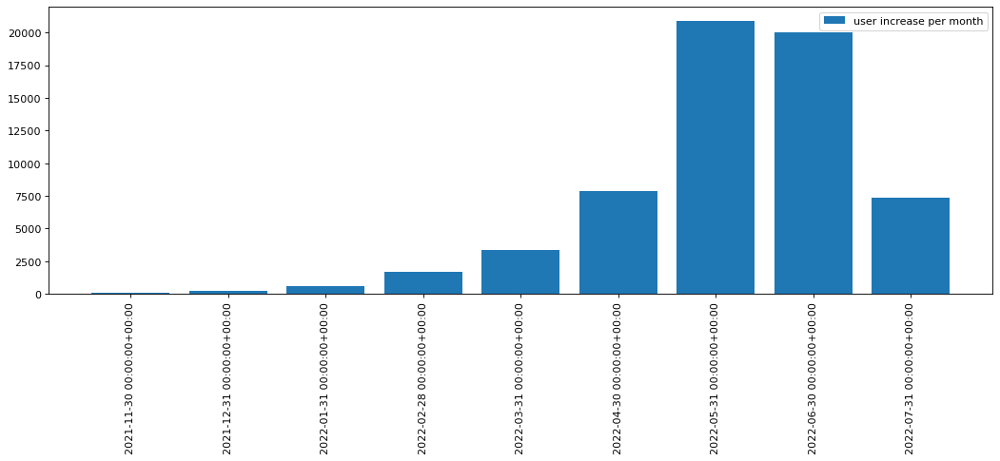

In [730]:
trans_increase = df.groupby(pd.Grouper(key='createdAt_x', axis=0, freq='M')).size()
trans_increase = dict(trans_increase)
draw_dict(trans_increase, 'user increase per month')

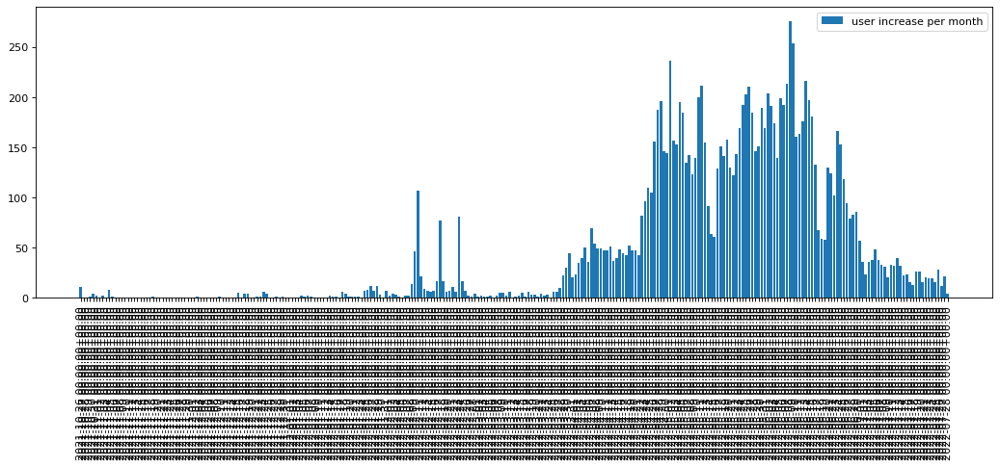

In [178]:
# user number increase
#user_increase = df_trans.groupby(pd.Grouper(key='createdAt', axis=0, freq='D')).size()
#user_increase = dict(user_increase)
#draw_dict(user_increase, 'user increase per month')
user_increase = df_users.groupby(pd.Grouper(key='createdAt', axis=0, freq='D')).size()
user_increase = dict(user_increase)
draw_dict(user_increase, 'user increase per month')

In [654]:
# user frequency and create time
user_frequency_time = df.groupby([pd.Grouper(key='createdAt_x', axis=0, freq='M'), pd.Grouper(key='createdAt_y', axis=0, freq='M')]).size()
user_frequency_time = pd.DataFrame(user_frequency_time)


In [655]:
#print(user_frequency_time.groupby('createdAt_y').sum())
user_frequency_month = {9:0, 8:0, 7:0, 6:0, 5:0, 4:0, 3:0, 2:0, 1:0, 0:0}
index = 0
end = 9
for i, row in user_frequency_time.iloc[::-1].iterrows():
    user_frequency_month[index] += row.values[0]
    if index == end:
        index = 0
        end -= 1
    else:
        index += 1
print(user_frequency_month)

user_frequency_time


{9: 142, 8: 226, 7: 490, 6: 734, 5: 1689, 4: 2016, 3: 3904, 2: 7644, 1: 21432, 0: 23890}


0
createdAt_x               createdAt_y                     
2021-11-30 00:00:00+00:00 2021-10-31 00:00:00+00:00     99
                          2021-11-30 00:00:00+00:00      8
2021-12-31 00:00:00+00:00 2021-10-31 00:00:00+00:00    154
                          2021-11-30 00:00:00+00:00     56
                          2021-12-31 00:00:00+00:00     25
2022-01-31 00:00:00+00:00 2021-10-31 00:00:00+00:00    214
                          2021-11-30 00:00:00+00:00    111
                          2021-12-31 00:00:00+00:00    169
                          2022-01-31 00:00:00+00:00     75
2022-02-28 00:00:00+00:00 2021-10-31 00:00:00+00:00    322
                          2021-11-30 00:00:00+00:00    104
                          2021-12-31 00:00:00+00:00    195
                          2022-01-31 00:00:00+00:00    201
                          2022-02-28 00:00:00+00:00    892
2022-03-31 00:00:00+00:00 2021-10-31 00:00:00+00:00    308
                          2021-11-30 00:00:00+00:00    181
                          2021-12-31 00:00:00+00:00    205
                          2022-01-31 00:00:00+00:00    396
                          2022-02-28 00:00:00+00:00   2060
                          2022-03-31 00:00:00+00:00    192
2022-04-30 00:00:00+00:00 2021-10-31 00:00:00+00:00    193
                          2021-11-30 00:00:00+00:00    190
                          2021-12-31 00:00:00+00:00    176
                          2022-01-31 00:00:00+00:00    313
                          2022-02-28 00:00:00+00:00   1389
                          2022-03-31 00:00:00+00:00    658
                          2022-04-30 00:00:00+00:00   4955
2022-05-31 00:00:00+00:00 2021-10-31 00:00:00+00:00    156
                          2021-11-30 00:00:00+00:00    134
                          2021-12-31 00:00:00+00:00    117
                          2022-01-31 00:00:00+00:00    283
                          2022-02-28 00:00:00+00:00   1393
                          2022-03-31 00:00:00+00:00    619
                          2022-04-30 00:00:00+00:00   7531
                          2022-05-31 00:00:00+00:00  10693
2022-06-30 00:00:00+00:00 2021-10-31 00:00:00+00:00    126
                          2021-11-30 00:00:00+00:00    131
                          2021-12-31 00:00:00+00:00    164
                          2022-01-31 00:00:00+00:00    248
                          2022-02-28 00:00:00+00:00    947
                          2022-03-31 00:00:00+00:00    284
                          2022-04-30 00:00:00+00:00   3481
                          2022-05-31 00:00:00+00:00   8184
                          2022-06-30 00:00:00+00:00   6452
2022-07-31 00:00:00+00:00 2021-10-31 00:00:00+00:00    142
                          2021-11-30 00:00:00+00:00    100
                          2021-12-31 00:00:00+00:00    203
                          2022-01-31 00:00:00+00:00    243
                          2022-02-28 00:00:00+00:00    826
                          2022-03-31 00:00:00+00:00    107
                          2022-04-30 00:00:00+00:00   1391
                          2022-05-31 00:00:00+00:00   1299
                          2022-06-30 00:00:00+00:00   2474
                          2022-07-31 00:00:00+00:00    598

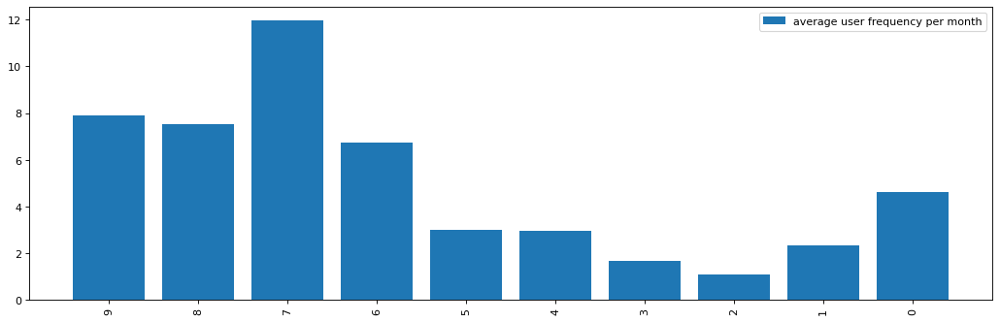

[18, 30, 41, 109, 564, 680, 2367, 7004, 9277, 5165]


In [656]:
users_month = []
pre = 0
for num in user_increase.values():
    users_month.append(num + pre)
    pre = num

user_frequency_month_avg = {9:0, 8:0, 7:0, 6:0, 5:0, 4:0, 3:0, 2:0, 1:0, 0:0}
for i, month in enumerate(user_frequency_month):
    user_frequency_month_avg[month] = user_frequency_month[month] / users_month[i]
draw_dict(user_frequency_month_avg, 'average user frequency per month')
print(users_month)

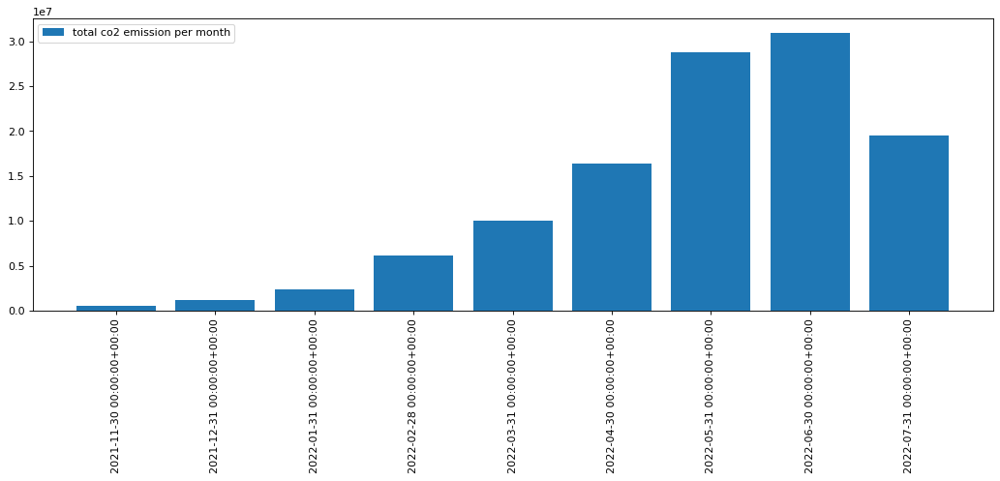

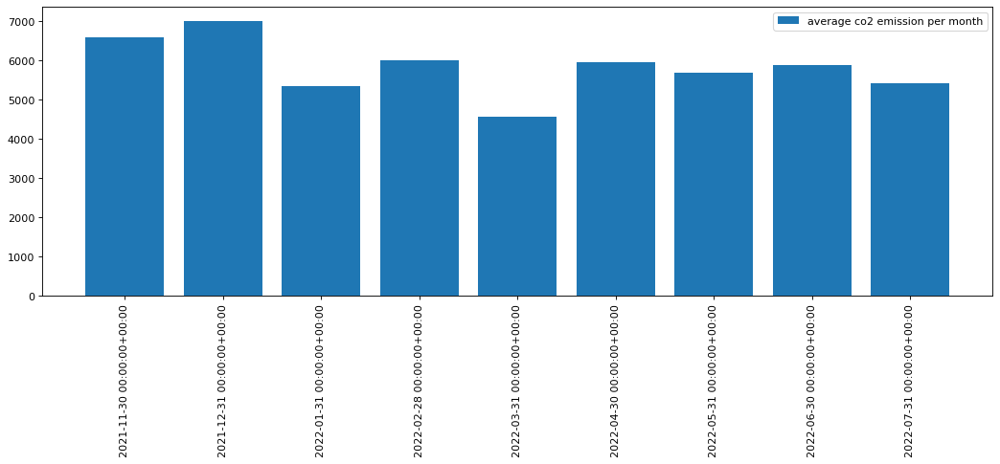

In [713]:
df_co2 = df_trans[(df_trans['transactionFootPrint.carbonEmissionInGrams'] > 0) & (df_trans['transactionFootPrint.carbonEmissionInGrams'] < 60000)]
co2_month_sum = df_co2.groupby(pd.Grouper(key='createdAt', axis=0, freq='M'))['transactionFootPrint.carbonEmissionInGrams'].sum()
draw_dict(dict(co2_month_sum), 'total co2 emission per month')
co2_month_avg = df_co2.groupby(pd.Grouper(key='createdAt', axis=0, freq='M'))['transactionFootPrint.carbonEmissionInGrams'].mean()
draw_dict(dict(co2_month_avg), 'average co2 emission per month')

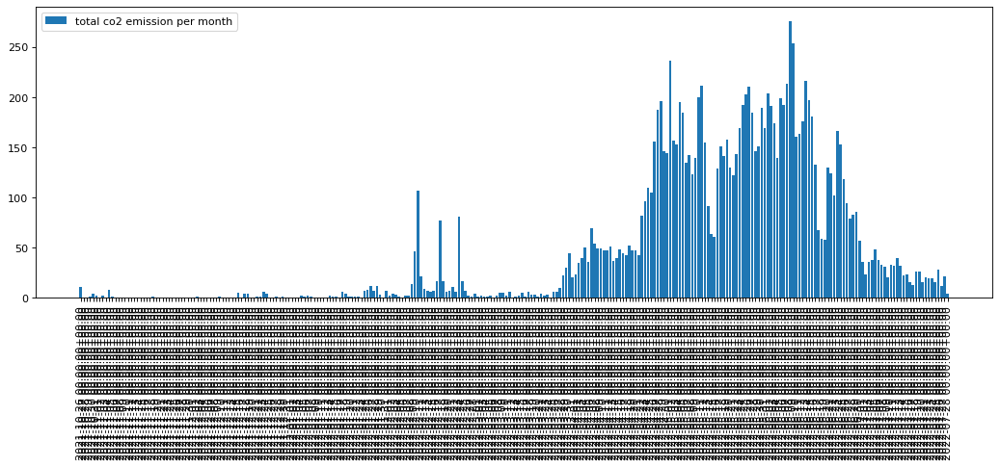

In [223]:
#df_co2 = df_trans[(df_trans['transactionFootPrint.carbonEmissionInGrams'] < 60000)]

co2_month_sum = df_users.groupby(pd.Grouper(key='createdAt', axis=0, freq='D')).size()
draw_dict(dict(co2_month_sum), 'total co2 emission per month')

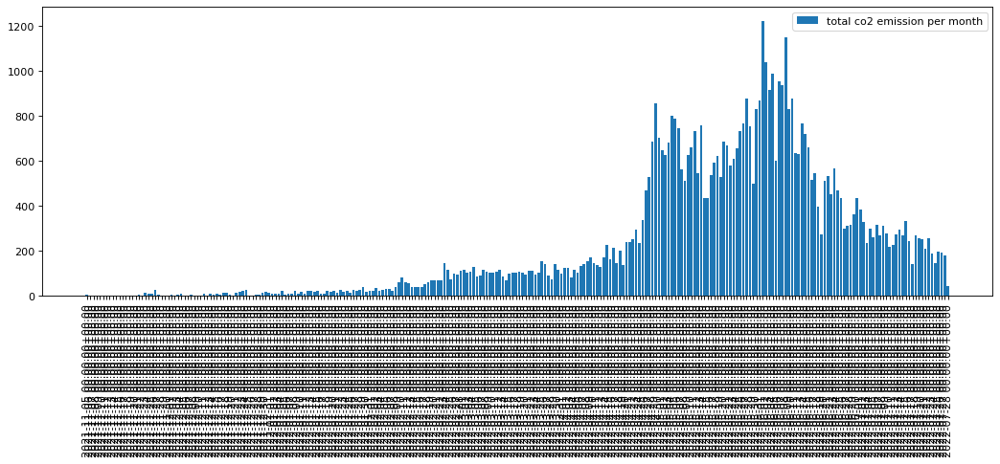

In [221]:
df_co2 = df_trans[(df_trans['transactionFootPrint.carbonEmissionInGrams'] < 60000)]

co2_month_sum = df_co2.groupby(pd.Grouper(key='createdAt', axis=0, freq='D')).size()
draw_dict(dict(co2_month_sum), 'total co2 emission per month')
#co2_month_avg = df_co2.groupby(pd.Grouper(key='createdAt', axis=0, freq='D')).mean()
#draw_dict(dict(co2_month_avg), 'average co2 emission per month')

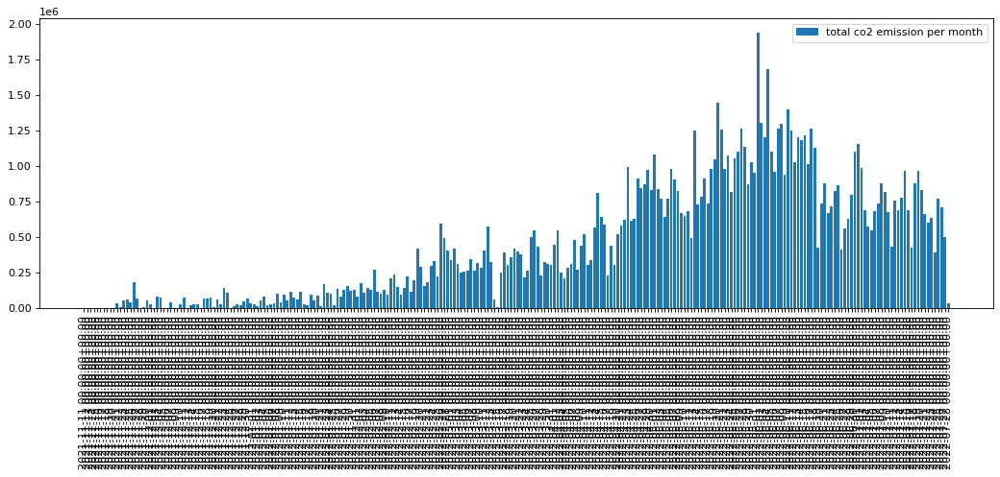

In [220]:
df_co2 = df_trans[(df_trans['transactionFootPrint.carbonEmissionInGrams'] > 0) & (df_trans['transactionFootPrint.carbonEmissionInGrams'] < 60000)]
co2_month_sum = df_co2.groupby(pd.Grouper(key='createdAt', axis=0, freq='D'))['transactionFootPrint.carbonEmissionInGrams'].sum()
draw_dict(dict(co2_month_sum), 'total co2 emission per month')

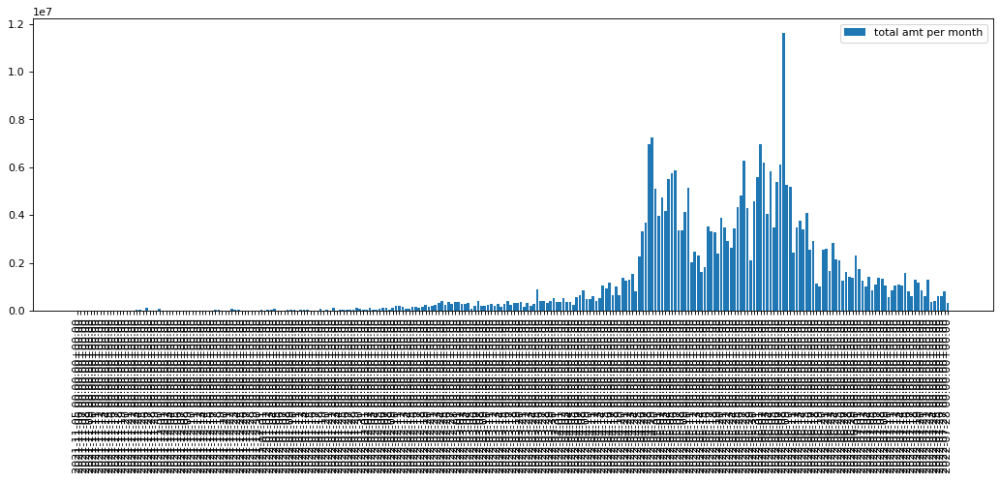

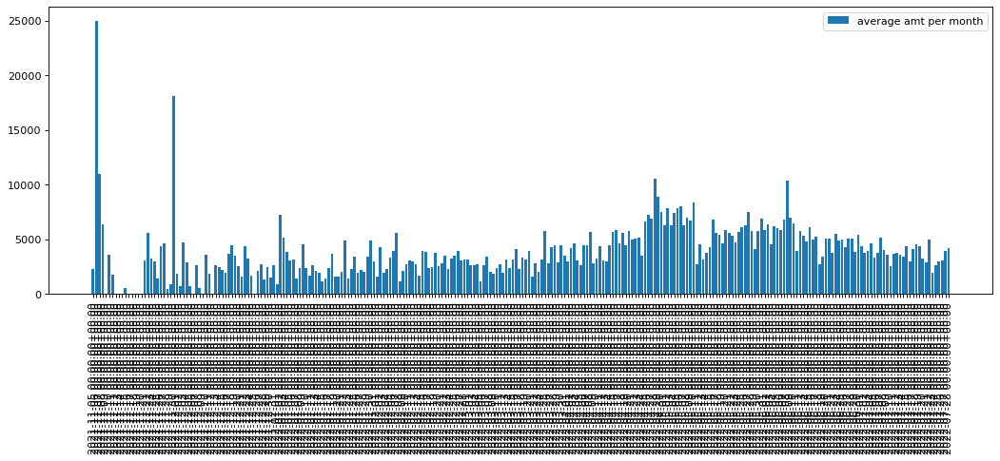

In [136]:
df_amt = df_trans[df_trans['amount.value'] < 60000]
amt_month_sum = df_amt.groupby(pd.Grouper(key='createdAt', axis=0, freq='D'))['amount.value'].sum()
draw_dict(dict(amt_month_sum), 'total amt per month')
amt_month_avg = df_amt.groupby(pd.Grouper(key='createdAt', axis=0, freq='D'))['amount.value'].mean()
draw_dict(dict(amt_month_avg), 'average amt per month')

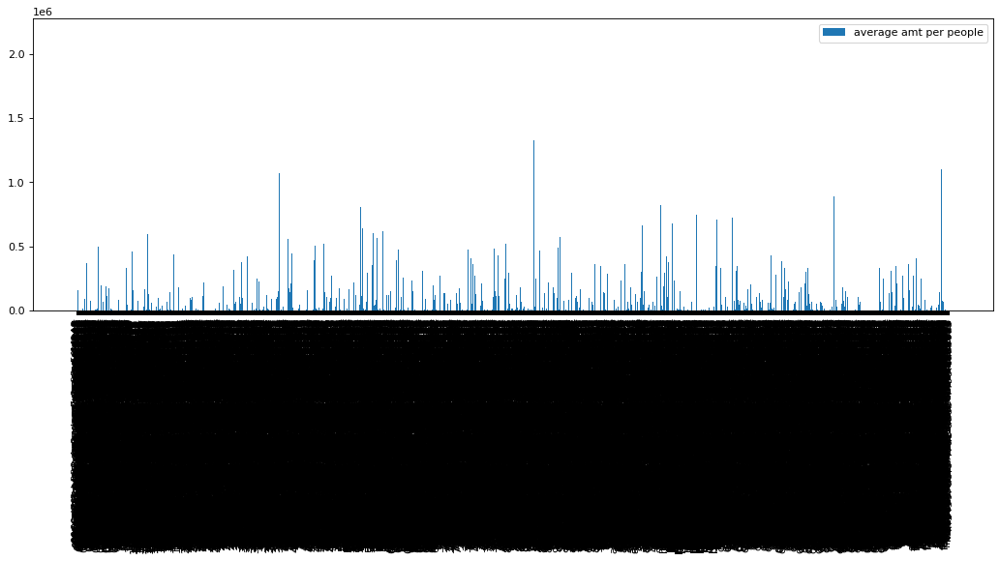

In [168]:
amt_month_avg = df_amt.groupby('customerId')['amount.value'].sum()
draw_dict(dict(amt_month_avg), 'total amt per people')

In [170]:
amt_month_avg.mean()

85895.75163043478

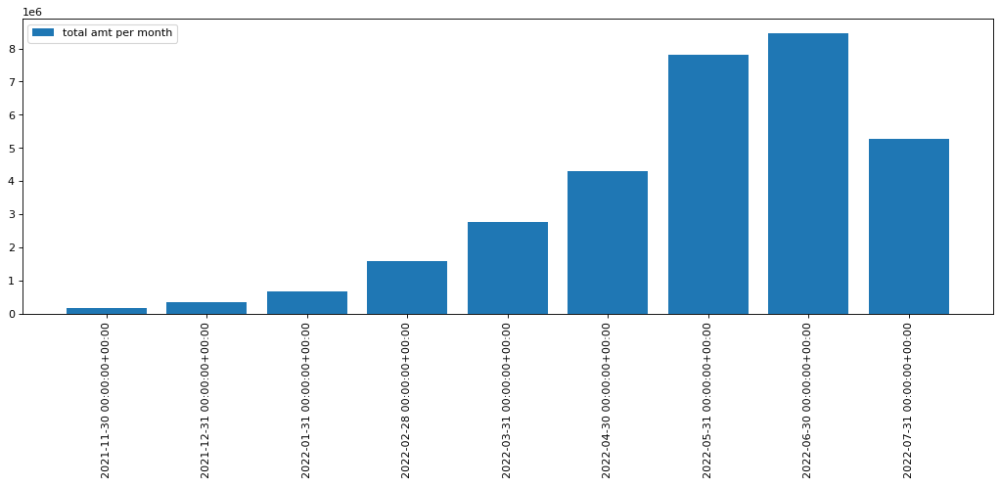

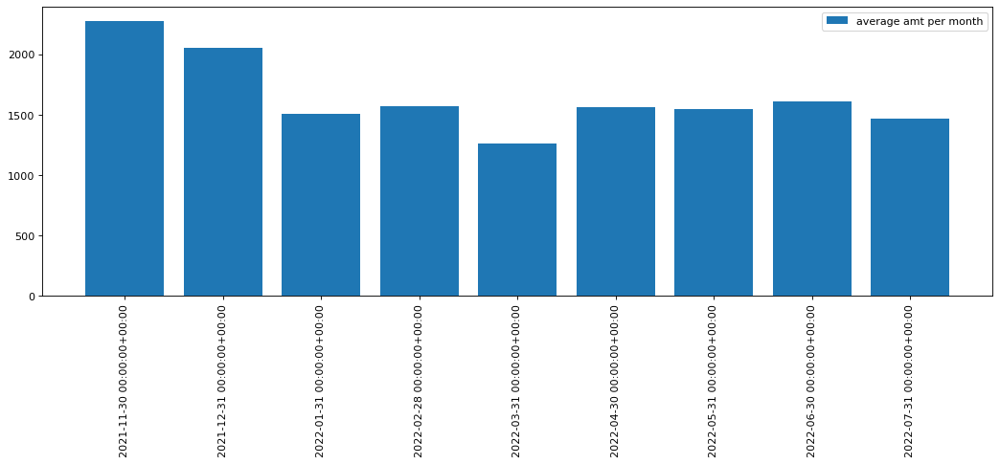

In [111]:
df_amt = df_trans[(df_trans['transactionFootPrint.carbonEmissionInGrams'] > 0) & (df_trans['transactionFootPrint.carbonEmissionInGrams'] < 60000)]
amt_month_sum = df_amt.groupby(pd.Grouper(key='createdAt', axis=0, freq='M'))['amount.value'].sum()
draw_dict(dict(amt_month_sum), 'total amt per month')
amt_month_avg = df_amt.groupby(pd.Grouper(key='createdAt', axis=0, freq='M'))['amount.value'].mean()
draw_dict(dict(amt_month_avg), 'average amt per month')

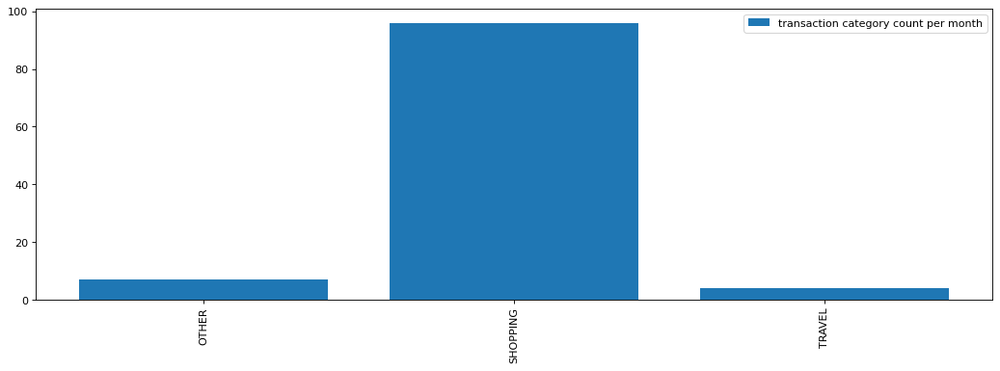

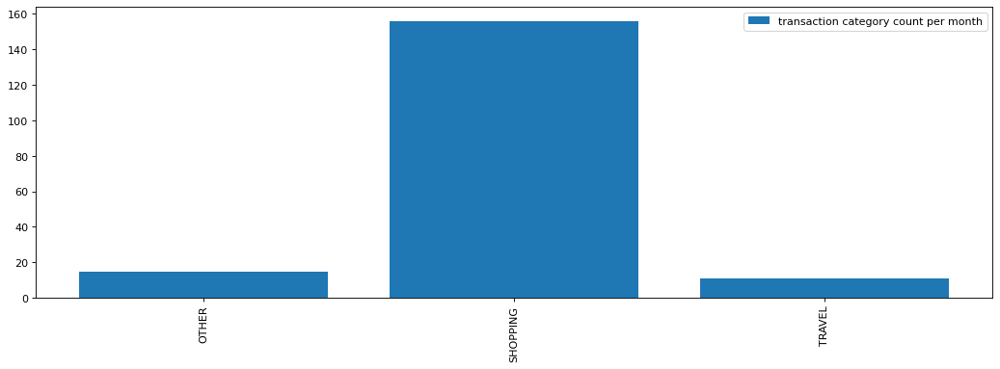

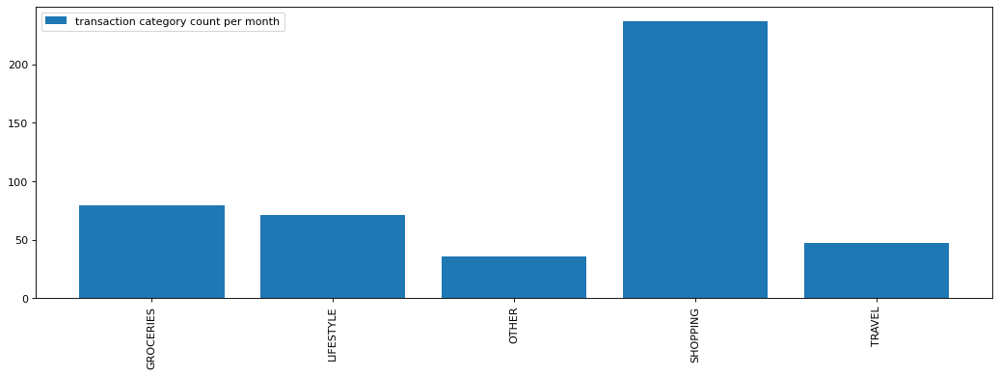

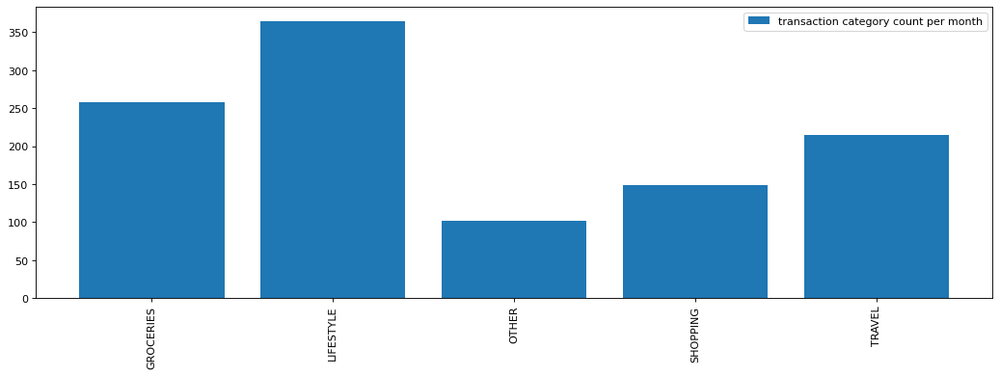

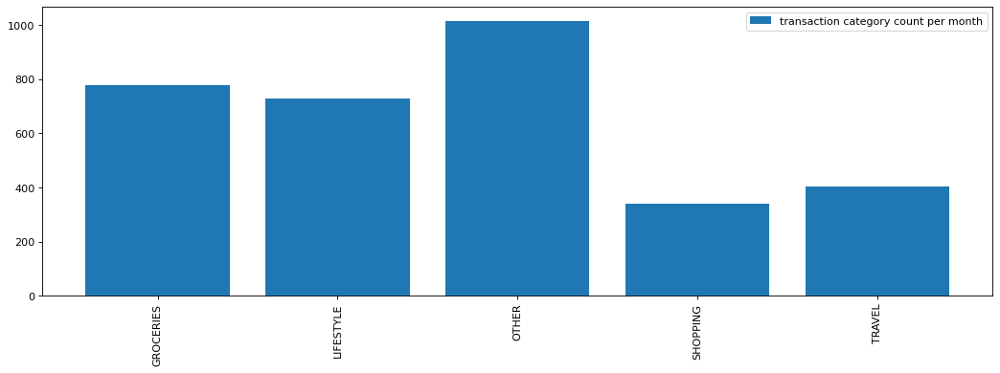

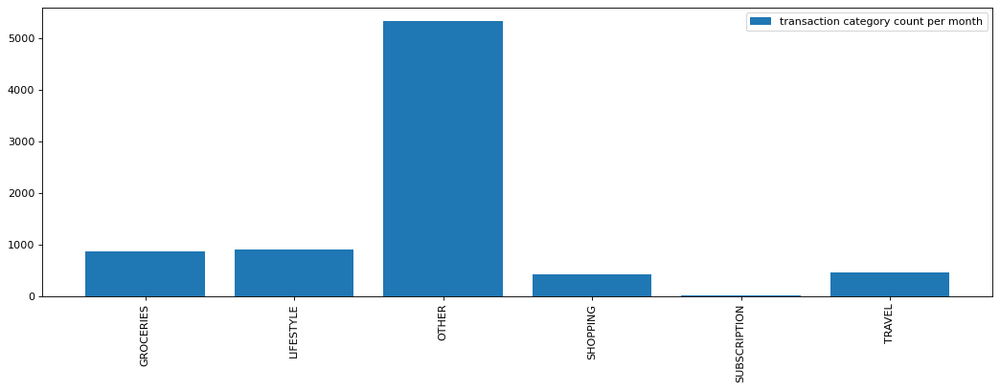

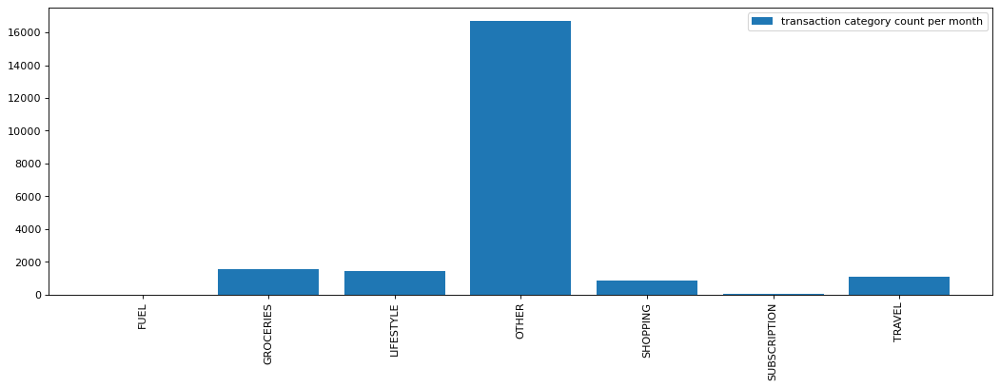

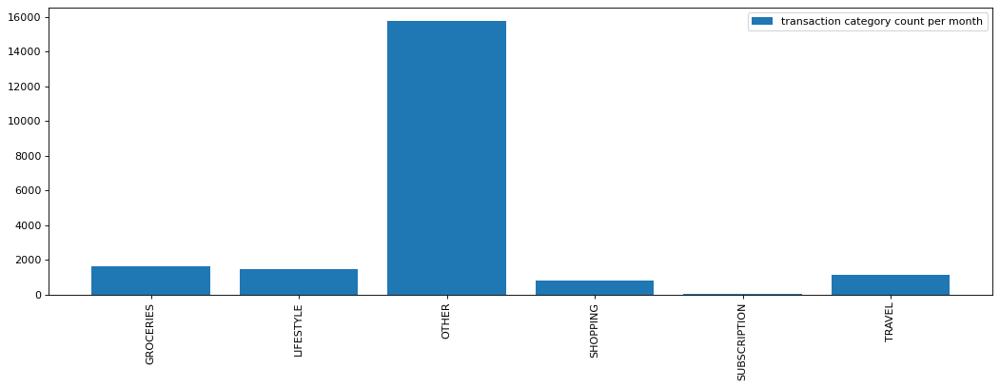

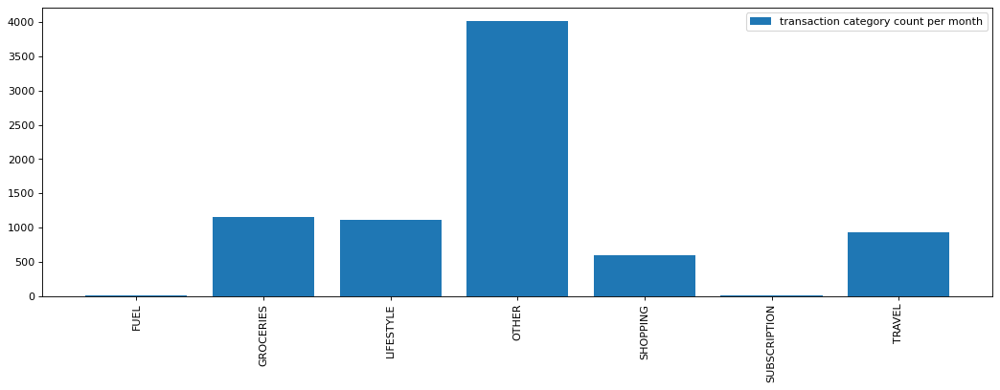

In [737]:
#cat_monthly = df.groupby([pd.Grouper(key='createdAt_x', axis=0, freq='M'), 'externalParty.transactionCategory']).size()
for month in trans_month:
    cat_monthly = month.groupby('externalParty.transactionCategory').size()
    draw_dict(dict(cat_monthly), 'transaction category count per month')

In [770]:
df_test = df.groupby(['customerId', 'externalParty.transactionCategory']).size()
df_test = df_test.to_frame(name = 'size').reset_index()
print(df_test.shape)
print(df_trans['customerId'].value_counts())
df_test['externalParty.transactionCategory'].value_counts() # 3763


(5823, 3)
b1bf1119-cdce-46de-b296-f3f733ee2779    552
2aa2a980-470d-470a-8379-ec51e5036ee4    483
34f30c26-4ab6-4b64-94f2-ccdf4cd0b1c1    460
3253926e-9c0d-4fd9-8248-eb7c2f457b99    424
e1090e22-632f-45e4-a480-b9206b3a573d    412
                                       ... 
5bd90ae4-dd59-4875-bca2-59c07300173c      1
2d09d861-ead0-4bae-be8f-3a9916bac9bd      1
57e600dc-5cce-4d4f-848a-f6608eef5185      1
297a2225-c415-4448-872b-4e3291e12174      1
b6387ce7-7cfd-44f6-aae6-e89641327175      1
Name: customerId, Length: 3763, dtype: int64


OTHER           3604
GROCERIES        587
LIFESTYLE        566
TRAVEL           507
SHOPPING         494
SUBSCRIPTION      60
FUEL               5
Name: externalParty.transactionCategory, dtype: int64

In [676]:
df_21_11.groupby('customerId')['transactionFootPrint.carbonEmissionInGrams'].agg(['mean', 'sum', 'count']).sort_values(by='mean', ascending=False)

,mean,sum,count
customerId,,,
e1090e22-632f-45e4-a480-b9206b3a573d,2.731292e+06,2731292.44,1
e047d168-451f-484a-908a-857d556e0a8f,1.365646e+06,1365646.22,1
533e1809-b98a-4455-bbf2-8d8780507002,5.462585e+05,546258.49,1
437d909b-d630-4ec9-922c-480c4cfab527,2.731292e+05,273129.24,1
af7c2018-56a5-4338-afb4-25e35fe2f427,2.731292e+05,273129.24,1
b3ec512b-ffff-4d83-baa3-ecd8374a398b,1.823138e+05,1093882.62,6
ffcf3506-a7d8-48a0-ba54-d4d54d15ee78,1.365646e+05,136564.62,1
3253926e-9c0d-4fd9-8248-eb7c2f457b99,6.733646e+04,2895467.57,43
5ec14a71-9089-43e4-b4c9-82db1fed11a2,5.462585e+04,54625.85,1


In [677]:
df_21_12.groupby('customerId')['transactionFootPrint.carbonEmissionInGrams'].agg(['mean', 'sum', 'count']).sort_values(by='mean', ascending=False)

,mean,sum,count
customerId,,,
3253926e-9c0d-4fd9-8248-eb7c2f457b99,11998.882877,875918.45,73
e1090e22-632f-45e4-a480-b9206b3a573d,8374.948947,159124.03,19
2aa2a980-470d-470a-8379-ec51e5036ee4,6322.197209,271854.48,43
99d40295-a201-4e6b-b2ab-23eb43603364,5934.994286,41544.96,7
437d909b-d630-4ec9-922c-480c4cfab527,3469.120000,48567.68,14
ffcf3506-a7d8-48a0-ba54-d4d54d15ee78,3405.865833,40870.39,12
0c922076-e434-411a-8a3e-1c06b00979f4,2888.553529,49105.41,17
06736825-4170-45cf-aef9-75e449ea19e7,2299.906000,11499.53,5
af7c2018-56a5-4338-afb4-25e35fe2f427,2106.618750,16852.95,8


In [27]:
def draw_dict(dict_value, label):
    figure(figsize=(16, 5), dpi=80)

    plt.bar(range(len(dict_value)), list(dict_value.values()), align='center', label=label)
    plt.xticks(range(len(dict_value)), list(dict_value.keys()), rotation=90)

    plt.legend(loc='best')
    plt.show()

In [239]:
"""
trans_id - category  weight:carbon emission, amount, mmc, trans type, direction
to see the relation between the carbon emission amount and the trans cat

more specific graph of the above graph, can be used in deeply analysis eg: for cat shopping, the most common mmc 
and the mmc cost the most

find the relationship between amount and the carbon emission for all cat
to ensure eg: that normally high amount means high carbon emission etc.

find the relationship between trans type and direction, get the portion of each typr in each cat
to ensure eg: there in no evidence that trans type and direction would affect the carbon emission etc.

users
trans_id - customerid weight:carbon emission, amount, cat, trans type, direction
analysis user address and age affect the transaction amount, carbon emission, cat, trans type and direction

payees

"""

#trans_1 = df_trans.head(10)
#trans_1

payees_1  = df_payees.head(10)

payees_1




,_id,createdAt,Sender customerId,Sender is an ekko user,Receiver is an ekkoAccount?,Receiver accountNumber,Receiver payeeType,Receiver sortCode,Is Top Up?,updatedAt,acccount_full
0,6201245fbe7e0d00104d05d7,2022-02-07 13:53:35.103000+00:00,ce3d4f74-f5ea-4d78-8ba8-ceca45235edb,True,False,42789668,INDIVIDUAL,309778,False,2022-02-07T13:53:35.103Z,42789668_309778
1,6201253ebe7e0d00104d05e0,2022-02-07 13:57:18.050000+00:00,ffcf3506-a7d8-48a0-ba54-d4d54d15ee78,True,True,28664732,INDIVIDUAL,236972,False,2022-02-07T13:57:18.050Z,28664732_236972
2,62012600be7e0d00104d05ed,2022-02-07 14:00:32.740000+00:00,2aa2a980-470d-470a-8379-ec51e5036ee4,True,False,1567853,INDIVIDUAL,402706,False,2022-02-07T14:00:32.740Z,1567853_402706
3,6201267cbe7e0d00104d05f6,2022-02-07 14:02:36.428000+00:00,ffcf3506-a7d8-48a0-ba54-d4d54d15ee78,True,False,1617737,INDIVIDUAL,400903,False,2022-02-07T14:02:36.428Z,1617737_400903
4,620126f9be7e0d00104d0607,2022-02-07 14:04:41.508000+00:00,2aa2a980-470d-470a-8379-ec51e5036ee4,True,True,28664997,INDIVIDUAL,236972,False,2022-02-07T14:04:41.508Z,28664997_236972
5,620147481ad11a0011ca4cdc,2022-02-07 16:22:32.676000+00:00,749ca4ea-26cb-4163-83f1-f5a2fca3a16a,True,False,90385026,INDIVIDUAL,204673,False,2022-02-07T16:22:32.676Z,90385026_204673
6,620180638f785400106f17ed,2022-02-07 20:26:11.792000+00:00,3253926e-9c0d-4fd9-8248-eb7c2f457b99,True,False,12844041,INDIVIDUAL,90129,False,2022-02-07T20:26:11.792Z,12844041_90129
7,620385b03ce99a00119aa17e,2022-02-09 09:13:20.413000+00:00,c0cdb5dc-ac39-4265-b66a-51faf326aed8,True,False,27722062,INDIVIDUAL,40004,False,2022-02-09T09:13:20.413Z,27722062_40004
8,6204d35d6e821b00108ab00b,2022-02-10 08:57:01.259000+00:00,6dec603a-b53c-4ca2-8c00-88f120d926f8,True,False,10184330,INDIVIDUAL,89066,False,2022-02-10T08:57:01.259Z,10184330_89066
9,6205a2d13afee40012c38b90,2022-02-10 23:42:09.299000+00:00,886926ad-2f76-4746-a7fc-ca1473c848a3,True,False,11426645,INDIVIDUAL,40004,False,2022-02-10T23:42:09.299Z,11426645_40004


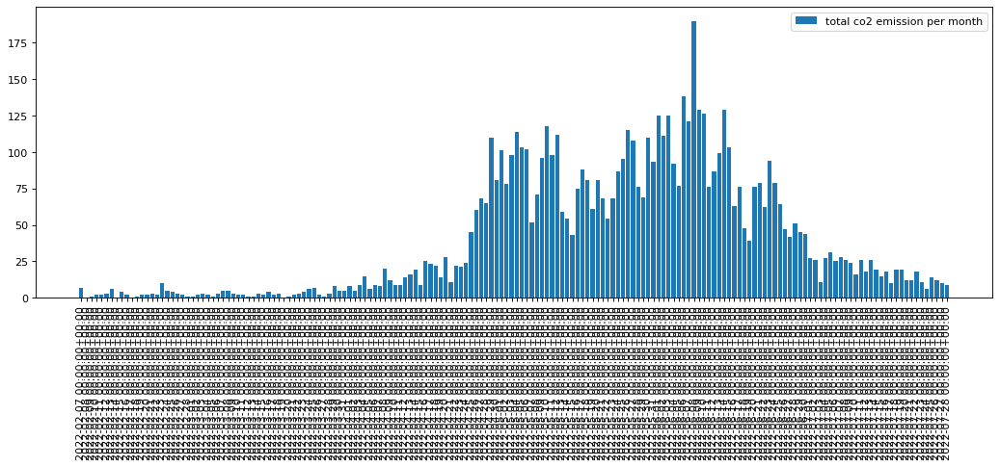

In [29]:
#len(pd.Series(df_trans['customerId']).unique()) # 3763
df_payees['createdAt'] =  pd.to_datetime(df_payees['createdAt'])
co2_month_sum = df_payees.groupby(pd.Grouper(key='createdAt', axis=0, freq='D'))['acccount_full'].size()
draw_dict(dict(co2_month_sum), 'total co2 emission per month')

In [230]:
G = nx.DiGraph()
G = nx.from_pandas_edgelist(df_payees, 'Sender customerId', 'acccount_full', create_using=nx.DiGraph())
df_payees['createdAt'] =  pd.to_datetime(df_payees['createdAt'])

In [247]:
df_22_2 = df_payees[(df_payees['createdAt'] > '2022-01-31') & (df_payees['createdAt'] < '2022-03-01')]
df_22_3 = df_payees[(df_payees['createdAt'] > '2022-02-28') & (df_payees['createdAt'] < '2022-04-01')]
df_22_4 = df_payees[(df_payees['createdAt'] > '2022-03-31') & (df_payees['createdAt'] < '2022-05-01')]
df_22_5 = df_payees[(df_payees['createdAt'] > '2022-04-30') & (df_payees['createdAt'] < '2022-06-01')]
df_22_6 = df_payees[(df_payees['createdAt'] > '2022-05-31') & (df_payees['createdAt'] < '2022-07-01')]
df_22_7 = df_payees[(df_payees['createdAt'] > '2022-06-30') & (df_payees['createdAt'] < '2022-08-01')]
df_p = [df_22_2, df_22_3, df_22_4, df_22_5, df_22_6, df_22_7]

{}


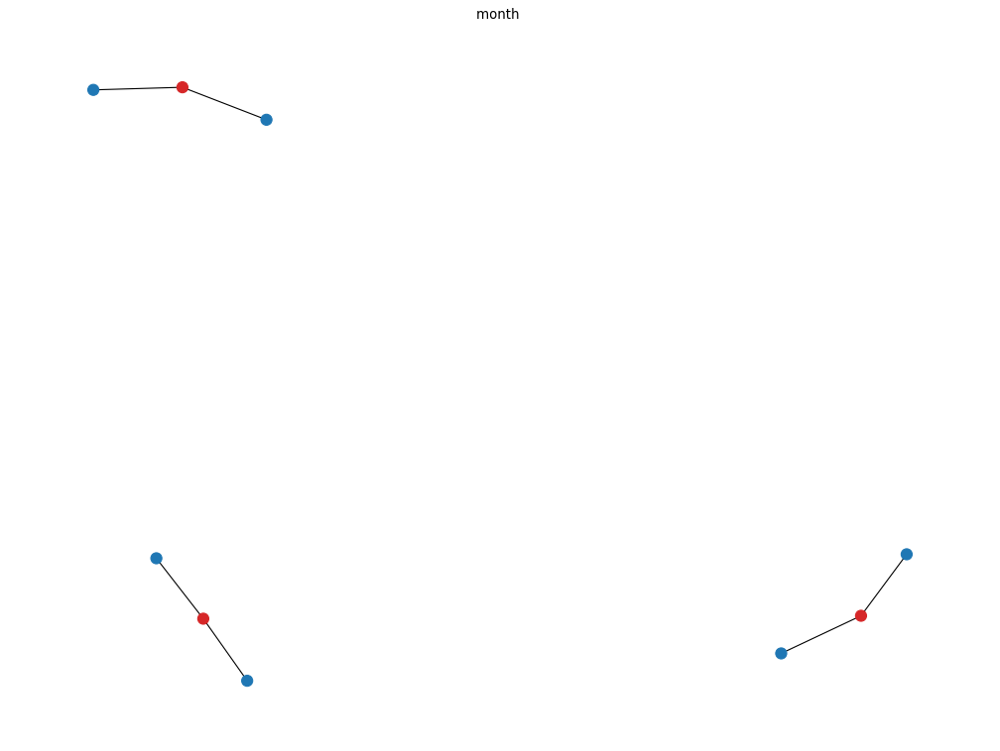

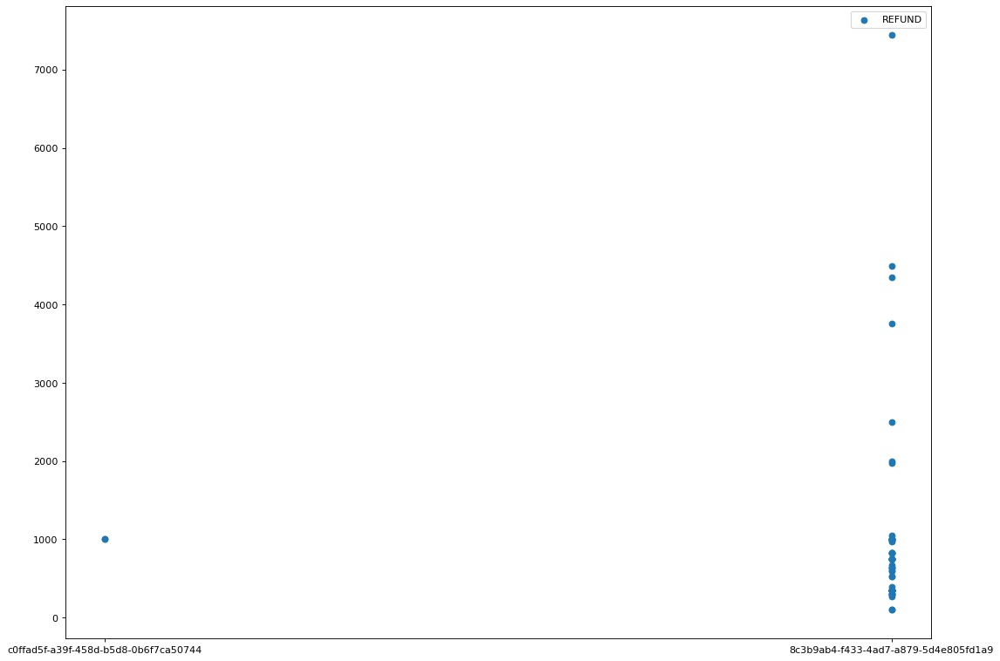

LIFESTYLE    21
GROCERIES    19
OTHER         8
TRAVEL        1
Name: externalParty.transactionCategory, dtype: int64


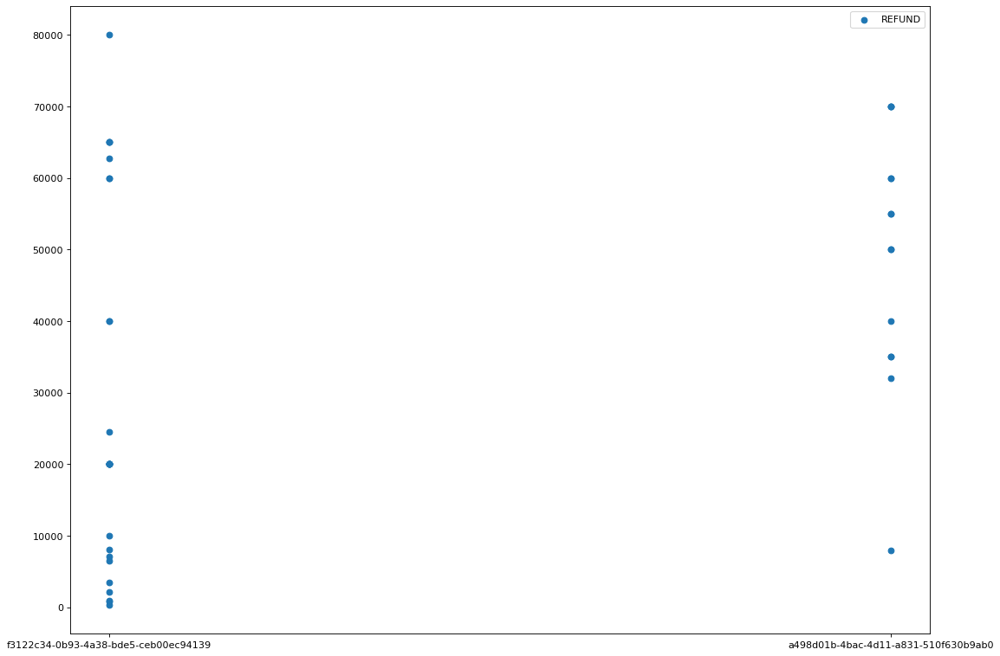

OTHER        37
SHOPPING      2
LIFESTYLE     1
Name: externalParty.transactionCategory, dtype: int64


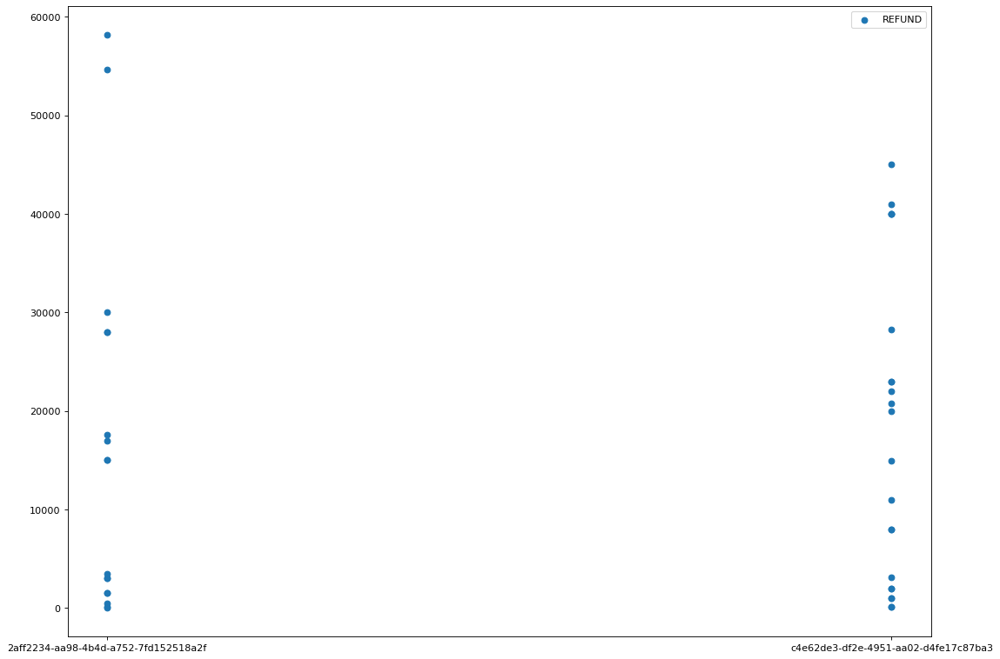

OTHER       35
SHOPPING     2
TRAVEL       2
Name: externalParty.transactionCategory, dtype: int64
{'29450271_236972': {'c0ffad5f-a39f-458d-b5d8-0b6f7ca50744', '8c3b9ab4-f433-4ad7-a879-5d4e805fd1a9'}, '33684400_90129': {'f3122c34-0b93-4a38-bde5-ceb00ec94139', 'a498d01b-4bac-4d11-a831-510f630b9ab0'}, '6215934_300248': {'2aff2234-aa98-4b4d-a752-7fd152518a2f', 'c4e62de3-df2e-4951-aa02-d4fe17c87ba3'}}


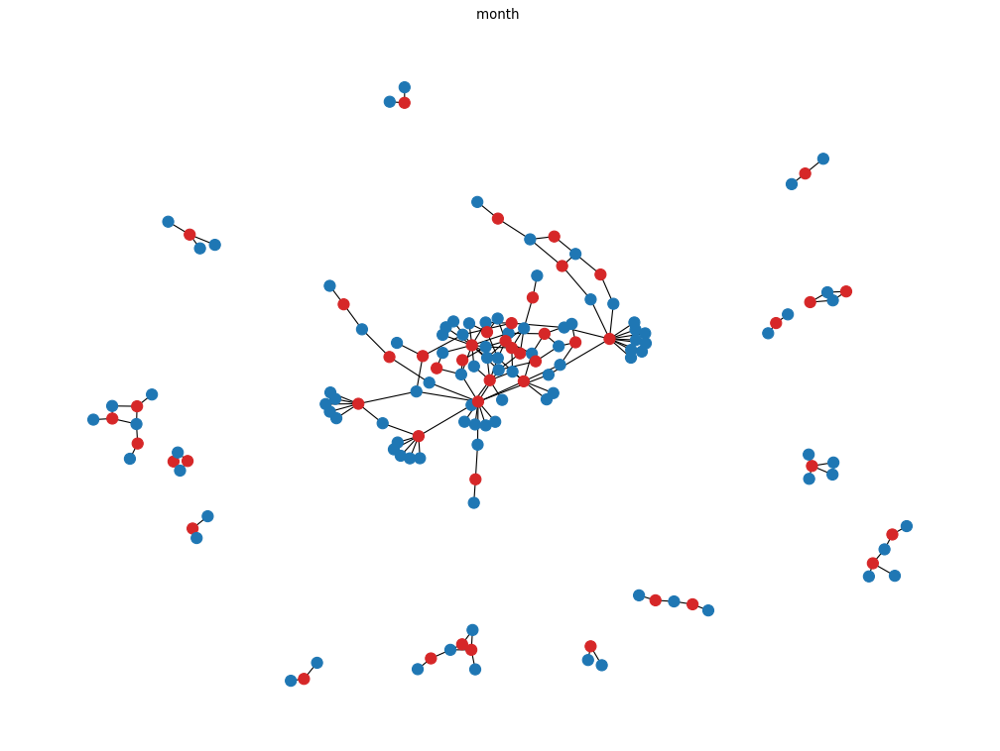

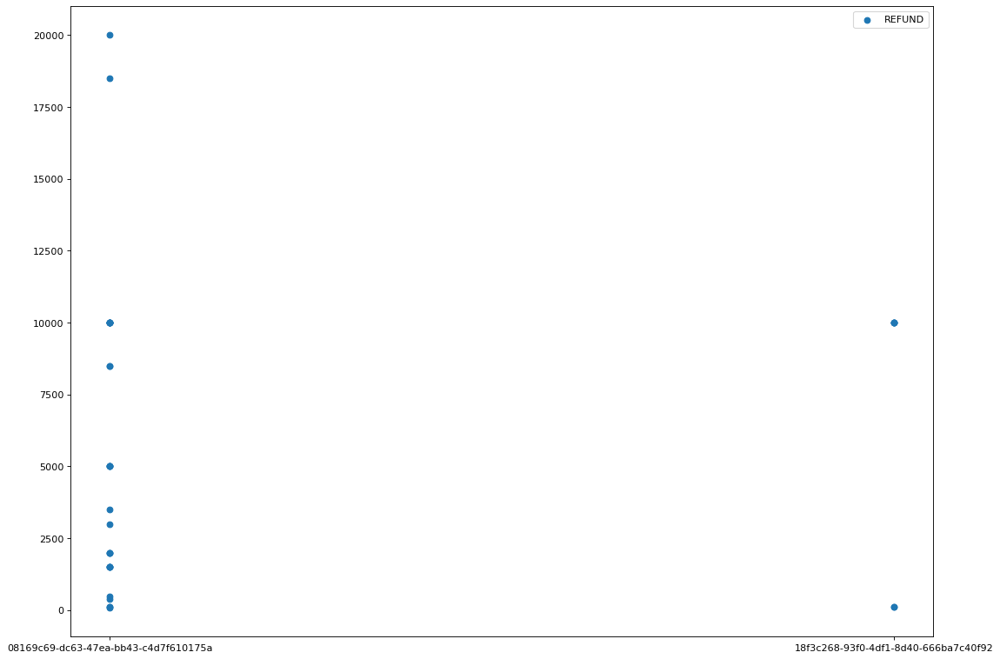

OTHER    34
Name: externalParty.transactionCategory, dtype: int64


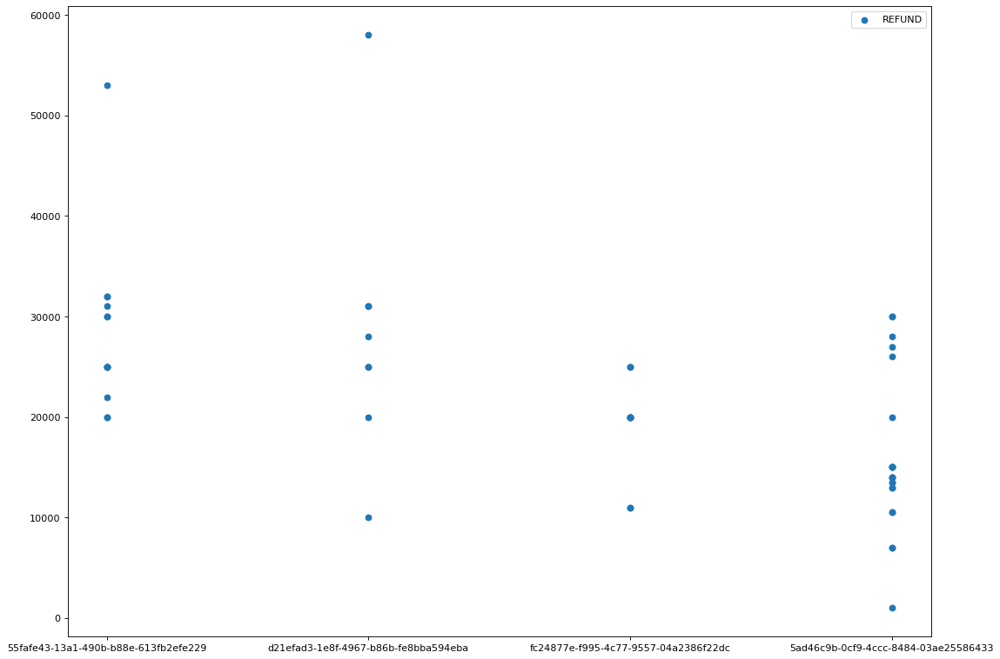

OTHER    53
Name: externalParty.transactionCategory, dtype: int64


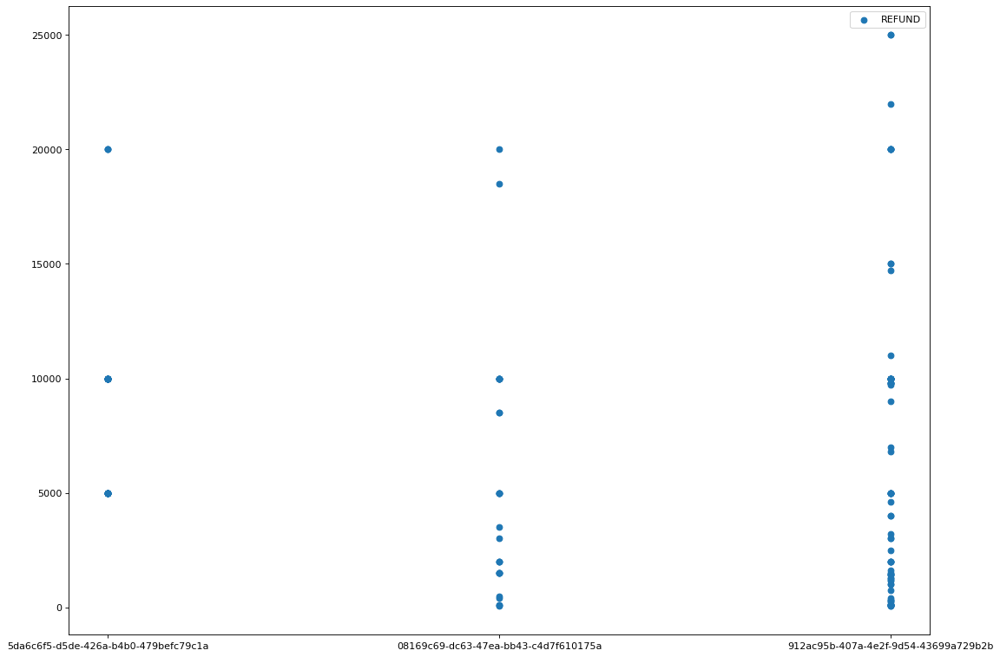

OTHER        132
LIFESTYLE      9
GROCERIES      4
TRAVEL         2
SHOPPING       1
Name: externalParty.transactionCategory, dtype: int64


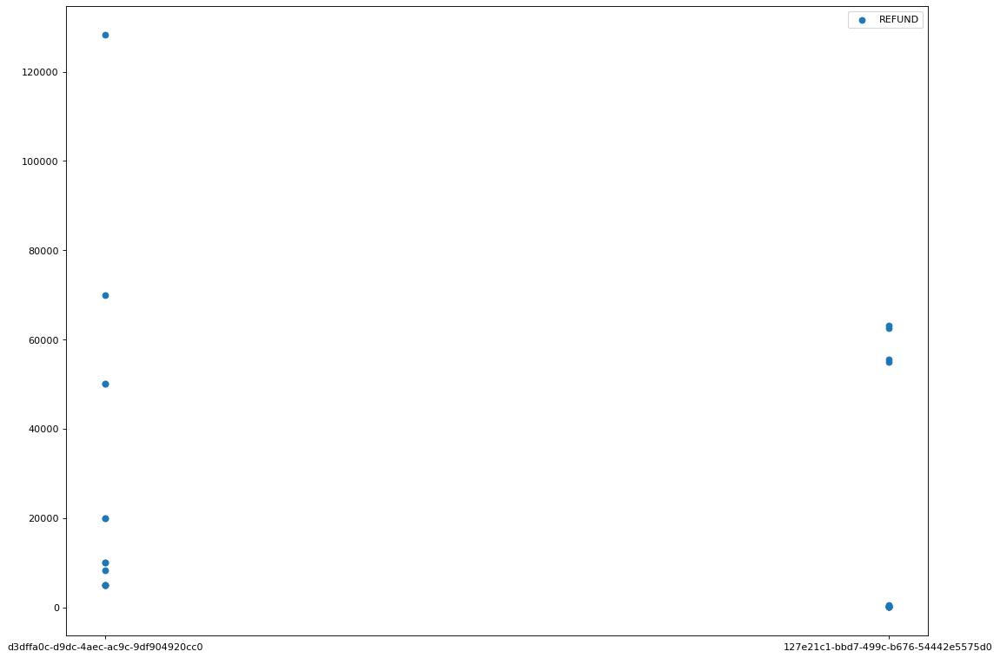

OTHER           23
SHOPPING         2
SUBSCRIPTION     1
Name: externalParty.transactionCategory, dtype: int64


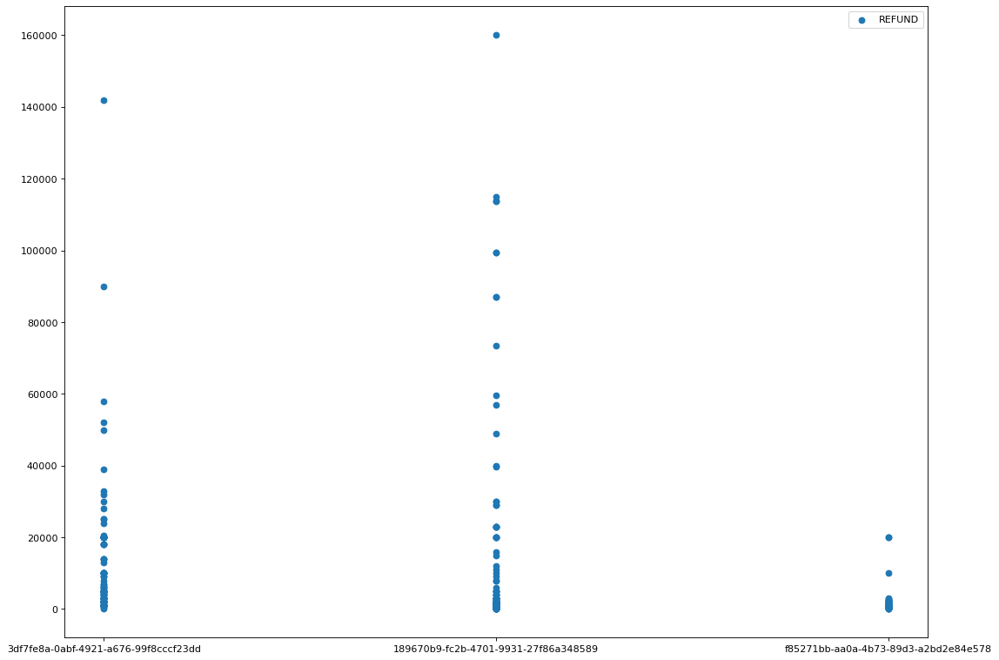

OTHER           215
GROCERIES        24
LIFESTYLE        13
TRAVEL            9
SHOPPING          9
SUBSCRIPTION      6
Name: externalParty.transactionCategory, dtype: int64


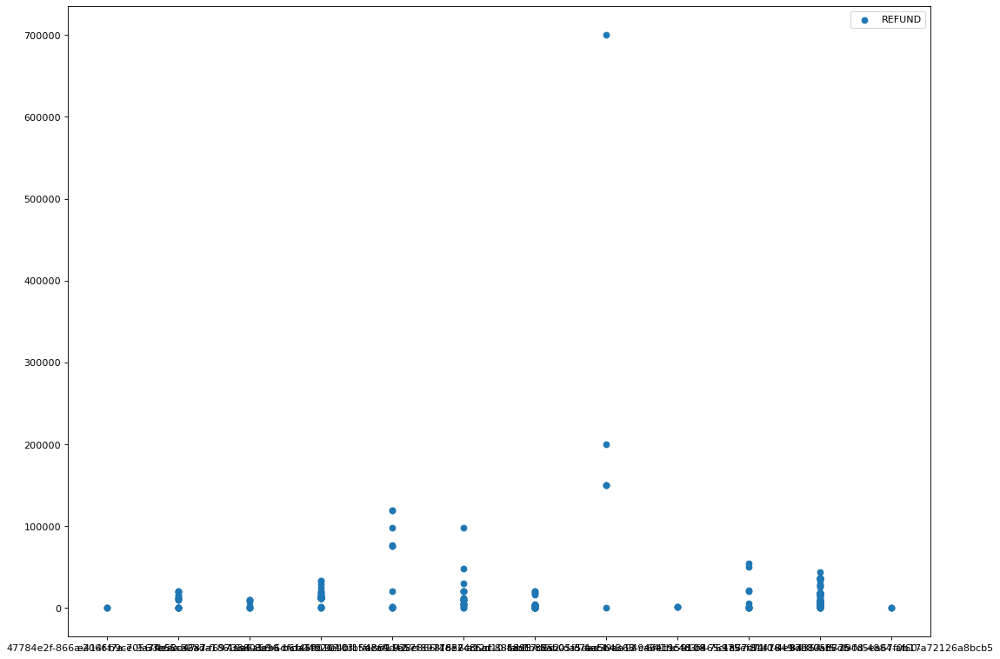

OTHER        243
GROCERIES      1
Name: externalParty.transactionCategory, dtype: int64


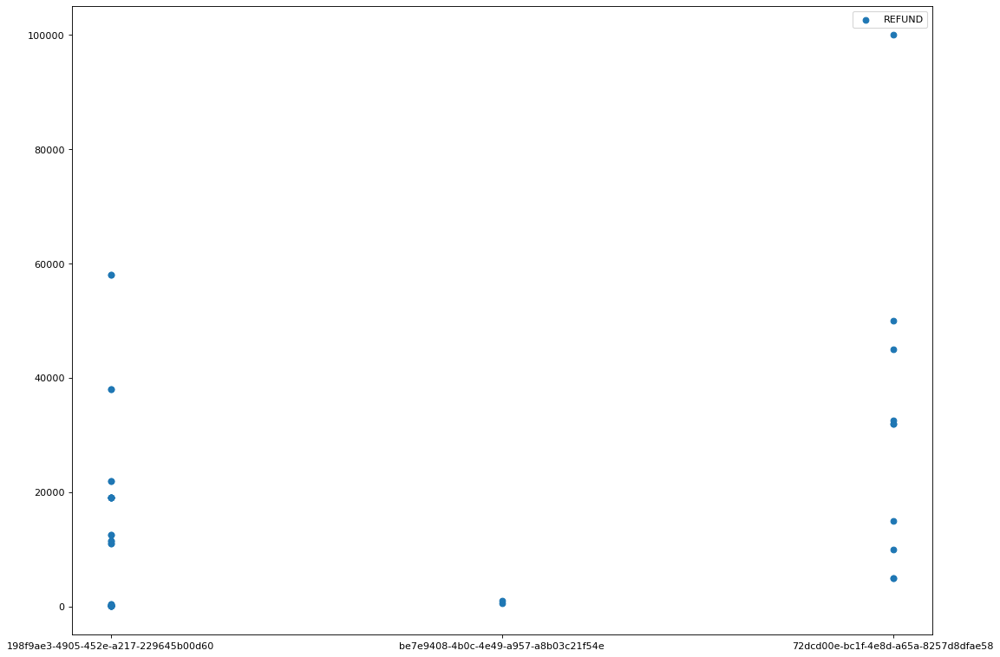

OTHER    41
Name: externalParty.transactionCategory, dtype: int64


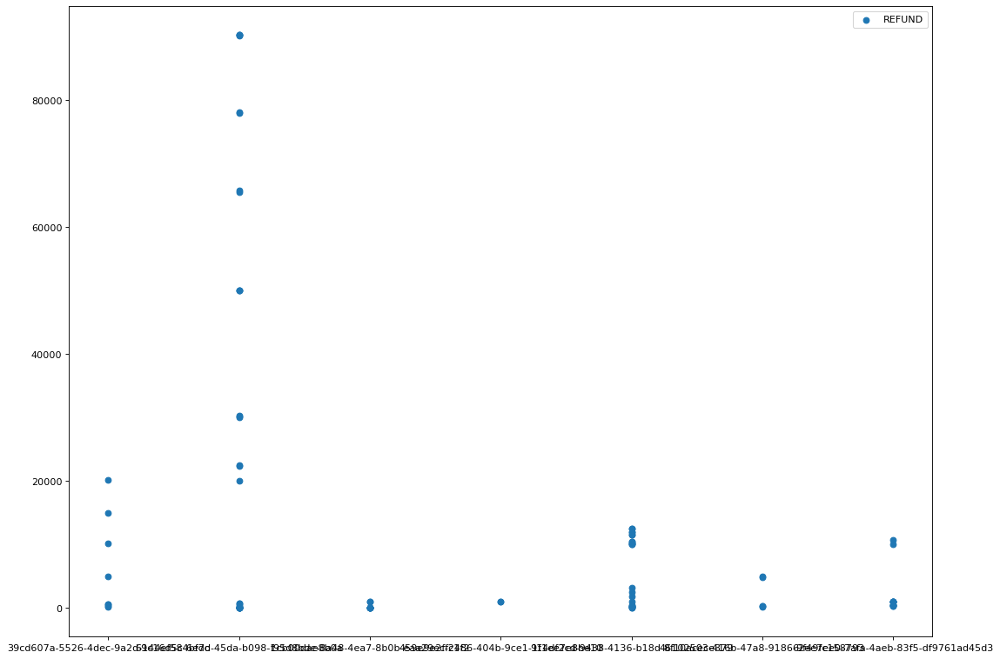

OTHER           88
TRAVEL           2
SUBSCRIPTION     1
Name: externalParty.transactionCategory, dtype: int64


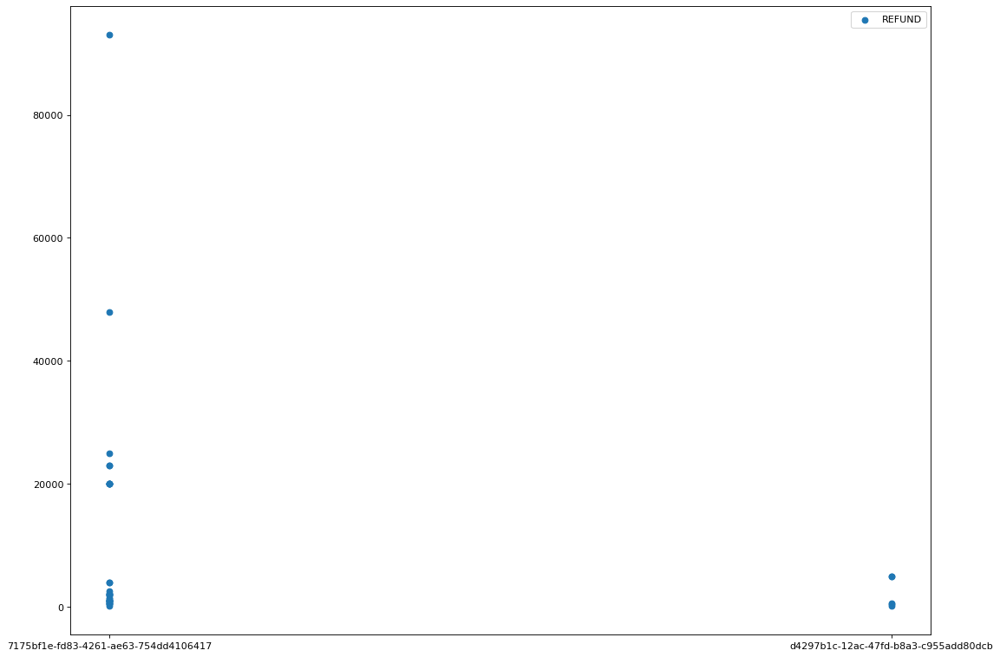

OTHER       35
SHOPPING     1
Name: externalParty.transactionCategory, dtype: int64


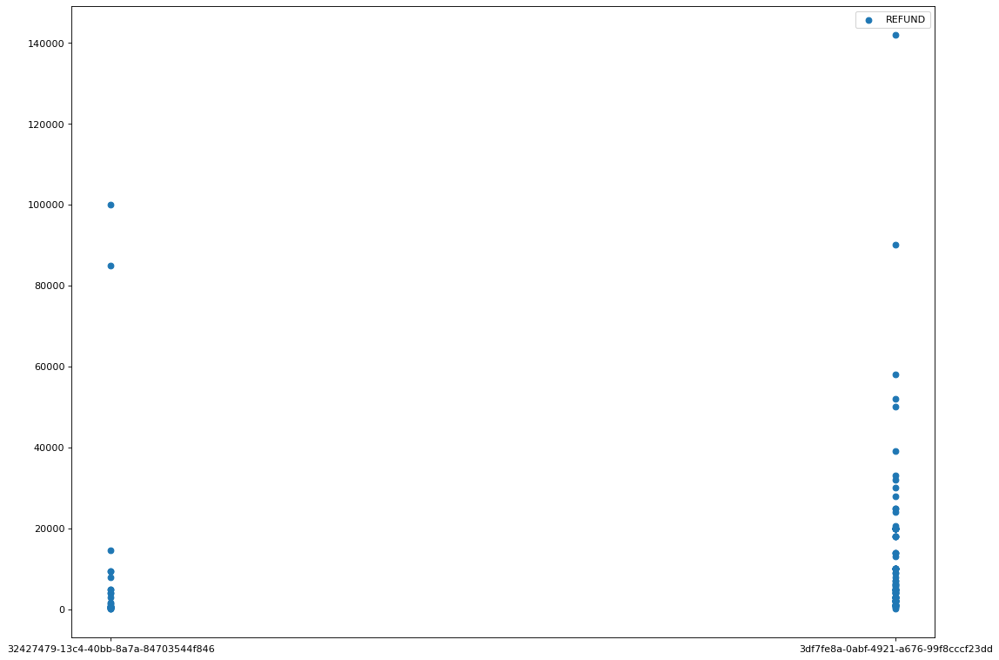

OTHER           104
LIFESTYLE         6
GROCERIES         5
SUBSCRIPTION      5
TRAVEL            4
SHOPPING          2
Name: externalParty.transactionCategory, dtype: int64


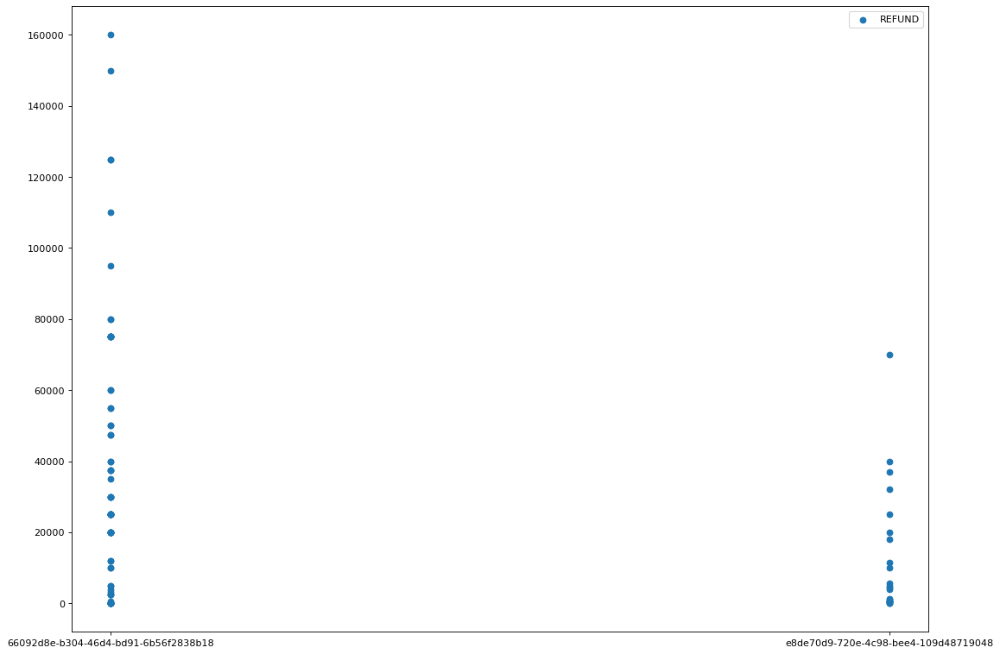

OTHER        80
LIFESTYLE     8
TRAVEL        5
Name: externalParty.transactionCategory, dtype: int64


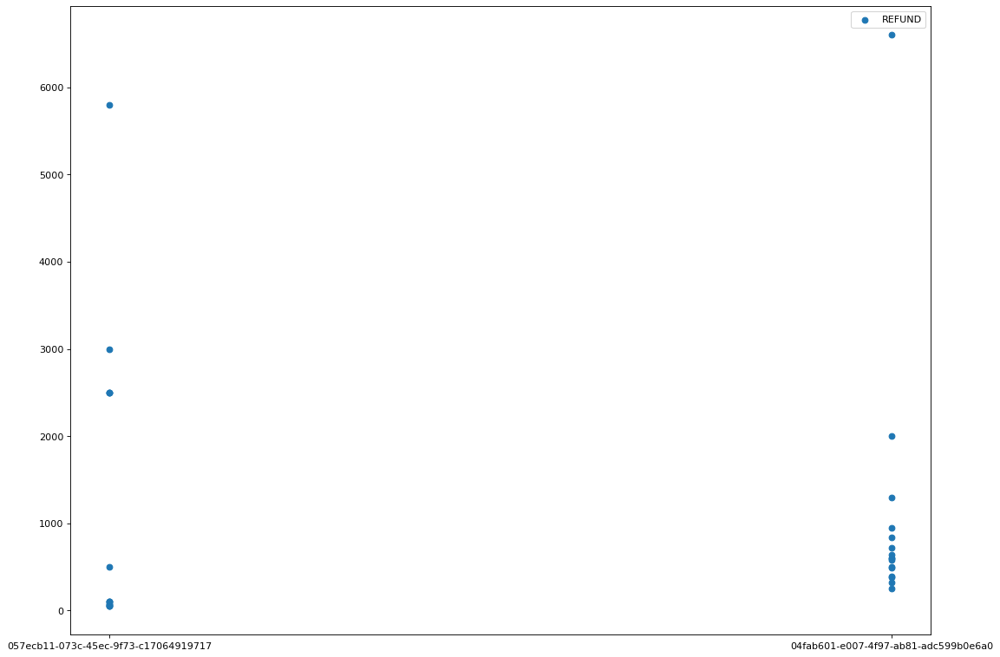

OTHER       16
SHOPPING    14
Name: externalParty.transactionCategory, dtype: int64


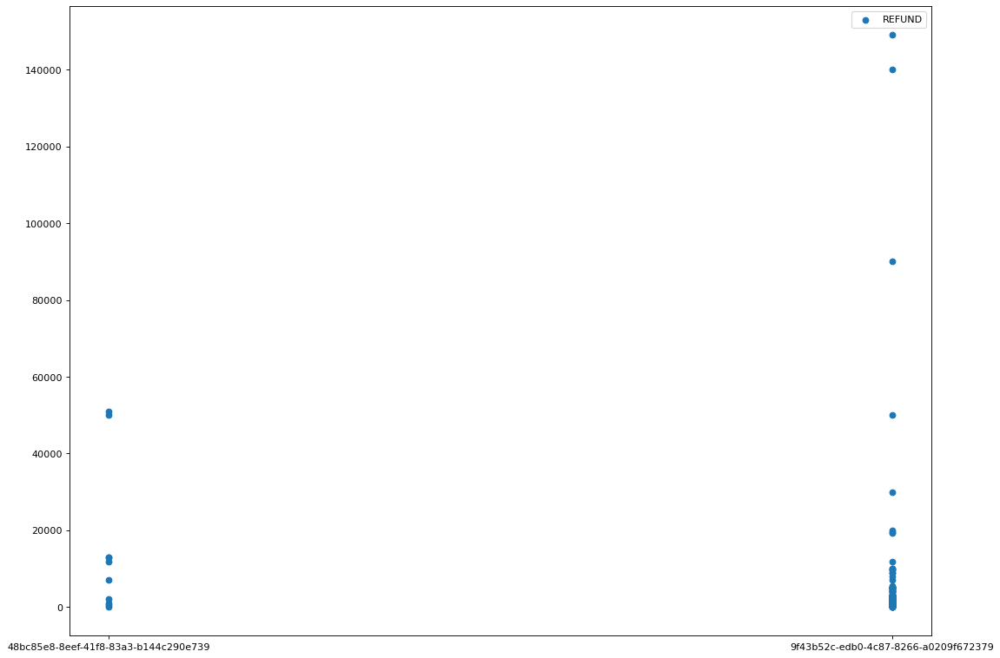

OTHER           92
GROCERIES       19
SHOPPING        17
LIFESTYLE       11
TRAVEL           8
SUBSCRIPTION     1
Name: externalParty.transactionCategory, dtype: int64


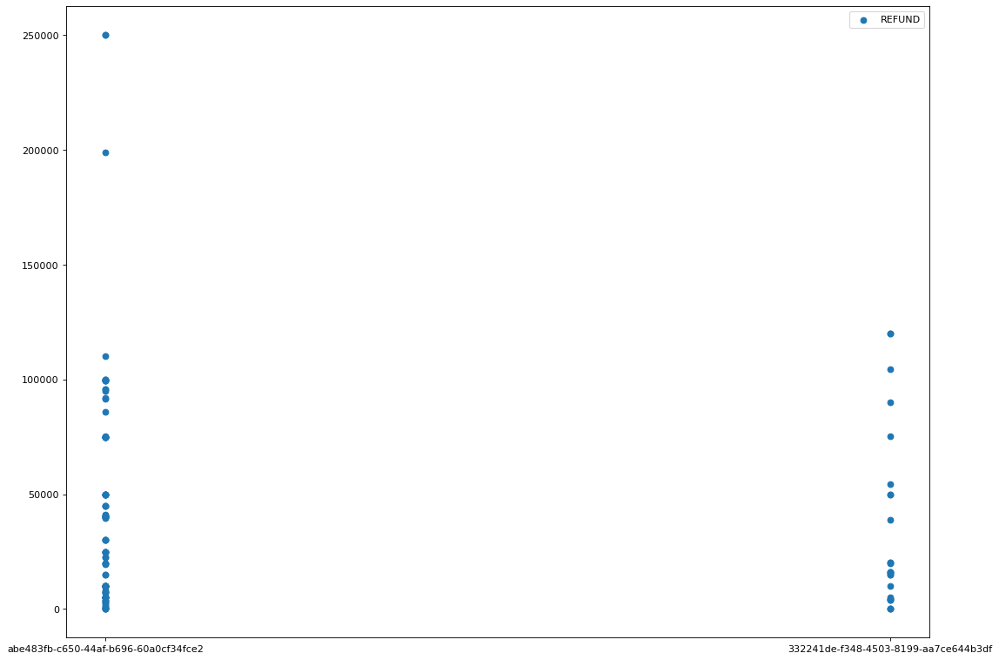

OTHER     130
TRAVEL      1
Name: externalParty.transactionCategory, dtype: int64


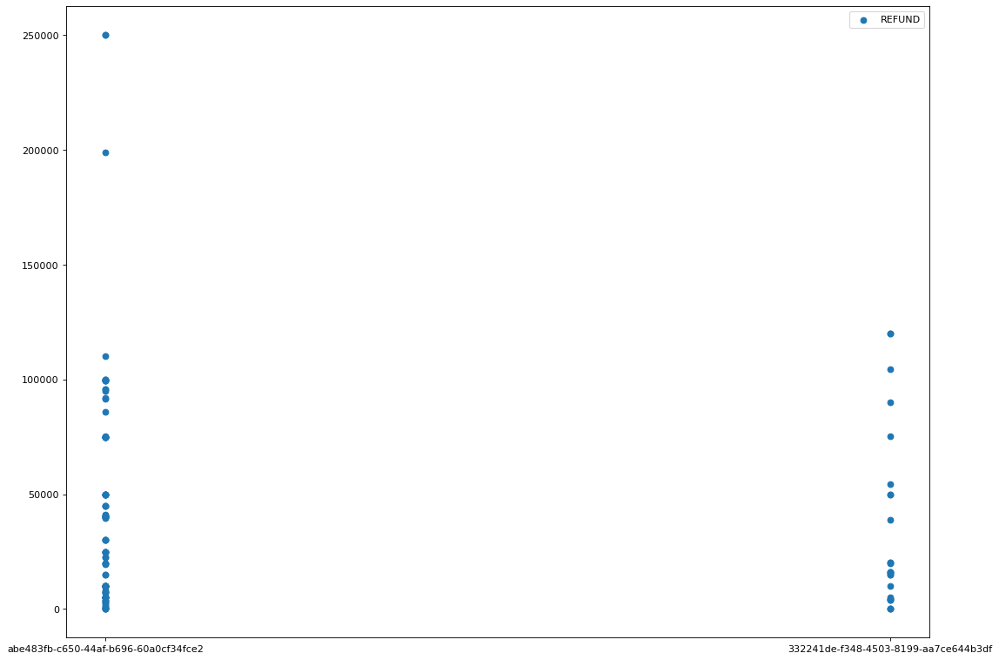

OTHER     130
TRAVEL      1
Name: externalParty.transactionCategory, dtype: int64


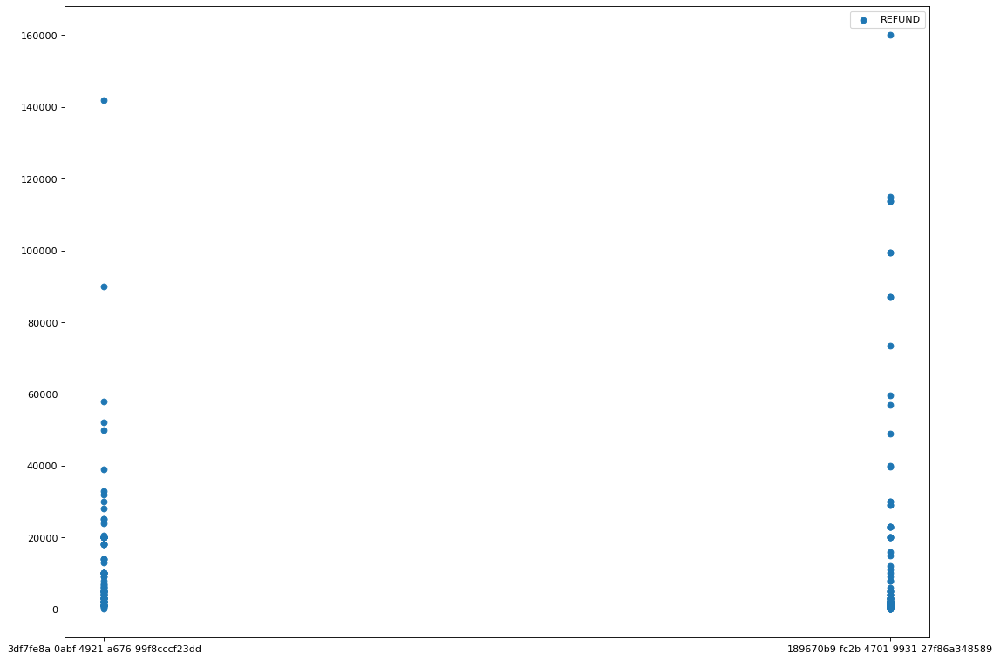

OTHER           195
GROCERIES        14
LIFESTYLE         9
TRAVEL            8
SUBSCRIPTION      5
SHOPPING          3
Name: externalParty.transactionCategory, dtype: int64


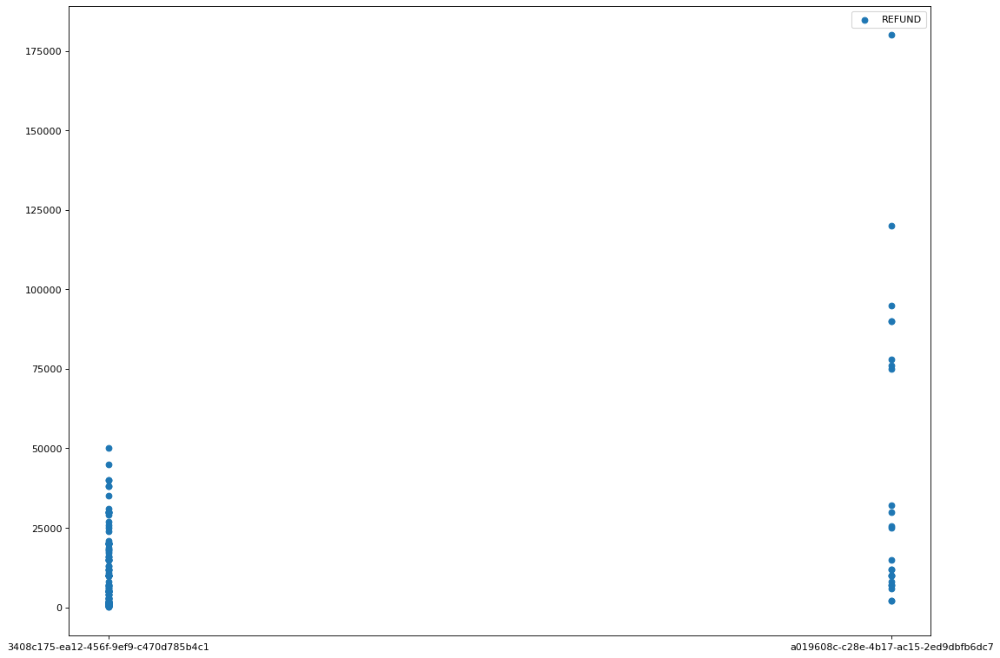

OTHER        104
SHOPPING      18
TRAVEL        14
LIFESTYLE     11
Name: externalParty.transactionCategory, dtype: int64


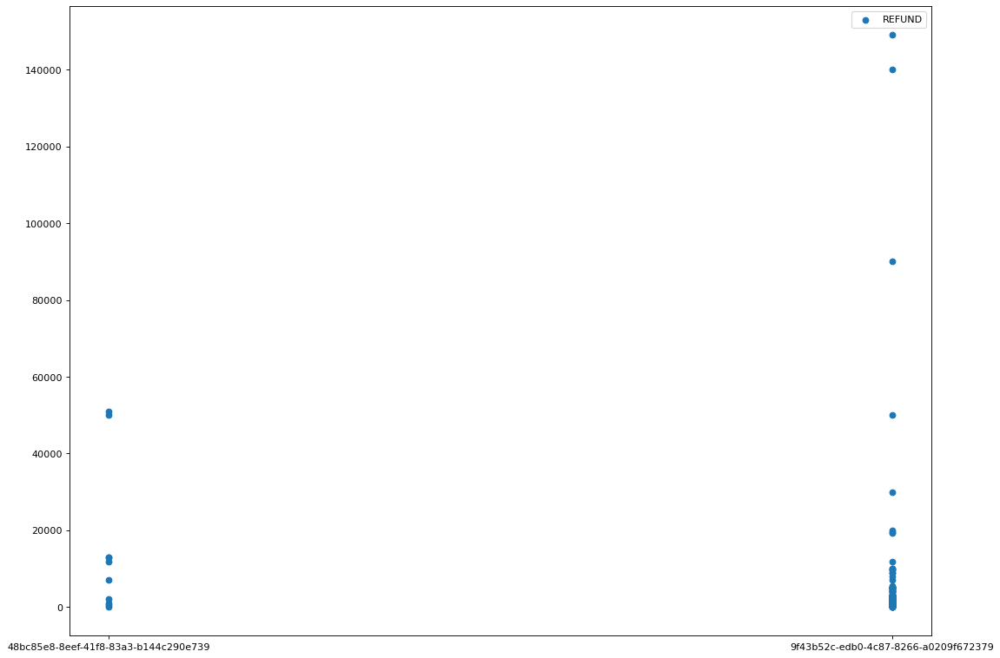

OTHER           92
GROCERIES       19
SHOPPING        17
LIFESTYLE       11
TRAVEL           8
SUBSCRIPTION     1
Name: externalParty.transactionCategory, dtype: int64


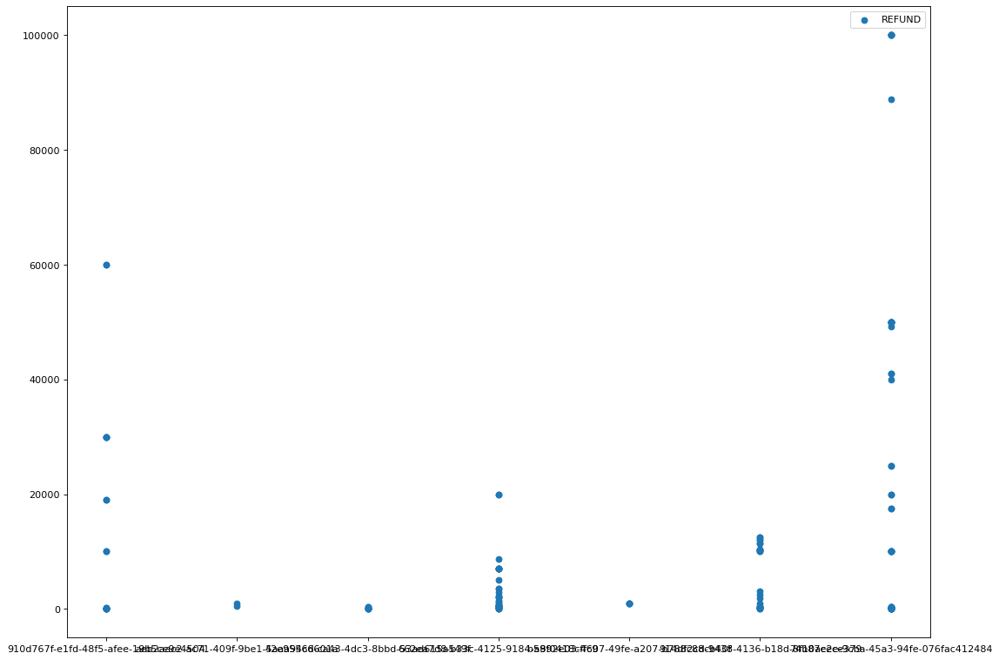

OTHER           123
TRAVEL            4
GROCERIES         3
LIFESTYLE         2
SHOPPING          1
SUBSCRIPTION      1
Name: externalParty.transactionCategory, dtype: int64


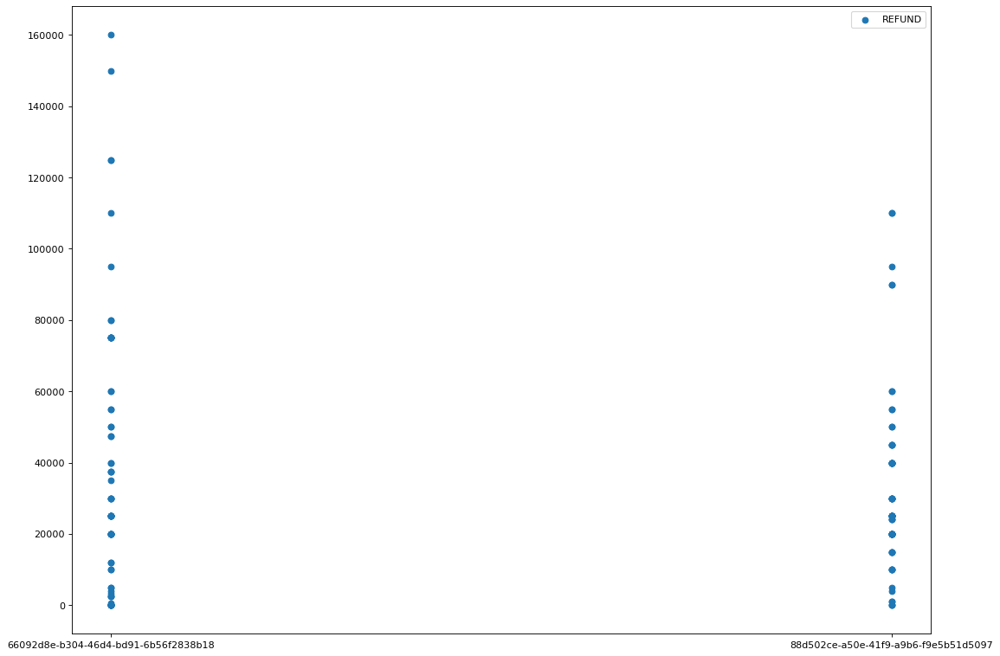

OTHER        142
LIFESTYLE      1
TRAVEL         1
Name: externalParty.transactionCategory, dtype: int64


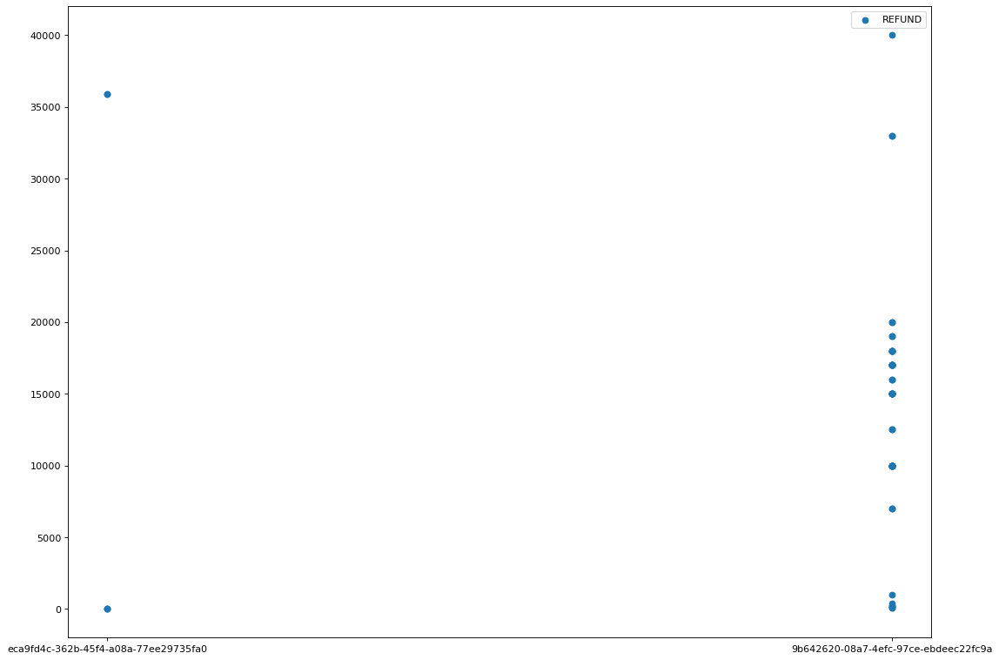

OTHER    65
Name: externalParty.transactionCategory, dtype: int64


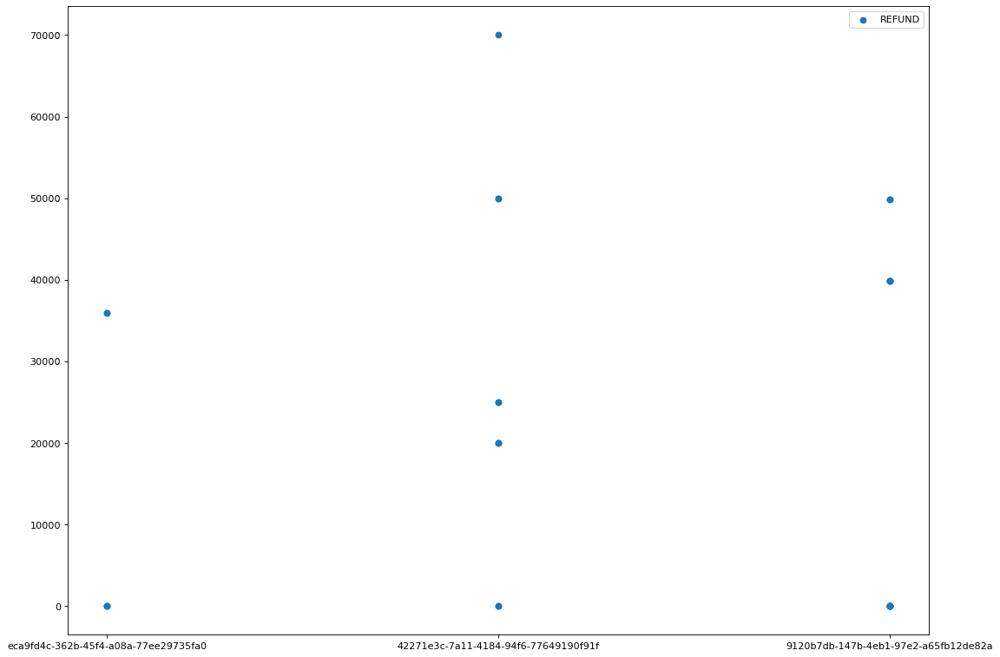

OTHER    28
Name: externalParty.transactionCategory, dtype: int64


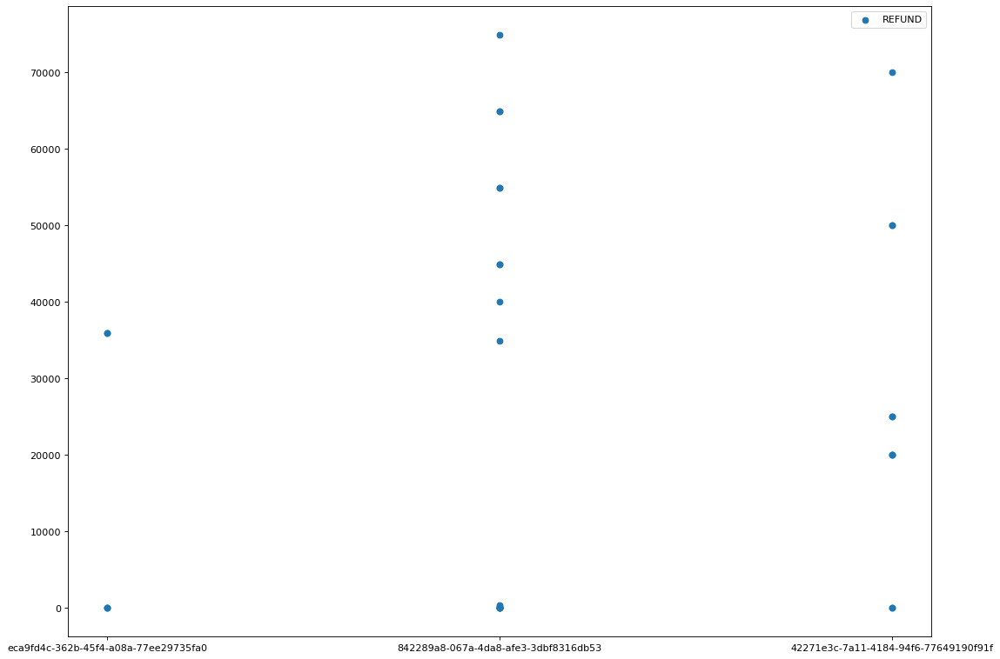

OTHER    33
Name: externalParty.transactionCategory, dtype: int64


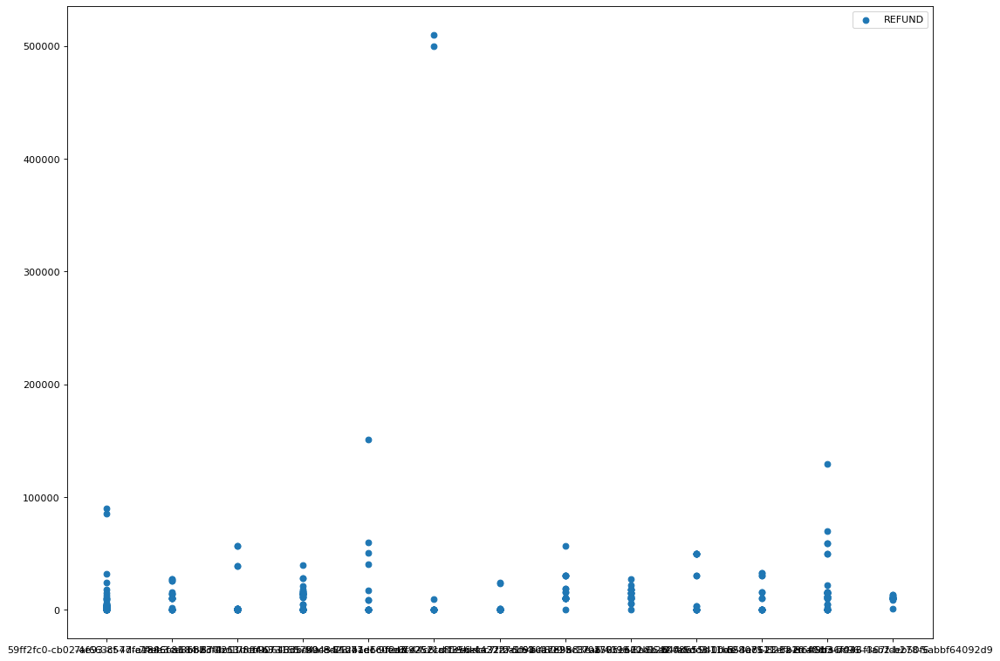

OTHER        319
GROCERIES     25
TRAVEL        15
SHOPPING      10
LIFESTYLE      1
Name: externalParty.transactionCategory, dtype: int64


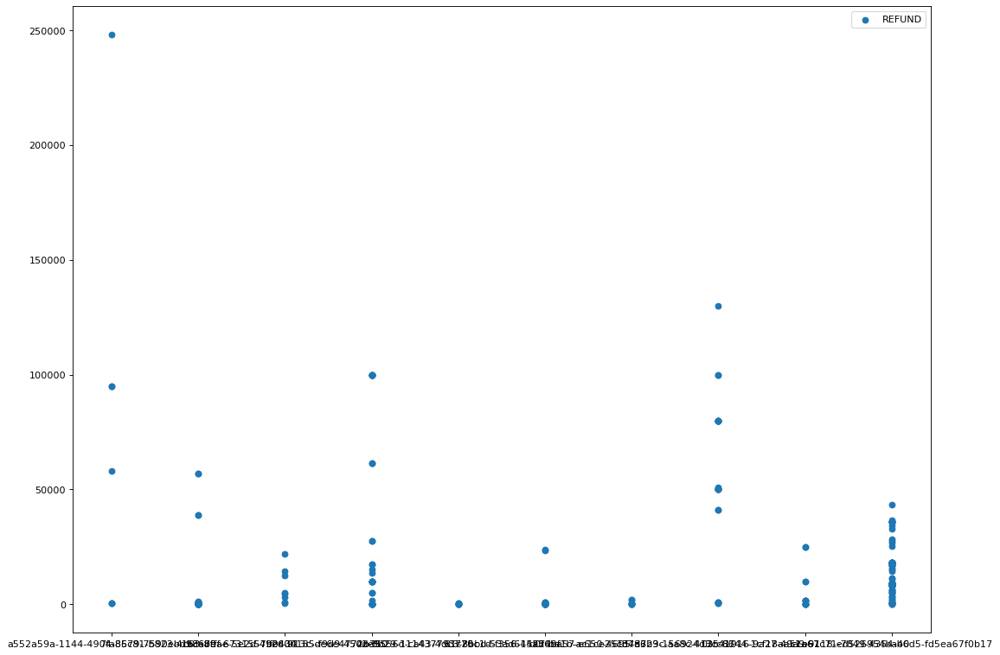

OTHER       245
SHOPPING      2
TRAVEL        2
Name: externalParty.transactionCategory, dtype: int64


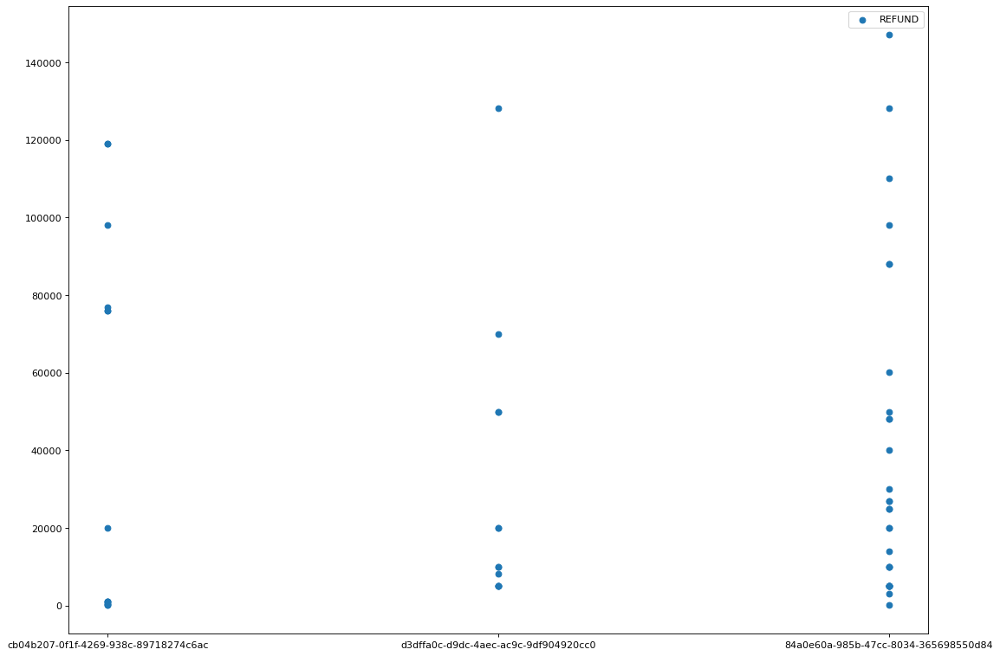

OTHER    57
Name: externalParty.transactionCategory, dtype: int64


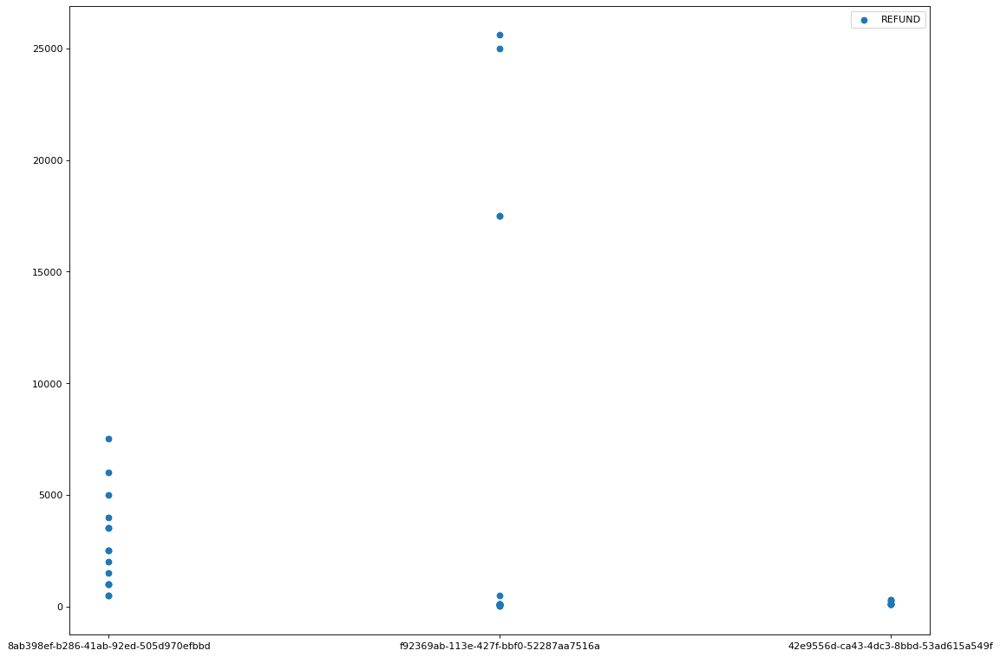

OTHER    38
Name: externalParty.transactionCategory, dtype: int64


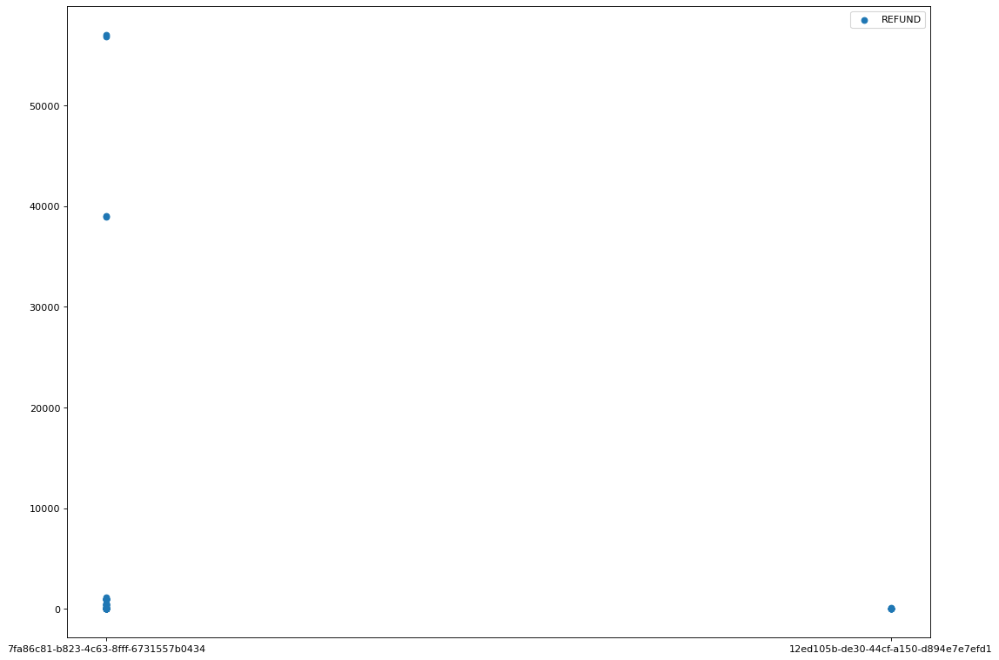

OTHER       47
SHOPPING     2
TRAVEL       2
Name: externalParty.transactionCategory, dtype: int64


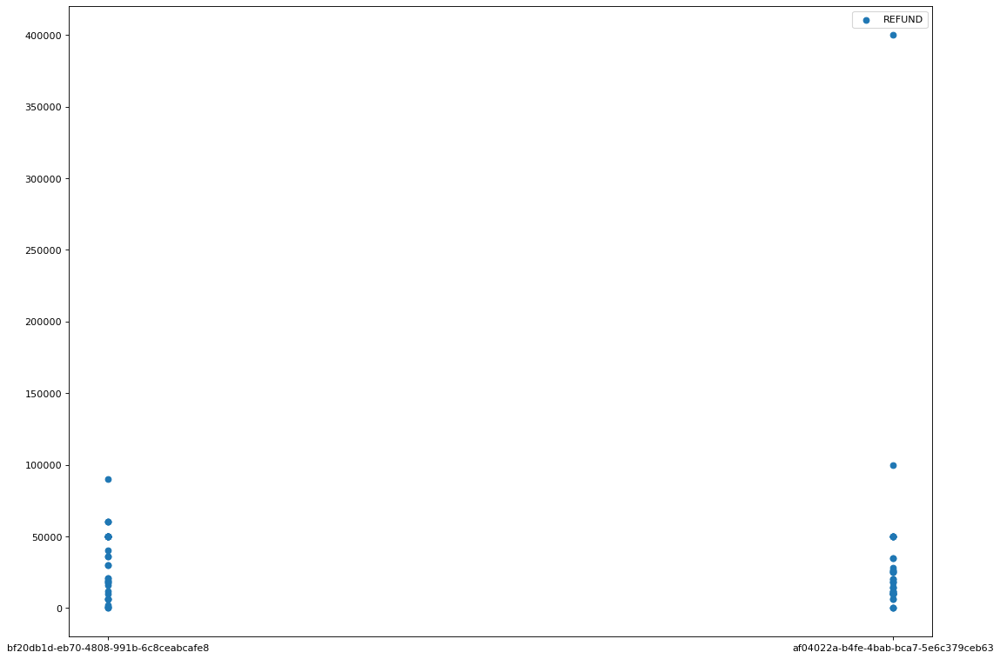

OTHER    75
Name: externalParty.transactionCategory, dtype: int64


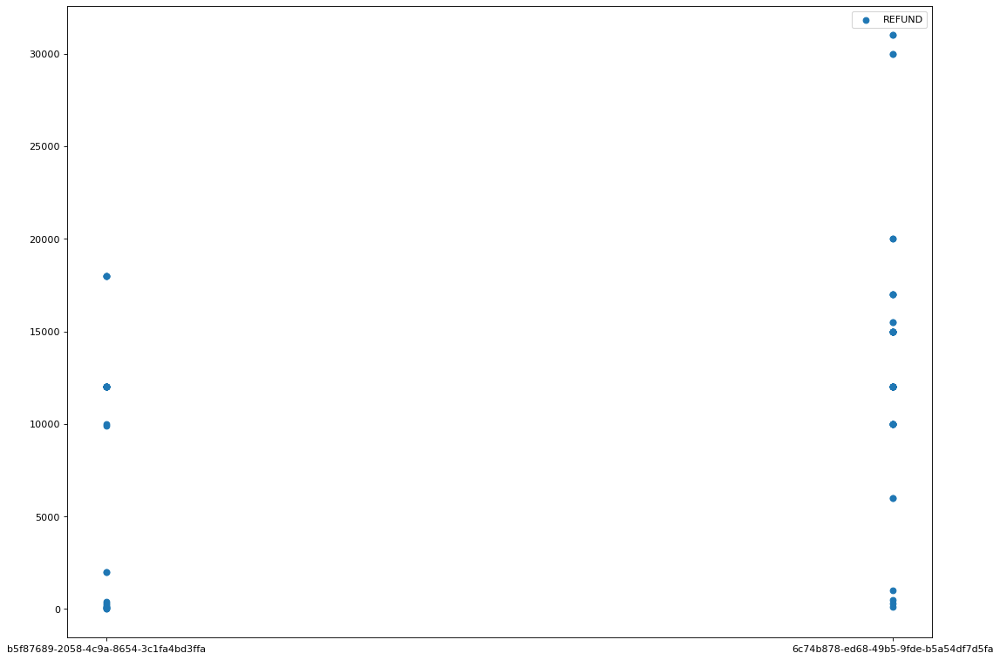

OTHER    81
Name: externalParty.transactionCategory, dtype: int64


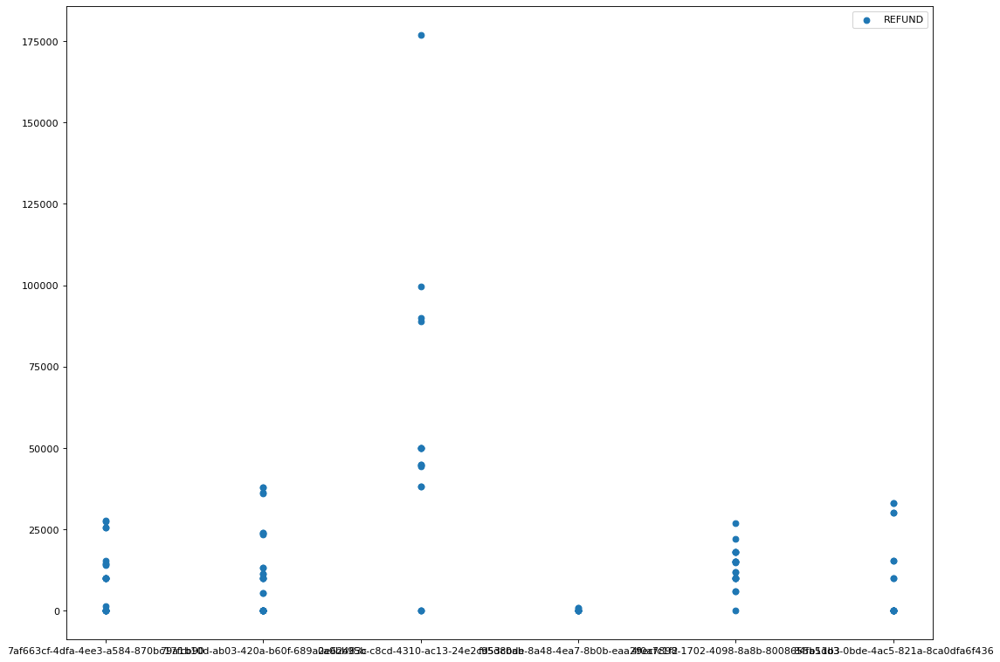

OTHER    117
Name: externalParty.transactionCategory, dtype: int64


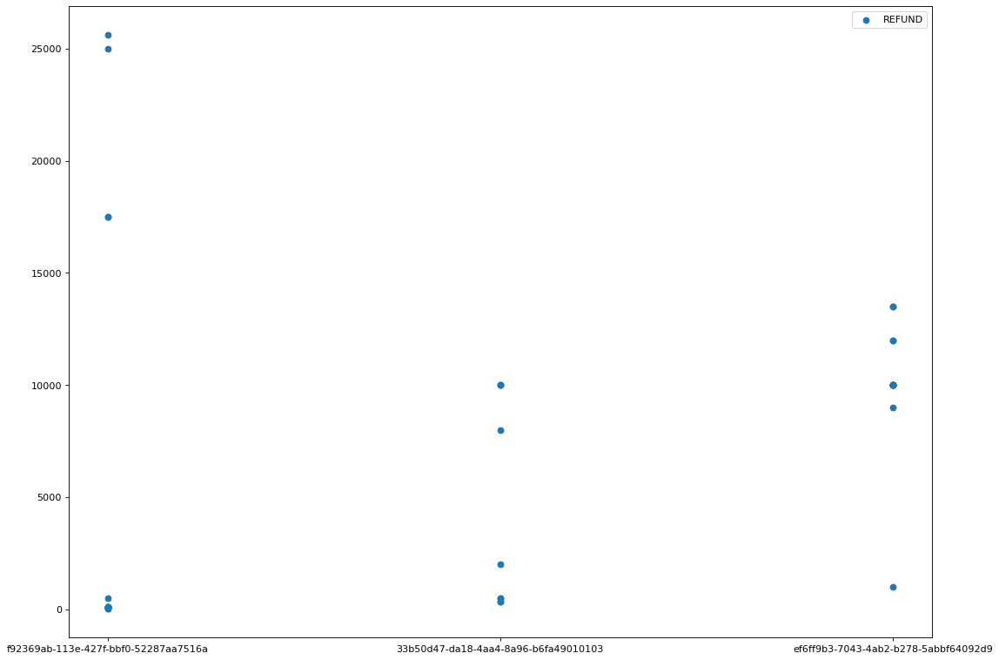

OTHER    42
Name: externalParty.transactionCategory, dtype: int64


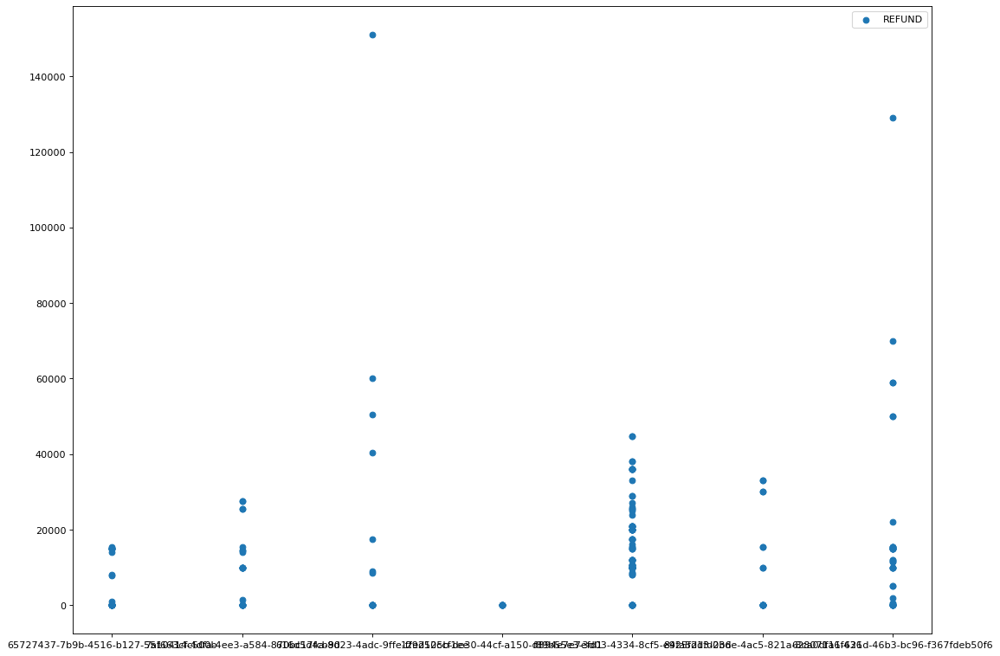

OTHER    211
Name: externalParty.transactionCategory, dtype: int64


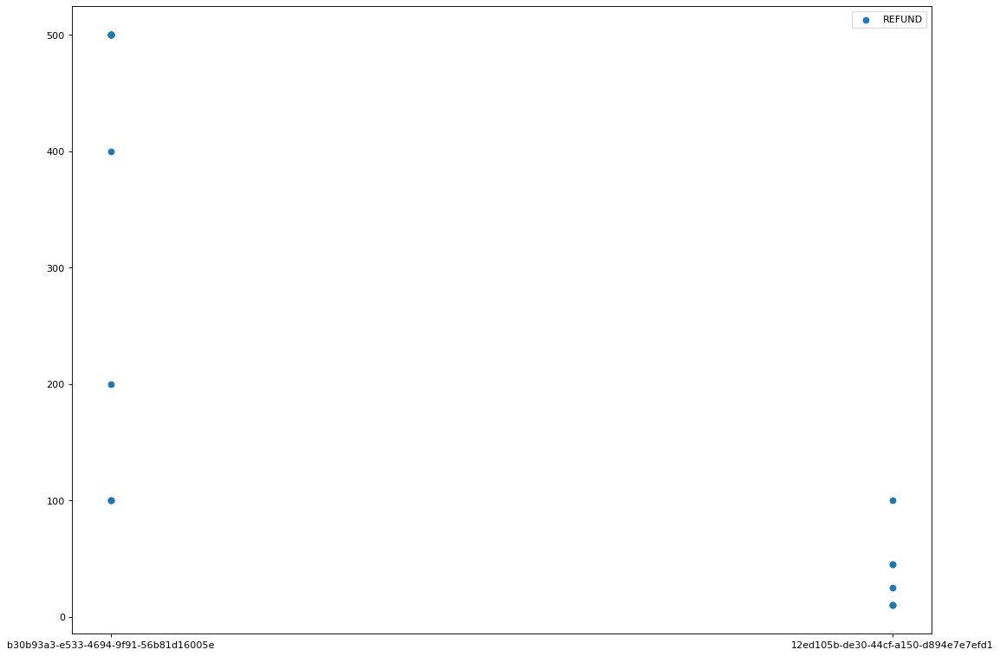

OTHER    19
Name: externalParty.transactionCategory, dtype: int64


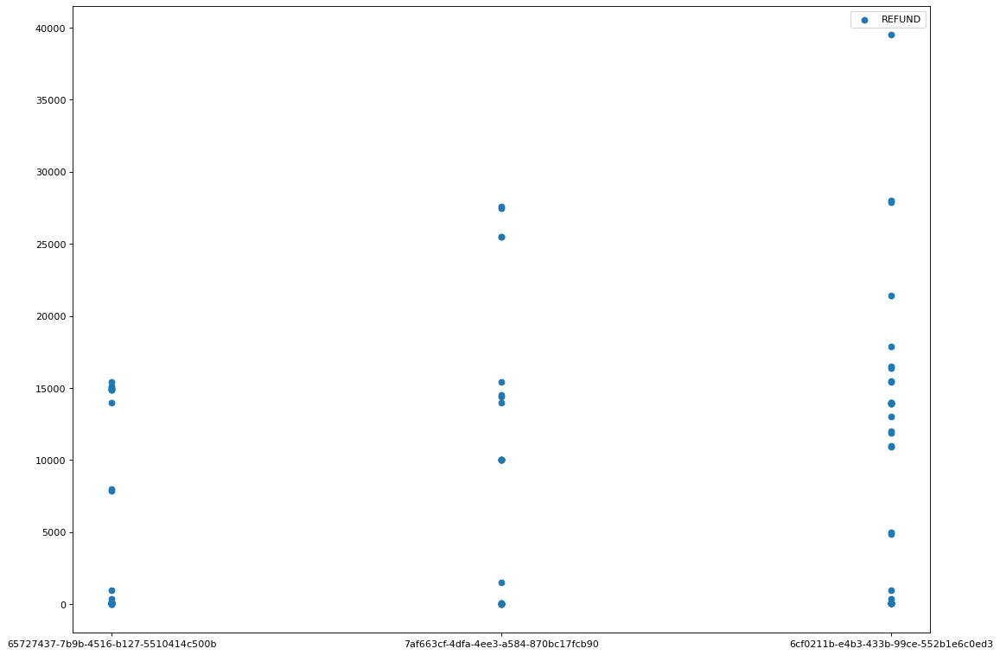

OTHER    94
Name: externalParty.transactionCategory, dtype: int64


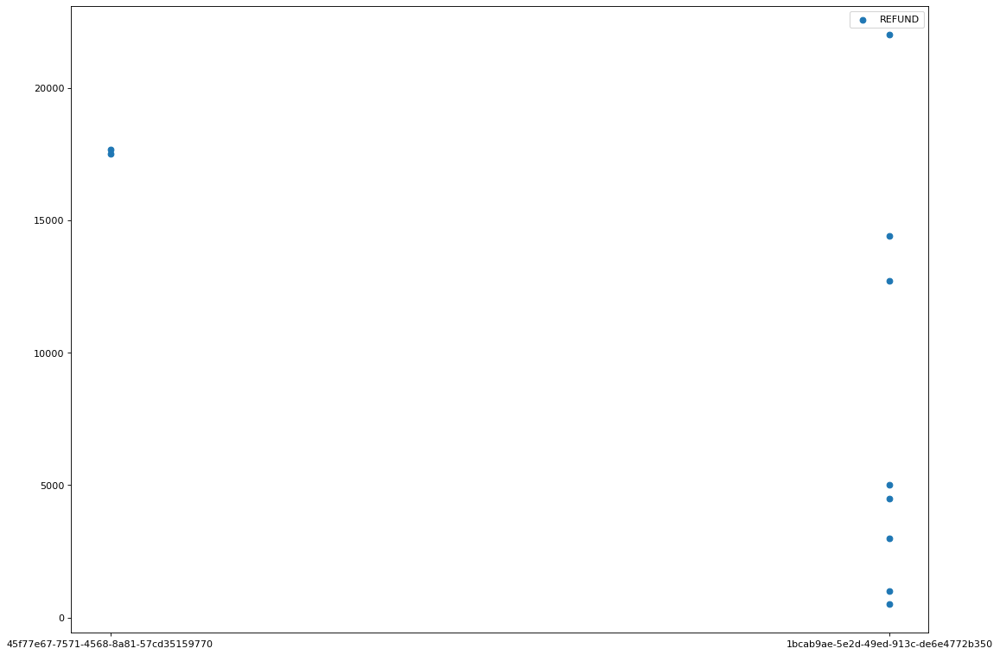

OTHER    10
Name: externalParty.transactionCategory, dtype: int64


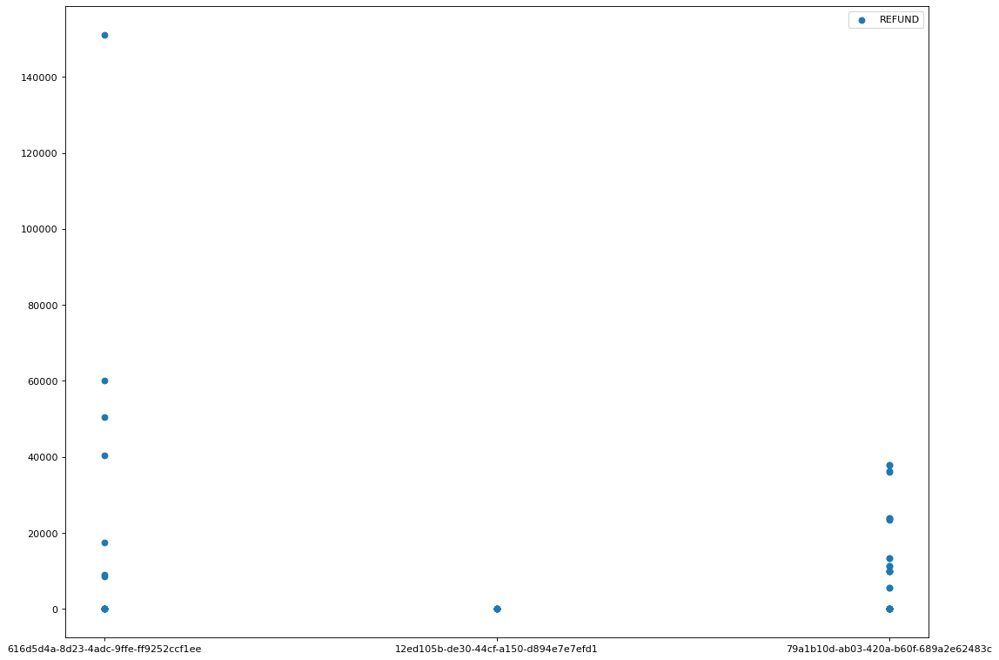

OTHER    52
Name: externalParty.transactionCategory, dtype: int64


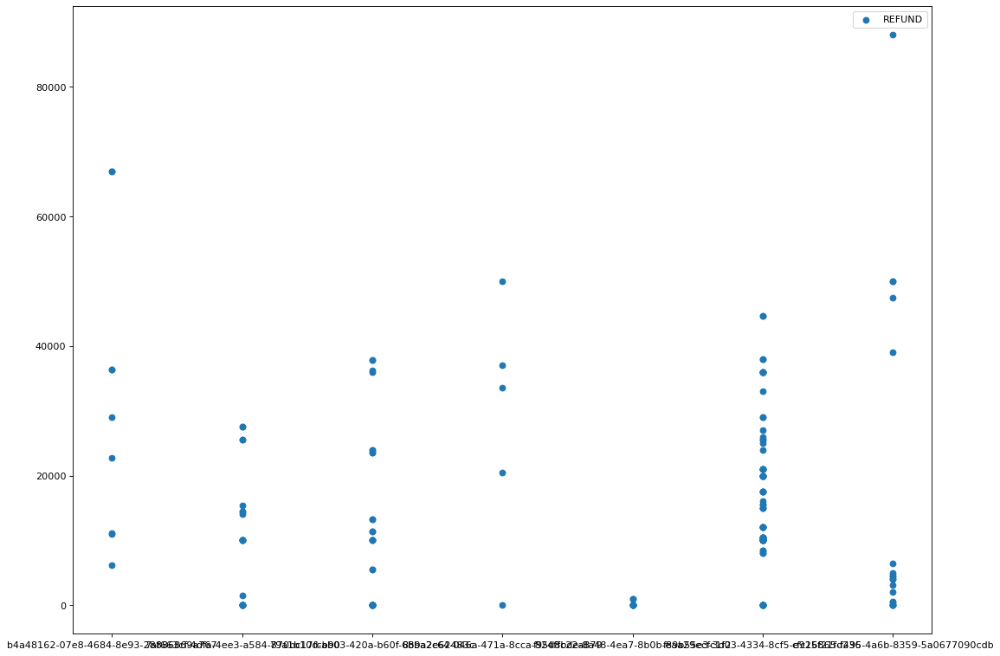

OTHER    180
Name: externalParty.transactionCategory, dtype: int64


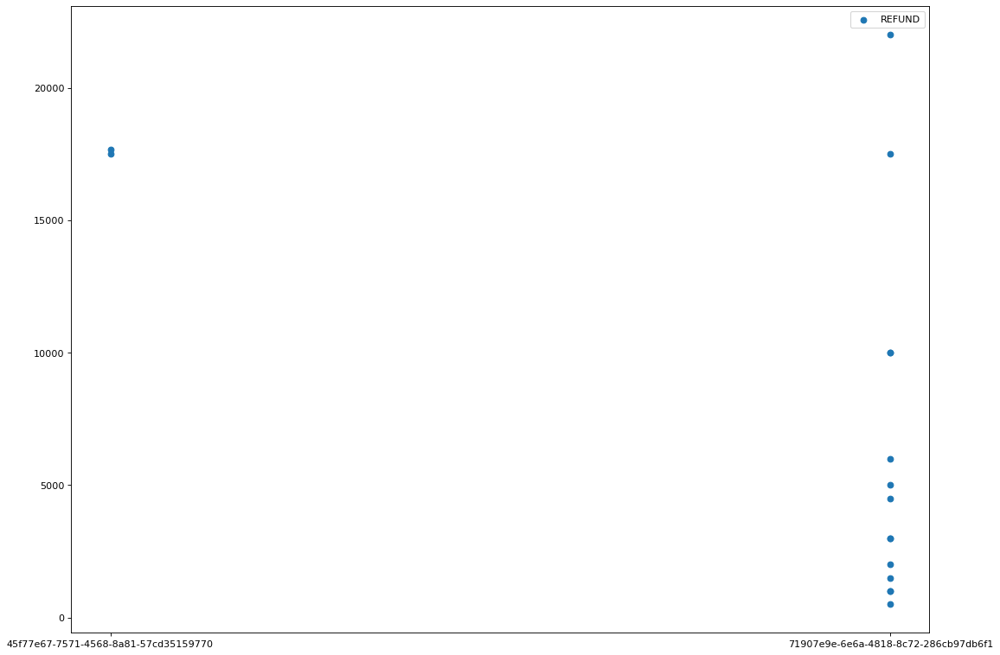

OTHER    16
Name: externalParty.transactionCategory, dtype: int64


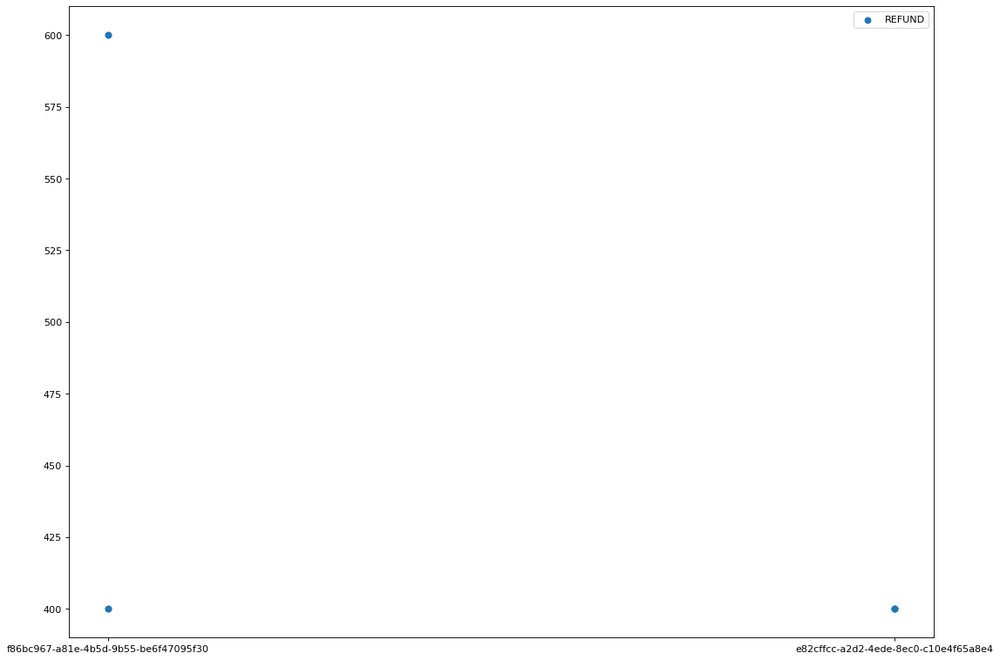

OTHER    8
Name: externalParty.transactionCategory, dtype: int64


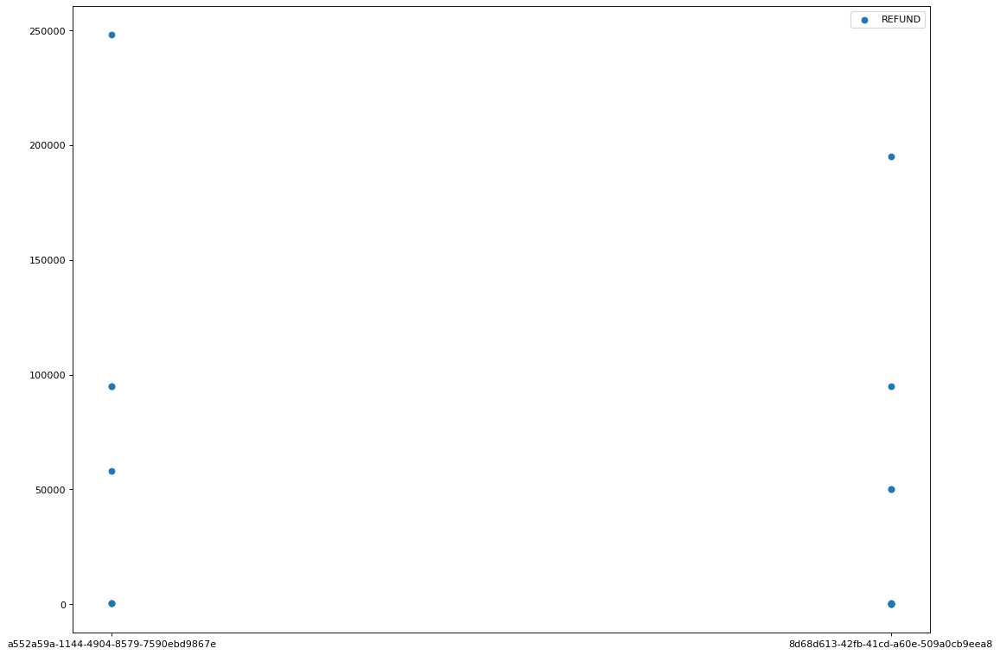

OTHER    16
Name: externalParty.transactionCategory, dtype: int64


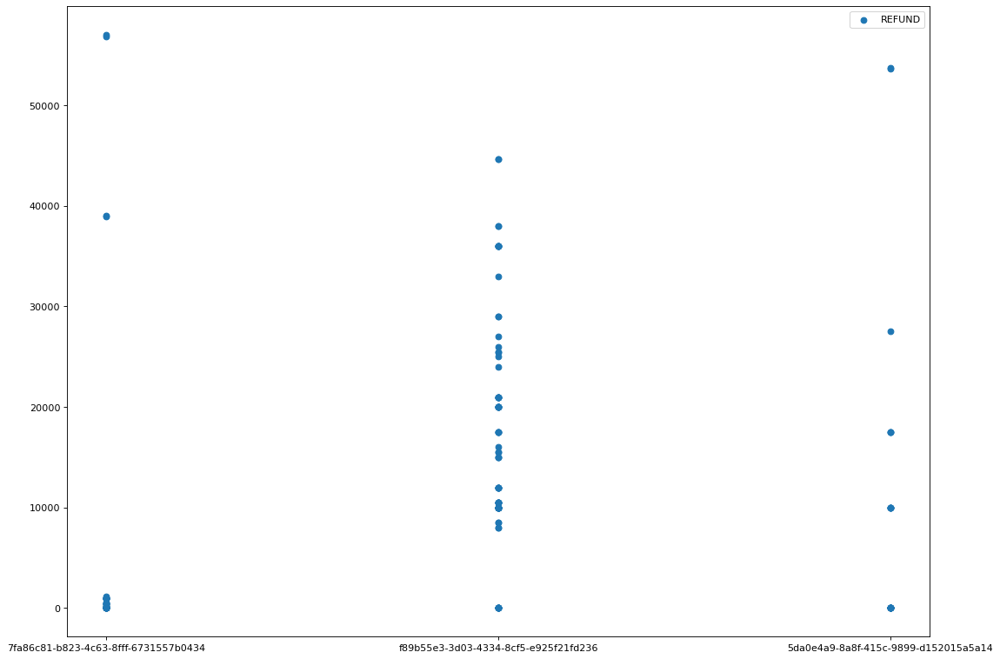

OTHER       147
SHOPPING      2
TRAVEL        2
Name: externalParty.transactionCategory, dtype: int64


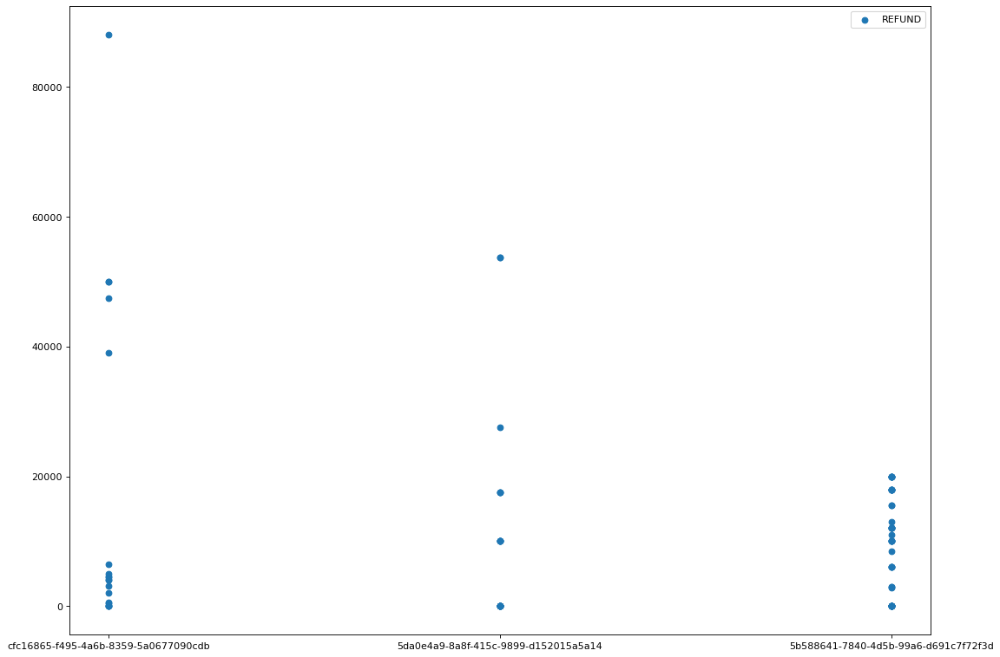

OTHER    87
Name: externalParty.transactionCategory, dtype: int64


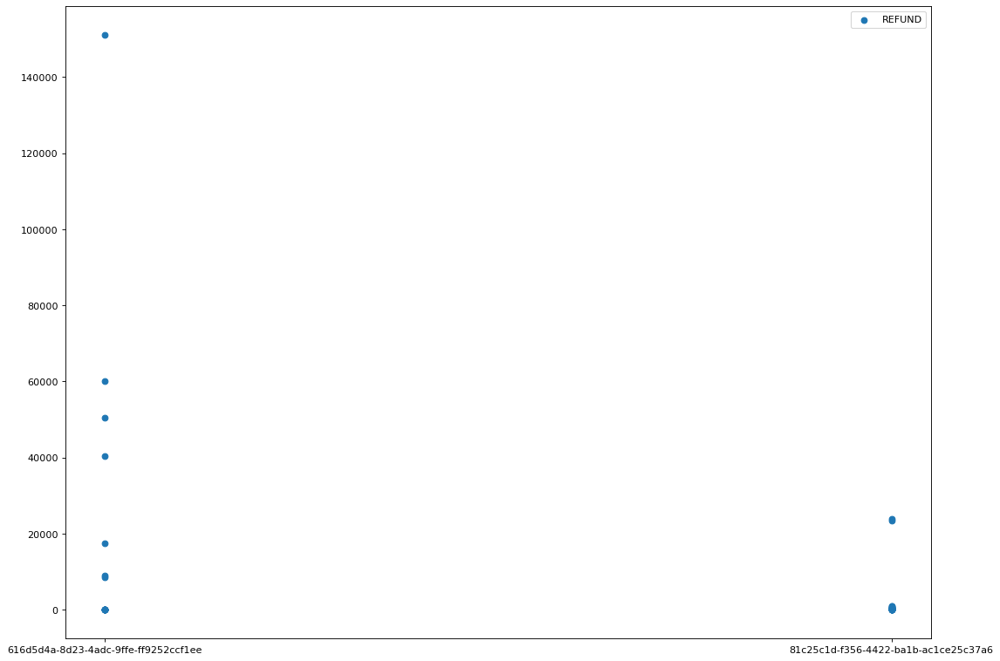

OTHER    36
Name: externalParty.transactionCategory, dtype: int64


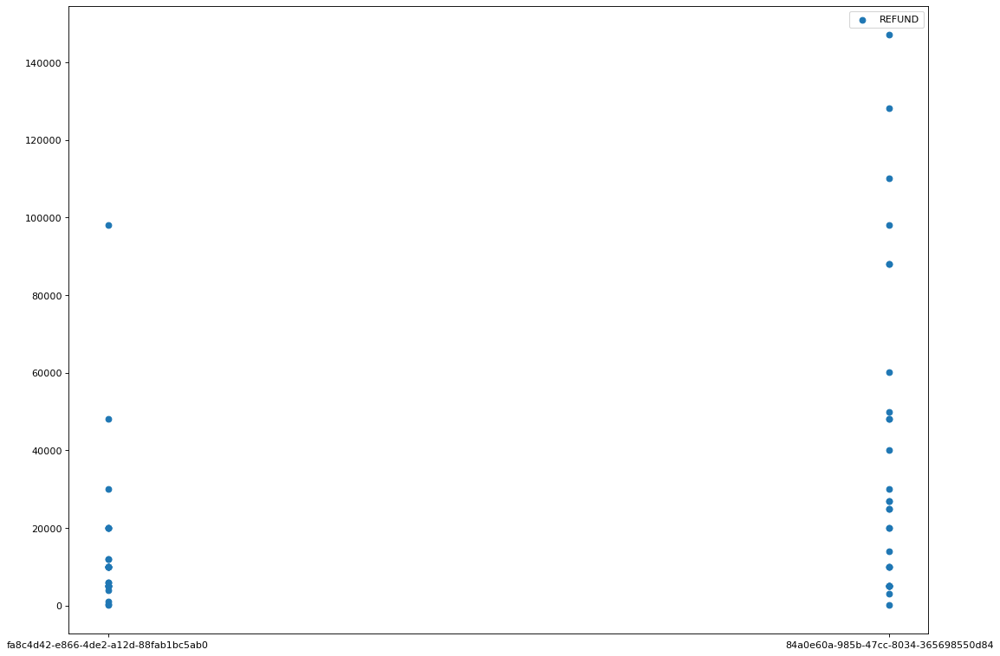

OTHER    56
Name: externalParty.transactionCategory, dtype: int64


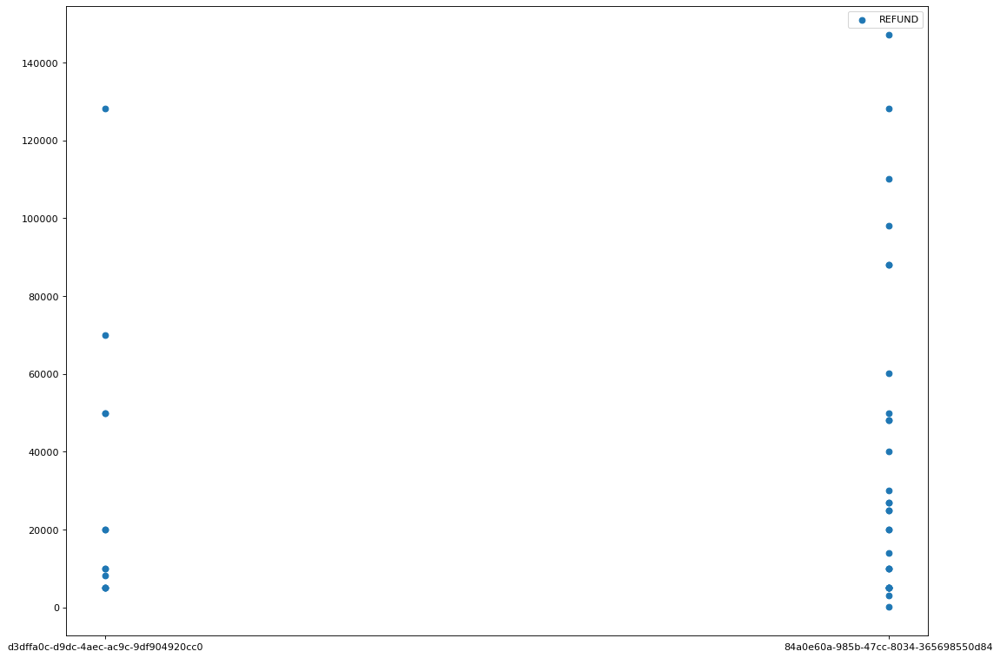

OTHER    43
Name: externalParty.transactionCategory, dtype: int64


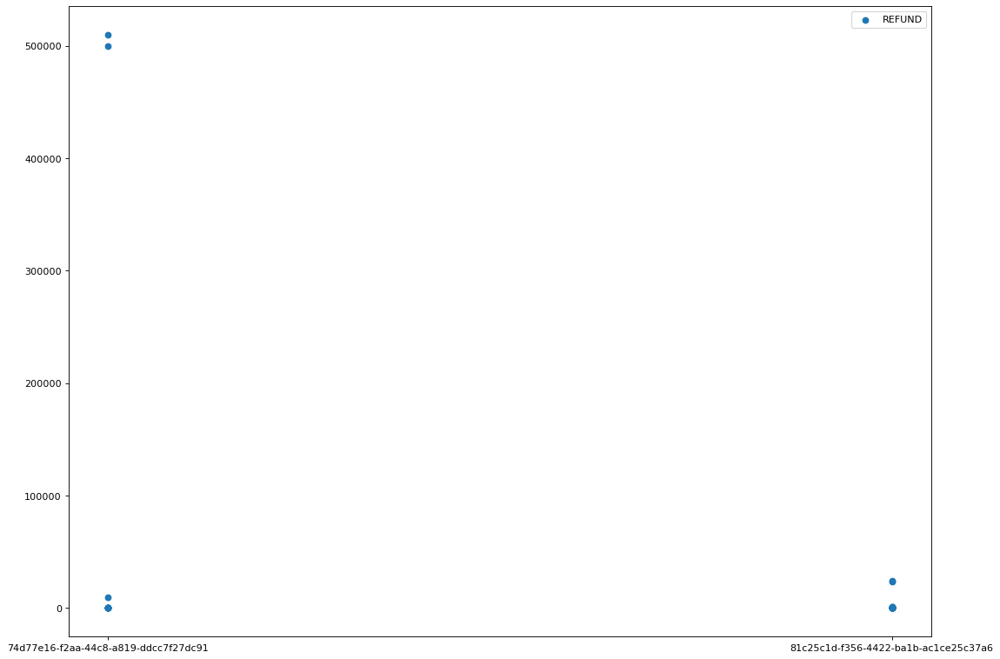

OTHER    32
Name: externalParty.transactionCategory, dtype: int64


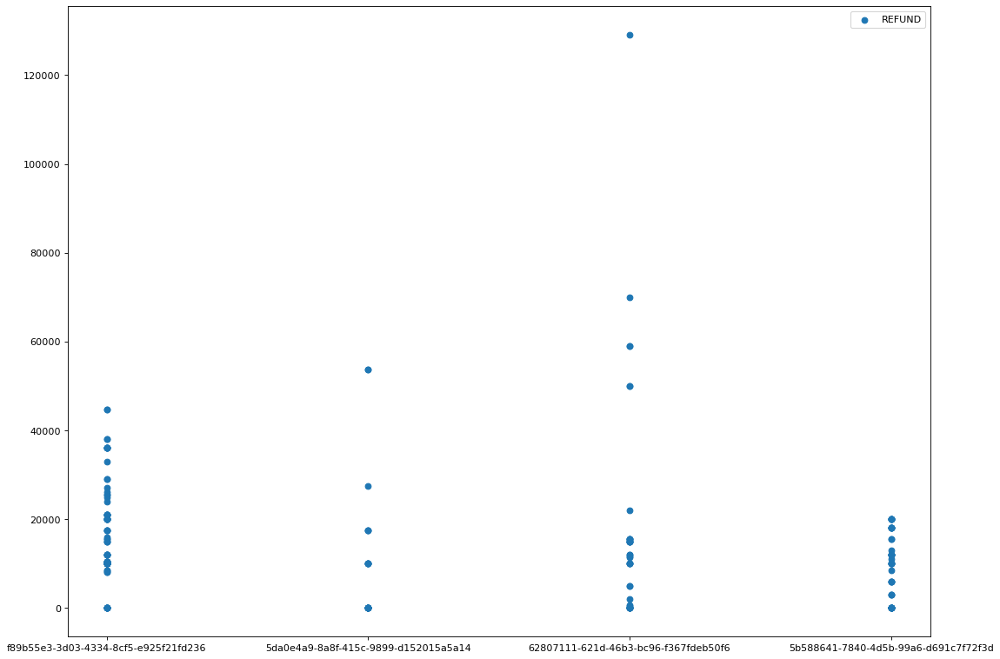

OTHER    189
Name: externalParty.transactionCategory, dtype: int64
{'29839457_236972': {'08169c69-dc63-47ea-bb43-c4d7f610175a', '18f3c268-93f0-4df1-8d40-666ba7c40f92'}, '19108156_87199': {'55fafe43-13a1-490b-b88e-613fb2efe229', 'd21efad3-1e8f-4967-b86b-fe8bba594eba', 'fc24877e-f995-4c77-9557-04a2386f22dc', '5ad46c9b-0cf9-4ccc-8484-03ae25586433'}, '46275046_70436': {'5da6c6f5-d5de-426a-b4b0-479befc79c1a', '08169c69-dc63-47ea-bb43-c4d7f610175a', '912ac95b-407a-4e2f-9d54-43699a729b2b'}, '2490_40541': {'d3dffa0c-d9dc-4aec-ac9c-9df904920cc0', '127e21c1-bbd7-499c-b676-54442e5575d0'}, '60125764_40075': {'3df7fe8a-0abf-4921-a676-99f8cccf23dd', '189670b9-fc2b-4701-9931-27f86a348589', 'f85271bb-aa0a-4b73-89d3-a2bd2e84e578'}, '30_40677': {'47784e2f-866a-414f-b9c7-9a7fe65c3687', 'e2066f7a-e056-4eac-a2a7-f69733803eb6', '33b50d47-da18-4aa4-8a96-b6fa49010103', '619a6a50-1dfc-45f9-9e4b-b5dcaf11a57f', 'cb04b207-0f1f-4269-938c-89718274c6ac', 'fa8c4d42-e866-4de2-a12d-88fab1bc5ab0', '87656c8f-cf10-4895-88

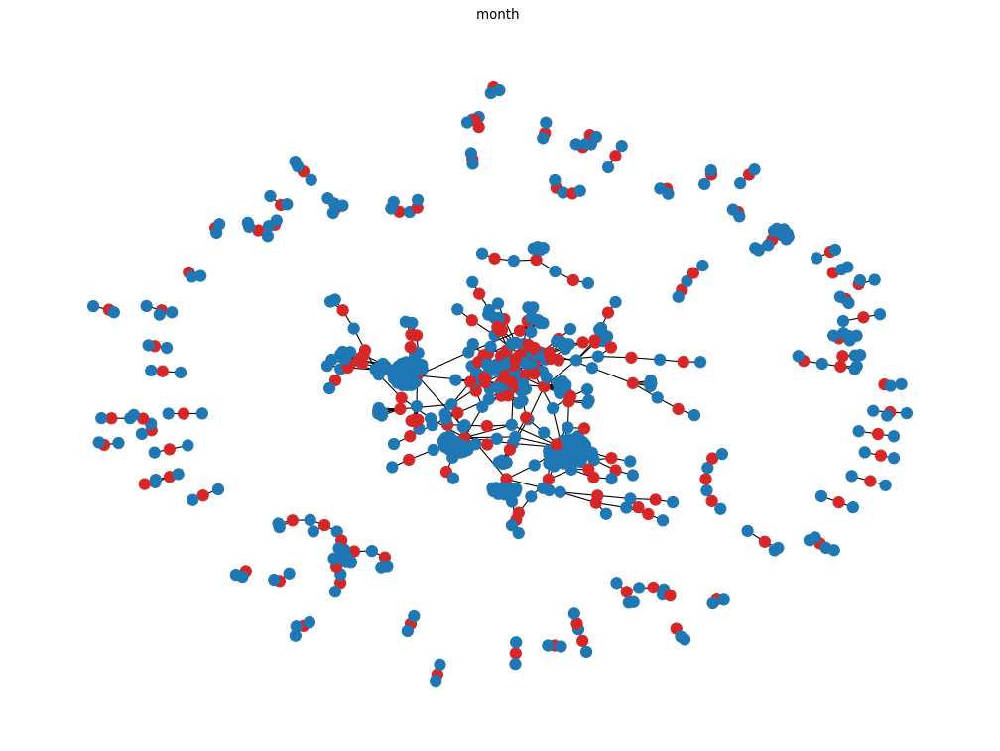

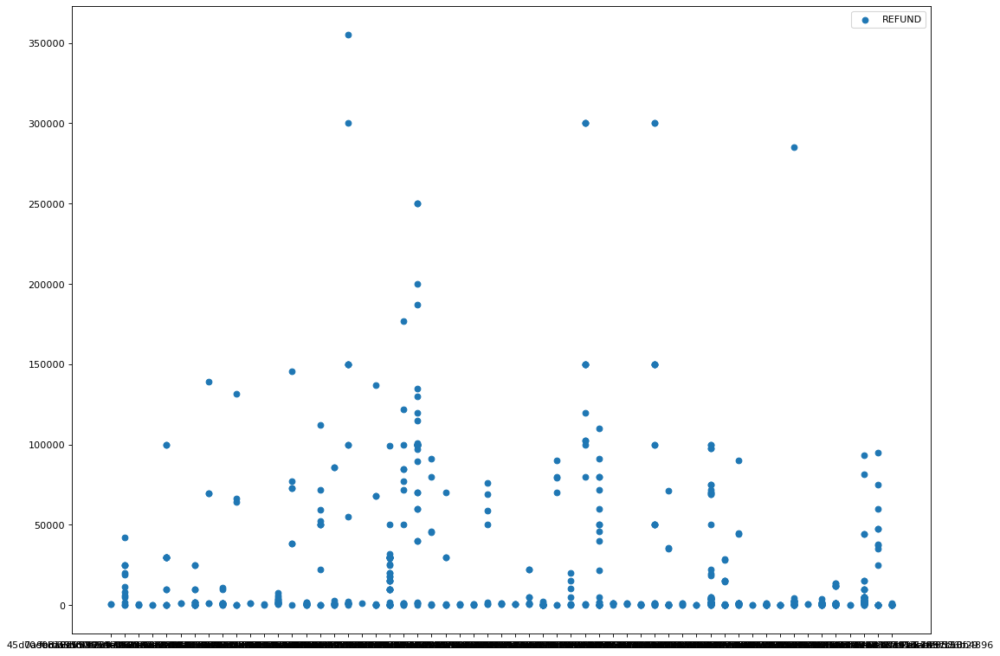

OTHER        664
GROCERIES      9
TRAVEL         8
LIFESTYLE      2
SHOPPING       1
Name: externalParty.transactionCategory, dtype: int64


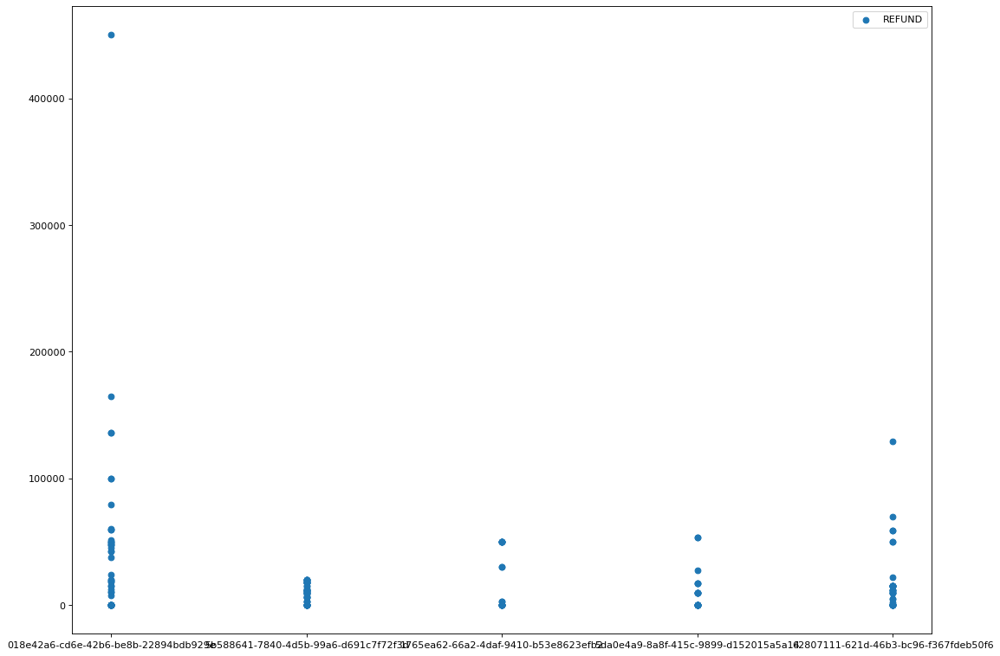

OTHER    173
Name: externalParty.transactionCategory, dtype: int64


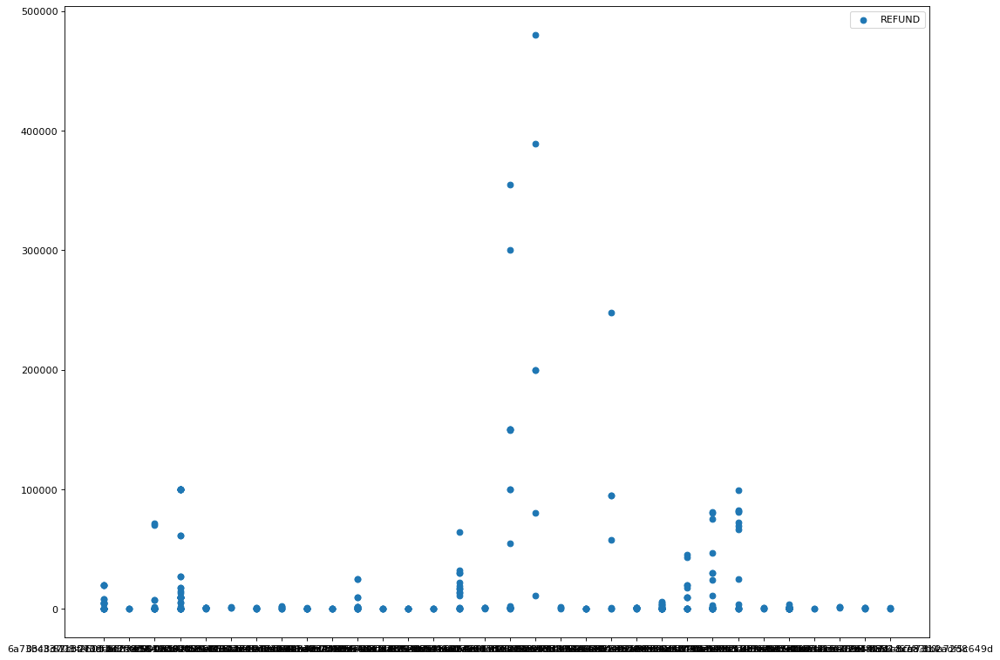

OTHER        320
GROCERIES      3
TRAVEL         2
LIFESTYLE      1
Name: externalParty.transactionCategory, dtype: int64


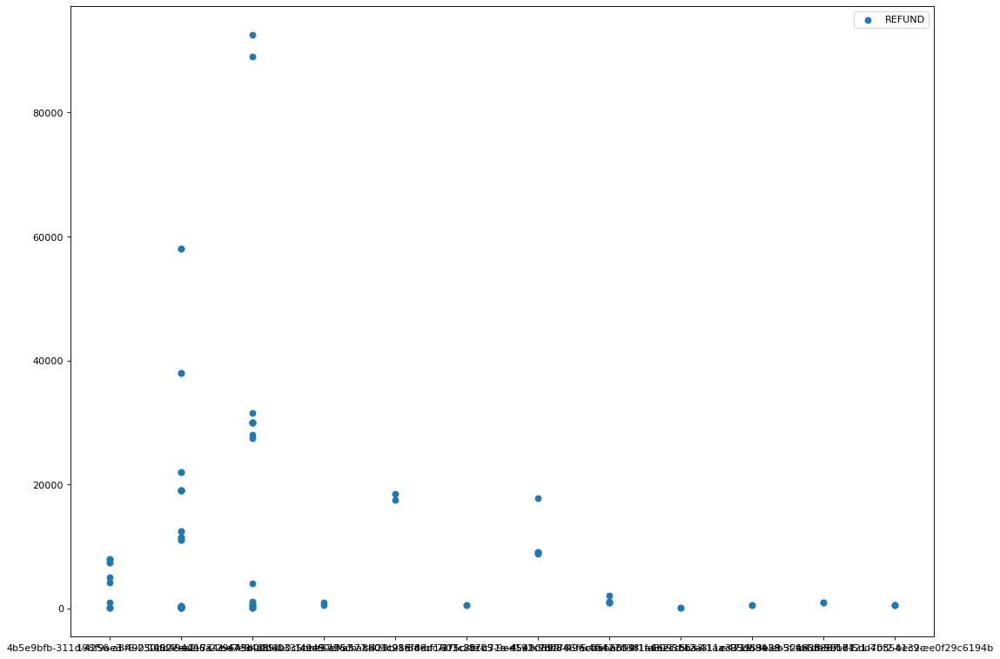

OTHER    83
Name: externalParty.transactionCategory, dtype: int64


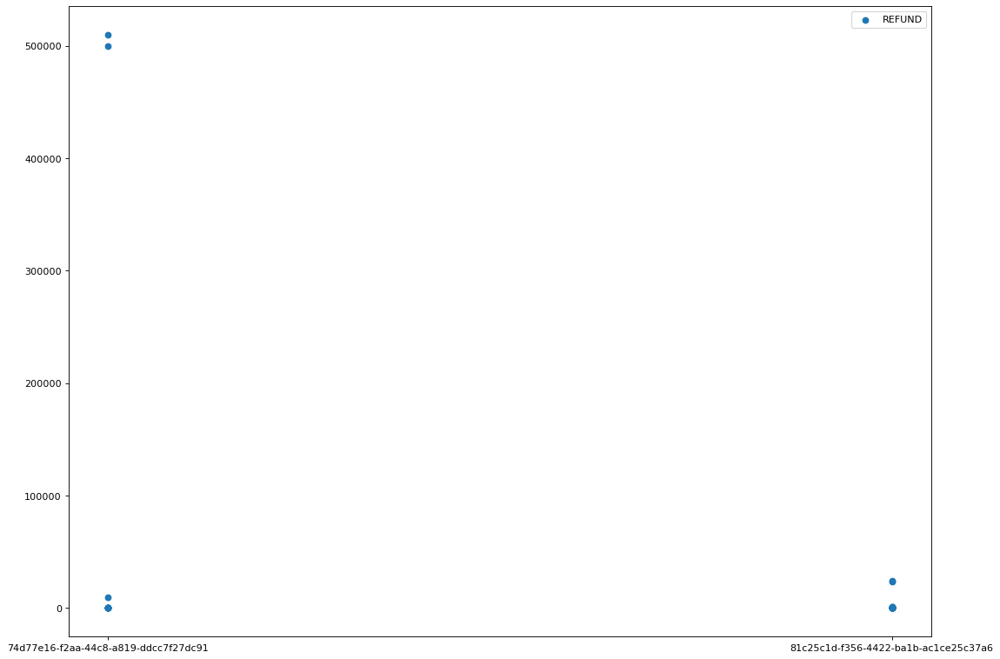

OTHER    32
Name: externalParty.transactionCategory, dtype: int64


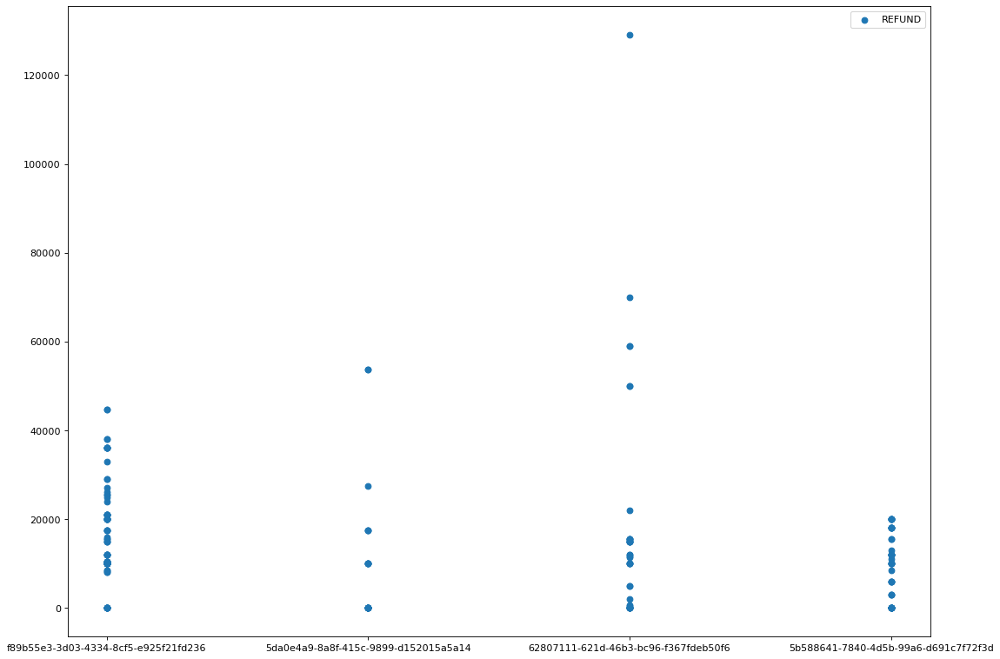

OTHER    189
Name: externalParty.transactionCategory, dtype: int64


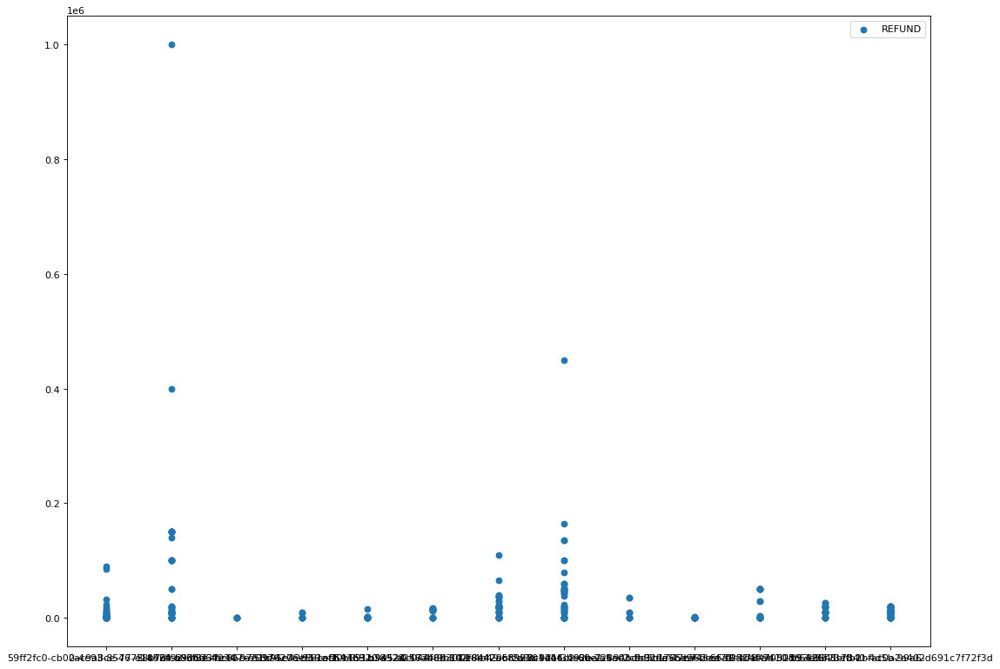

OTHER        312
GROCERIES     25
TRAVEL        15
SHOPPING       8
LIFESTYLE      1
Name: externalParty.transactionCategory, dtype: int64


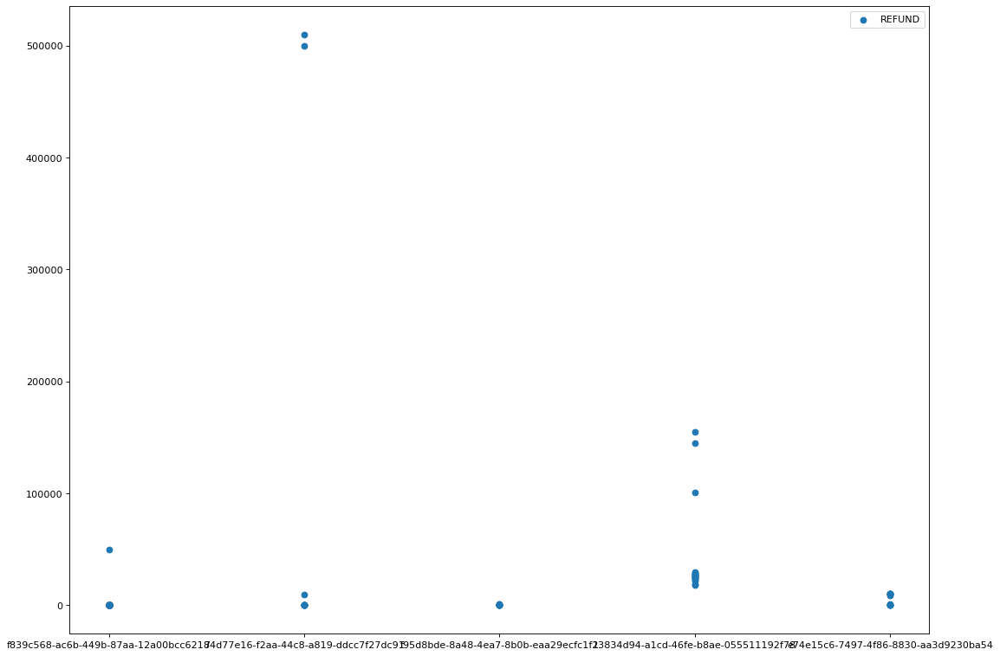

OTHER    161
Name: externalParty.transactionCategory, dtype: int64


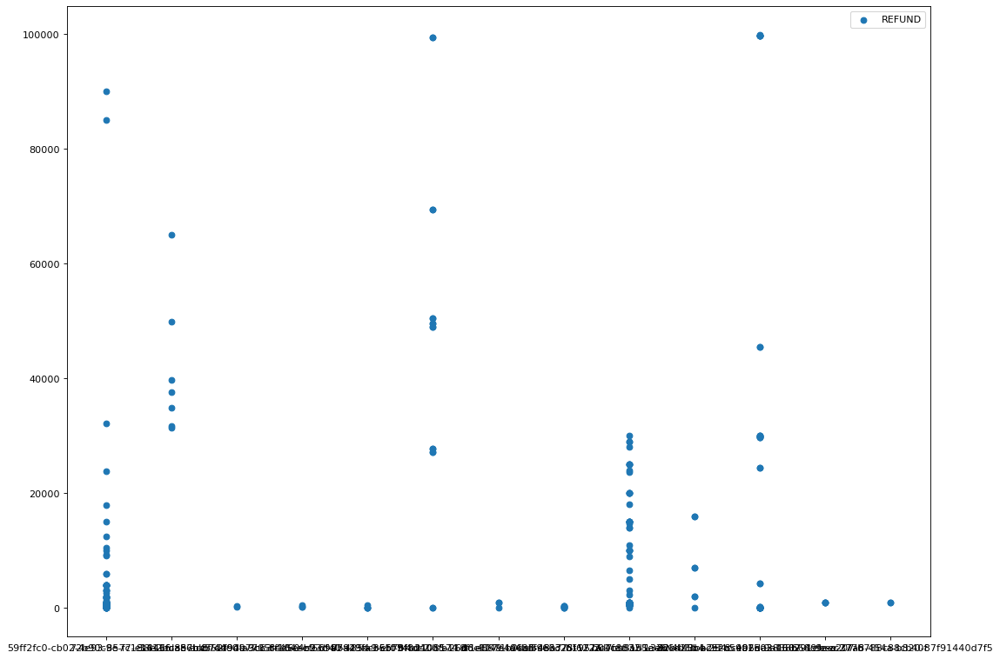

OTHER        186
GROCERIES     25
TRAVEL        13
SHOPPING      11
LIFESTYLE      1
Name: externalParty.transactionCategory, dtype: int64


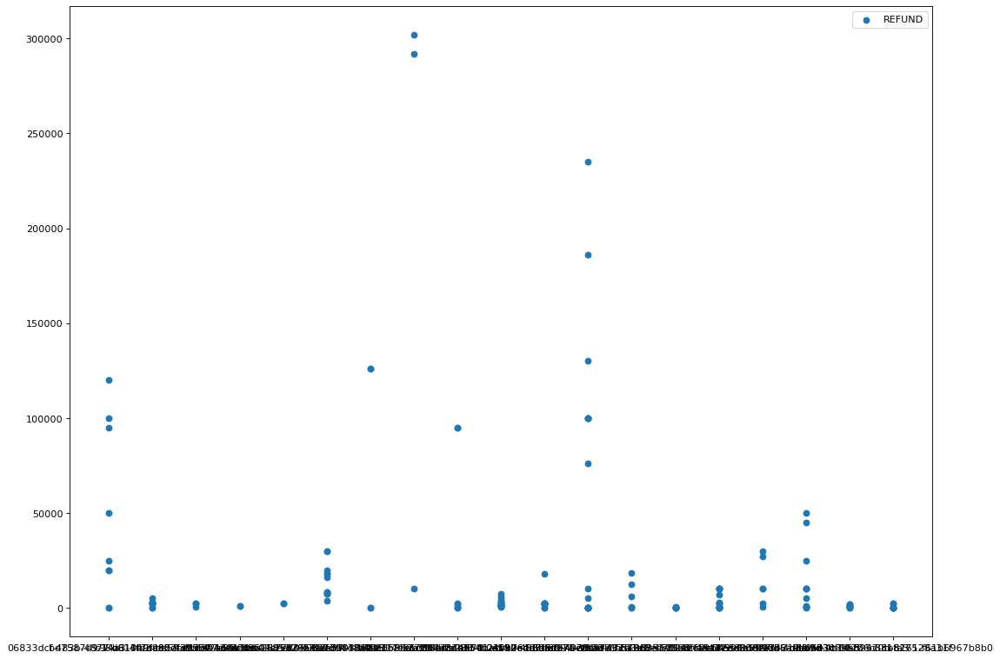

OTHER    157
Name: externalParty.transactionCategory, dtype: int64


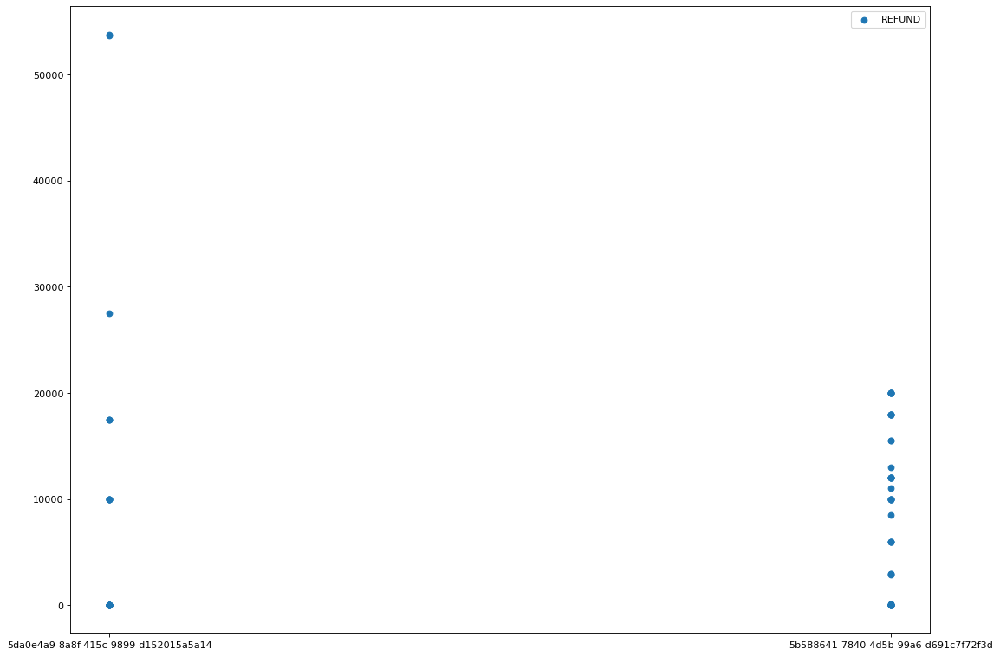

OTHER    68
Name: externalParty.transactionCategory, dtype: int64


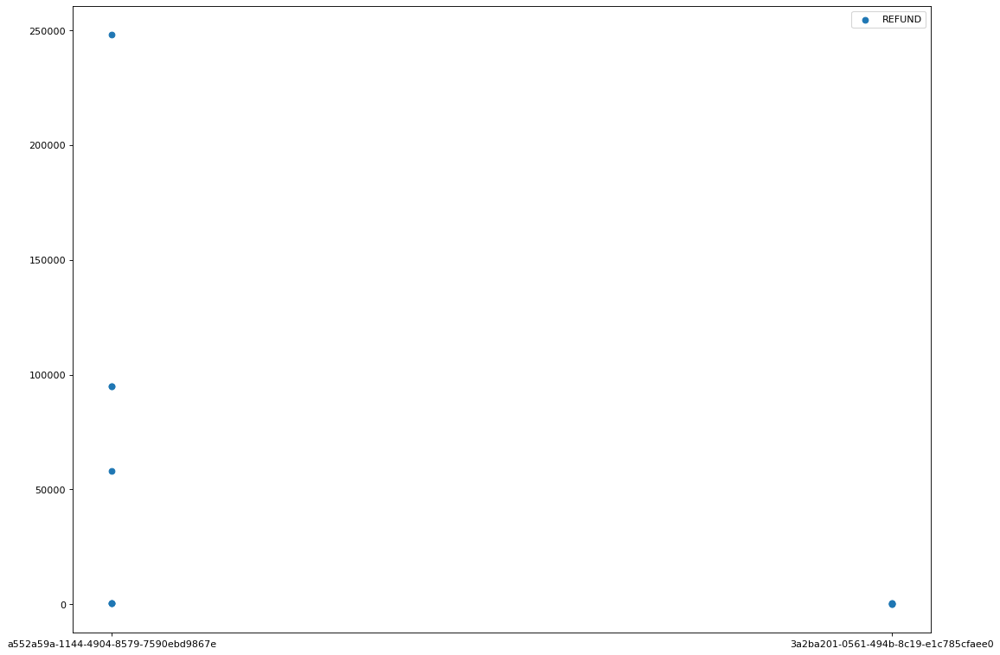

OTHER    11
Name: externalParty.transactionCategory, dtype: int64


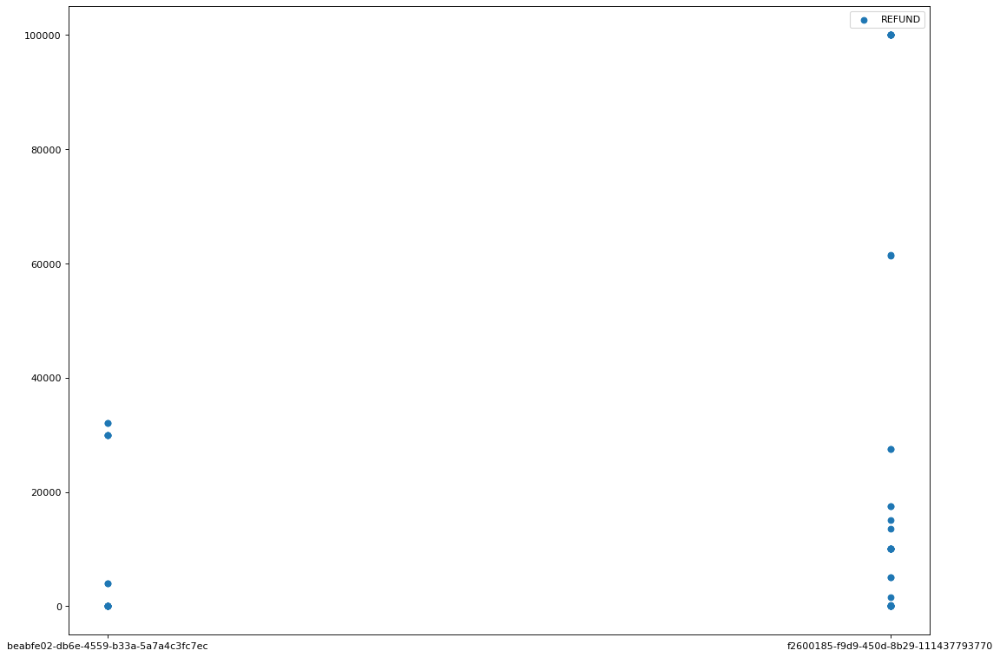

OTHER    53
Name: externalParty.transactionCategory, dtype: int64


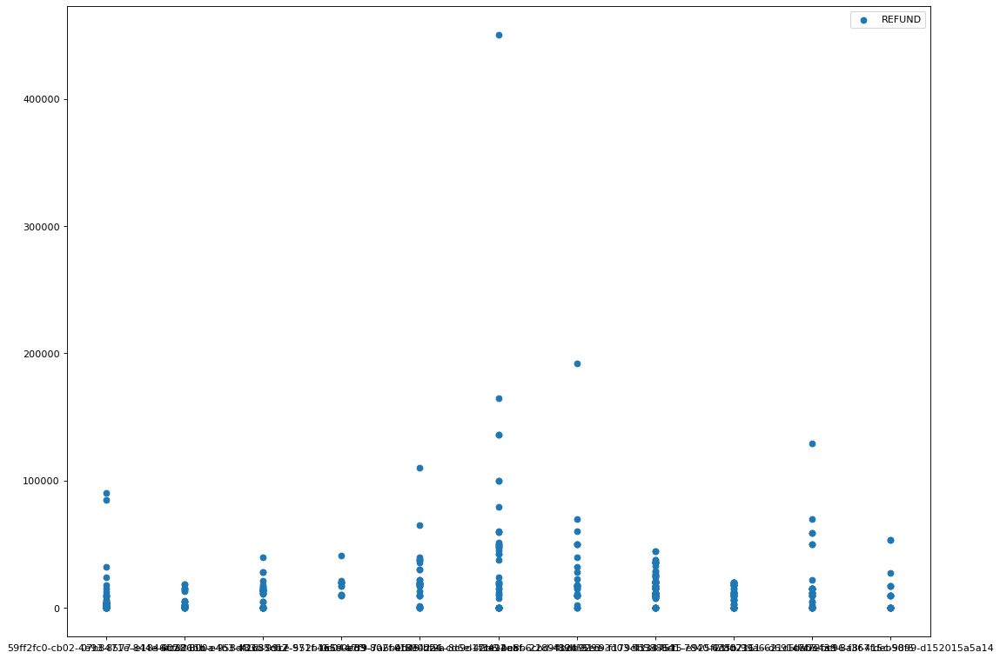

OTHER        420
GROCERIES     25
TRAVEL        15
SHOPPING       8
LIFESTYLE      1
Name: externalParty.transactionCategory, dtype: int64


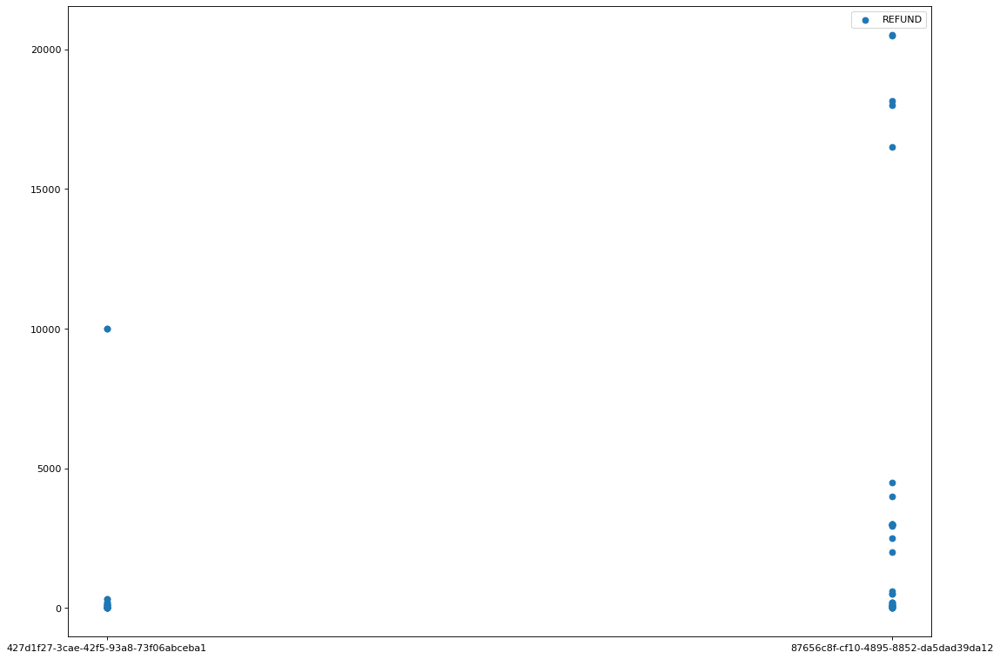

OTHER    53
Name: externalParty.transactionCategory, dtype: int64


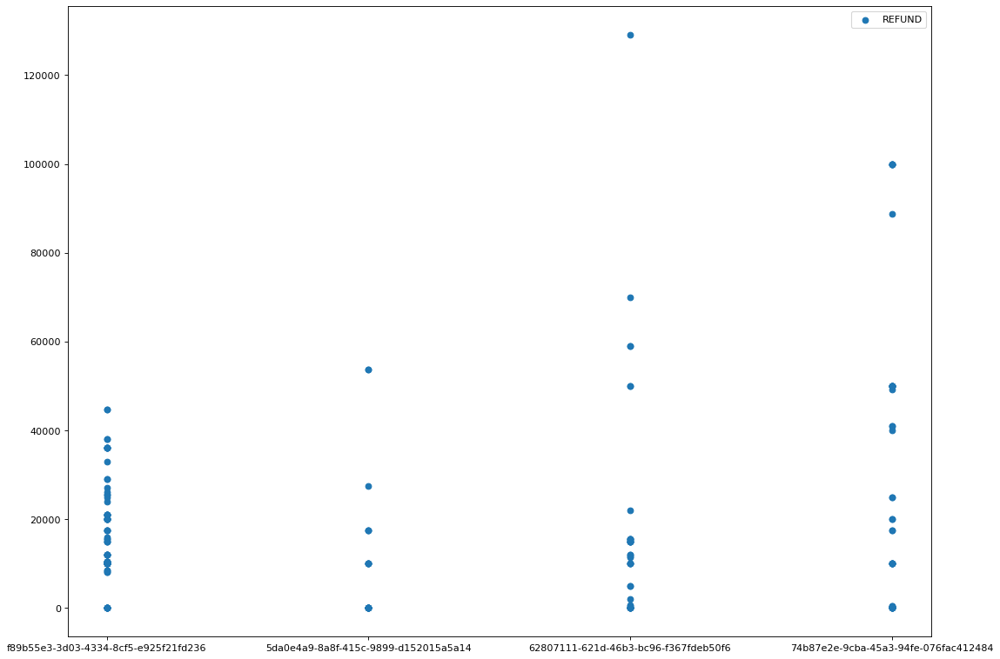

OTHER    187
Name: externalParty.transactionCategory, dtype: int64


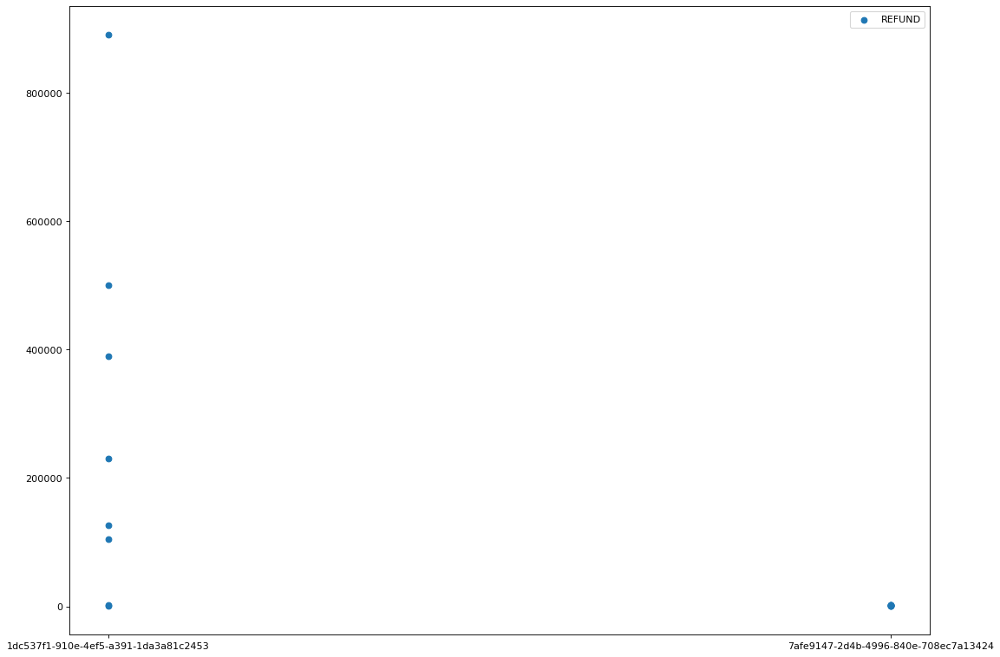

OTHER    15
Name: externalParty.transactionCategory, dtype: int64


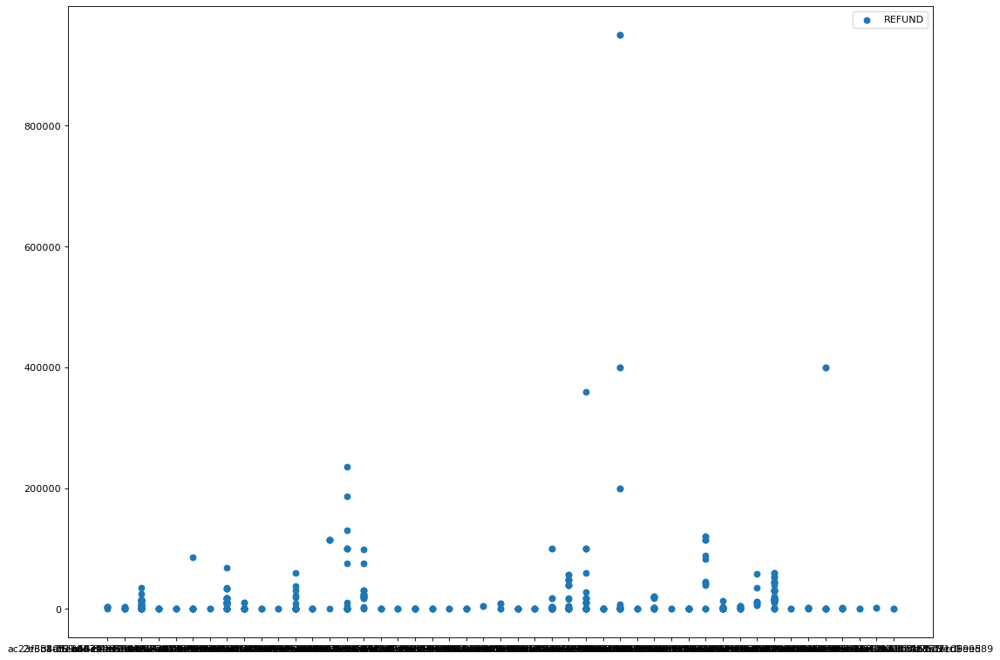

OTHER        532
LIFESTYLE      1
SHOPPING       1
Name: externalParty.transactionCategory, dtype: int64


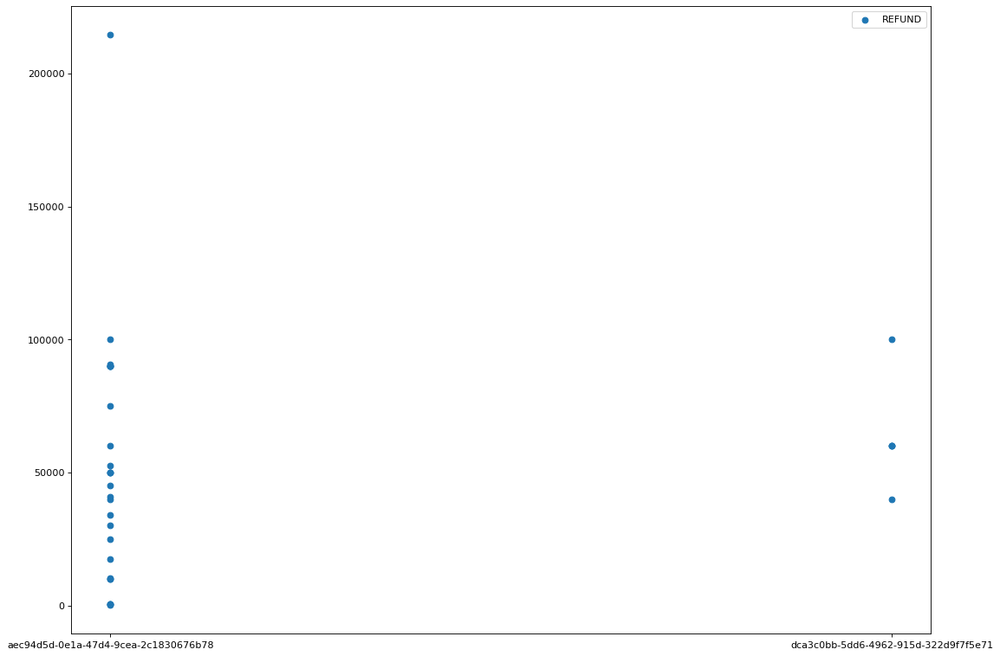

OTHER    32
Name: externalParty.transactionCategory, dtype: int64


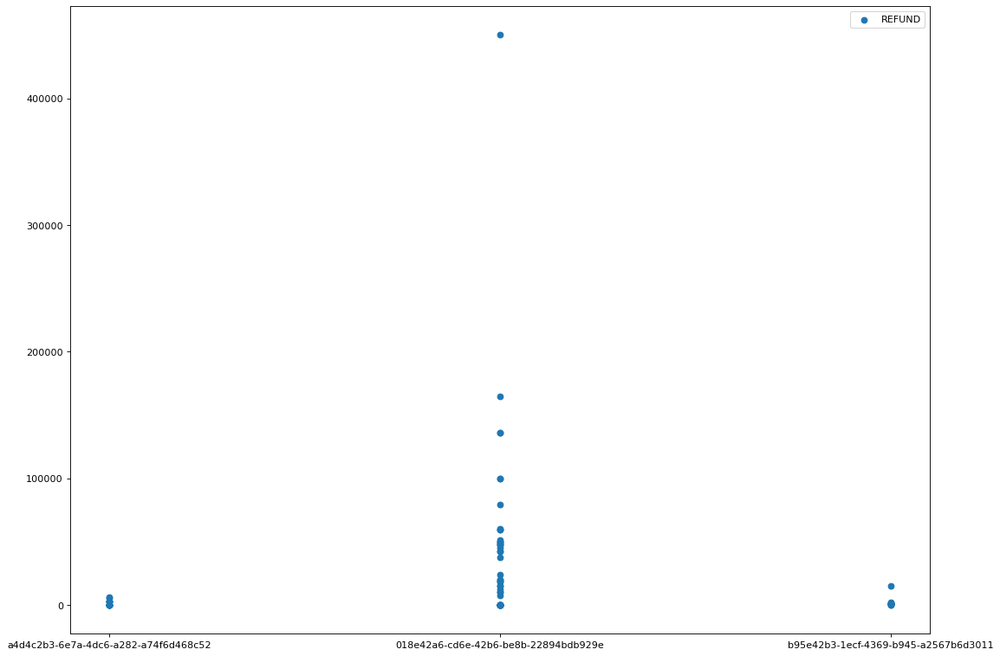

OTHER    76
Name: externalParty.transactionCategory, dtype: int64


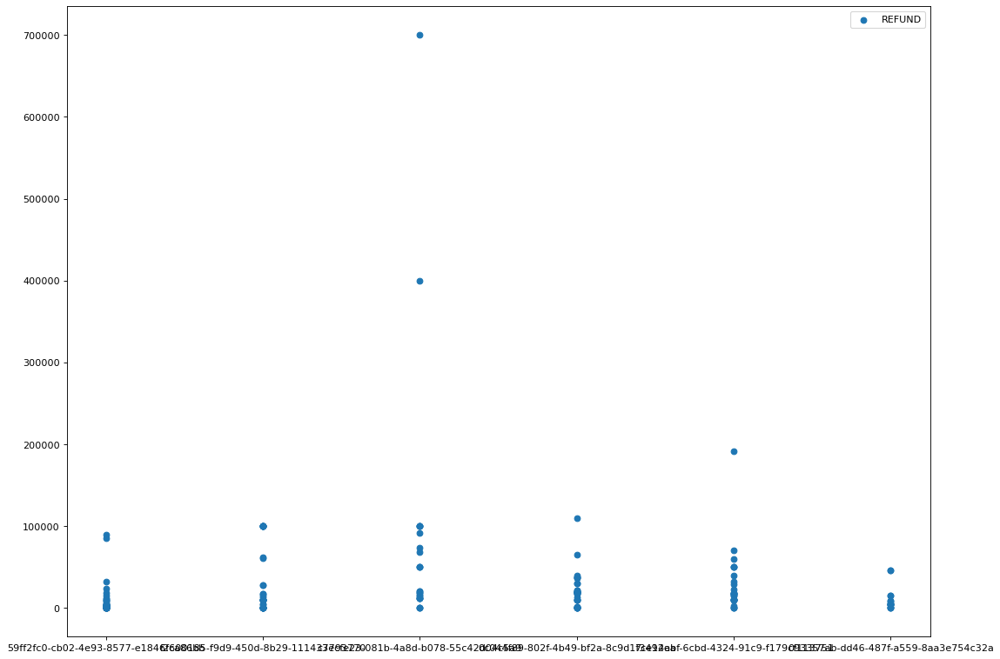

OTHER        176
GROCERIES     25
TRAVEL        15
SHOPPING       8
LIFESTYLE      1
Name: externalParty.transactionCategory, dtype: int64


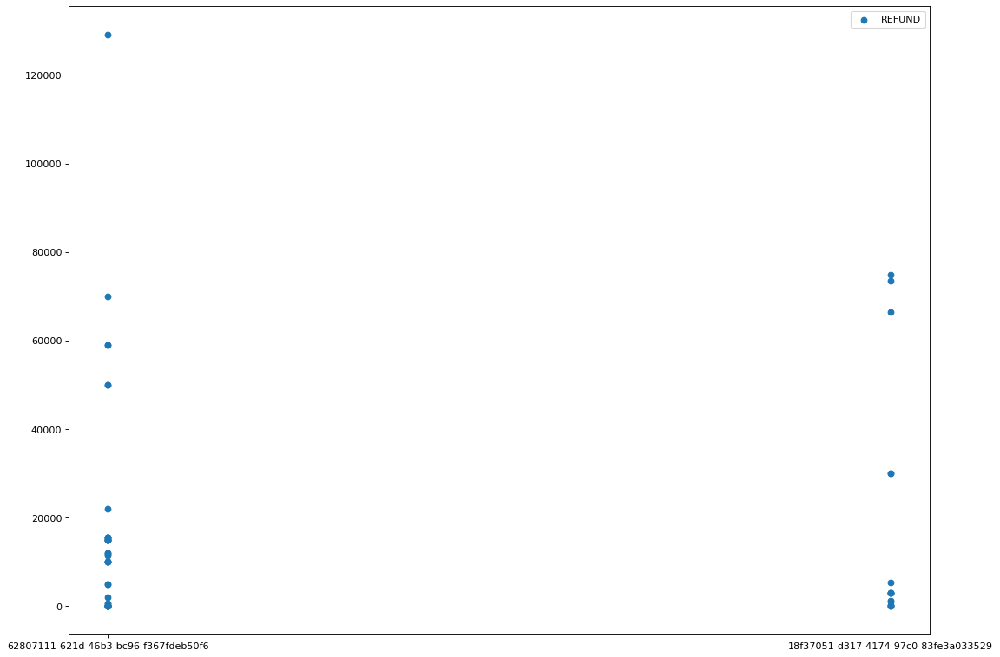

OTHER       51
SHOPPING     1
Name: externalParty.transactionCategory, dtype: int64


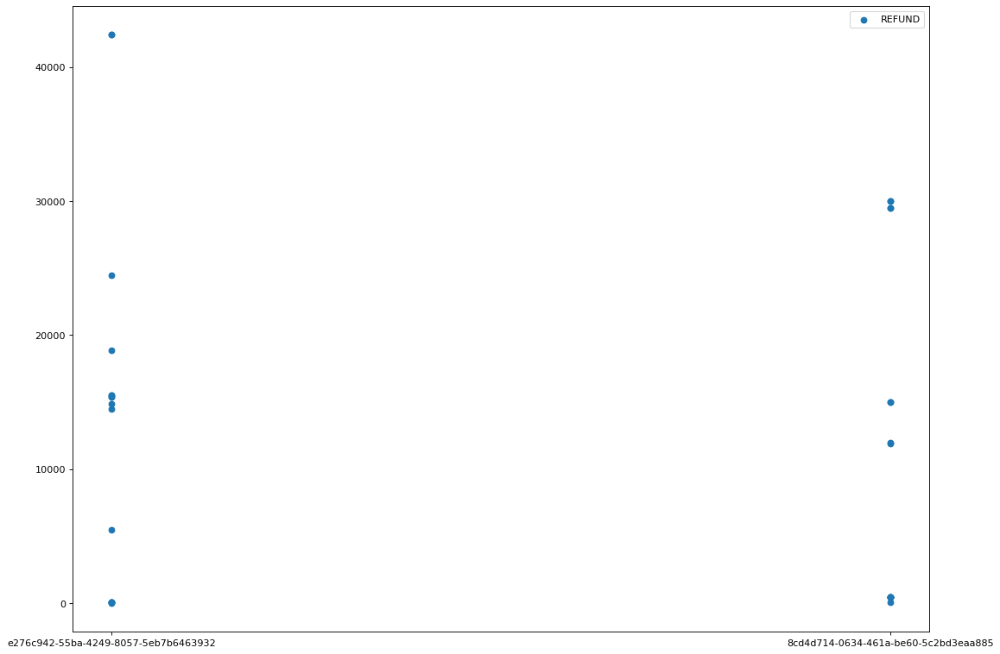

OTHER    32
Name: externalParty.transactionCategory, dtype: int64


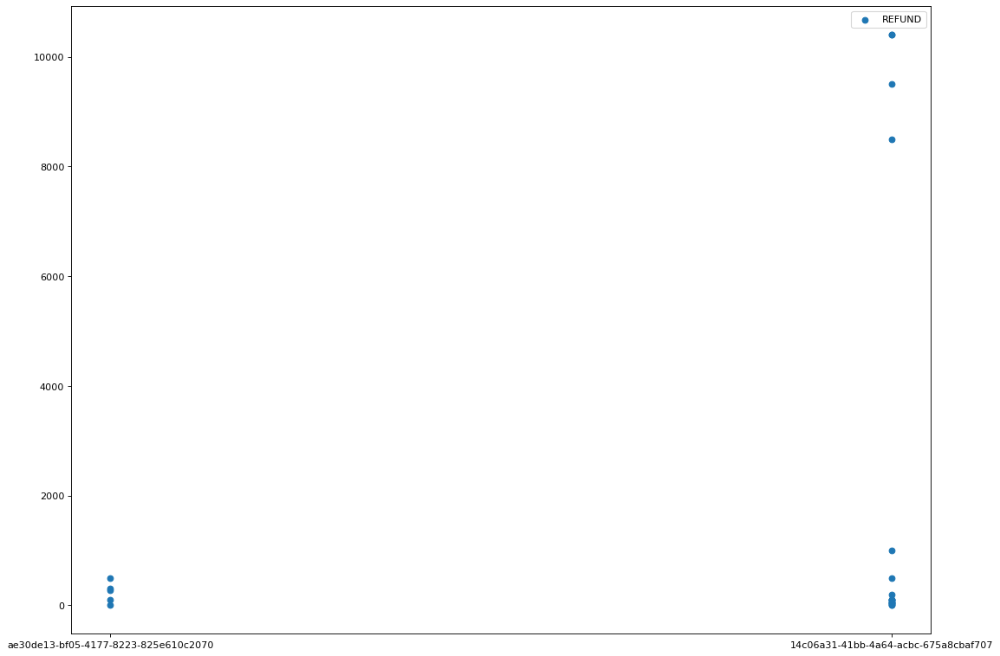

OTHER    23
Name: externalParty.transactionCategory, dtype: int64


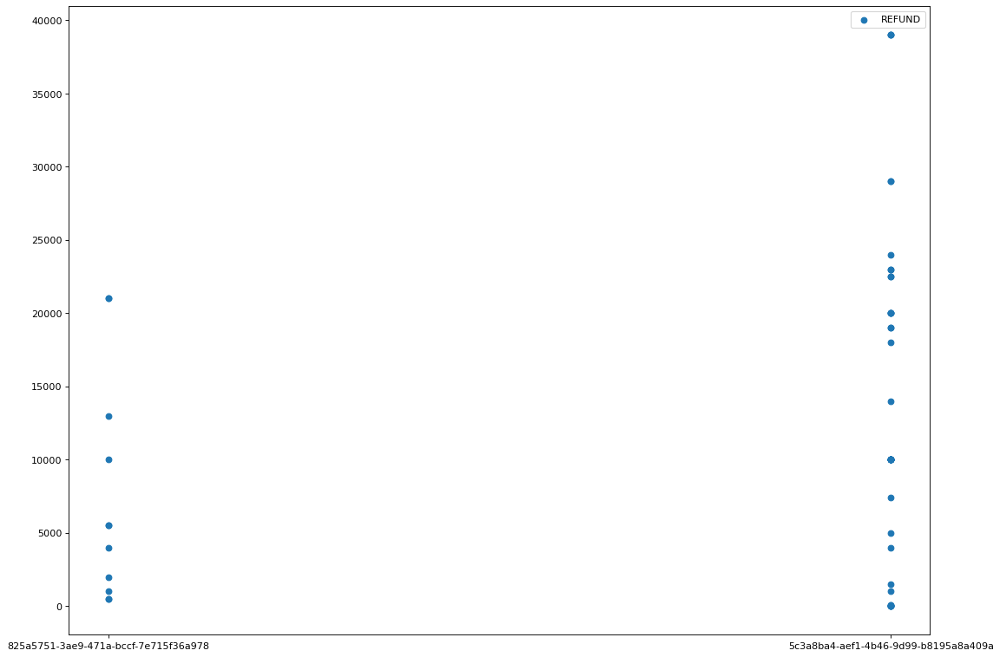

OTHER    52
Name: externalParty.transactionCategory, dtype: int64


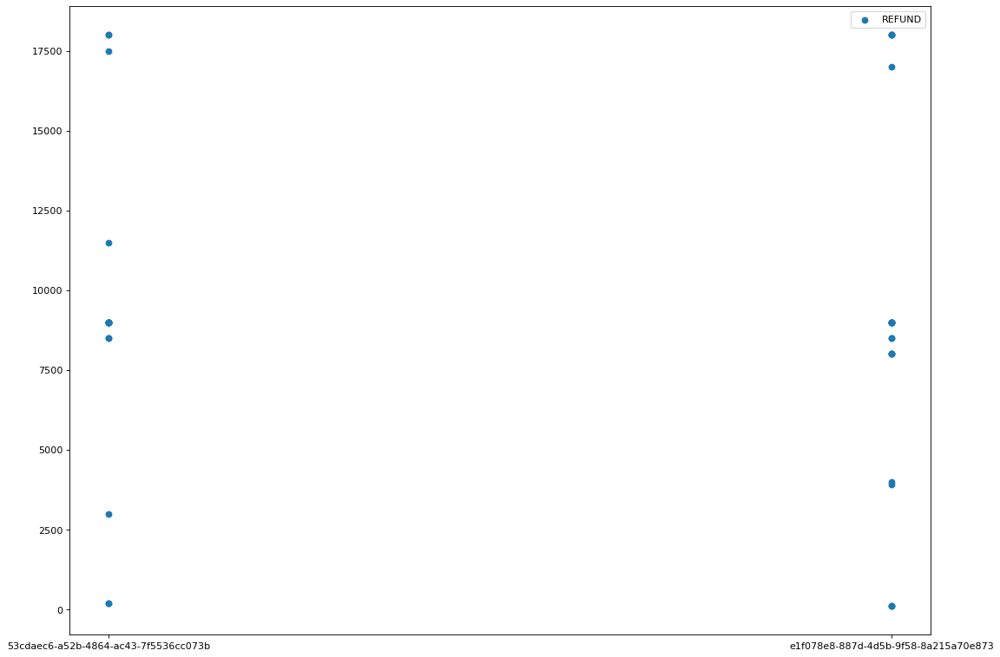

OTHER    42
Name: externalParty.transactionCategory, dtype: int64


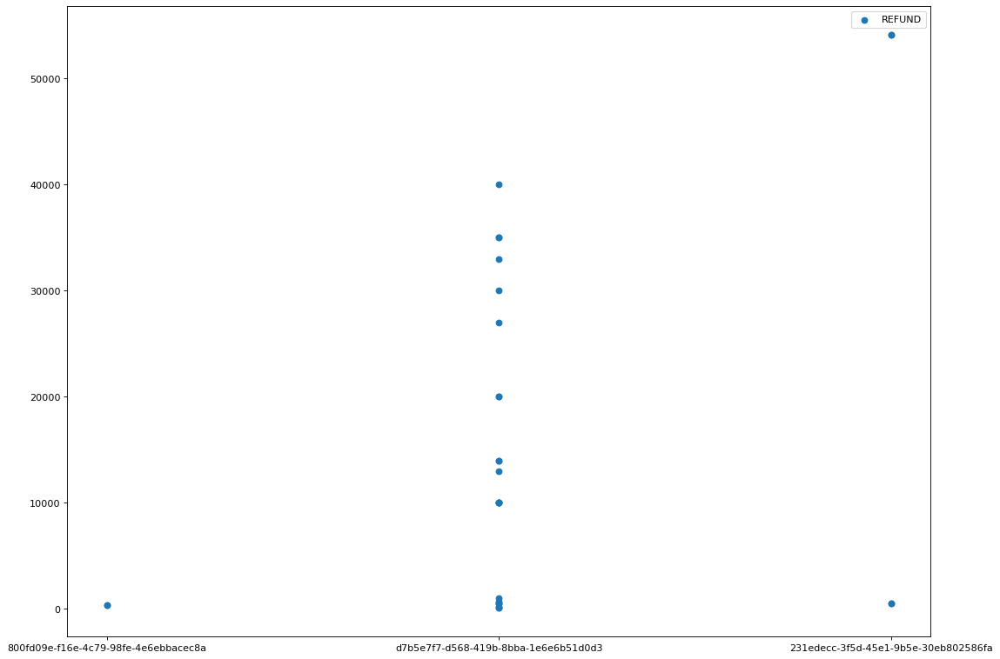

OTHER    30
Name: externalParty.transactionCategory, dtype: int64


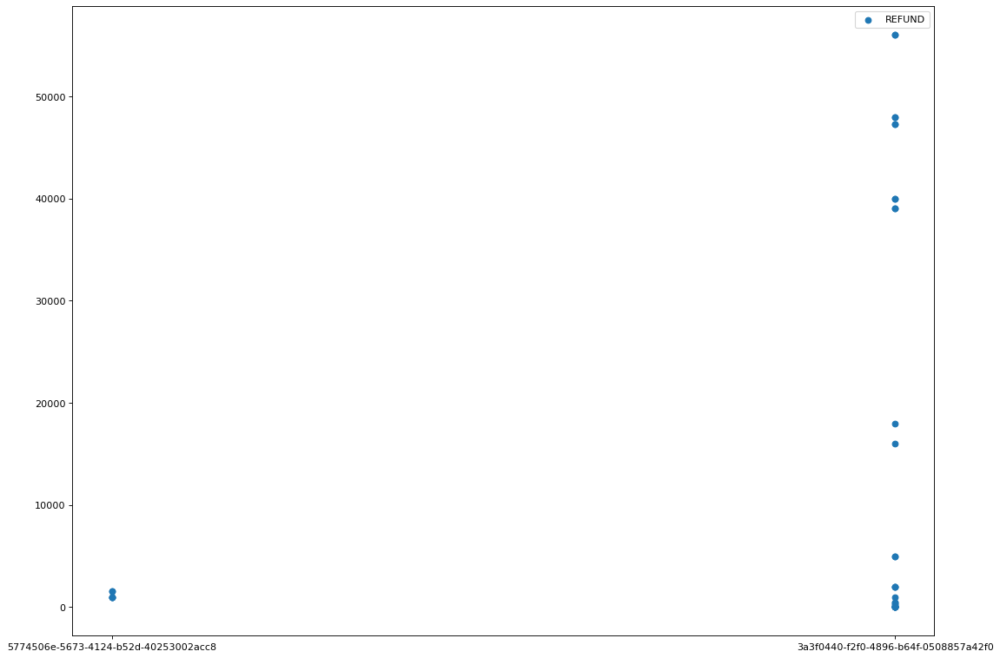

OTHER    35
Name: externalParty.transactionCategory, dtype: int64


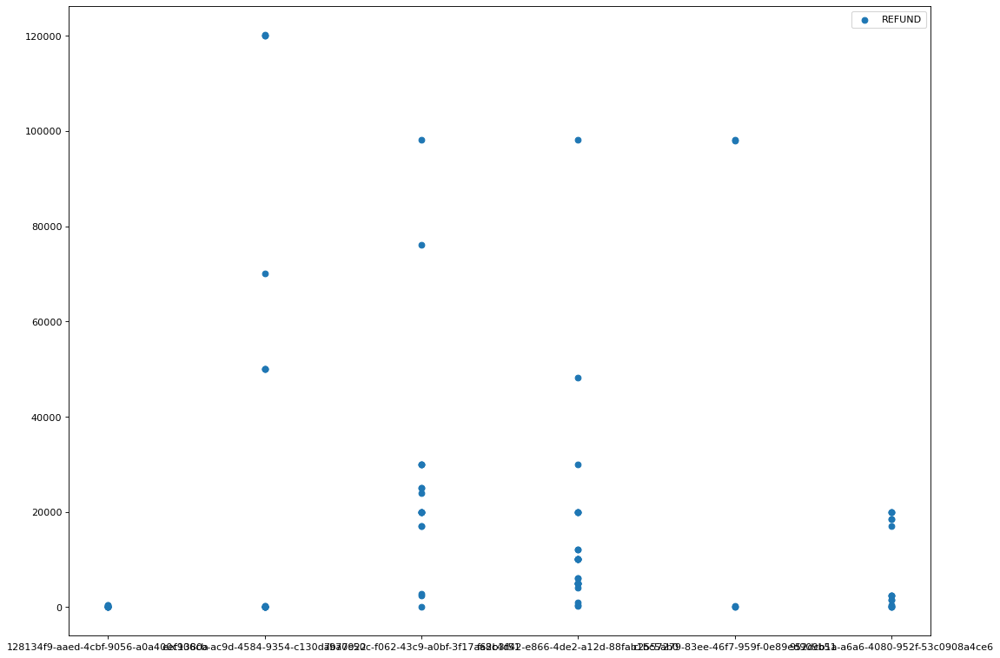

OTHER    90
Name: externalParty.transactionCategory, dtype: int64


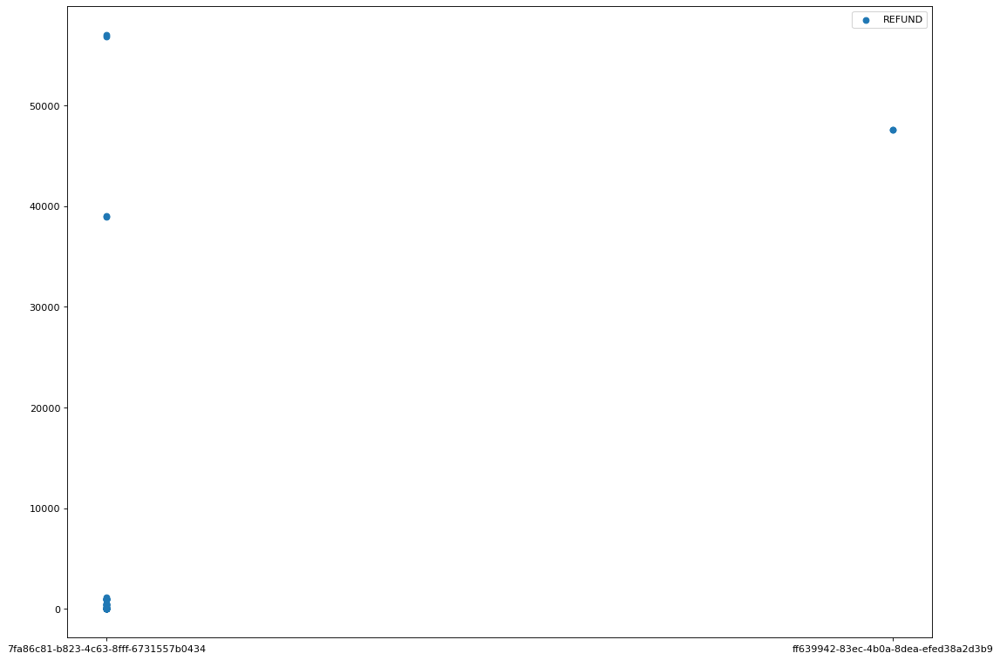

OTHER       42
SHOPPING     2
TRAVEL       2
Name: externalParty.transactionCategory, dtype: int64


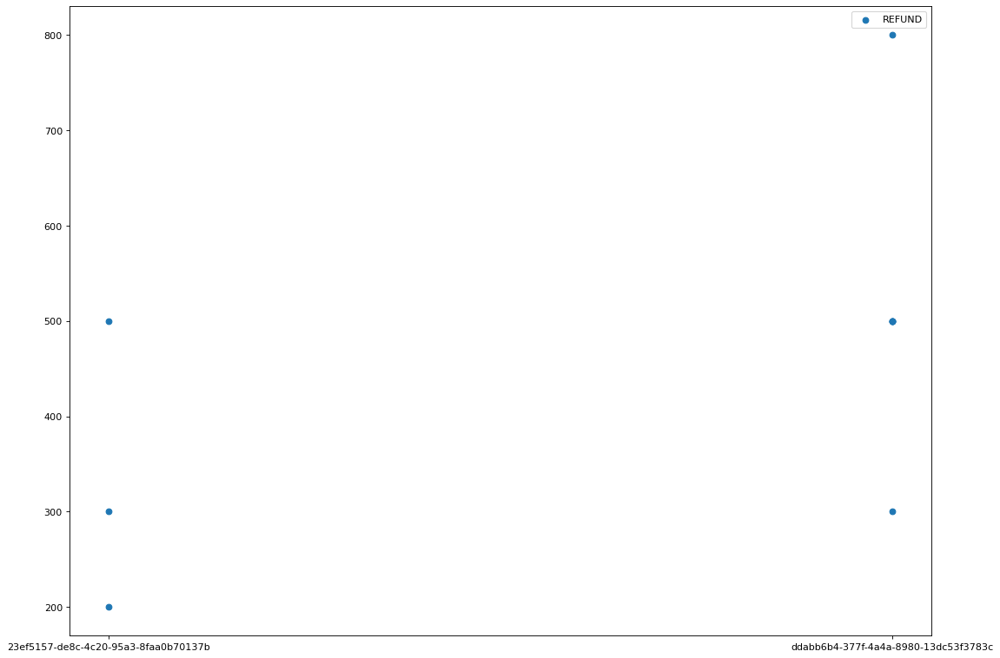

OTHER    9
Name: externalParty.transactionCategory, dtype: int64


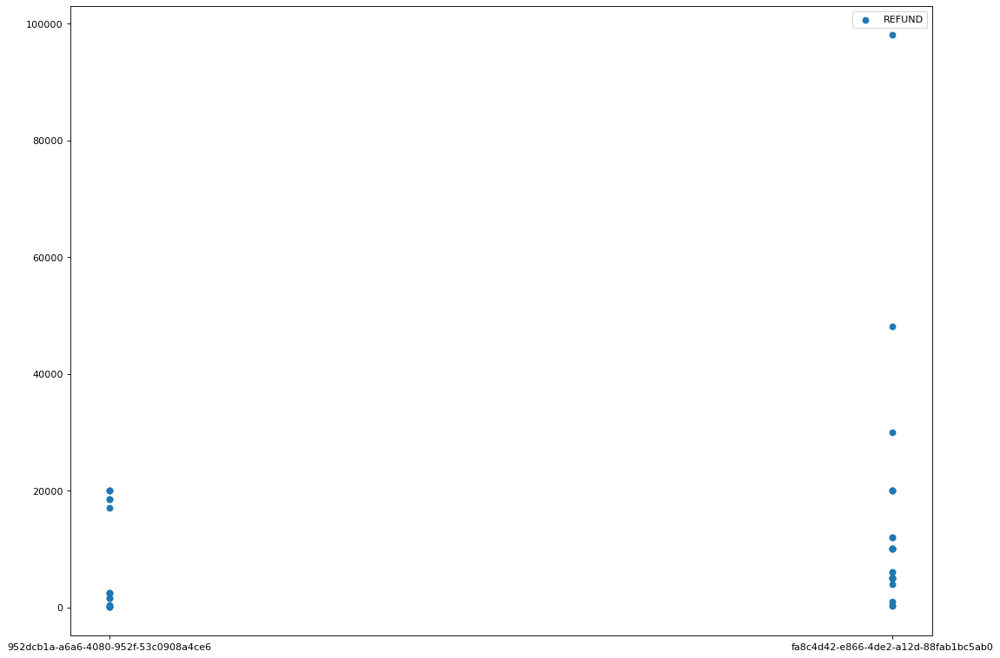

OTHER    42
Name: externalParty.transactionCategory, dtype: int64


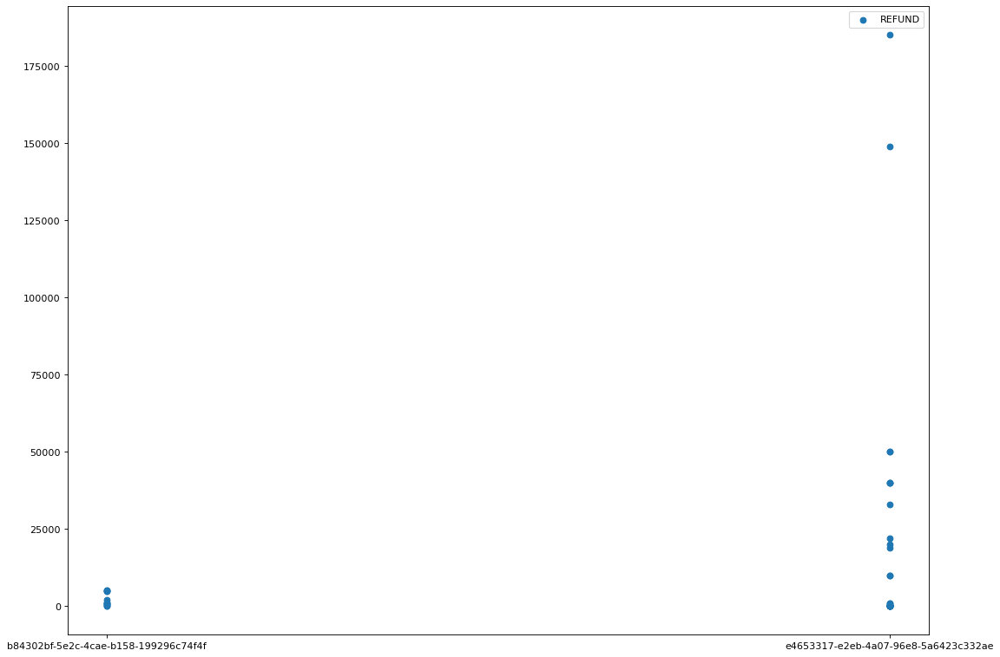

OTHER       45
SHOPPING     1
Name: externalParty.transactionCategory, dtype: int64


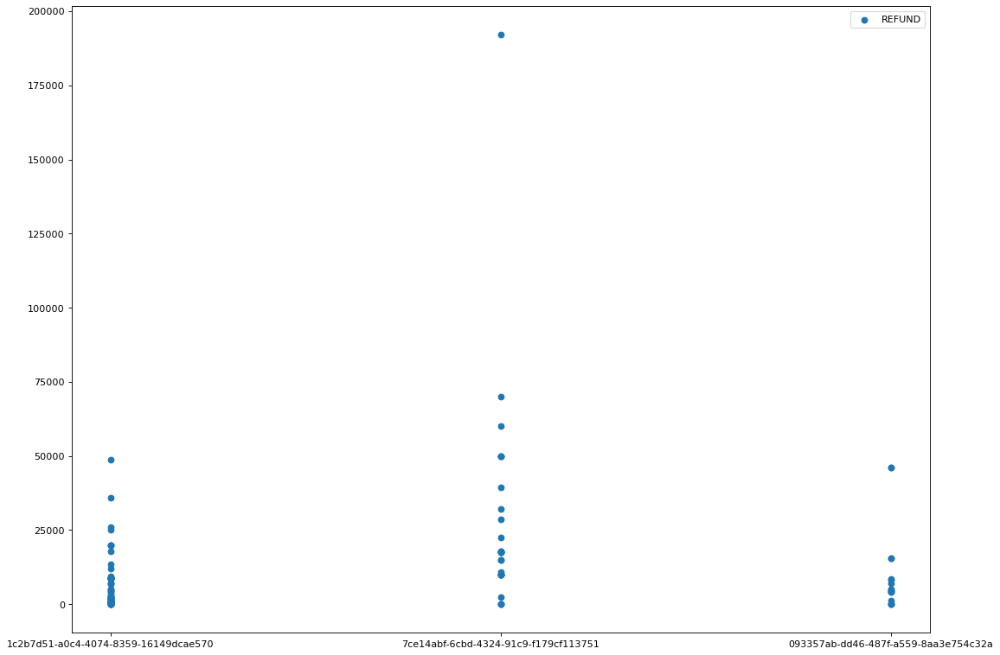

OTHER        105
TRAVEL         7
LIFESTYLE      7
GROCERIES      7
SHOPPING       1
Name: externalParty.transactionCategory, dtype: int64


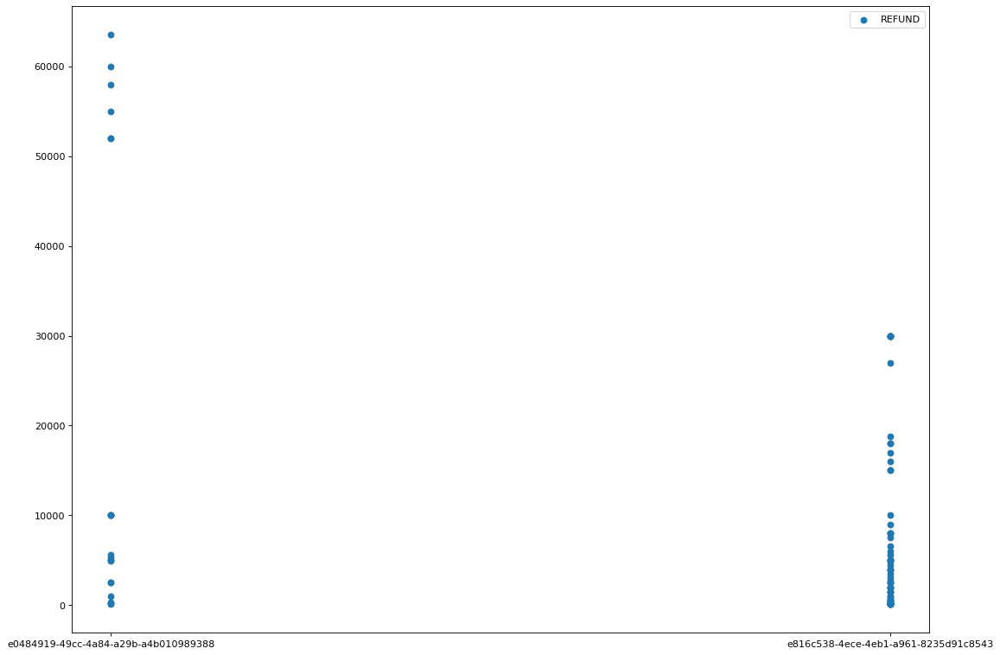

OTHER    84
Name: externalParty.transactionCategory, dtype: int64


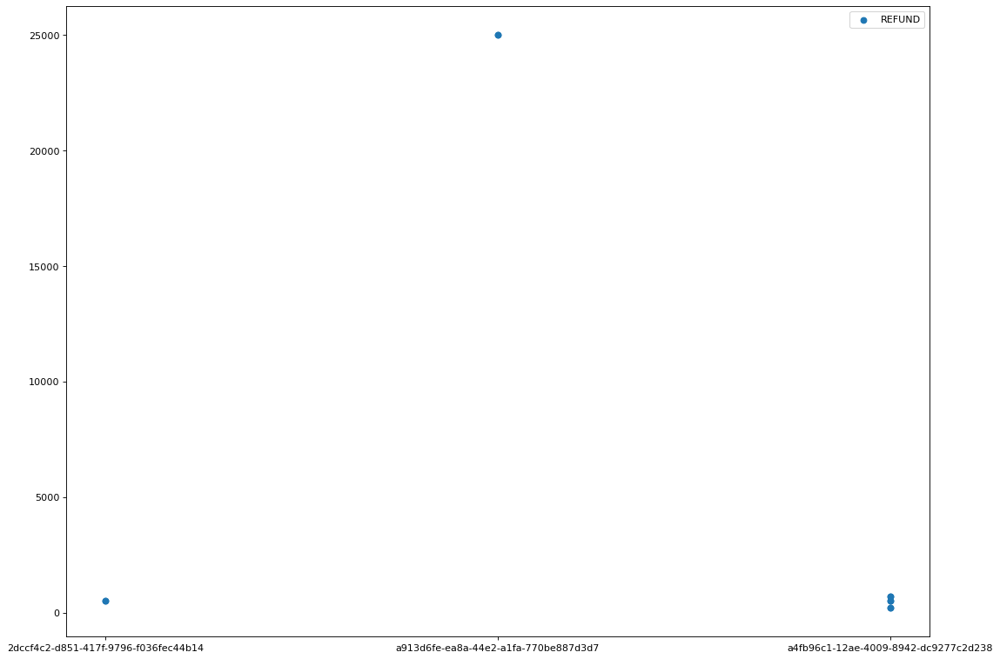

OTHER    10
Name: externalParty.transactionCategory, dtype: int64


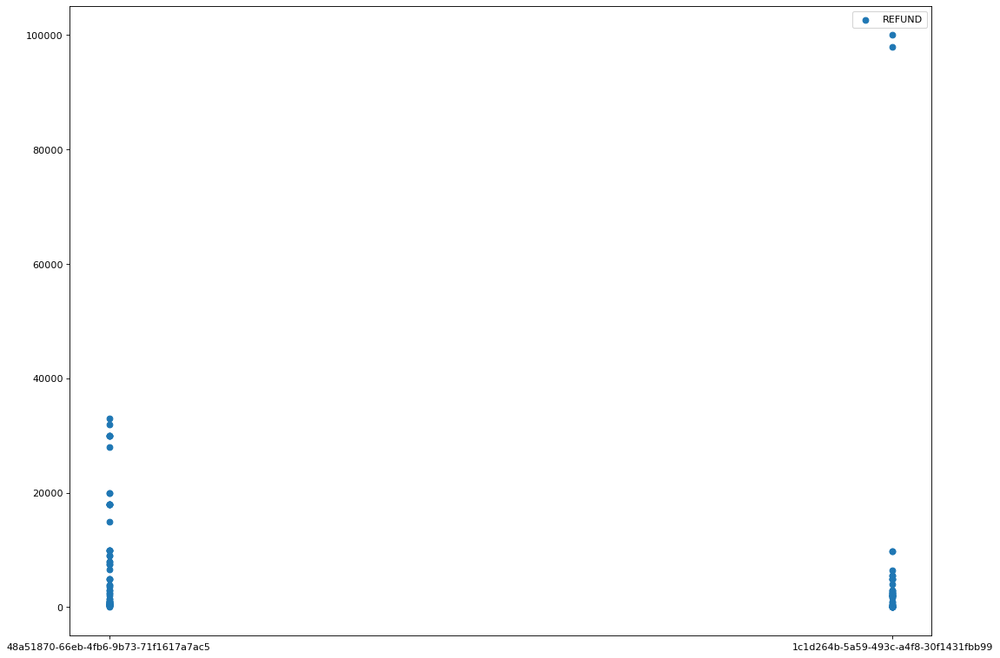

OTHER        102
LIFESTYLE      1
Name: externalParty.transactionCategory, dtype: int64


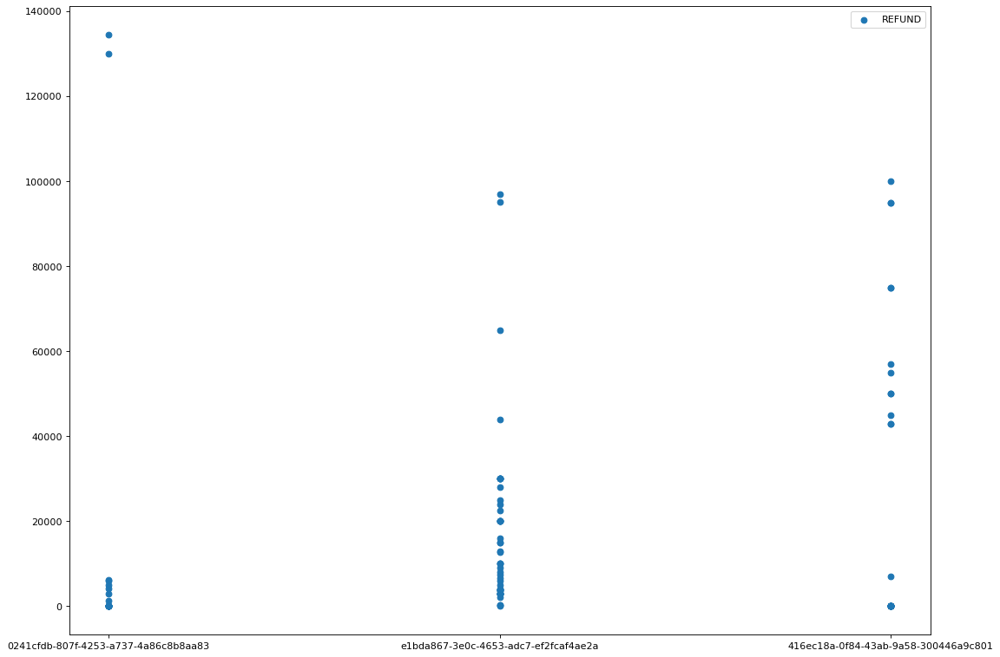

OTHER    111
Name: externalParty.transactionCategory, dtype: int64


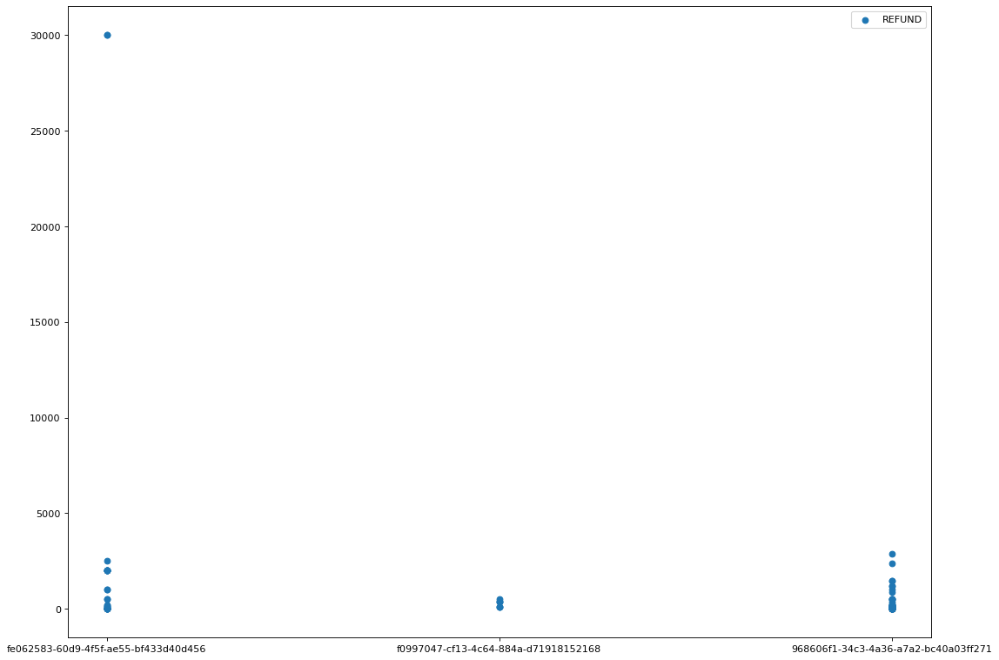

OTHER    117
Name: externalParty.transactionCategory, dtype: int64


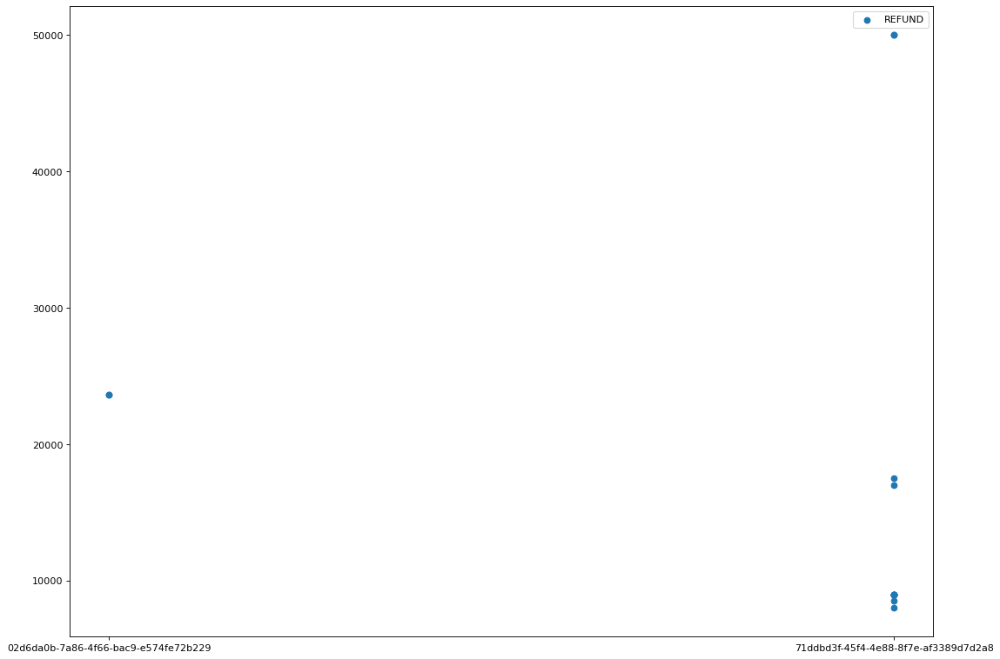

OTHER    14
Name: externalParty.transactionCategory, dtype: int64


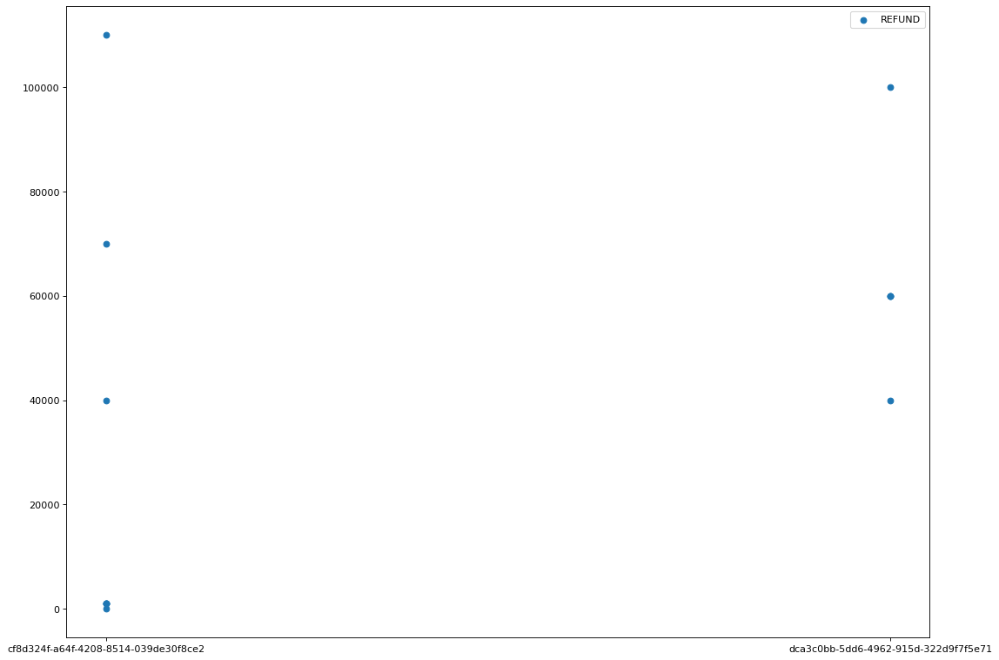

OTHER    13
Name: externalParty.transactionCategory, dtype: int64


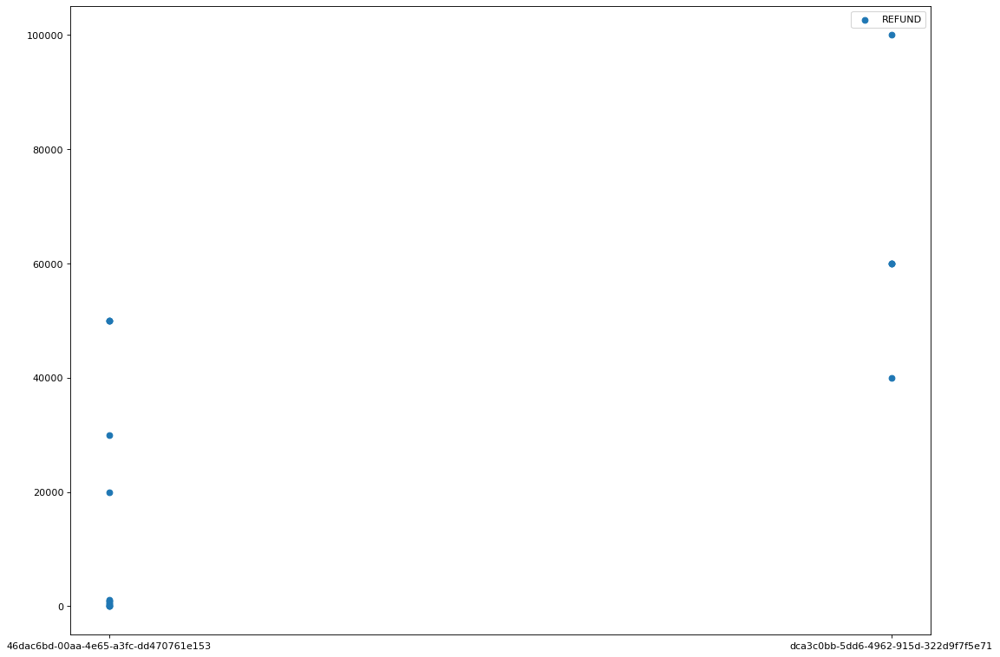

OTHER    18
Name: externalParty.transactionCategory, dtype: int64


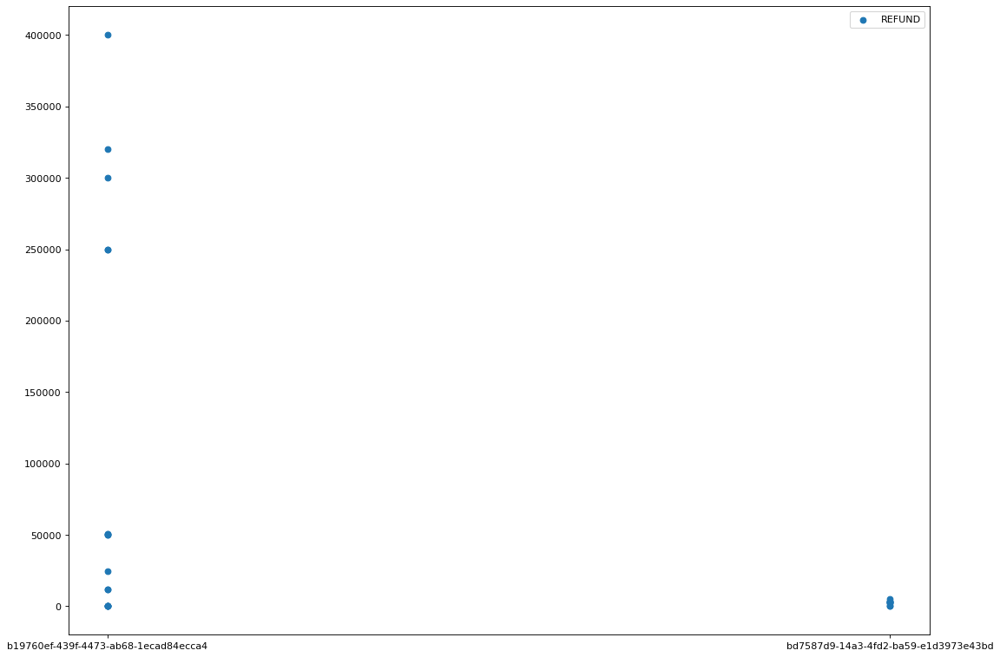

OTHER    26
Name: externalParty.transactionCategory, dtype: int64


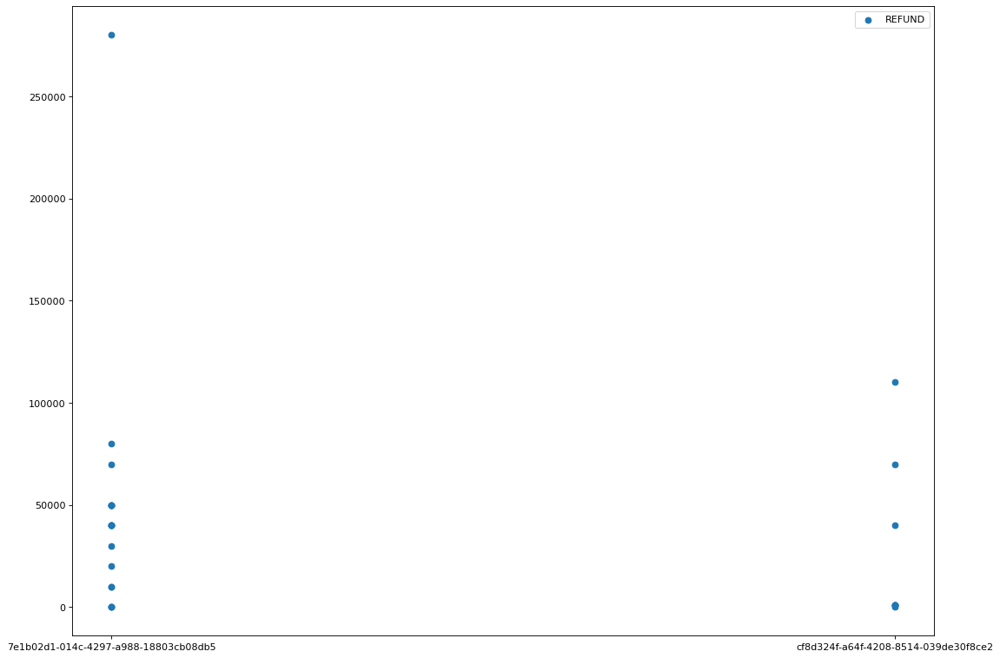

OTHER    26
Name: externalParty.transactionCategory, dtype: int64


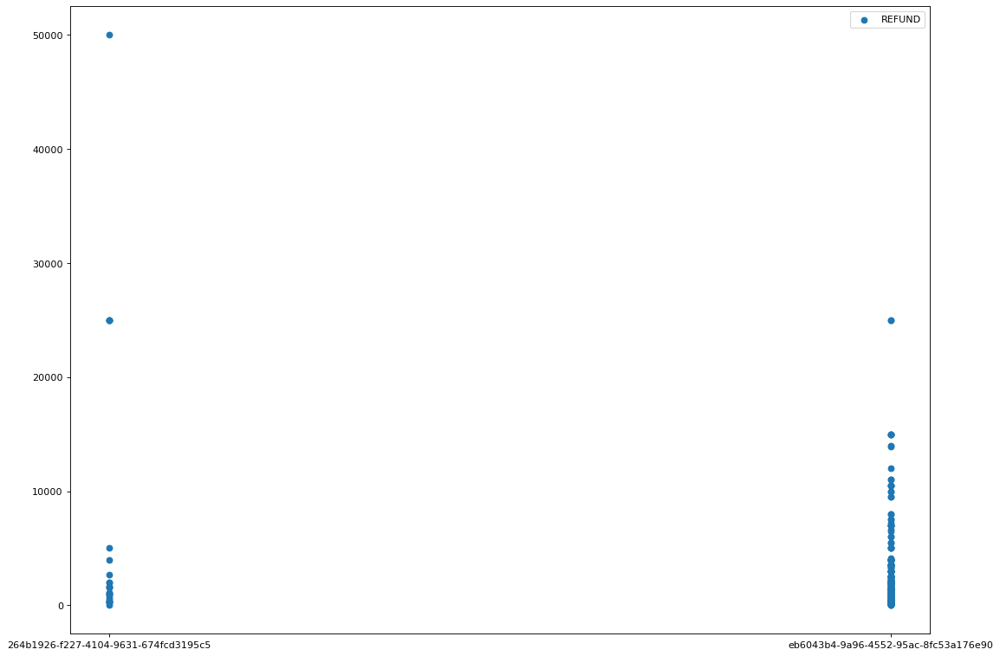

OTHER           201
TRAVEL           22
LIFESTYLE        19
GROCERIES        15
SHOPPING          3
SUBSCRIPTION      1
Name: externalParty.transactionCategory, dtype: int64


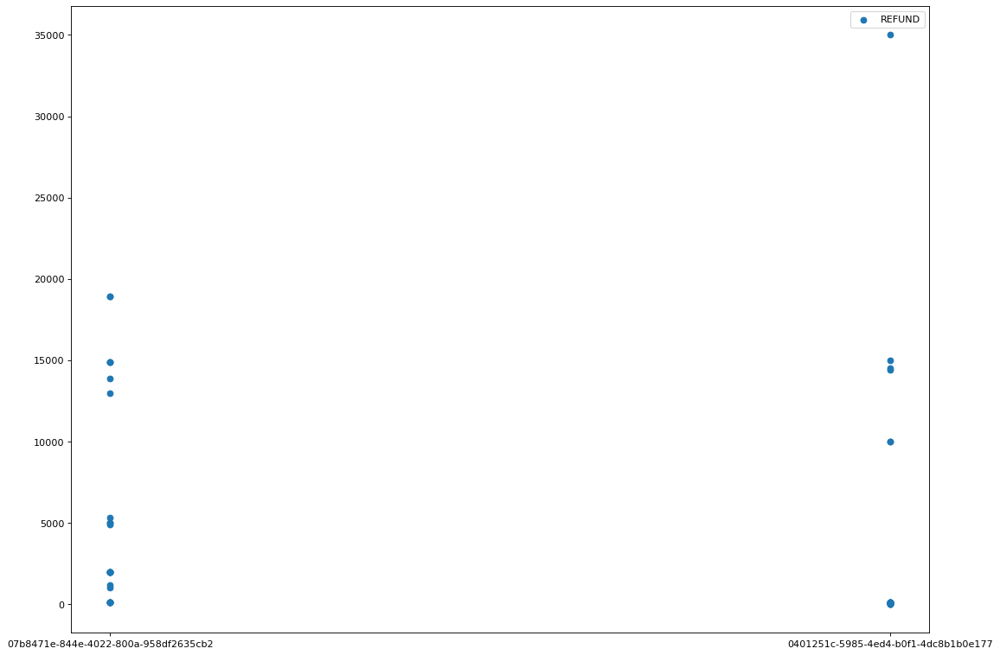

OTHER    46
Name: externalParty.transactionCategory, dtype: int64


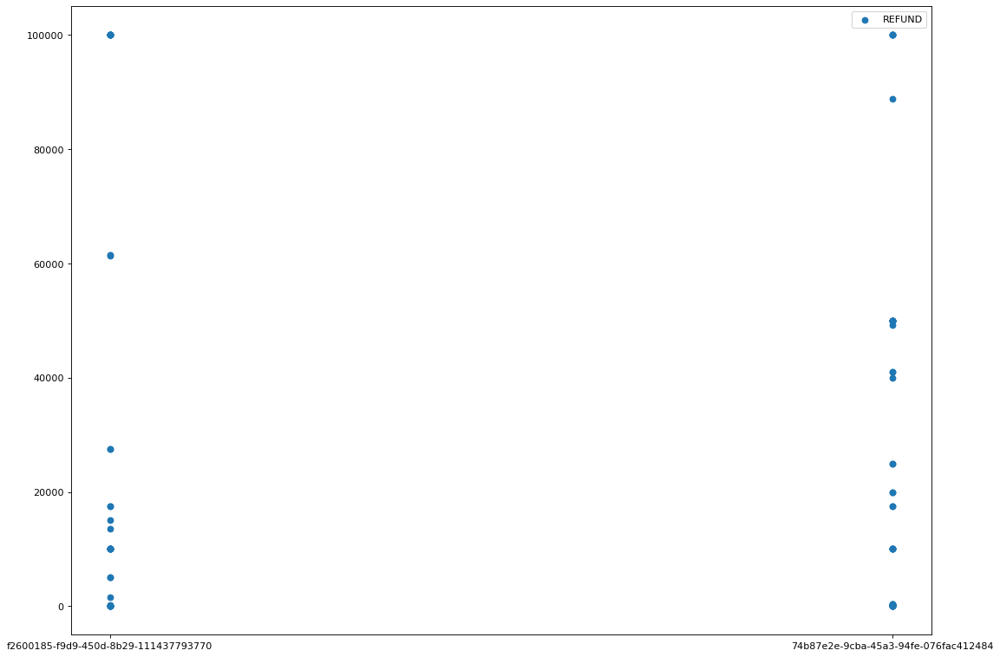

OTHER    80
Name: externalParty.transactionCategory, dtype: int64


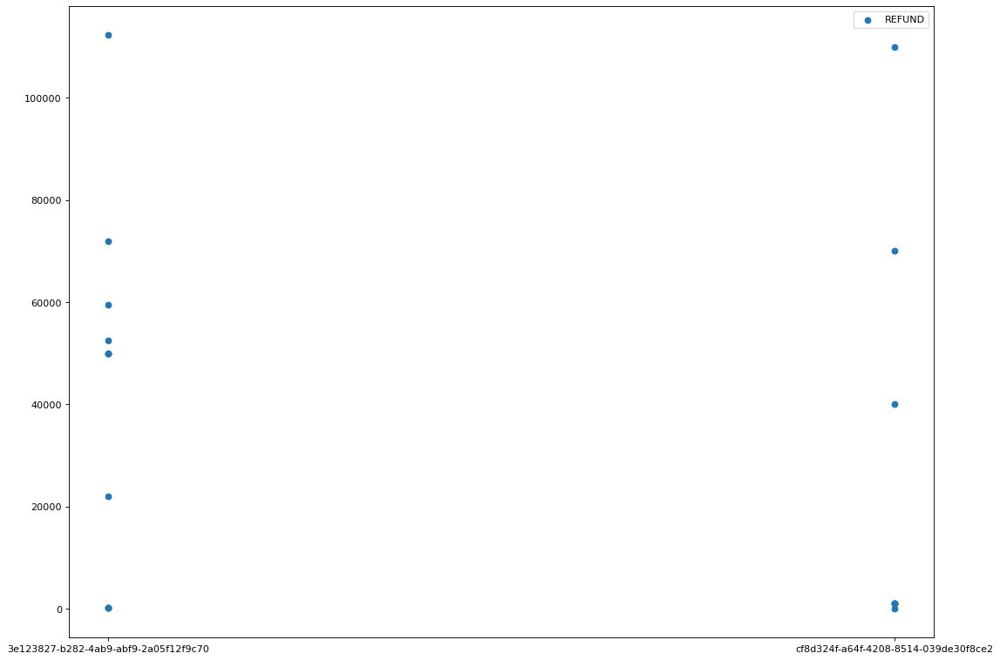

OTHER    19
Name: externalParty.transactionCategory, dtype: int64


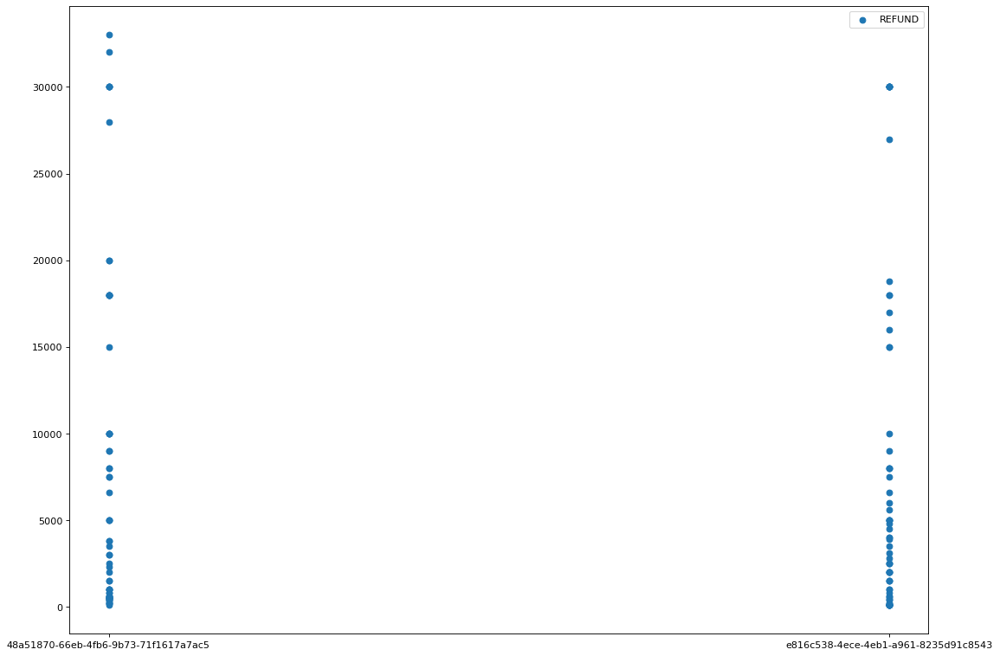

OTHER    126
Name: externalParty.transactionCategory, dtype: int64


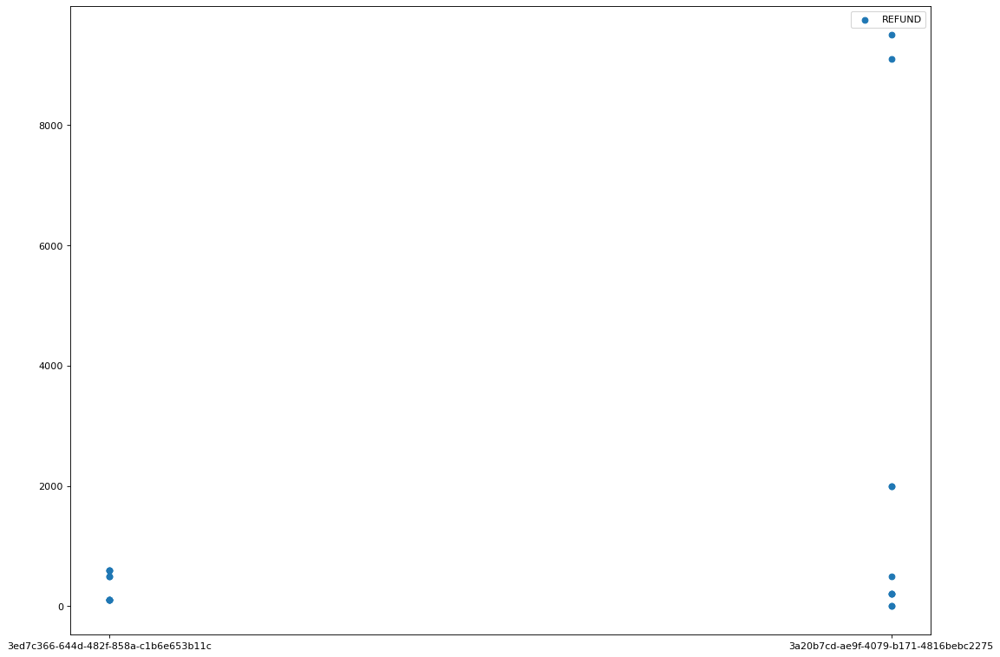

OTHER    20
Name: externalParty.transactionCategory, dtype: int64


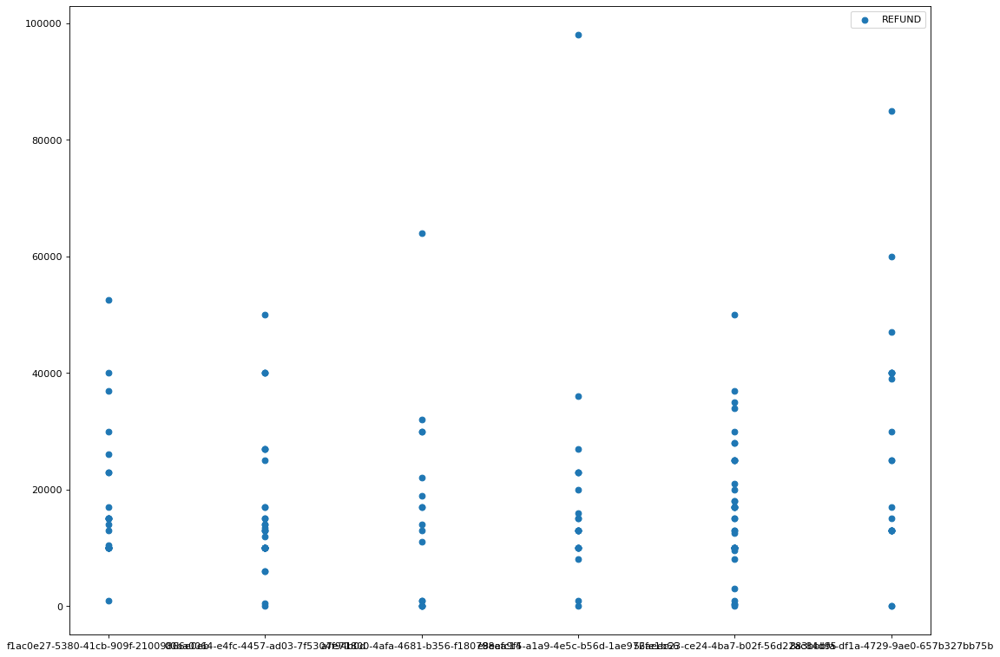

OTHER    161
Name: externalParty.transactionCategory, dtype: int64


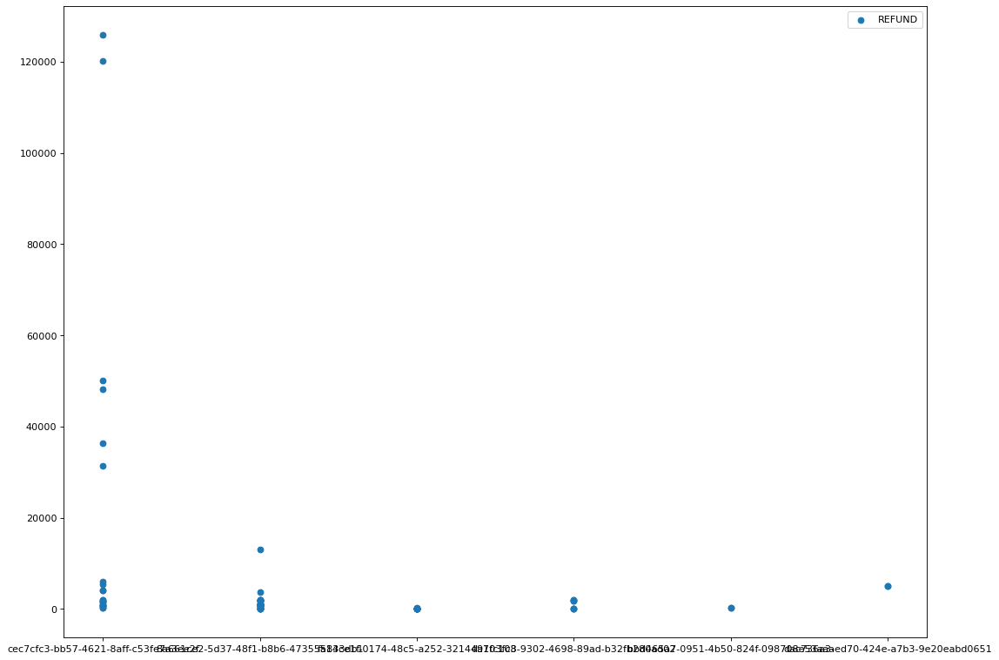

OTHER        72
LIFESTYLE     1
Name: externalParty.transactionCategory, dtype: int64


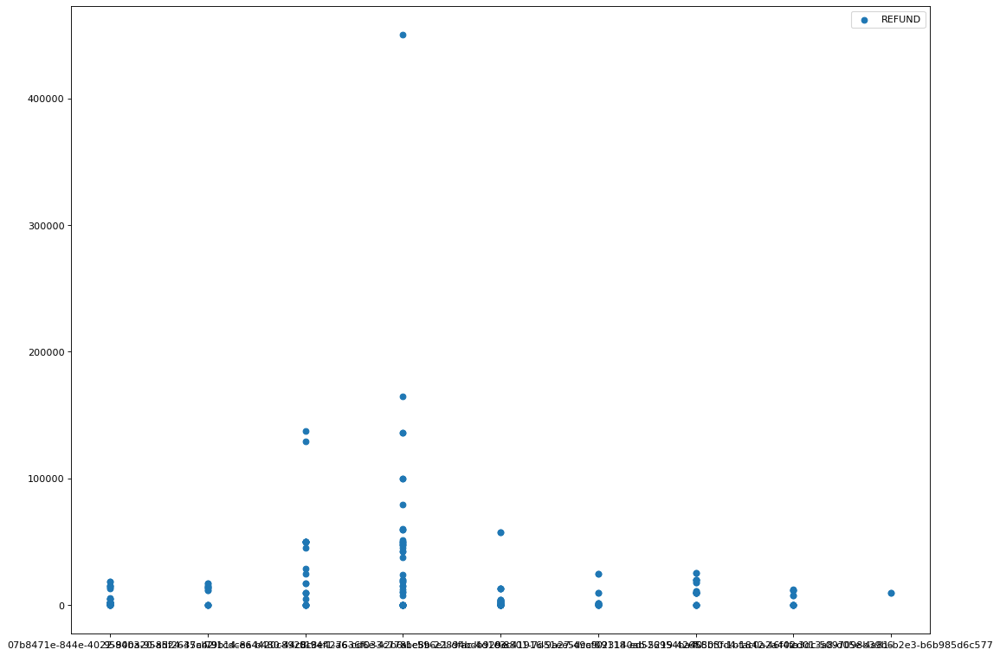

OTHER    202
Name: externalParty.transactionCategory, dtype: int64


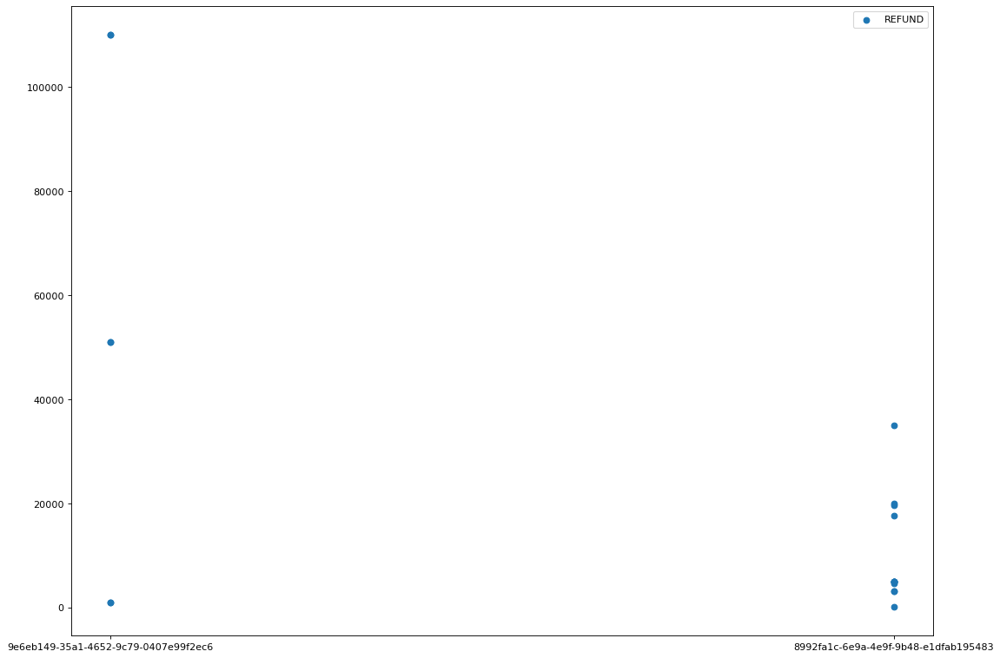

OTHER    19
Name: externalParty.transactionCategory, dtype: int64


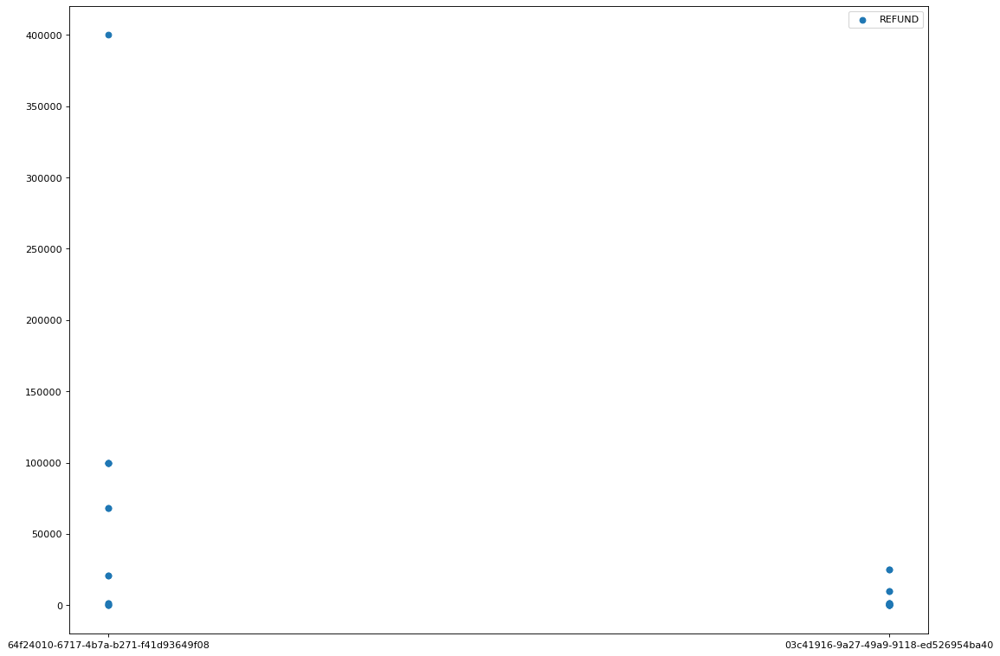

OTHER    28
Name: externalParty.transactionCategory, dtype: int64


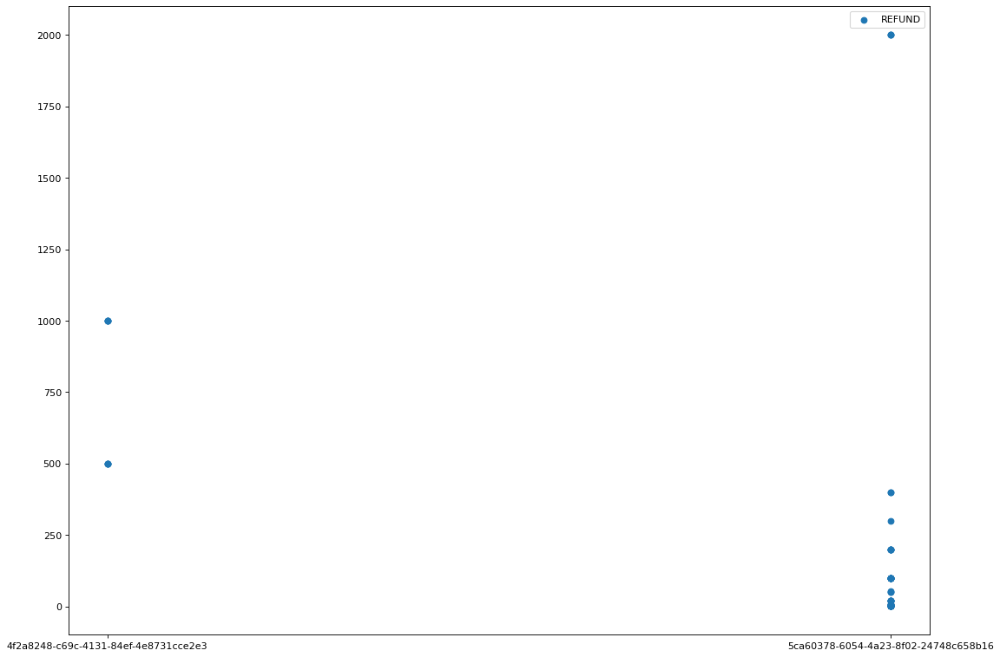

OTHER    73
Name: externalParty.transactionCategory, dtype: int64


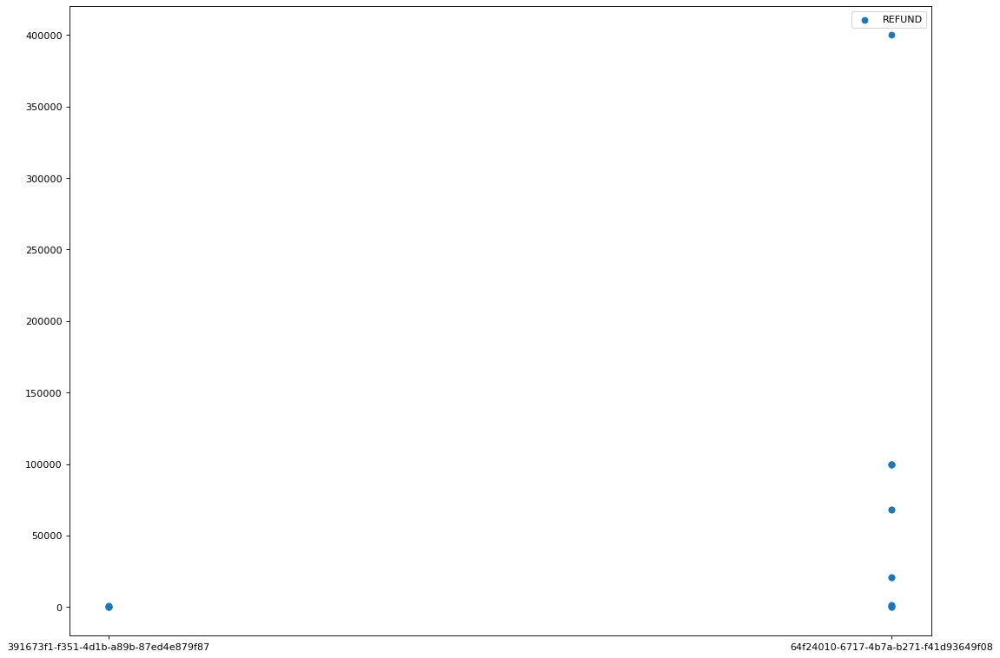

OTHER    20
Name: externalParty.transactionCategory, dtype: int64


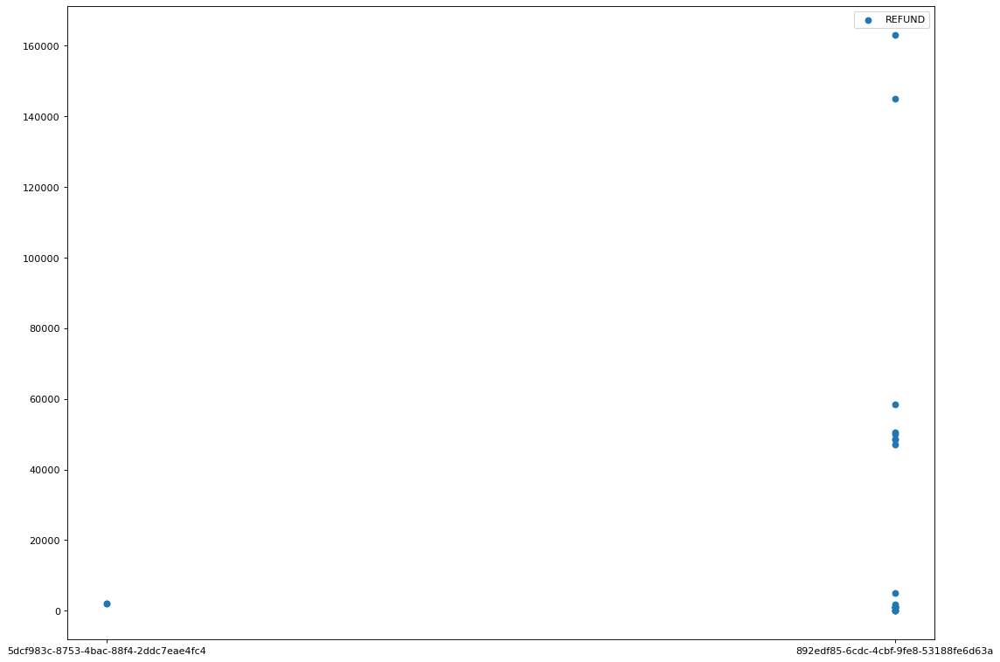

OTHER    22
Name: externalParty.transactionCategory, dtype: int64


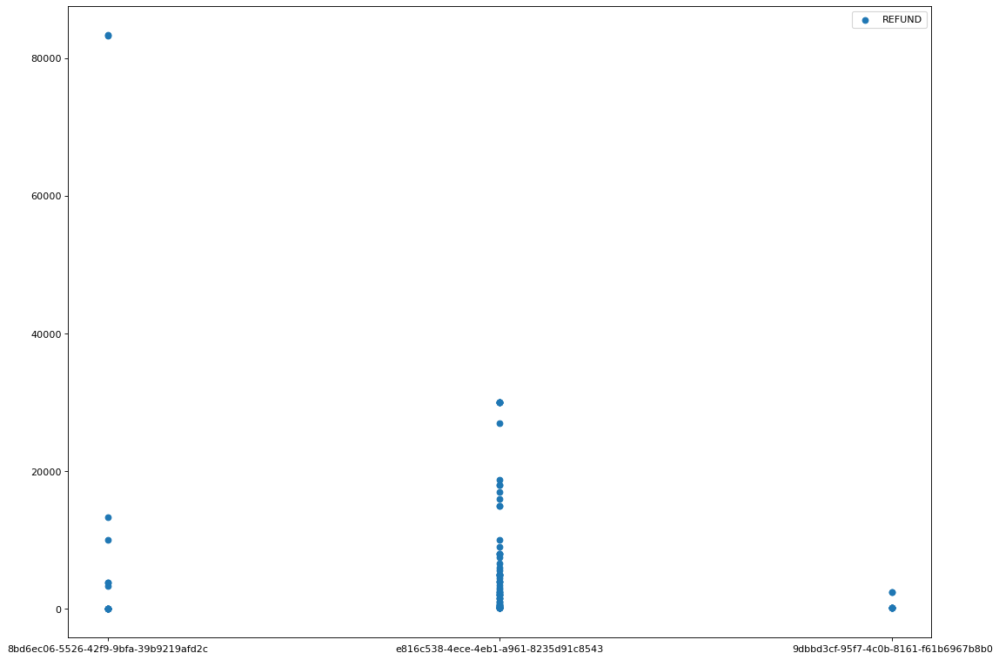

OTHER    87
Name: externalParty.transactionCategory, dtype: int64


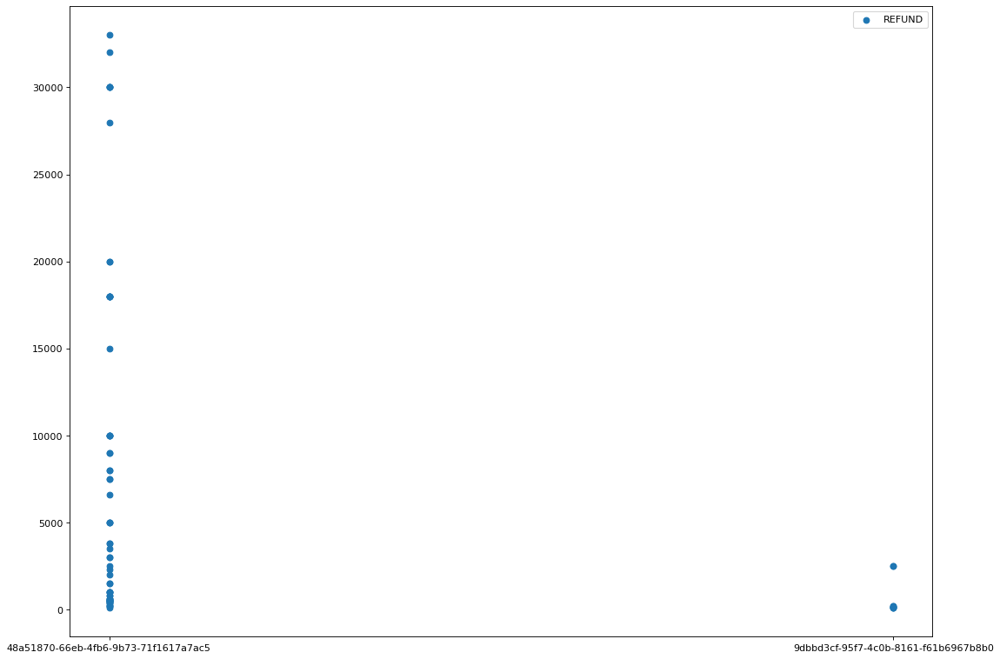

OTHER    72
Name: externalParty.transactionCategory, dtype: int64


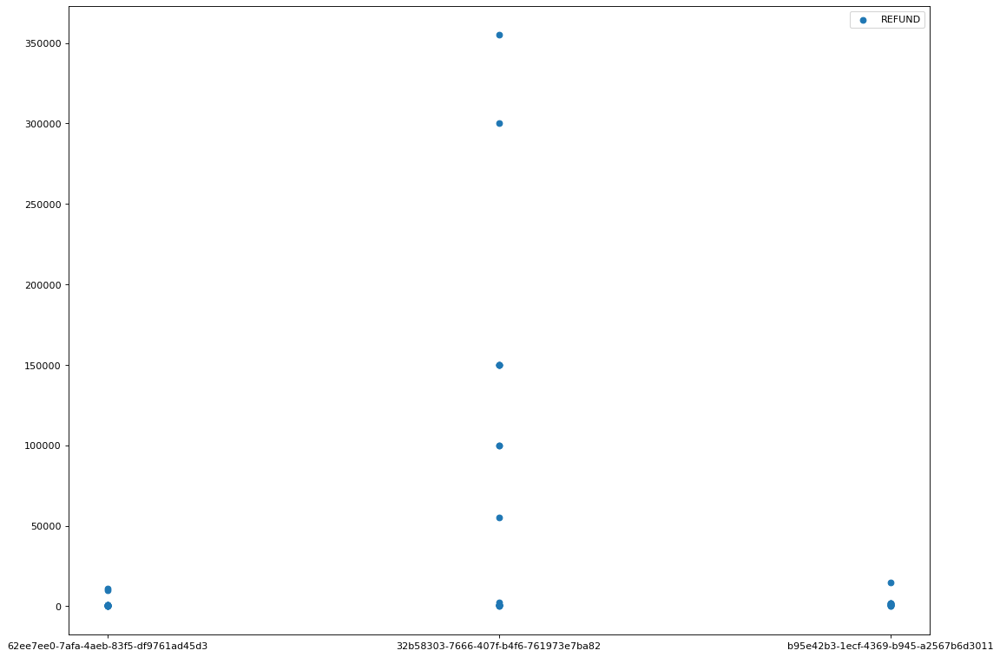

OTHER    44
Name: externalParty.transactionCategory, dtype: int64


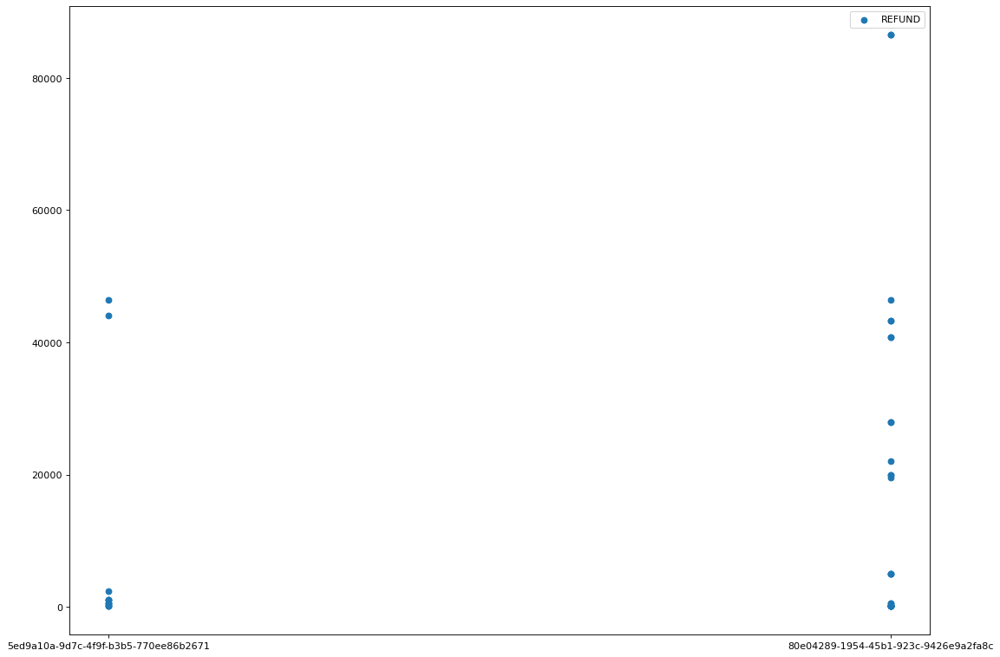

OTHER       38
SHOPPING     1
Name: externalParty.transactionCategory, dtype: int64


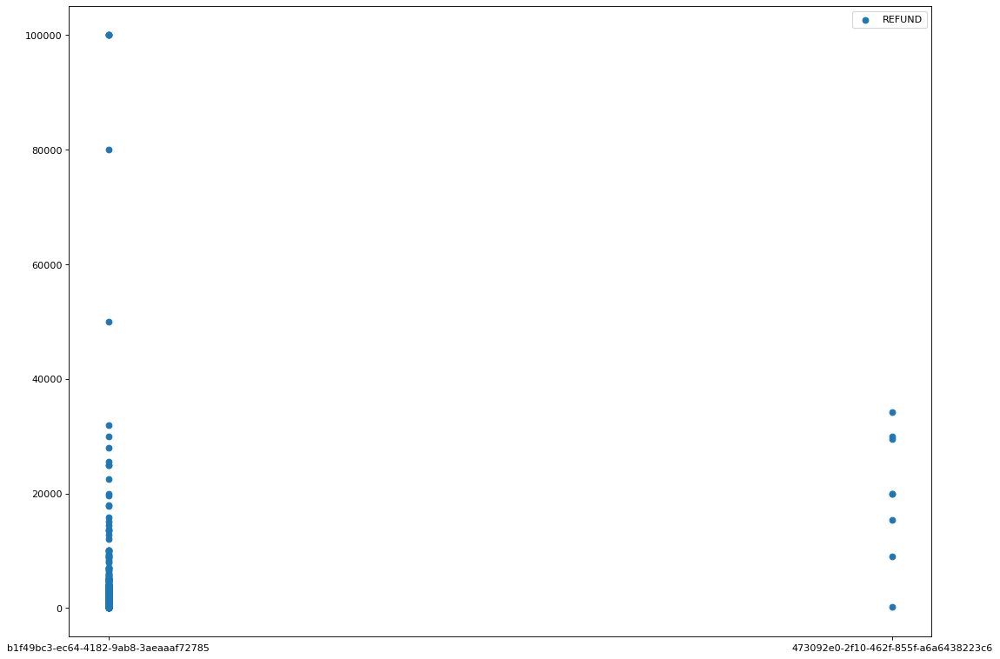

OTHER        112
TRAVEL        97
LIFESTYLE     64
GROCERIES     27
SHOPPING      22
Name: externalParty.transactionCategory, dtype: int64


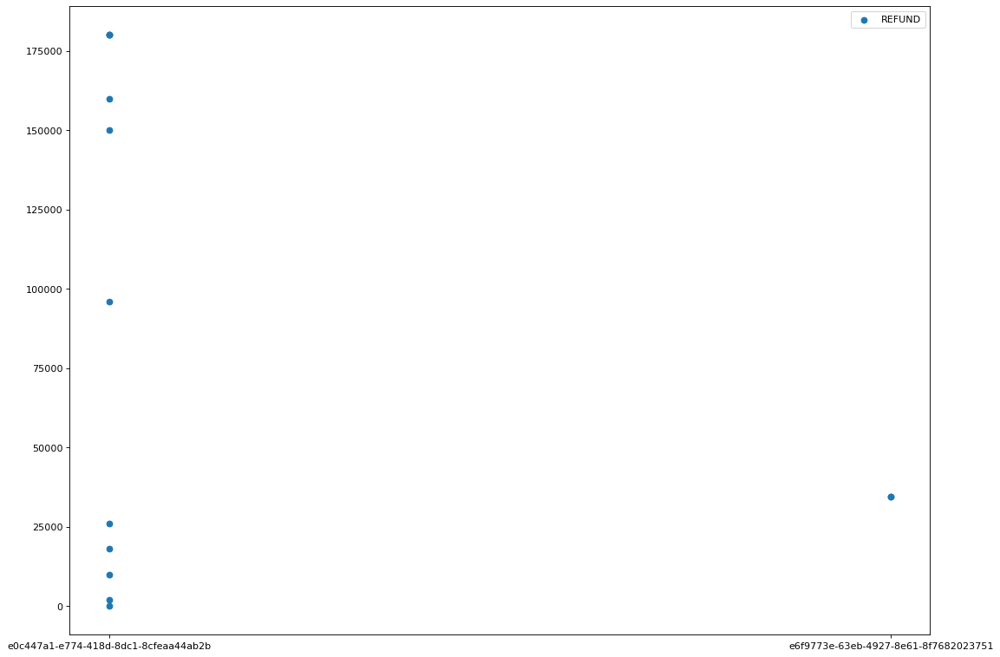

OTHER    13
Name: externalParty.transactionCategory, dtype: int64


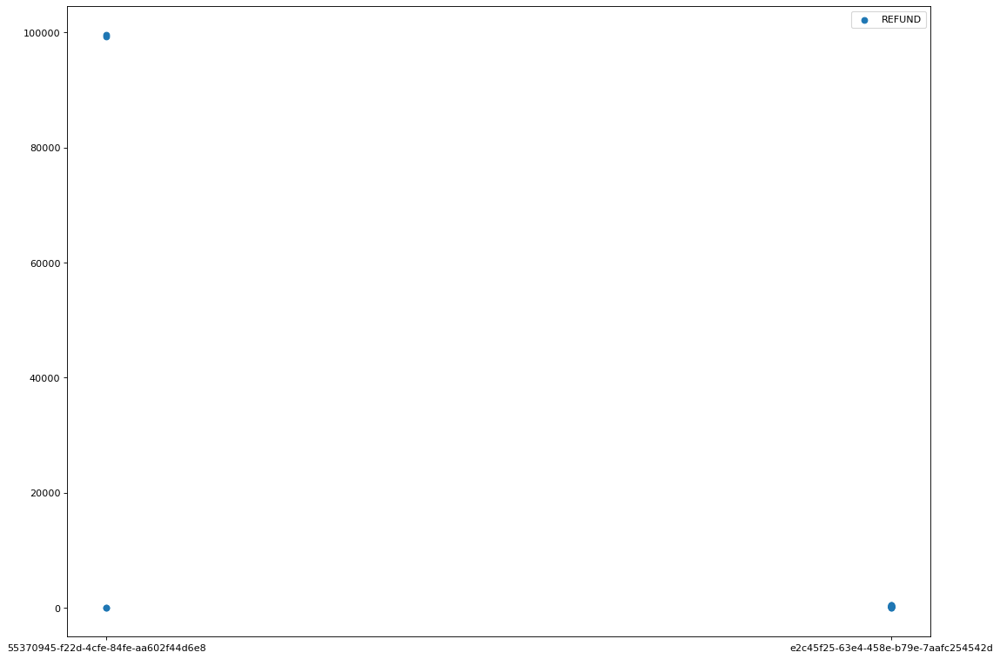

OTHER           17
SUBSCRIPTION     2
GROCERIES        1
TRAVEL           1
Name: externalParty.transactionCategory, dtype: int64


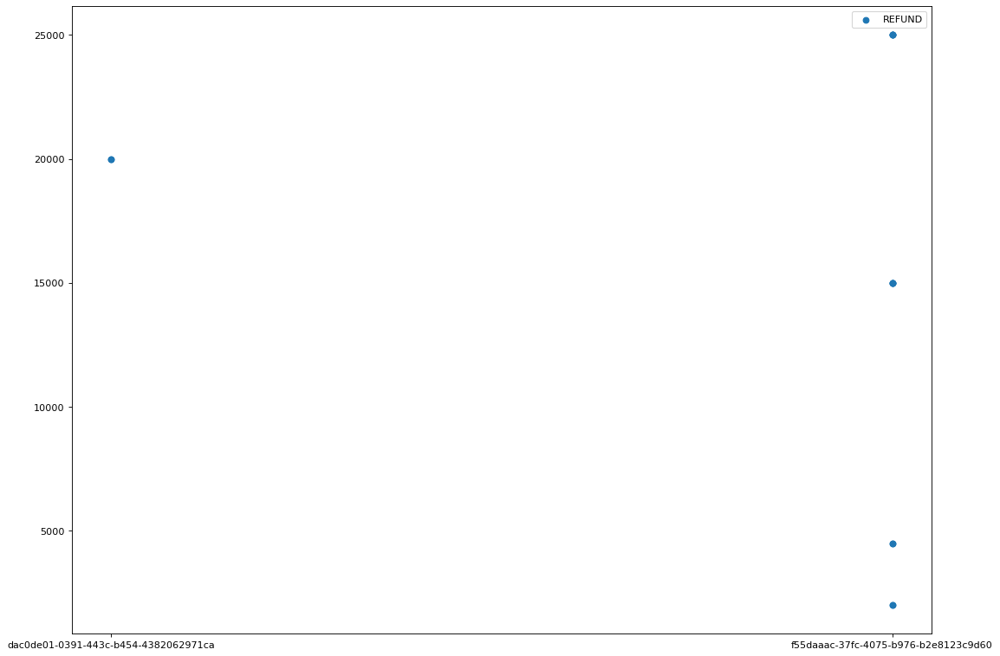

OTHER    14
Name: externalParty.transactionCategory, dtype: int64


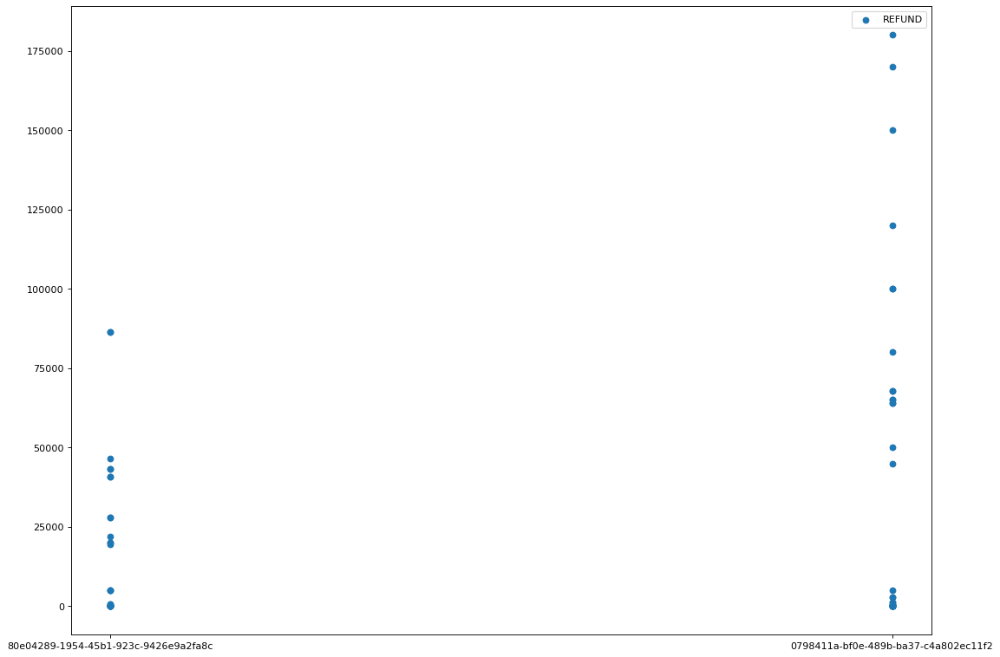

OTHER       74
SHOPPING     1
Name: externalParty.transactionCategory, dtype: int64


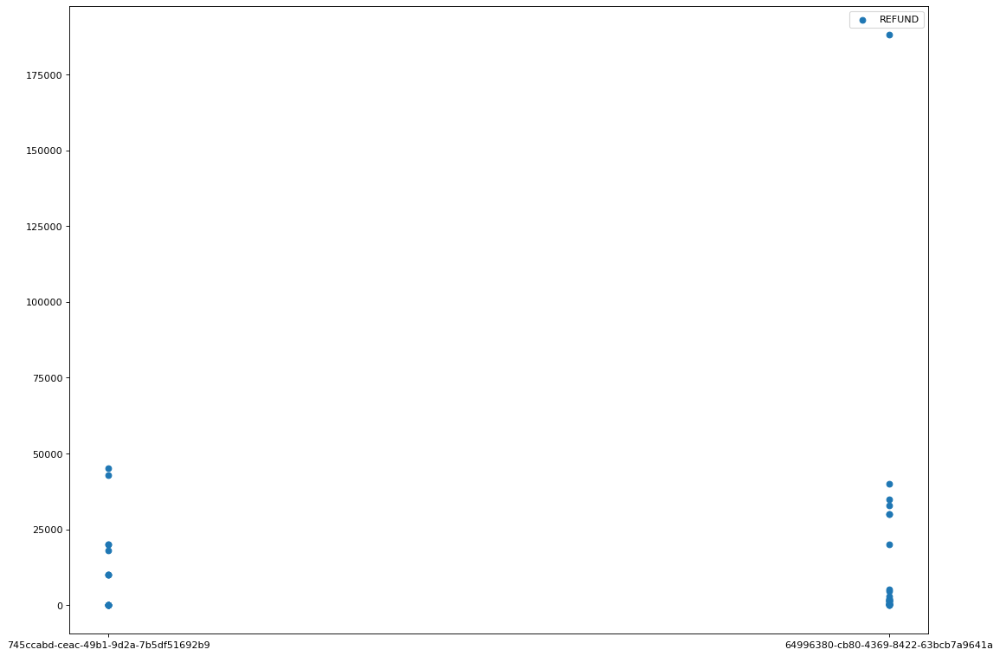

OTHER        38
LIFESTYLE     2
SHOPPING      1
Name: externalParty.transactionCategory, dtype: int64


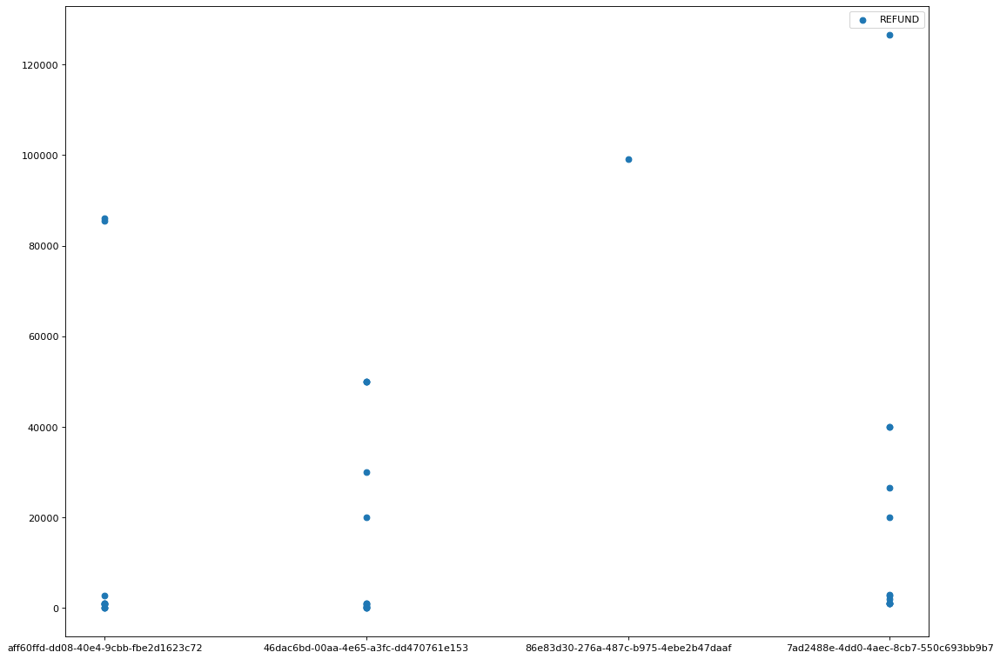

OTHER    37
Name: externalParty.transactionCategory, dtype: int64


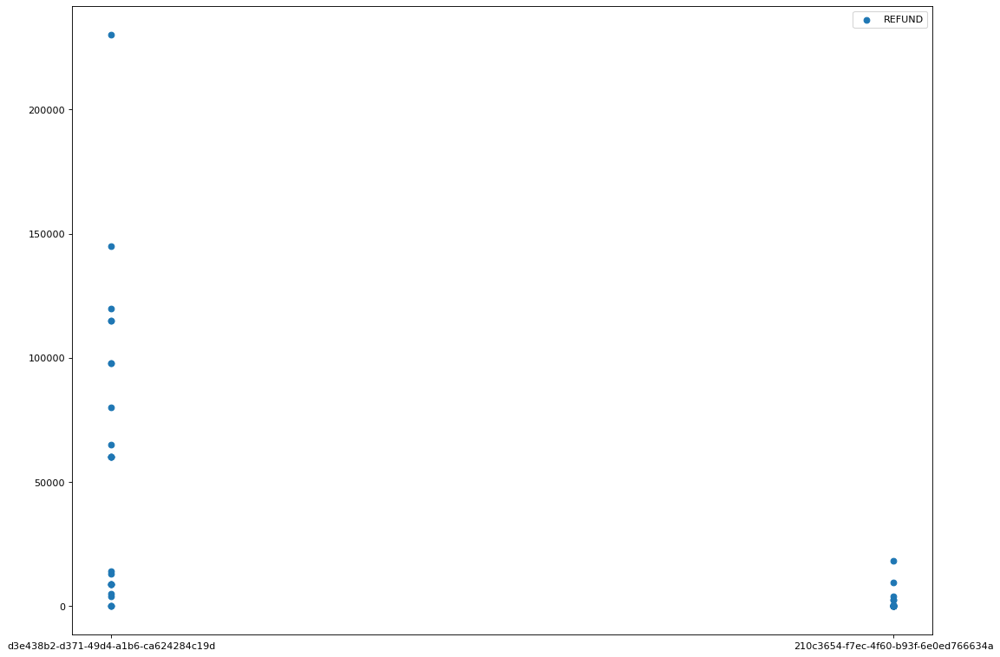

OTHER        61
GROCERIES     3
SHOPPING      2
Name: externalParty.transactionCategory, dtype: int64


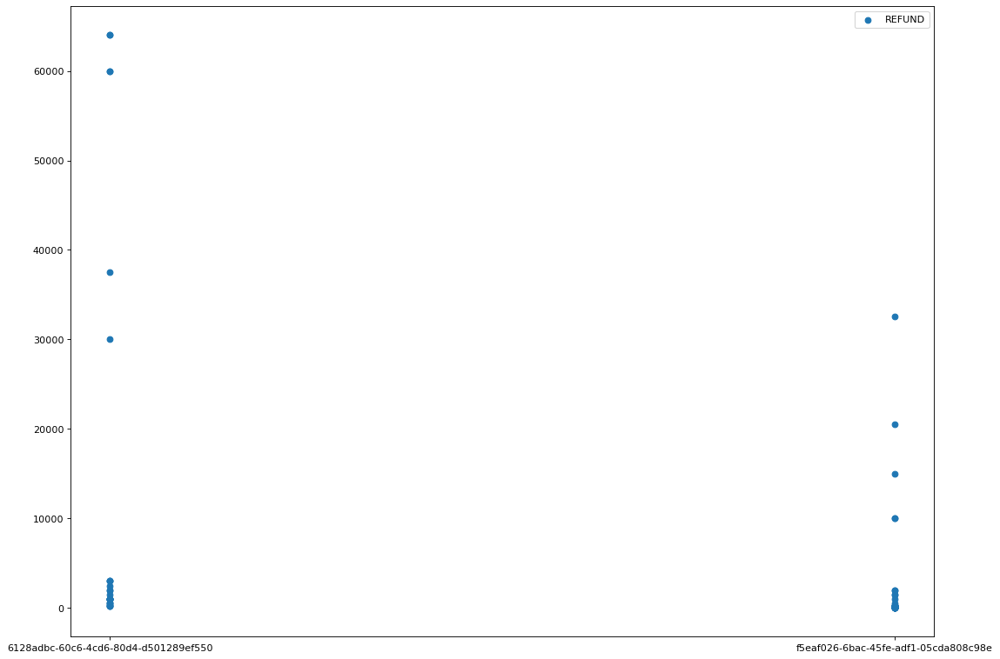

OTHER        52
LIFESTYLE     5
GROCERIES     3
SHOPPING      1
Name: externalParty.transactionCategory, dtype: int64


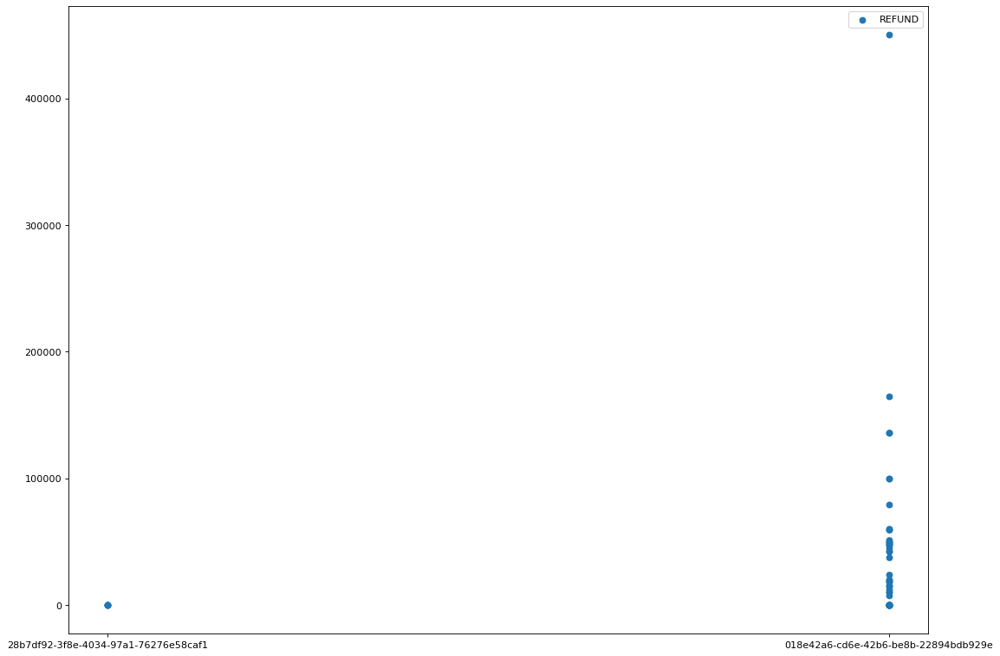

OTHER    56
Name: externalParty.transactionCategory, dtype: int64


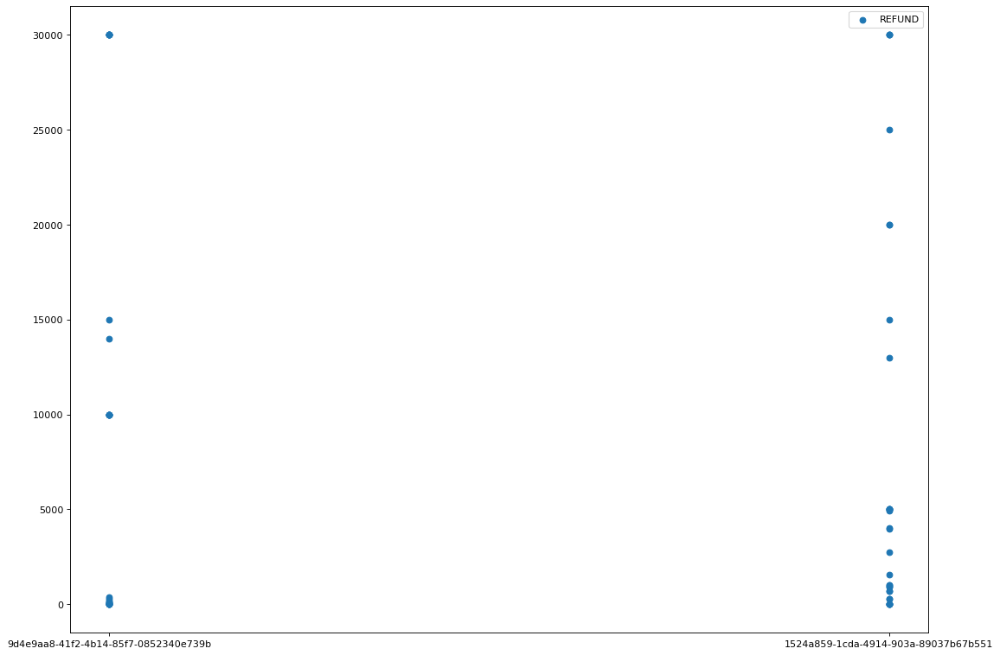

OTHER        47
GROCERIES     6
LIFESTYLE     4
Name: externalParty.transactionCategory, dtype: int64


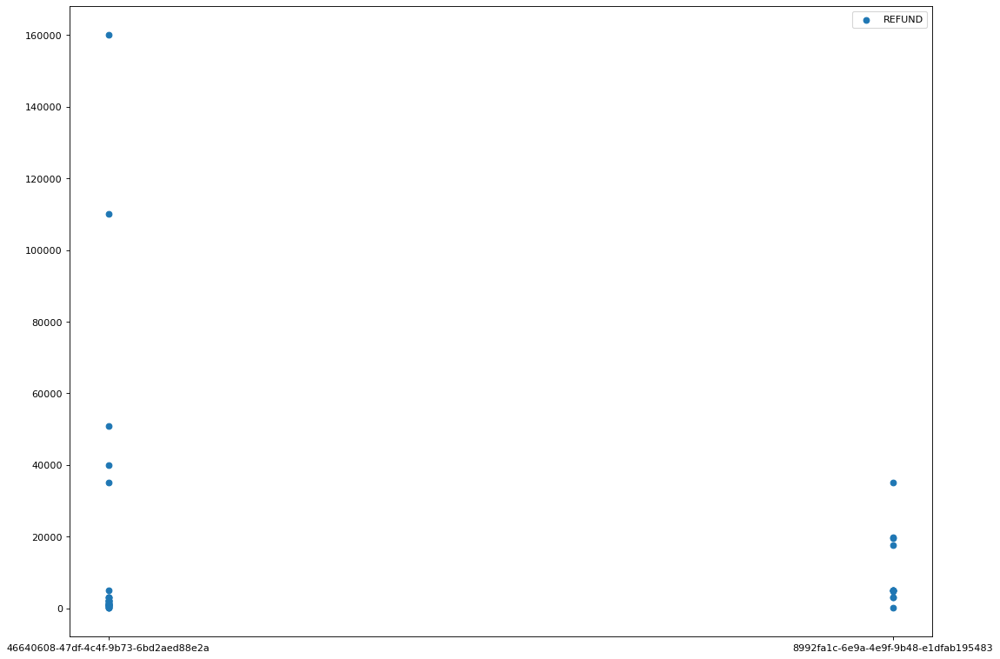

OTHER        34
TRAVEL        4
LIFESTYLE     3
GROCERIES     1
Name: externalParty.transactionCategory, dtype: int64


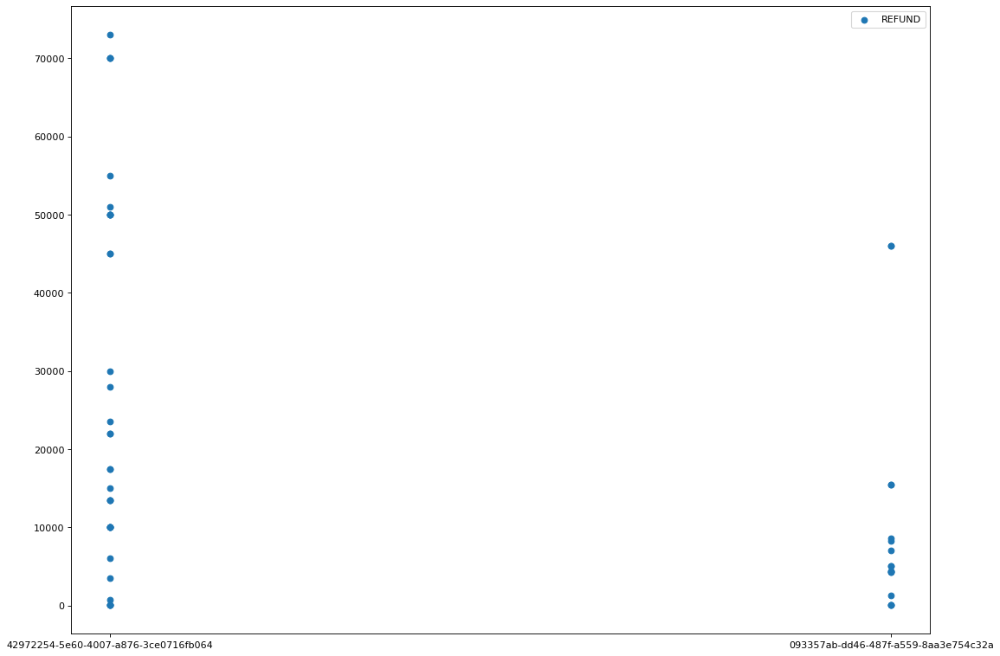

OTHER    52
Name: externalParty.transactionCategory, dtype: int64


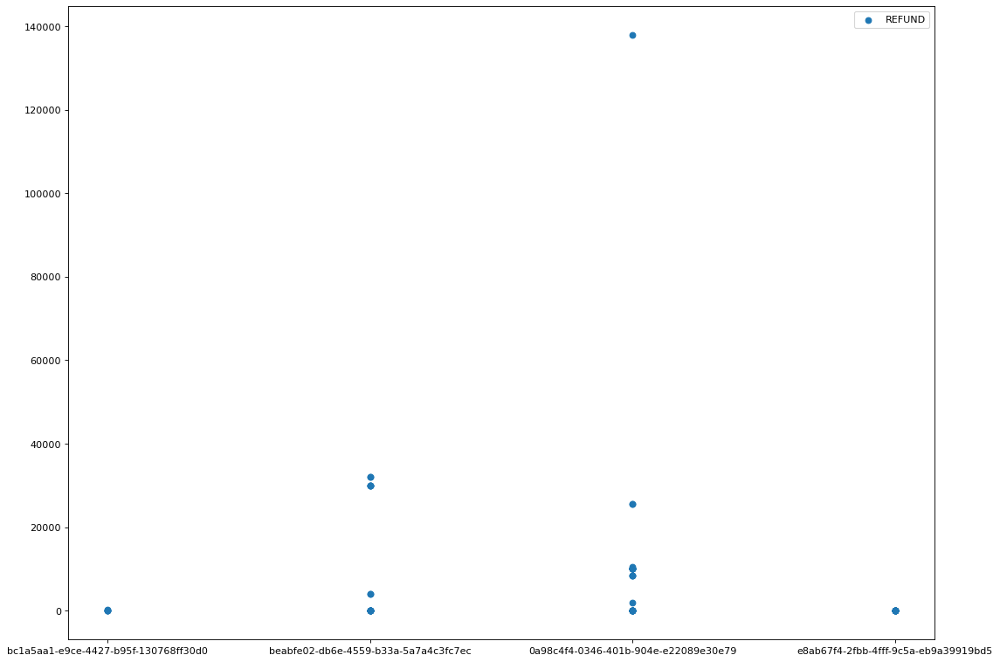

OTHER    62
Name: externalParty.transactionCategory, dtype: int64


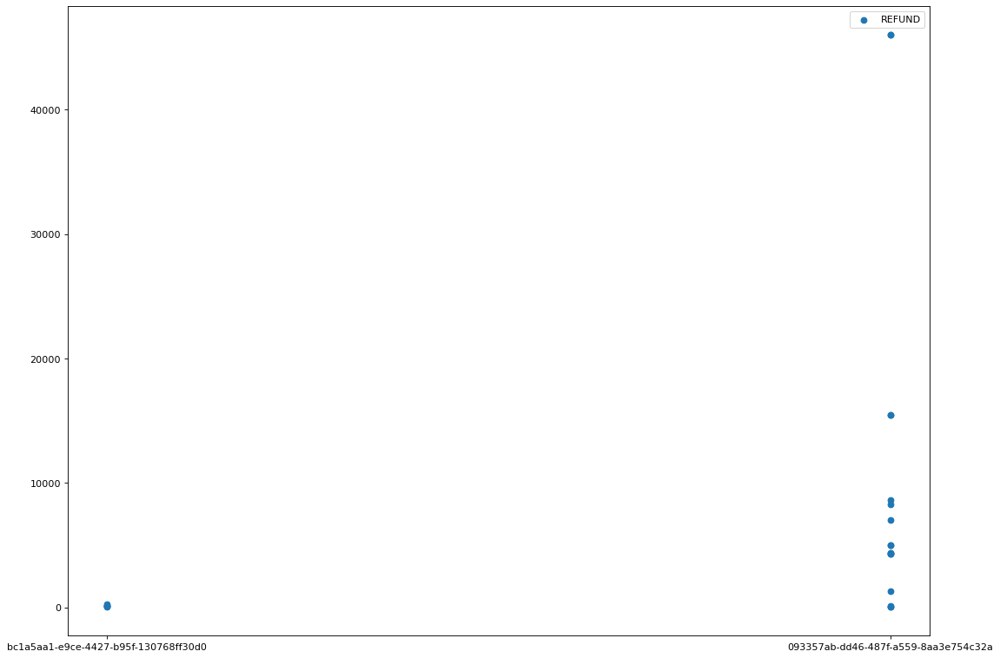

OTHER    22
Name: externalParty.transactionCategory, dtype: int64


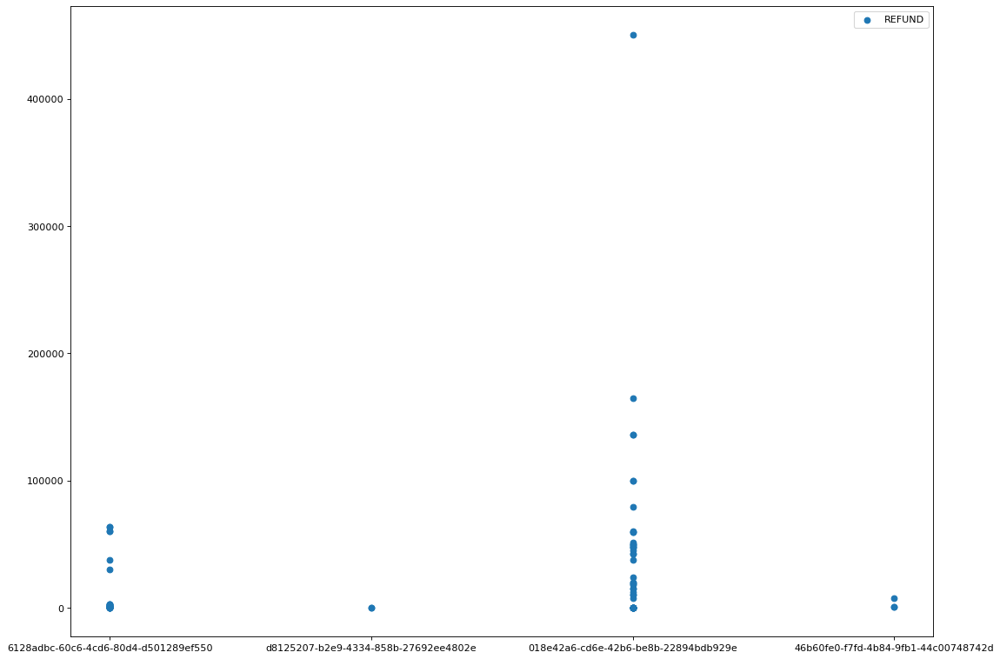

OTHER        76
LIFESTYLE     4
GROCERIES     3
SHOPPING      1
Name: externalParty.transactionCategory, dtype: int64


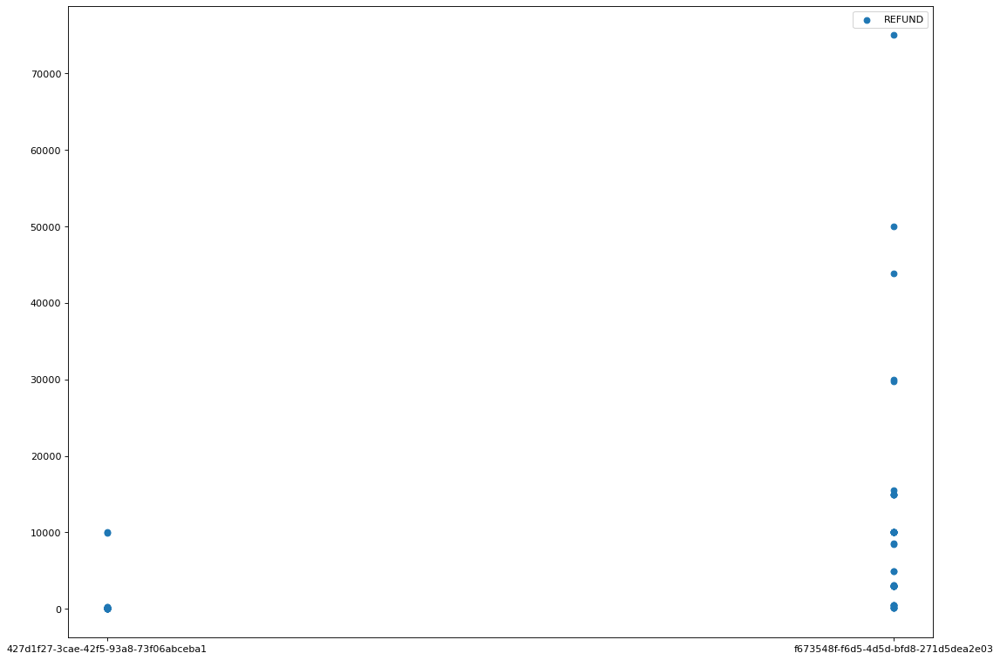

OTHER    64
Name: externalParty.transactionCategory, dtype: int64


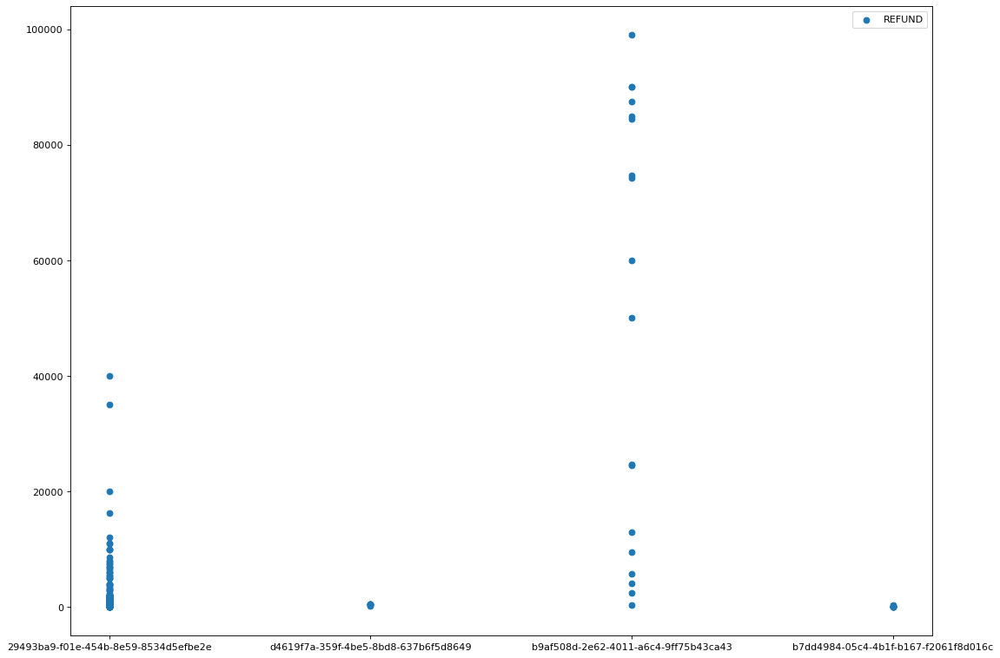

OTHER        174
GROCERIES     40
SHOPPING      32
LIFESTYLE      6
TRAVEL         5
Name: externalParty.transactionCategory, dtype: int64


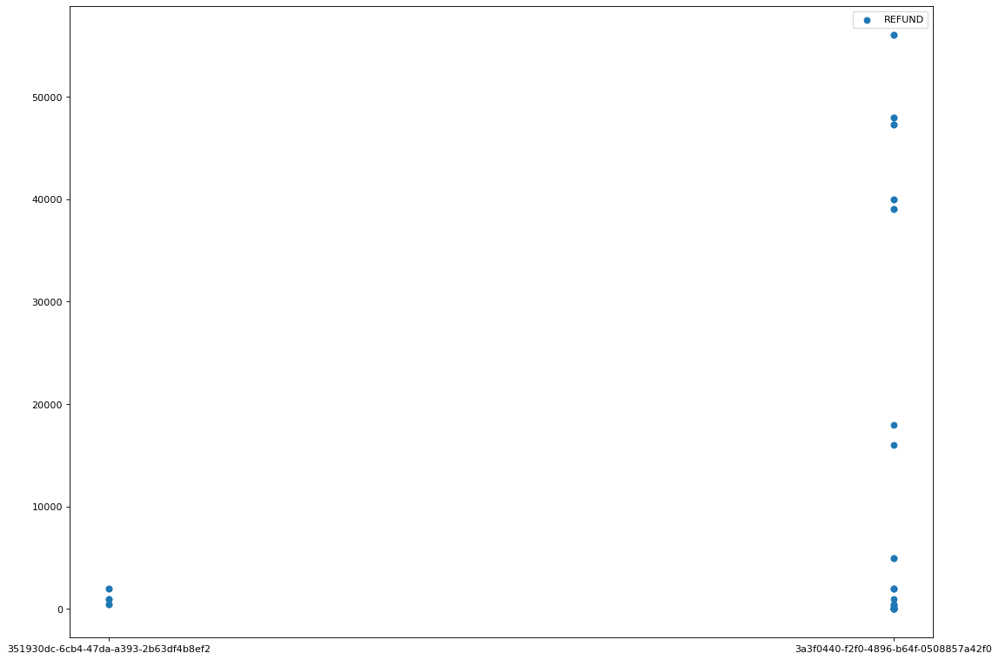

OTHER    35
Name: externalParty.transactionCategory, dtype: int64


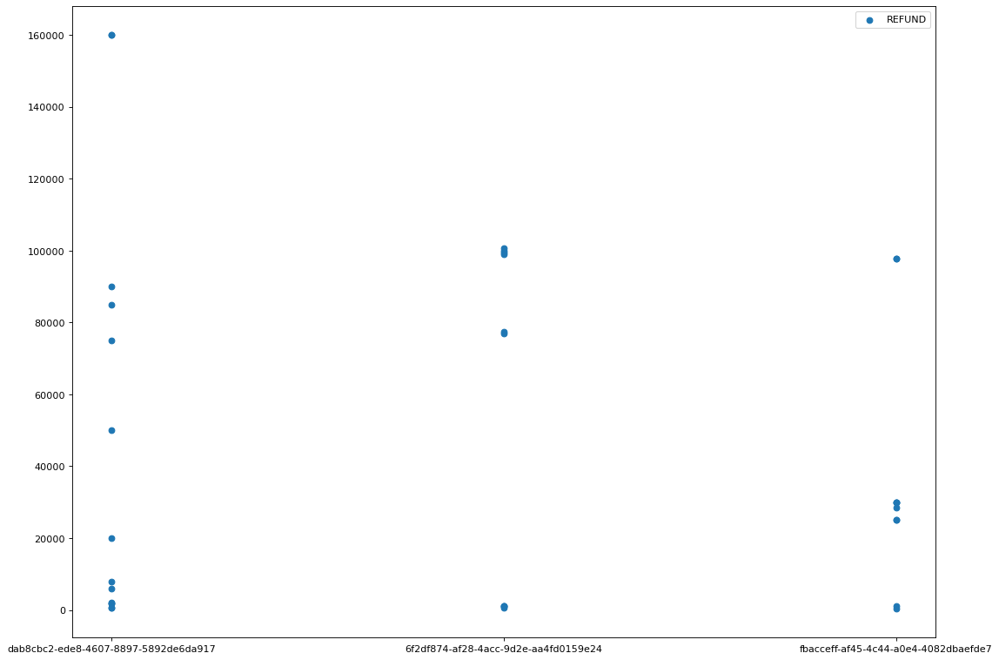

OTHER           33
SUBSCRIPTION     1
Name: externalParty.transactionCategory, dtype: int64


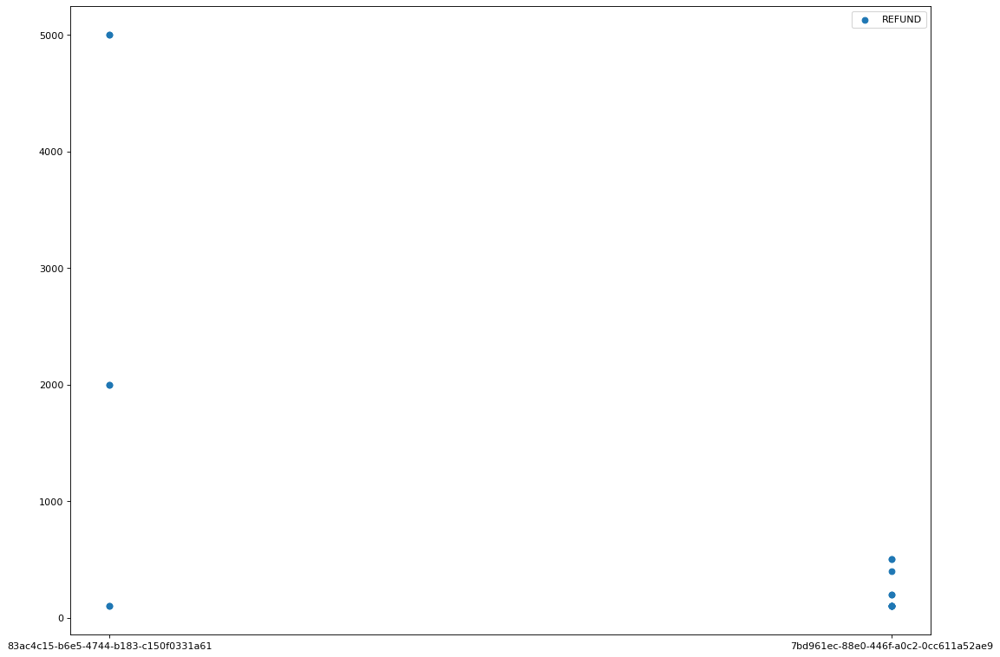

OTHER    17
Name: externalParty.transactionCategory, dtype: int64


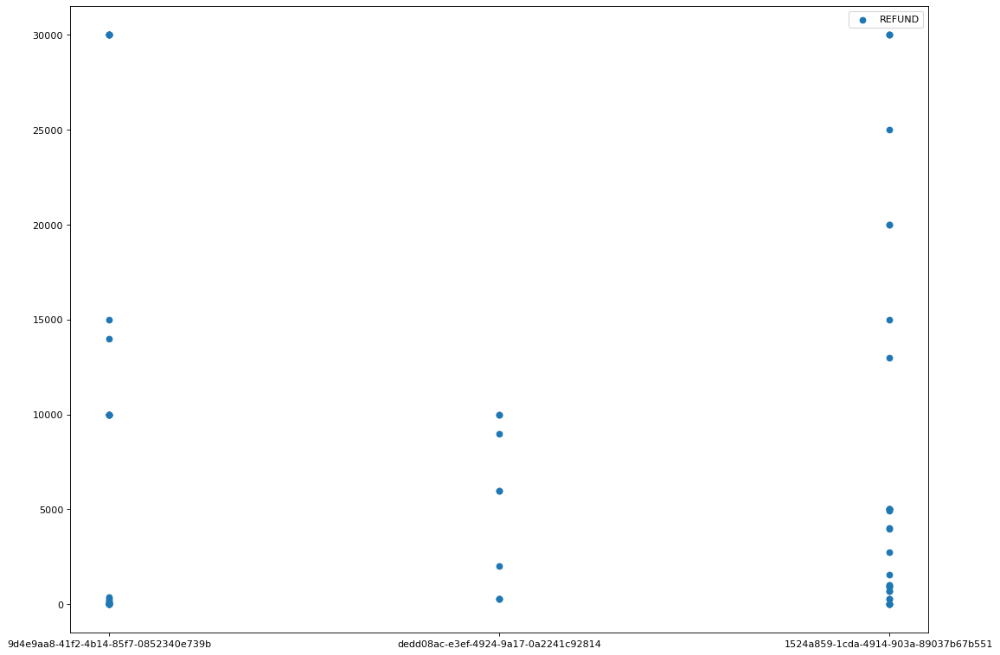

OTHER        55
GROCERIES     6
LIFESTYLE     5
Name: externalParty.transactionCategory, dtype: int64


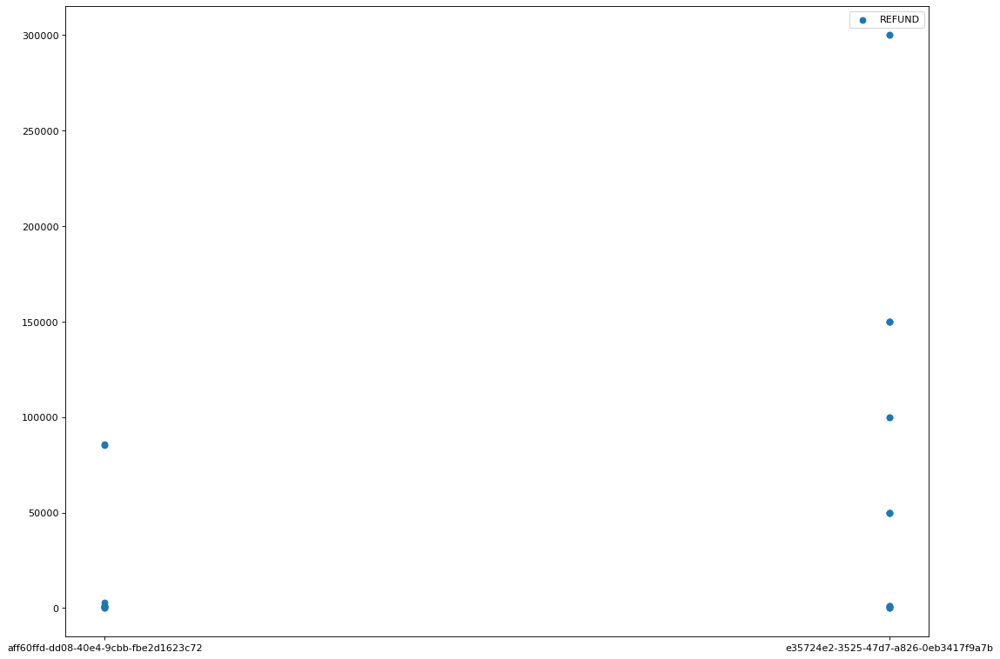

OTHER    30
Name: externalParty.transactionCategory, dtype: int64


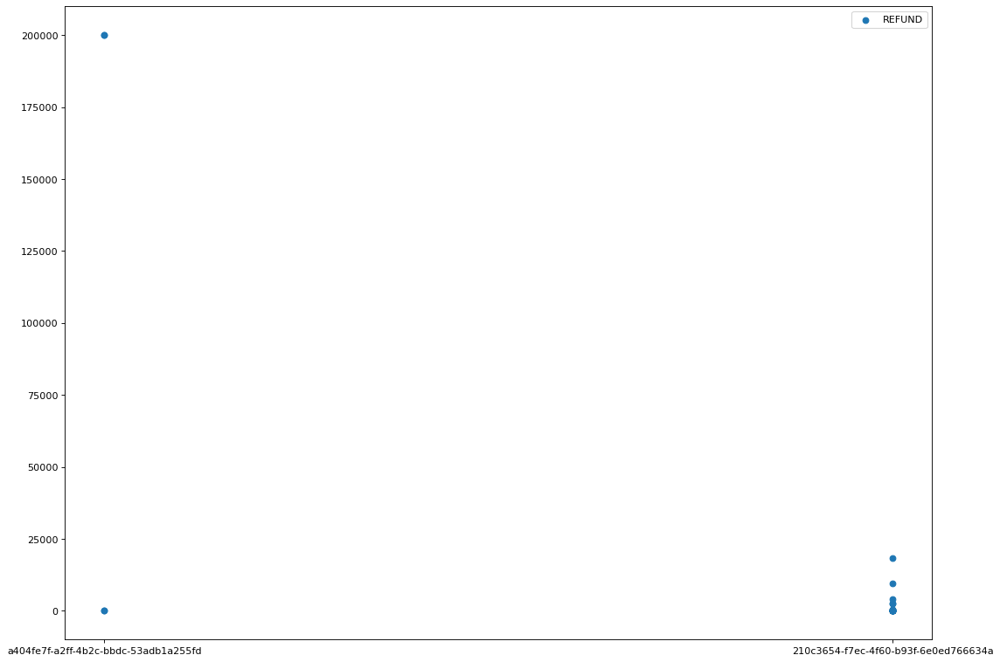

OTHER        41
GROCERIES     3
SHOPPING      2
Name: externalParty.transactionCategory, dtype: int64


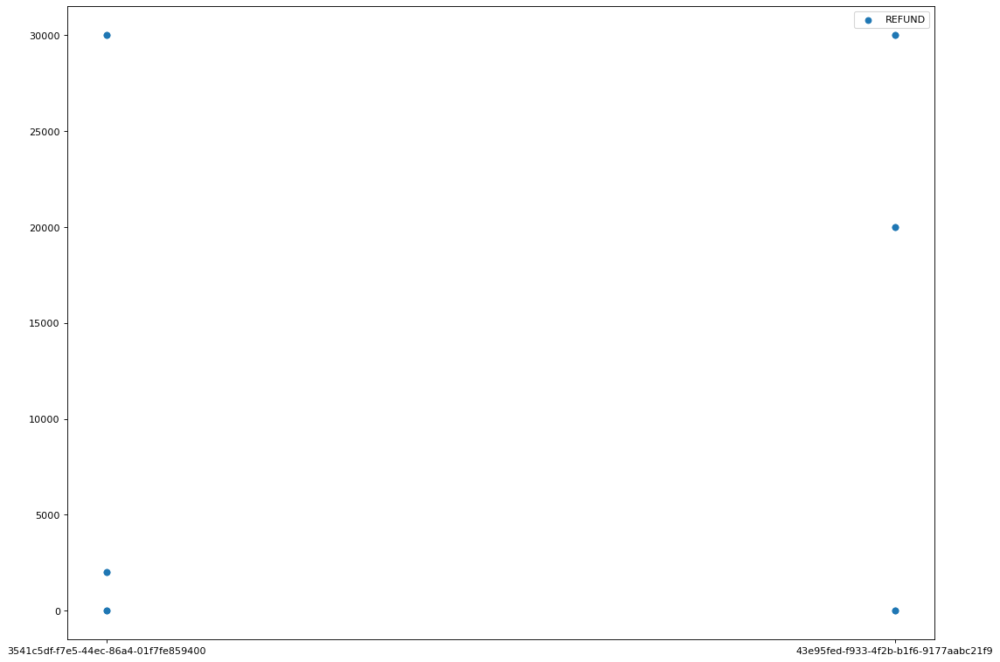

OTHER    12
Name: externalParty.transactionCategory, dtype: int64


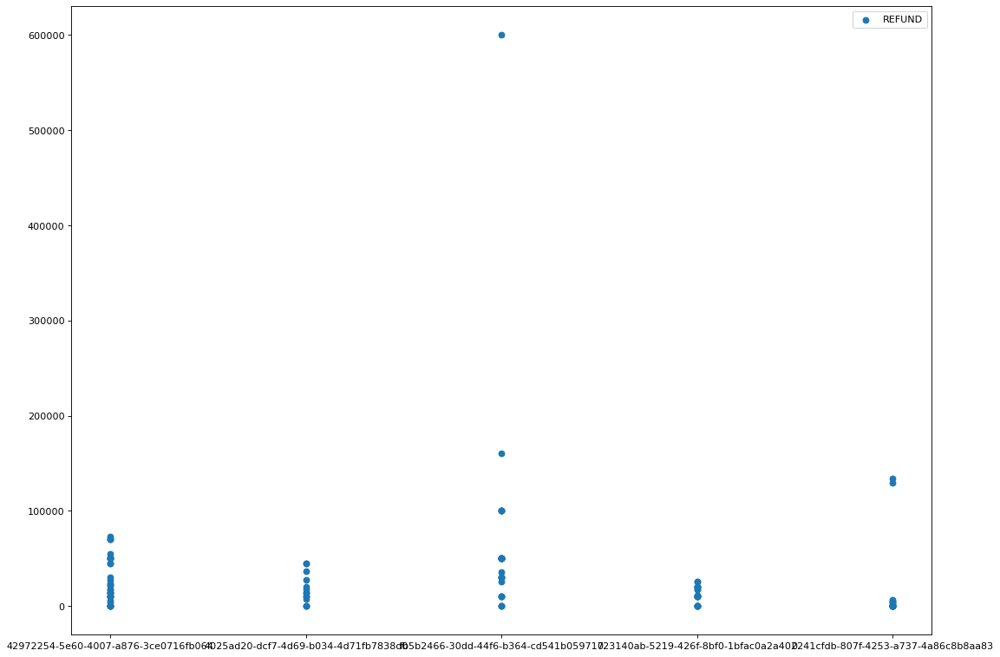

OTHER    123
Name: externalParty.transactionCategory, dtype: int64


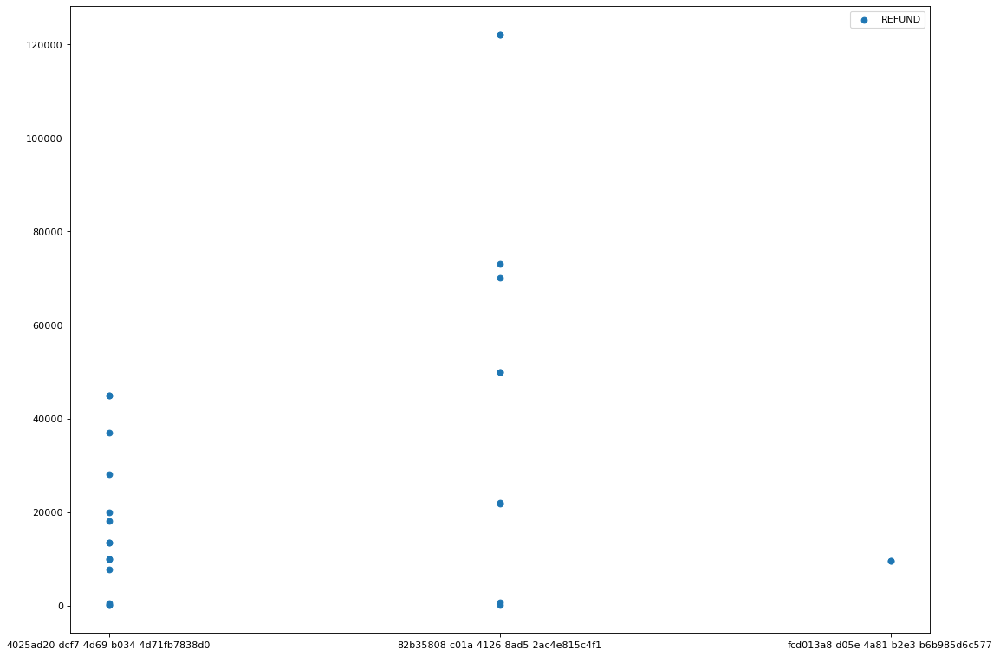

OTHER    26
Name: externalParty.transactionCategory, dtype: int64


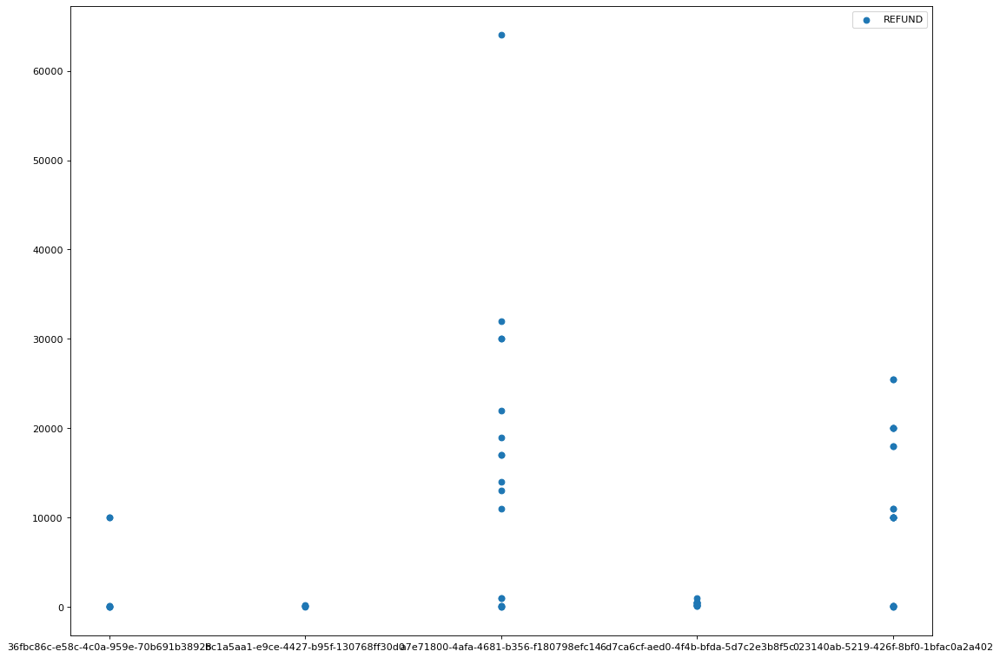

OTHER           61
GROCERIES        1
SUBSCRIPTION     1
Name: externalParty.transactionCategory, dtype: int64


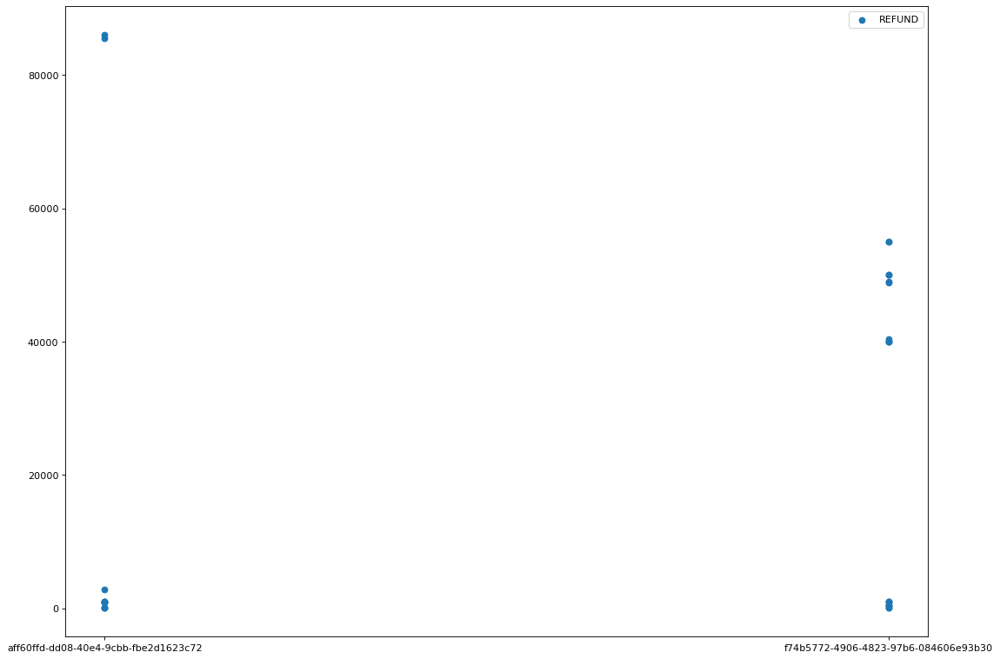

OTHER    29
Name: externalParty.transactionCategory, dtype: int64


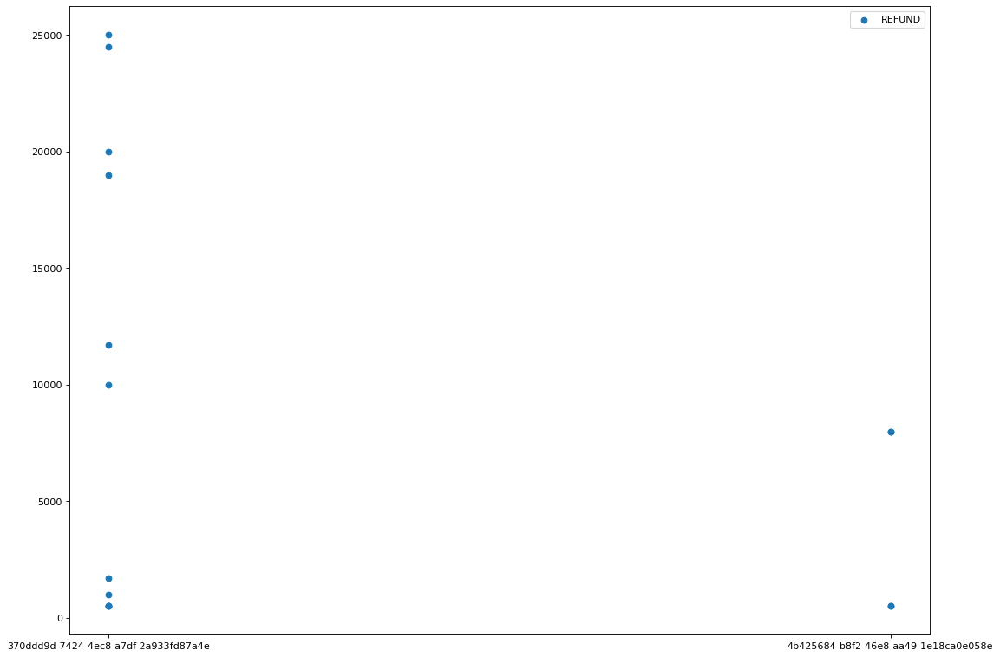

OTHER    15
Name: externalParty.transactionCategory, dtype: int64


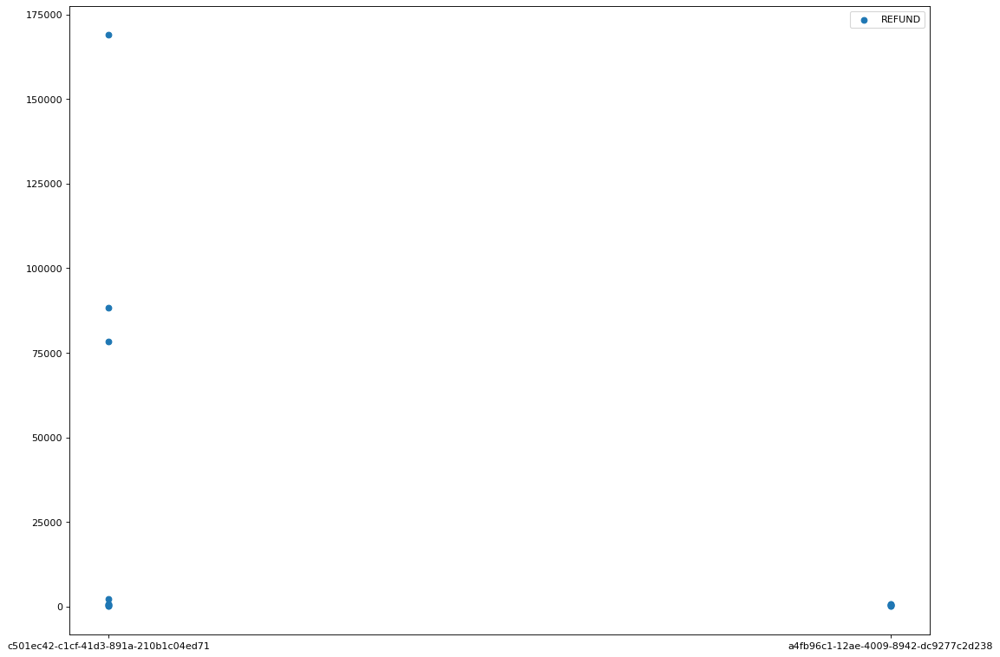

OTHER       12
SHOPPING     3
Name: externalParty.transactionCategory, dtype: int64


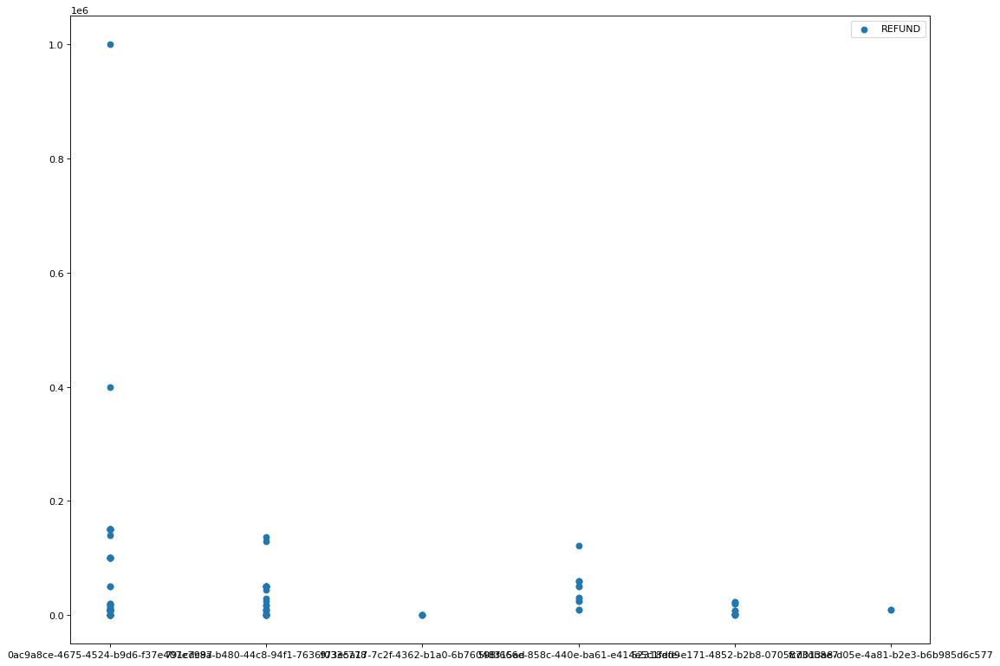

OTHER    101
Name: externalParty.transactionCategory, dtype: int64


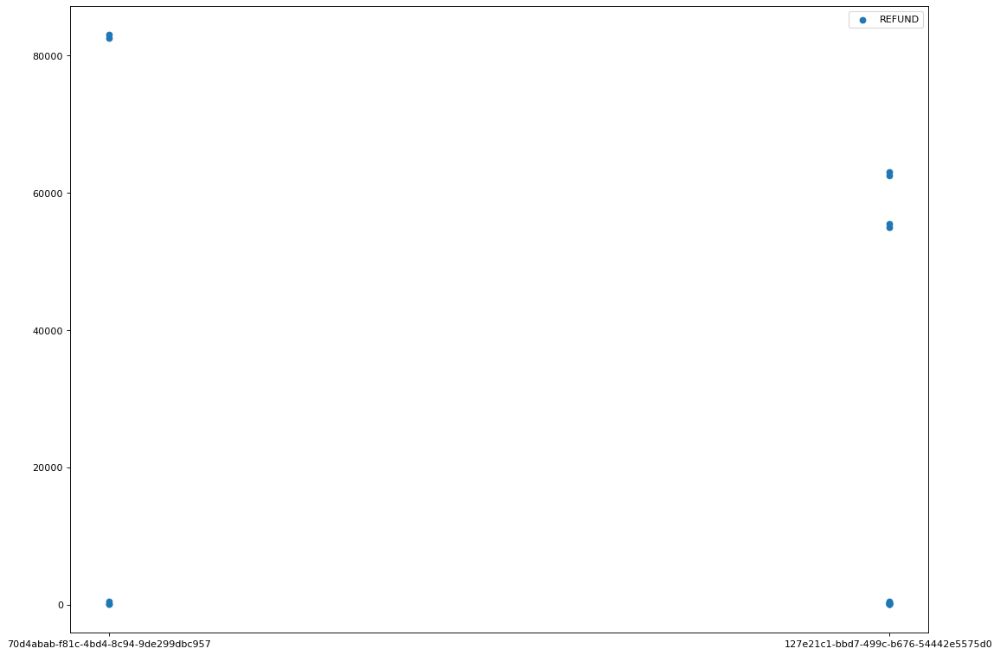

OTHER           15
SHOPPING         2
SUBSCRIPTION     1
Name: externalParty.transactionCategory, dtype: int64


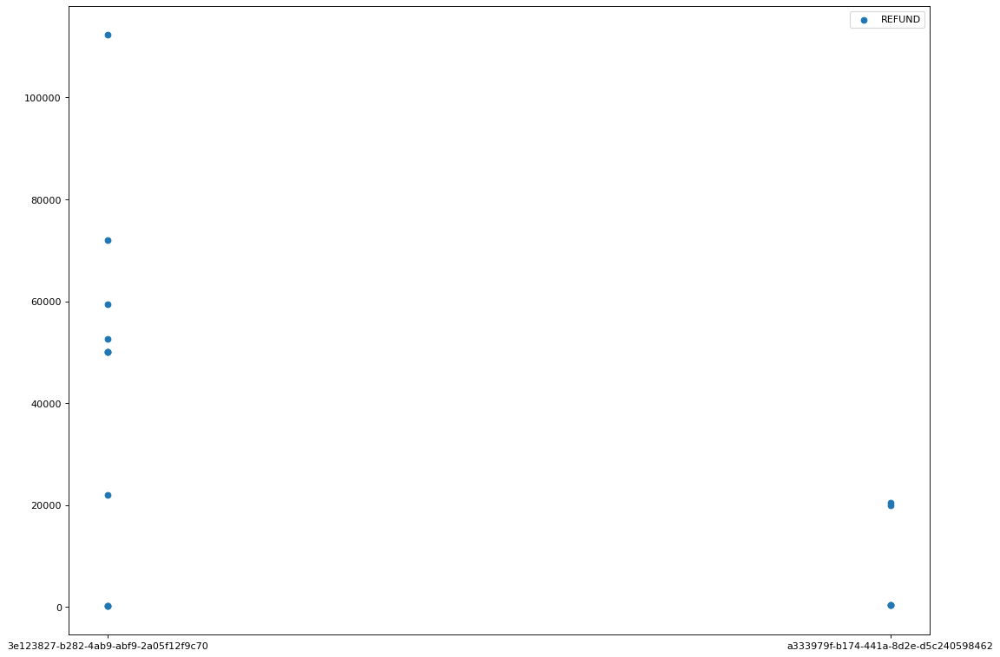

OTHER    16
Name: externalParty.transactionCategory, dtype: int64


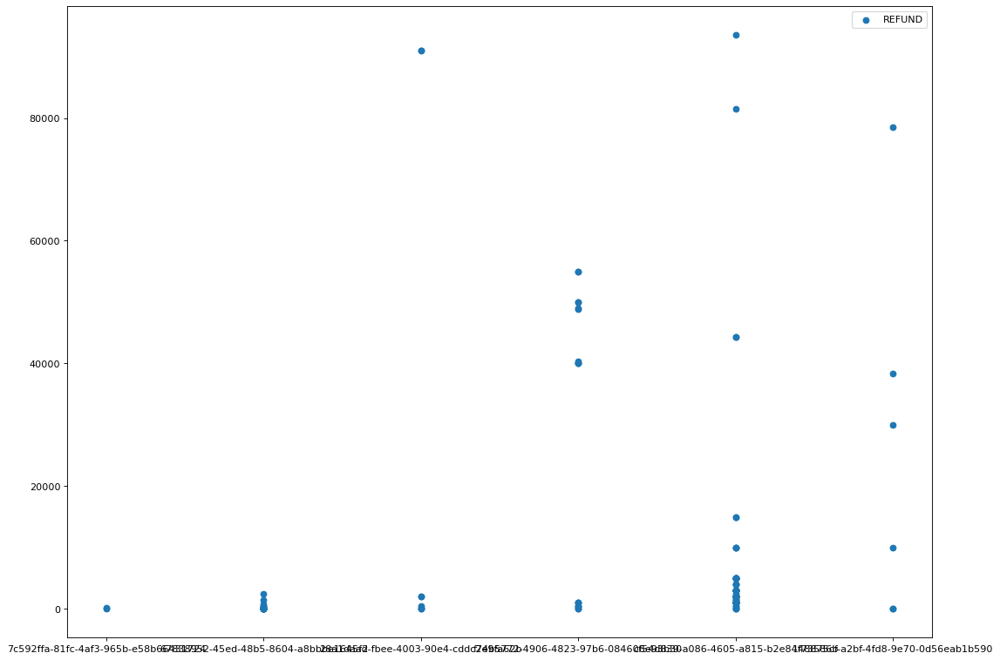

OTHER        124
TRAVEL         2
GROCERIES      1
Name: externalParty.transactionCategory, dtype: int64


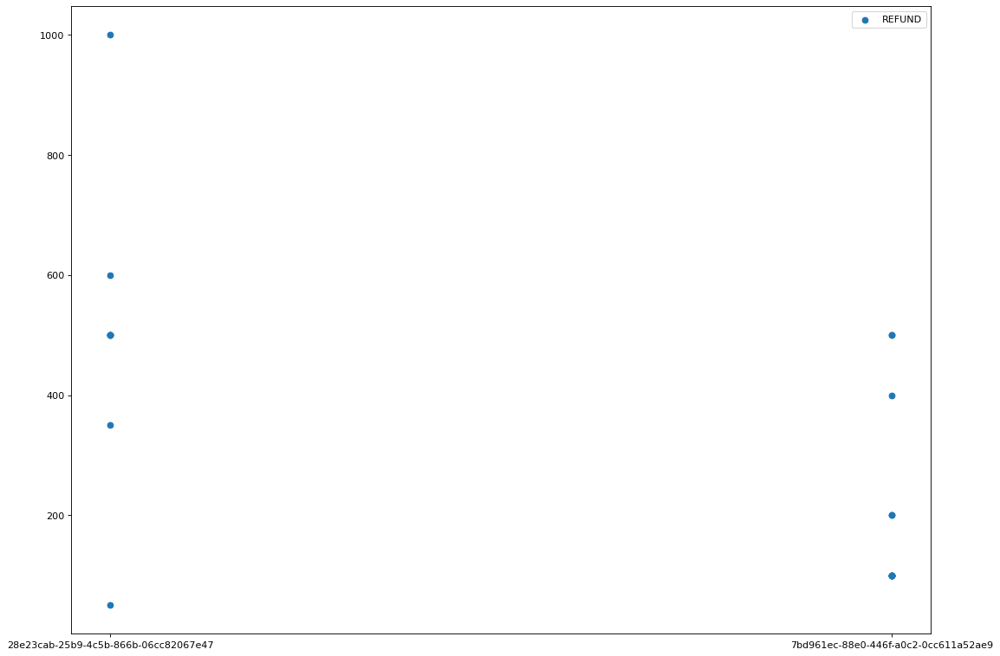

OTHER    19
Name: externalParty.transactionCategory, dtype: int64


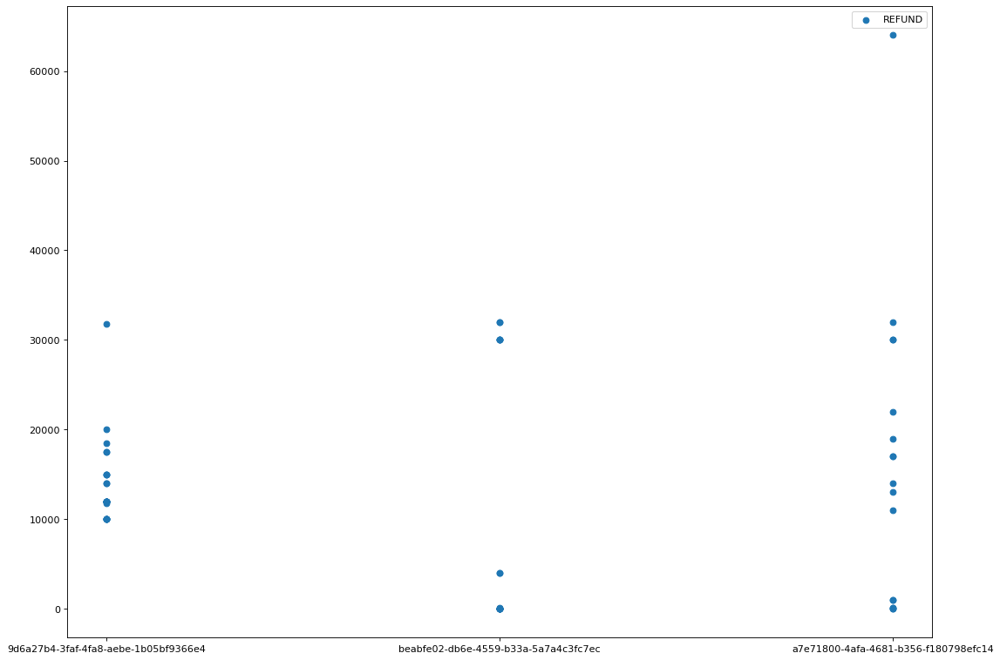

OTHER    59
Name: externalParty.transactionCategory, dtype: int64


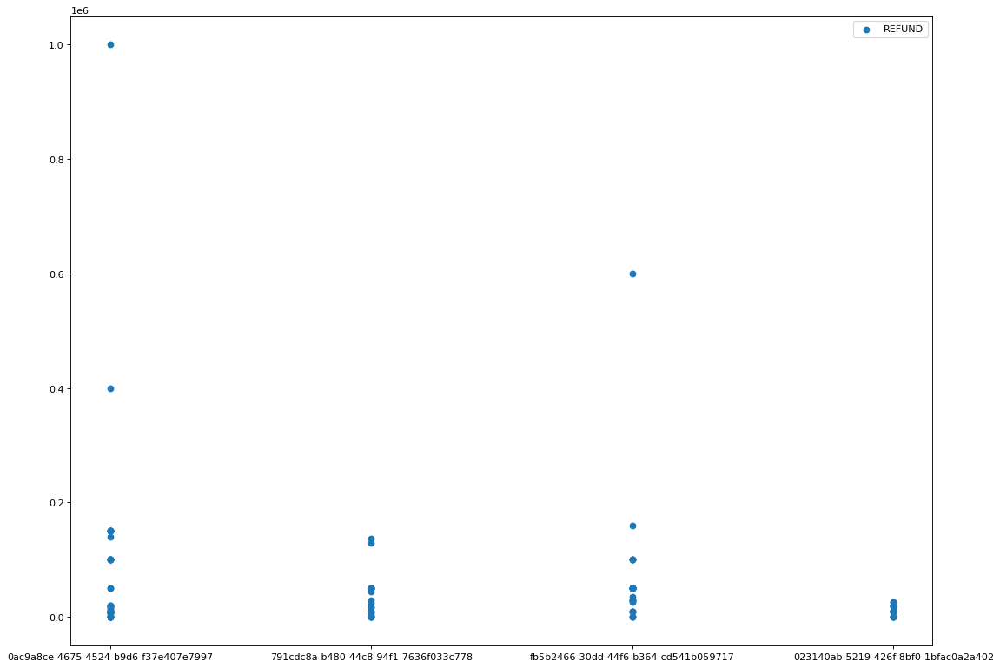

OTHER    123
Name: externalParty.transactionCategory, dtype: int64


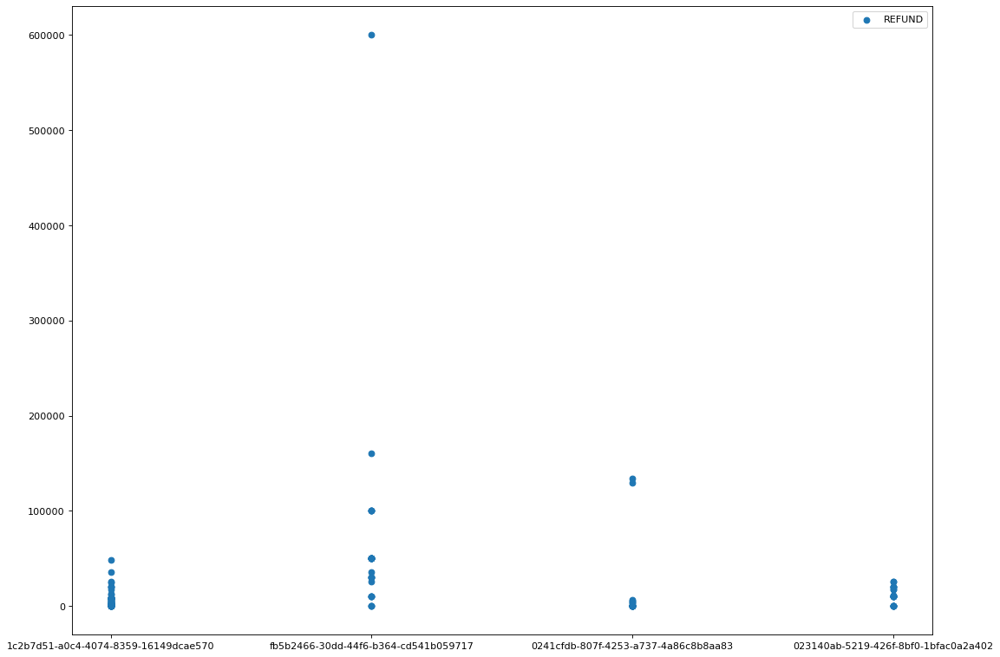

OTHER        133
TRAVEL         7
LIFESTYLE      7
GROCERIES      7
SHOPPING       1
Name: externalParty.transactionCategory, dtype: int64


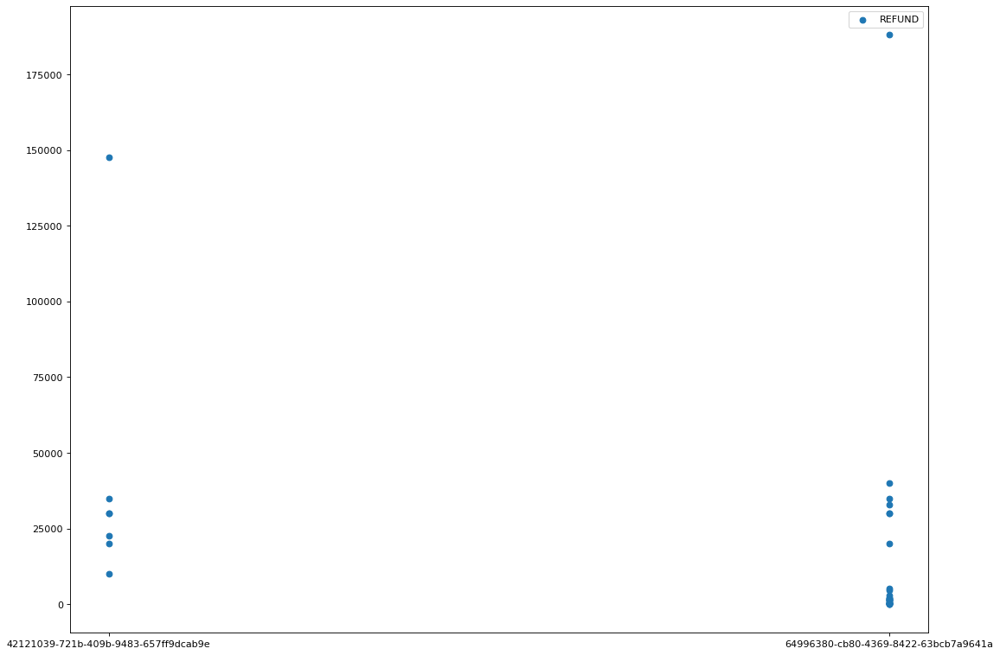

OTHER        30
LIFESTYLE     2
SHOPPING      1
Name: externalParty.transactionCategory, dtype: int64


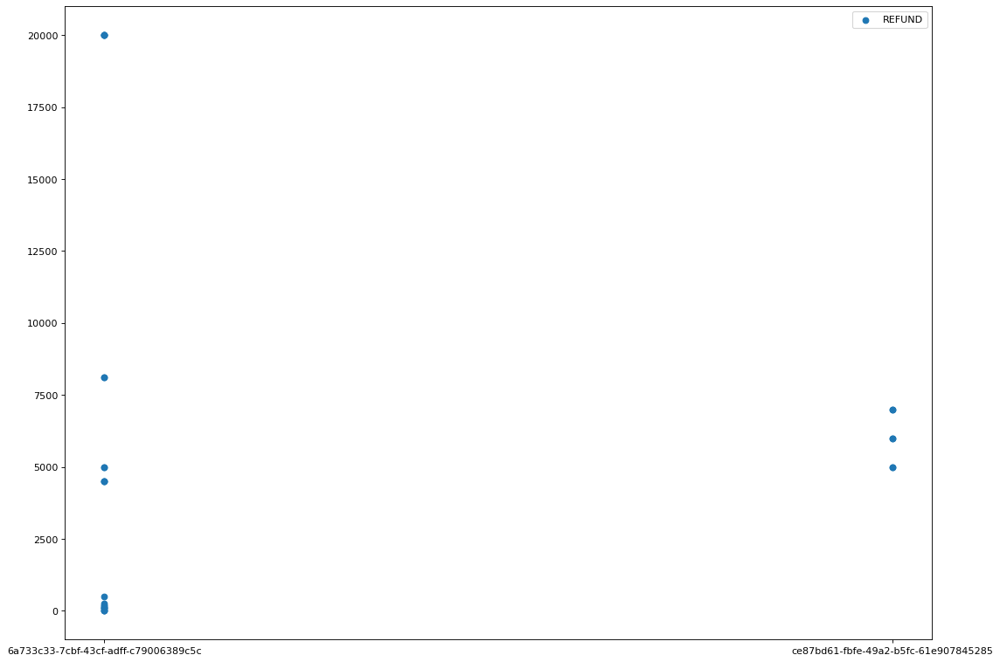

OTHER        26
LIFESTYLE     1
Name: externalParty.transactionCategory, dtype: int64


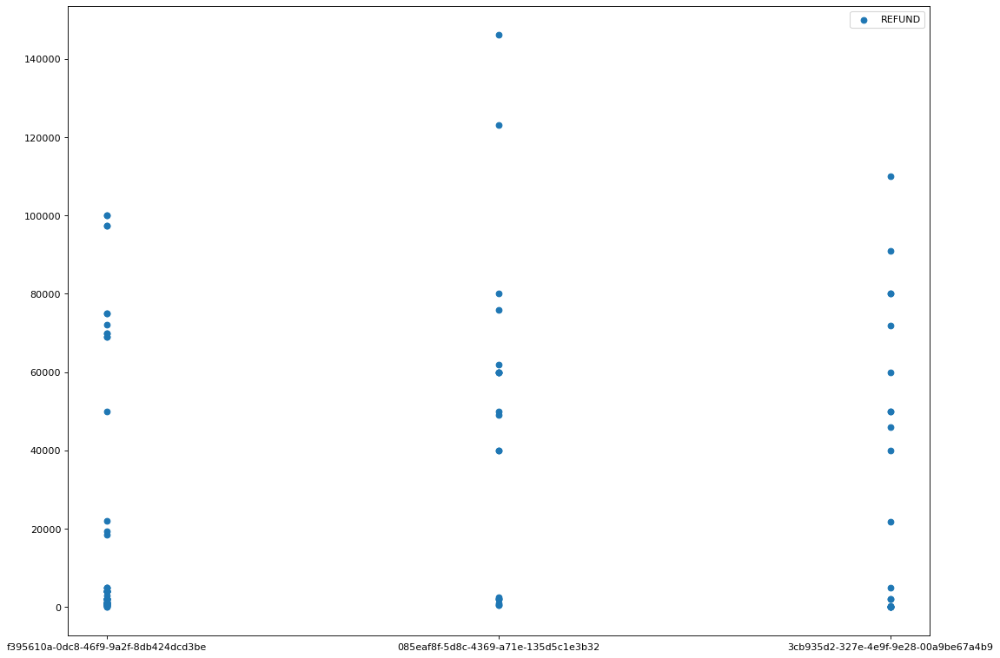

OTHER    95
Name: externalParty.transactionCategory, dtype: int64


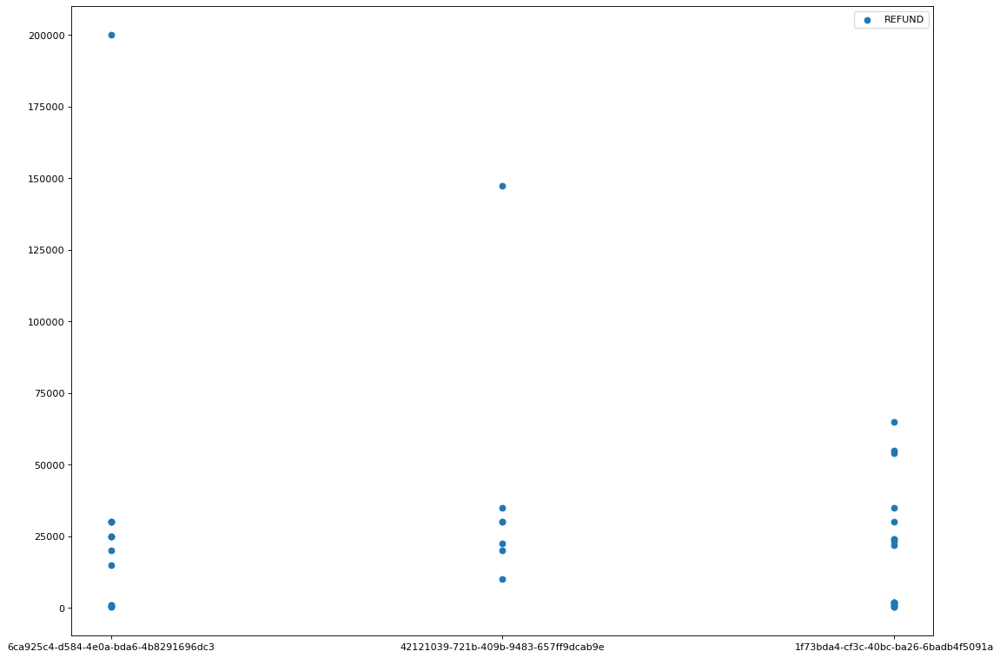

OTHER    37
Name: externalParty.transactionCategory, dtype: int64


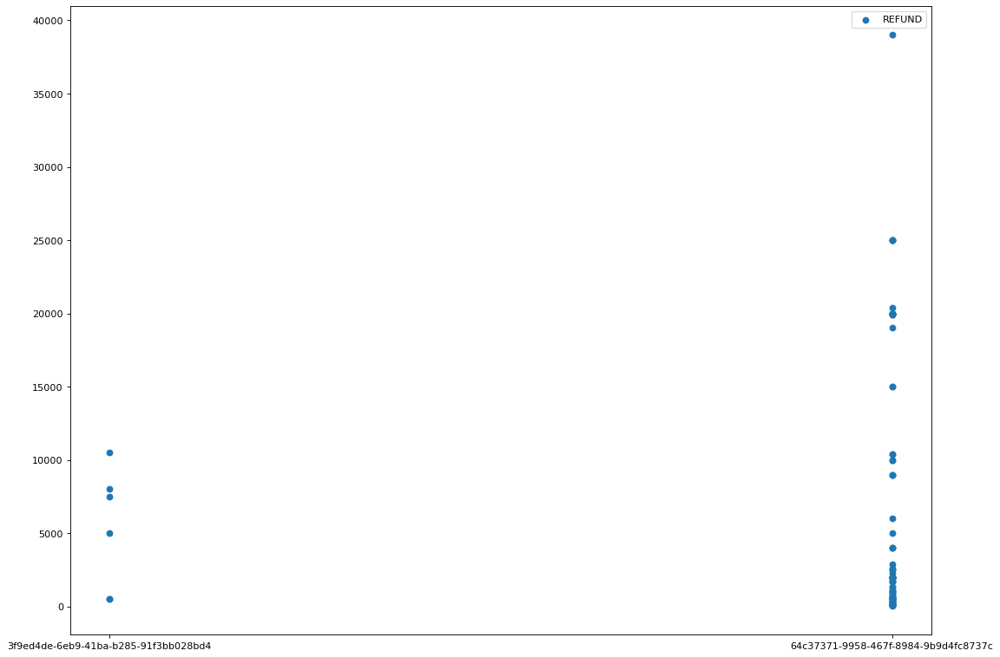

OTHER        57
GROCERIES    12
LIFESTYLE    11
SHOPPING      8
TRAVEL        6
Name: externalParty.transactionCategory, dtype: int64


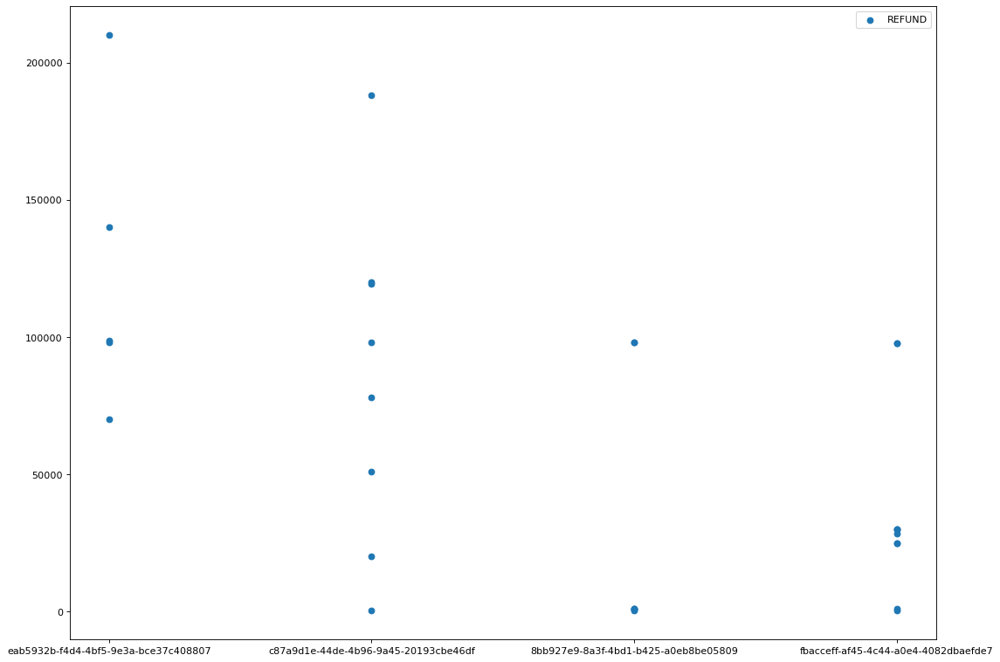

OTHER           29
SUBSCRIPTION     1
Name: externalParty.transactionCategory, dtype: int64


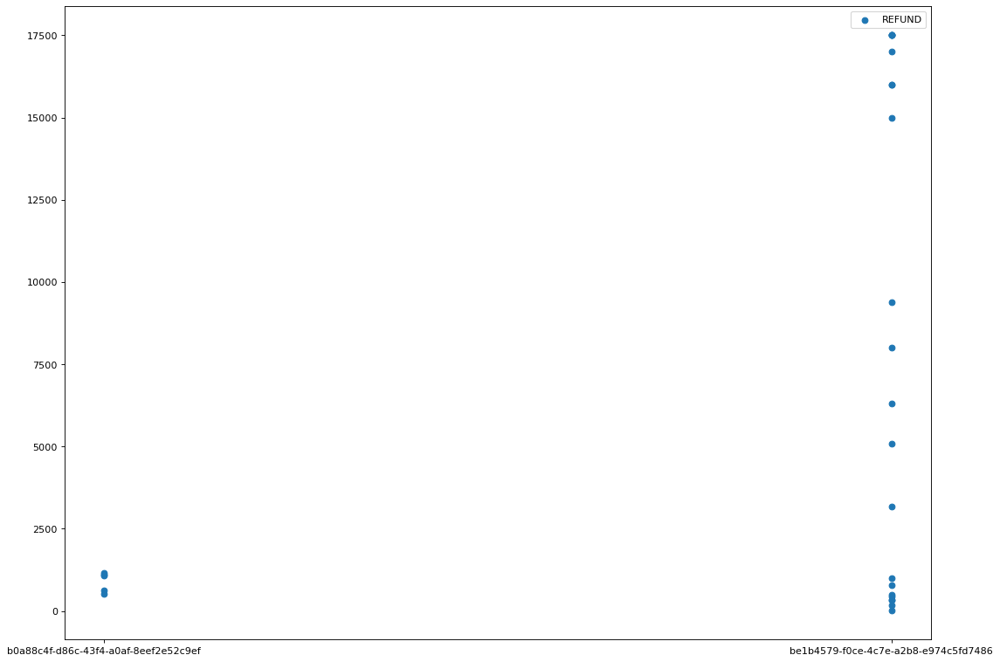

OTHER        15
SHOPPING      4
TRAVEL        3
GROCERIES     2
LIFESTYLE     2
Name: externalParty.transactionCategory, dtype: int64


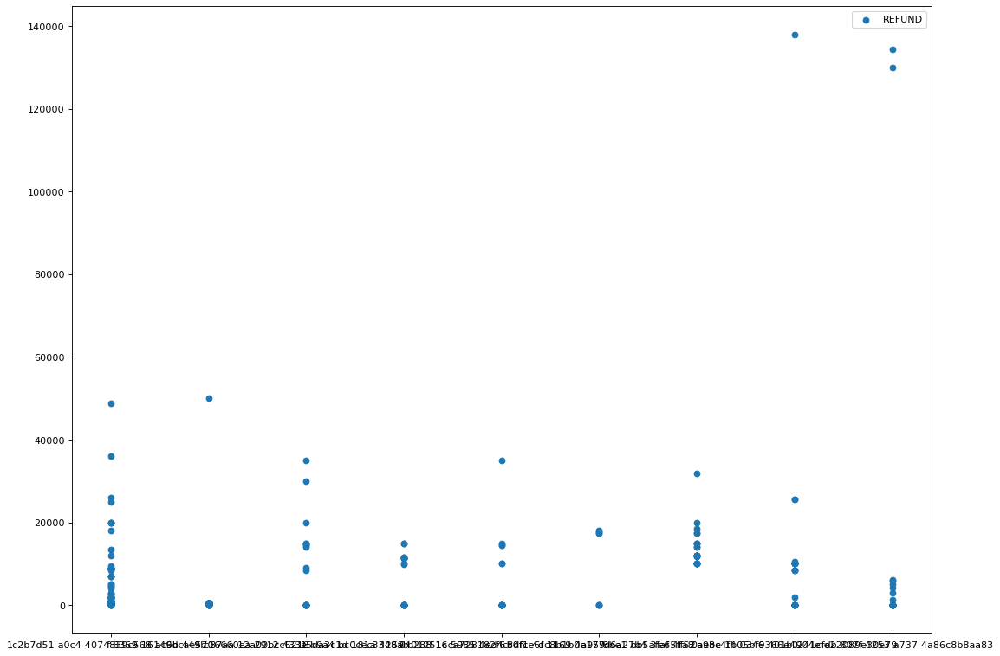

OTHER        305
TRAVEL         7
LIFESTYLE      7
GROCERIES      7
SHOPPING       1
Name: externalParty.transactionCategory, dtype: int64


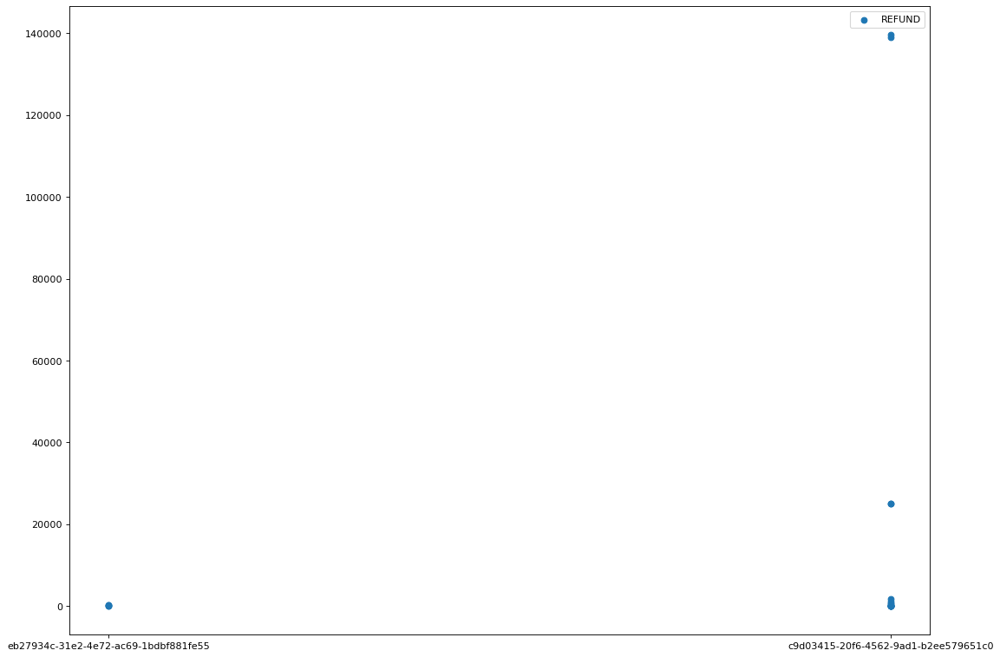

OTHER        17
GROCERIES     2
Name: externalParty.transactionCategory, dtype: int64


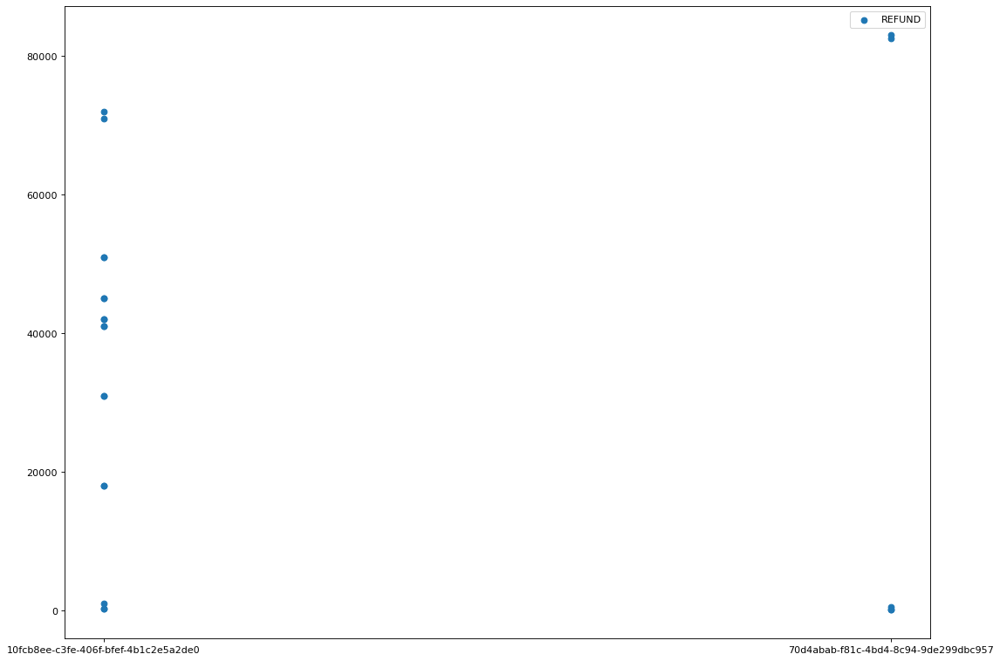

OTHER    22
Name: externalParty.transactionCategory, dtype: int64


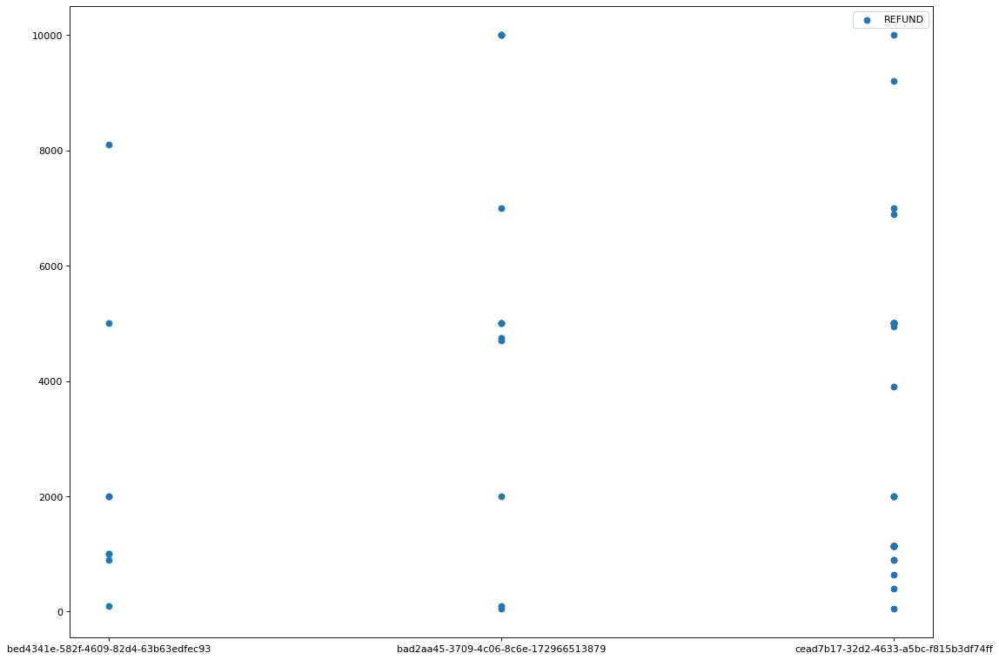

OTHER    60
Name: externalParty.transactionCategory, dtype: int64


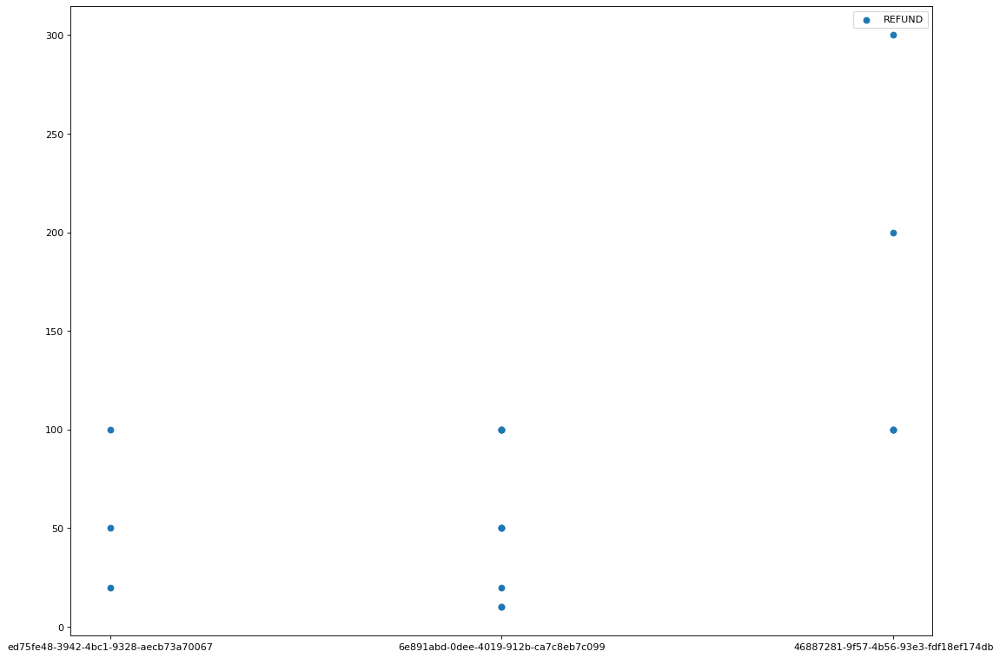

OTHER    18
Name: externalParty.transactionCategory, dtype: int64


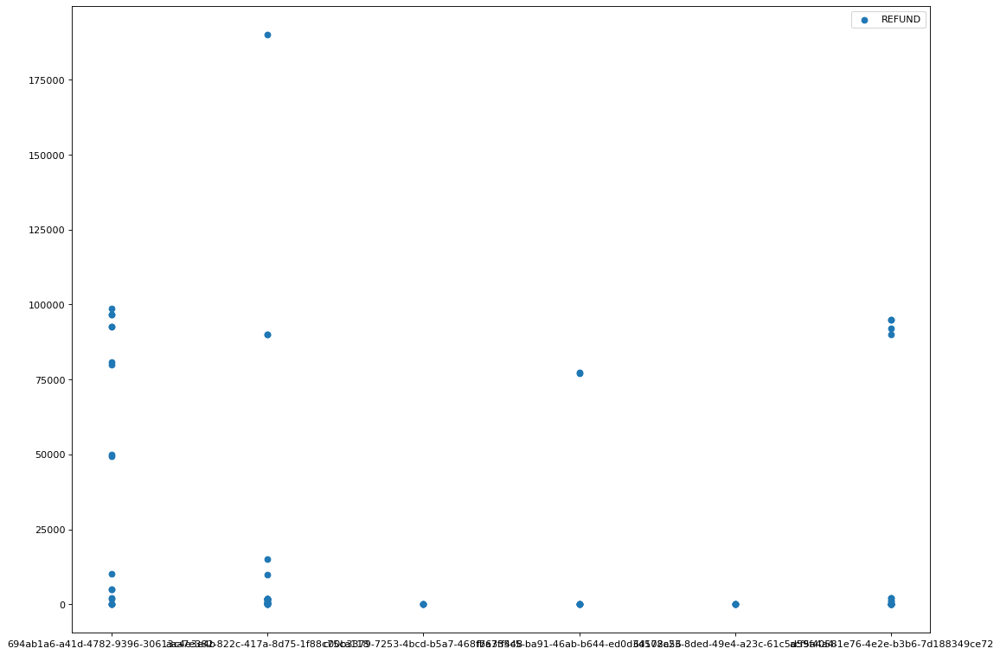

OTHER    74
Name: externalParty.transactionCategory, dtype: int64


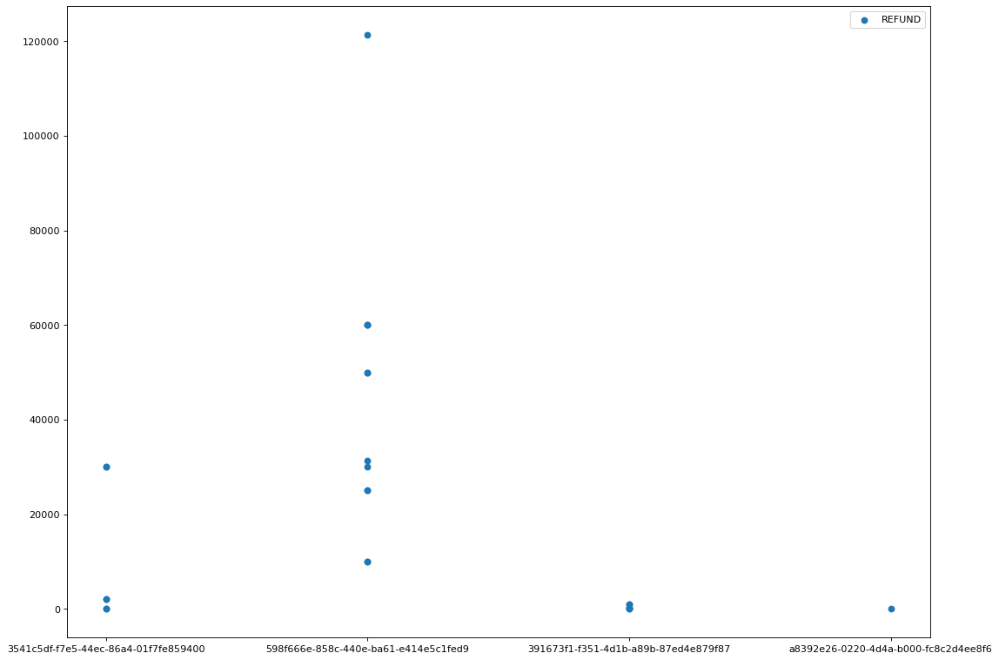

OTHER    25
Name: externalParty.transactionCategory, dtype: int64


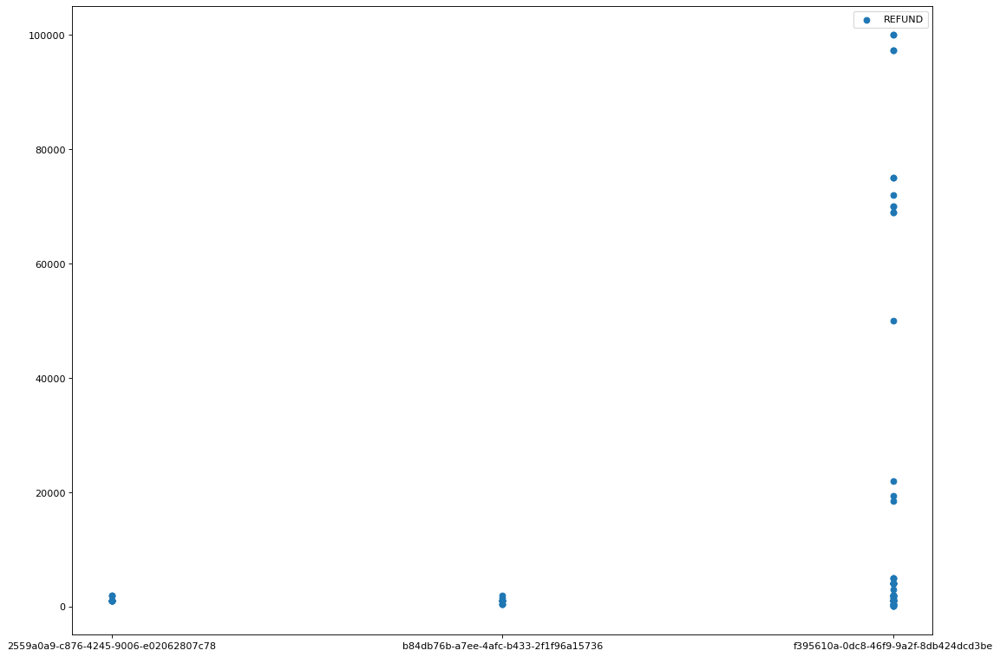

OTHER    75
Name: externalParty.transactionCategory, dtype: int64


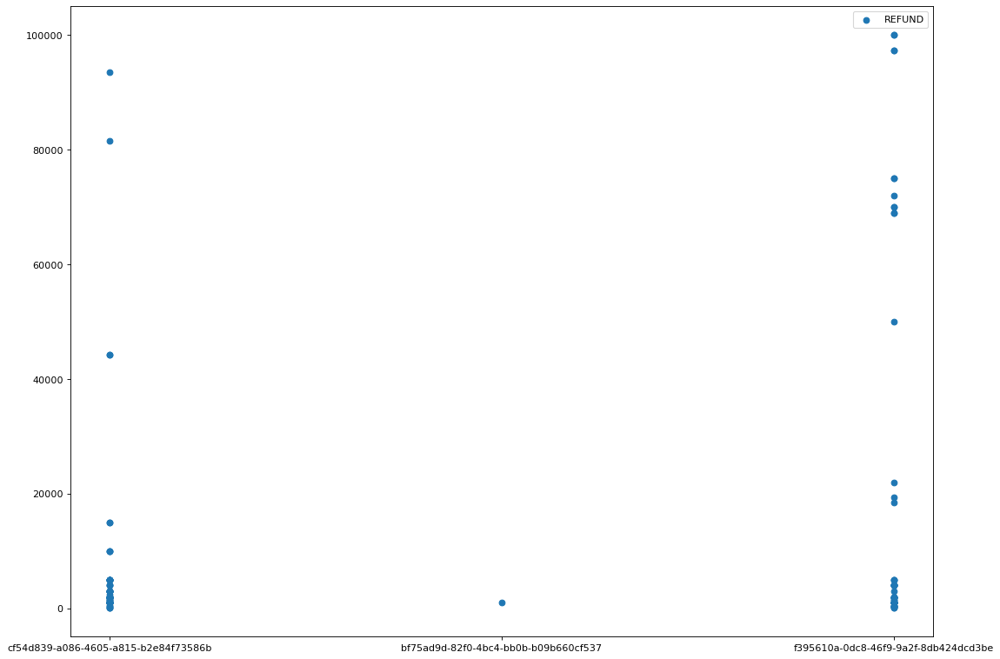

OTHER    129
Name: externalParty.transactionCategory, dtype: int64


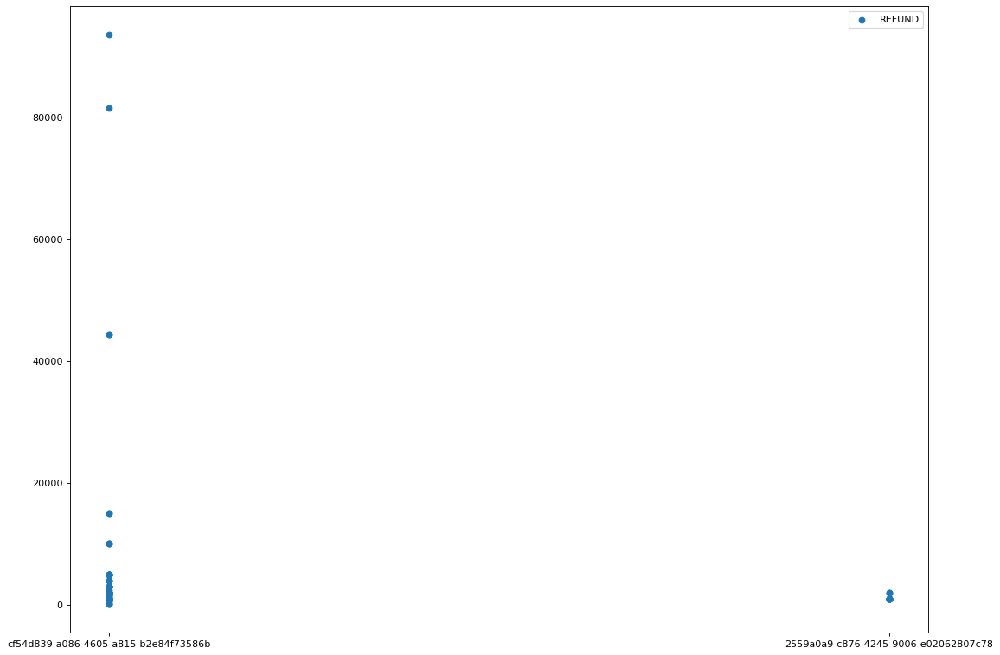

OTHER    84
Name: externalParty.transactionCategory, dtype: int64


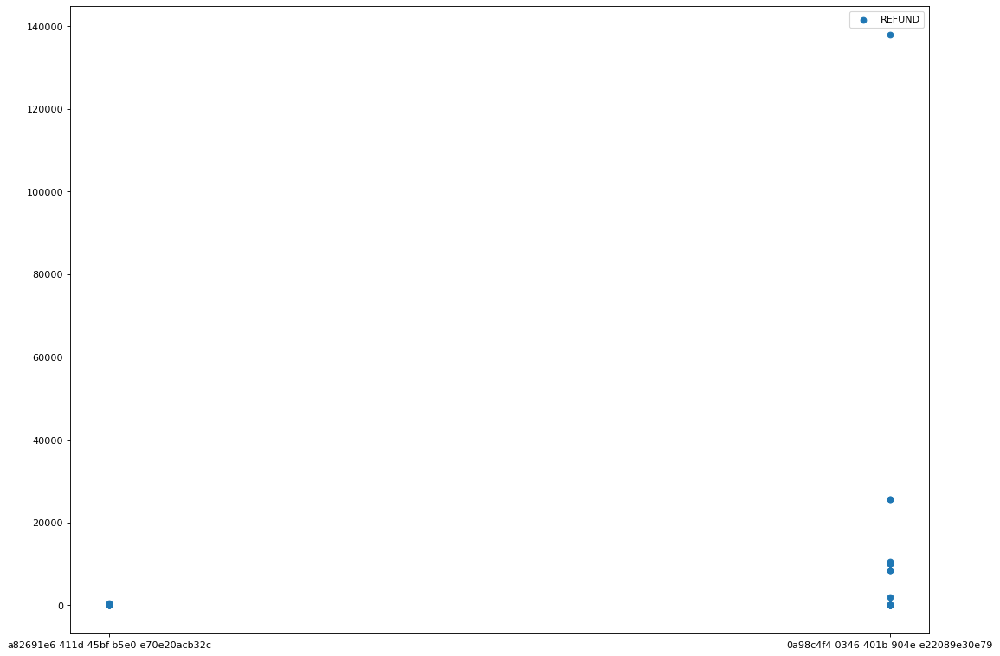

OTHER    37
Name: externalParty.transactionCategory, dtype: int64


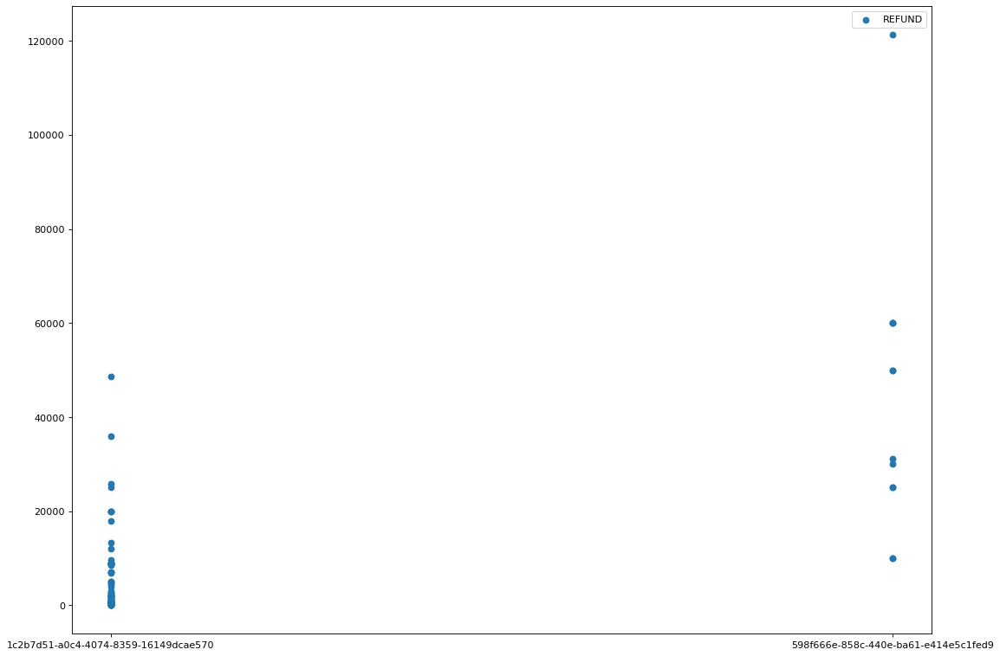

OTHER        71
TRAVEL        7
LIFESTYLE     7
GROCERIES     7
SHOPPING      1
Name: externalParty.transactionCategory, dtype: int64


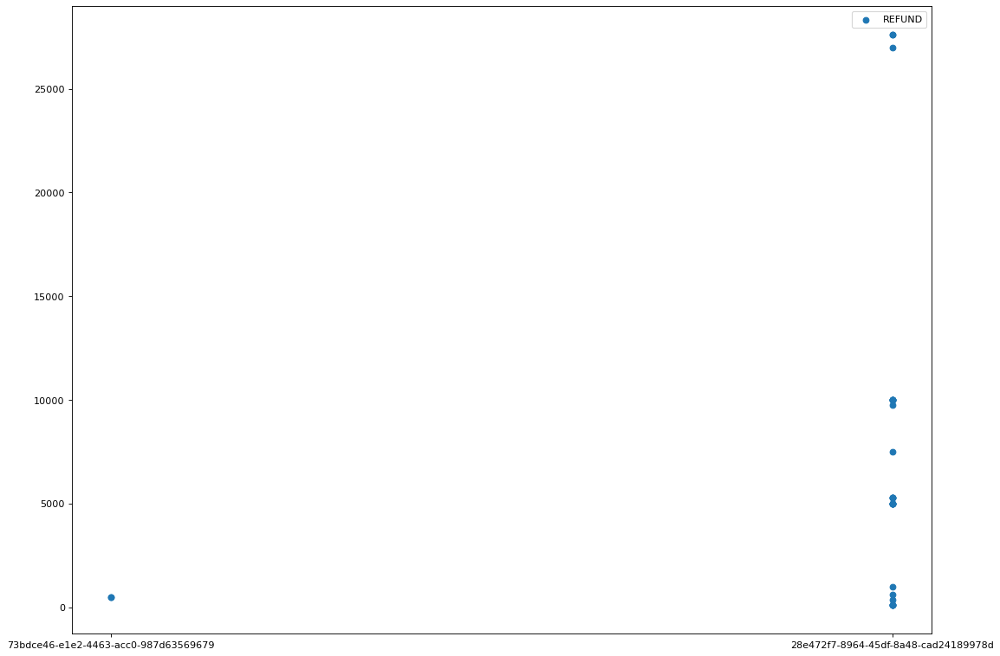

OTHER    31
Name: externalParty.transactionCategory, dtype: int64


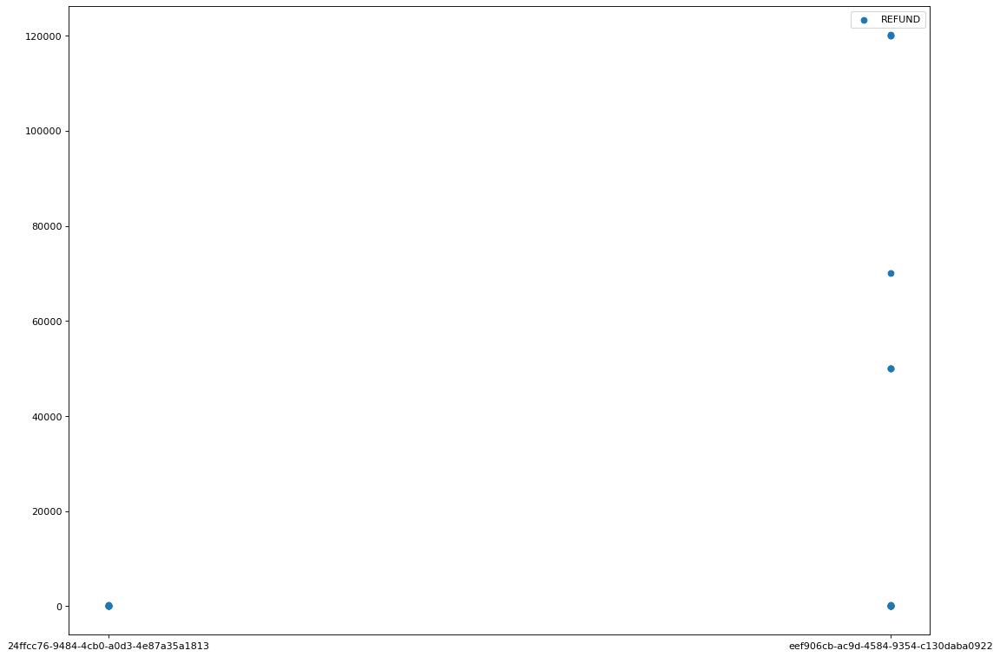

OTHER    24
Name: externalParty.transactionCategory, dtype: int64


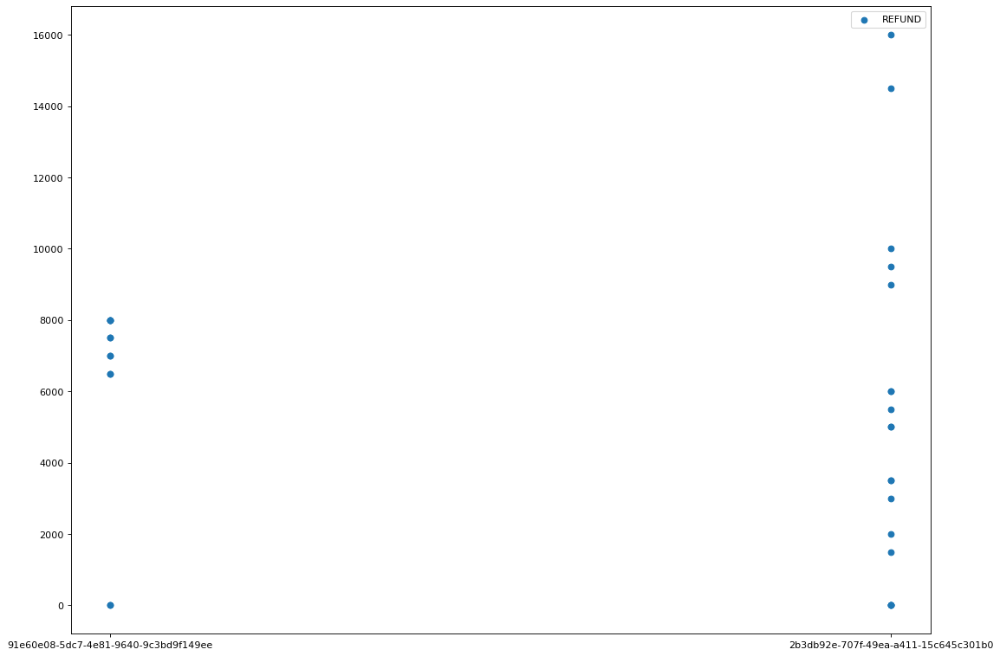

OTHER    31
Name: externalParty.transactionCategory, dtype: int64


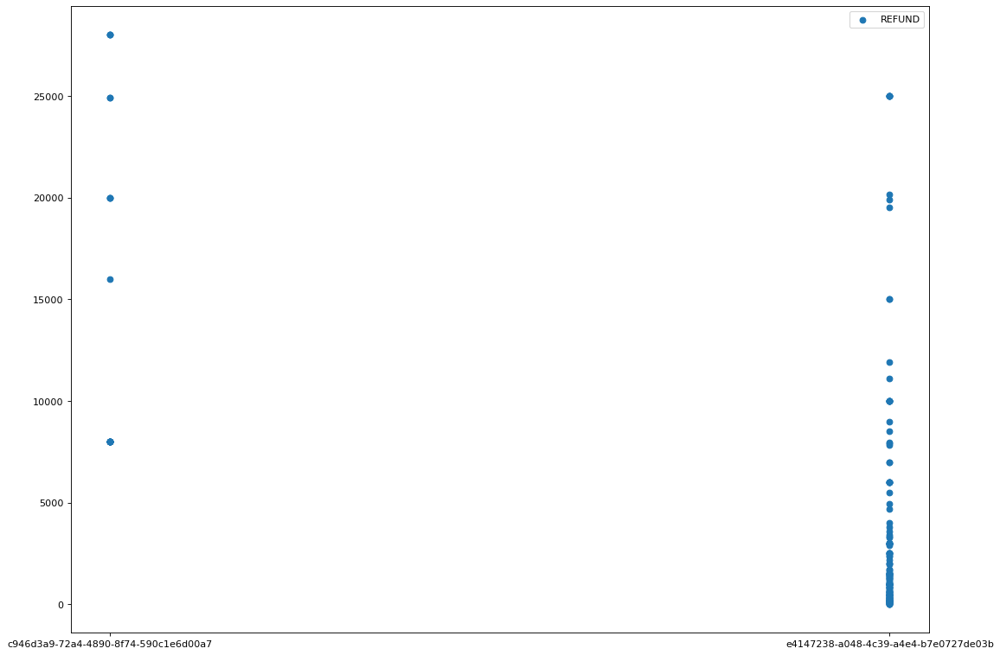

OTHER        103
GROCERIES     28
TRAVEL        13
LIFESTYLE      9
SHOPPING       4
Name: externalParty.transactionCategory, dtype: int64


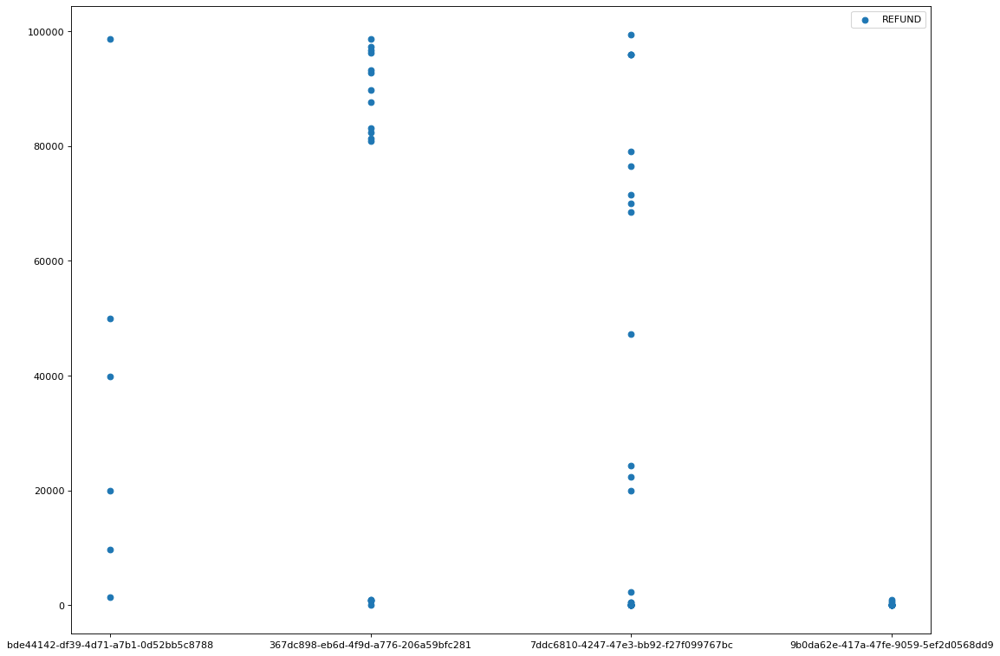

OTHER    68
Name: externalParty.transactionCategory, dtype: int64


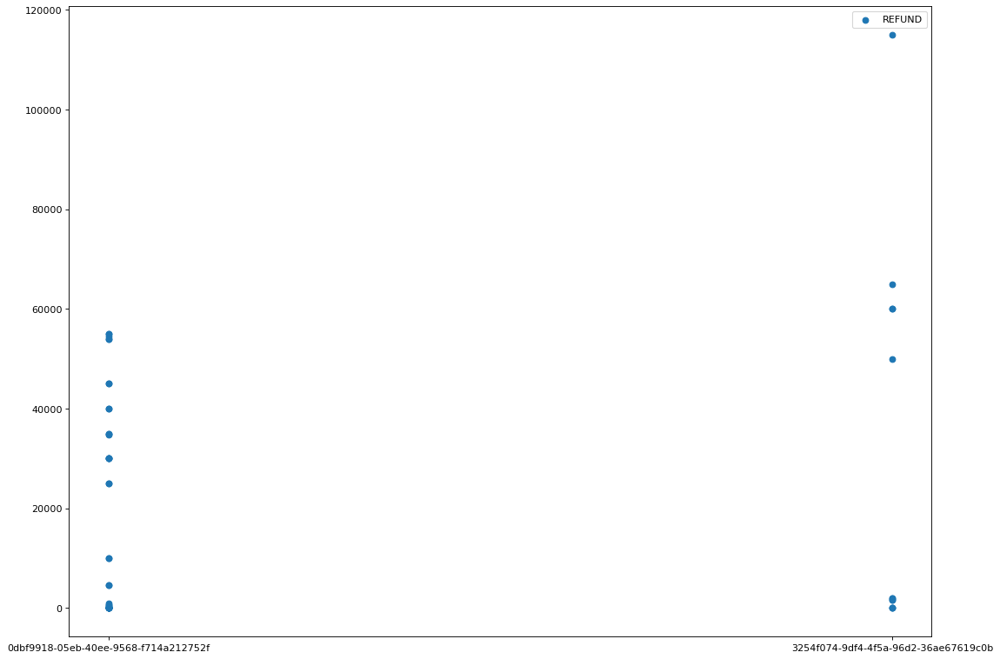

OTHER    49
Name: externalParty.transactionCategory, dtype: int64


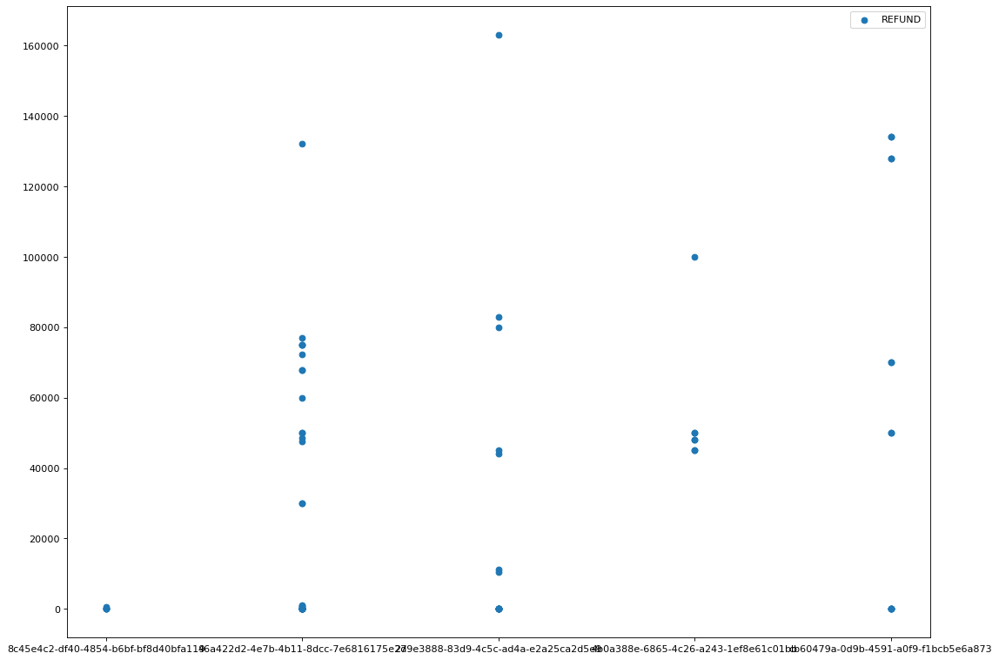

OTHER    76
Name: externalParty.transactionCategory, dtype: int64


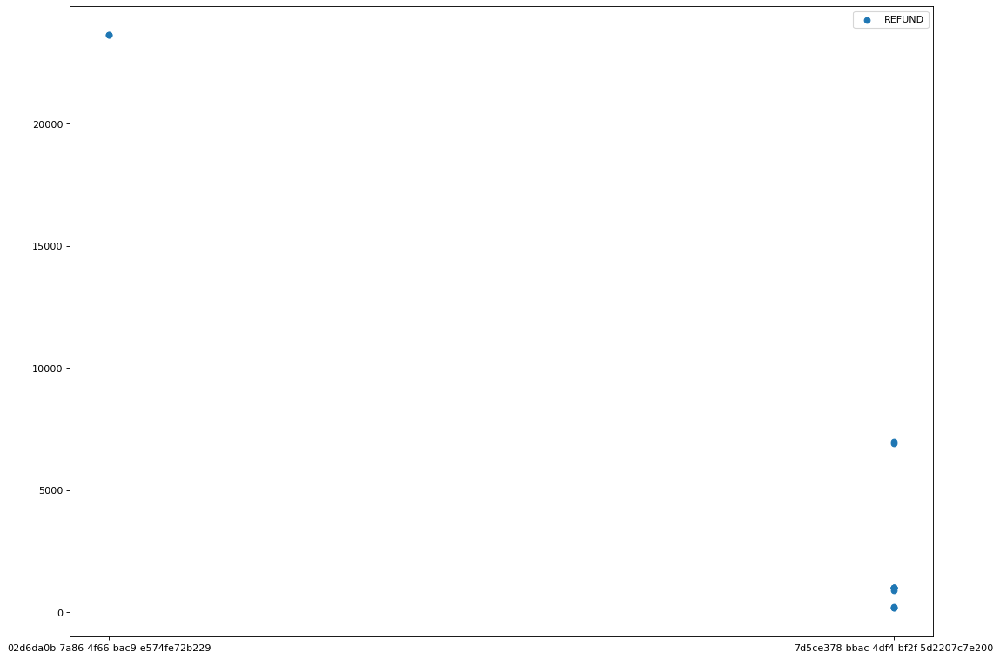

OTHER       12
SHOPPING     1
Name: externalParty.transactionCategory, dtype: int64


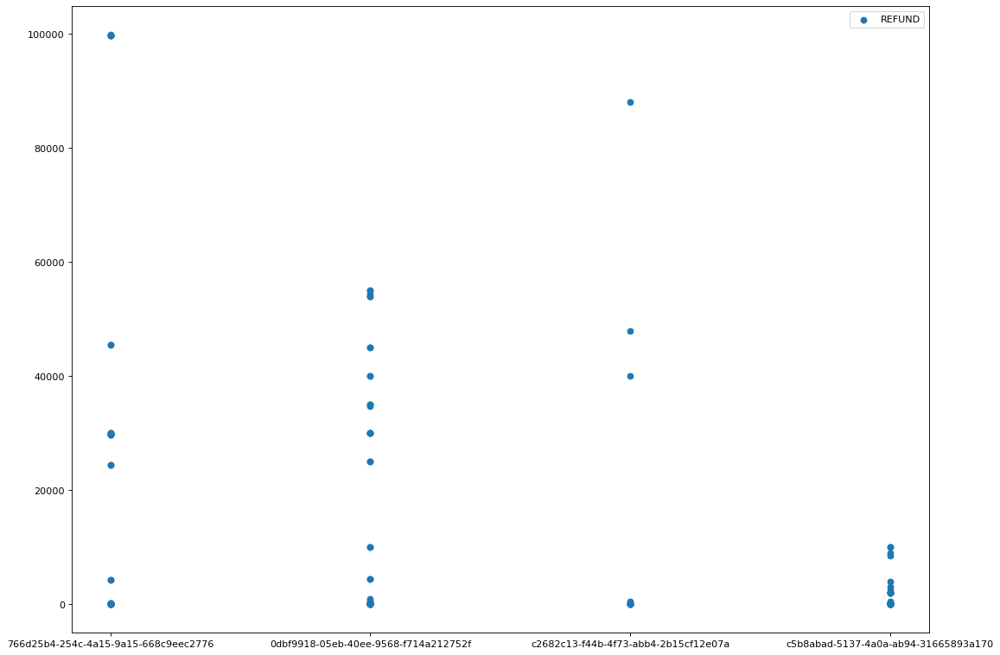

OTHER    126
Name: externalParty.transactionCategory, dtype: int64


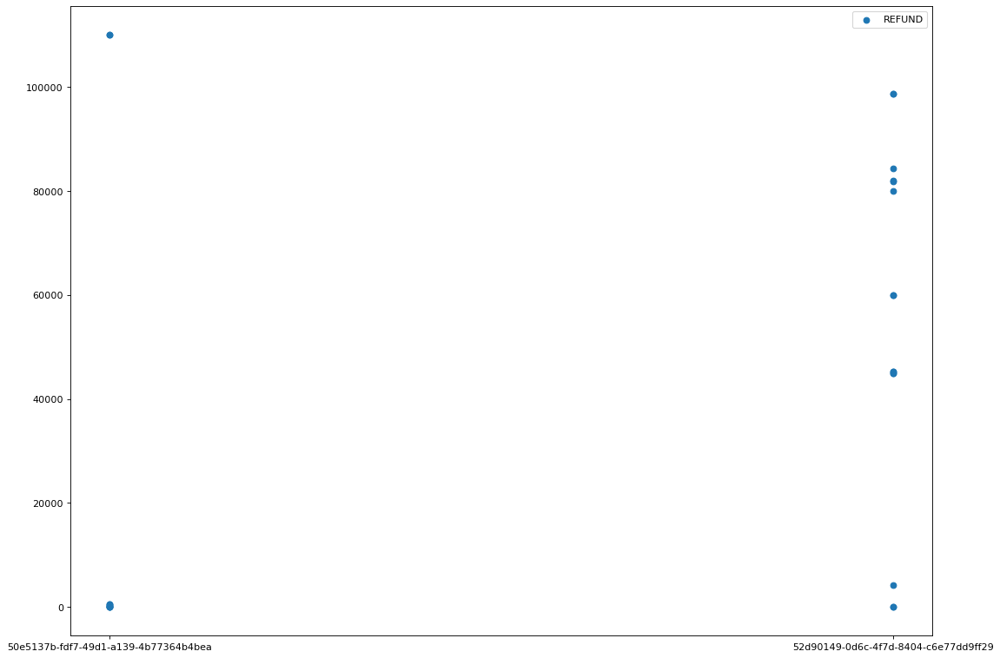

OTHER    25
Name: externalParty.transactionCategory, dtype: int64


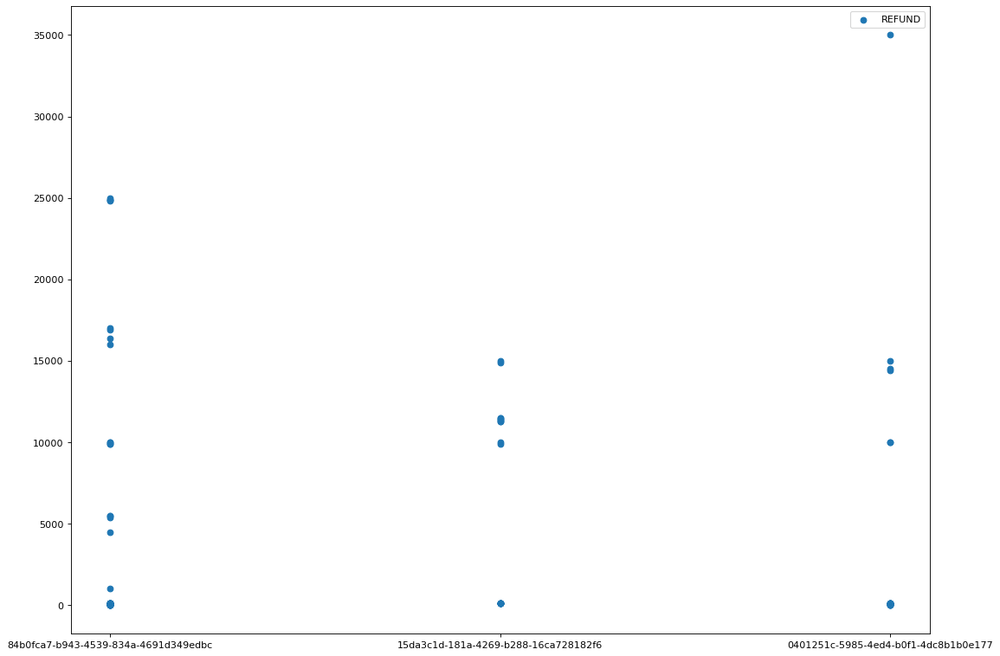

OTHER    84
Name: externalParty.transactionCategory, dtype: int64


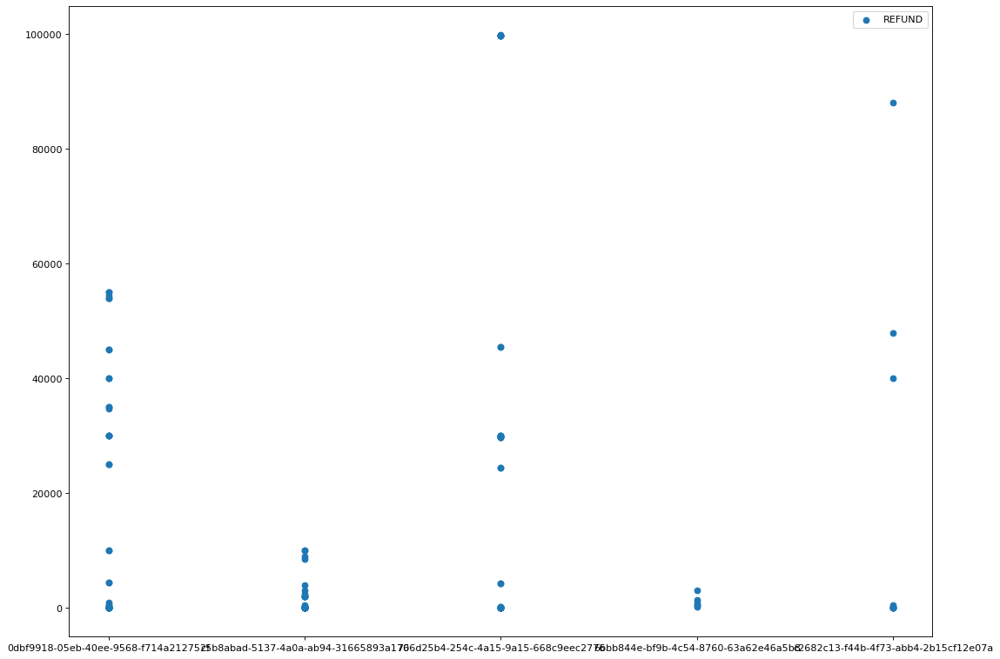

OTHER        130
LIFESTYLE      2
Name: externalParty.transactionCategory, dtype: int64


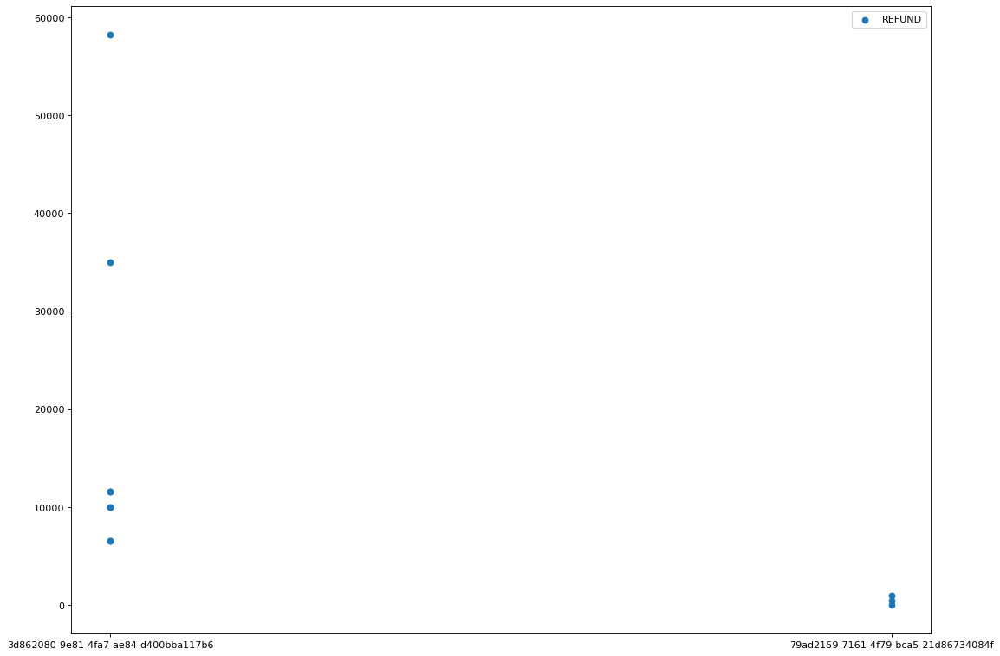

OTHER    11
Name: externalParty.transactionCategory, dtype: int64


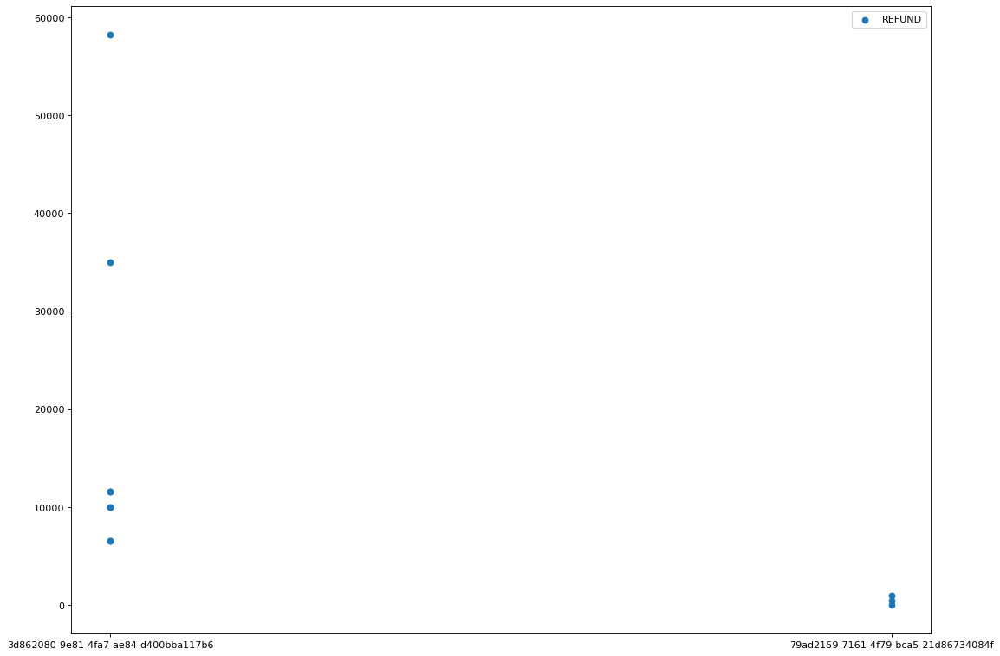

OTHER    11
Name: externalParty.transactionCategory, dtype: int64


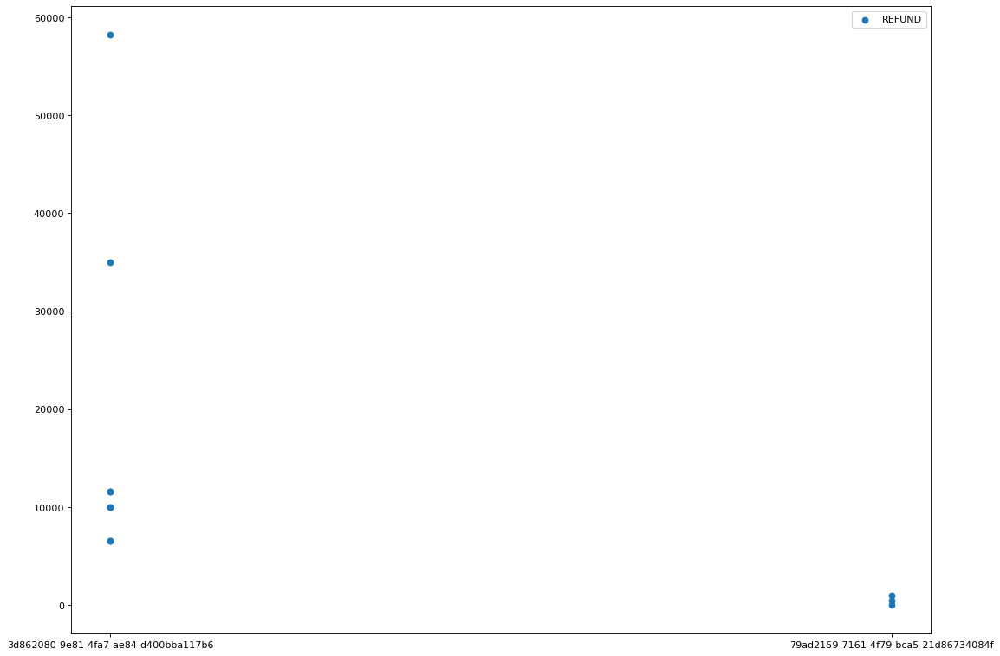

OTHER    11
Name: externalParty.transactionCategory, dtype: int64


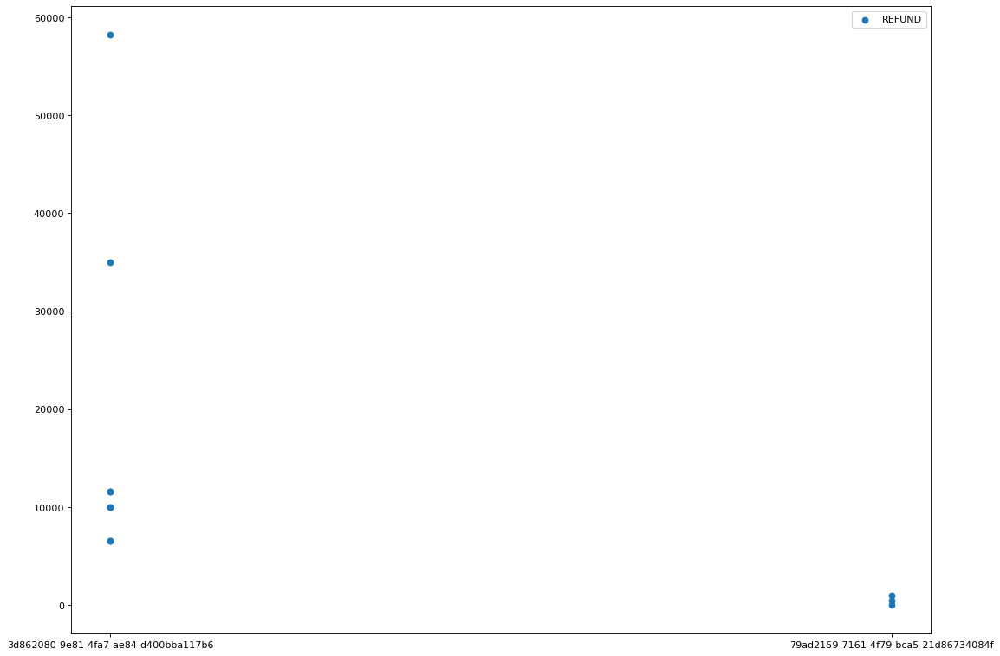

OTHER    11
Name: externalParty.transactionCategory, dtype: int64


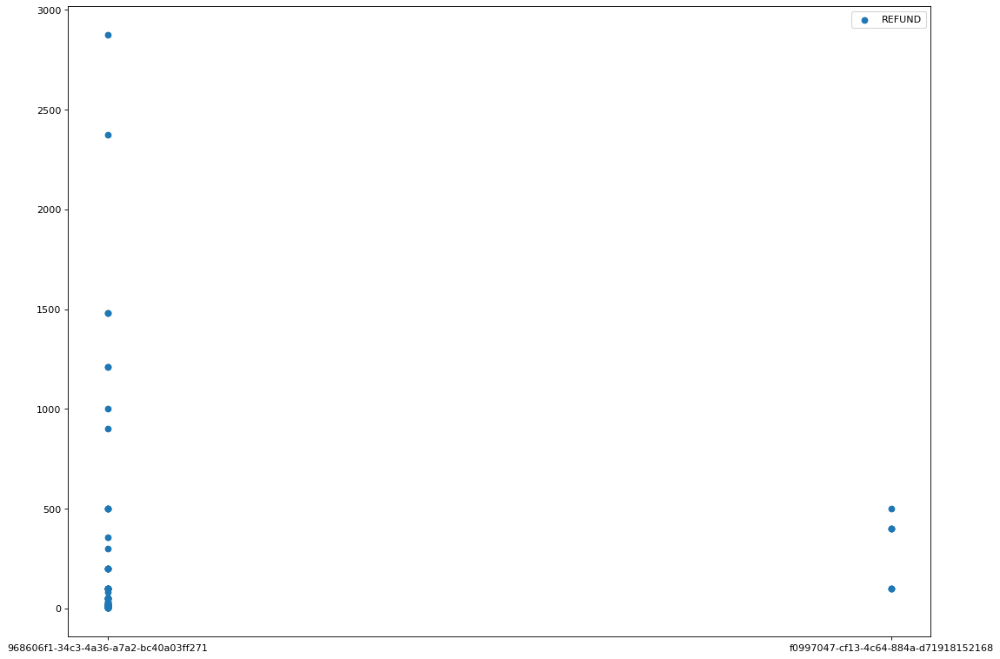

OTHER    90
Name: externalParty.transactionCategory, dtype: int64


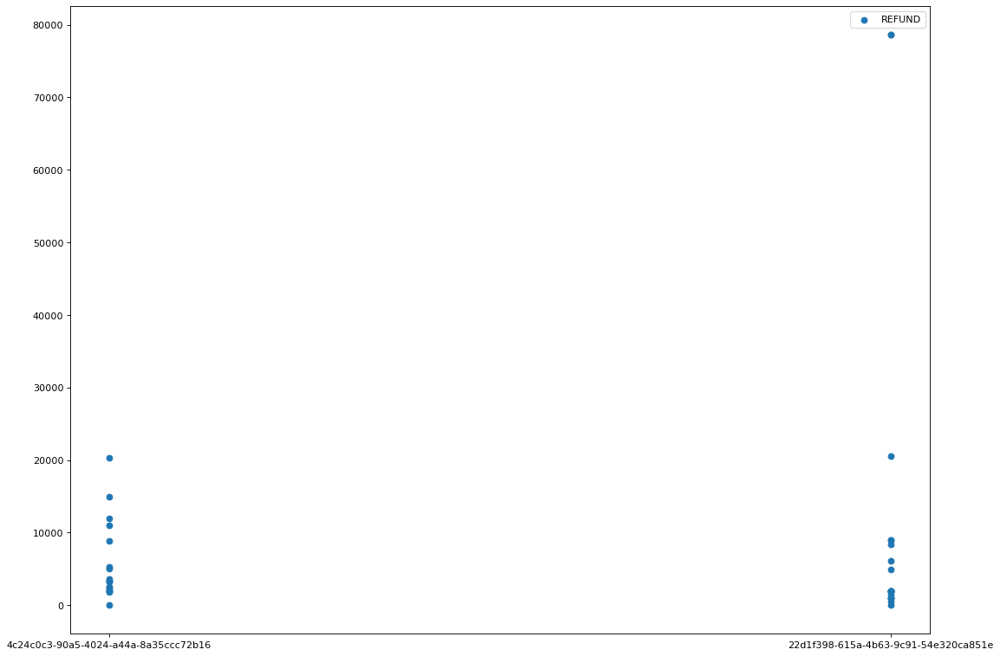

OTHER    39
Name: externalParty.transactionCategory, dtype: int64


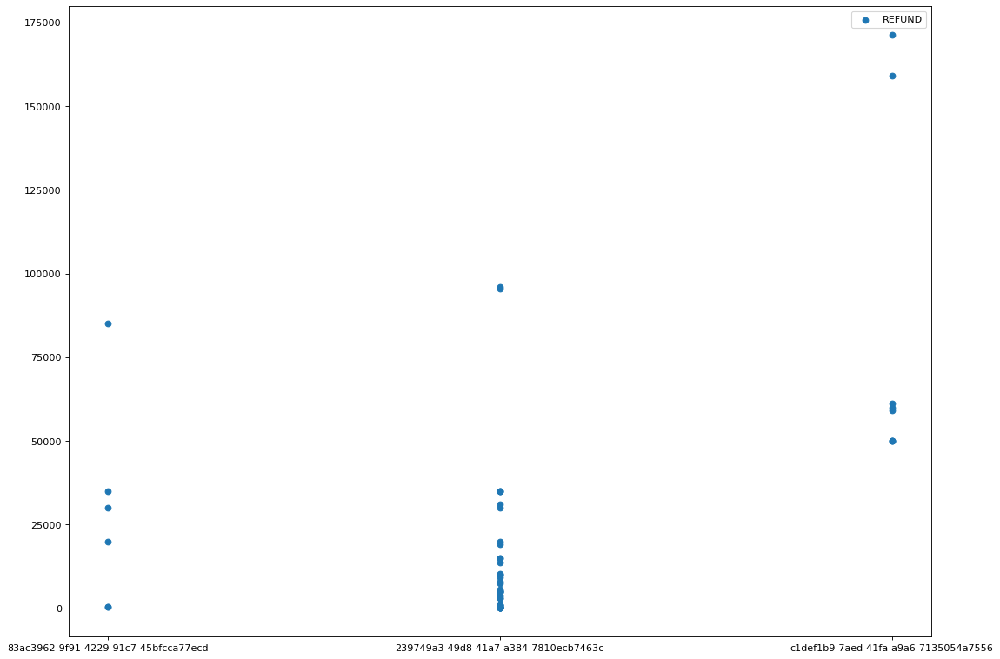

OTHER    55
Name: externalParty.transactionCategory, dtype: int64


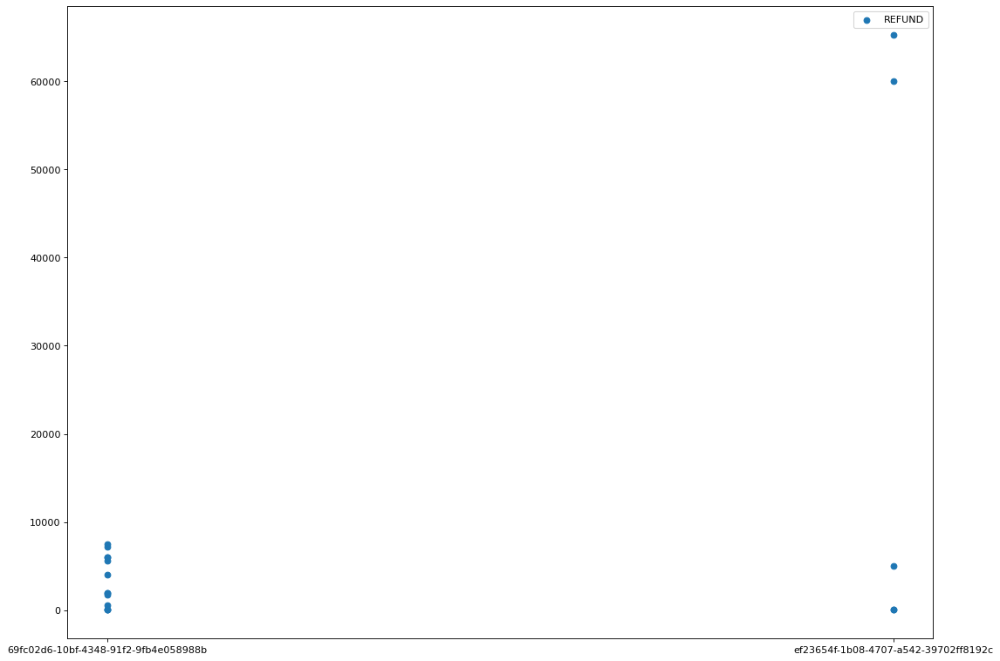

OTHER    18
Name: externalParty.transactionCategory, dtype: int64


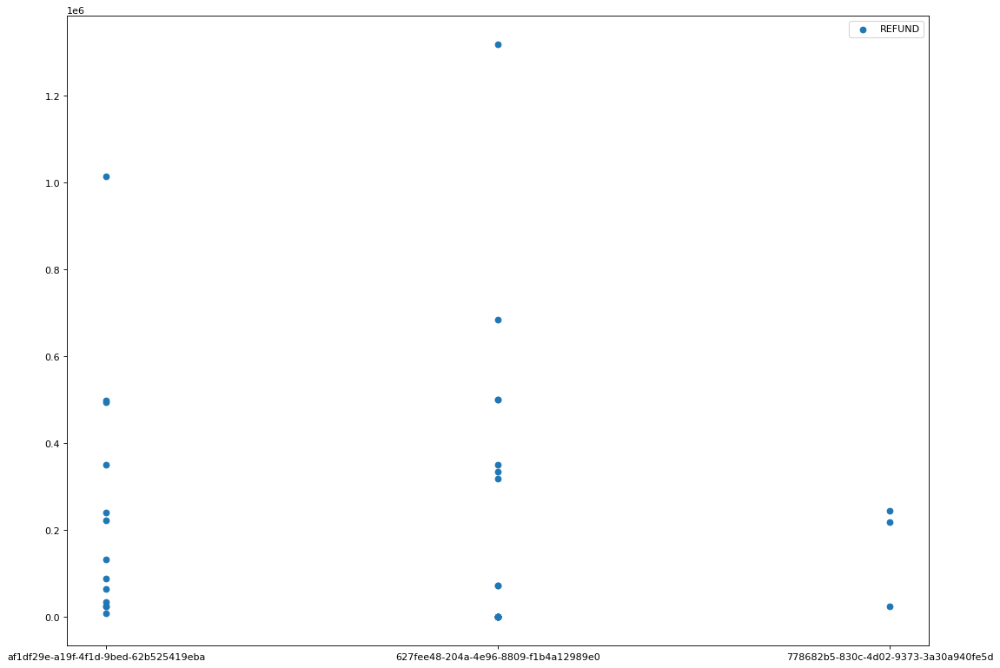

OTHER    35
Name: externalParty.transactionCategory, dtype: int64


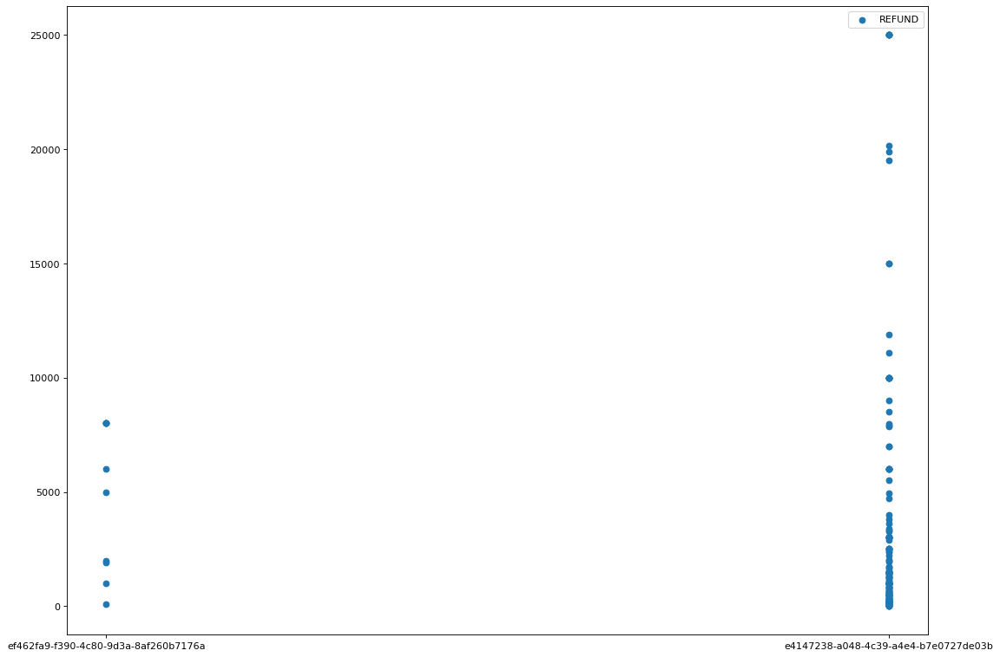

OTHER        93
GROCERIES    28
TRAVEL       13
LIFESTYLE     9
SHOPPING      4
Name: externalParty.transactionCategory, dtype: int64


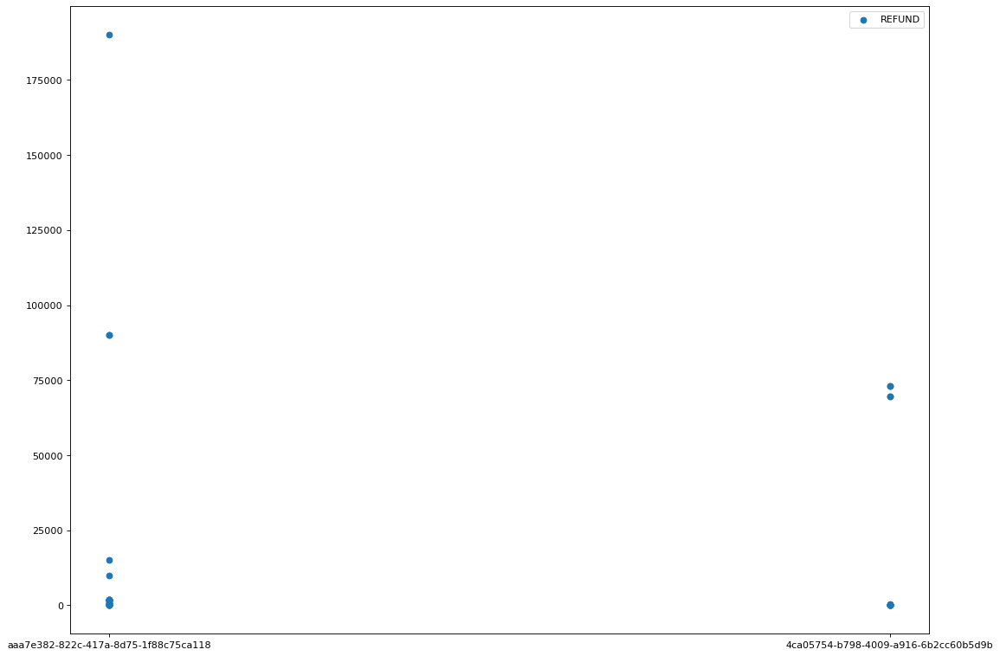

OTHER    36
Name: externalParty.transactionCategory, dtype: int64


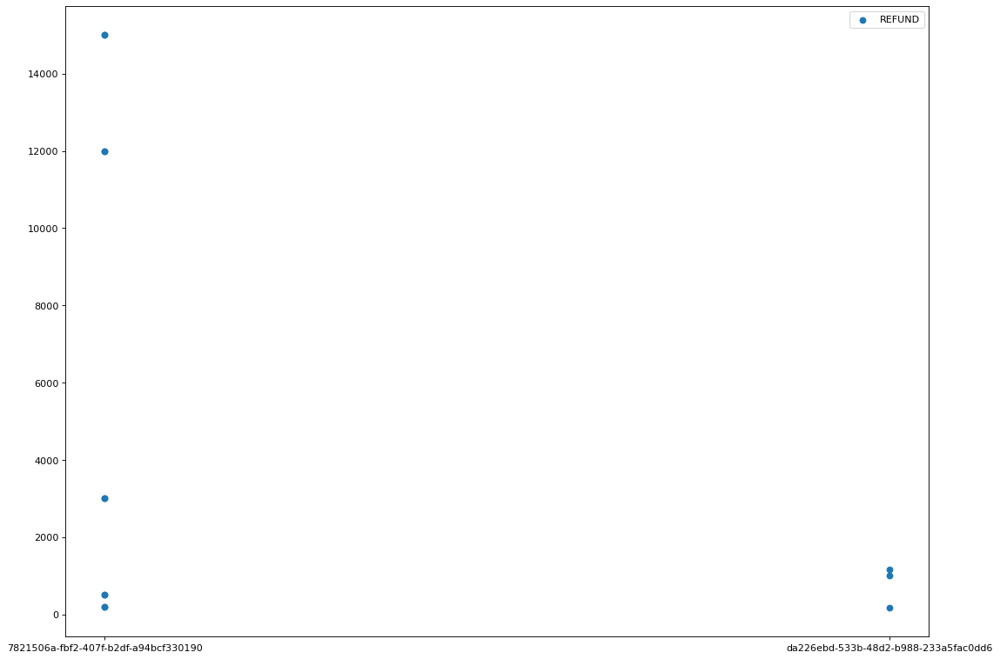

OTHER    13
Name: externalParty.transactionCategory, dtype: int64


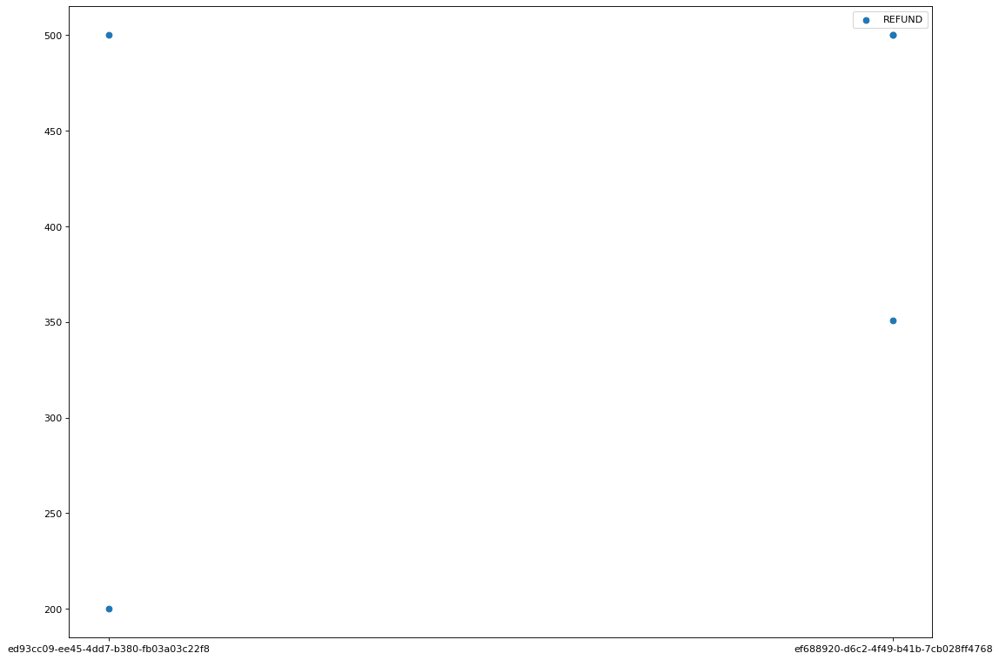

OTHER    5
Name: externalParty.transactionCategory, dtype: int64


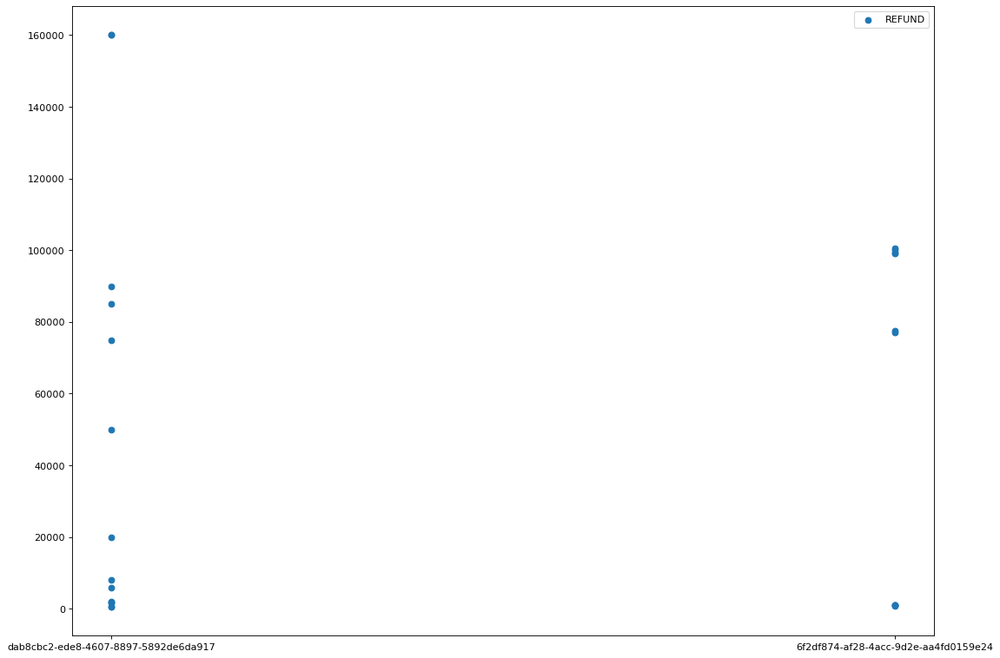

OTHER    24
Name: externalParty.transactionCategory, dtype: int64


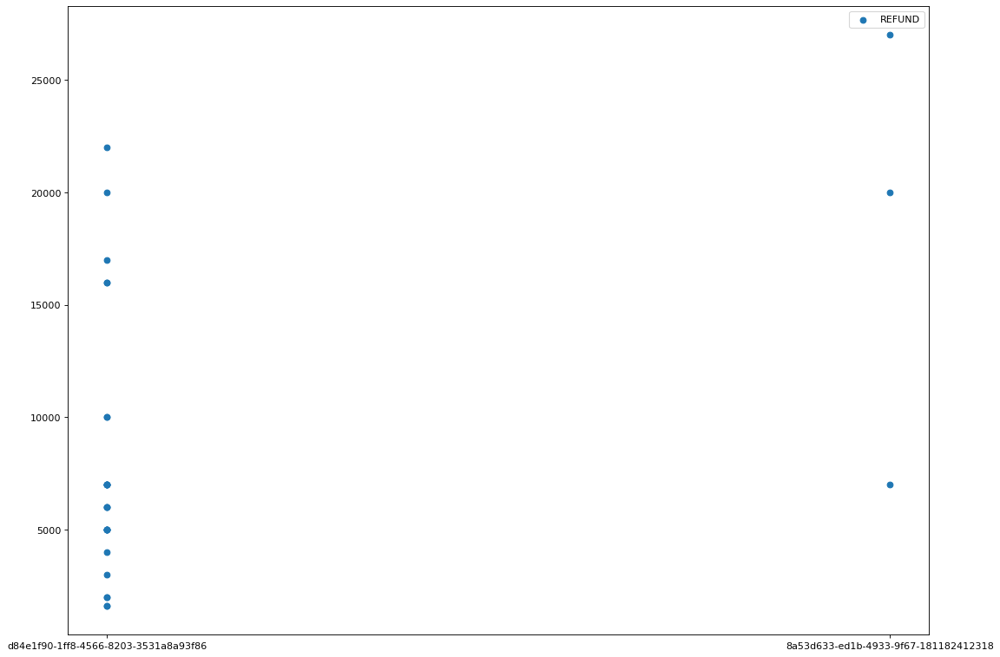

OTHER    29
Name: externalParty.transactionCategory, dtype: int64


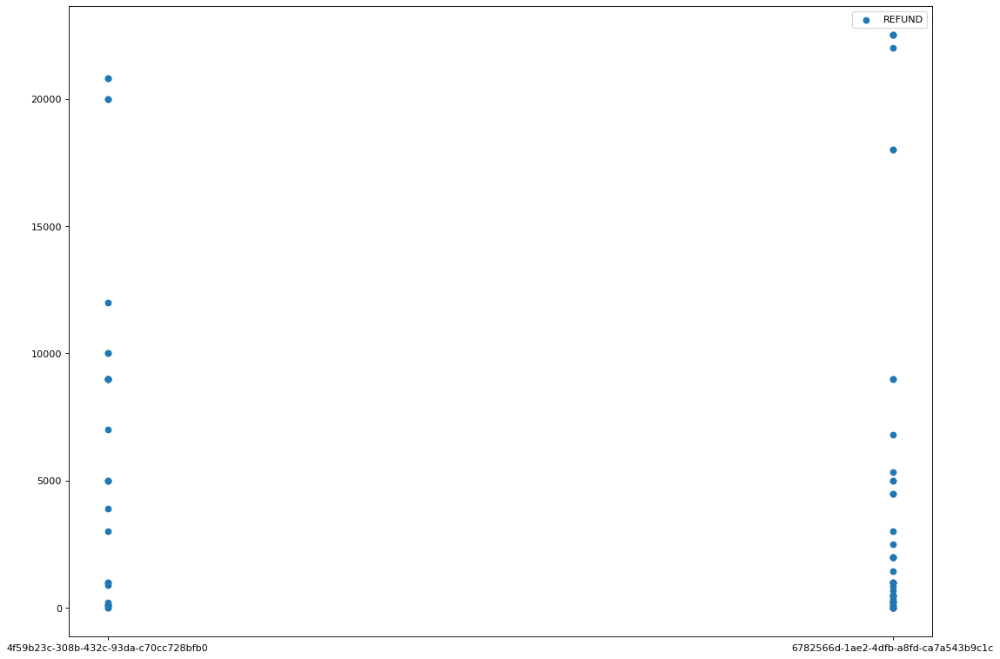

OTHER       71
SHOPPING     1
TRAVEL       1
Name: externalParty.transactionCategory, dtype: int64


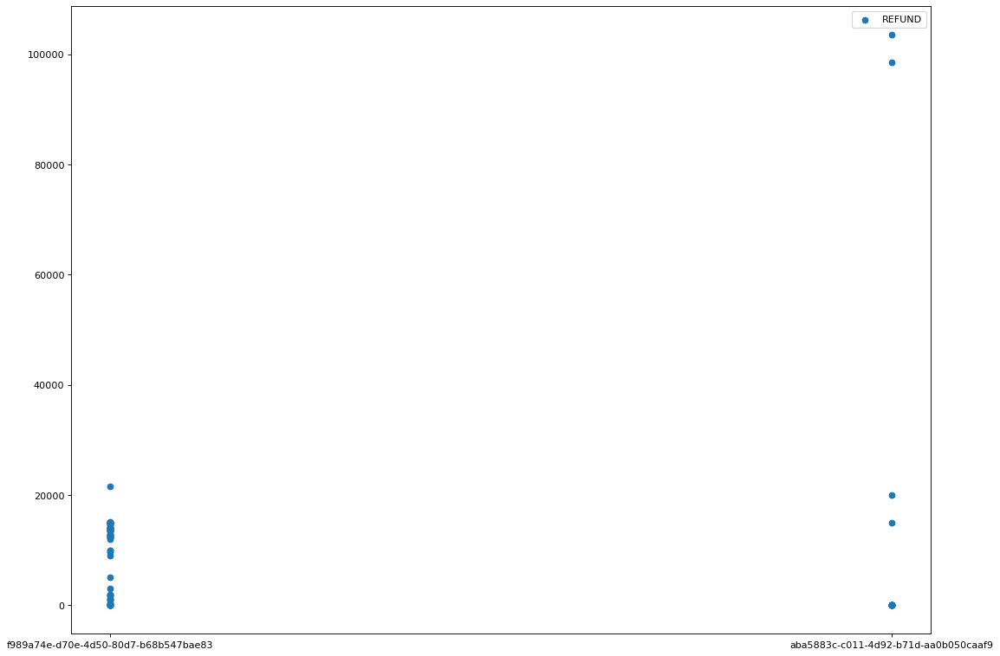

OTHER    109
Name: externalParty.transactionCategory, dtype: int64


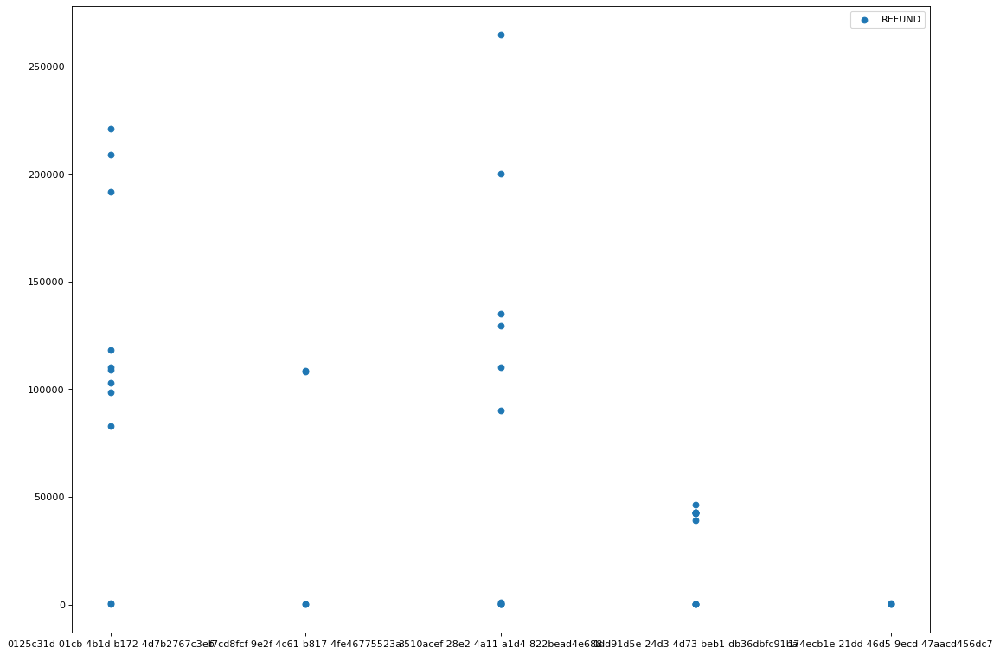

OTHER    41
Name: externalParty.transactionCategory, dtype: int64


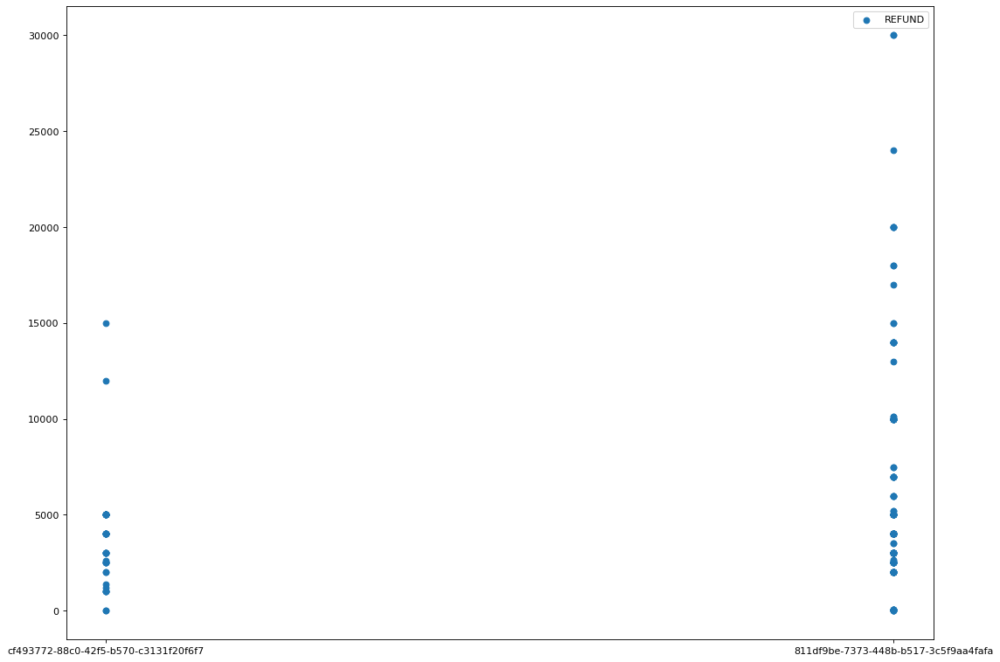

OTHER    226
Name: externalParty.transactionCategory, dtype: int64


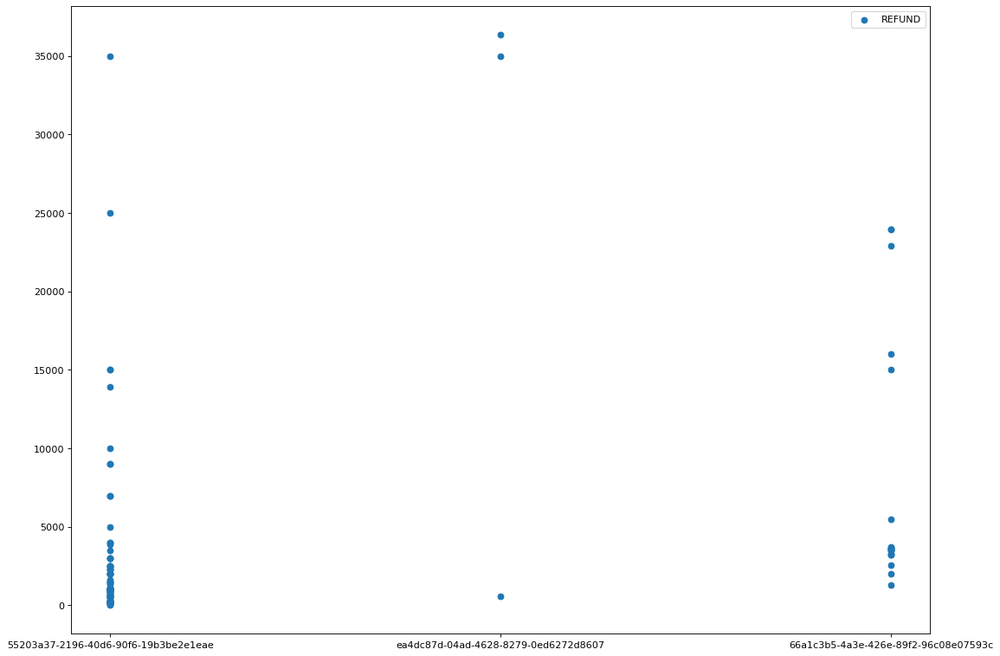

OTHER        84
TRAVEL       15
LIFESTYLE     6
GROCERIES     4
SHOPPING      3
Name: externalParty.transactionCategory, dtype: int64


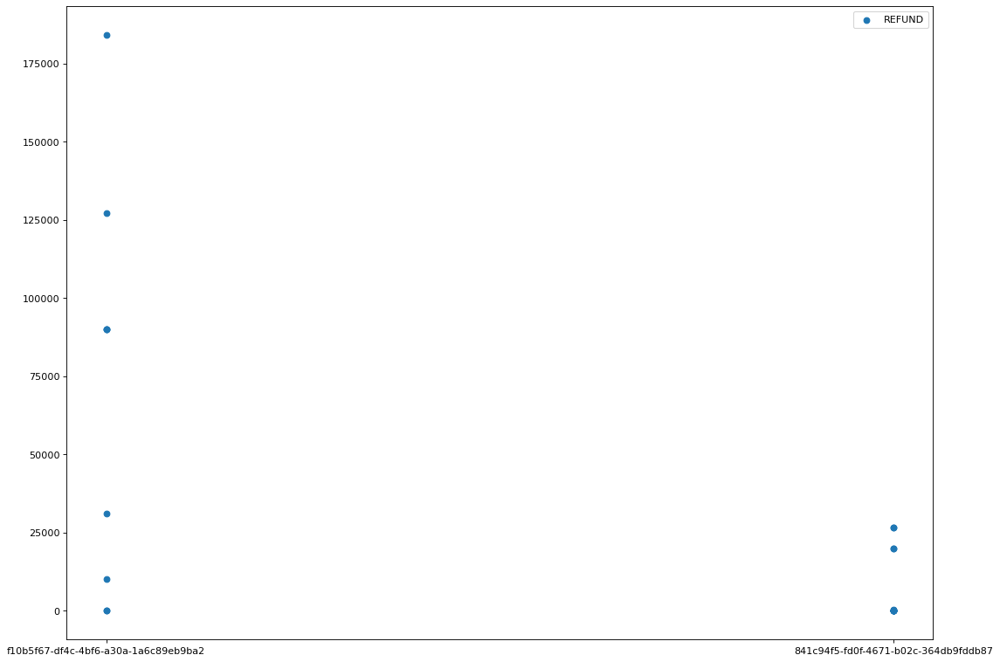

OTHER    23
Name: externalParty.transactionCategory, dtype: int64


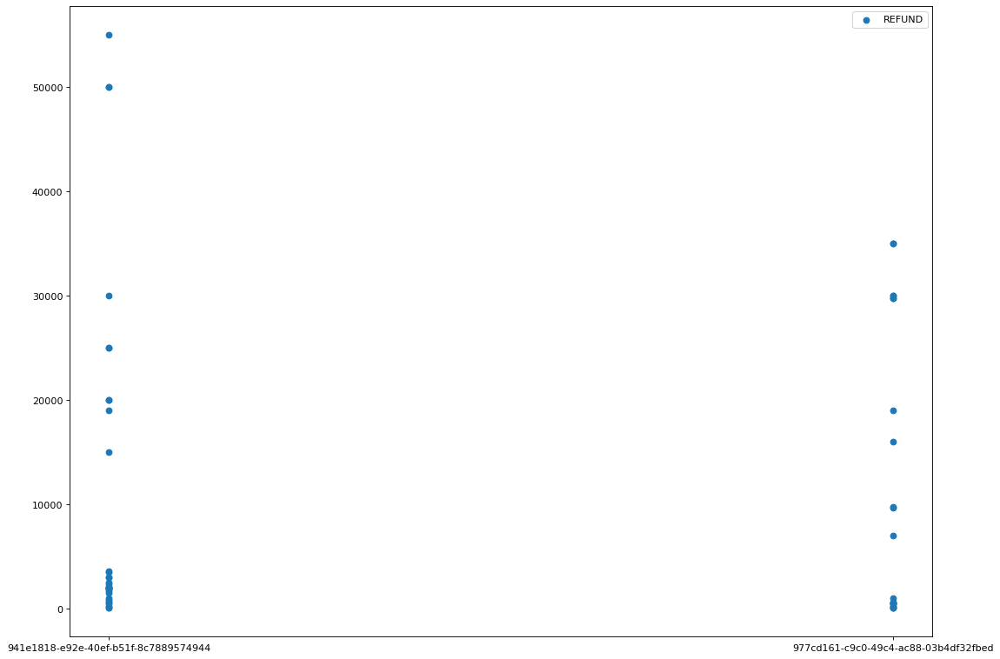

OTHER     47
TRAVEL     8
Name: externalParty.transactionCategory, dtype: int64


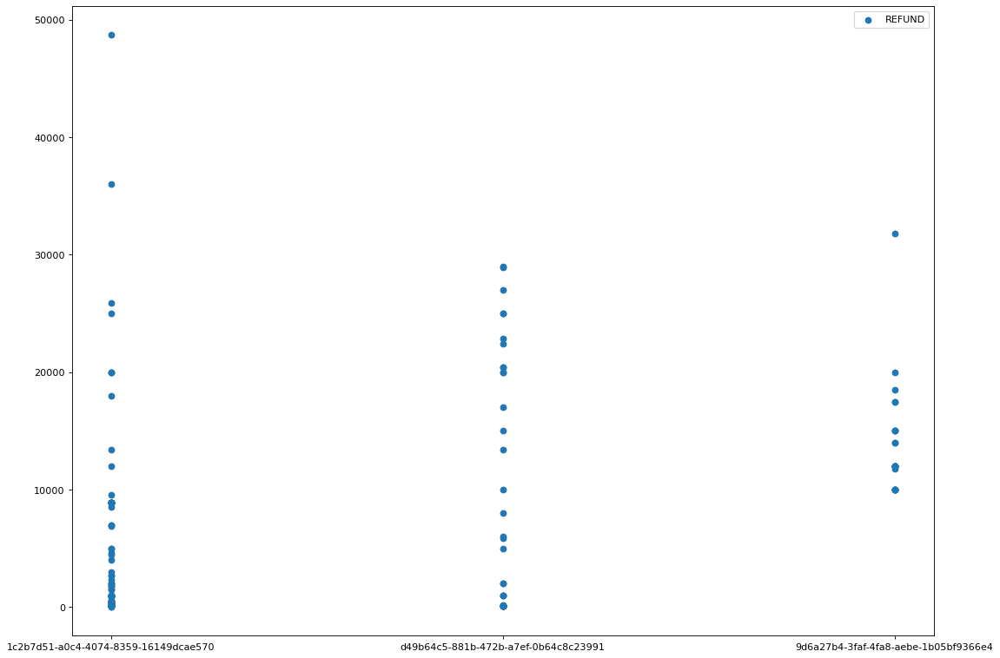

OTHER        125
TRAVEL         7
LIFESTYLE      7
GROCERIES      7
SHOPPING       1
Name: externalParty.transactionCategory, dtype: int64


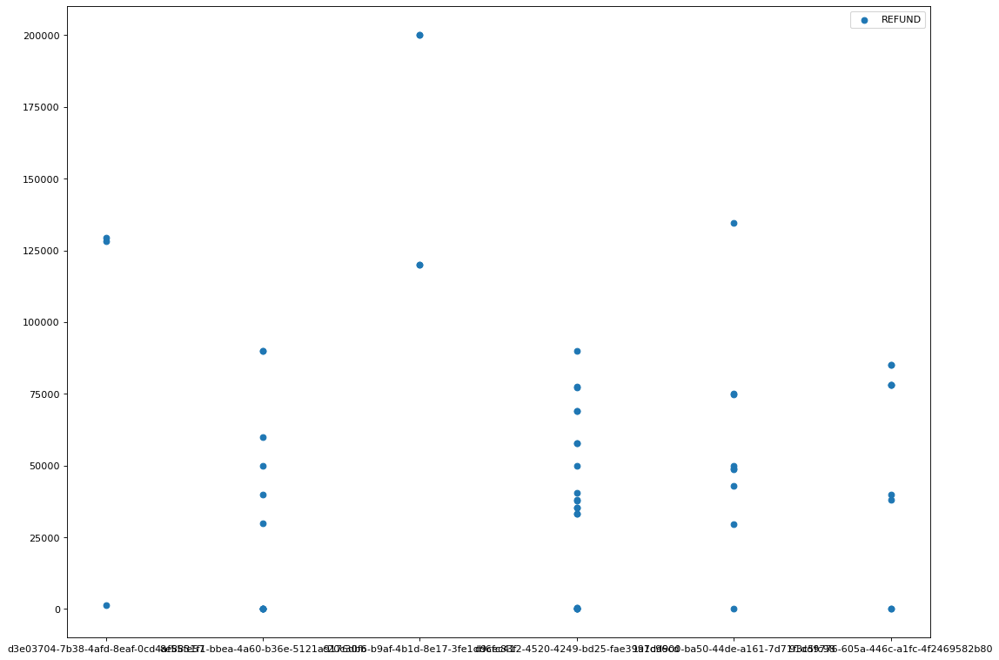

OTHER    57
Name: externalParty.transactionCategory, dtype: int64


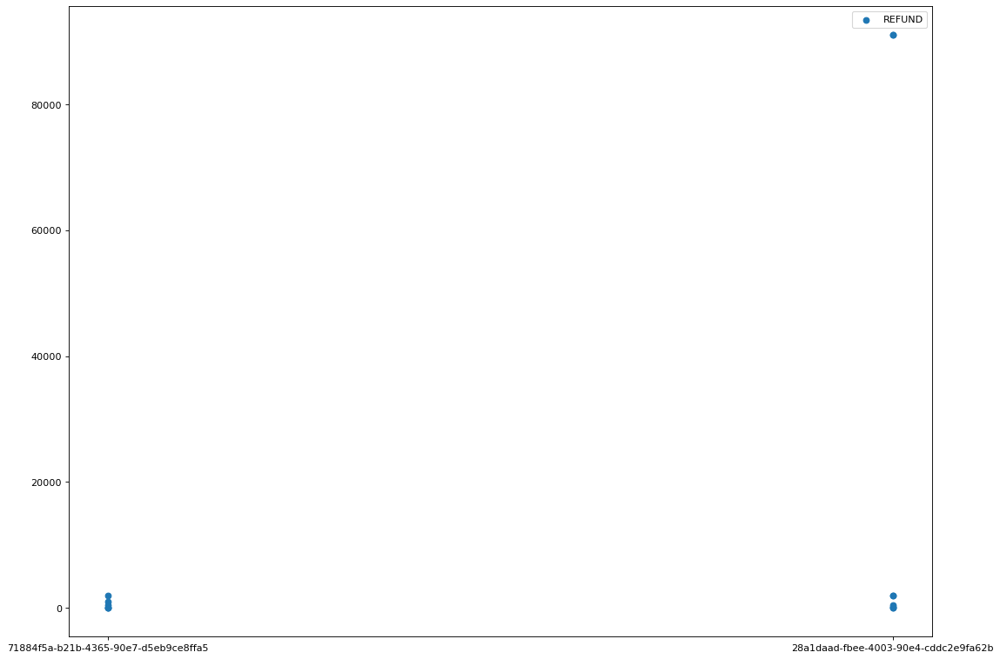

OTHER    14
Name: externalParty.transactionCategory, dtype: int64


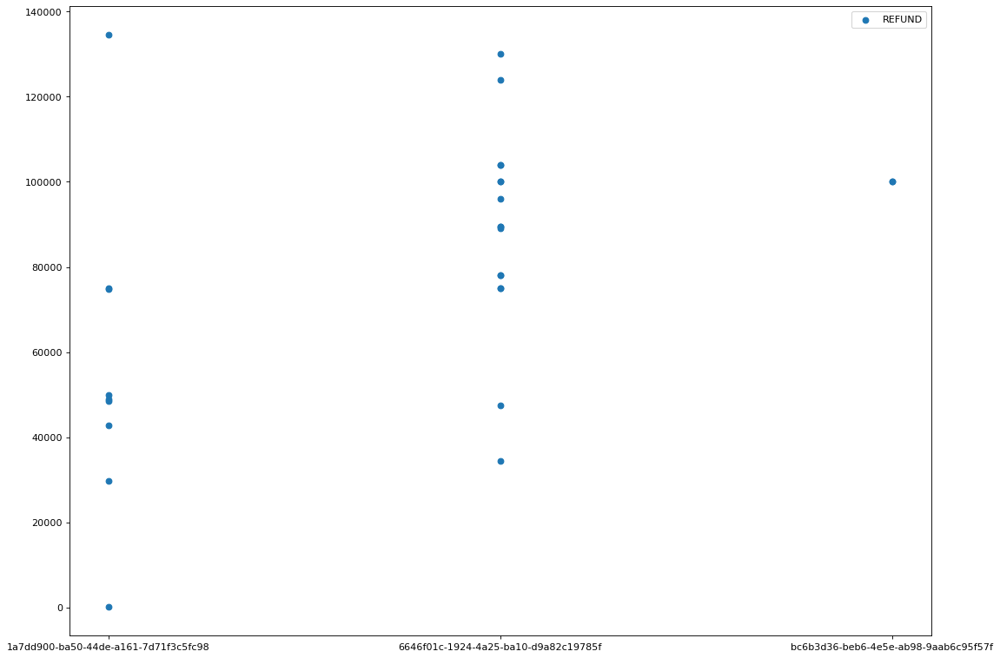

OTHER    27
Name: externalParty.transactionCategory, dtype: int64


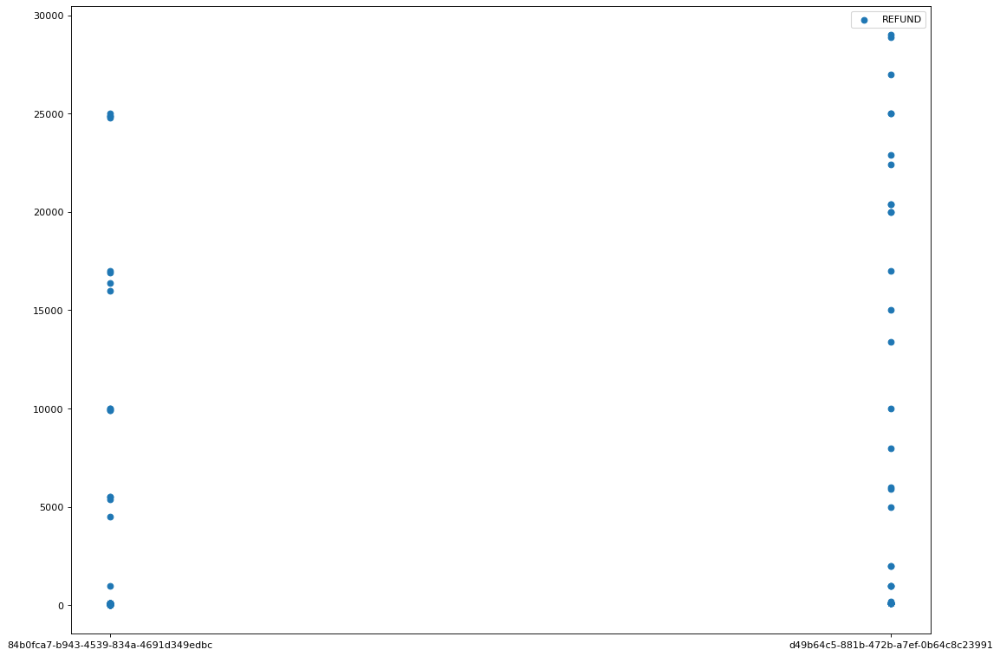

OTHER    88
Name: externalParty.transactionCategory, dtype: int64


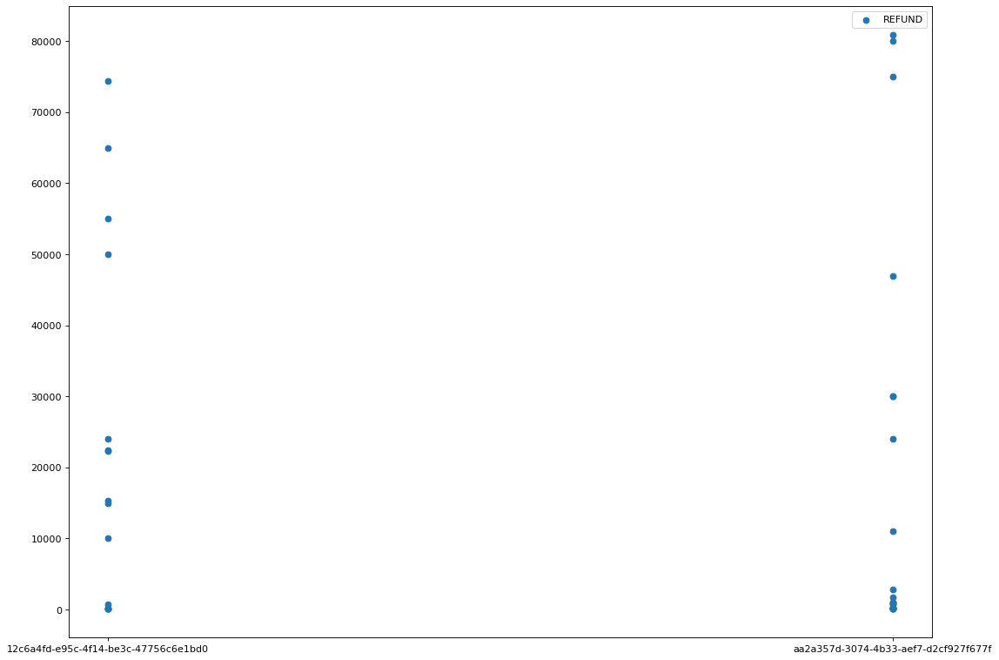

OTHER    38
Name: externalParty.transactionCategory, dtype: int64


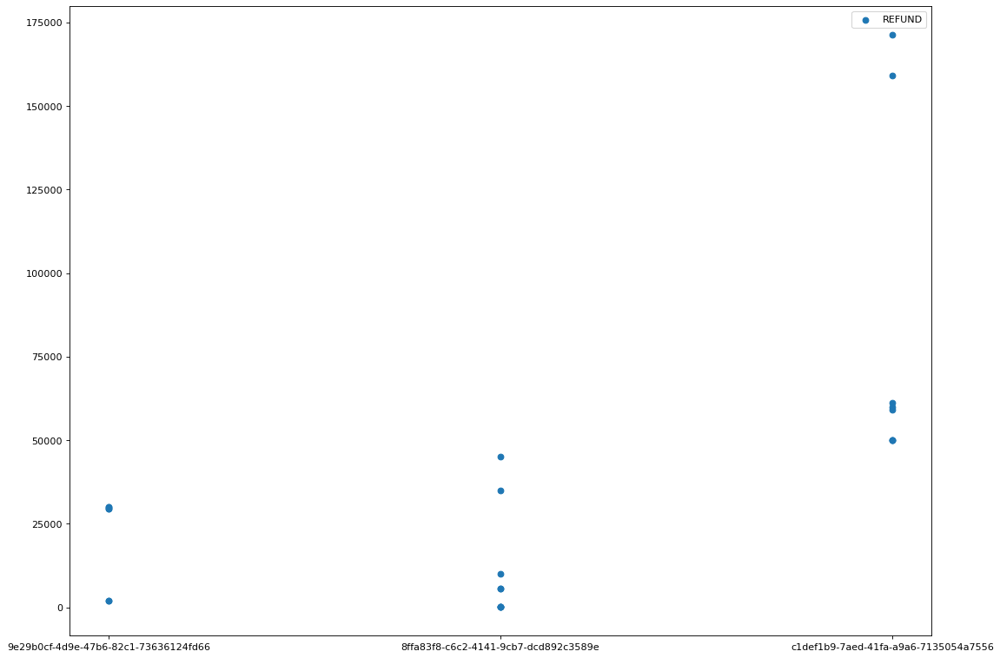

OTHER    23
Name: externalParty.transactionCategory, dtype: int64


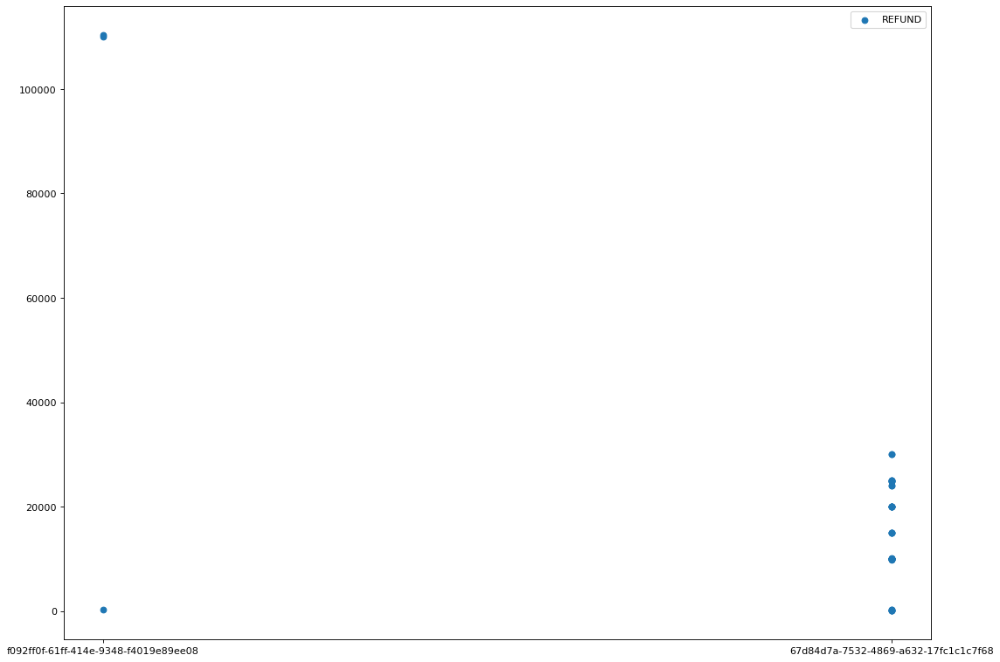

OTHER    43
Name: externalParty.transactionCategory, dtype: int64


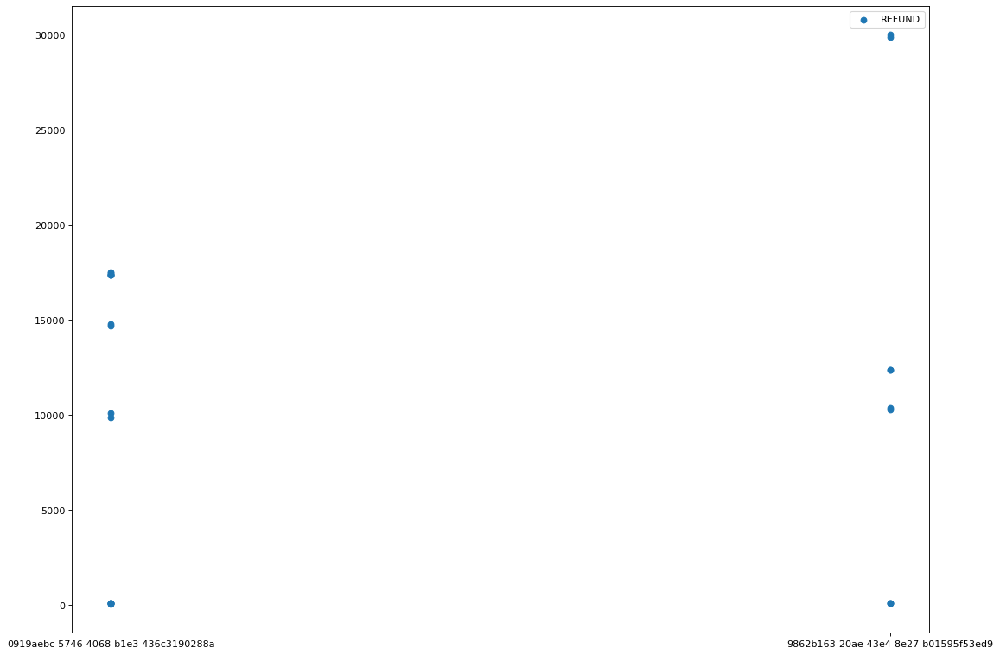

OTHER    25
Name: externalParty.transactionCategory, dtype: int64


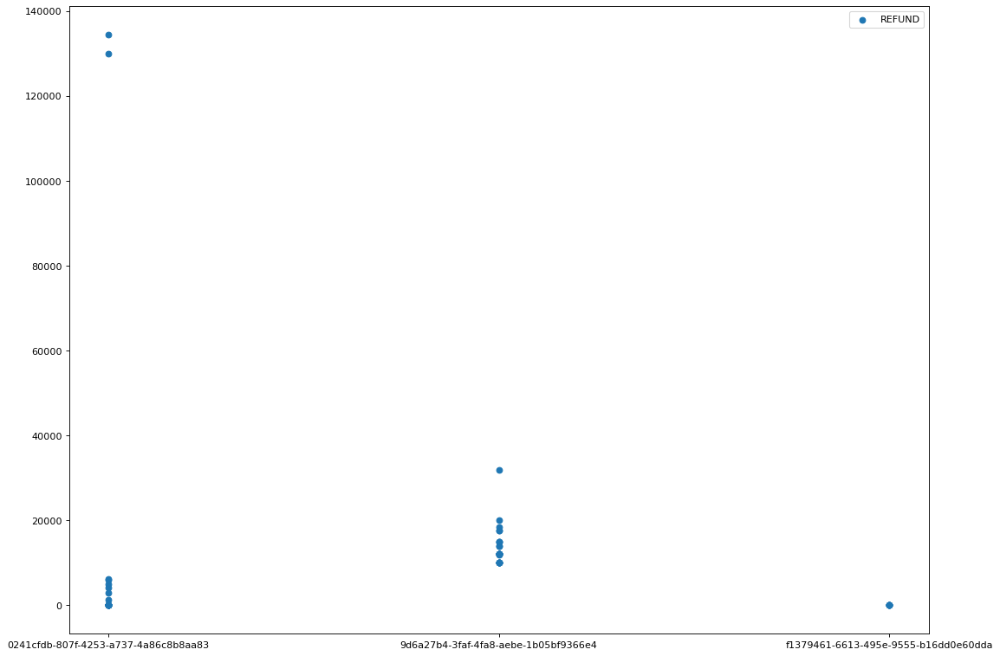

OTHER    53
Name: externalParty.transactionCategory, dtype: int64


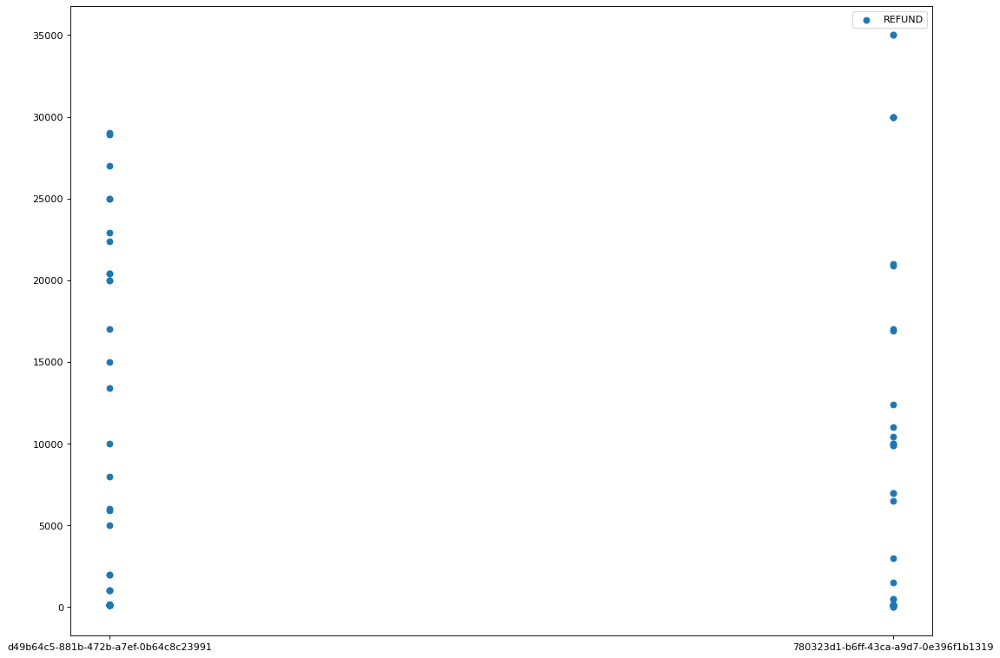

OTHER        79
GROCERIES     2
Name: externalParty.transactionCategory, dtype: int64


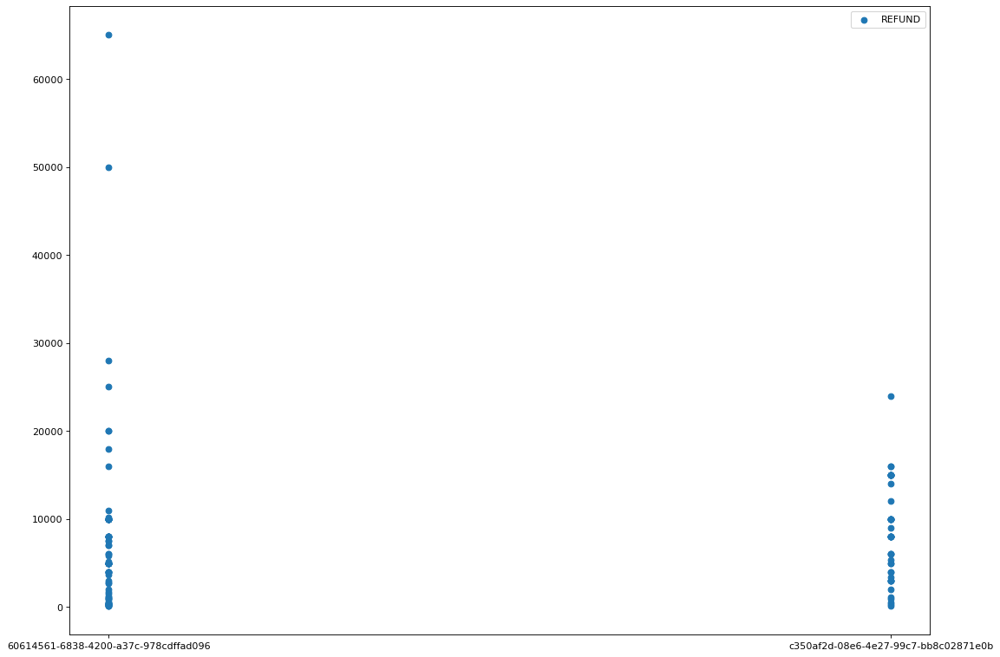

OTHER        96
GROCERIES     8
TRAVEL        8
LIFESTYLE     6
SHOPPING      4
Name: externalParty.transactionCategory, dtype: int64


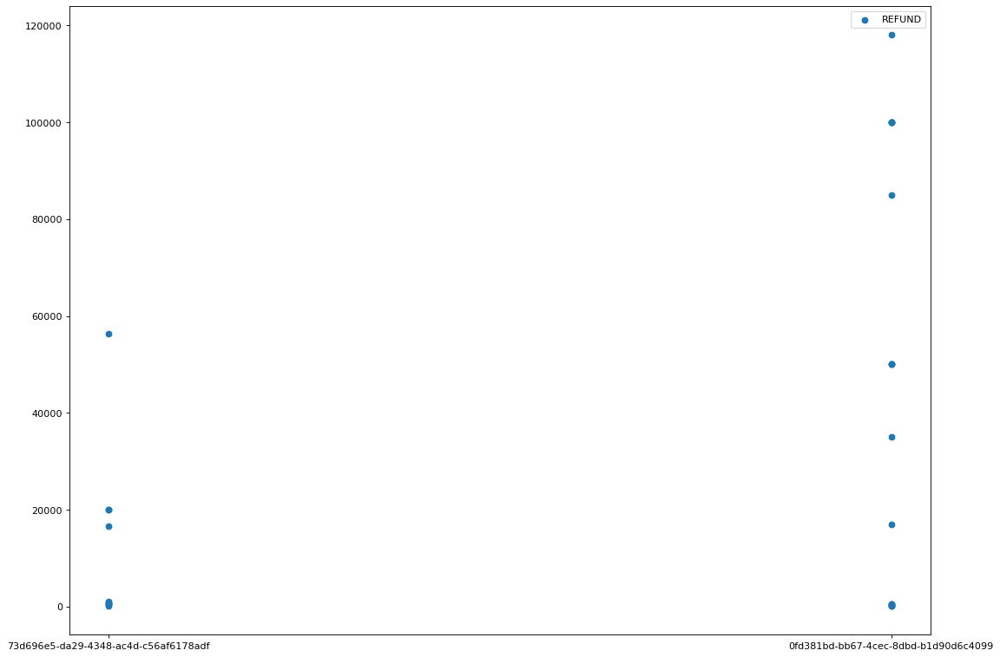

OTHER    27
Name: externalParty.transactionCategory, dtype: int64


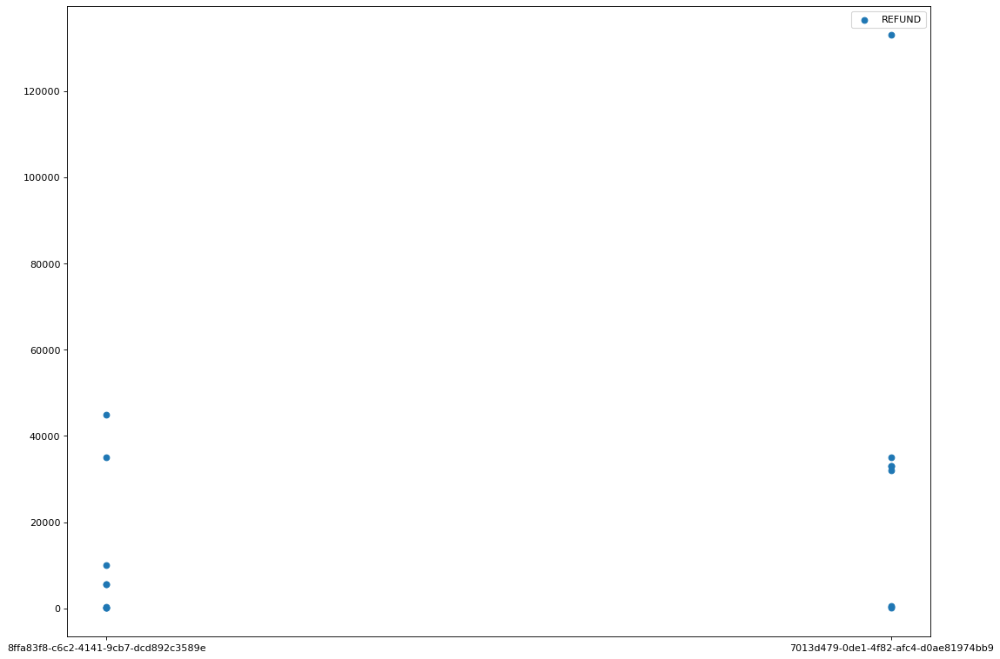

OTHER    17
Name: externalParty.transactionCategory, dtype: int64


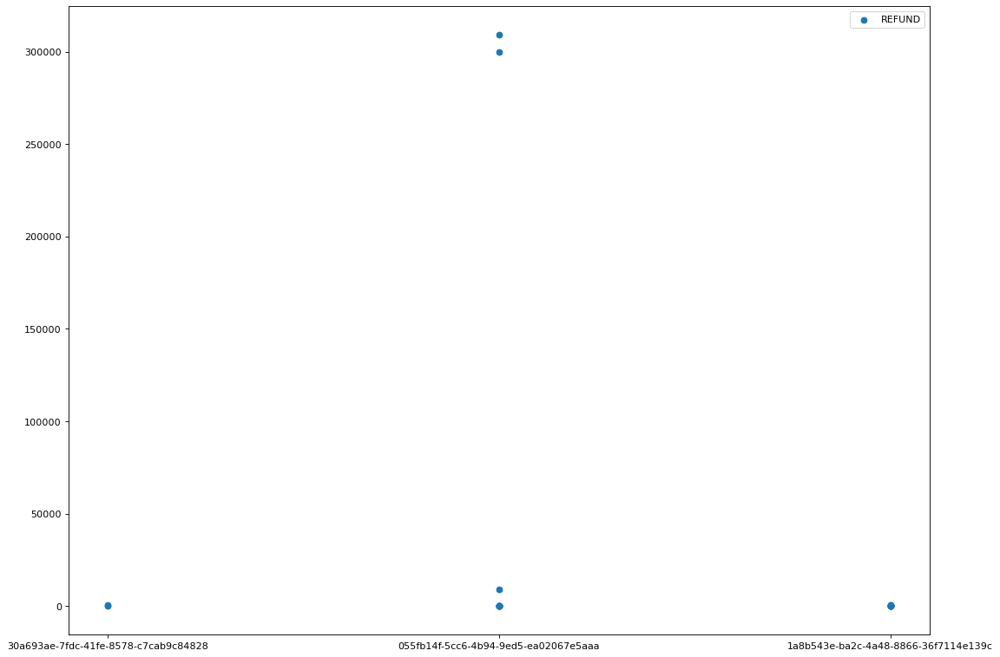

OTHER    21
Name: externalParty.transactionCategory, dtype: int64


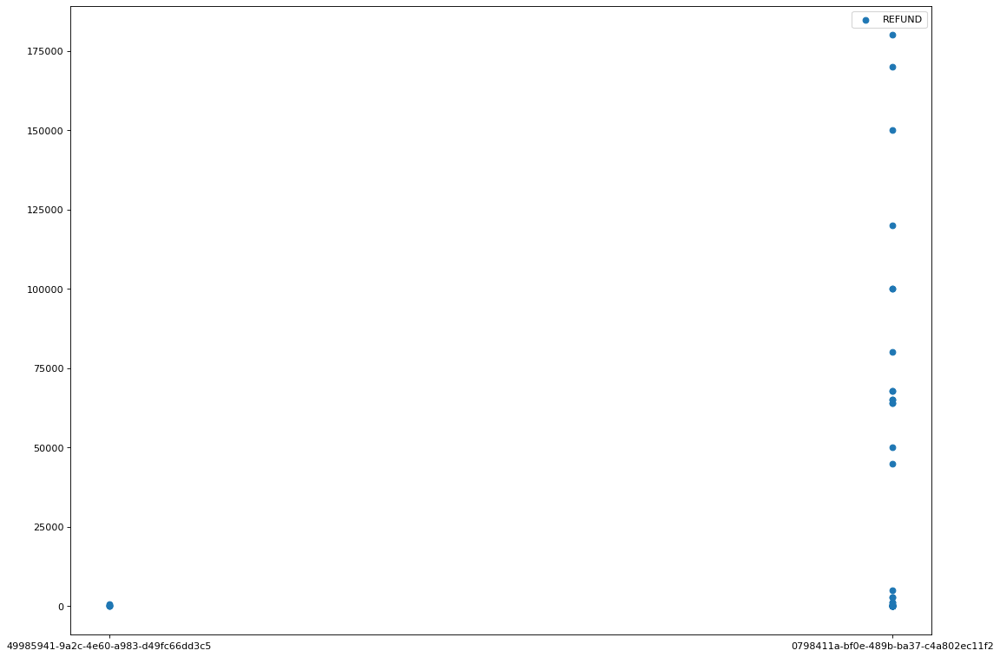

OTHER    53
Name: externalParty.transactionCategory, dtype: int64


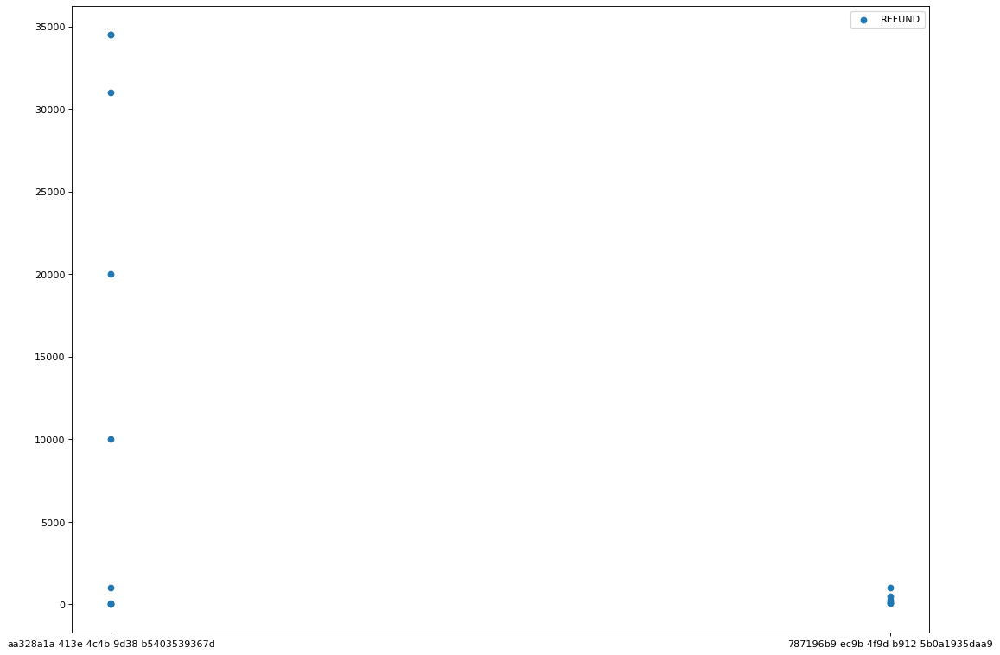

OTHER    15
Name: externalParty.transactionCategory, dtype: int64


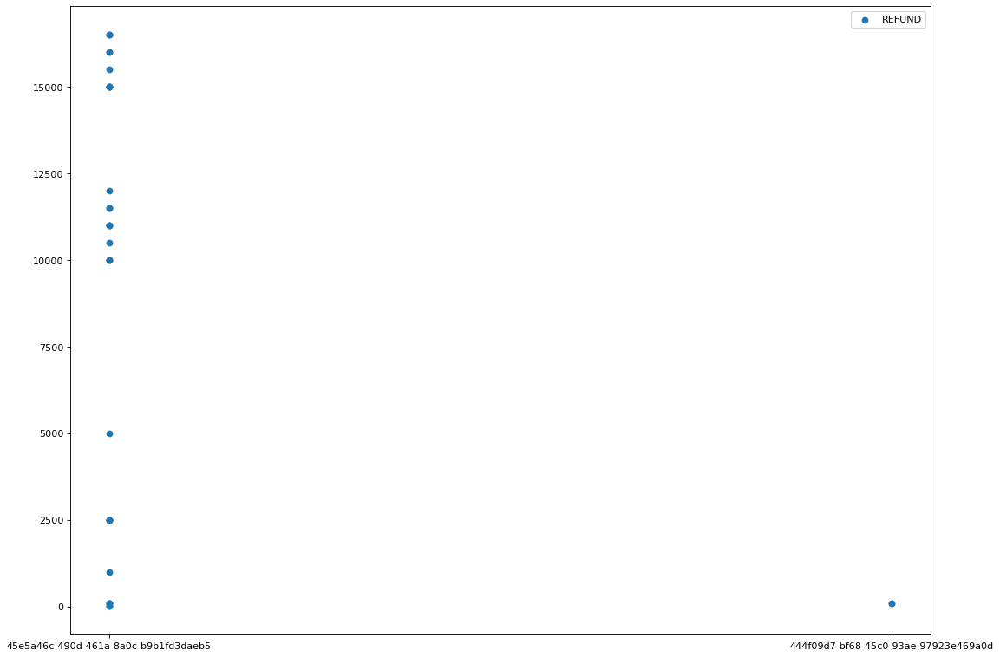

OTHER    32
Name: externalParty.transactionCategory, dtype: int64


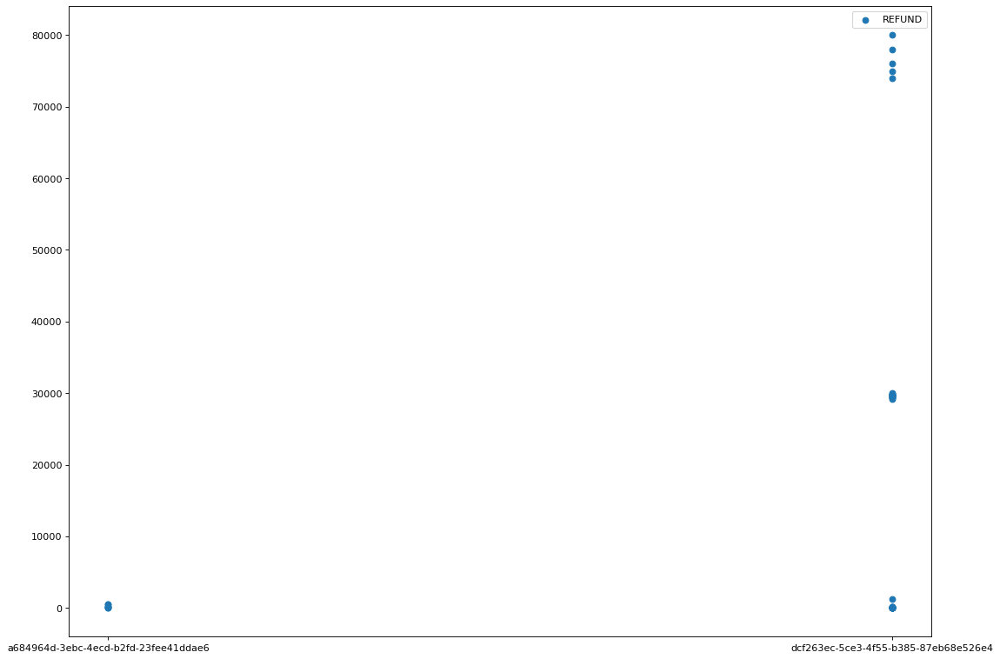

OTHER    49
Name: externalParty.transactionCategory, dtype: int64


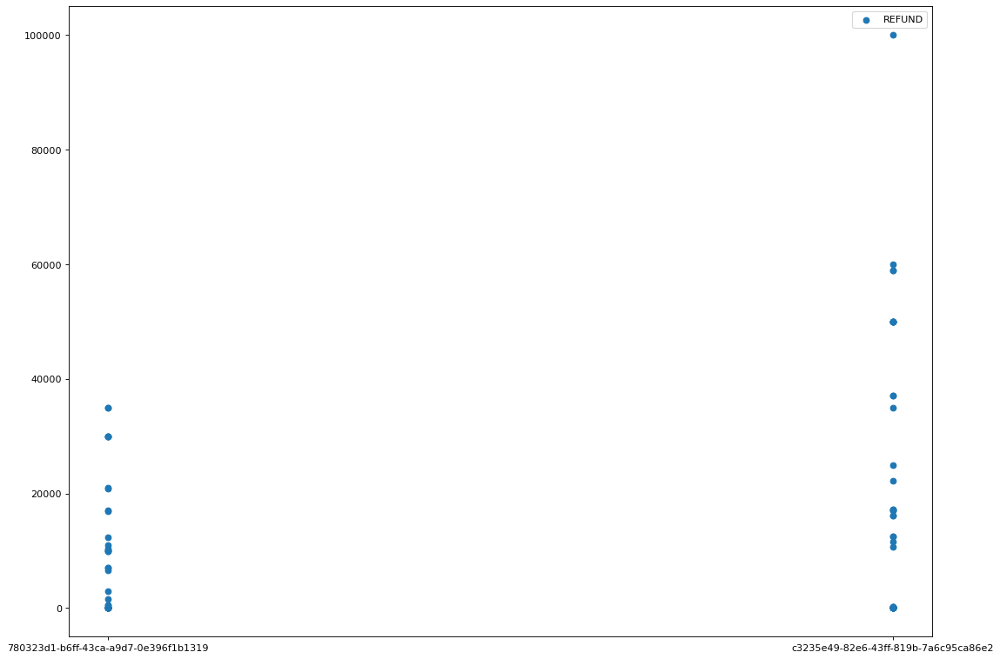

OTHER        82
GROCERIES     2
Name: externalParty.transactionCategory, dtype: int64


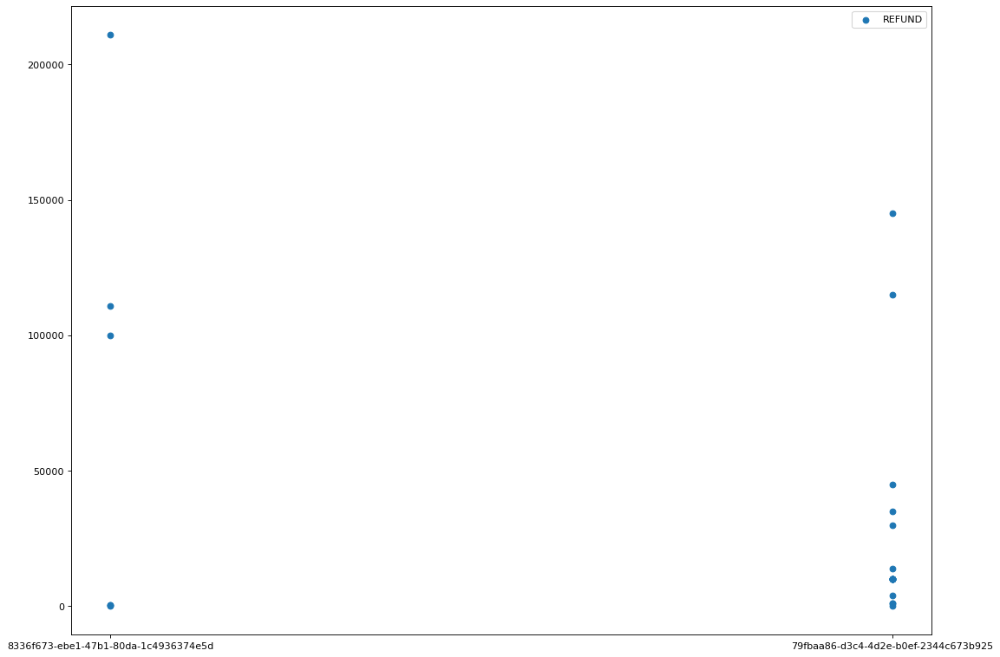

OTHER    24
Name: externalParty.transactionCategory, dtype: int64


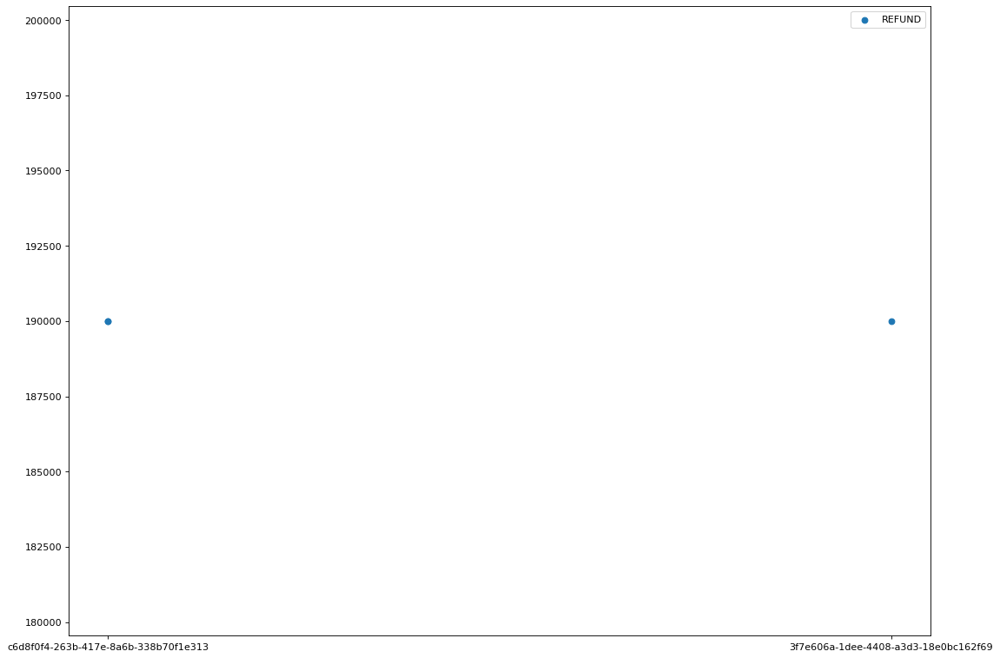

OTHER    3
Name: externalParty.transactionCategory, dtype: int64


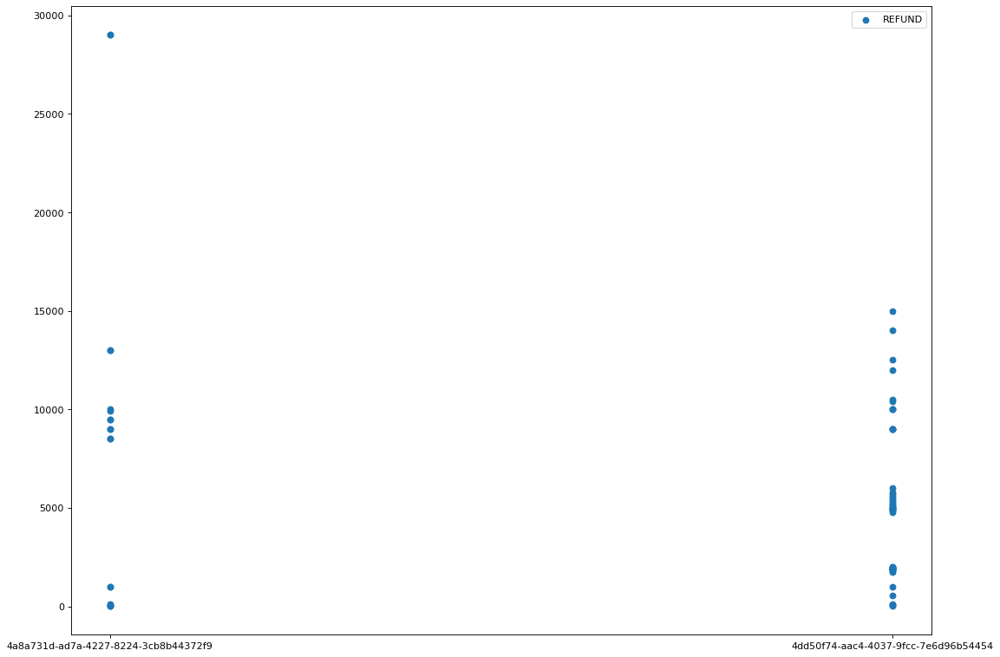

OTHER    72
Name: externalParty.transactionCategory, dtype: int64


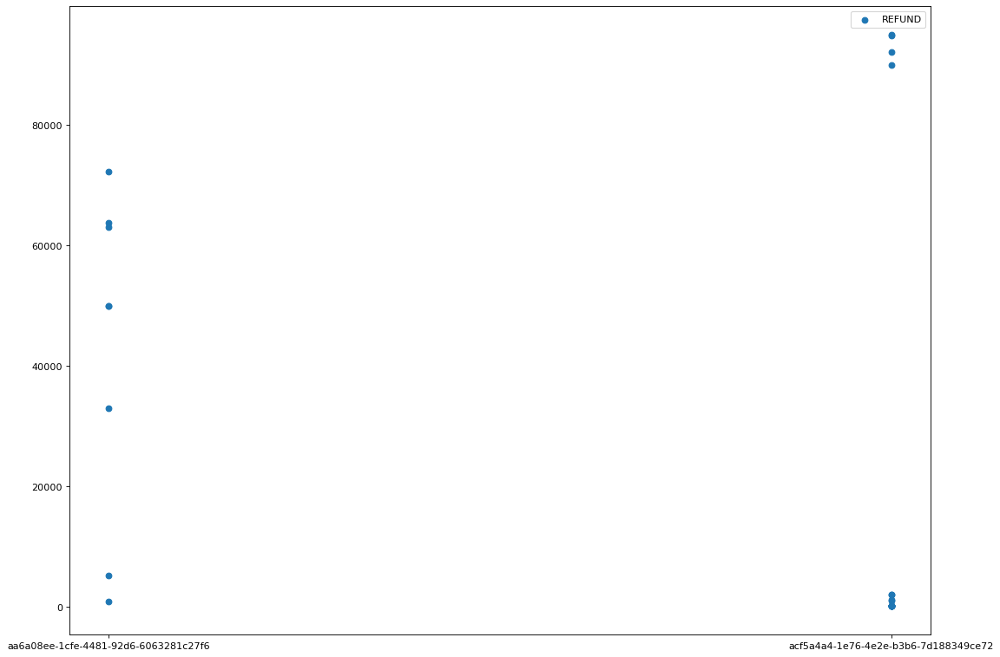

OTHER    25
Name: externalParty.transactionCategory, dtype: int64
{'33766485_40374': {'45d0a9bd-a93d-4229-9060-43d8ca116c4d', '70e08a80-60c2-4e4f-8ba7-f2867bb18263', 'feb39a65-f65d-46bb-ba14-f85121e18e6c', 'd35df394-cfd3-4c05-a1a7-b58e076c25d4', 'd510f389-b643-4161-8c1d-77795cf58a62', '459e9e2f-2486-404b-9ce1-1f1ee7e8be10', '03c41916-9a27-49a9-9118-ed526954ba40', 'b7267a16-2c16-4809-a8f7-5b8103a965ee', '62ee7ee0-7afa-4aeb-83f5-df9761ad45d3', '901c8e3d-11b8-490d-892a-360e7308fda4', '8689b441-4ae6-4f52-ae73-56766ebcf262', 'a0ff1240-7b15-448c-9922-68a2ef52d2f3', '8ab398ef-b286-41ab-92ed-505d970efbbd', '96cfc578-a0ed-42fc-9914-acaeacc3dbfa', '16a0c3e4-72c0-4ddd-9382-0d23049f8539', '3e123827-b282-4ab9-abf9-2a05f12f9c70', 'aff60ffd-dd08-40e4-9cbb-fbe2d1623c72', '32b58303-7666-407f-b4f6-761973e7ba82', 'bf75ad9d-82f0-4bc4-bb0b-b09b660cf537', 'eeb5dff2-ce3b-4ab9-99b3-5e90233e0823', '263abbbc-c980-4ea1-bd2a-bf4bc5be7a7c', '74aa5b96-f498-4858-91a5-fc5f16469b93', 'c46d0ded-2f9d-49cf-9206-a824c4363

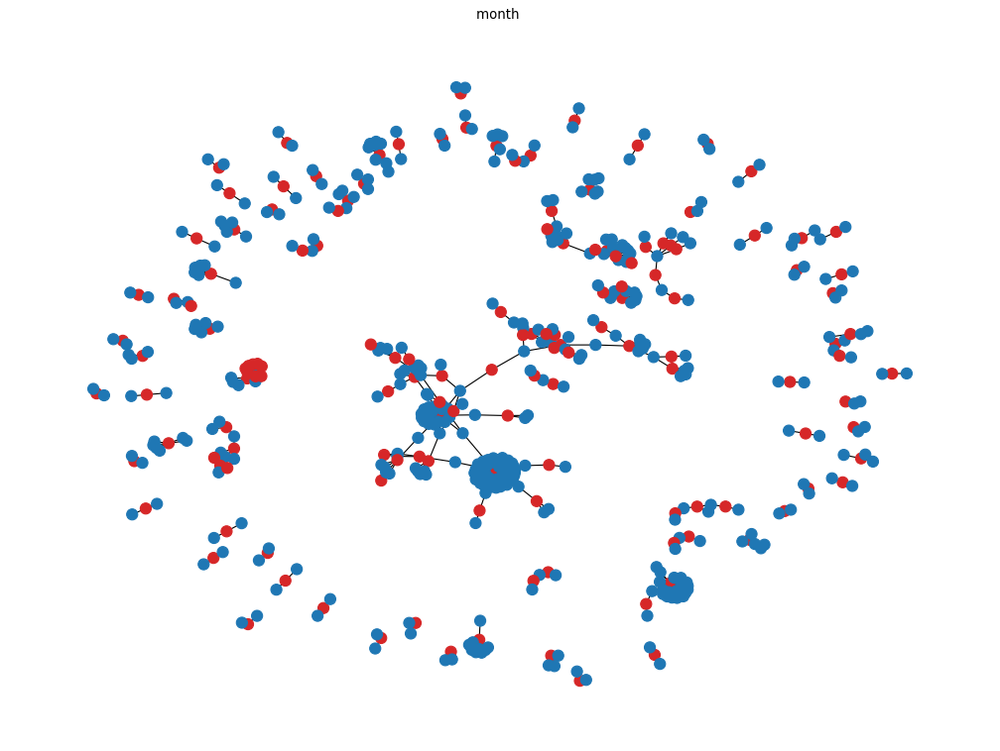

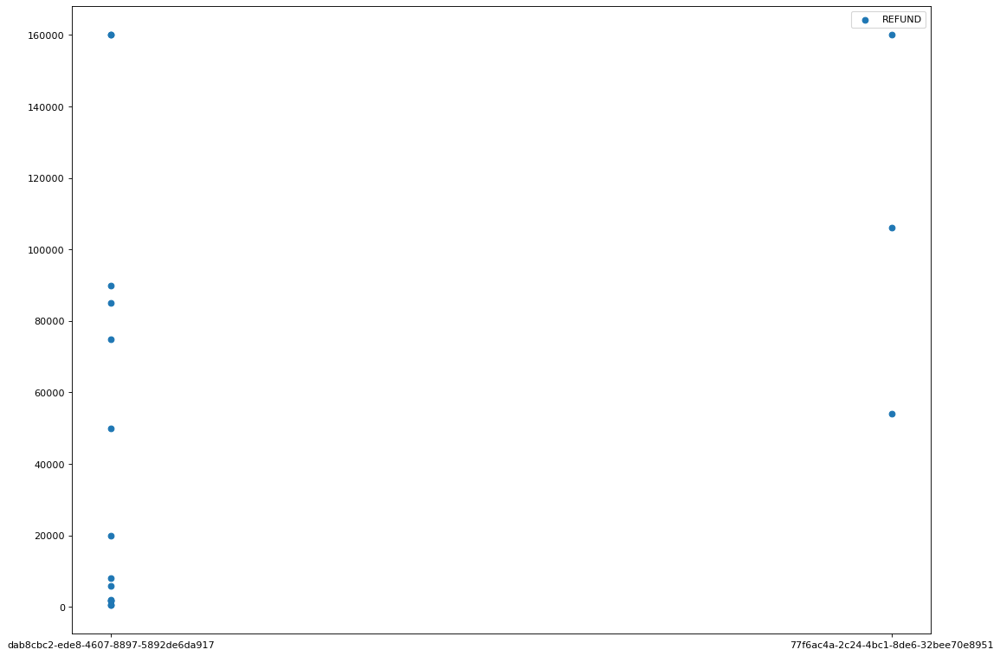

OTHER    17
Name: externalParty.transactionCategory, dtype: int64


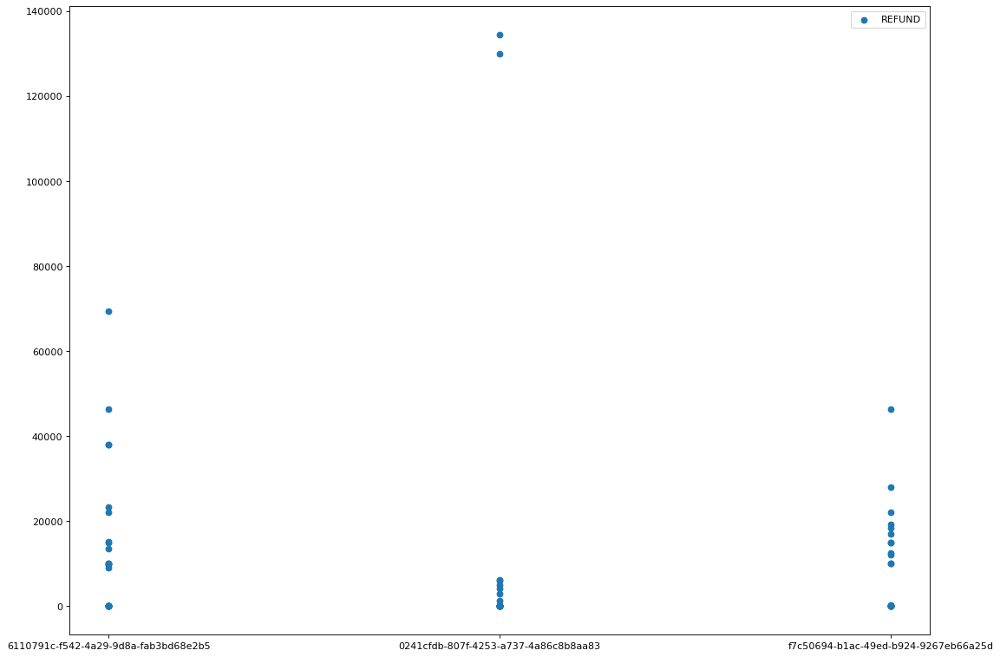

OTHER    66
Name: externalParty.transactionCategory, dtype: int64


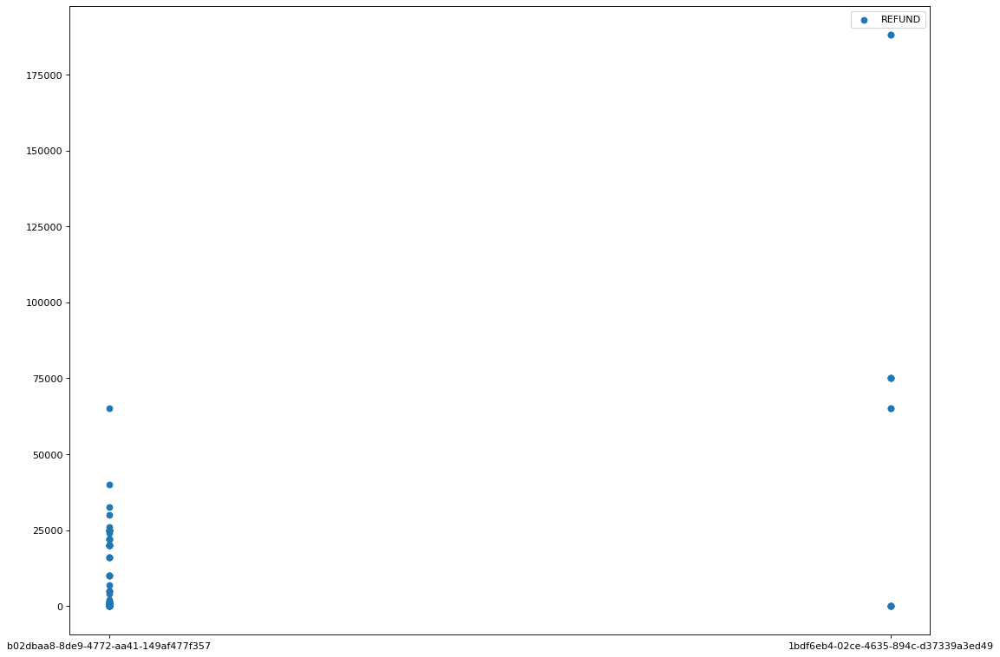

OTHER        77
LIFESTYLE     5
GROCERIES     5
TRAVEL        1
Name: externalParty.transactionCategory, dtype: int64


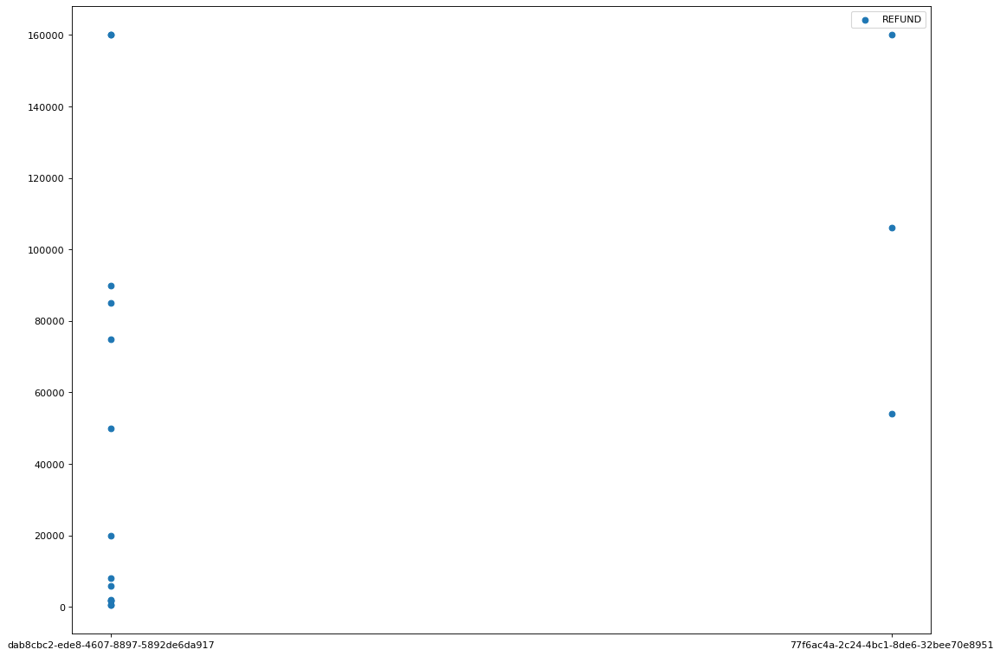

OTHER    17
Name: externalParty.transactionCategory, dtype: int64


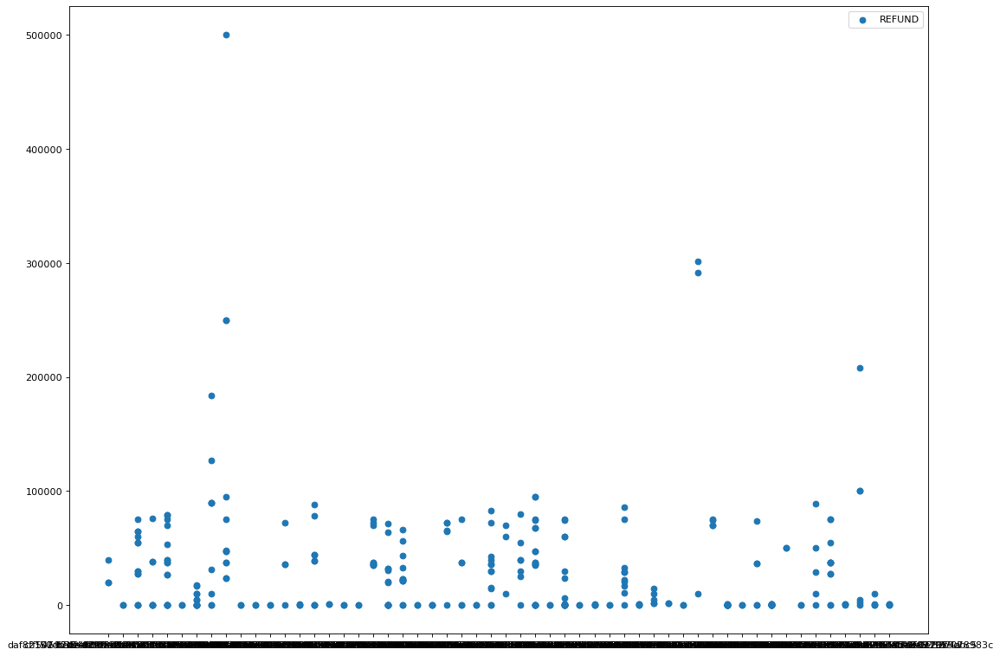

OTHER    323
Name: externalParty.transactionCategory, dtype: int64


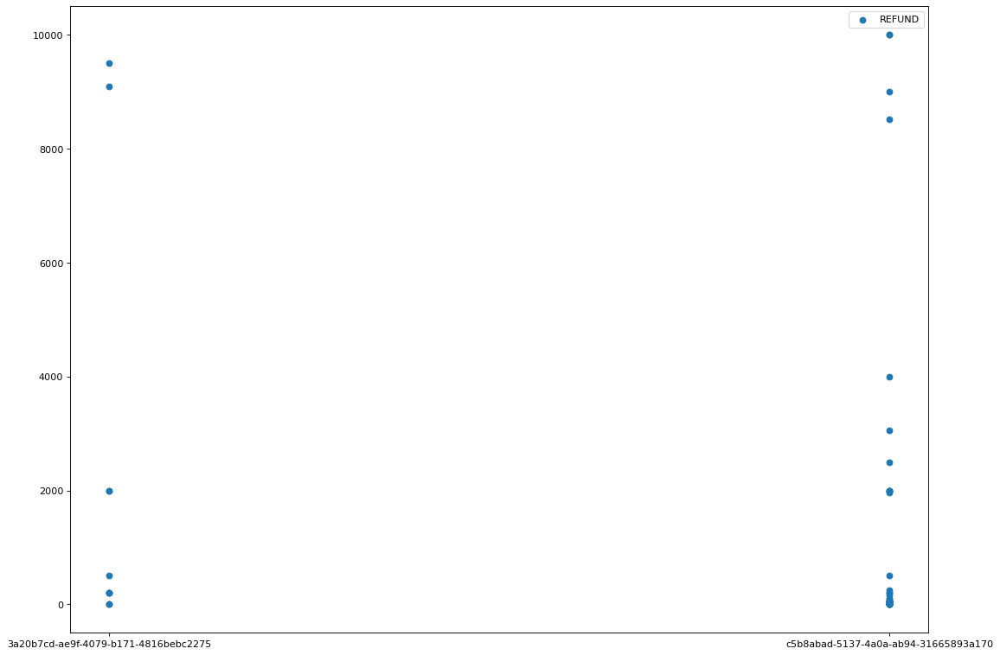

OTHER    49
Name: externalParty.transactionCategory, dtype: int64


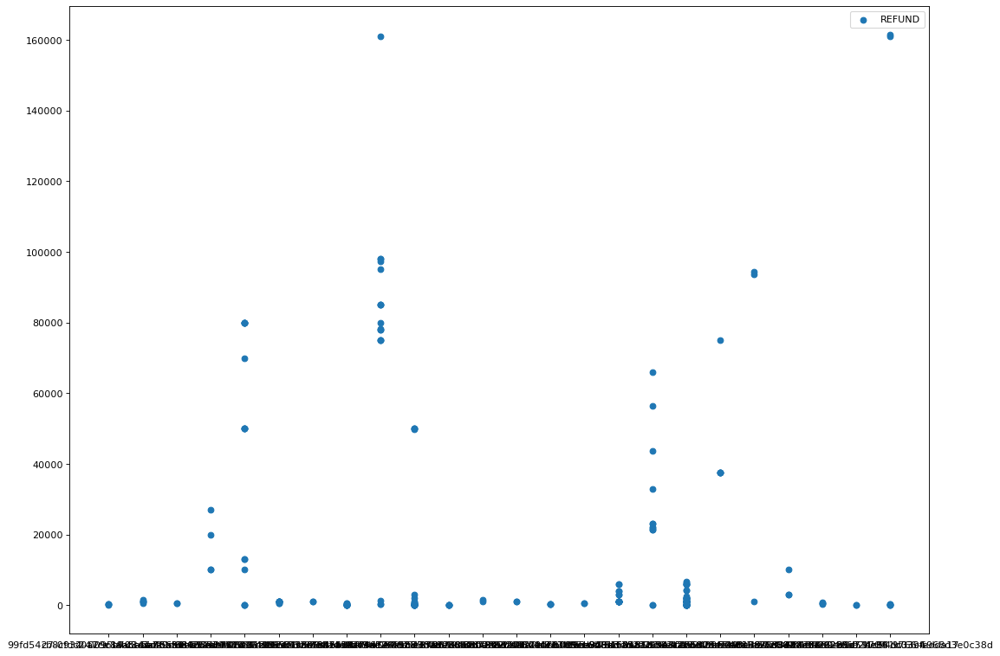

OTHER        197
LIFESTYLE      4
TRAVEL         3
GROCERIES      2
Name: externalParty.transactionCategory, dtype: int64


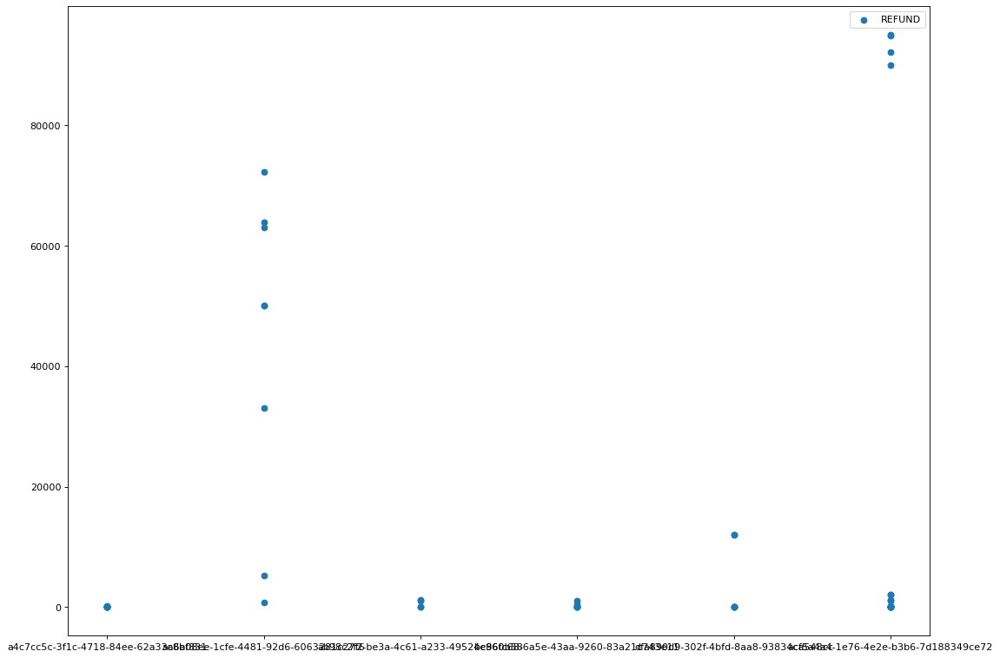

OTHER    50
Name: externalParty.transactionCategory, dtype: int64


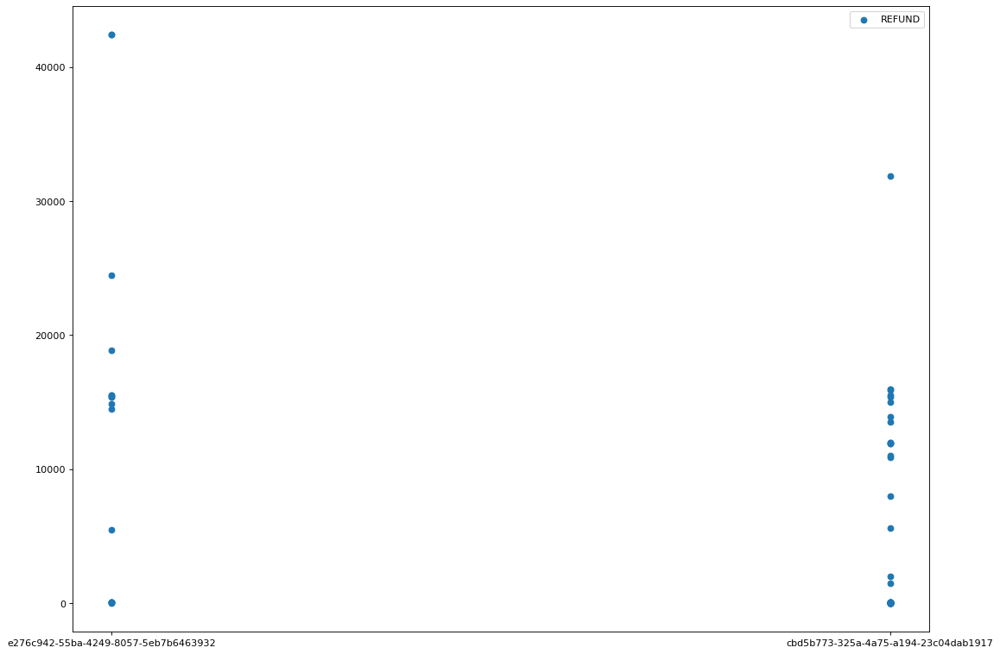

OTHER    60
Name: externalParty.transactionCategory, dtype: int64


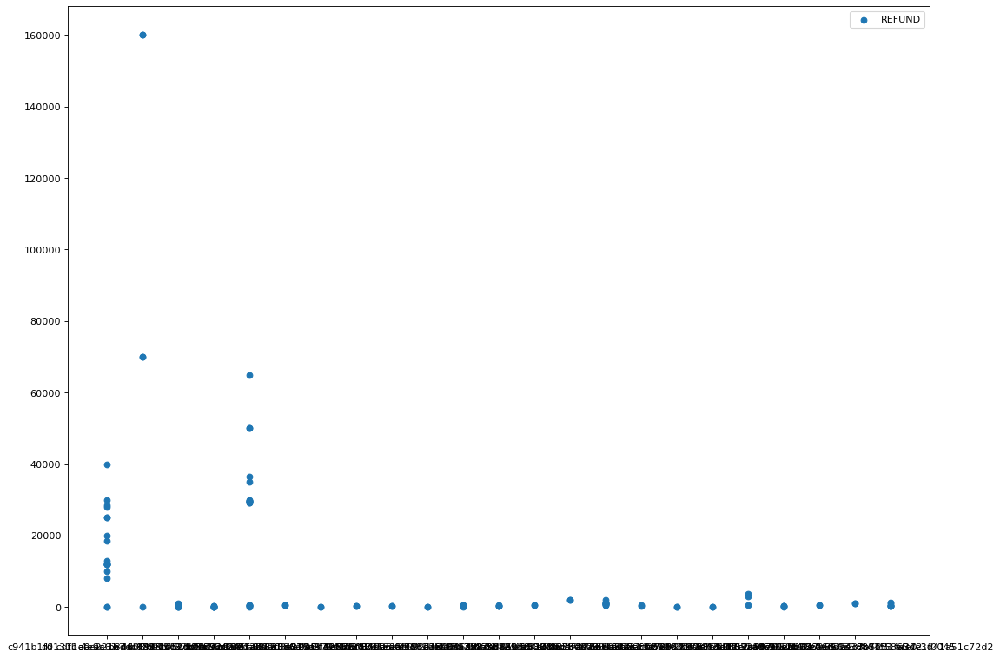

OTHER    110
Name: externalParty.transactionCategory, dtype: int64


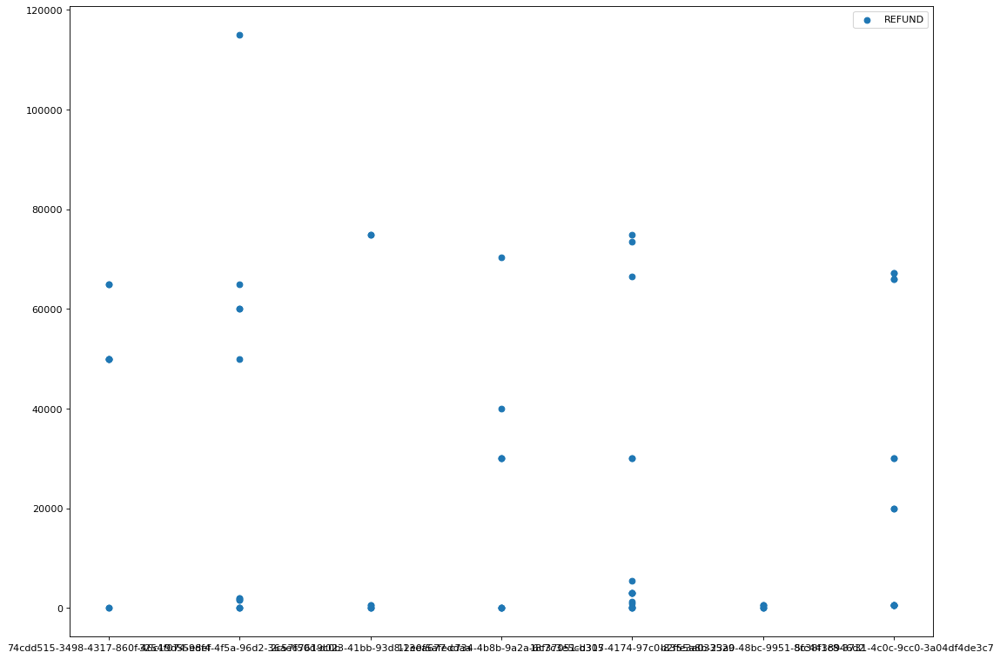

OTHER       71
SHOPPING     1
Name: externalParty.transactionCategory, dtype: int64


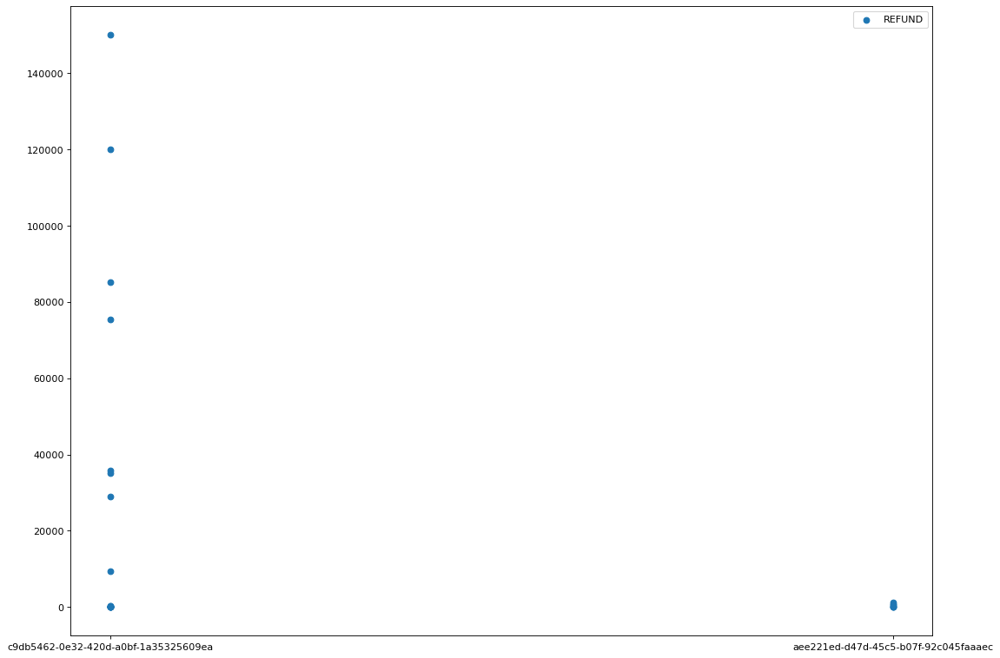

OTHER    22
Name: externalParty.transactionCategory, dtype: int64


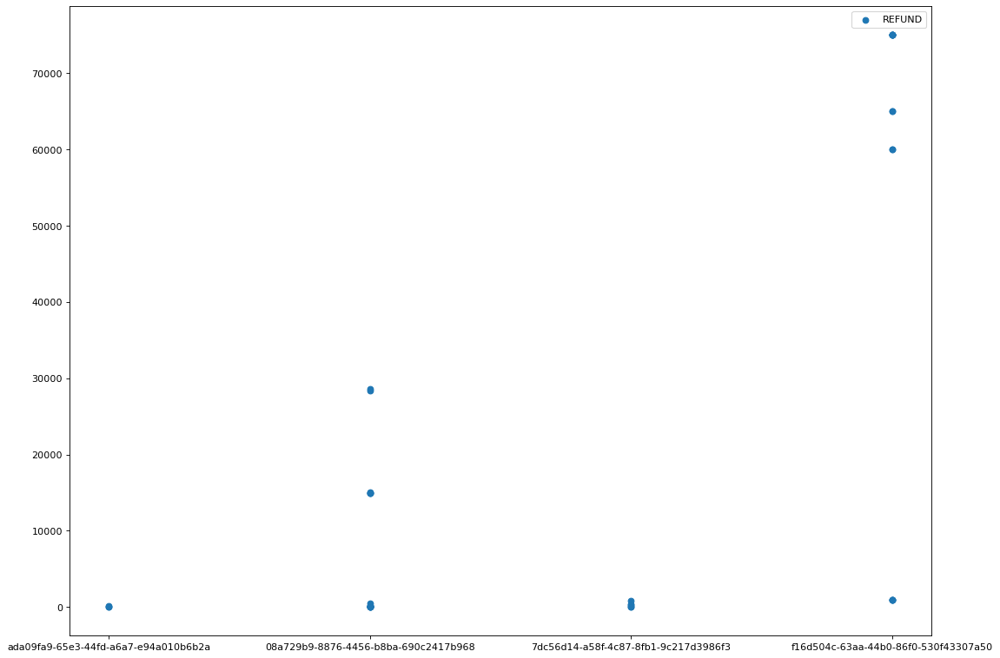

OTHER    37
Name: externalParty.transactionCategory, dtype: int64


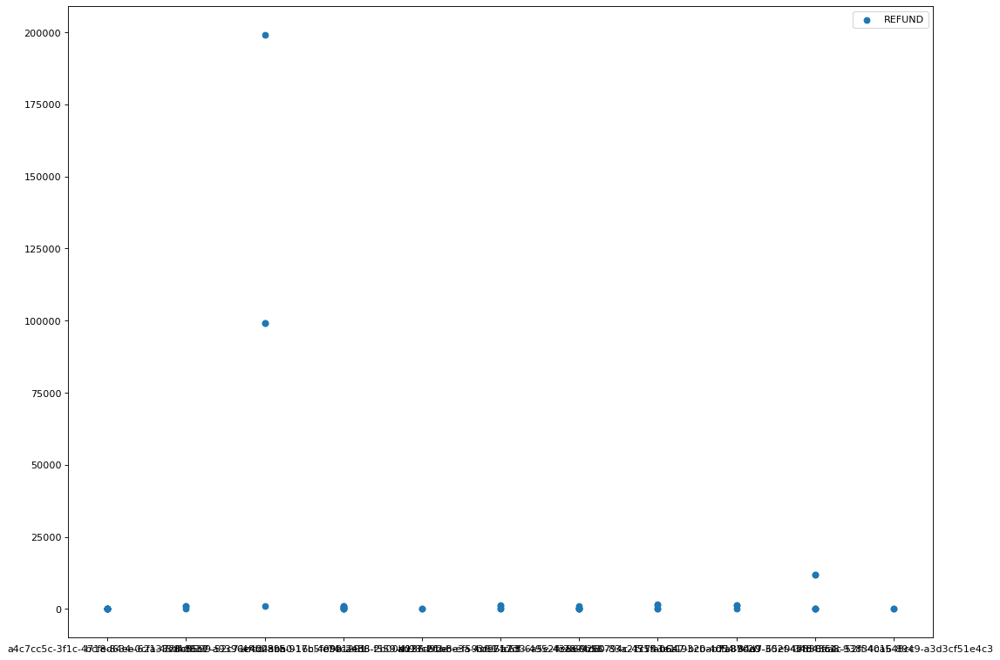

OTHER    51
Name: externalParty.transactionCategory, dtype: int64


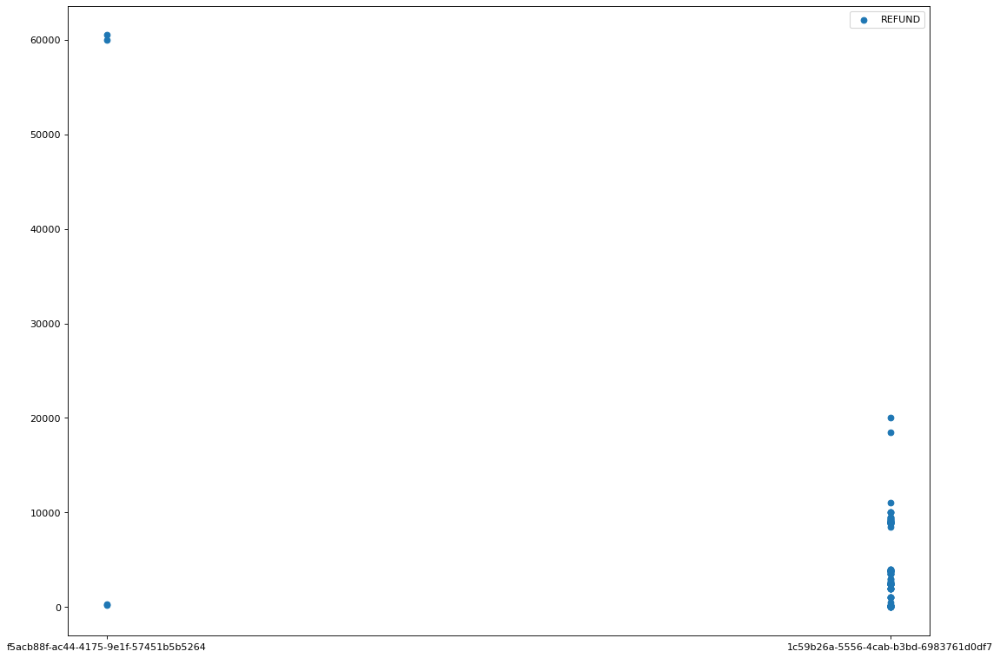

OTHER    90
Name: externalParty.transactionCategory, dtype: int64


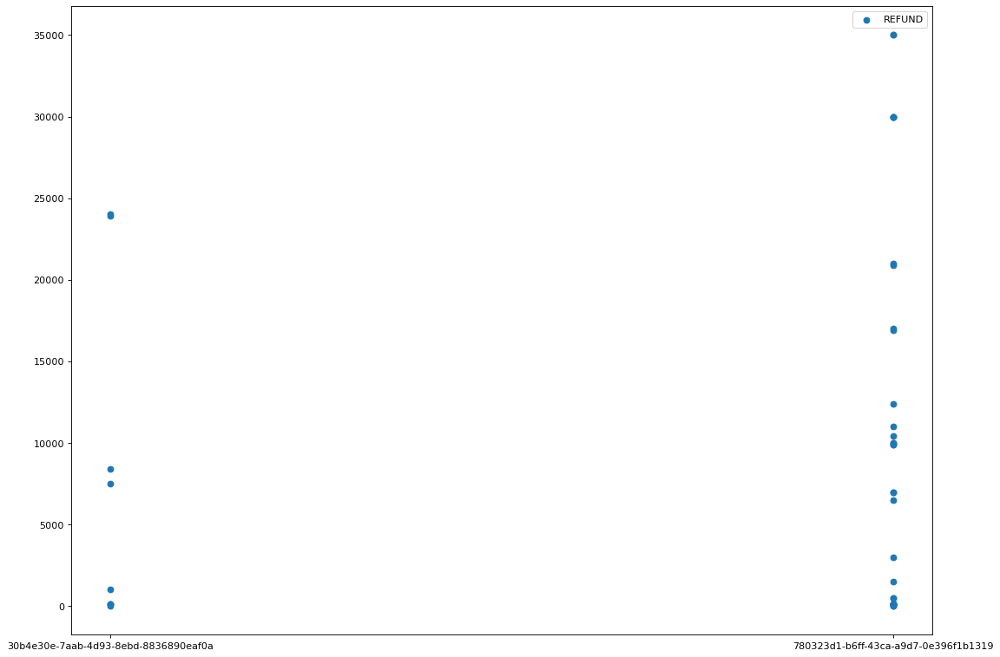

OTHER        47
GROCERIES     2
Name: externalParty.transactionCategory, dtype: int64


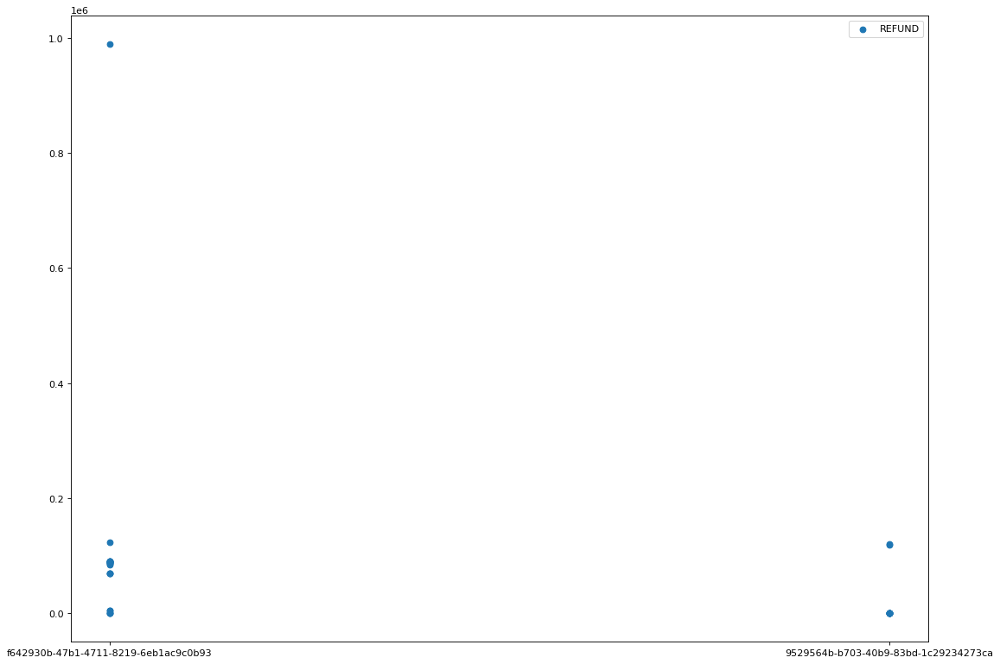

OTHER    31
Name: externalParty.transactionCategory, dtype: int64


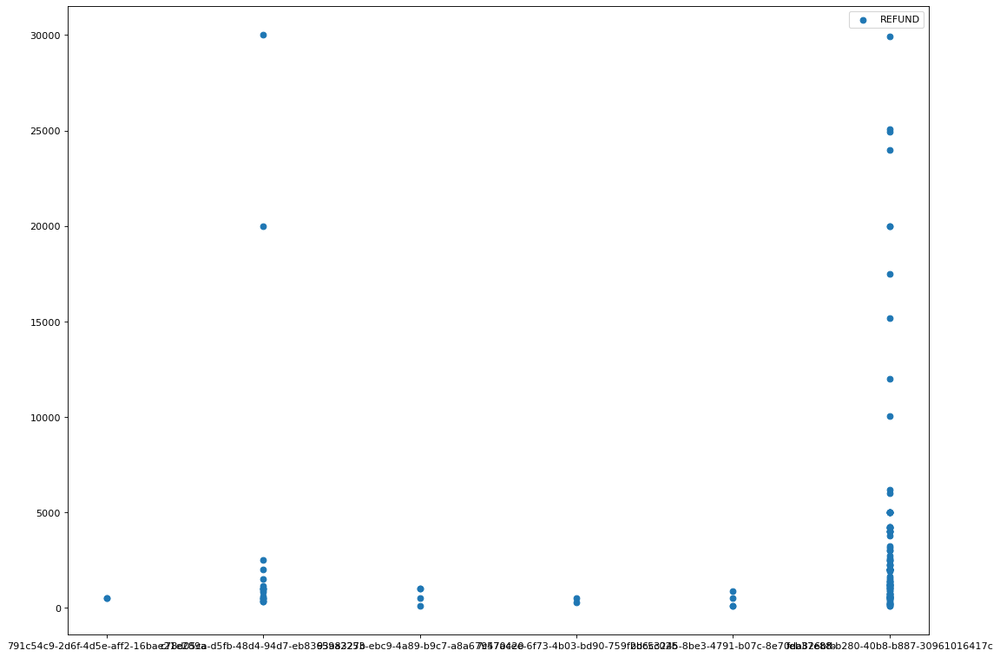

OTHER        54
TRAVEL       40
GROCERIES    14
LIFESTYLE    12
SHOPPING      3
Name: externalParty.transactionCategory, dtype: int64


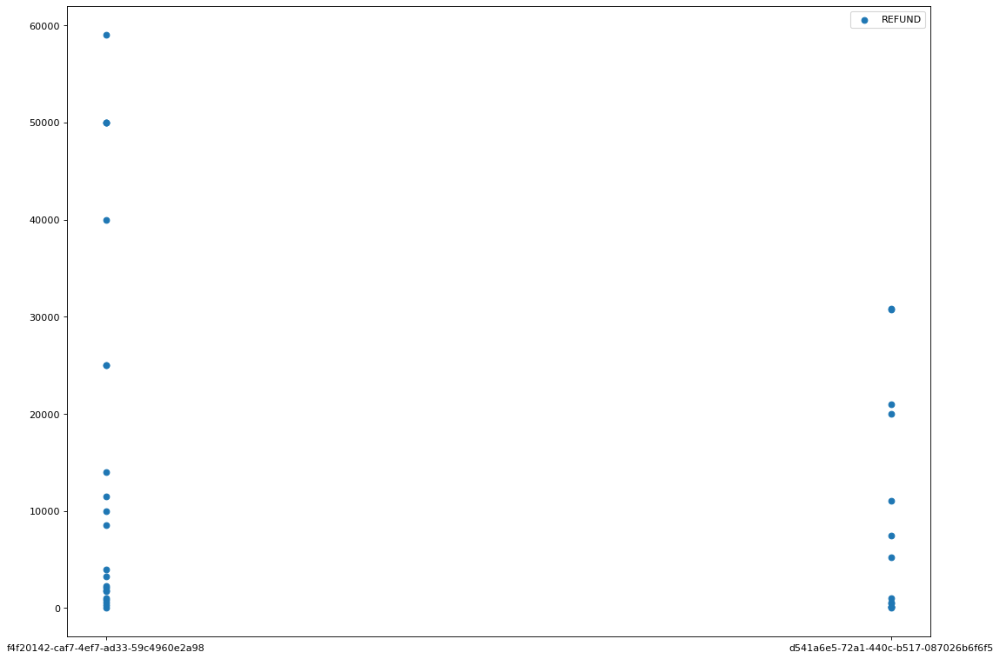

OTHER        25
LIFESTYLE     5
GROCERIES     3
TRAVEL        2
SHOPPING      1
Name: externalParty.transactionCategory, dtype: int64


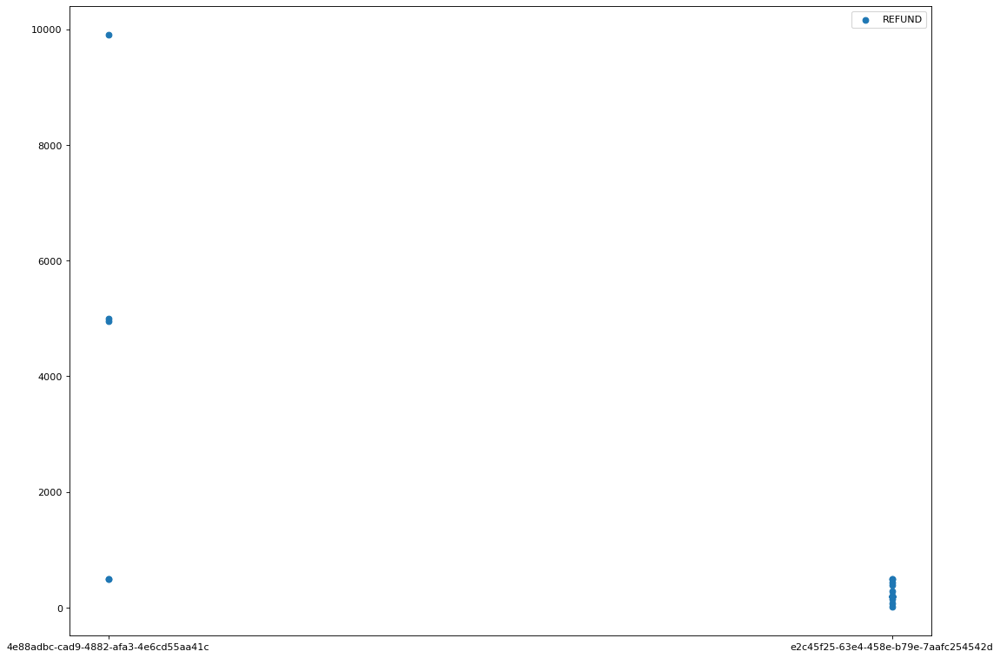

OTHER           18
SUBSCRIPTION     2
GROCERIES        1
TRAVEL           1
Name: externalParty.transactionCategory, dtype: int64


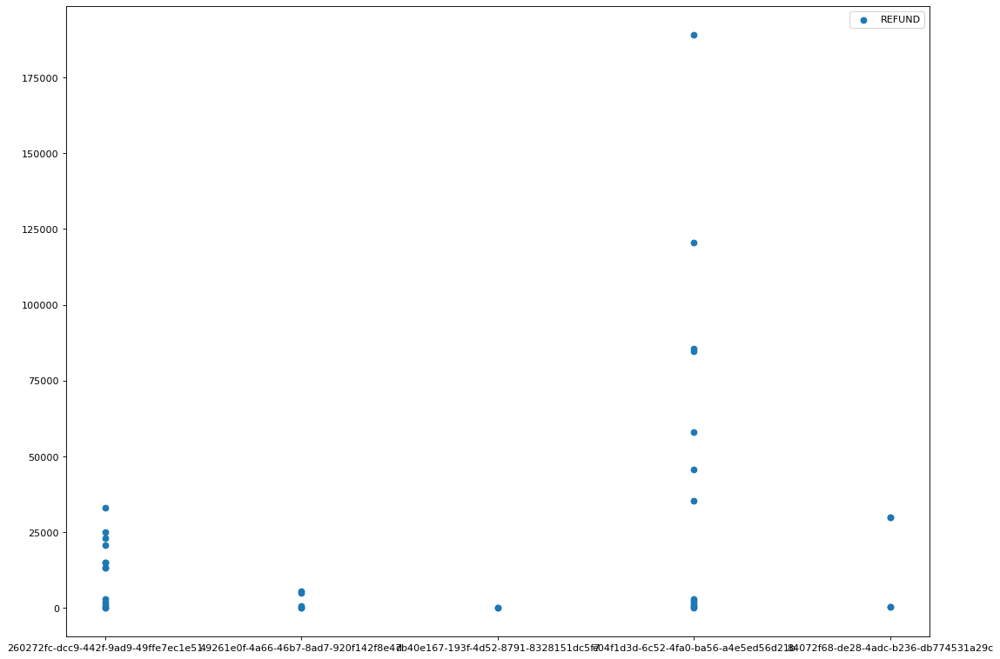

OTHER    37
Name: externalParty.transactionCategory, dtype: int64


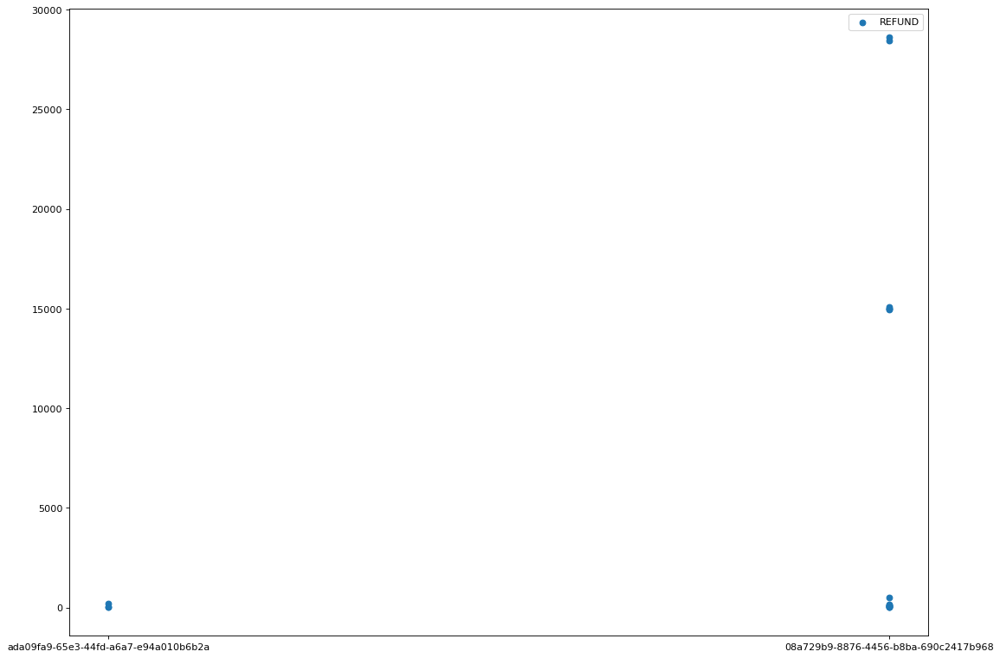

OTHER    18
Name: externalParty.transactionCategory, dtype: int64


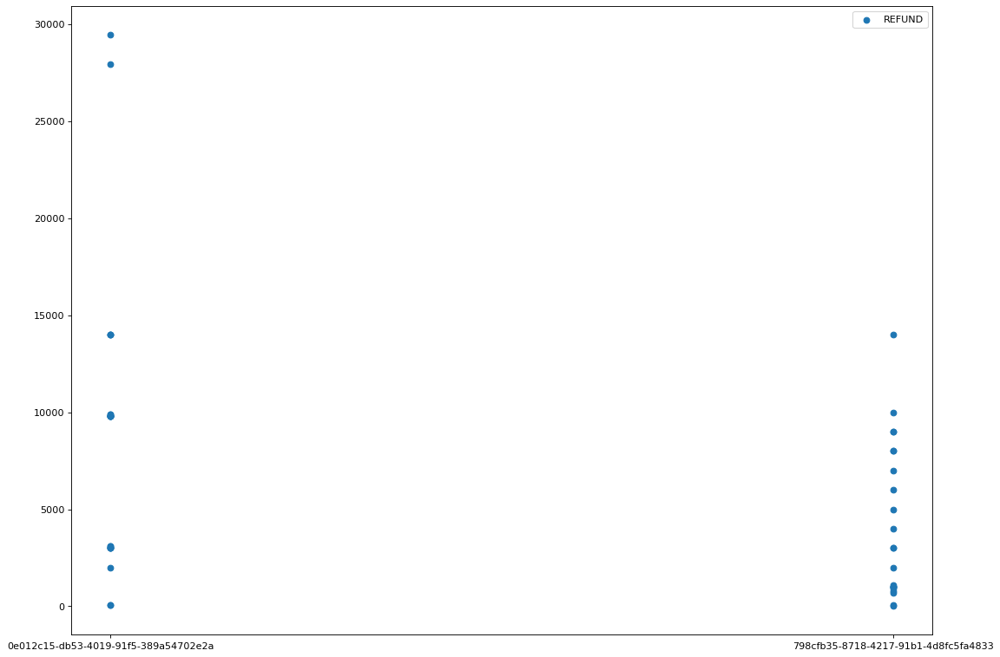

OTHER    45
Name: externalParty.transactionCategory, dtype: int64


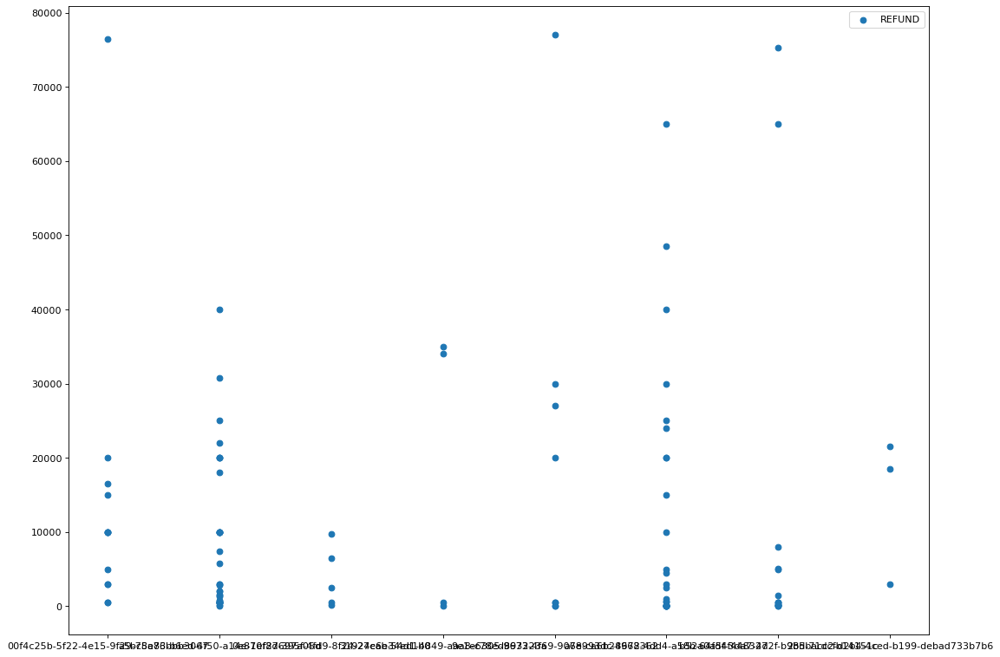

OTHER        96
GROCERIES     4
TRAVEL        3
LIFESTYLE     2
SHOPPING      1
Name: externalParty.transactionCategory, dtype: int64


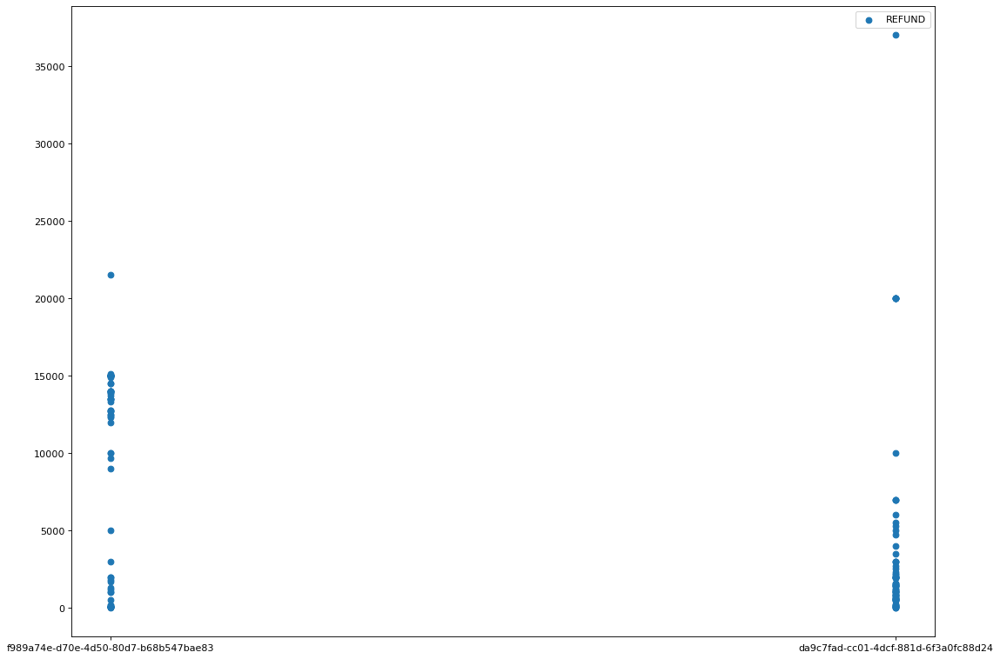

OTHER        141
LIFESTYLE      9
TRAVEL         6
GROCERIES      3
SHOPPING       1
Name: externalParty.transactionCategory, dtype: int64


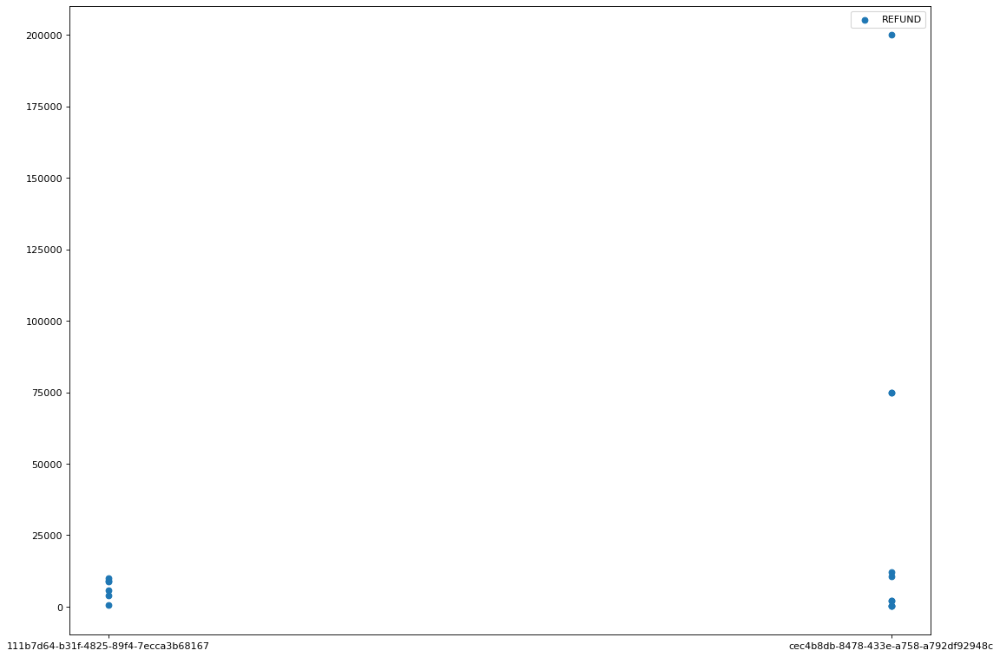

OTHER    16
Name: externalParty.transactionCategory, dtype: int64


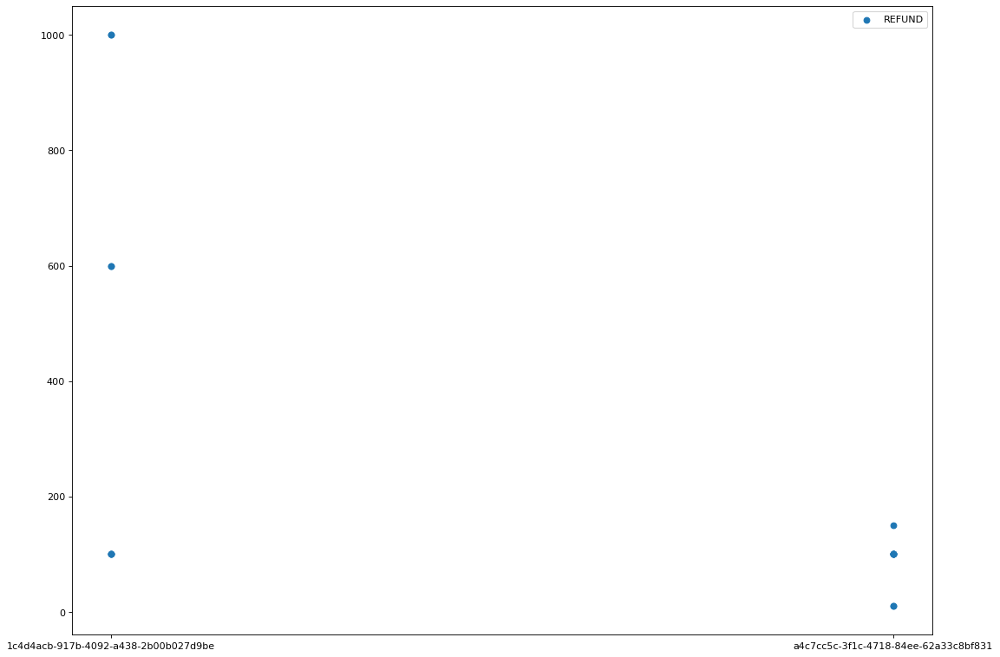

OTHER    17
Name: externalParty.transactionCategory, dtype: int64


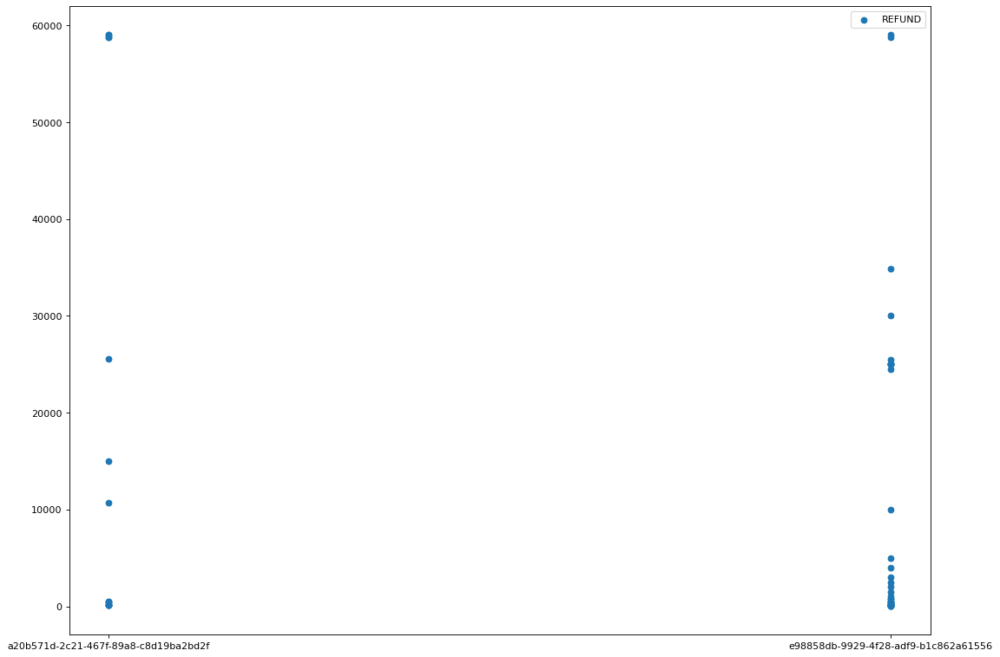

OTHER        44
GROCERIES     5
TRAVEL        2
SHOPPING      1
LIFESTYLE     1
Name: externalParty.transactionCategory, dtype: int64


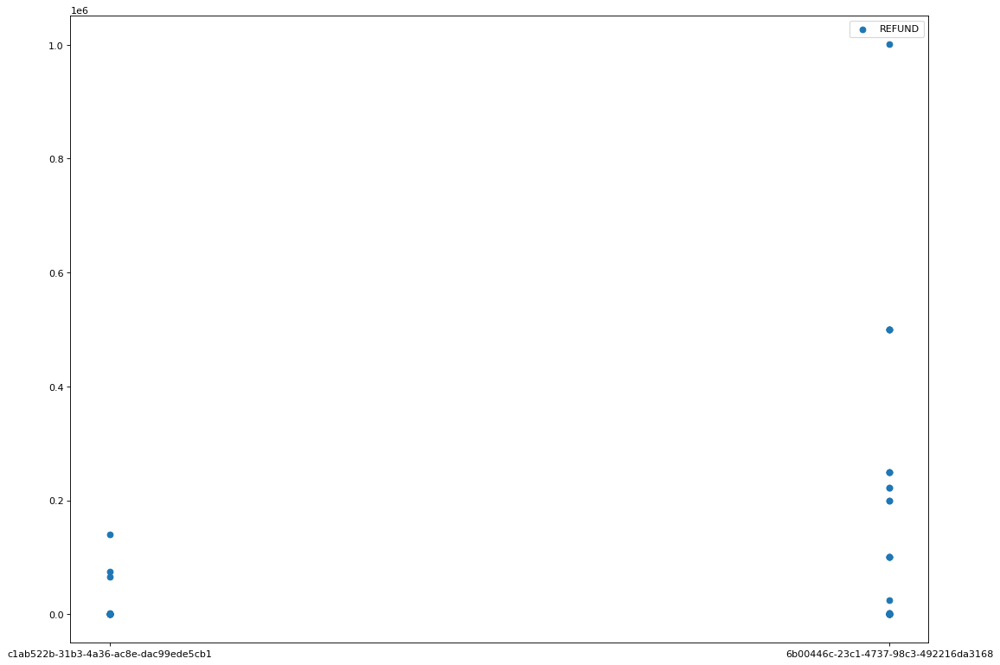

OTHER    52
Name: externalParty.transactionCategory, dtype: int64


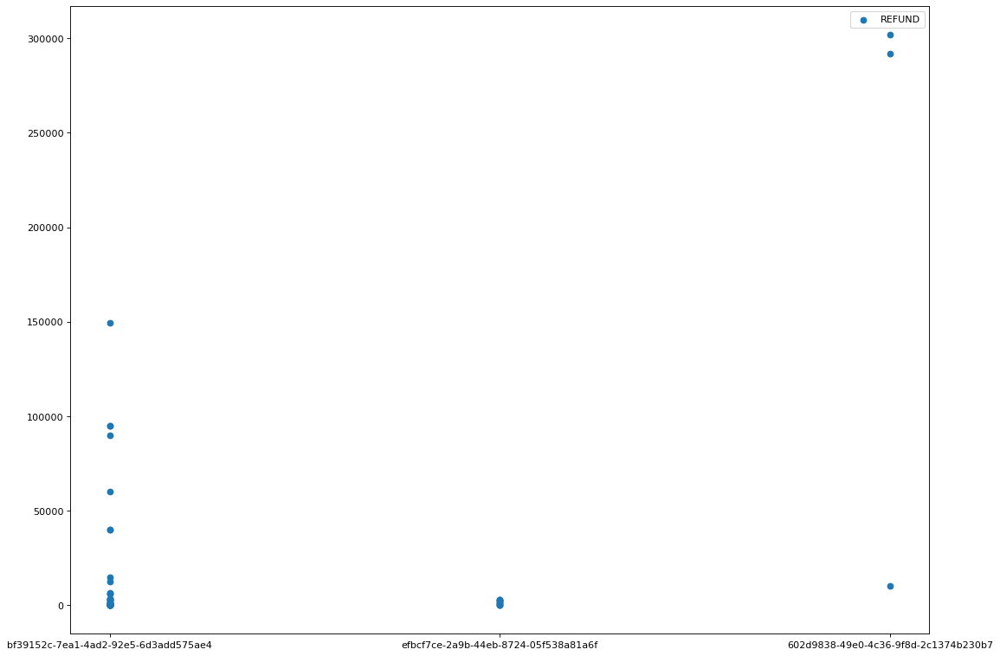

OTHER        32
TRAVEL       12
LIFESTYLE     4
Name: externalParty.transactionCategory, dtype: int64


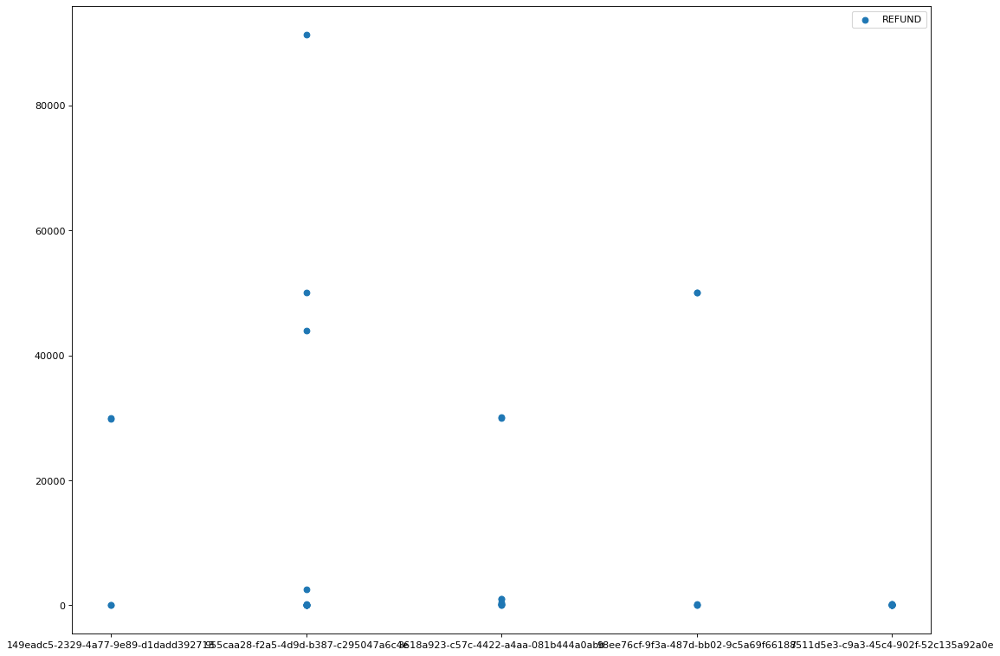

OTHER    41
Name: externalParty.transactionCategory, dtype: int64


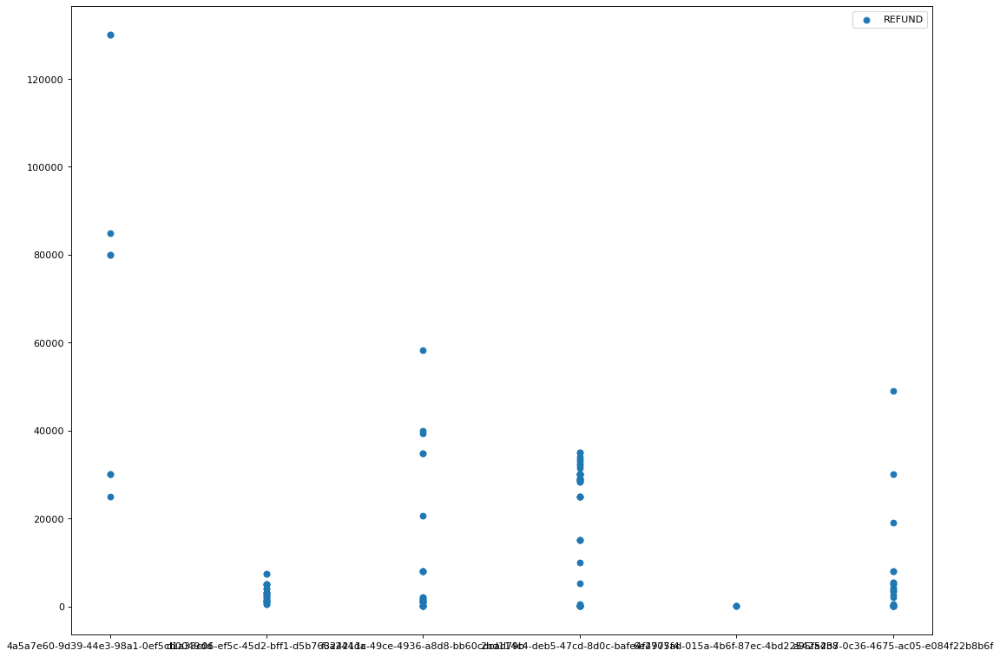

OTHER    135
Name: externalParty.transactionCategory, dtype: int64


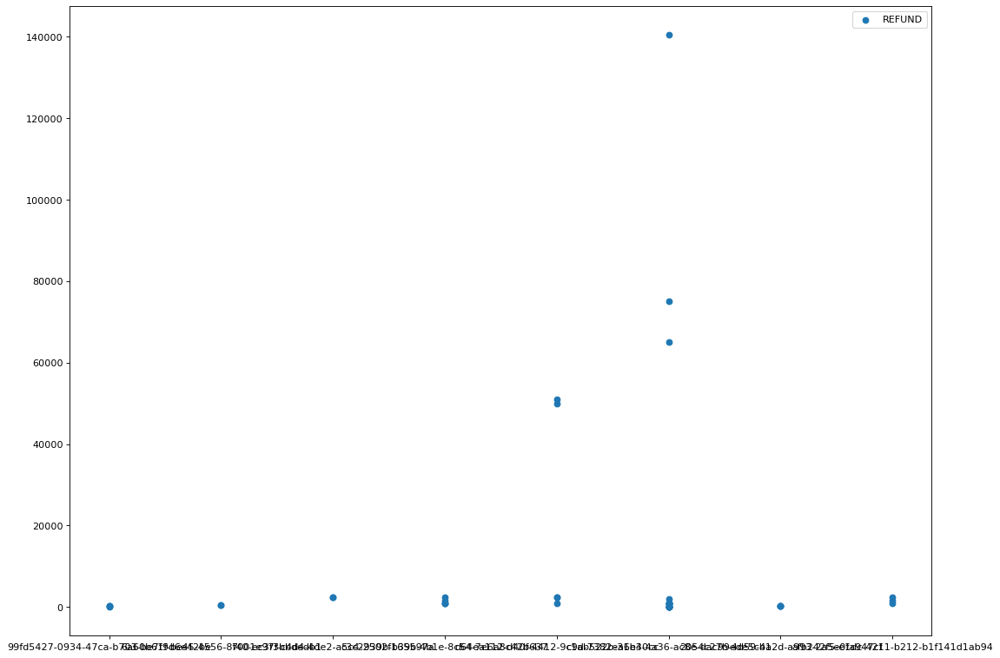

OTHER    43
Name: externalParty.transactionCategory, dtype: int64


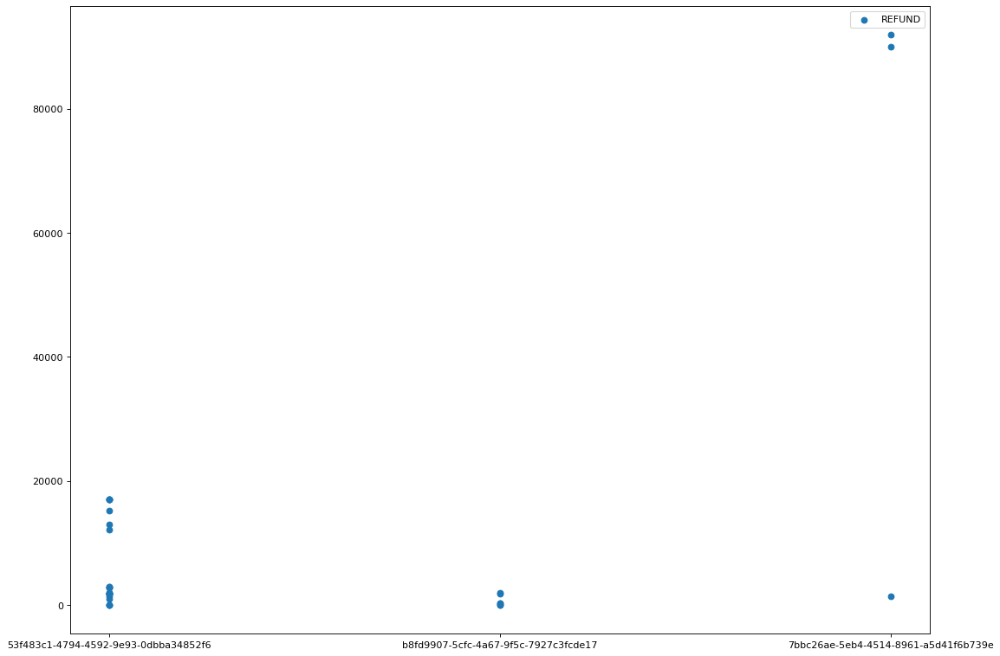

OTHER       31
SHOPPING     1
Name: externalParty.transactionCategory, dtype: int64


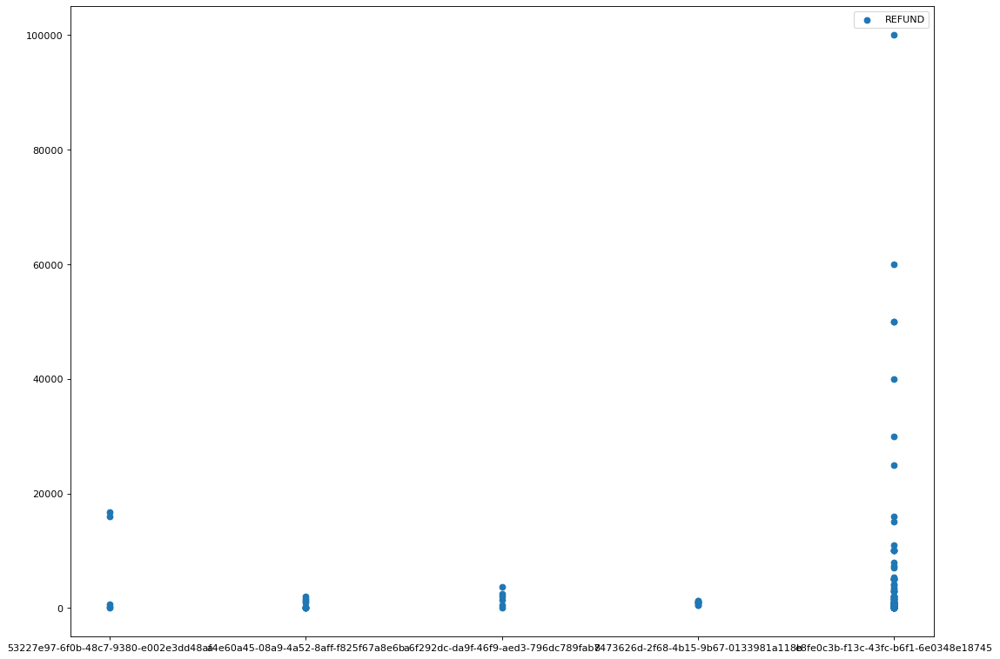

OTHER        98
TRAVEL       12
SHOPPING      5
LIFESTYLE     5
GROCERIES     1
Name: externalParty.transactionCategory, dtype: int64


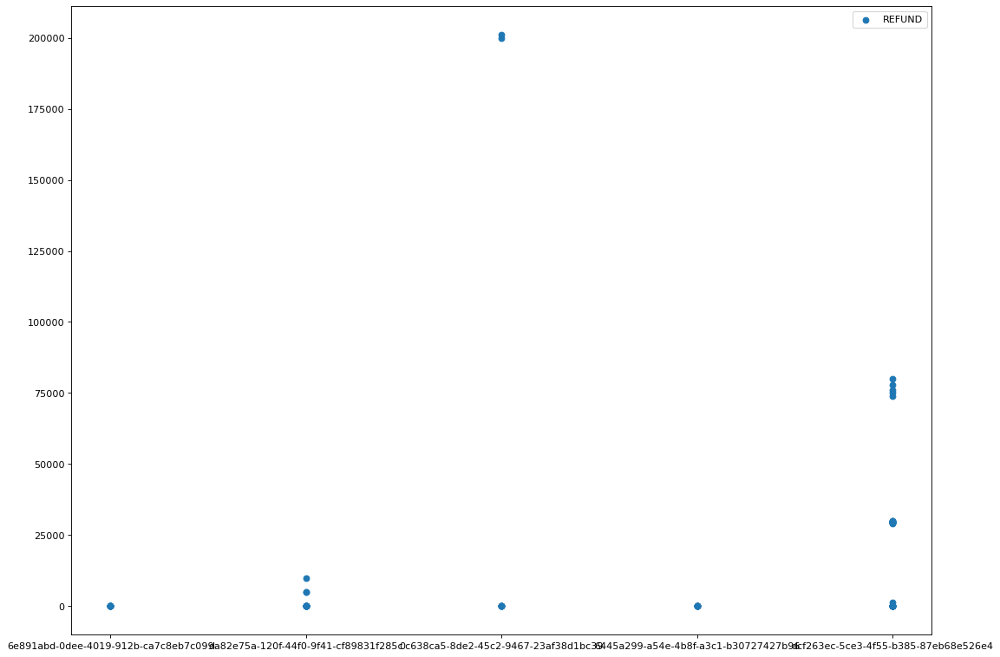

OTHER    86
Name: externalParty.transactionCategory, dtype: int64


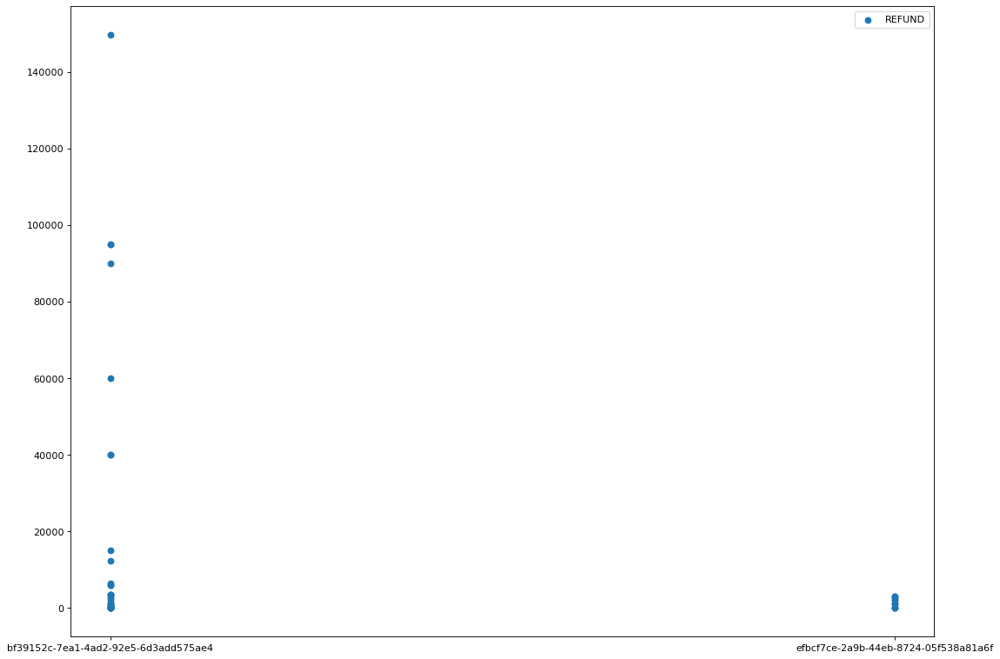

OTHER        29
TRAVEL       12
LIFESTYLE     4
Name: externalParty.transactionCategory, dtype: int64


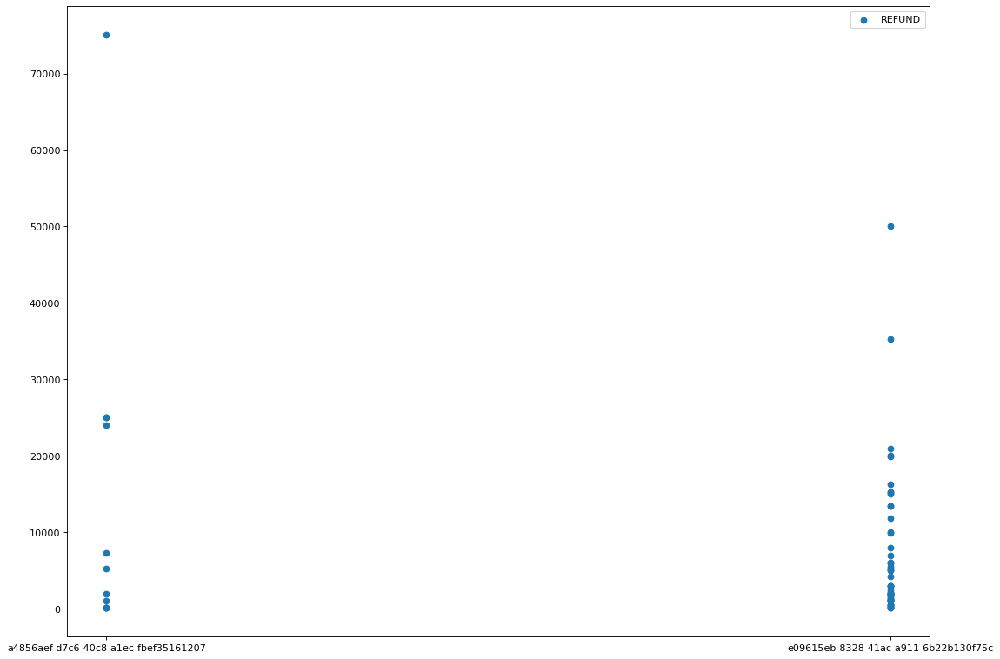

OTHER        39
SHOPPING      9
LIFESTYLE     6
TRAVEL        5
GROCERIES     2
Name: externalParty.transactionCategory, dtype: int64


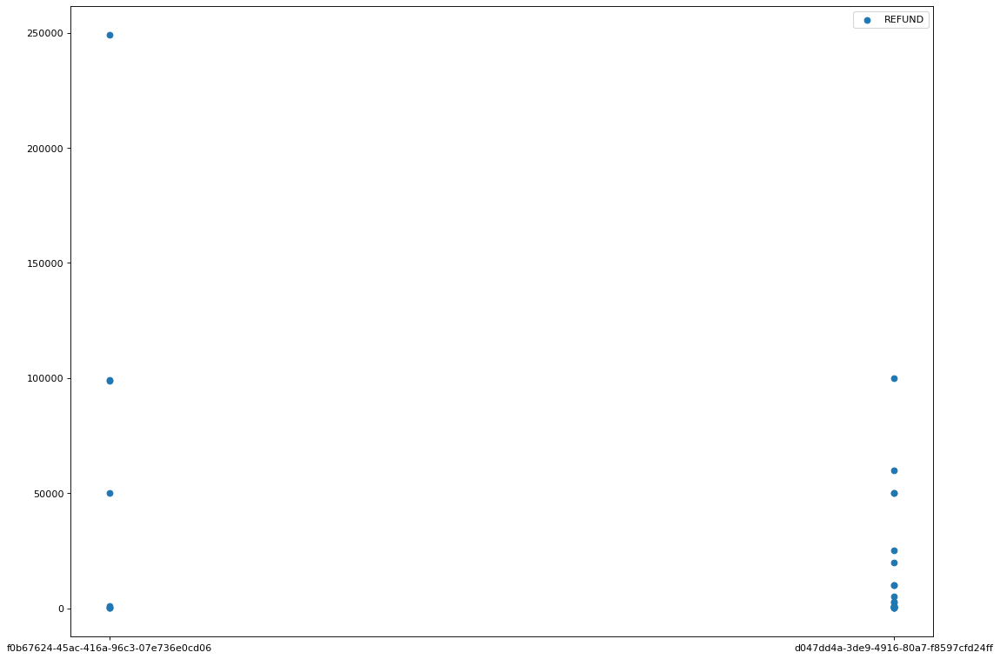

OTHER    27
Name: externalParty.transactionCategory, dtype: int64


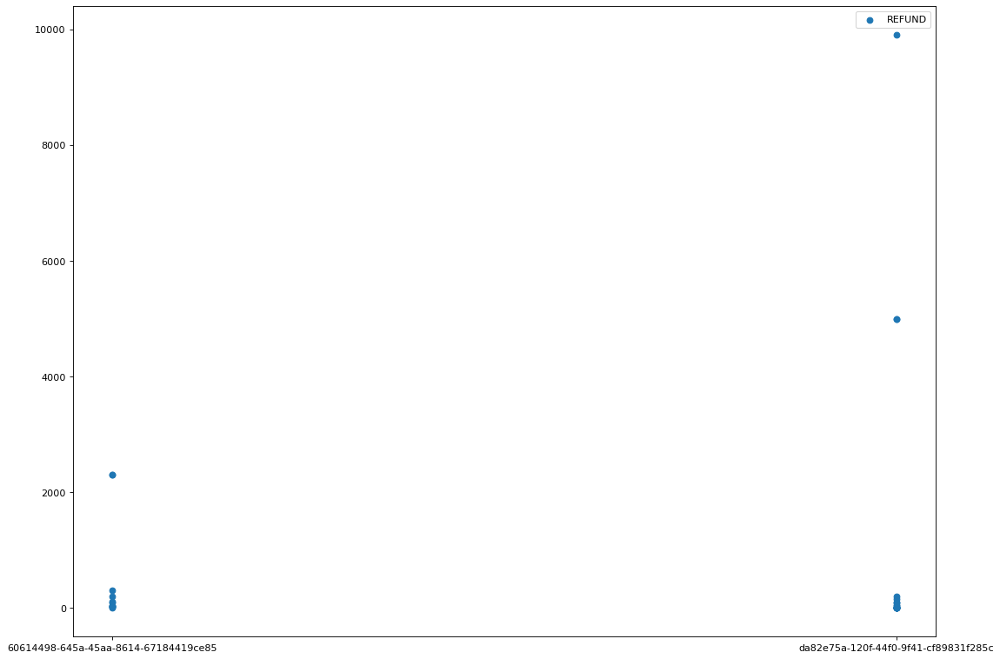

OTHER    29
Name: externalParty.transactionCategory, dtype: int64


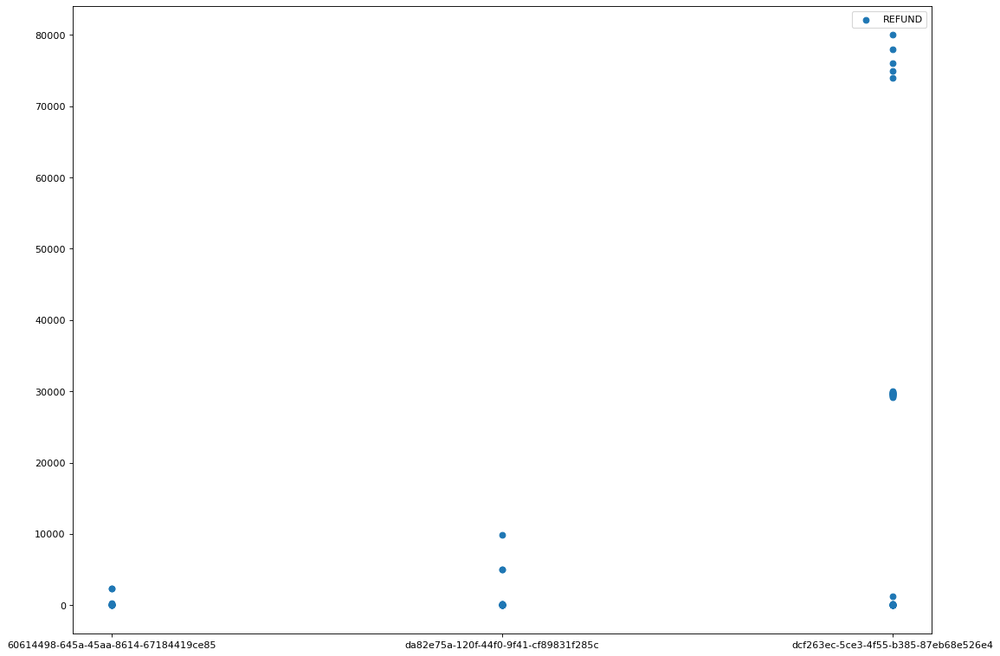

OTHER    71
Name: externalParty.transactionCategory, dtype: int64


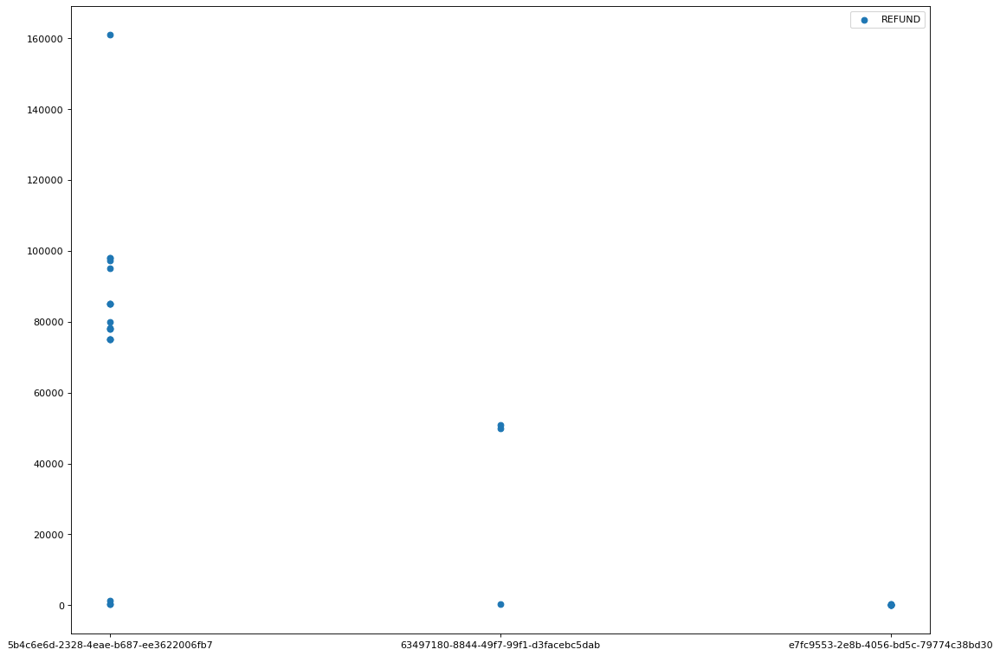

OTHER    28
Name: externalParty.transactionCategory, dtype: int64


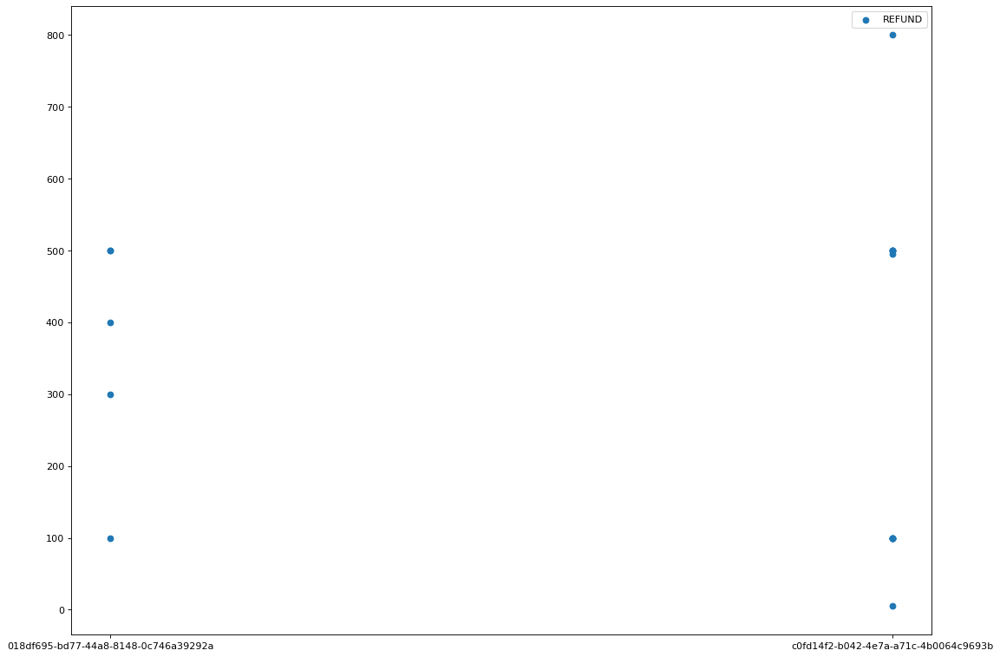

OTHER    17
Name: externalParty.transactionCategory, dtype: int64


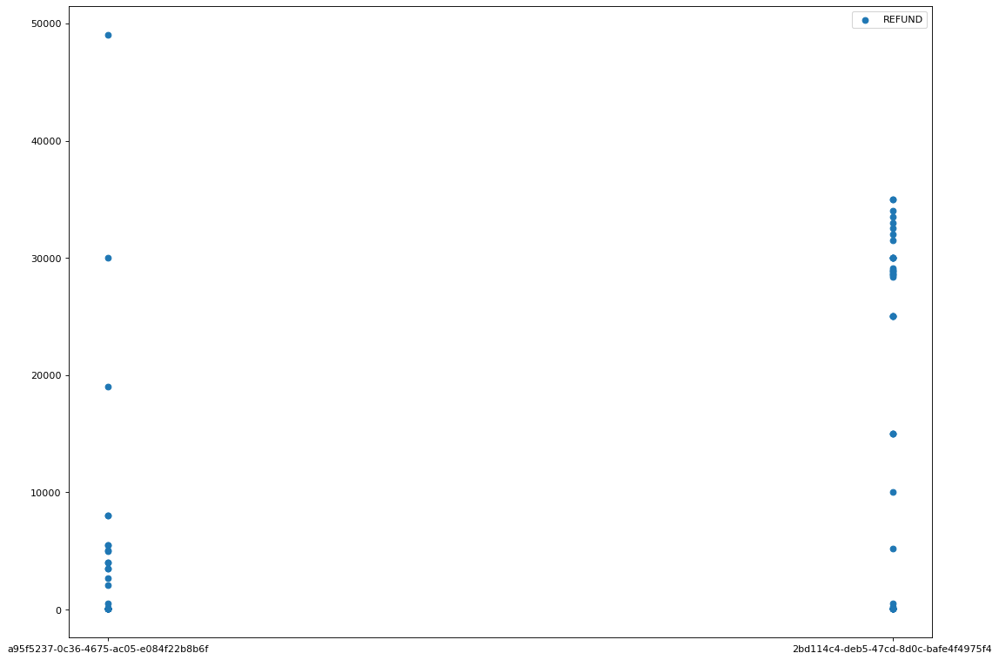

OTHER    74
Name: externalParty.transactionCategory, dtype: int64


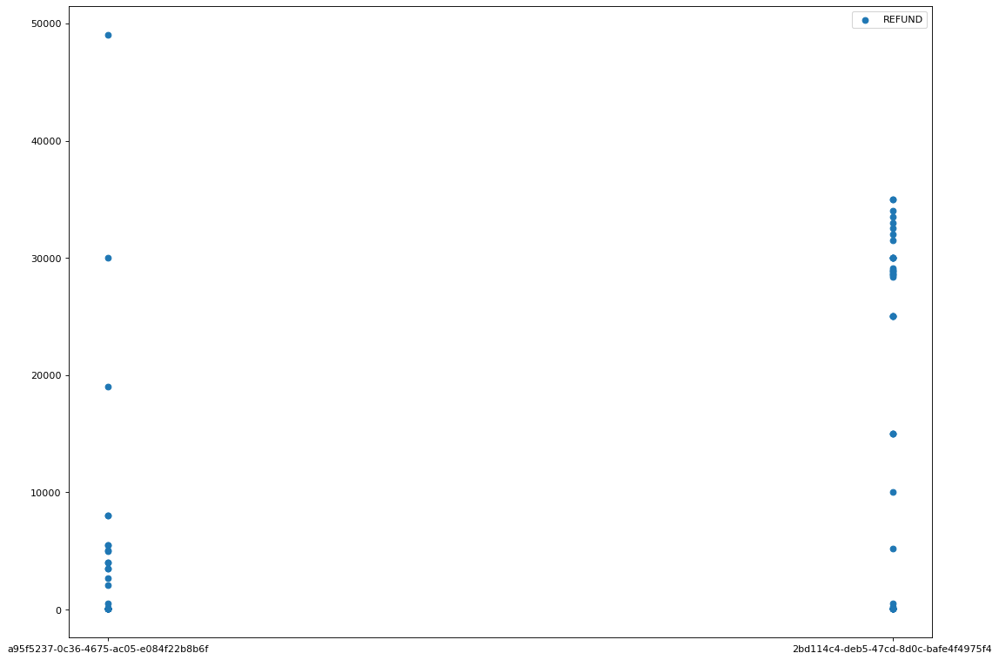

OTHER    74
Name: externalParty.transactionCategory, dtype: int64


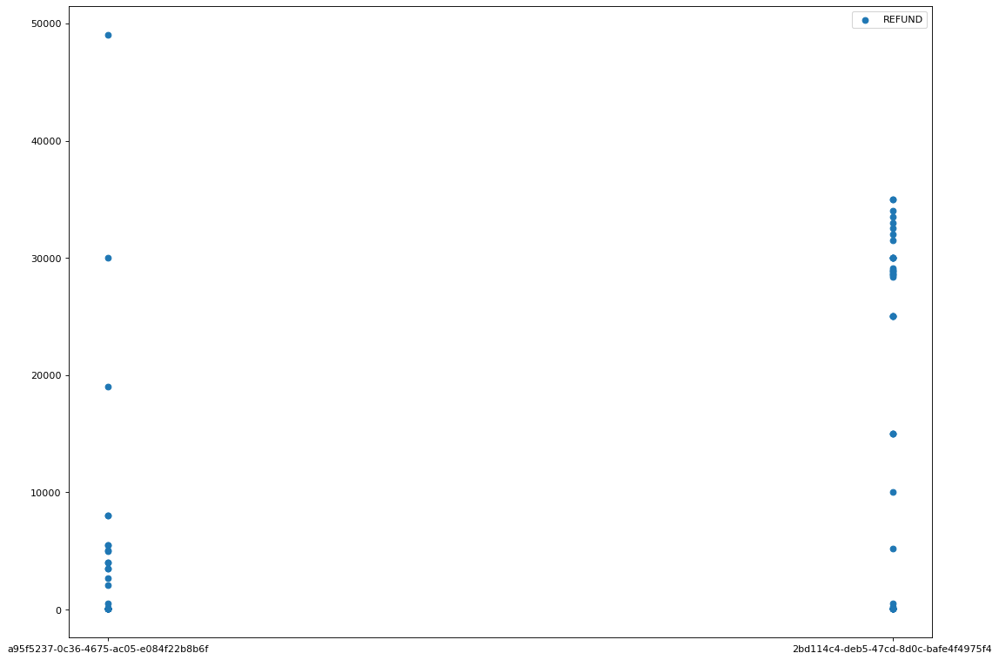

OTHER    74
Name: externalParty.transactionCategory, dtype: int64


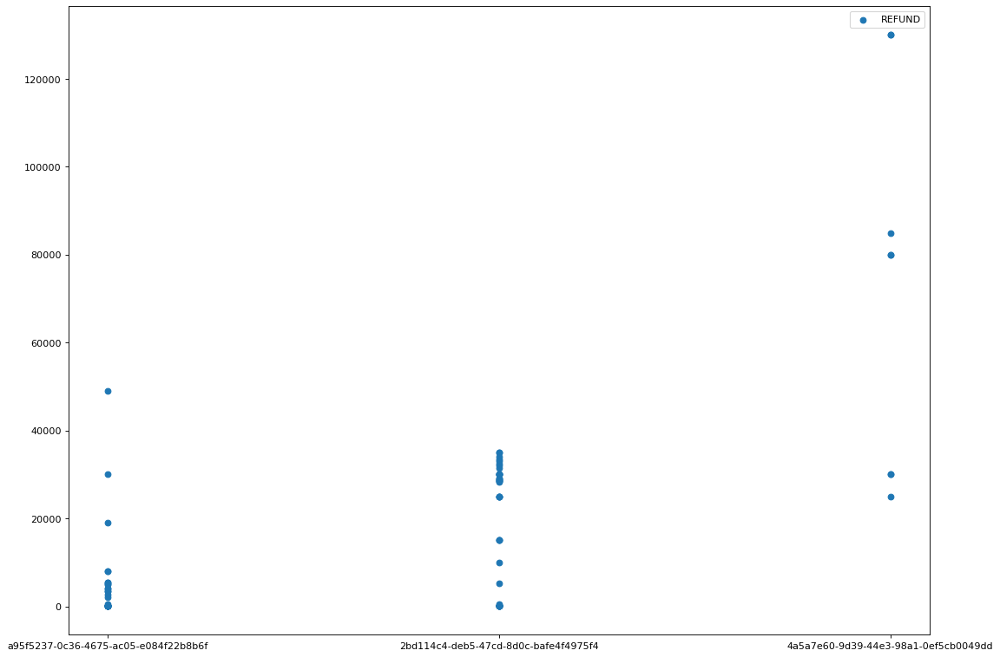

OTHER    82
Name: externalParty.transactionCategory, dtype: int64


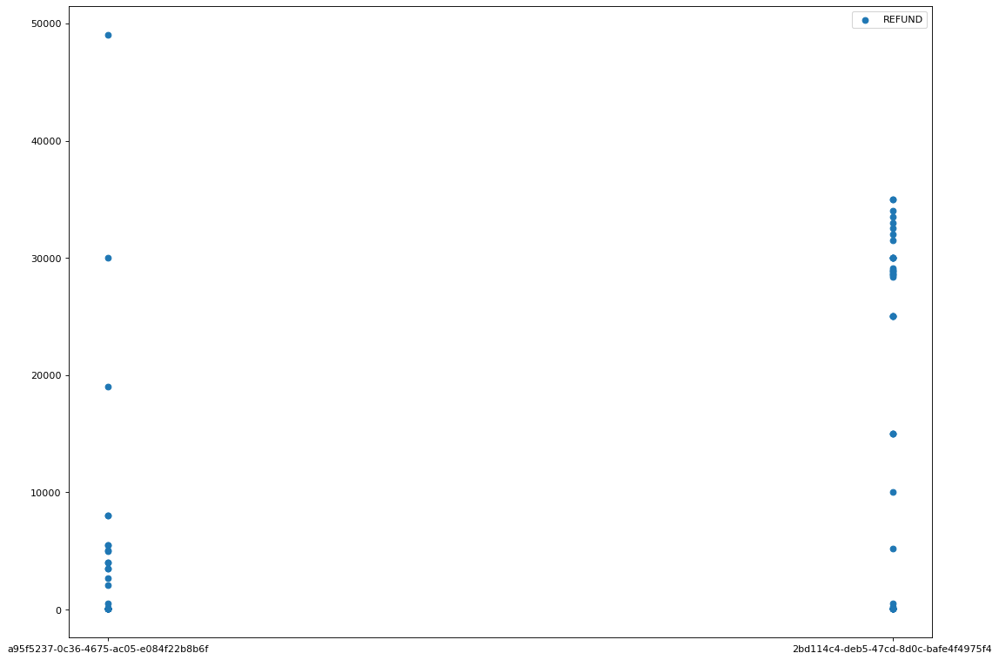

OTHER    74
Name: externalParty.transactionCategory, dtype: int64


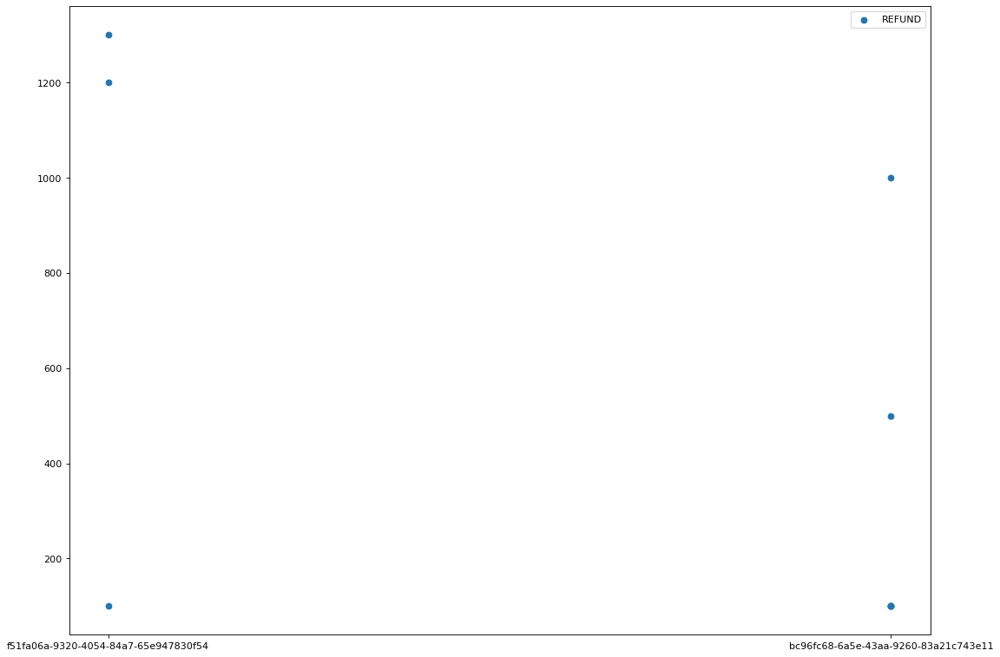

OTHER    9
Name: externalParty.transactionCategory, dtype: int64


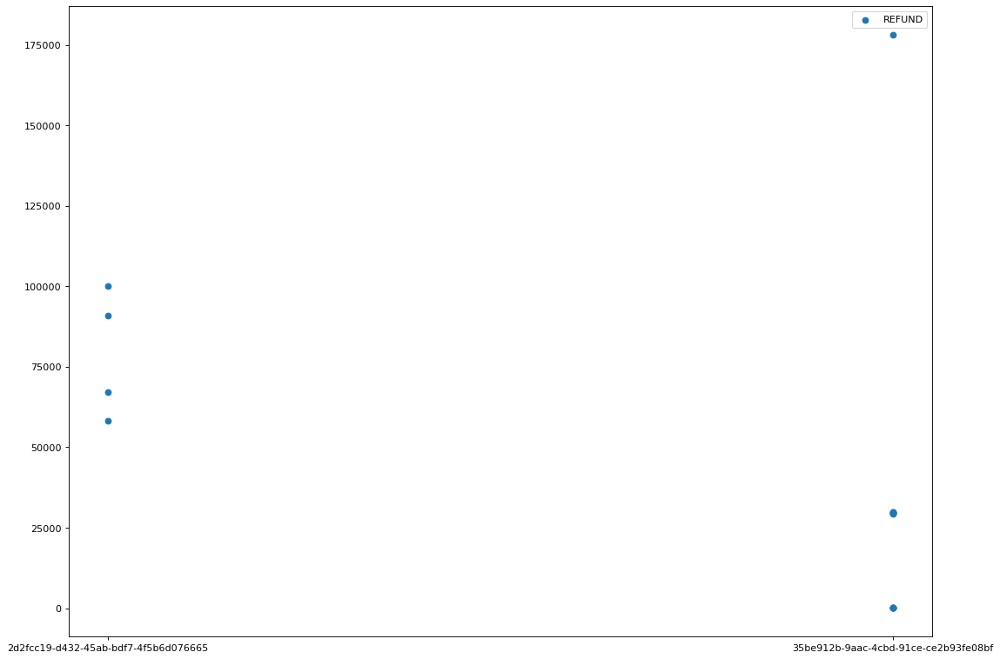

OTHER    16
Name: externalParty.transactionCategory, dtype: int64


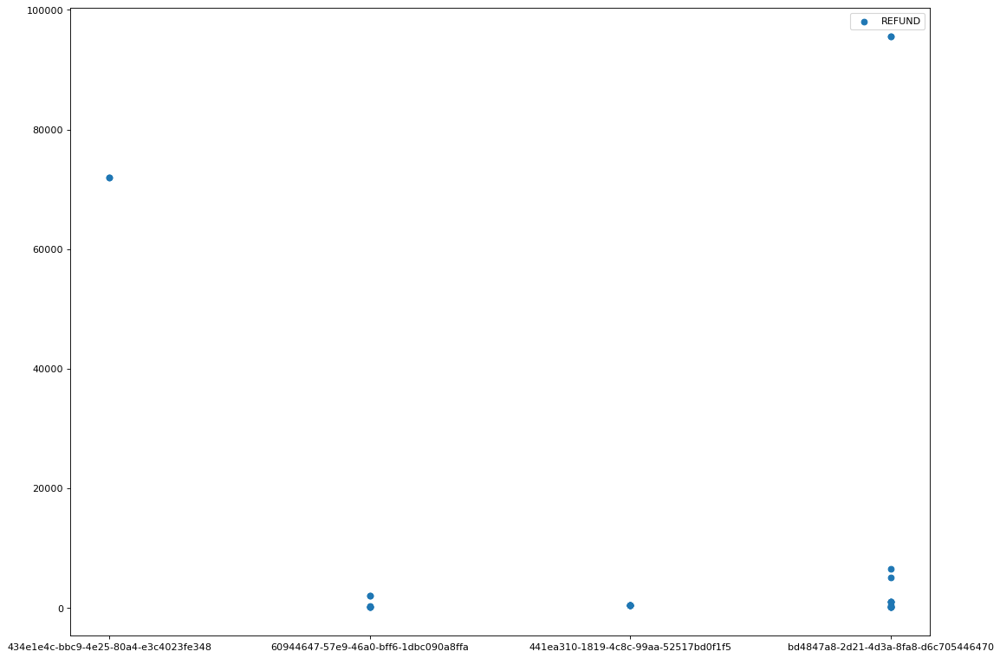

OTHER    30
Name: externalParty.transactionCategory, dtype: int64


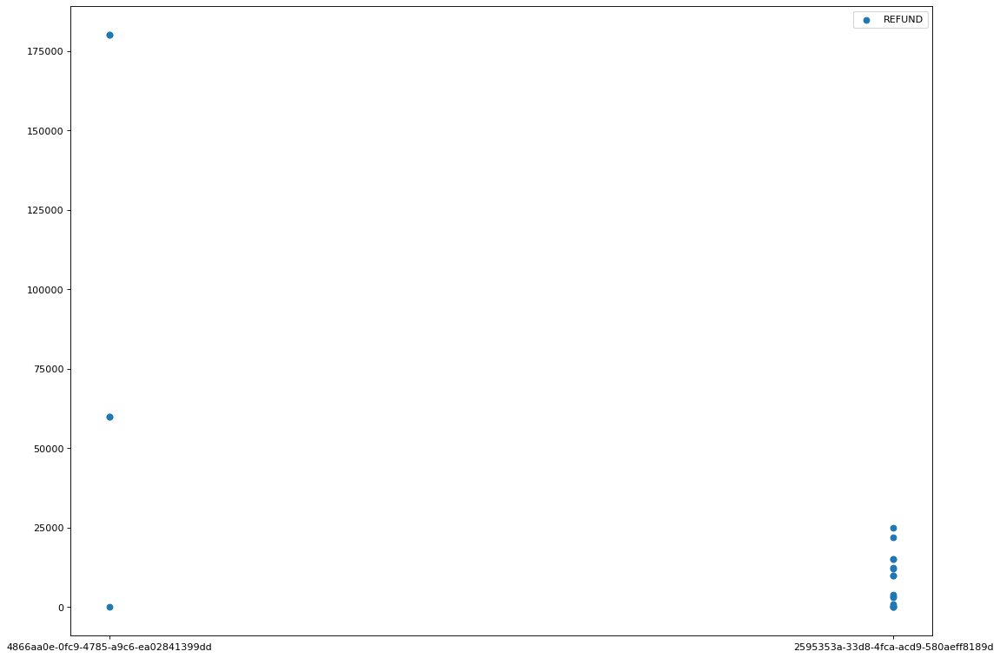

OTHER    21
Name: externalParty.transactionCategory, dtype: int64


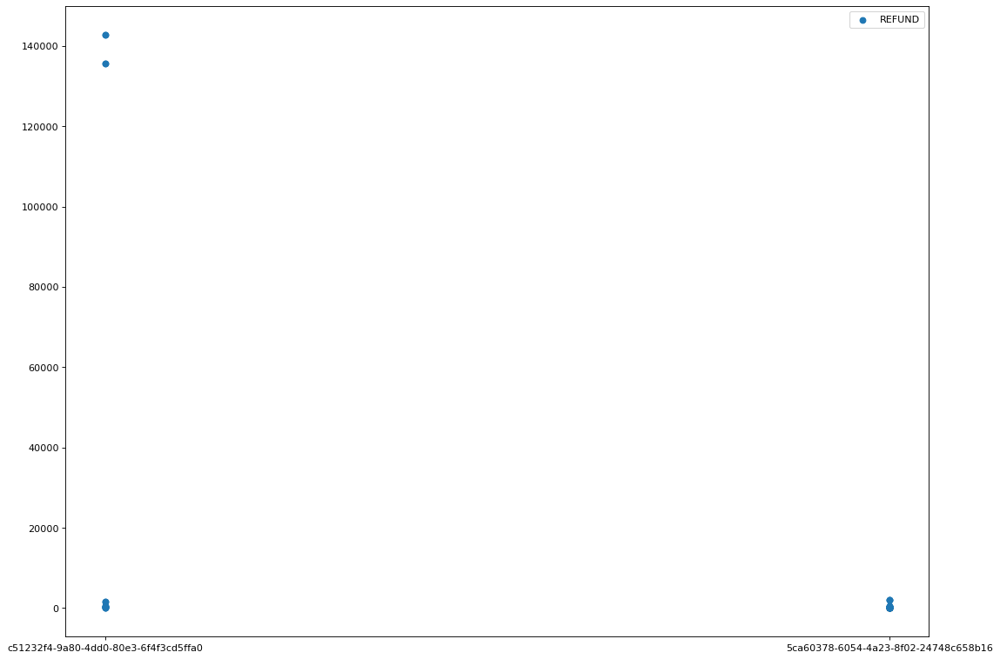

OTHER    80
Name: externalParty.transactionCategory, dtype: int64


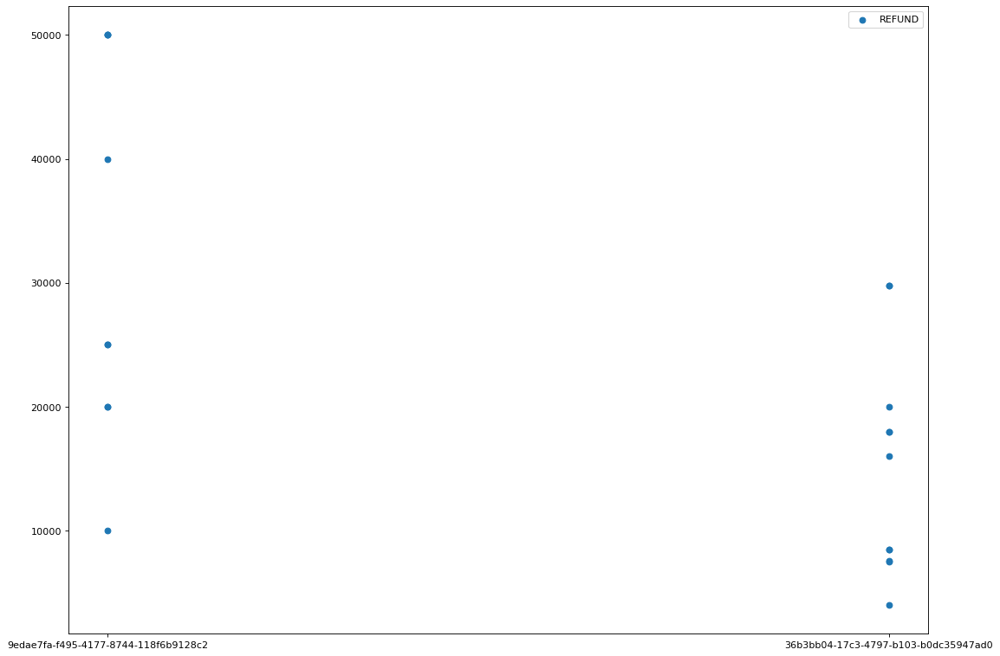

OTHER    20
Name: externalParty.transactionCategory, dtype: int64


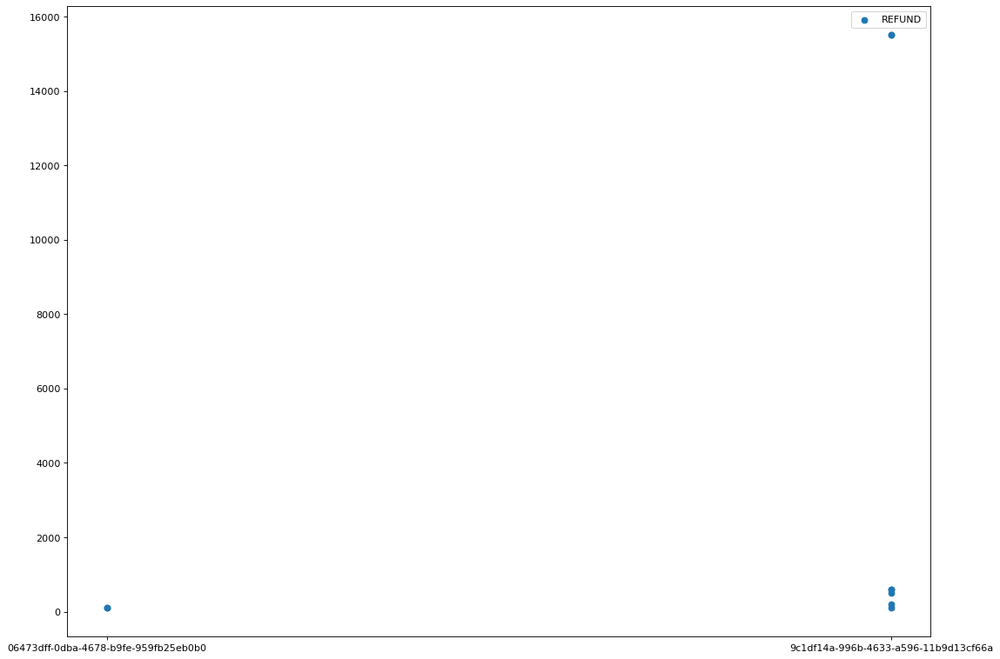

OTHER    9
Name: externalParty.transactionCategory, dtype: int64


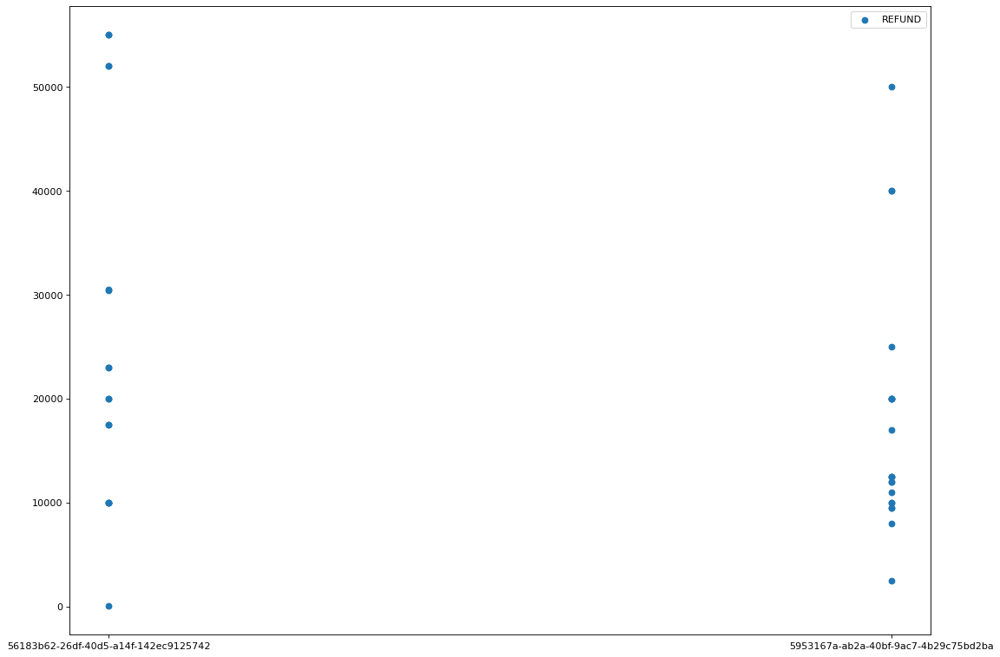

OTHER    38
Name: externalParty.transactionCategory, dtype: int64


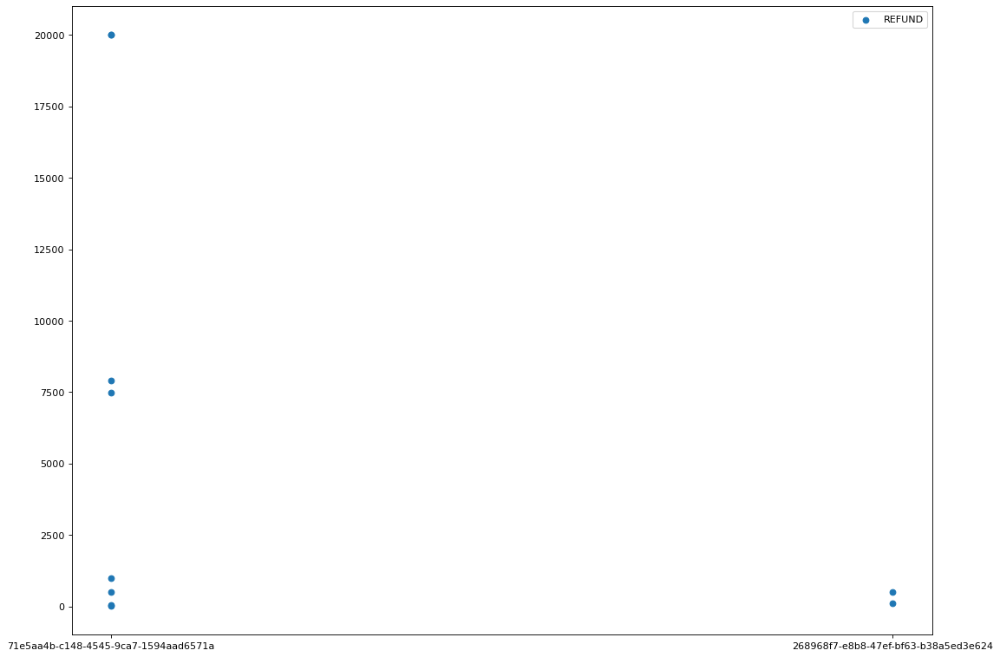

OTHER    10
Name: externalParty.transactionCategory, dtype: int64


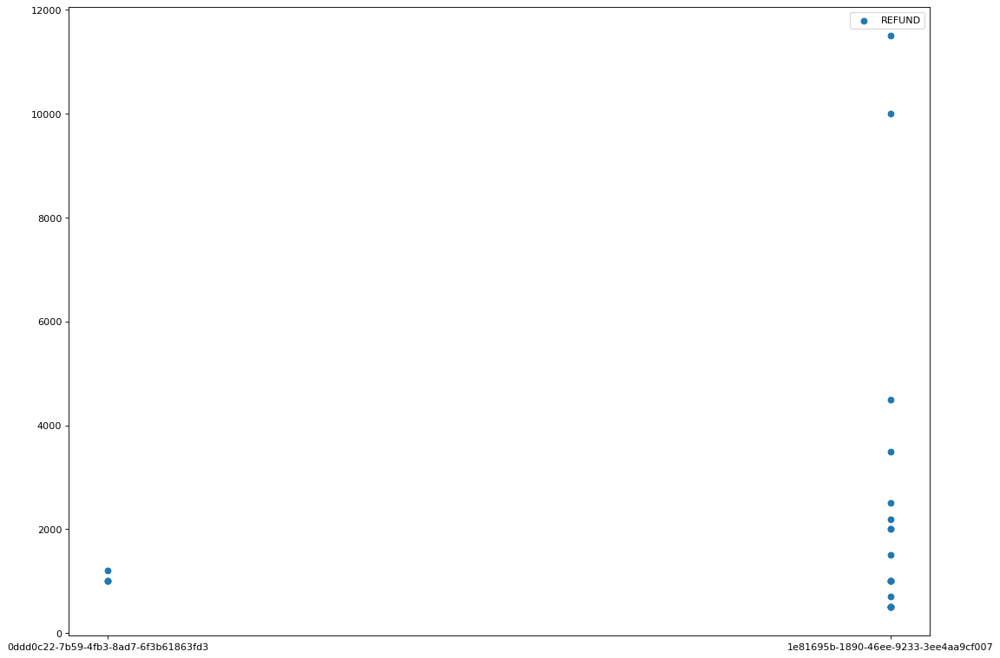

OTHER        22
LIFESTYLE     1
Name: externalParty.transactionCategory, dtype: int64


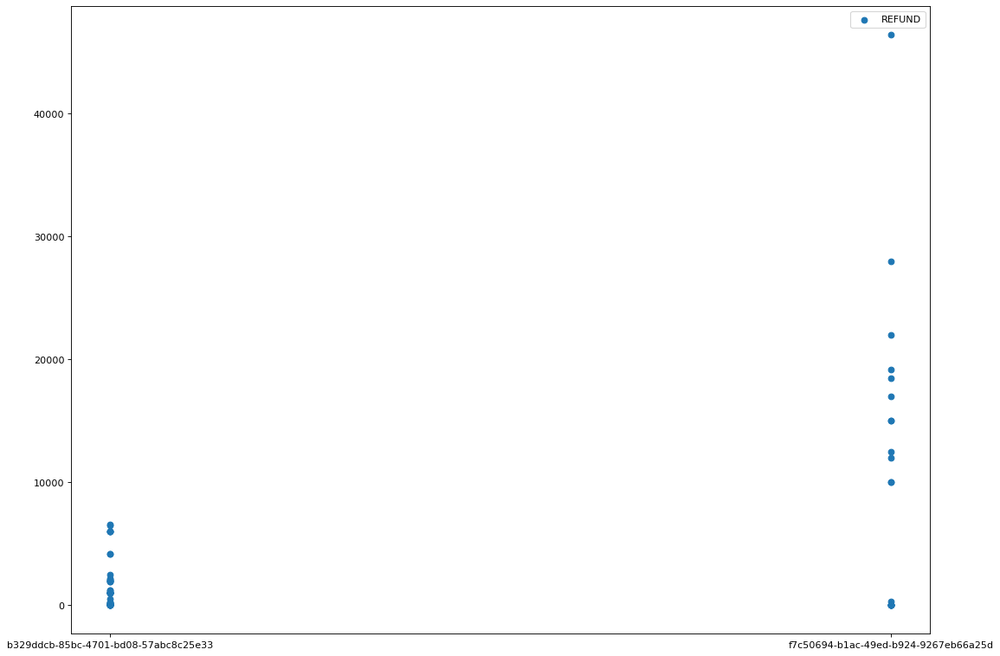

OTHER        63
LIFESTYLE     4
Name: externalParty.transactionCategory, dtype: int64


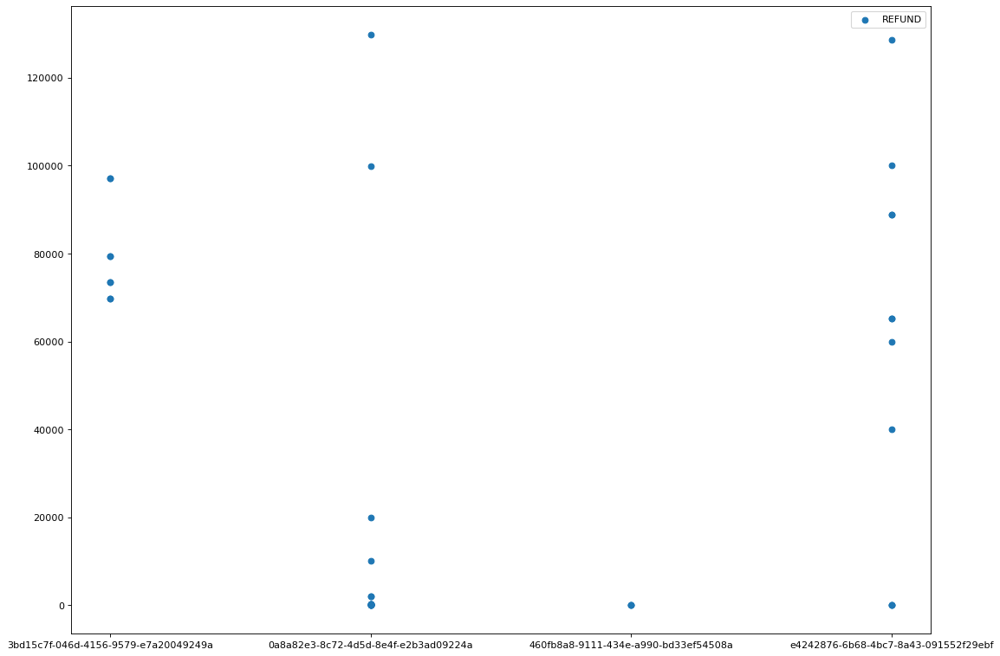

OTHER    39
Name: externalParty.transactionCategory, dtype: int64


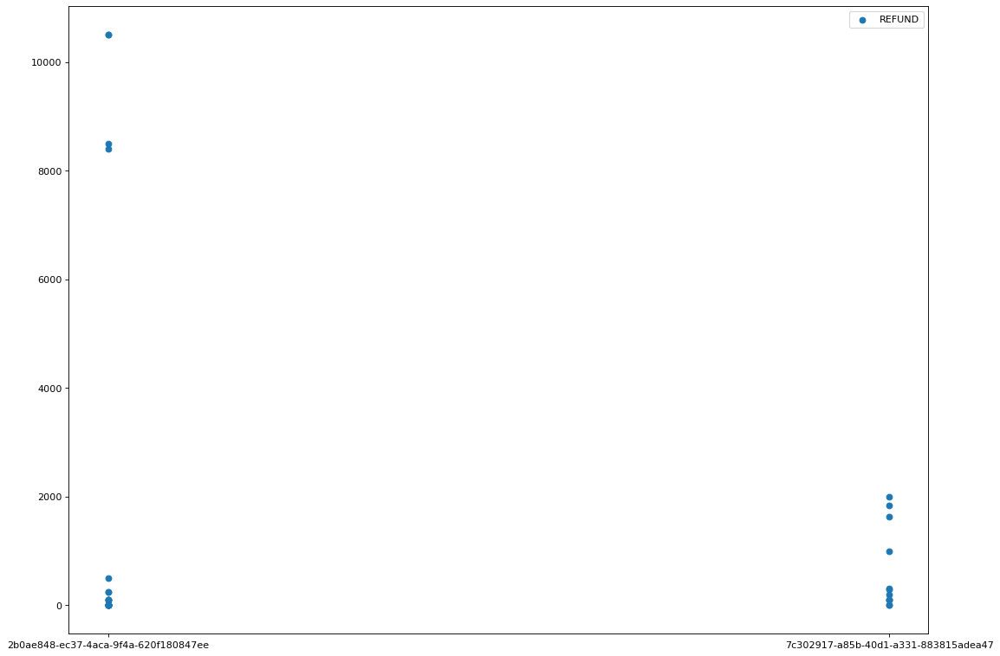

OTHER        43
TRAVEL        2
LIFESTYLE     2
GROCERIES     1
Name: externalParty.transactionCategory, dtype: int64


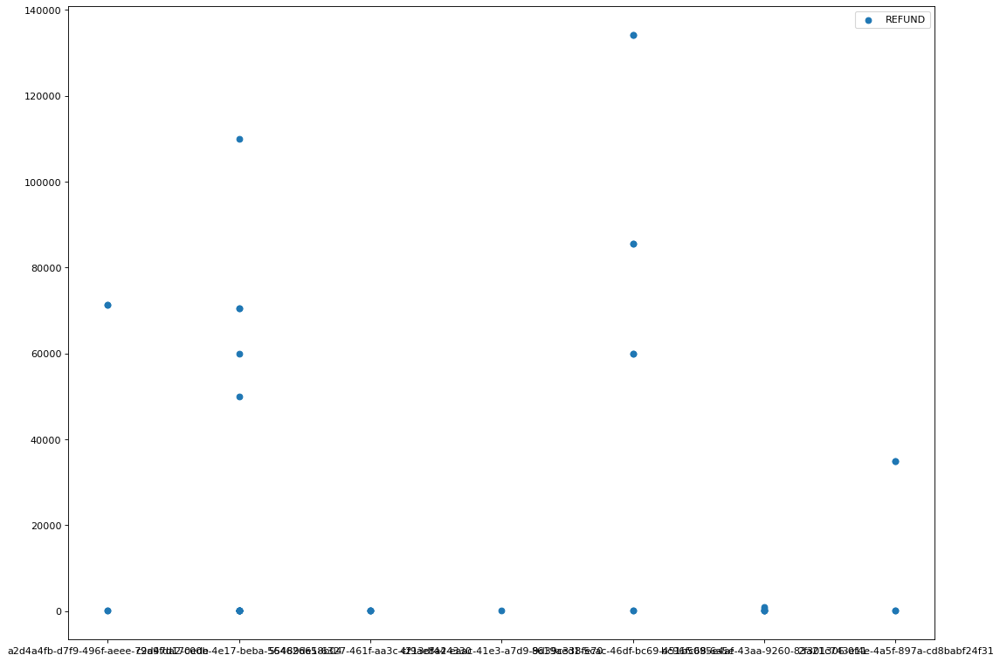

OTHER    40
Name: externalParty.transactionCategory, dtype: int64


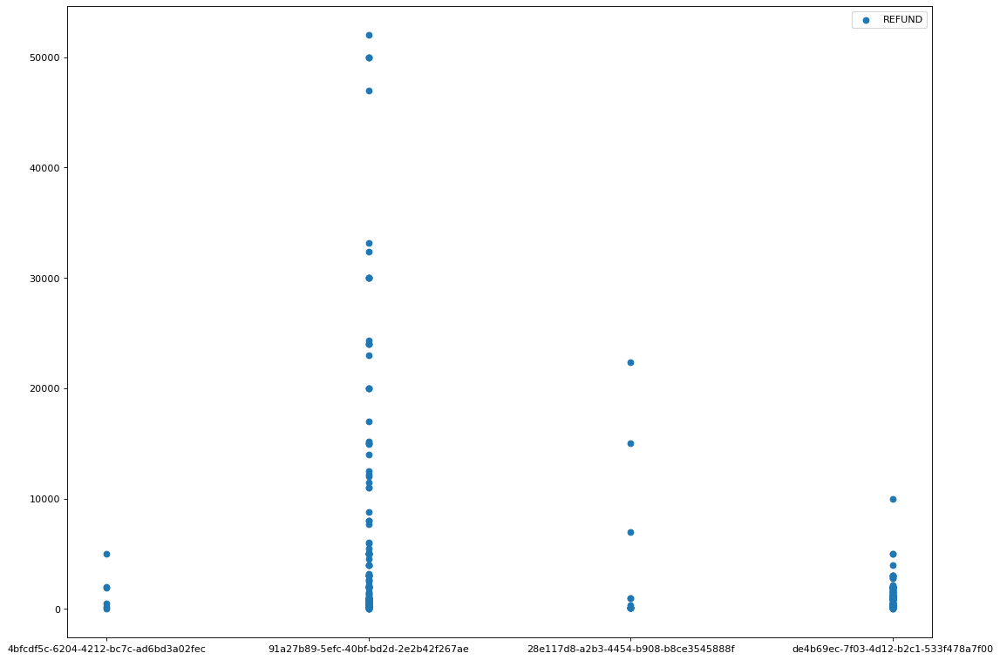

OTHER        217
LIFESTYLE     18
GROCERIES     15
TRAVEL        12
Name: externalParty.transactionCategory, dtype: int64


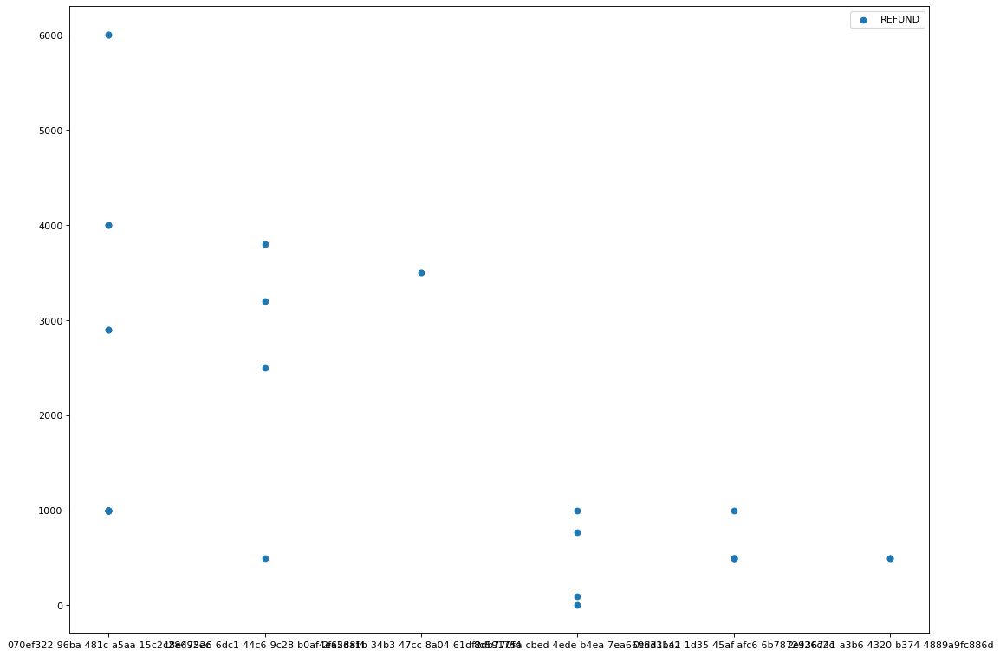

OTHER    33
Name: externalParty.transactionCategory, dtype: int64


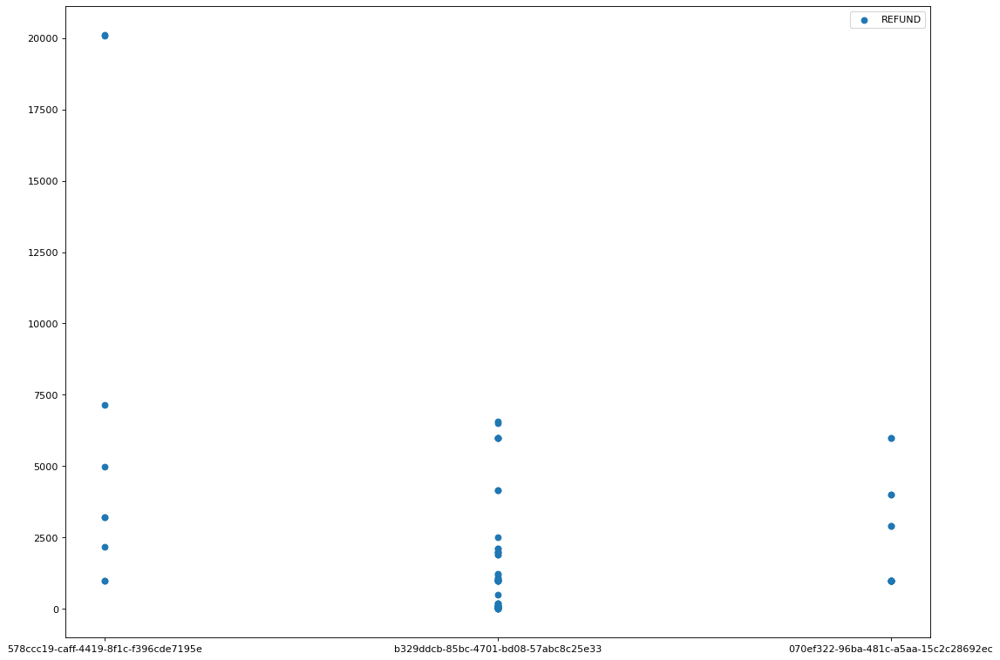

OTHER        68
LIFESTYLE     4
Name: externalParty.transactionCategory, dtype: int64


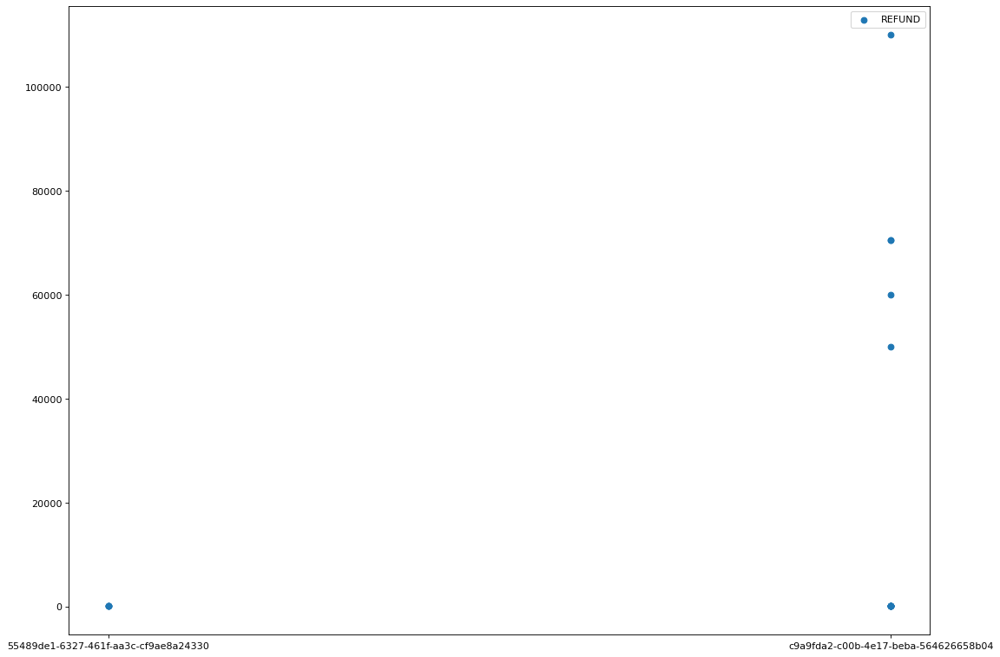

OTHER    17
Name: externalParty.transactionCategory, dtype: int64


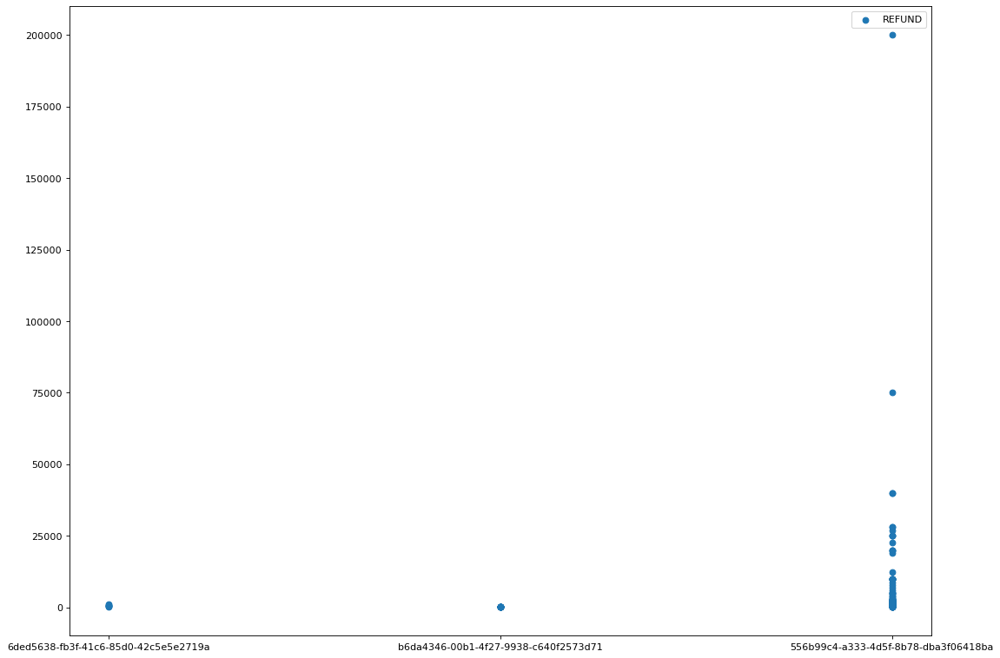

OTHER        58
TRAVEL       34
GROCERIES     6
SHOPPING      5
LIFESTYLE     4
Name: externalParty.transactionCategory, dtype: int64


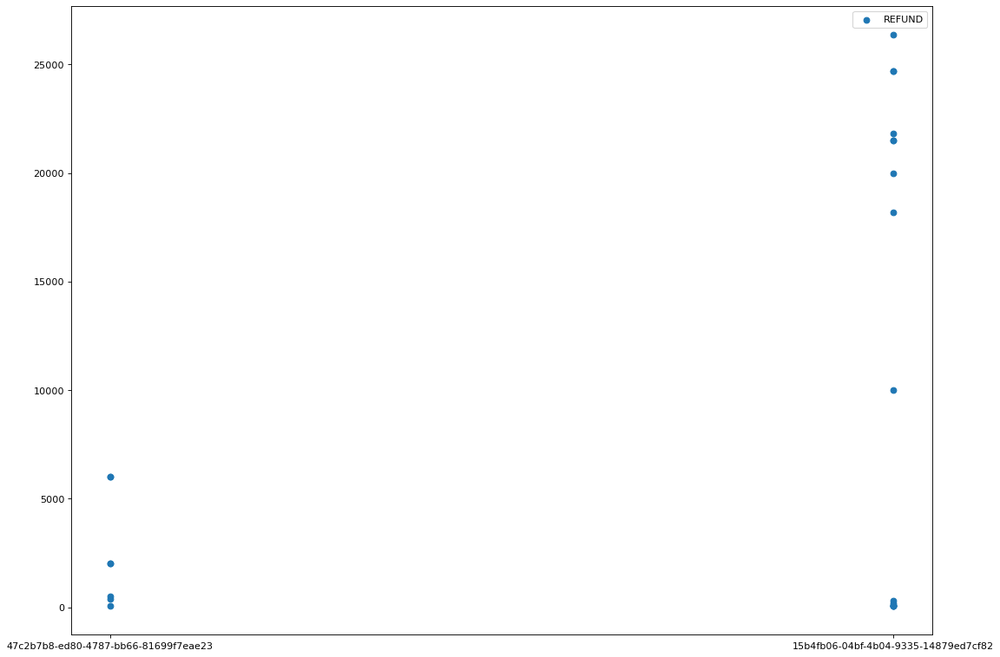

OTHER    23
Name: externalParty.transactionCategory, dtype: int64


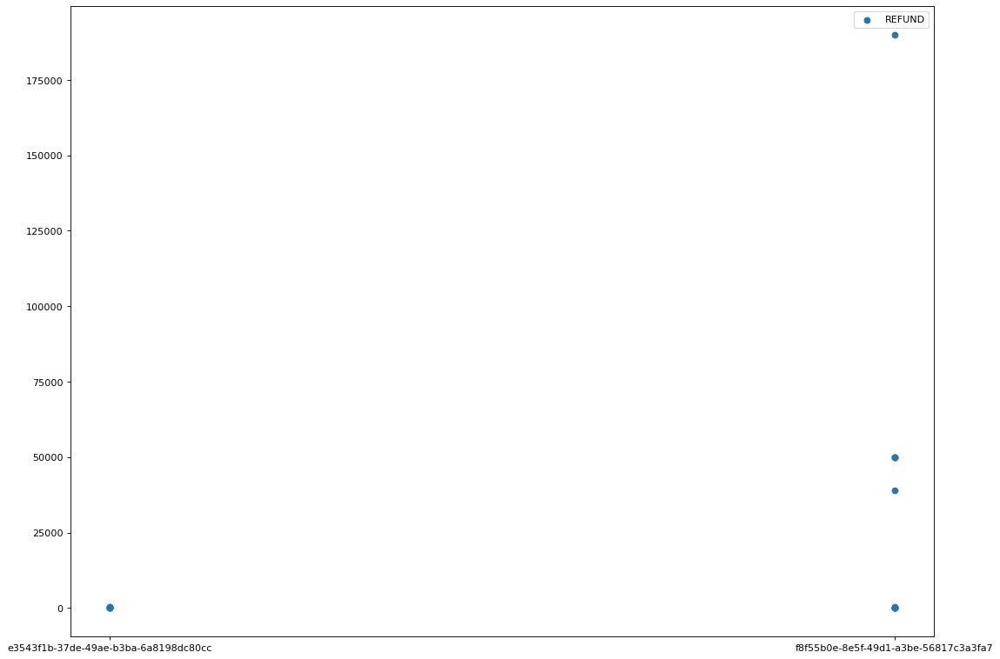

OTHER    18
Name: externalParty.transactionCategory, dtype: int64


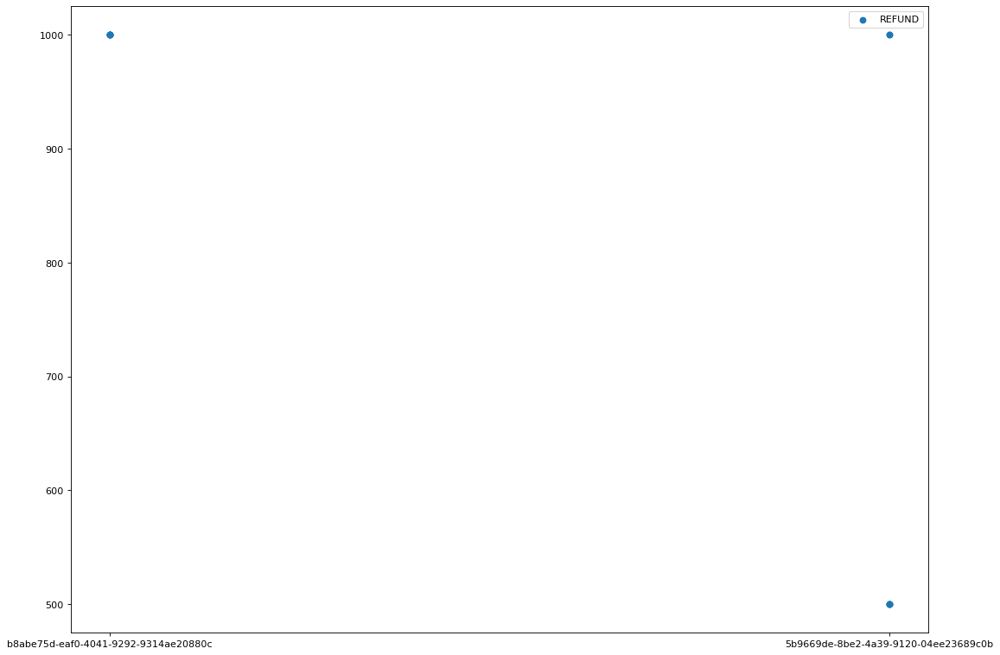

OTHER    12
Name: externalParty.transactionCategory, dtype: int64


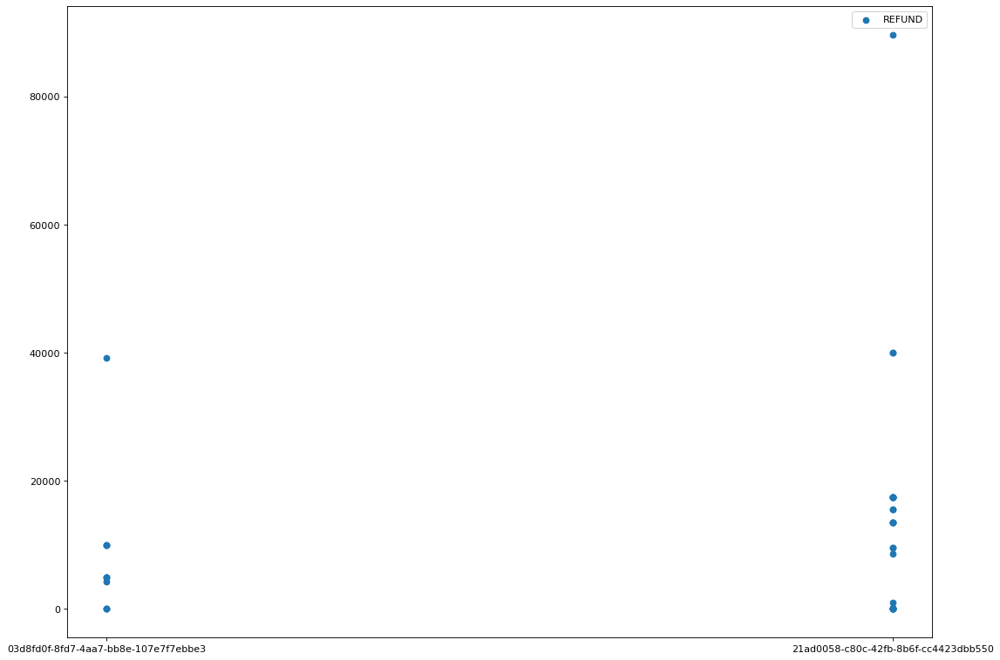

OTHER    38
Name: externalParty.transactionCategory, dtype: int64


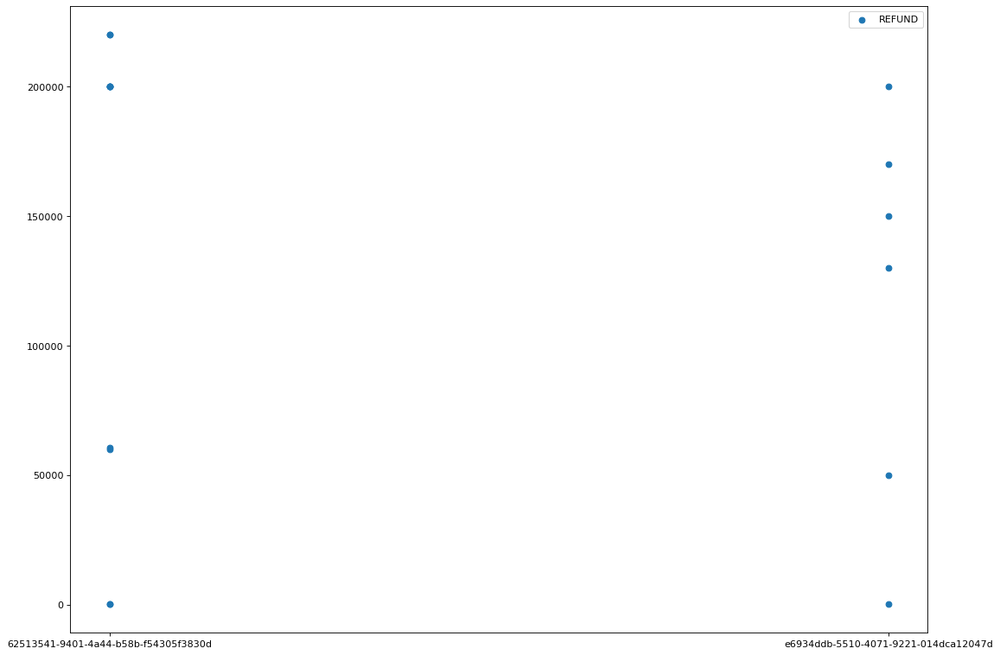

OTHER    16
Name: externalParty.transactionCategory, dtype: int64


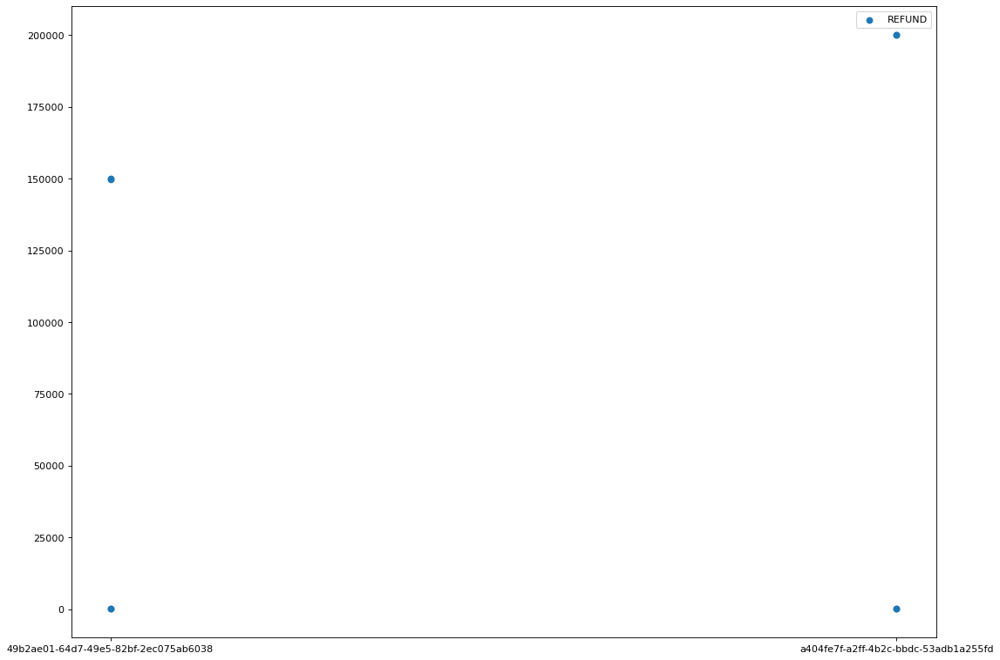

OTHER    8
Name: externalParty.transactionCategory, dtype: int64


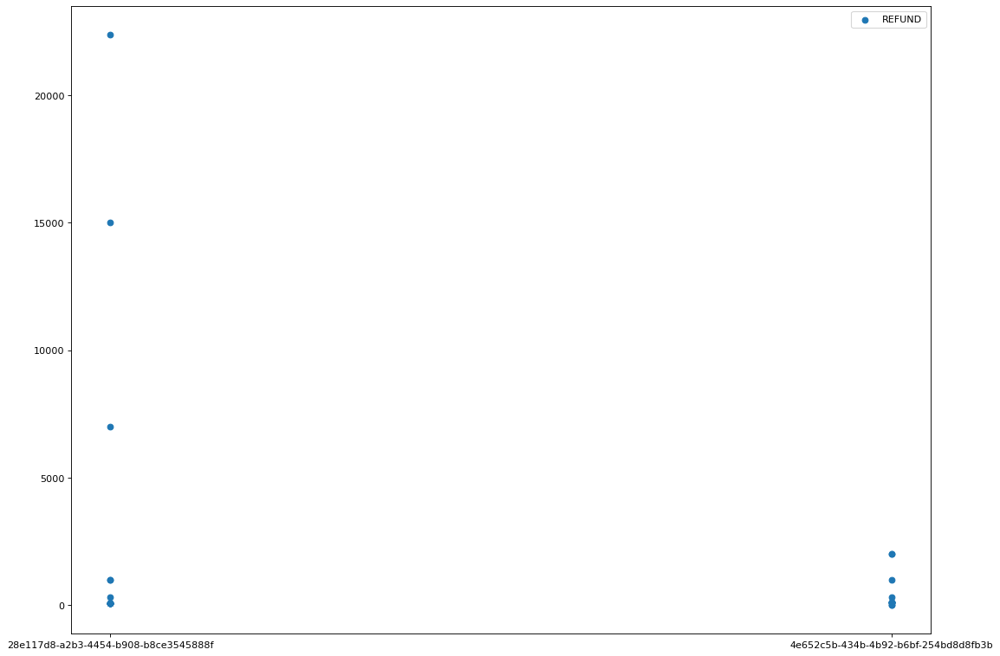

OTHER    26
Name: externalParty.transactionCategory, dtype: int64


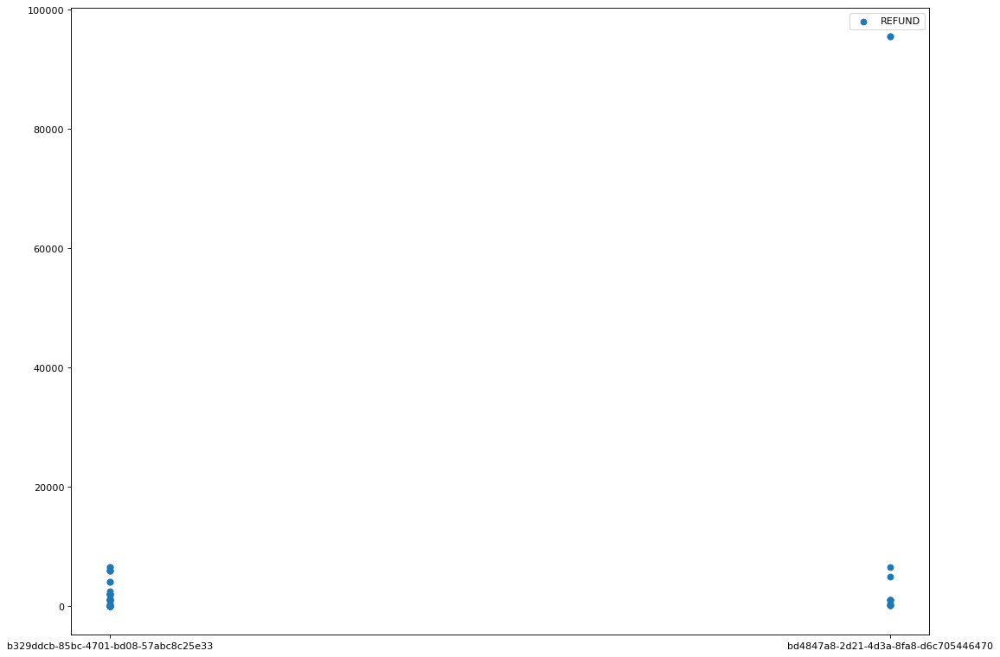

OTHER        57
LIFESTYLE     4
Name: externalParty.transactionCategory, dtype: int64


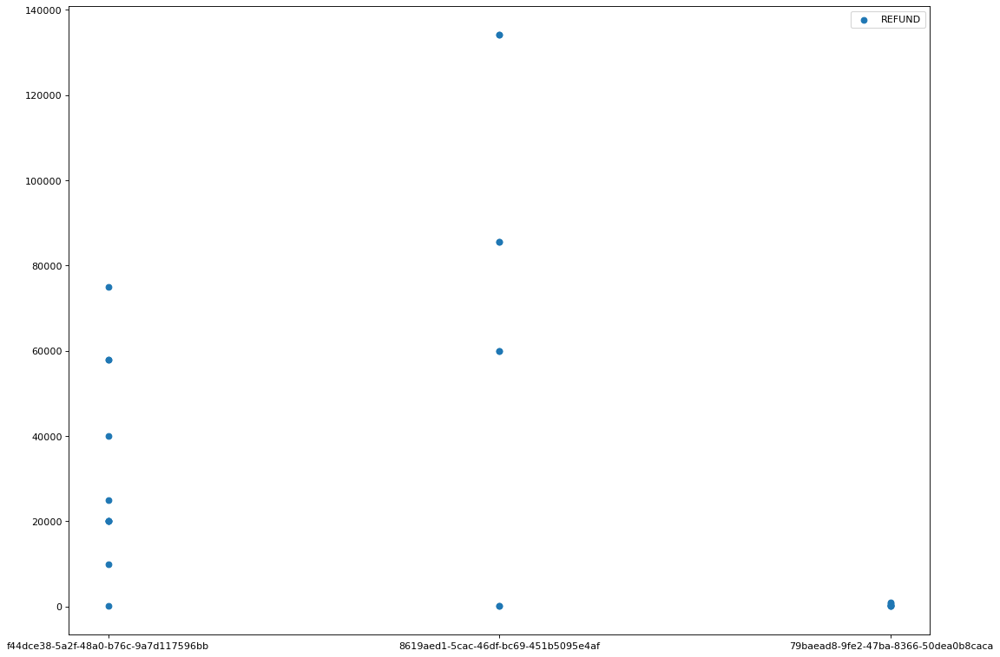

OTHER    26
Name: externalParty.transactionCategory, dtype: int64


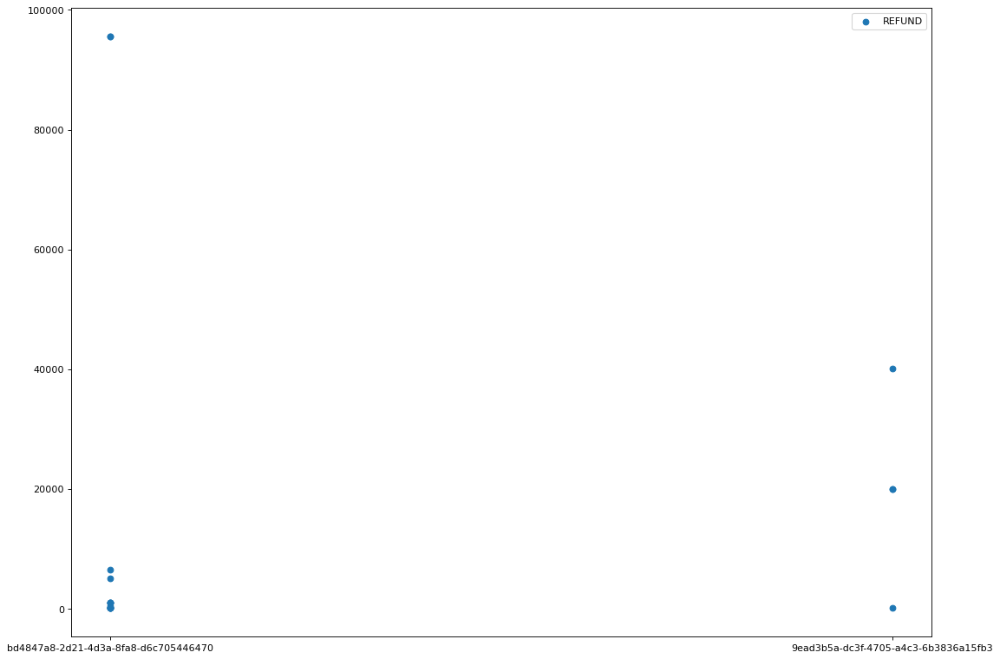

OTHER    18
Name: externalParty.transactionCategory, dtype: int64


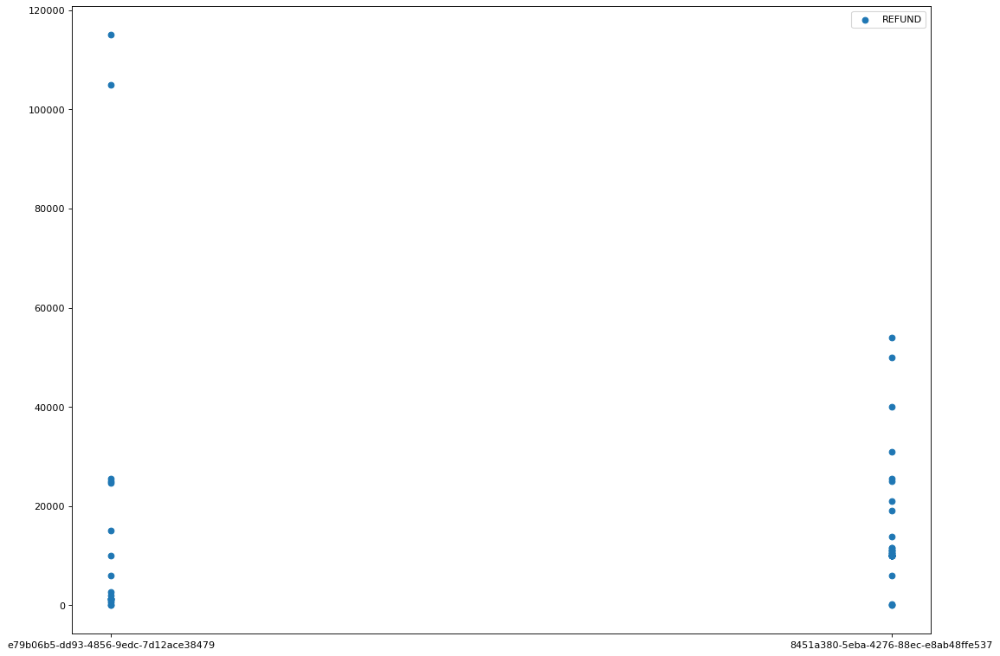

OTHER        47
LIFESTYLE     1
TRAVEL        1
GROCERIES     1
Name: externalParty.transactionCategory, dtype: int64


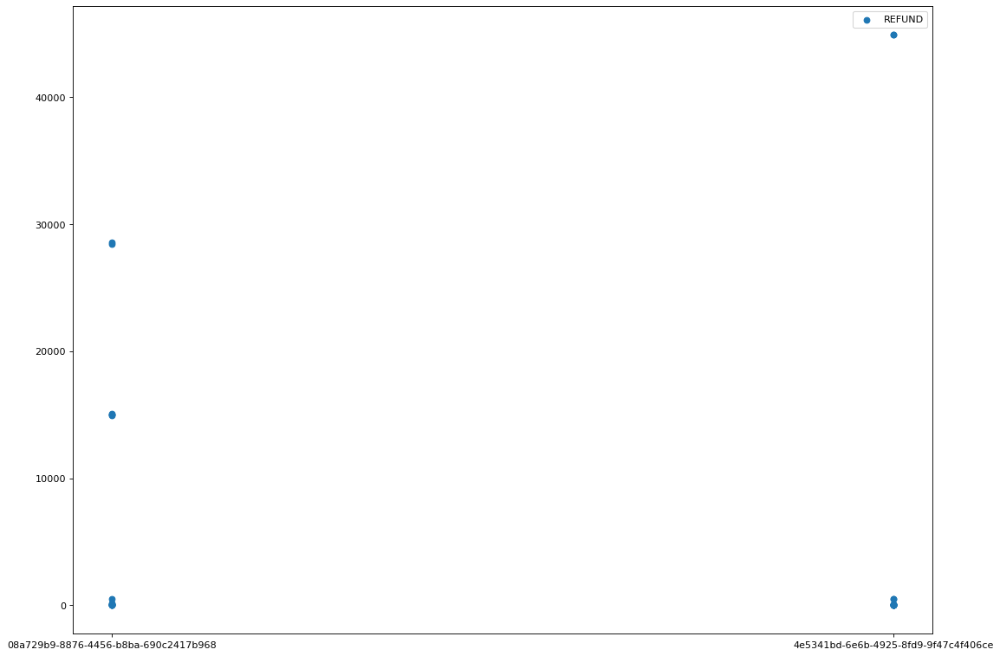

OTHER    30
Name: externalParty.transactionCategory, dtype: int64


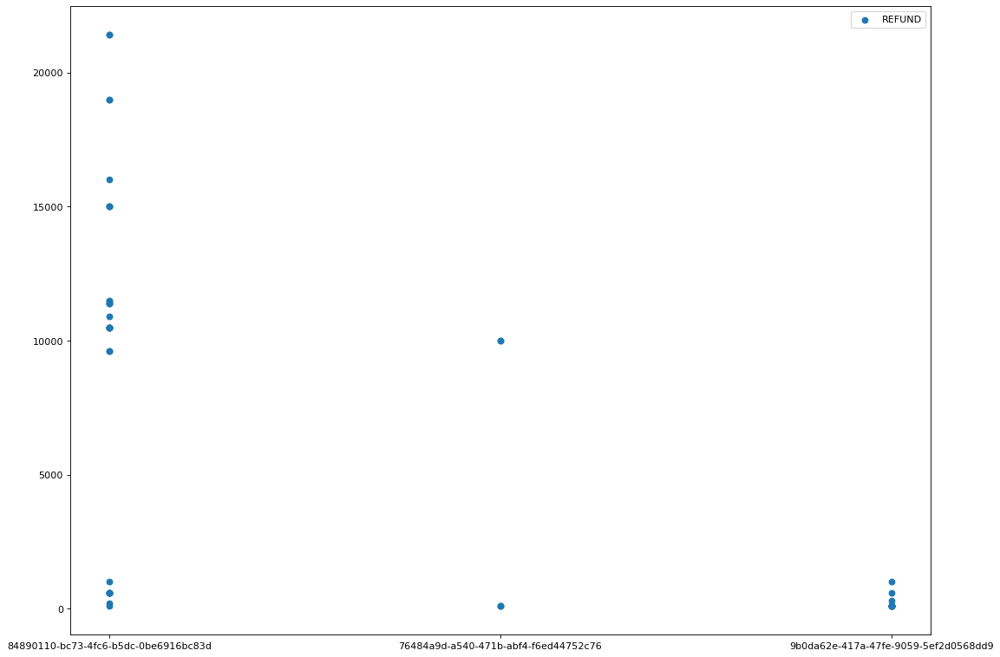

OTHER    52
Name: externalParty.transactionCategory, dtype: int64


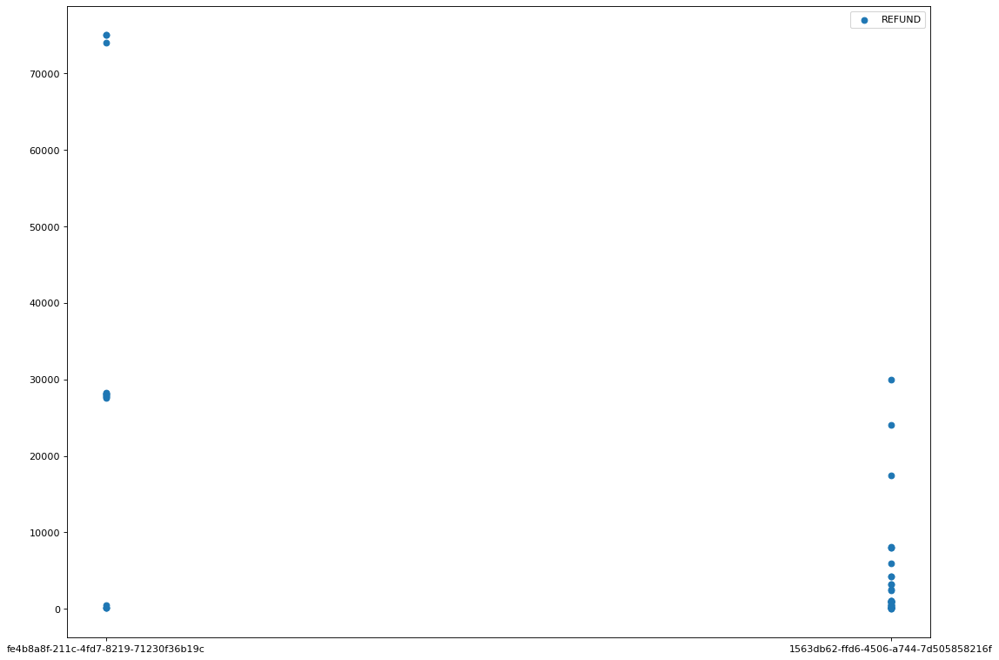

OTHER        35
GROCERIES     5
LIFESTYLE     4
TRAVEL        3
SHOPPING      2
Name: externalParty.transactionCategory, dtype: int64


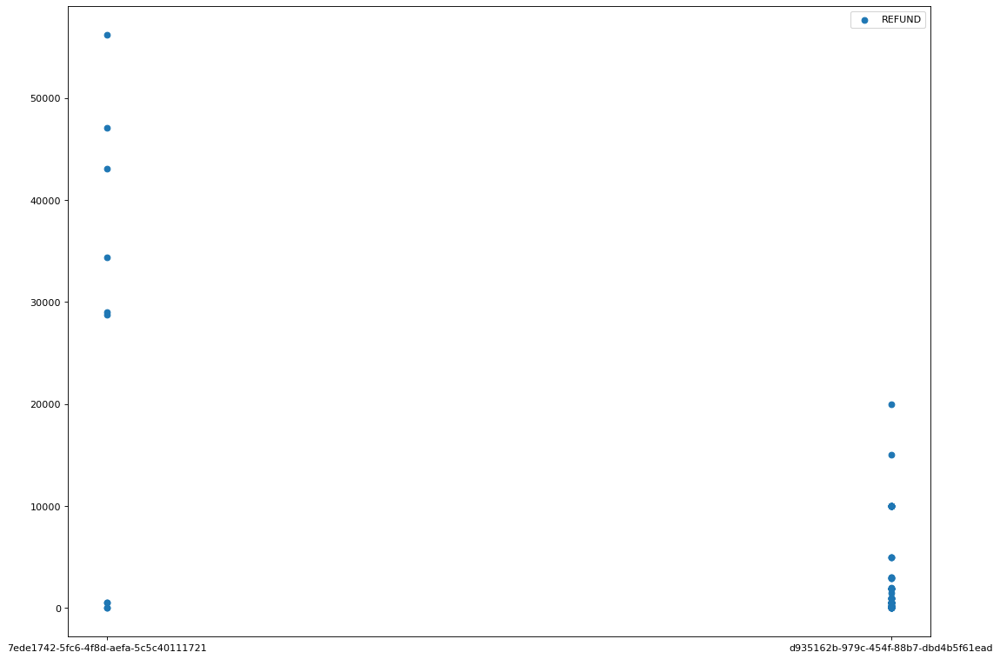

OTHER    86
Name: externalParty.transactionCategory, dtype: int64


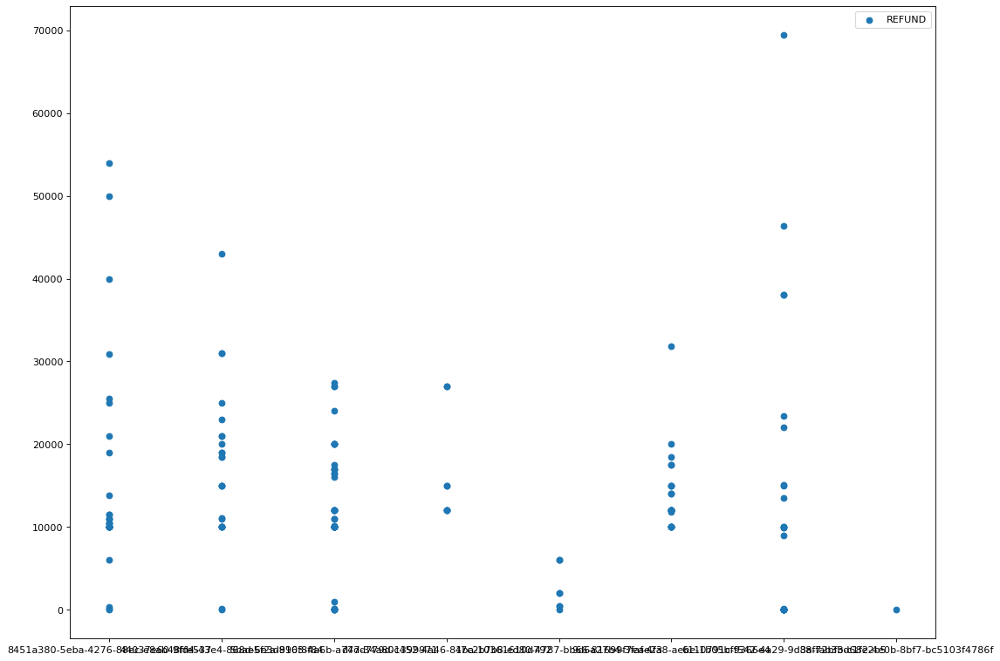

OTHER    164
Name: externalParty.transactionCategory, dtype: int64


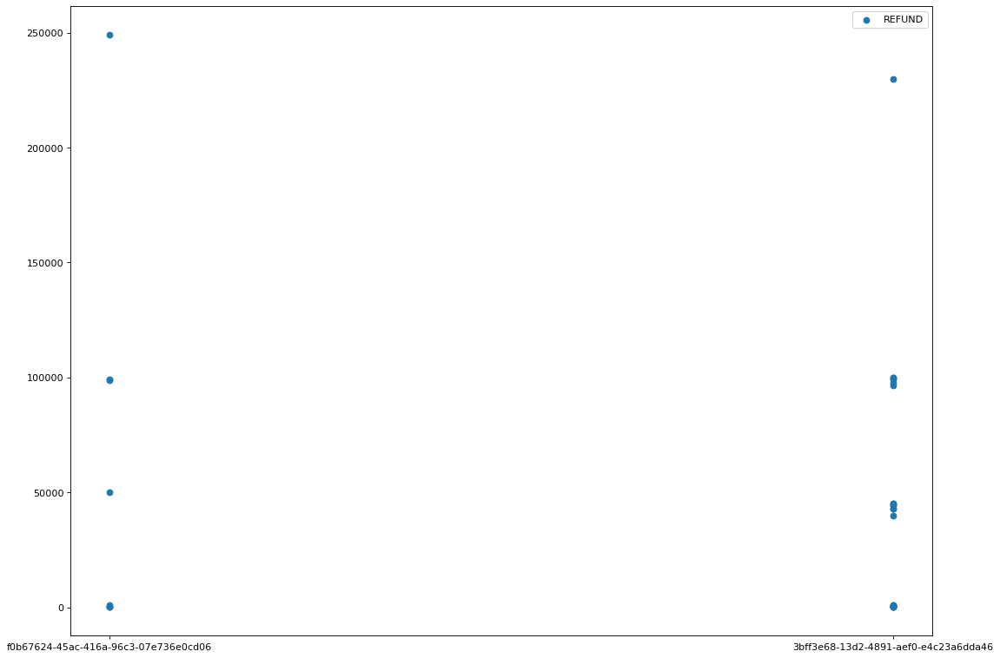

OTHER        29
GROCERIES     1
Name: externalParty.transactionCategory, dtype: int64


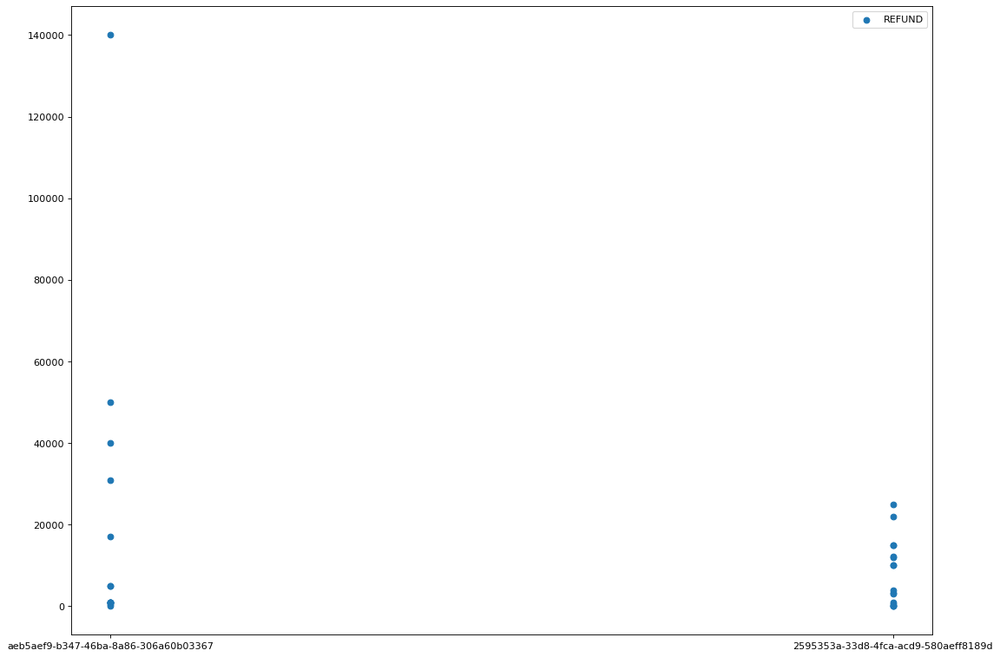

OTHER    30
Name: externalParty.transactionCategory, dtype: int64


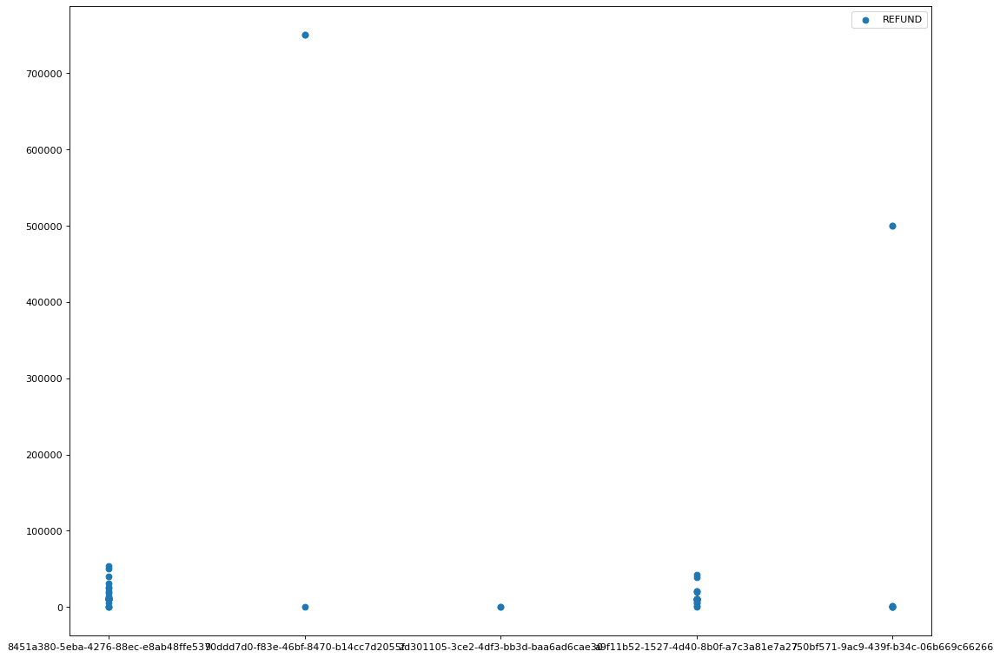

OTHER    64
Name: externalParty.transactionCategory, dtype: int64


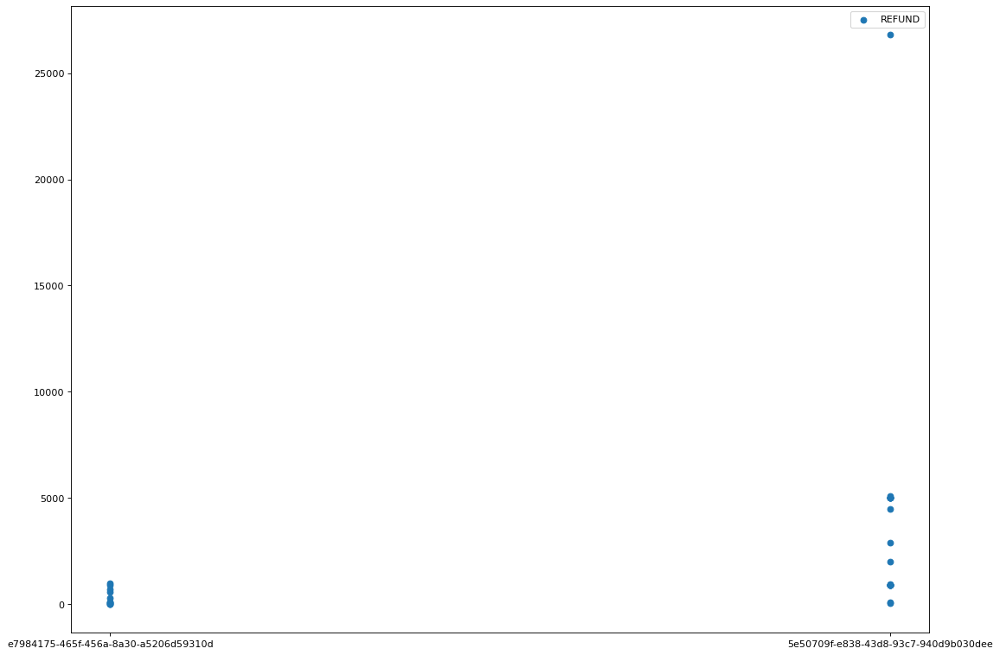

OTHER        29
GROCERIES     2
SHOPPING      1
Name: externalParty.transactionCategory, dtype: int64


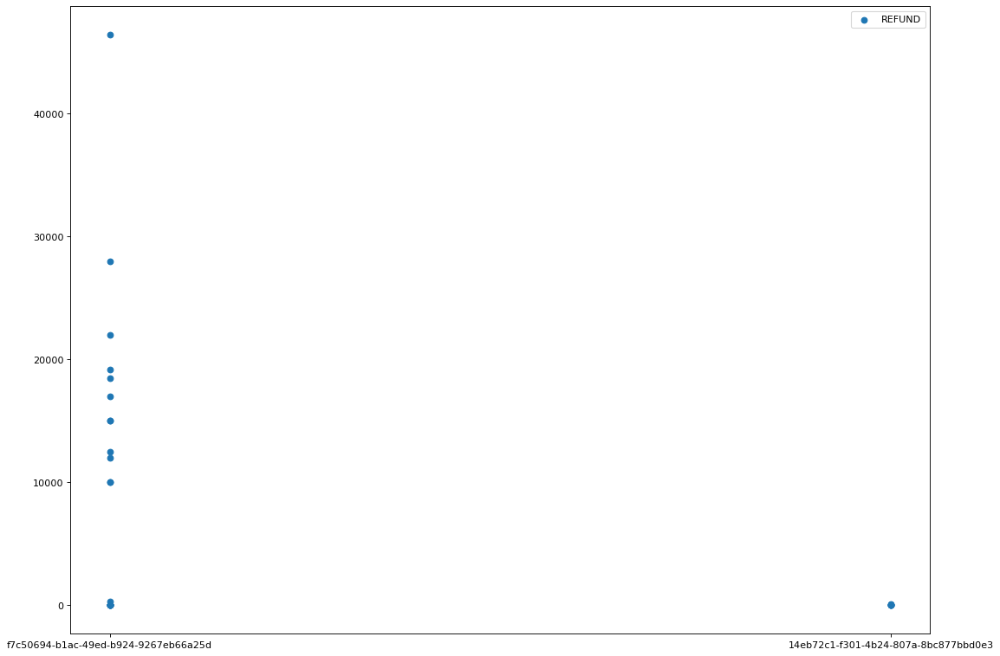

OTHER    26
Name: externalParty.transactionCategory, dtype: int64


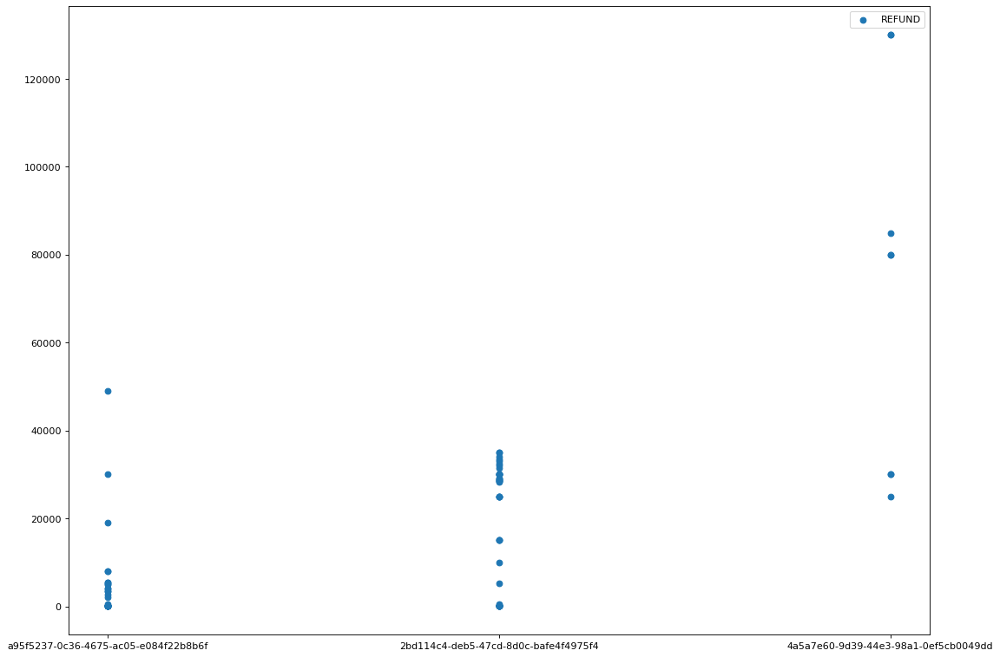

OTHER    82
Name: externalParty.transactionCategory, dtype: int64


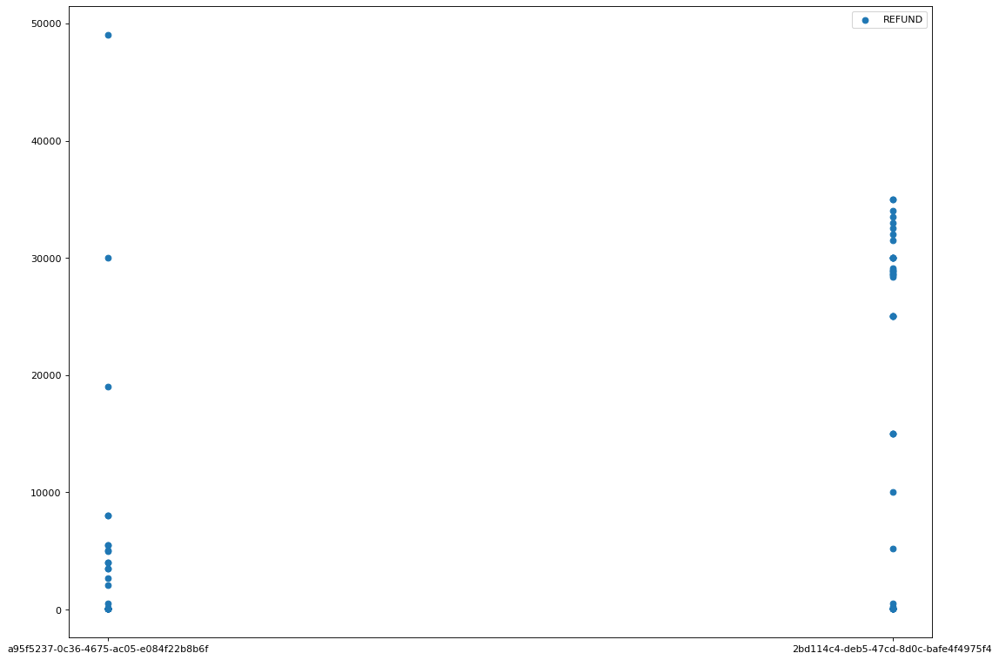

OTHER    74
Name: externalParty.transactionCategory, dtype: int64


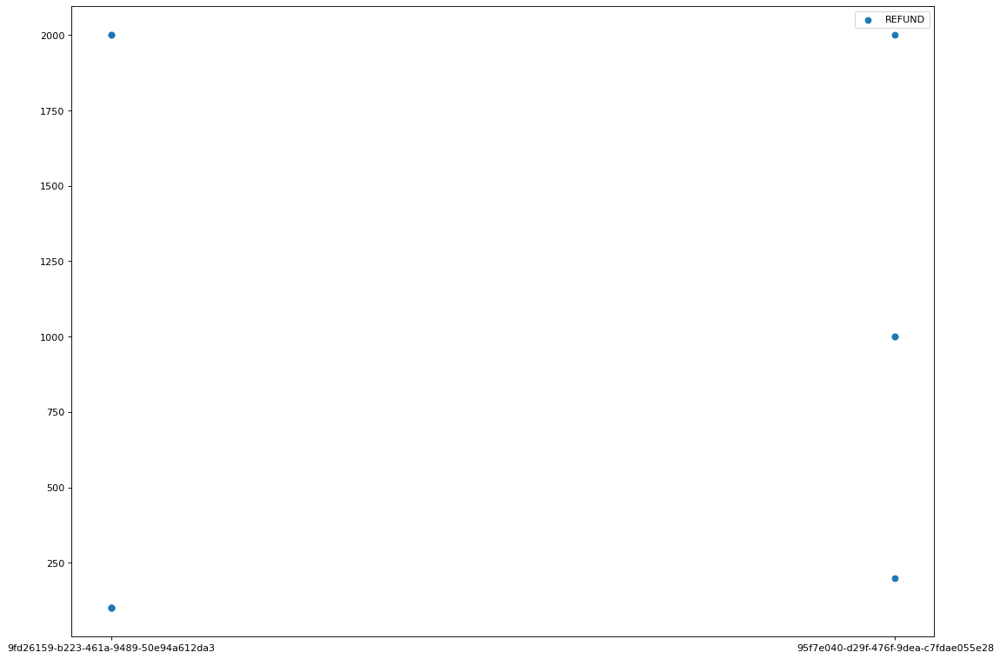

OTHER    10
Name: externalParty.transactionCategory, dtype: int64


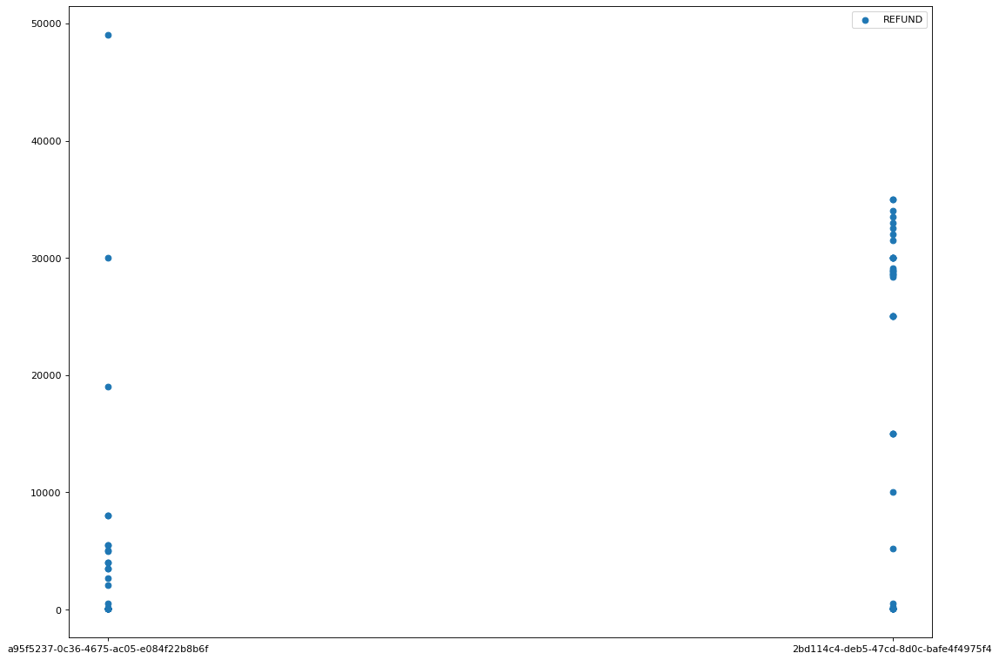

OTHER    74
Name: externalParty.transactionCategory, dtype: int64


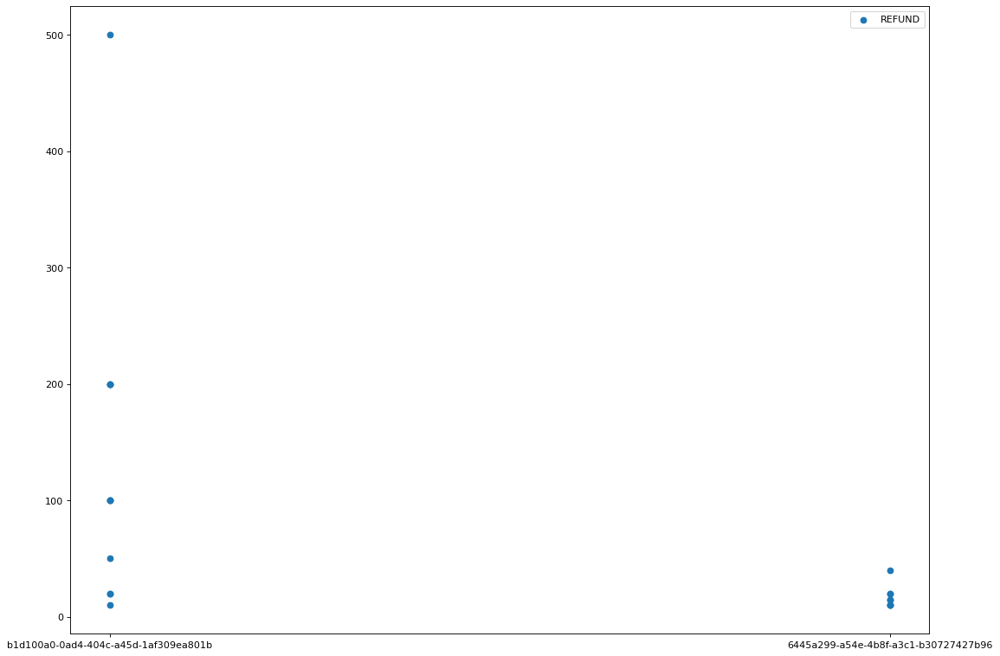

OTHER    19
Name: externalParty.transactionCategory, dtype: int64


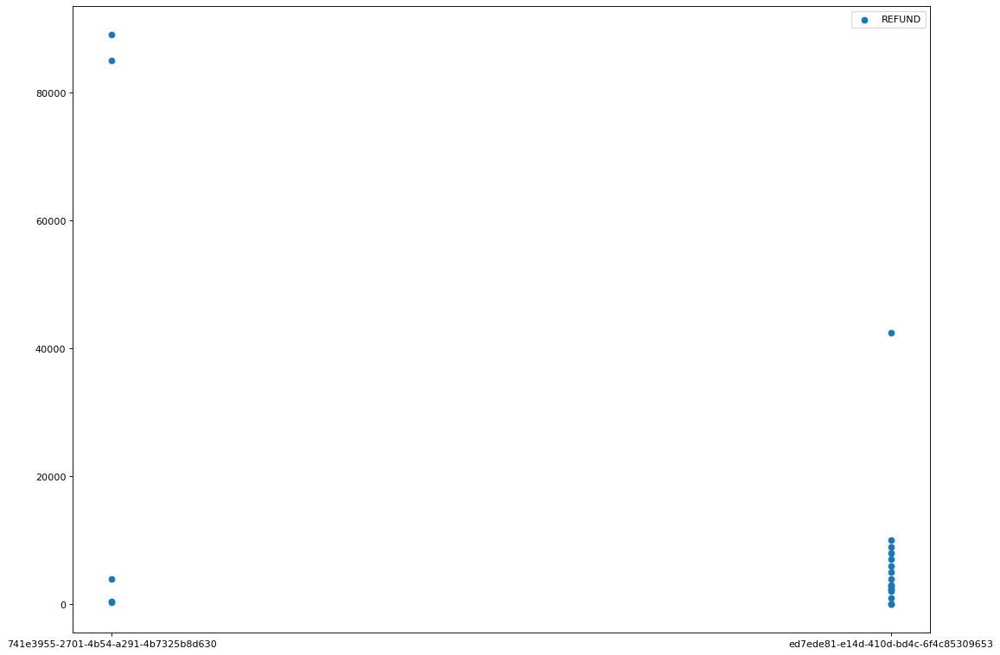

OTHER    21
Name: externalParty.transactionCategory, dtype: int64


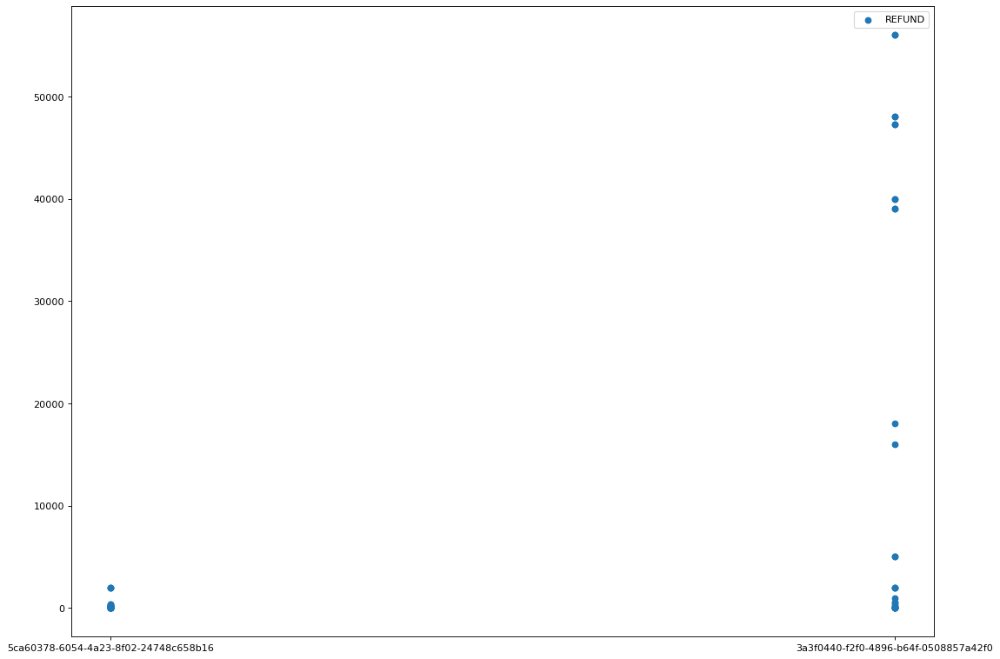

OTHER    94
Name: externalParty.transactionCategory, dtype: int64


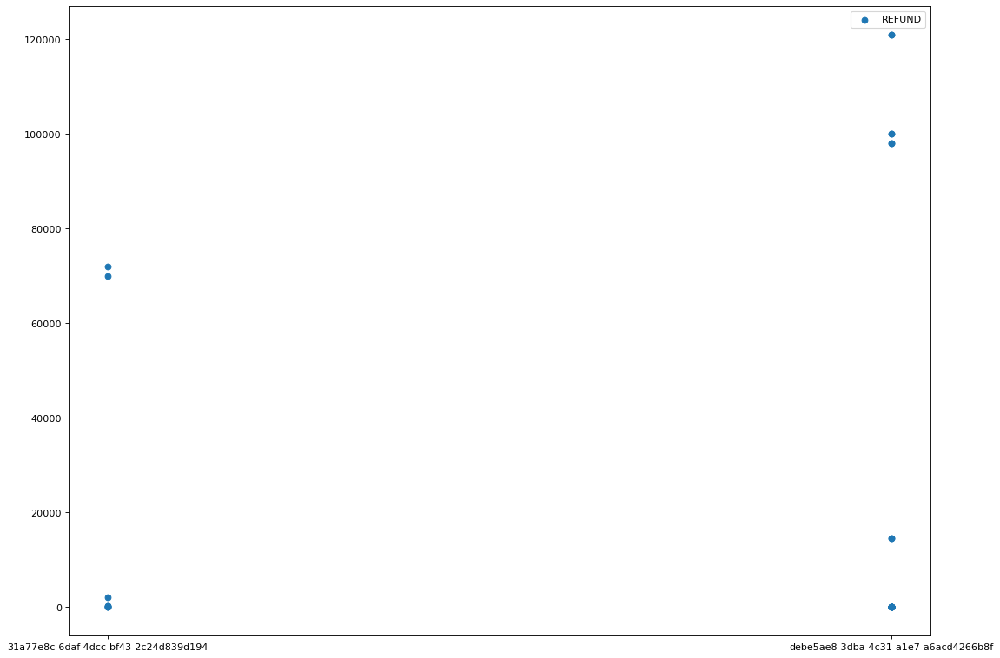

OTHER    29
Name: externalParty.transactionCategory, dtype: int64


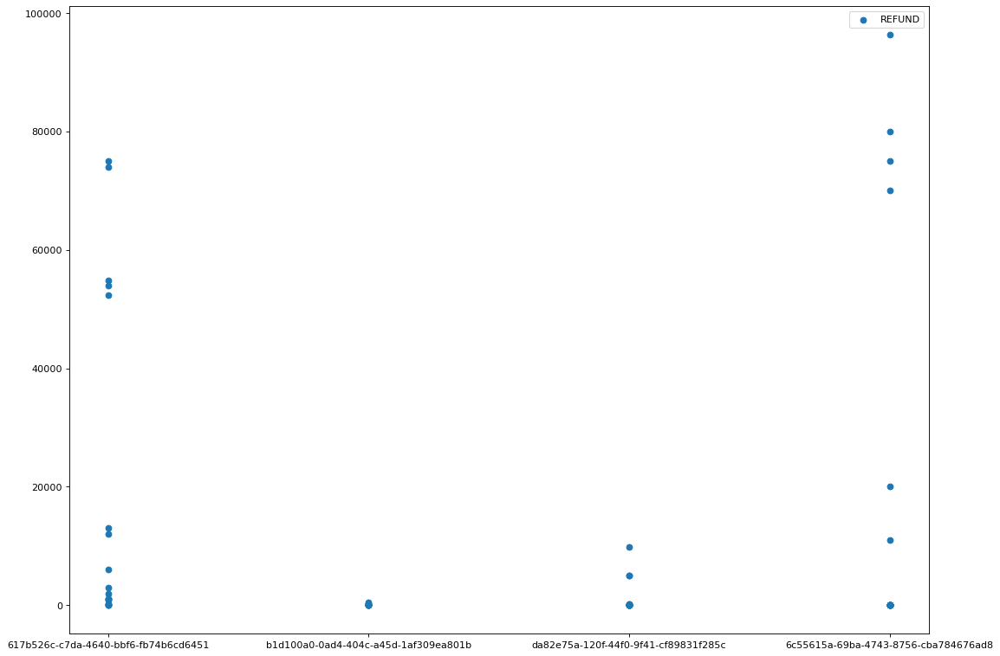

OTHER    68
Name: externalParty.transactionCategory, dtype: int64


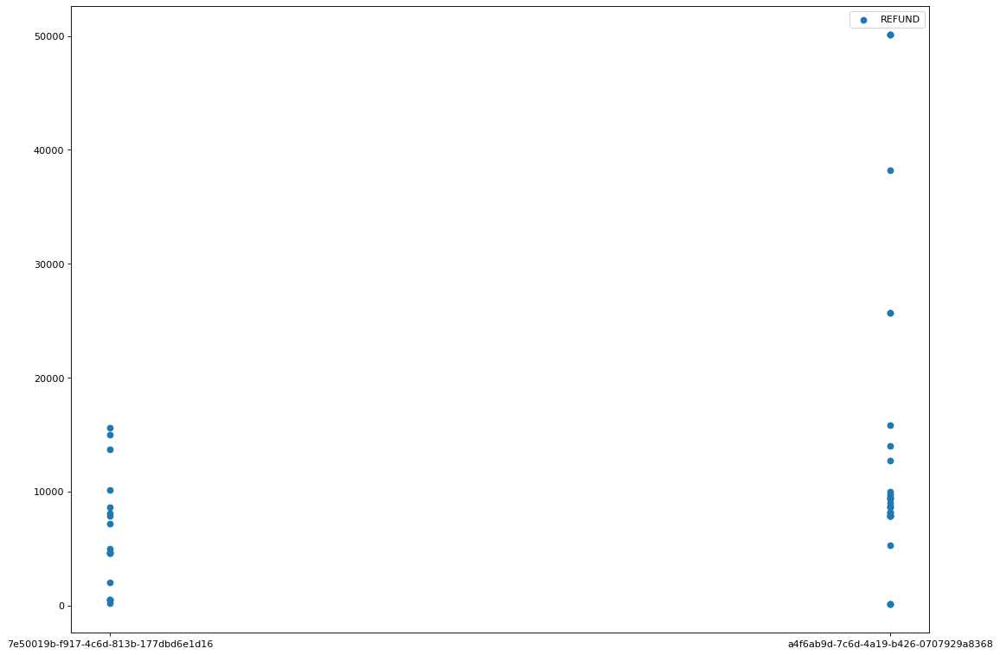

OTHER       46
SHOPPING     3
Name: externalParty.transactionCategory, dtype: int64


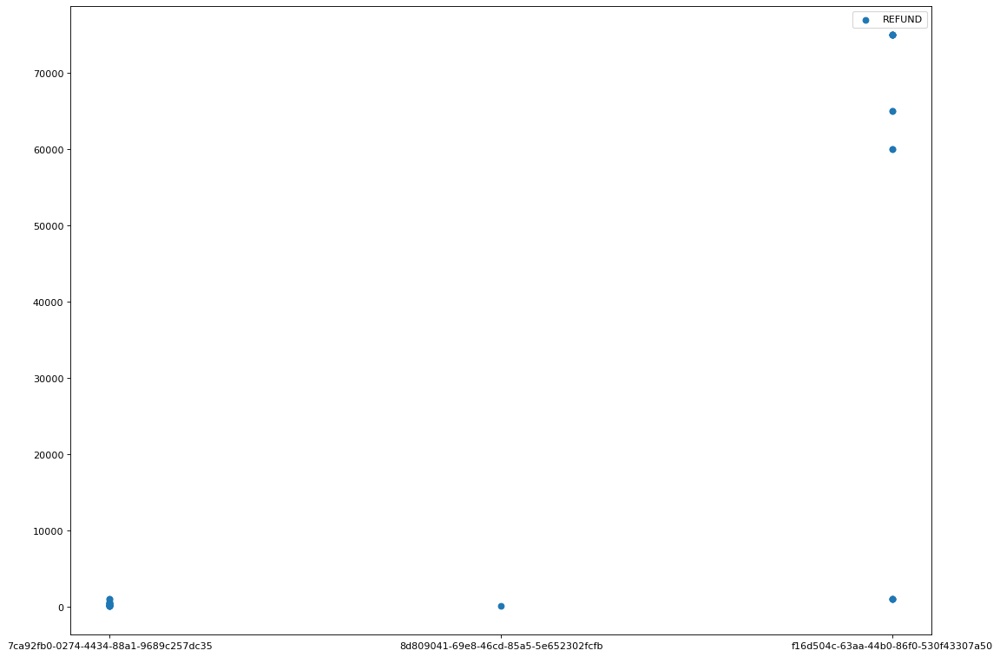

OTHER    31
Name: externalParty.transactionCategory, dtype: int64


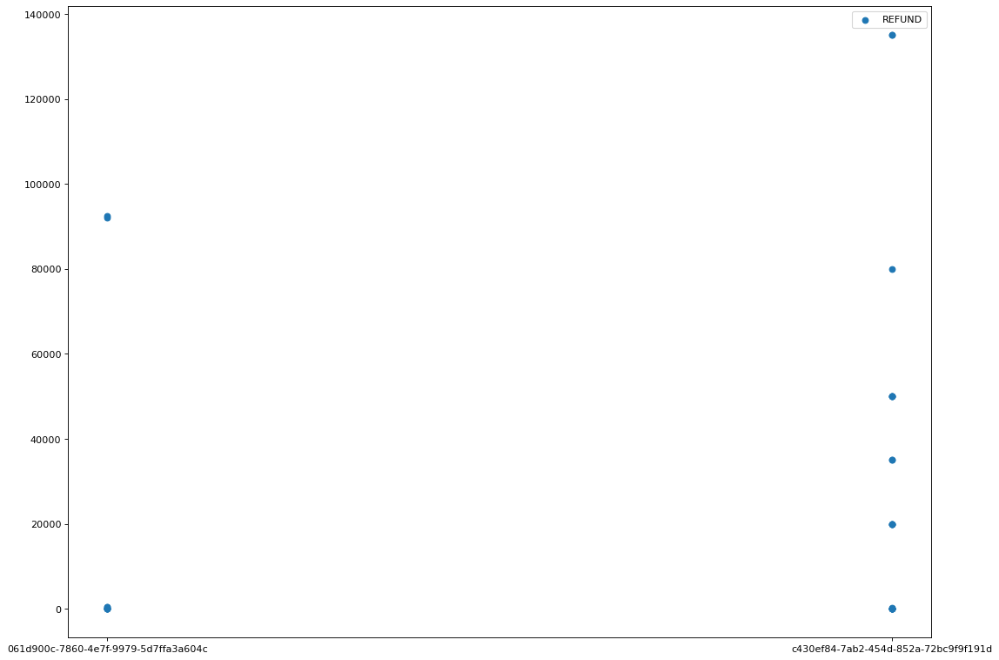

OTHER    30
Name: externalParty.transactionCategory, dtype: int64


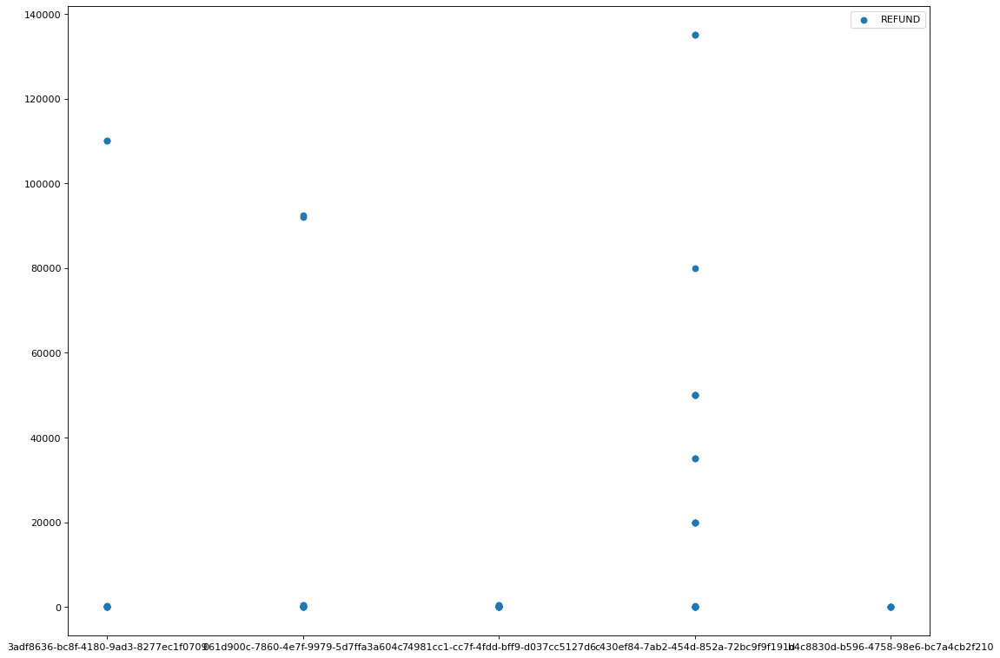

OTHER    55
Name: externalParty.transactionCategory, dtype: int64


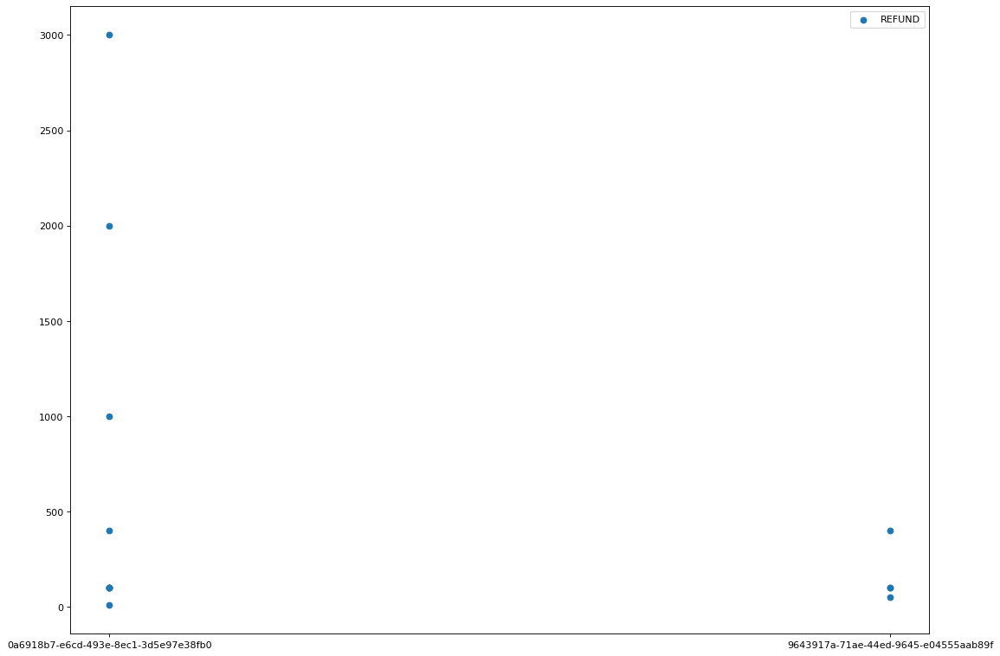

OTHER    13
Name: externalParty.transactionCategory, dtype: int64


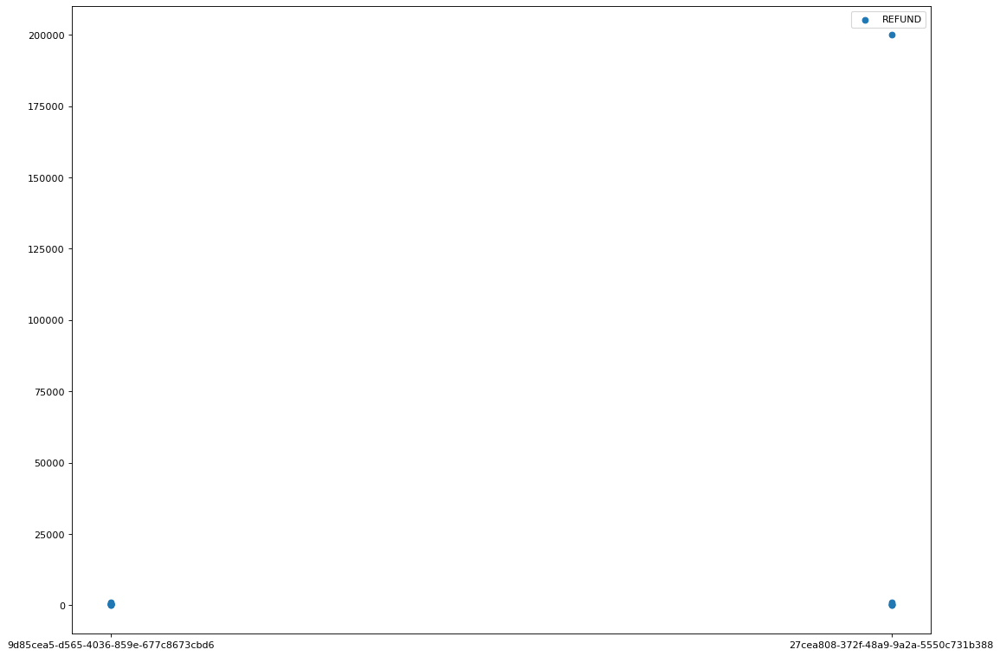

OTHER    15
Name: externalParty.transactionCategory, dtype: int64


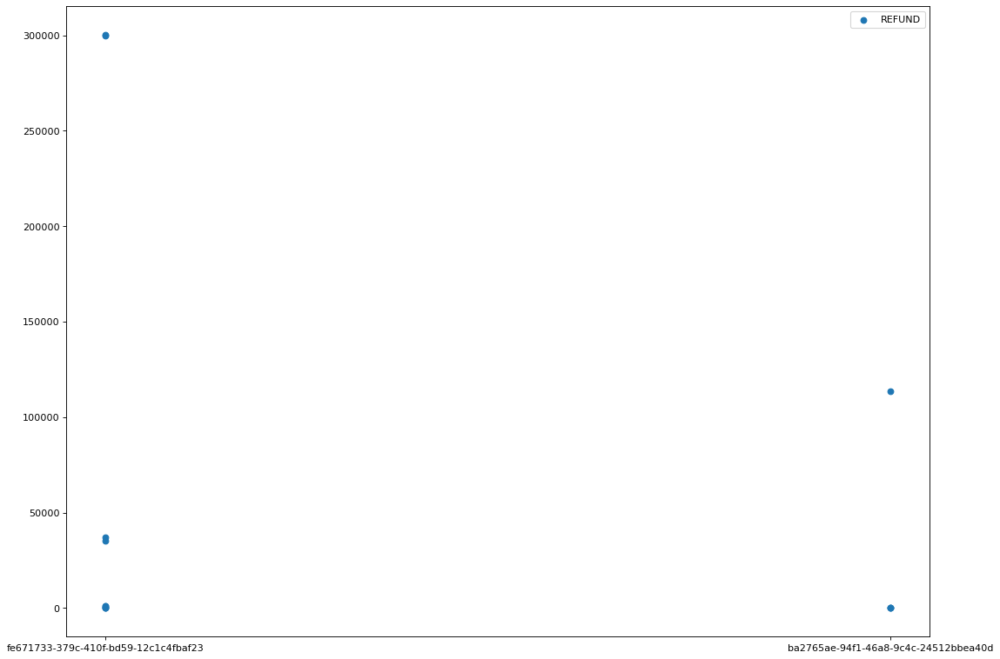

OTHER    13
Name: externalParty.transactionCategory, dtype: int64


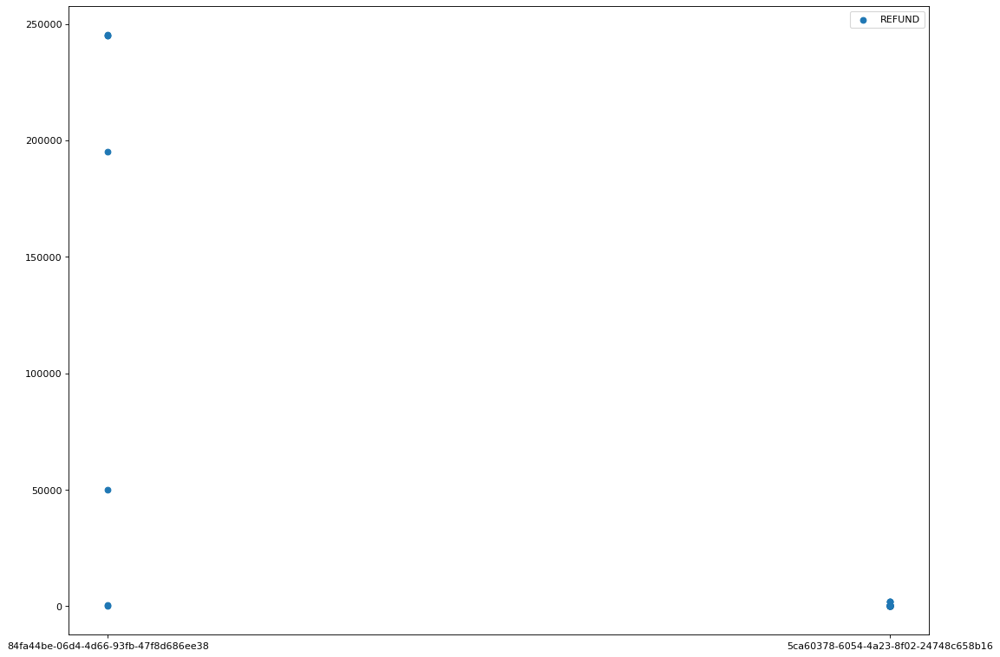

OTHER    72
Name: externalParty.transactionCategory, dtype: int64


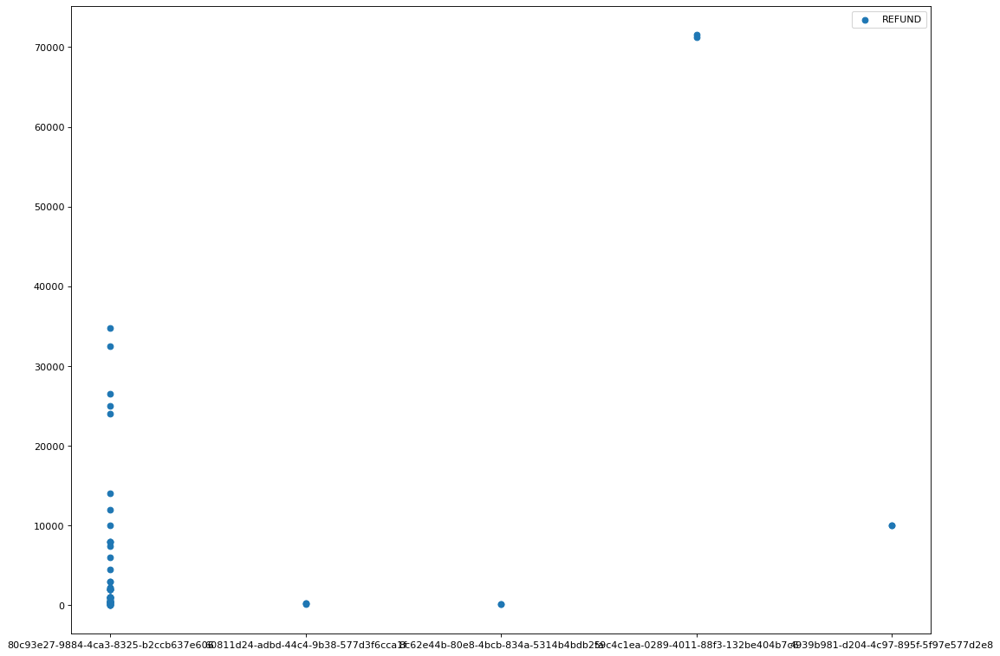

OTHER        47
GROCERIES     3
SHOPPING      3
TRAVEL        2
LIFESTYLE     1
Name: externalParty.transactionCategory, dtype: int64


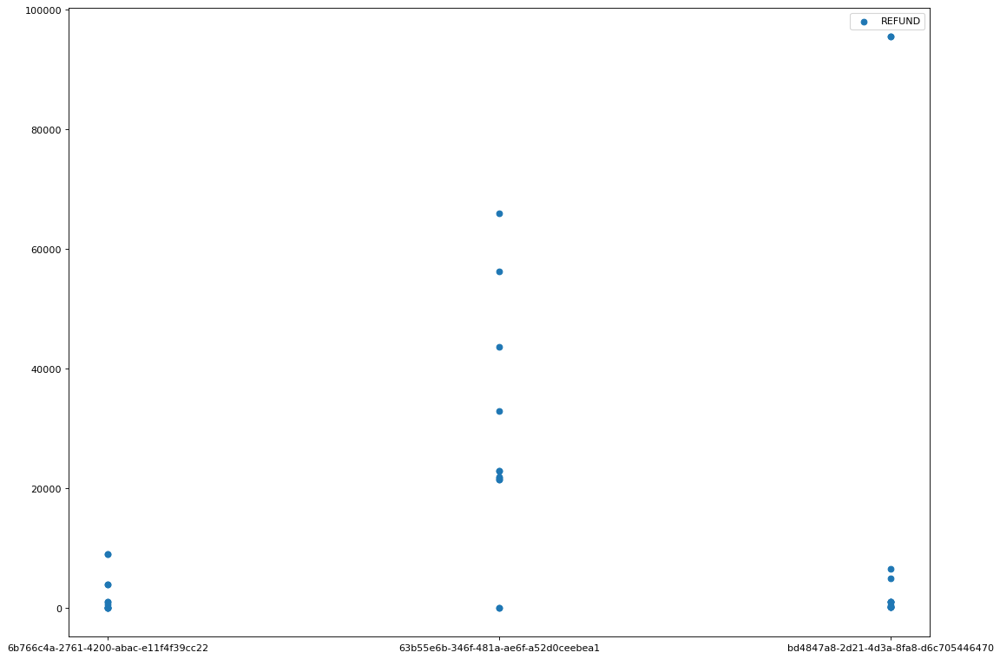

OTHER    38
Name: externalParty.transactionCategory, dtype: int64


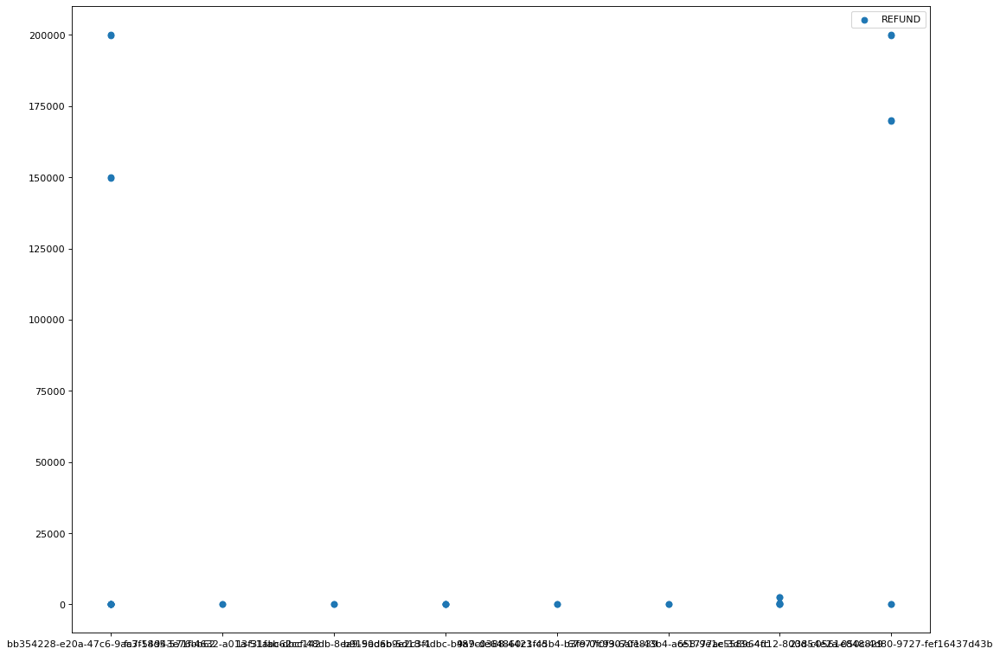

OTHER    36
Name: externalParty.transactionCategory, dtype: int64


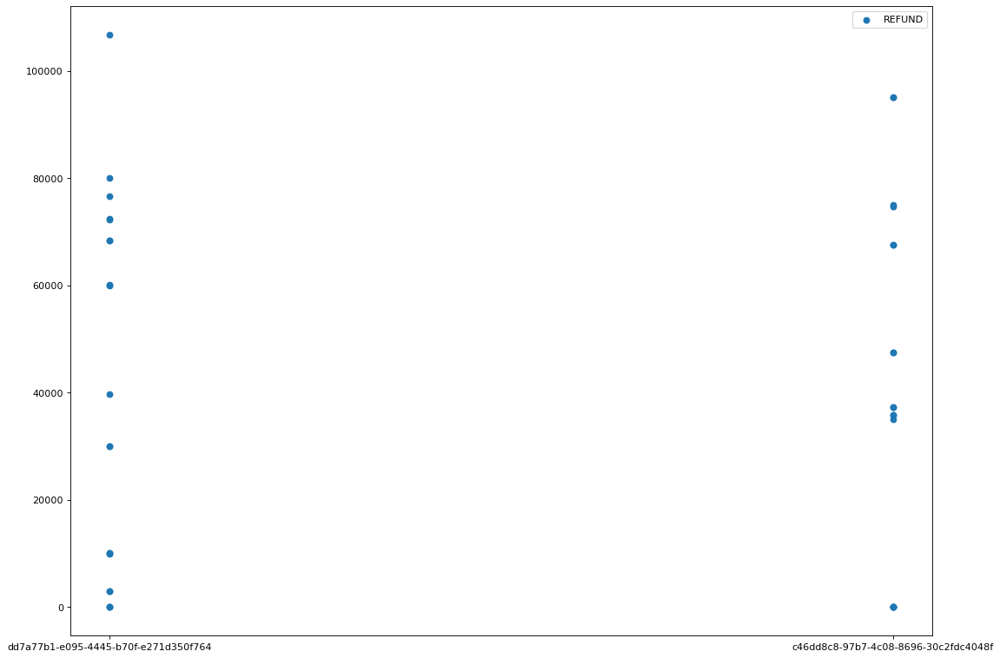

OTHER    38
Name: externalParty.transactionCategory, dtype: int64


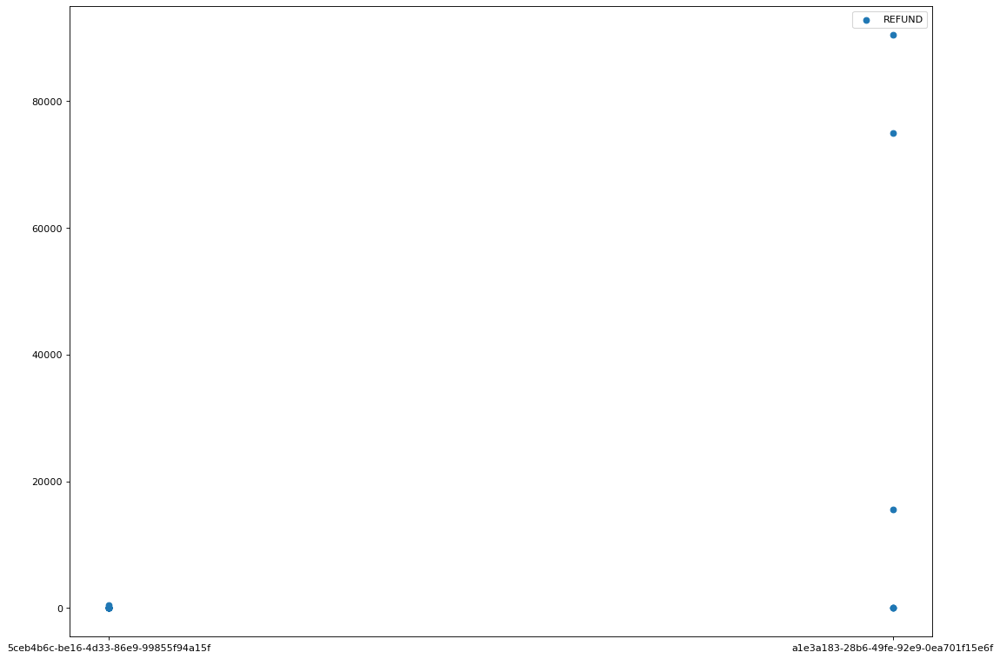

OTHER    26
Name: externalParty.transactionCategory, dtype: int64


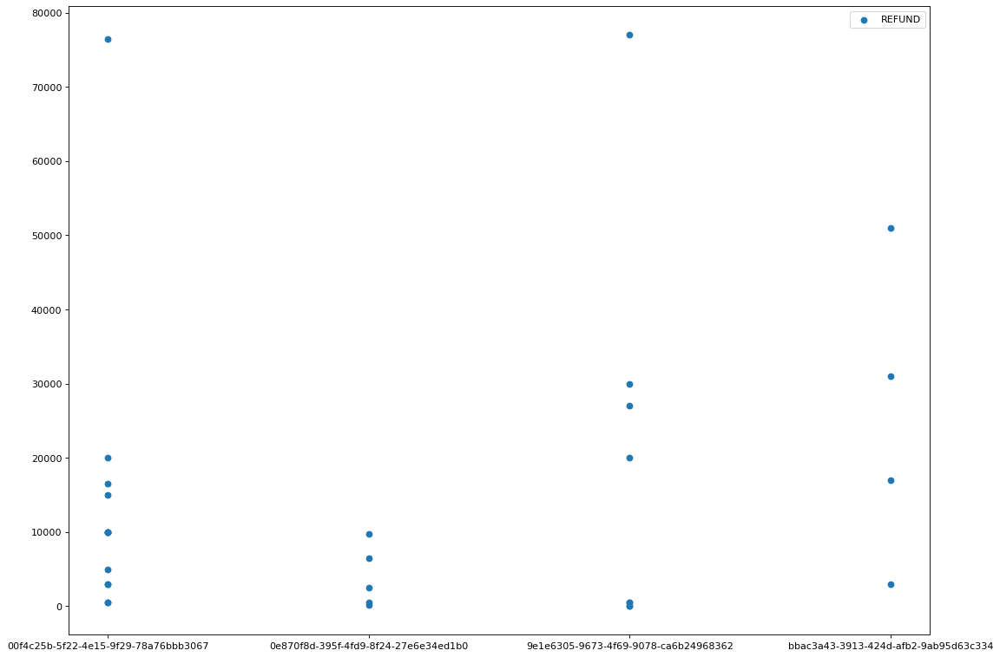

OTHER     29
TRAVEL     1
Name: externalParty.transactionCategory, dtype: int64


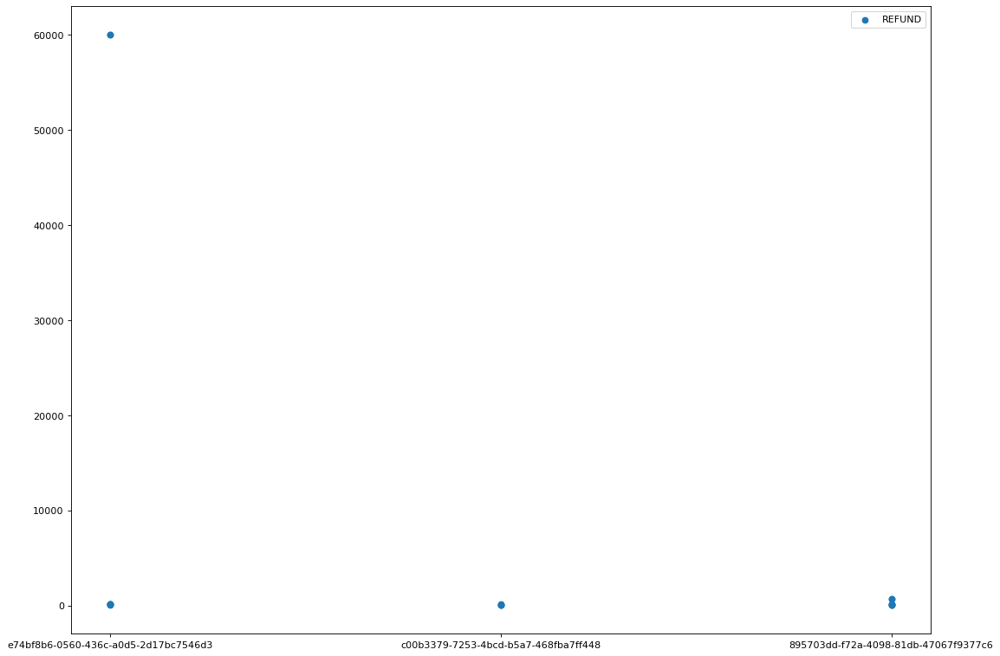

OTHER    18
Name: externalParty.transactionCategory, dtype: int64


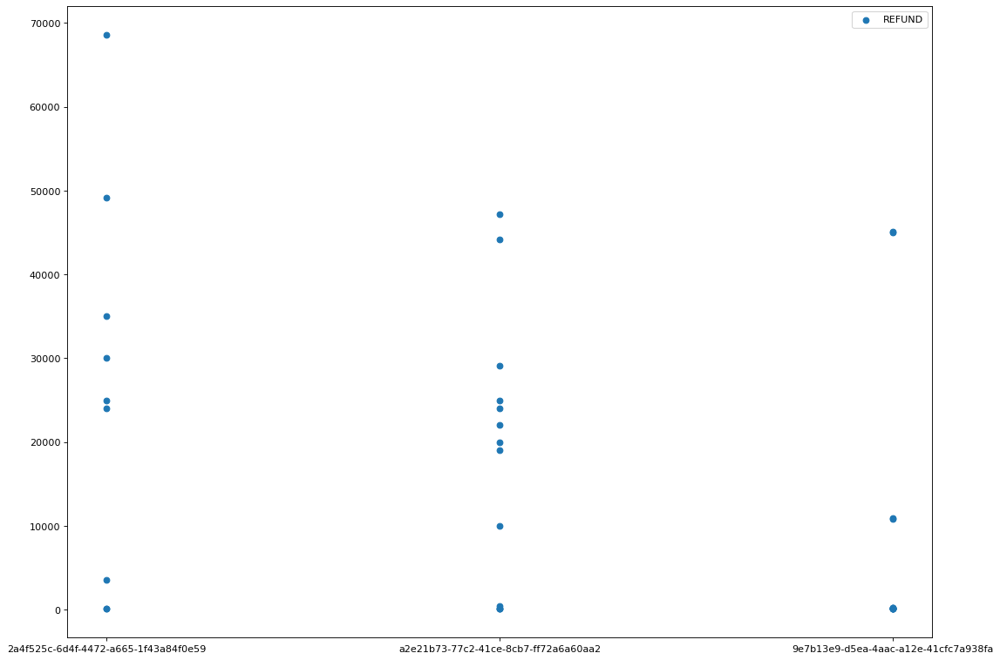

OTHER    34
Name: externalParty.transactionCategory, dtype: int64


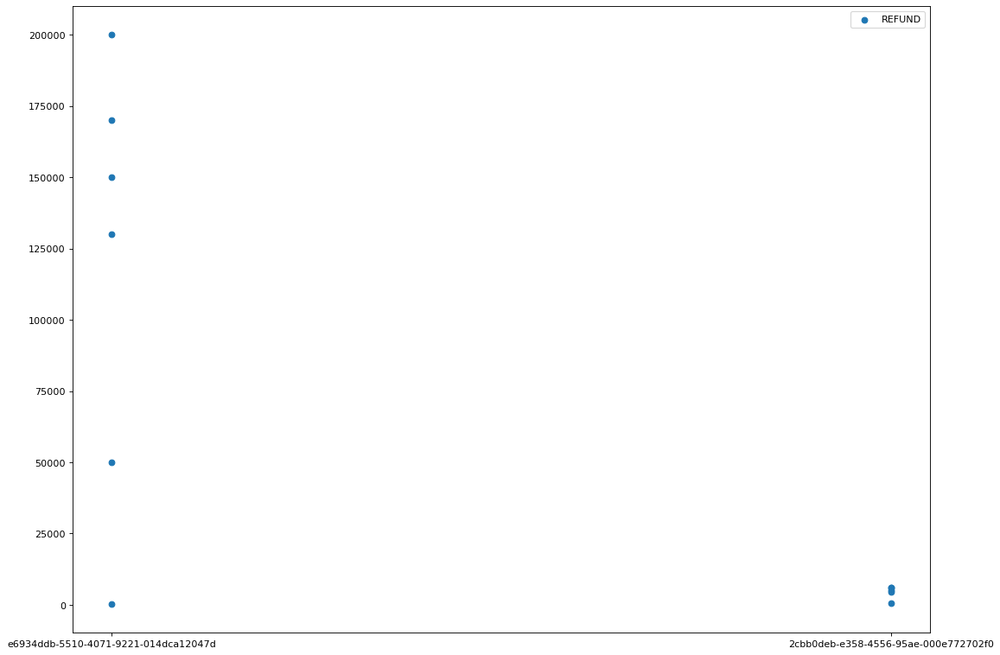

OTHER    11
Name: externalParty.transactionCategory, dtype: int64


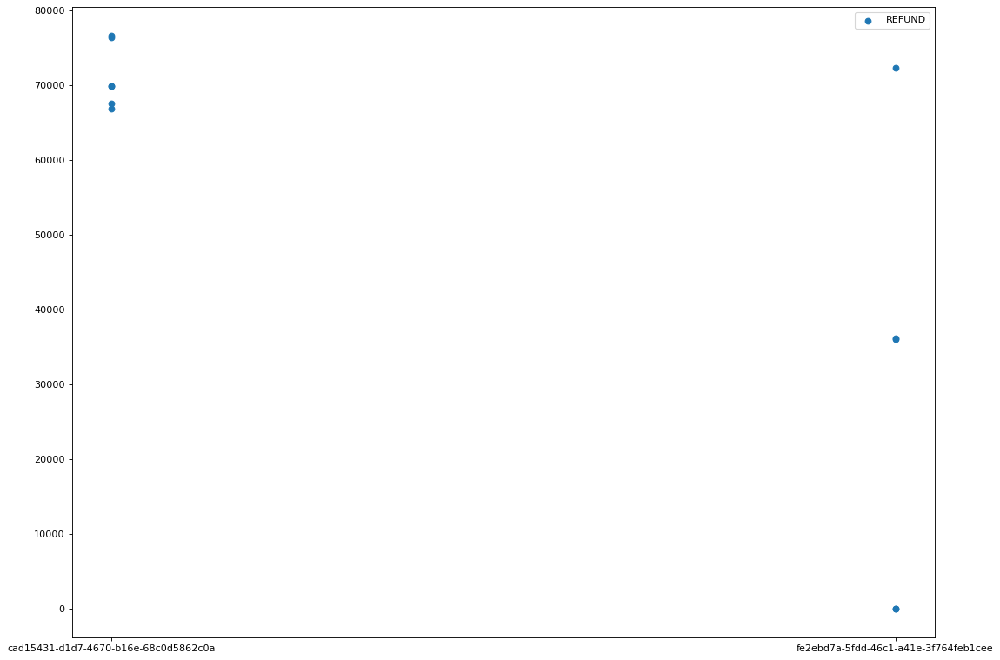

OTHER    11
Name: externalParty.transactionCategory, dtype: int64


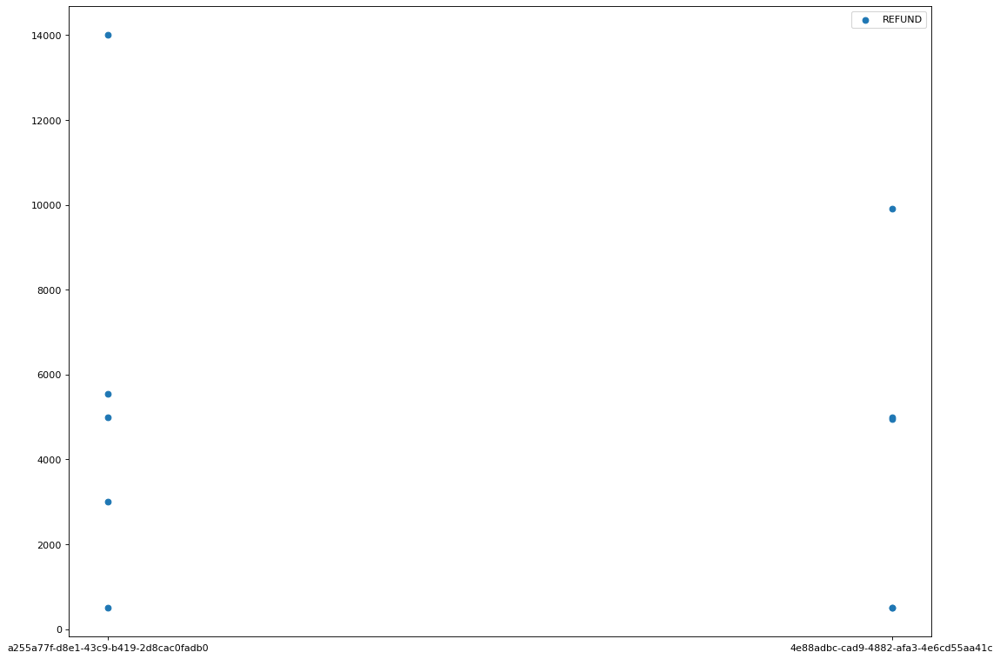

OTHER    10
Name: externalParty.transactionCategory, dtype: int64


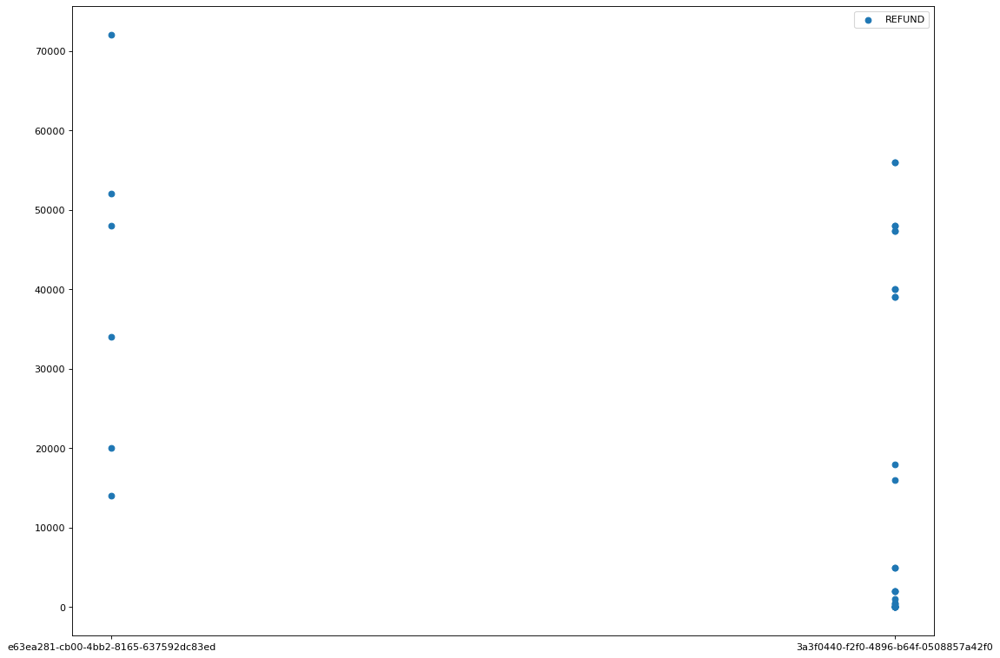

OTHER    35
Name: externalParty.transactionCategory, dtype: int64


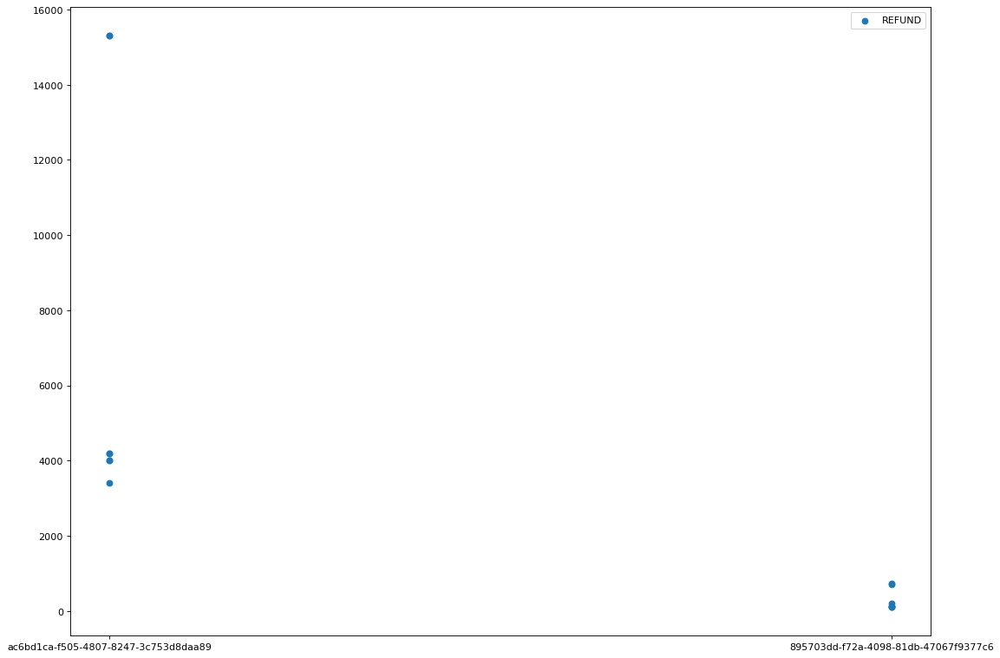

OTHER    14
Name: externalParty.transactionCategory, dtype: int64


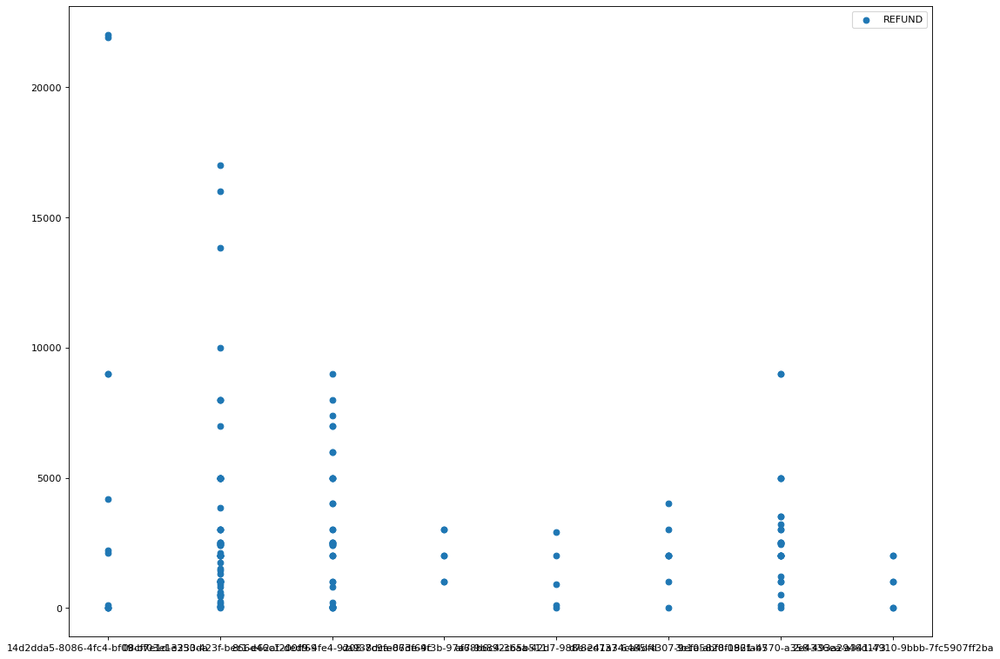

OTHER        151
TRAVEL         7
LIFESTYLE      4
SHOPPING       1
Name: externalParty.transactionCategory, dtype: int64


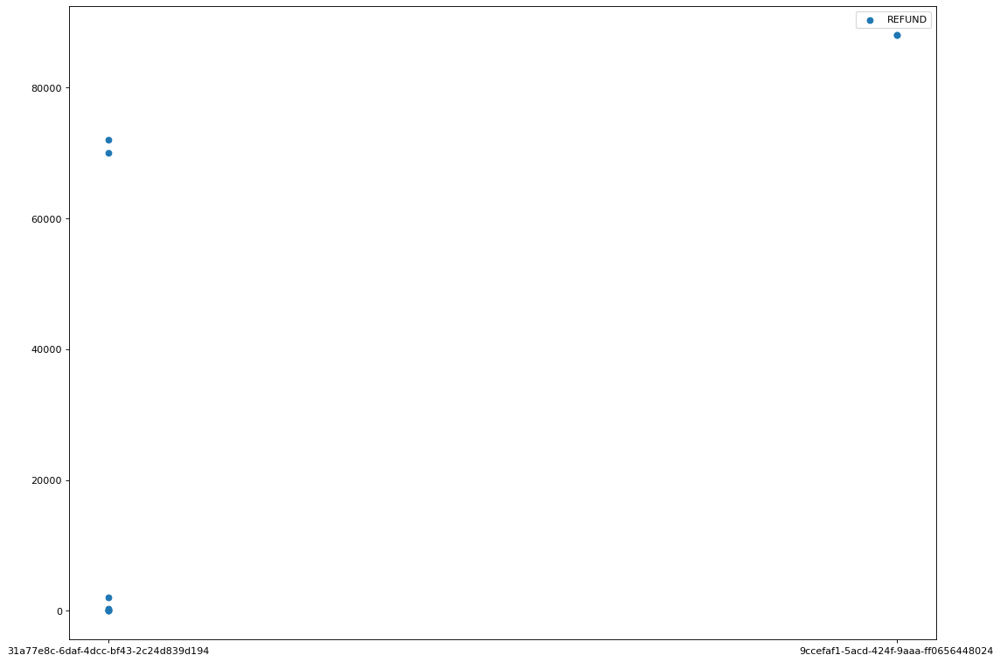

OTHER    10
Name: externalParty.transactionCategory, dtype: int64


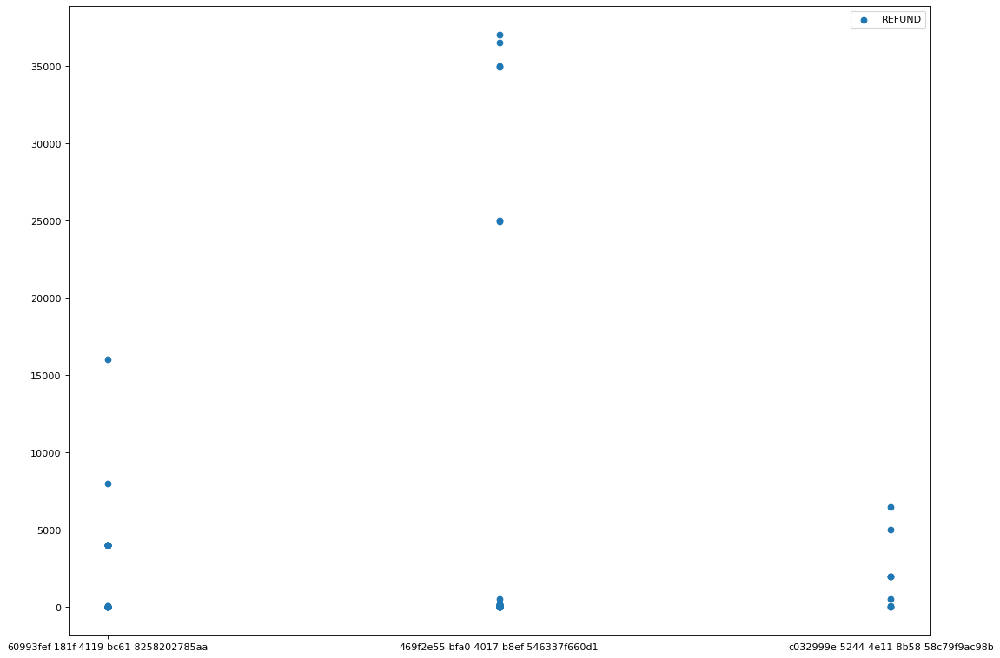

OTHER    60
Name: externalParty.transactionCategory, dtype: int64


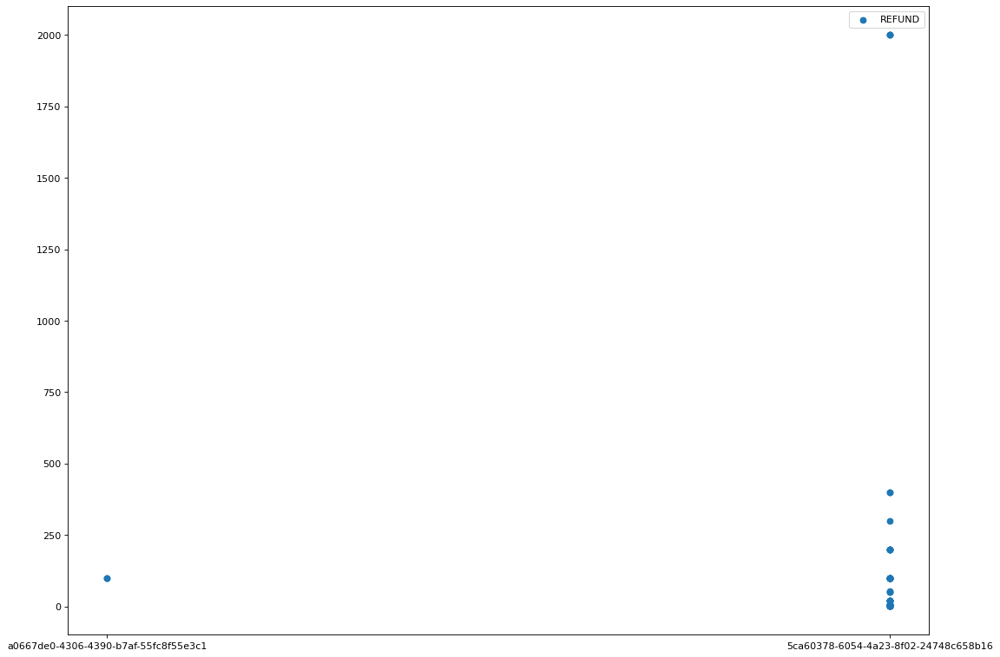

OTHER    67
Name: externalParty.transactionCategory, dtype: int64


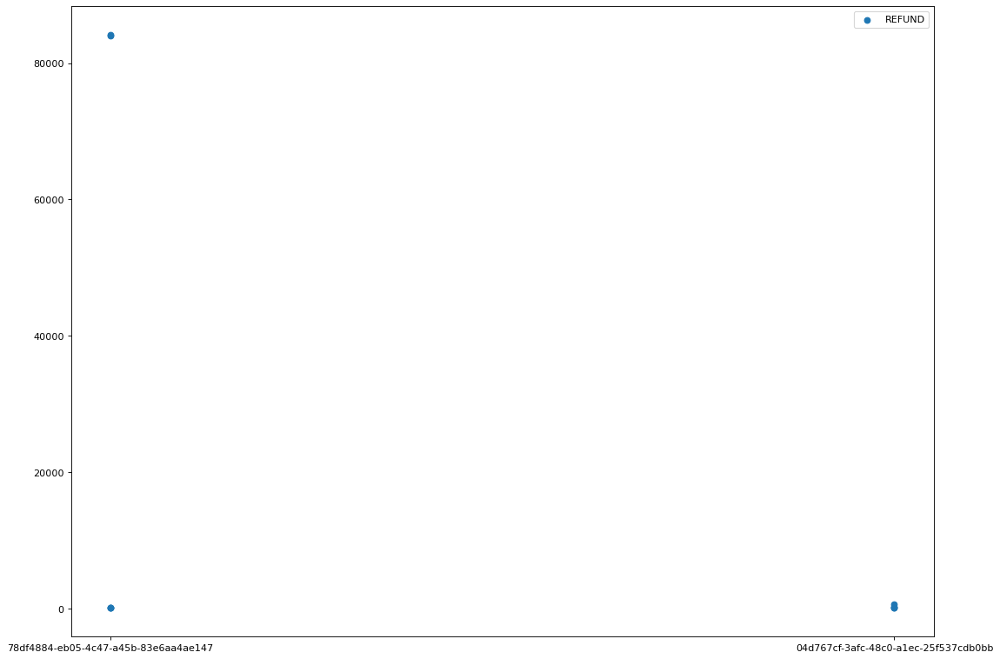

OTHER    9
Name: externalParty.transactionCategory, dtype: int64


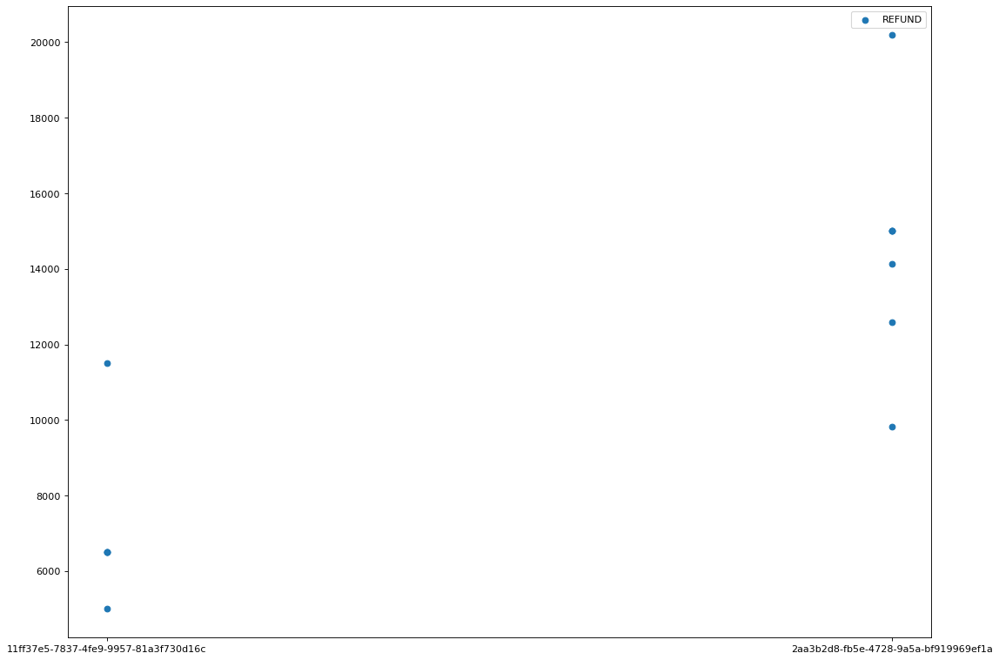

OTHER    12
Name: externalParty.transactionCategory, dtype: int64


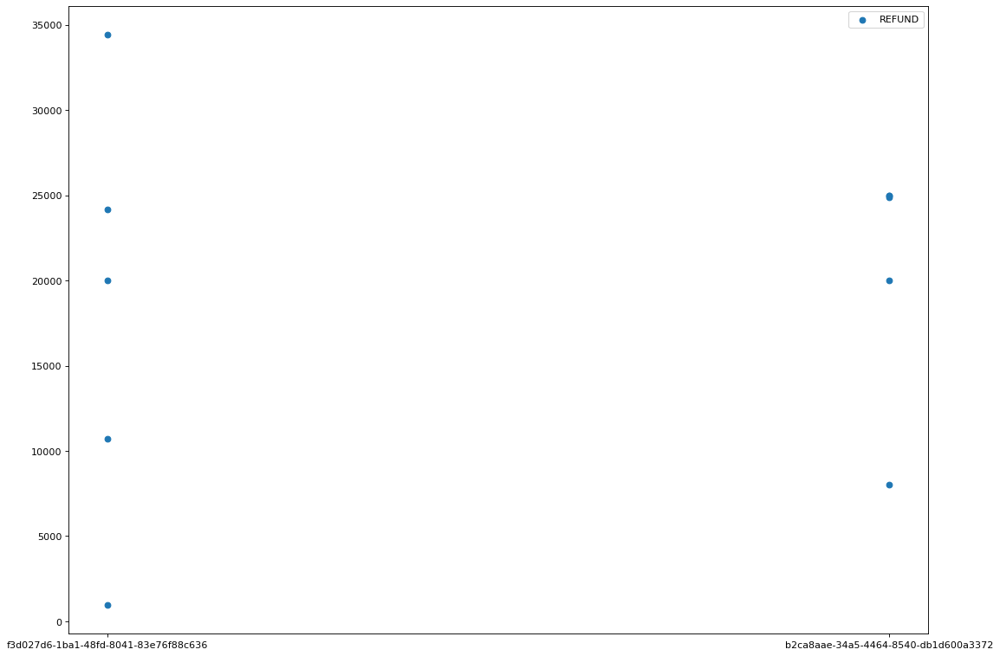

OTHER    10
Name: externalParty.transactionCategory, dtype: int64


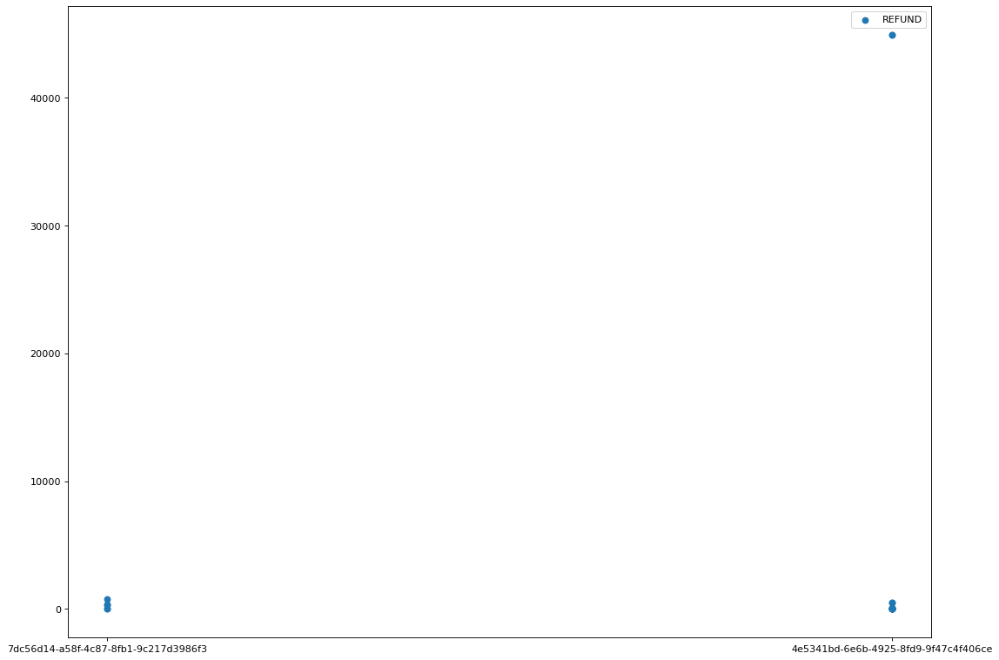

OTHER    20
Name: externalParty.transactionCategory, dtype: int64


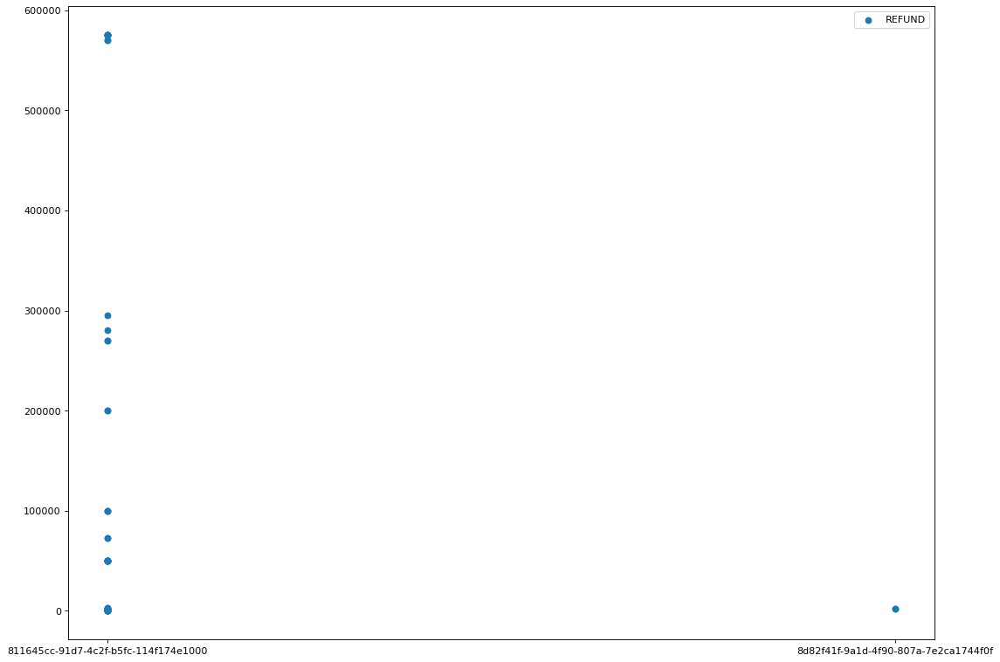

OTHER        55
SHOPPING      2
GROCERIES     2
Name: externalParty.transactionCategory, dtype: int64


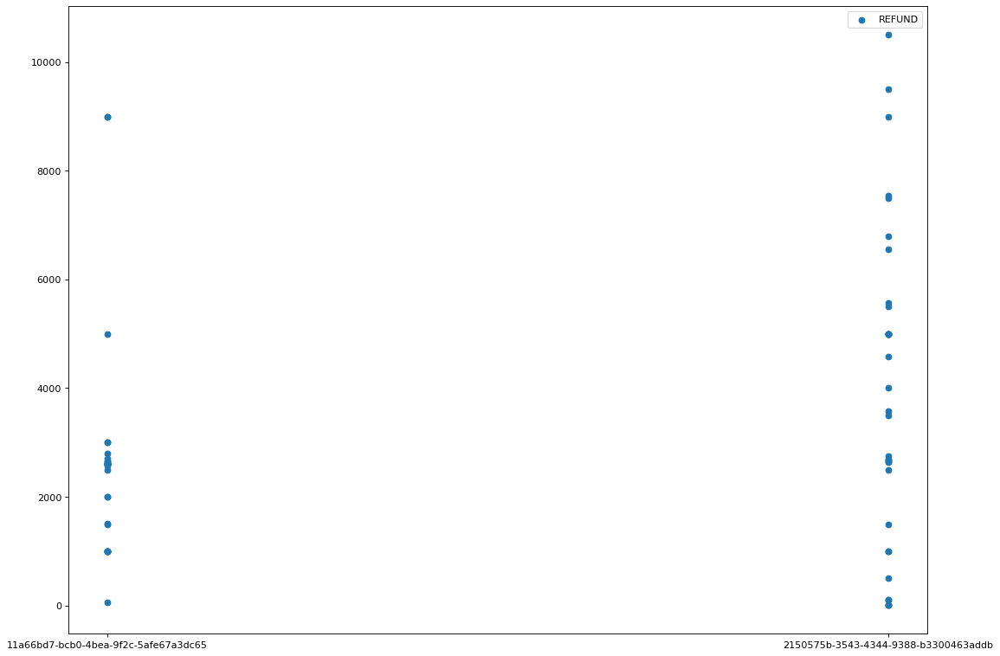

OTHER    67
Name: externalParty.transactionCategory, dtype: int64


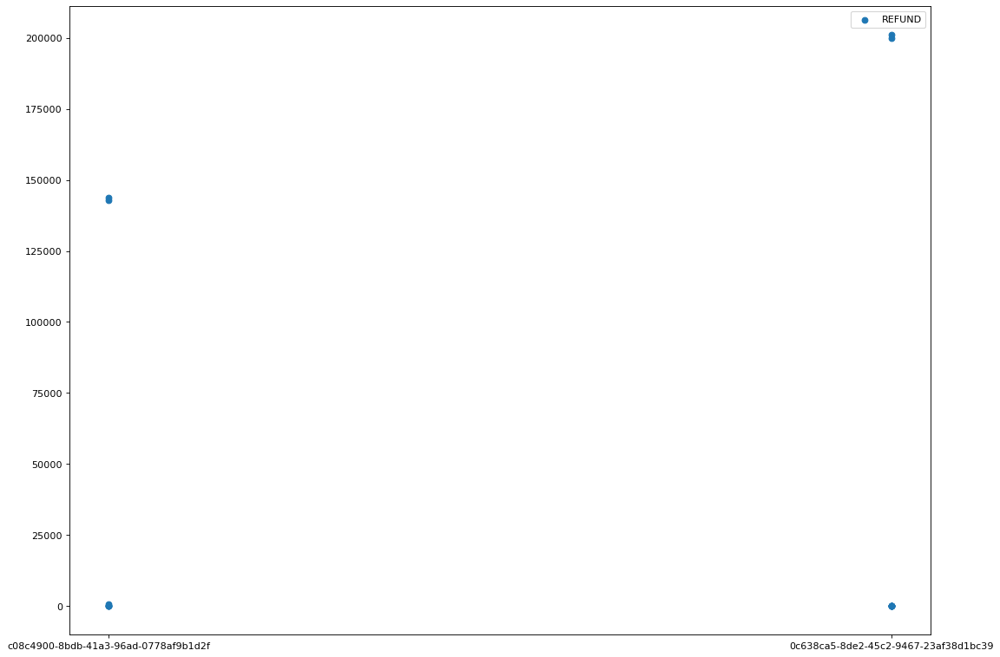

OTHER    16
Name: externalParty.transactionCategory, dtype: int64


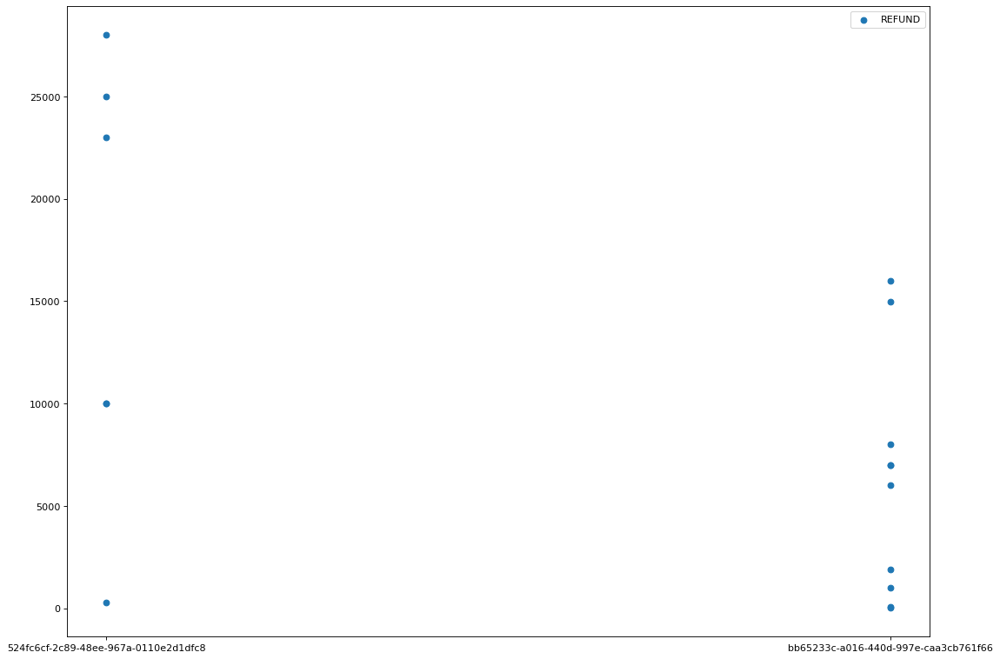

OTHER    16
Name: externalParty.transactionCategory, dtype: int64


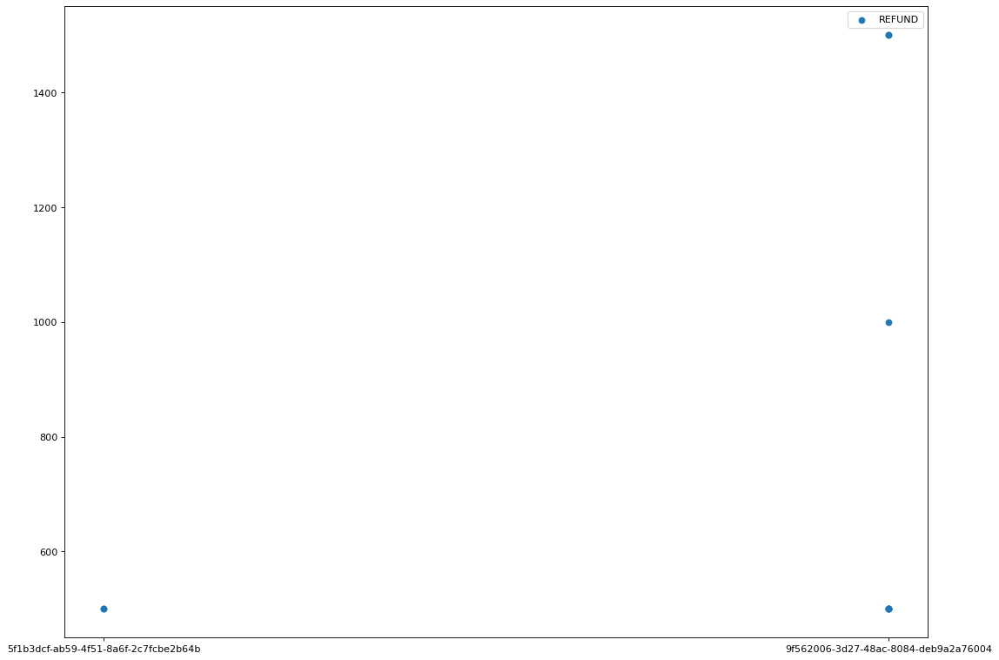

OTHER    10
Name: externalParty.transactionCategory, dtype: int64


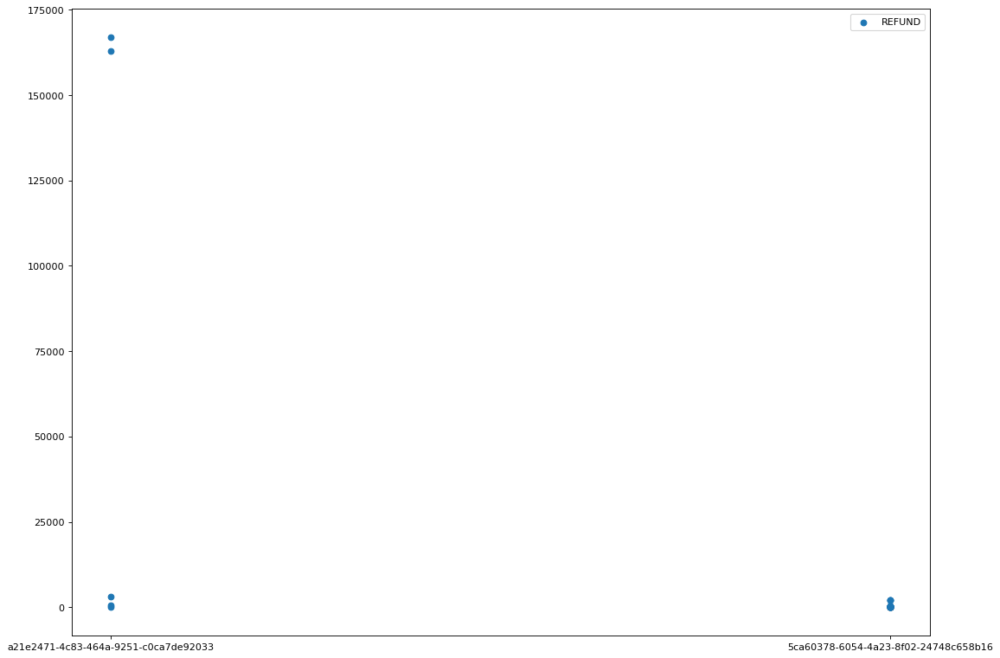

OTHER    70
Name: externalParty.transactionCategory, dtype: int64


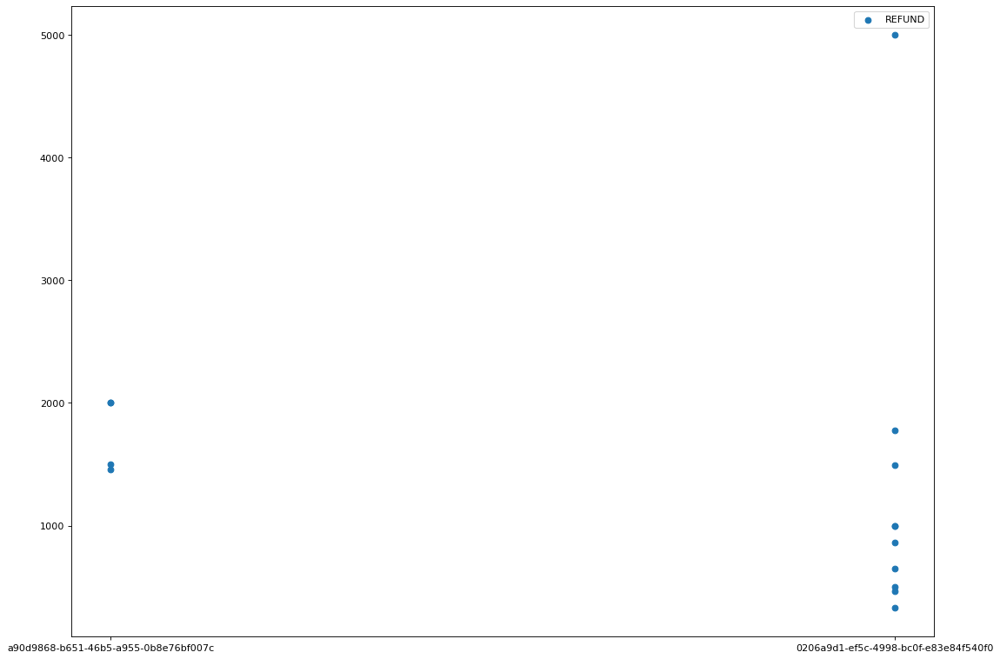

OTHER       11
SHOPPING     3
Name: externalParty.transactionCategory, dtype: int64


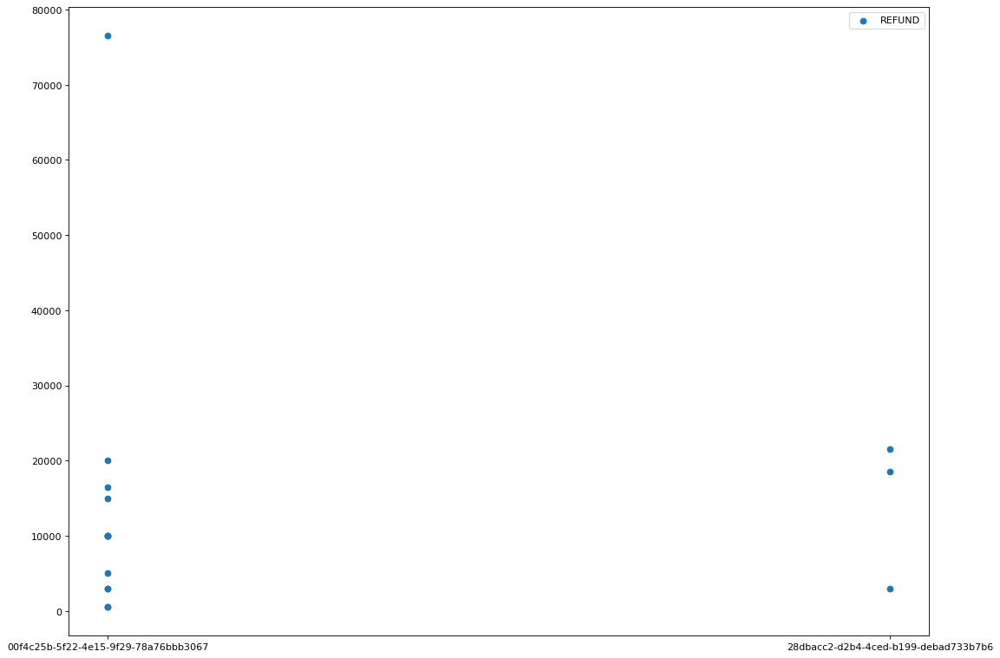

OTHER    16
Name: externalParty.transactionCategory, dtype: int64


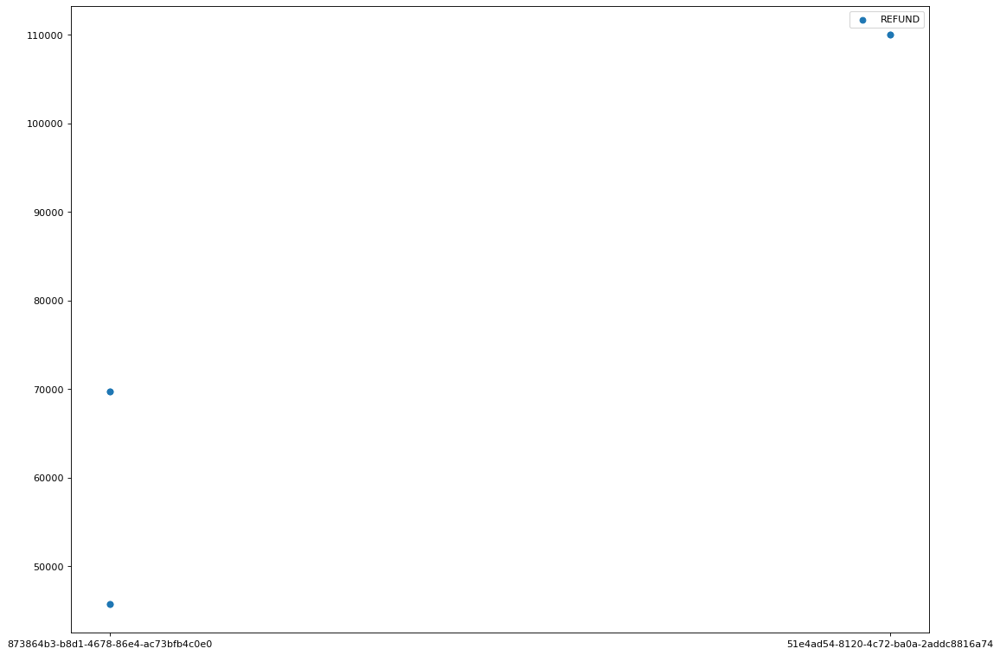

OTHER    6
Name: externalParty.transactionCategory, dtype: int64


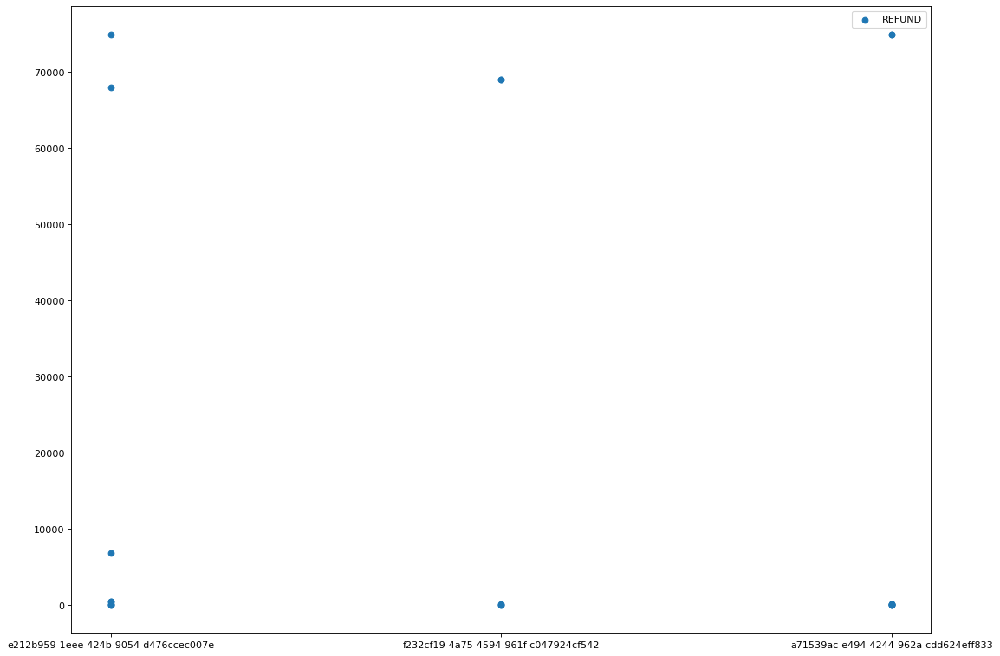

OTHER    21
Name: externalParty.transactionCategory, dtype: int64


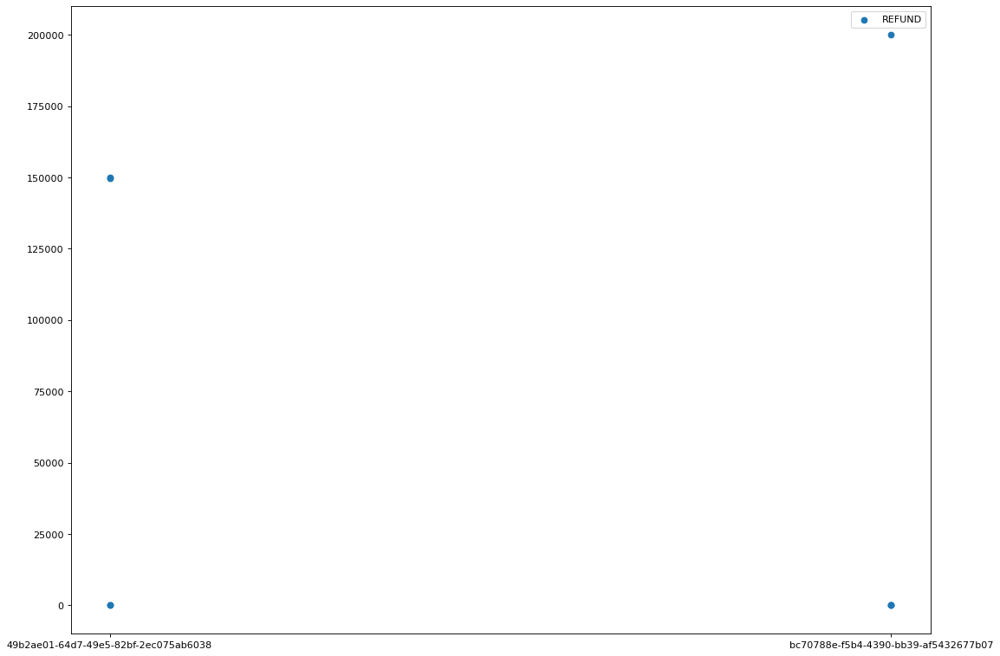

OTHER    8
Name: externalParty.transactionCategory, dtype: int64


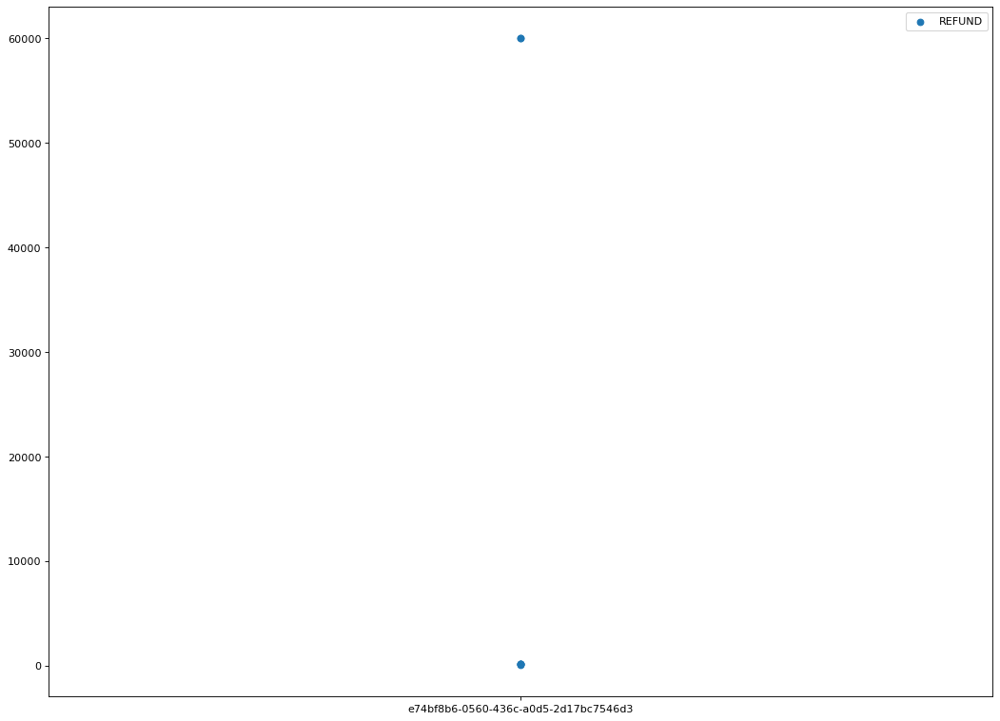

OTHER    7
Name: externalParty.transactionCategory, dtype: int64


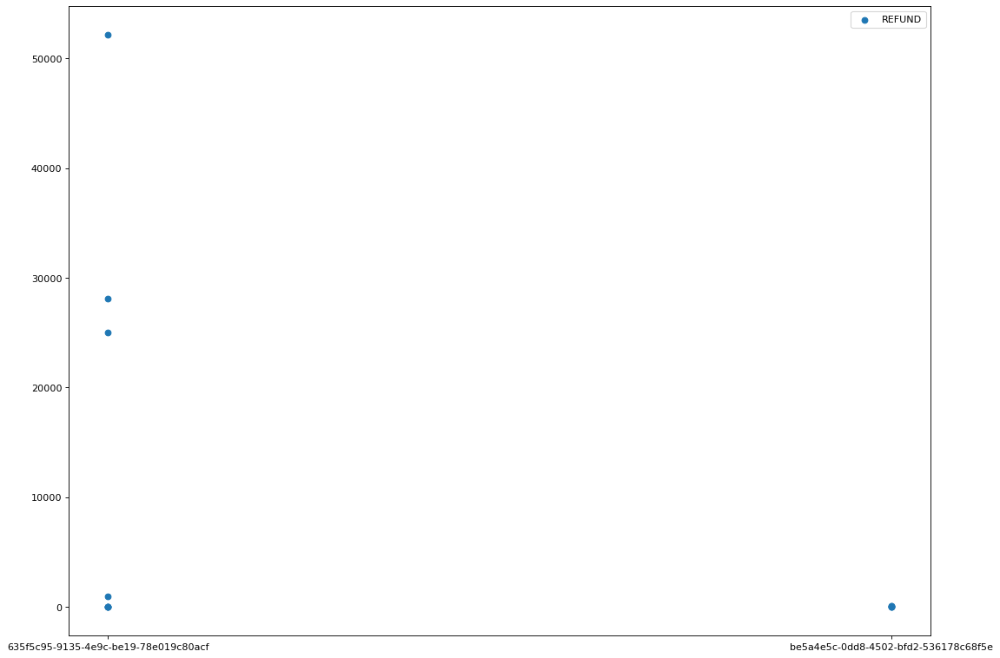

OTHER    13
Name: externalParty.transactionCategory, dtype: int64


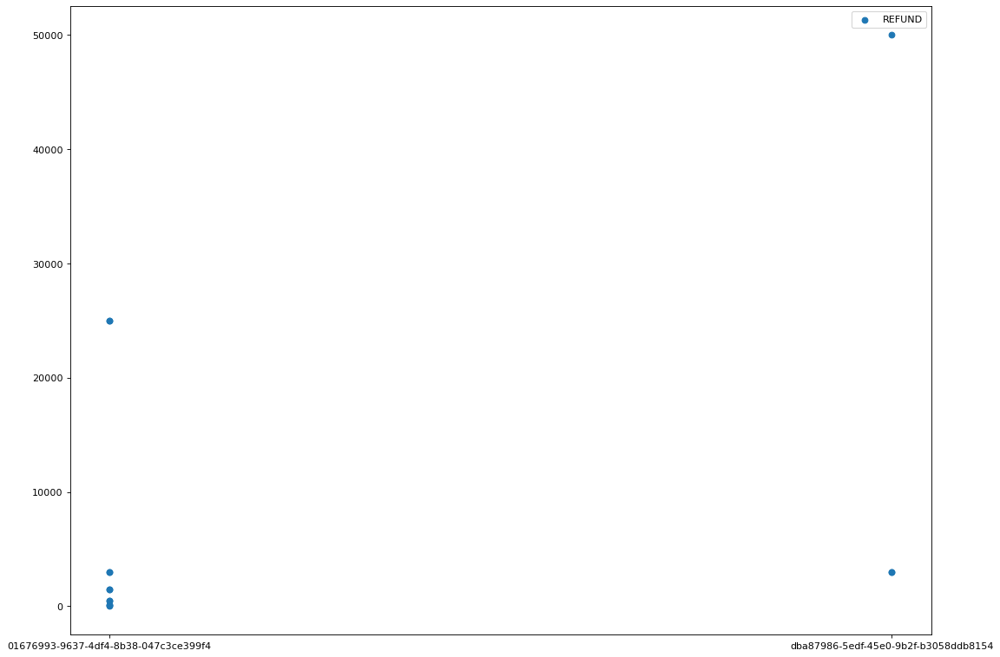

OTHER    14
Name: externalParty.transactionCategory, dtype: int64


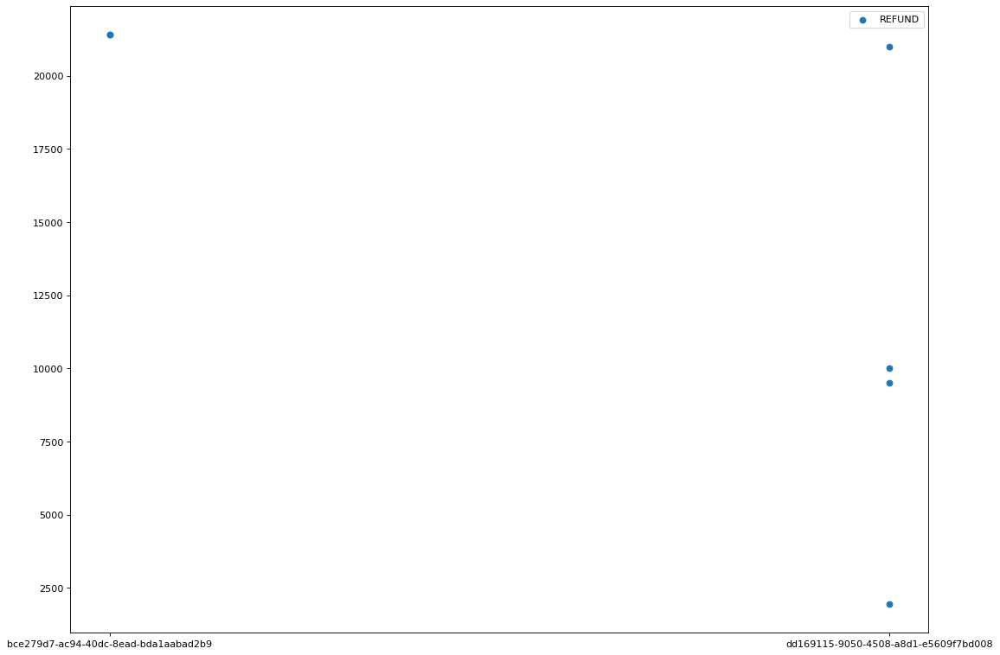

OTHER    6
Name: externalParty.transactionCategory, dtype: int64


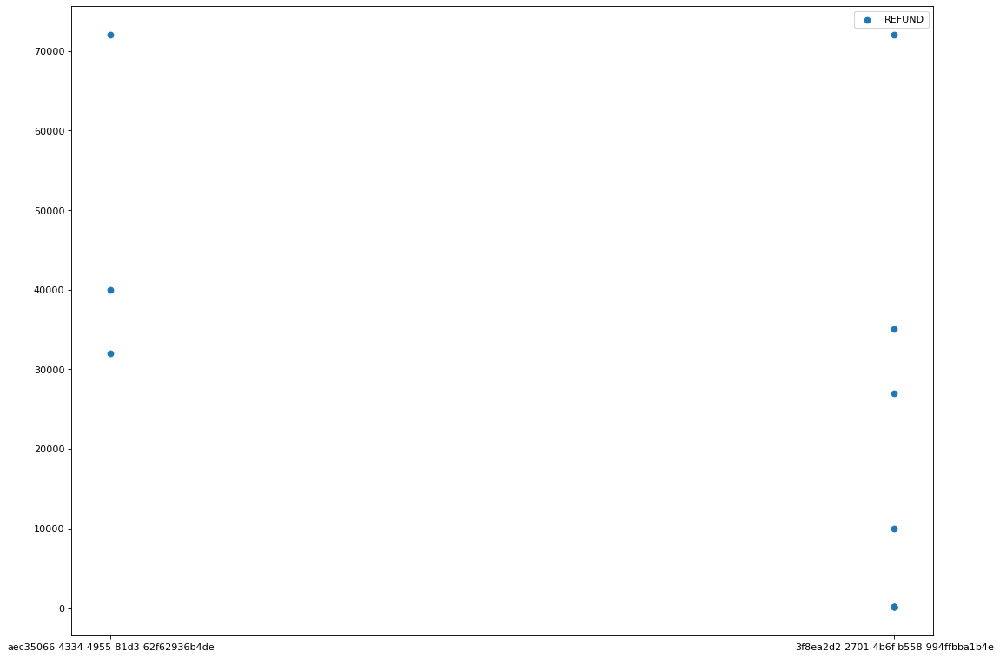

OTHER    11
Name: externalParty.transactionCategory, dtype: int64


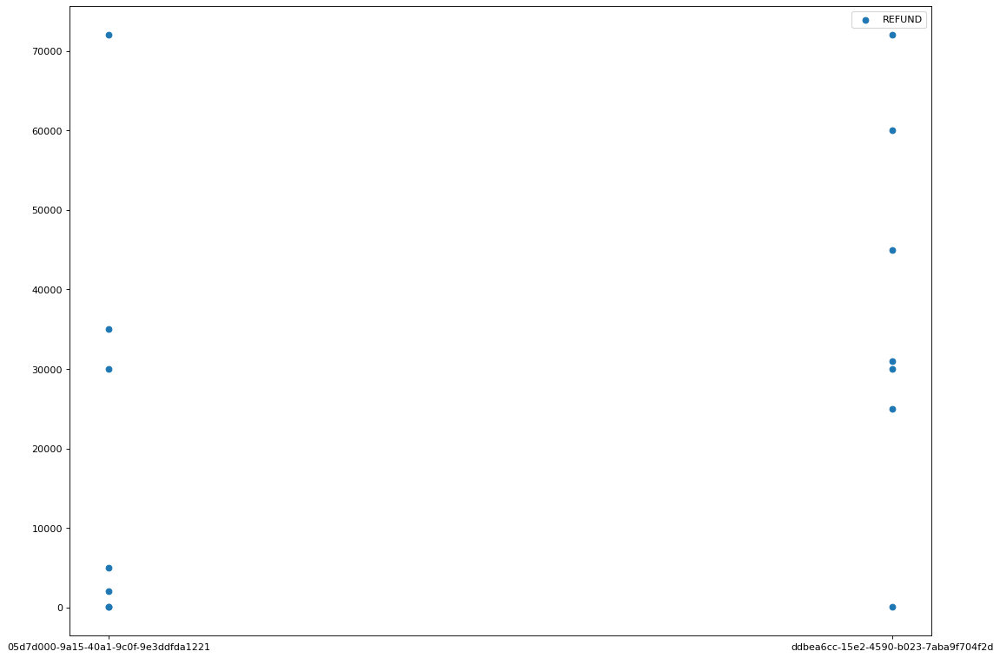

OTHER    14
Name: externalParty.transactionCategory, dtype: int64


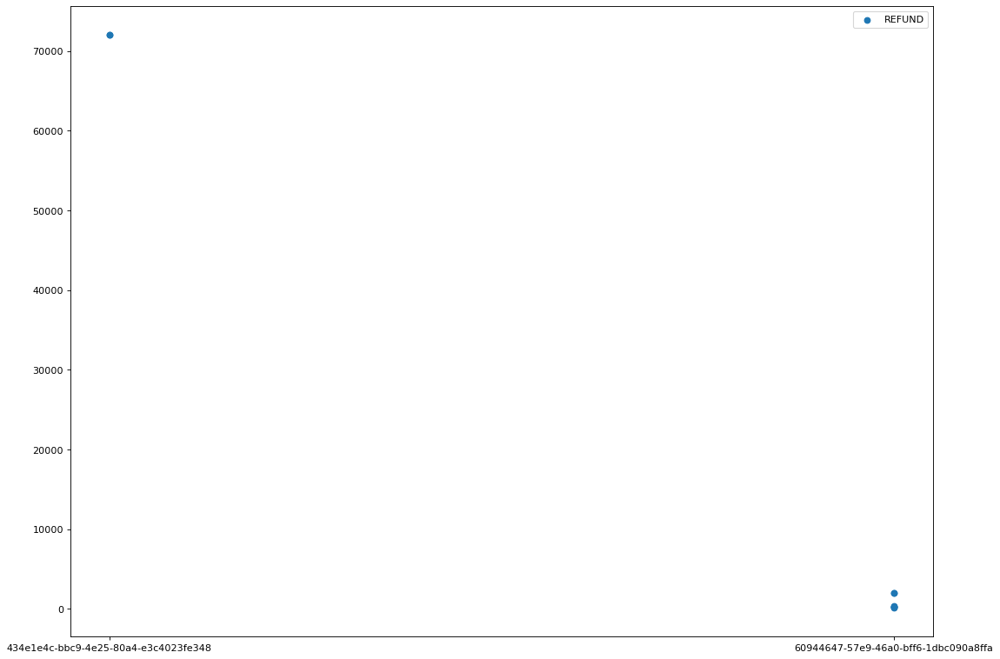

OTHER    9
Name: externalParty.transactionCategory, dtype: int64
{'140716_771946': {'dab8cbc2-ede8-4607-8897-5892de6da917', '77f6ac4a-2c24-4bc1-8de6-32bee70e8951'}, '45060470_230580': {'6110791c-f542-4a29-9d8a-fab3bd68e2b5', '0241cfdb-807f-4253-a737-4a86c8b8aa83', 'f7c50694-b1ac-49ed-b924-9267eb66a25d'}, '30445450_236972': {'b02dbaa8-8de9-4772-aa41-149af477f357', '1bdf6eb4-02ce-4635-894c-d37339a3ed49'}, '14105_40722': {'dab8cbc2-ede8-4607-8897-5892de6da917', '77f6ac4a-2c24-4bc1-8de6-32bee70e8951'}, '33766485_40374': {'daf82102-f0de-429d-9eec-9b0dc1748719', 'cff54697-84e6-4ab5-9f5c-cc5a24e88a40', '150db3fb-8094-4144-830b-b9be9de8e04b', 'be6ebd97-9ffe-4cc7-bfbf-eaaf04c774d1', 'b2afdf53-9dac-4cb8-8923-98d93dc06ce4', '82f08c30-6e08-4f97-a8e3-7612abfa6bb2', 'c5a7b6c0-8afc-41cf-94d0-06832d629d94', 'f10b5f67-df4c-4bf6-a30a-1a6c89eb9ba2', '2cbf5083-de49-4a19-b1fe-2b0154331f8e', '2589363c-d116-42e3-b15b-70522809f41f', '81f6794a-e064-402d-9f79-20bbda72e510', '18324fbe-99c8-4d2d-b1a1-ee8a01277f78

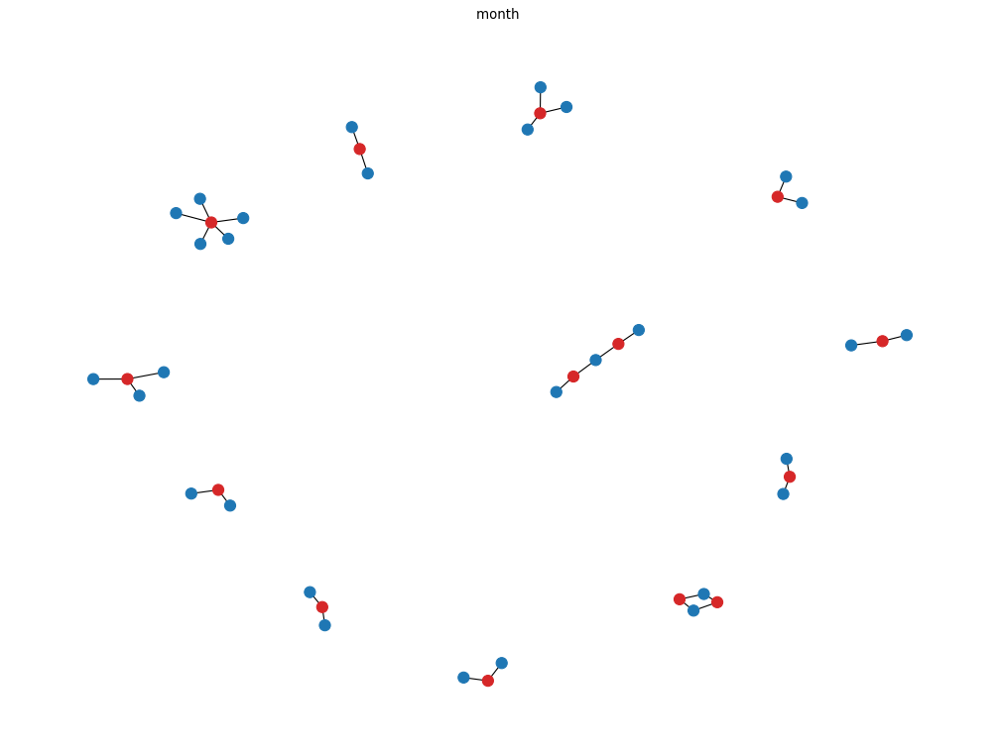

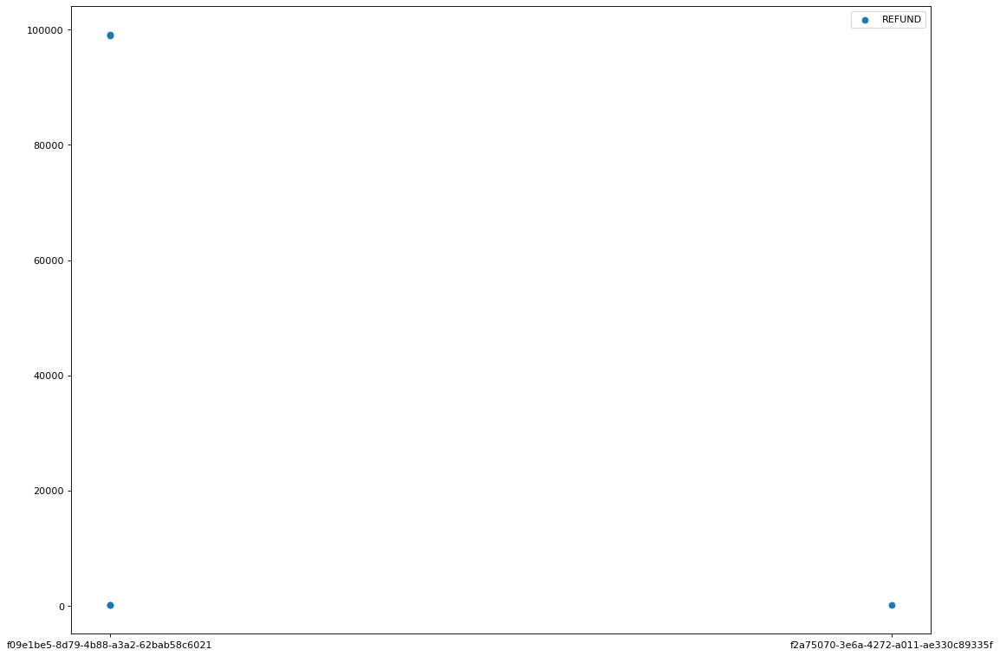

OTHER    5
Name: externalParty.transactionCategory, dtype: int64


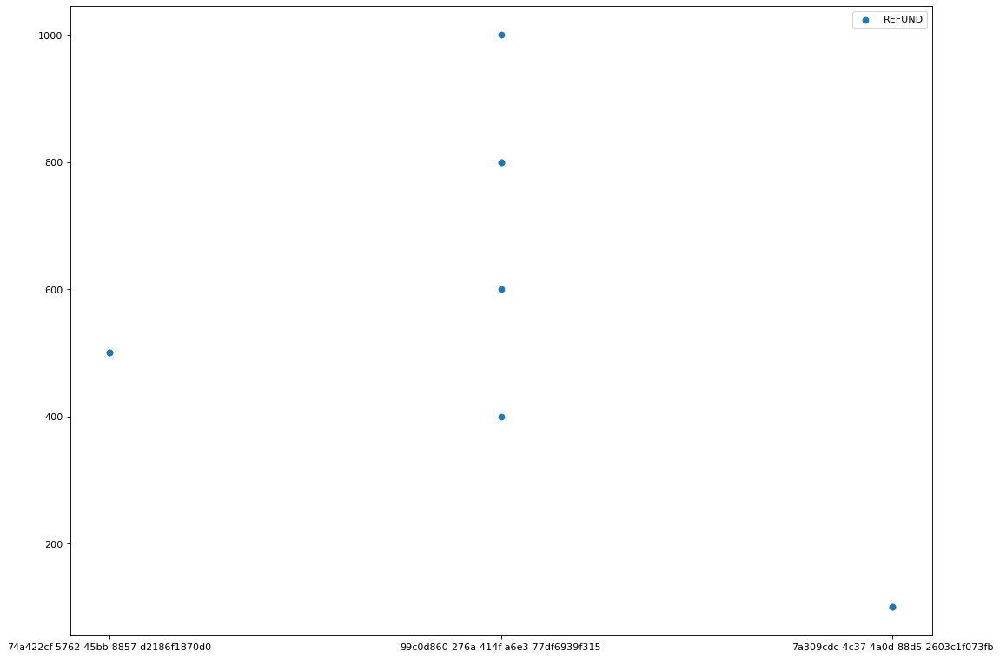

OTHER    9
Name: externalParty.transactionCategory, dtype: int64


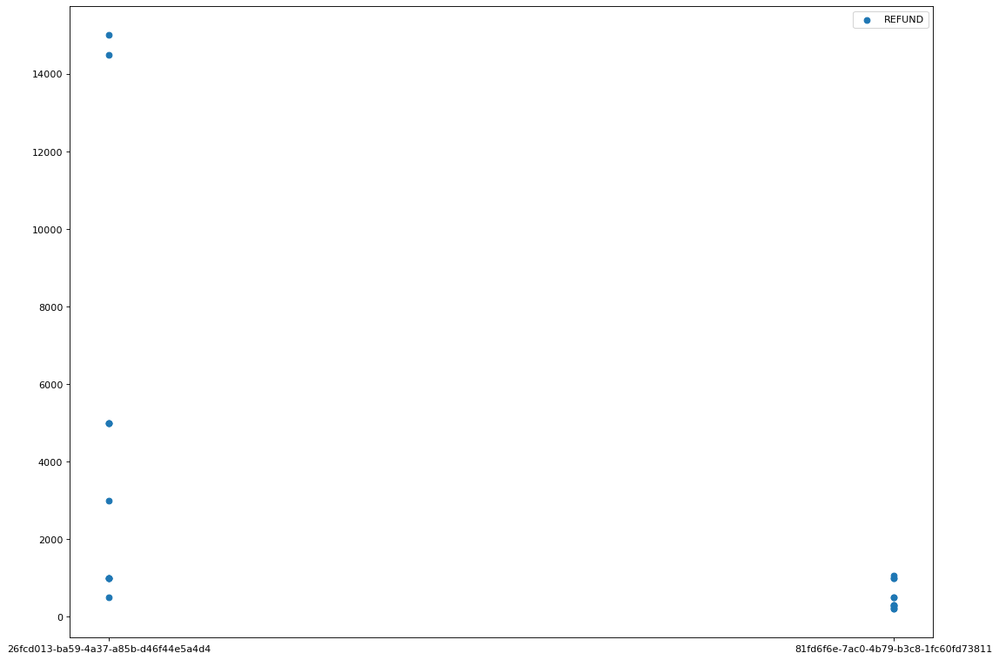

OTHER    22
Name: externalParty.transactionCategory, dtype: int64


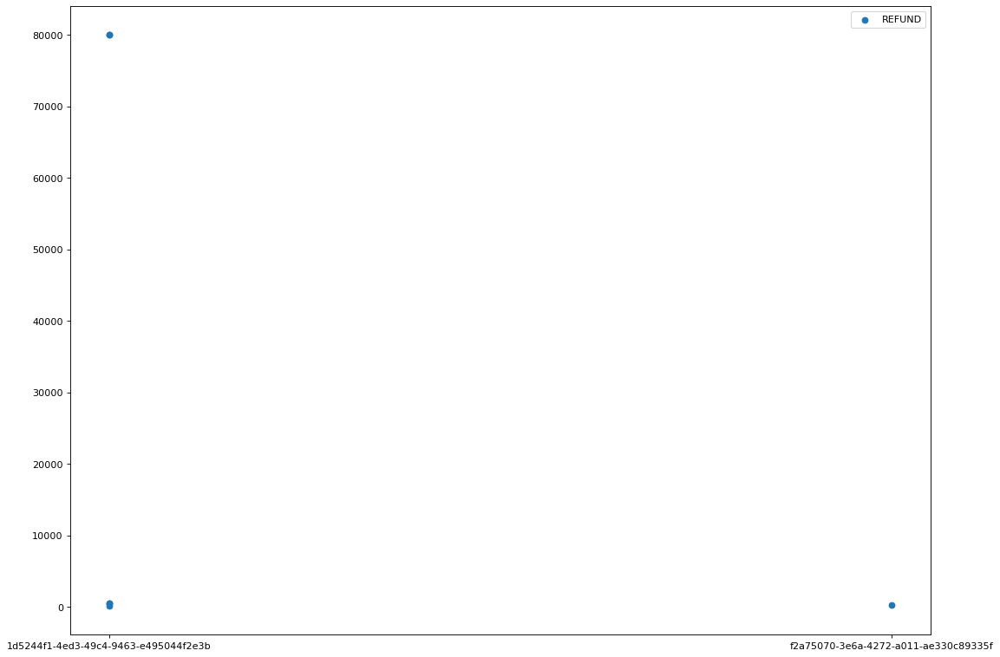

OTHER    6
Name: externalParty.transactionCategory, dtype: int64


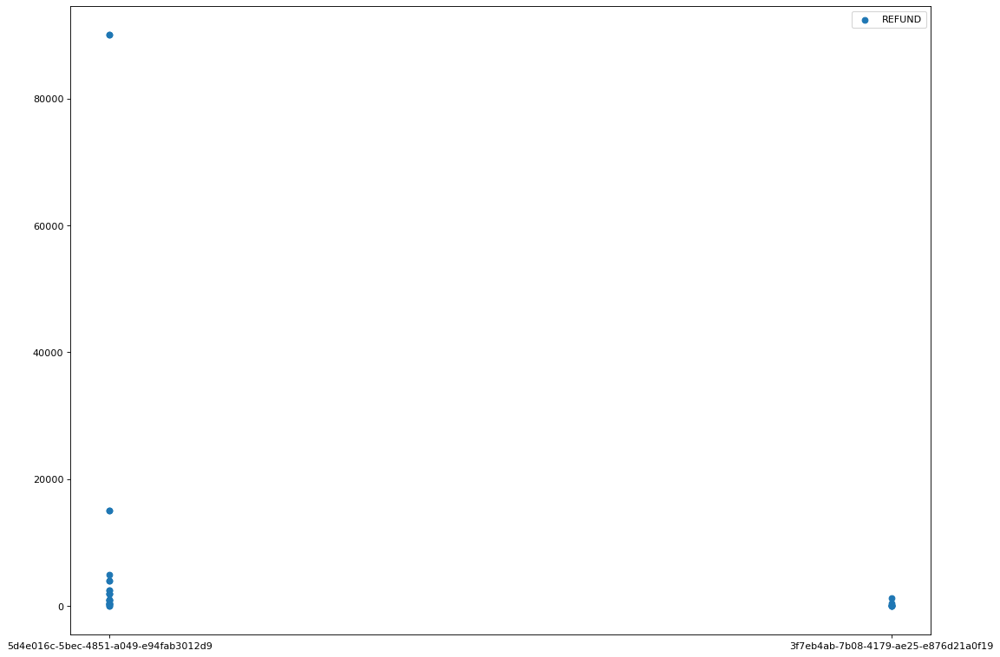

OTHER        22
GROCERIES     6
LIFESTYLE     2
SHOPPING      1
Name: externalParty.transactionCategory, dtype: int64


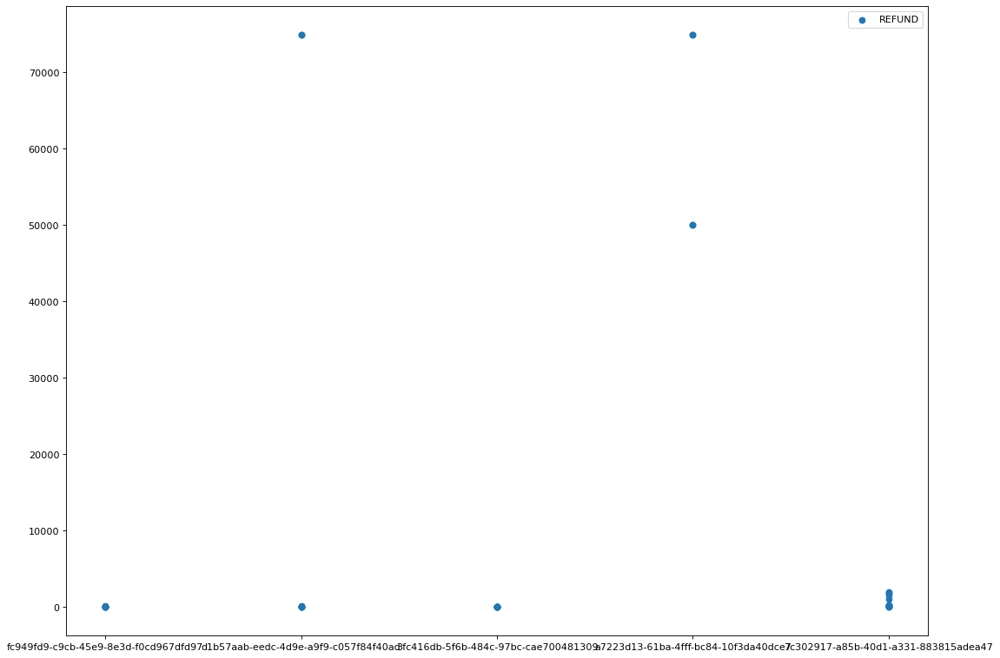

OTHER        34
TRAVEL        2
LIFESTYLE     2
GROCERIES     1
Name: externalParty.transactionCategory, dtype: int64


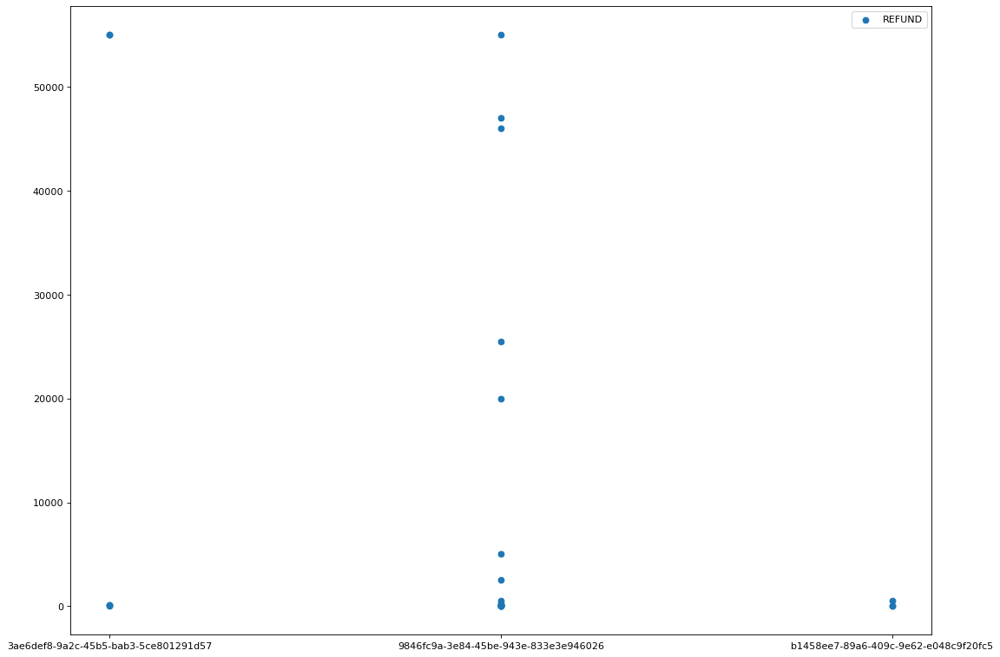

OTHER        24
GROCERIES     1
Name: externalParty.transactionCategory, dtype: int64


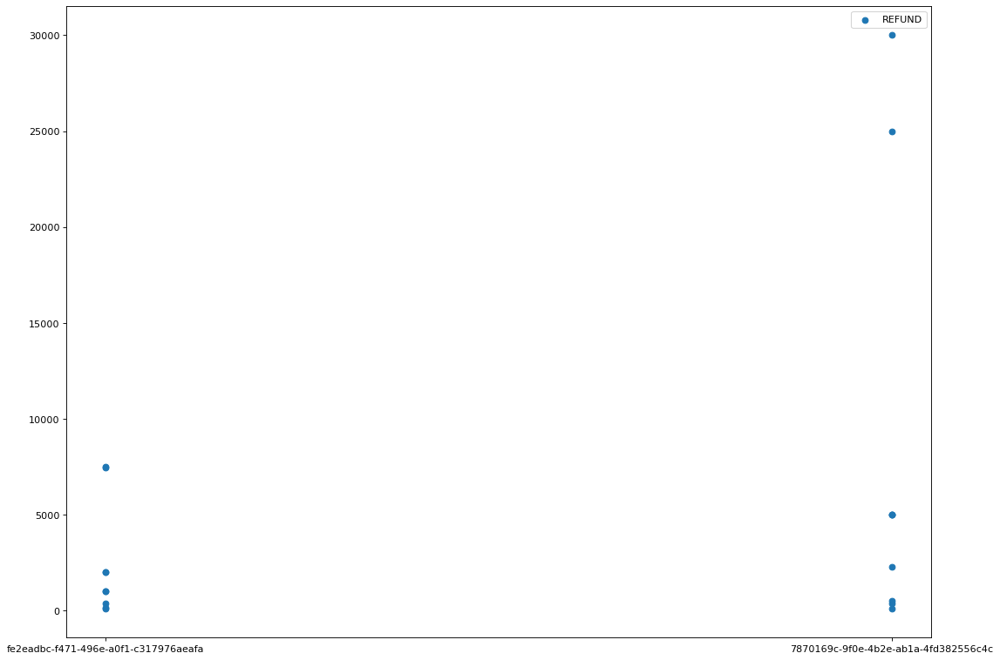

OTHER        16
GROCERIES     2
Name: externalParty.transactionCategory, dtype: int64


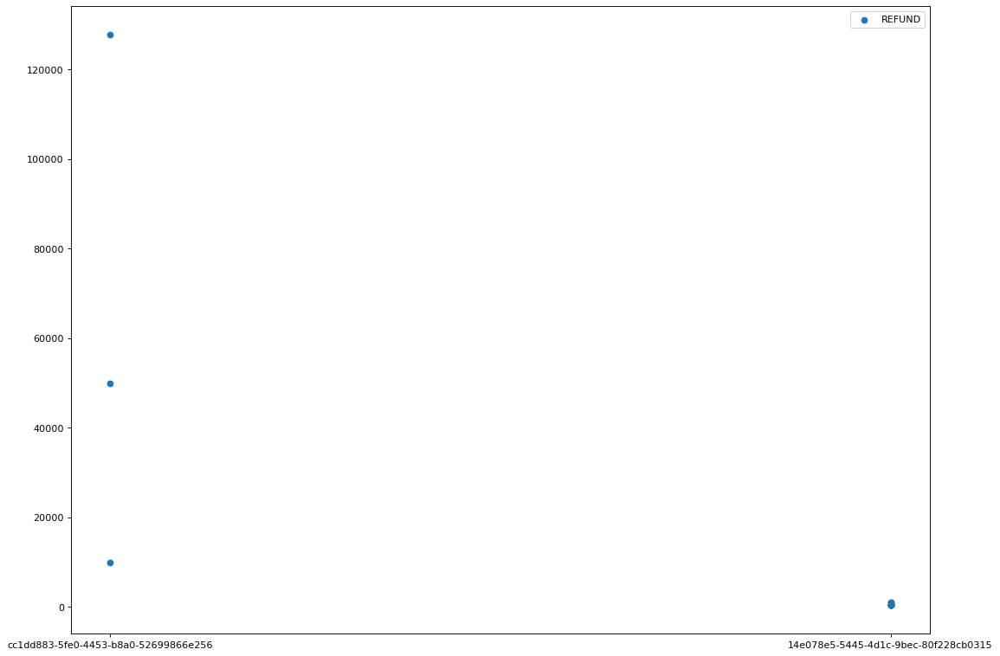

OTHER    11
Name: externalParty.transactionCategory, dtype: int64


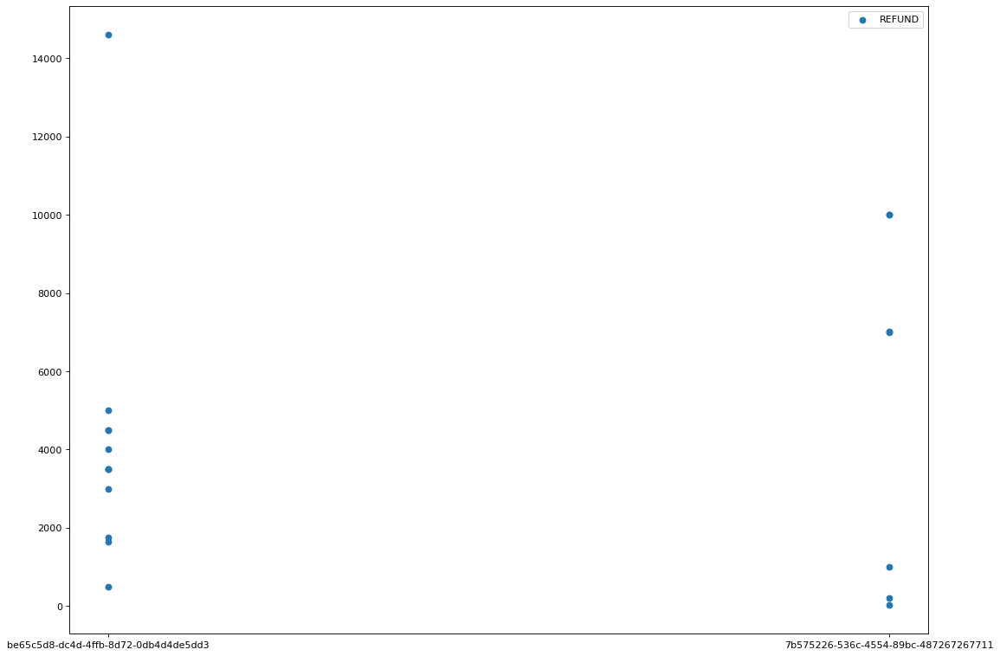

OTHER        16
LIFESTYLE     3
Name: externalParty.transactionCategory, dtype: int64


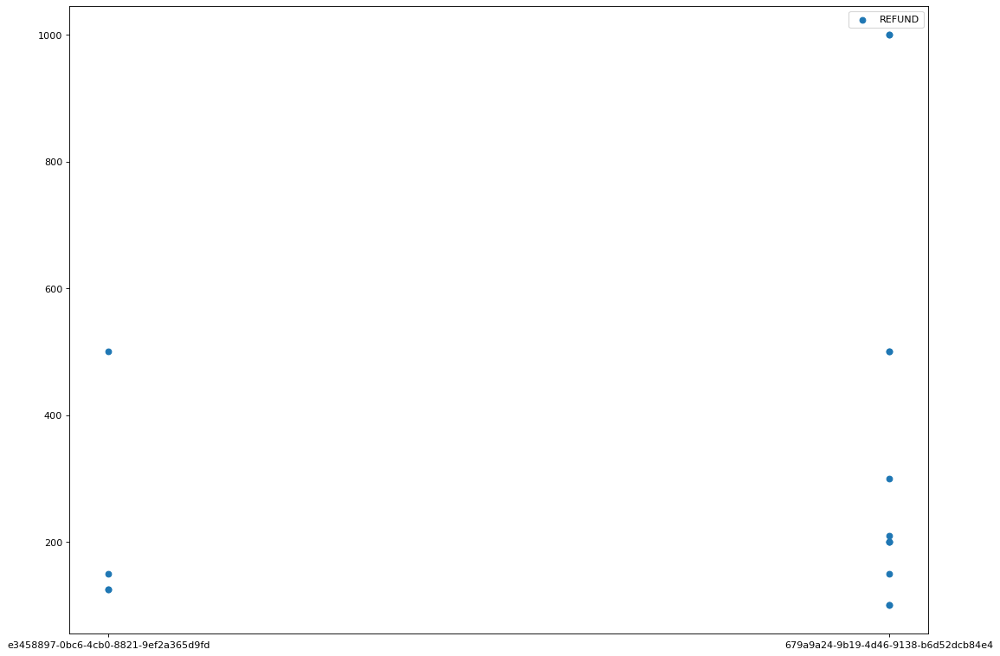

OTHER    16
Name: externalParty.transactionCategory, dtype: int64


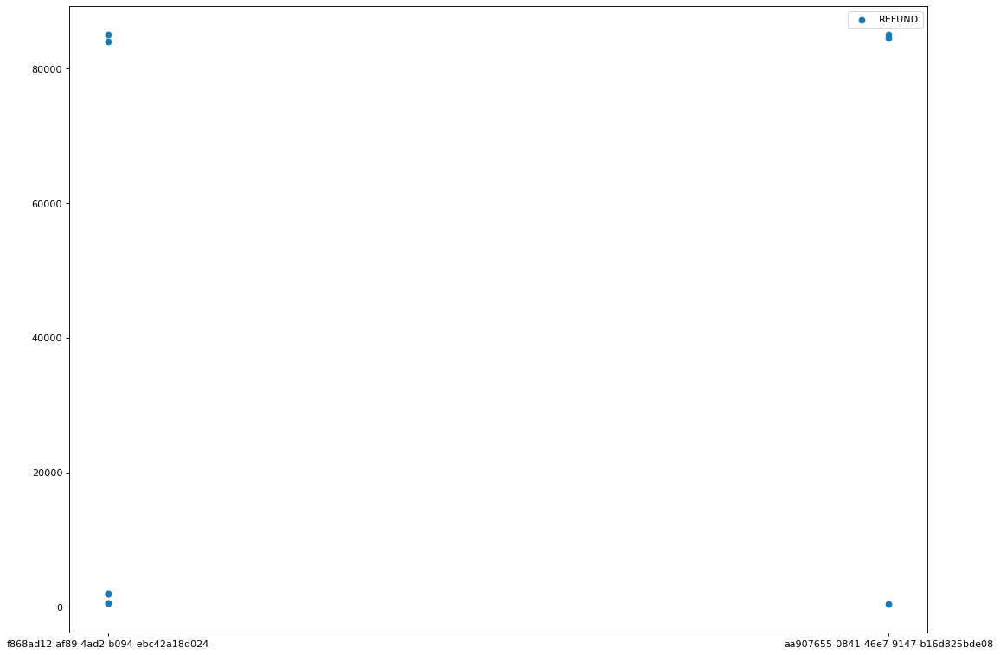

OTHER    9
Name: externalParty.transactionCategory, dtype: int64


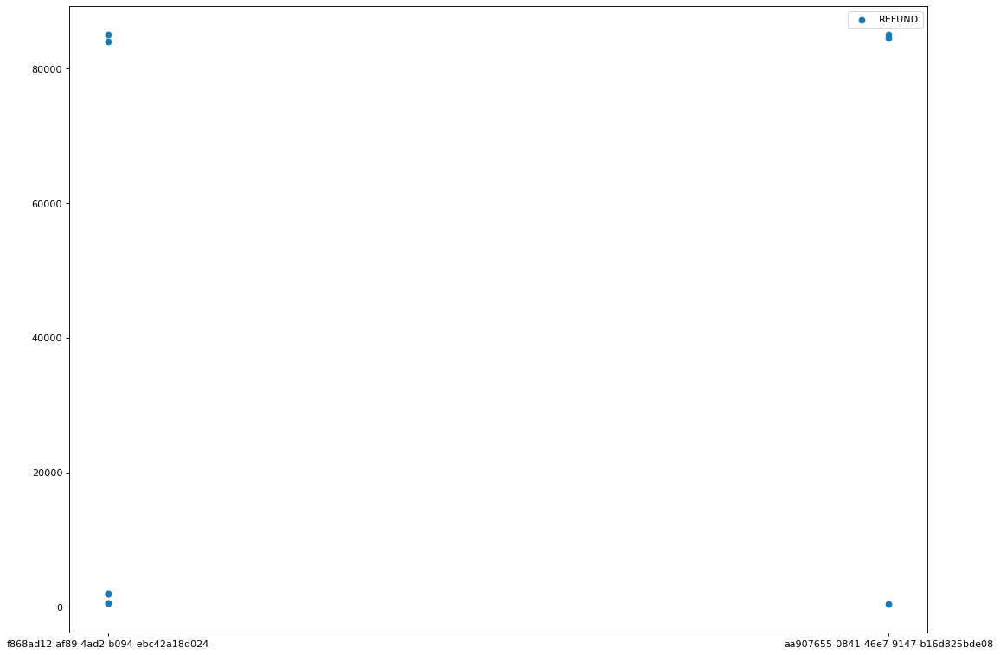

OTHER    9
Name: externalParty.transactionCategory, dtype: int64


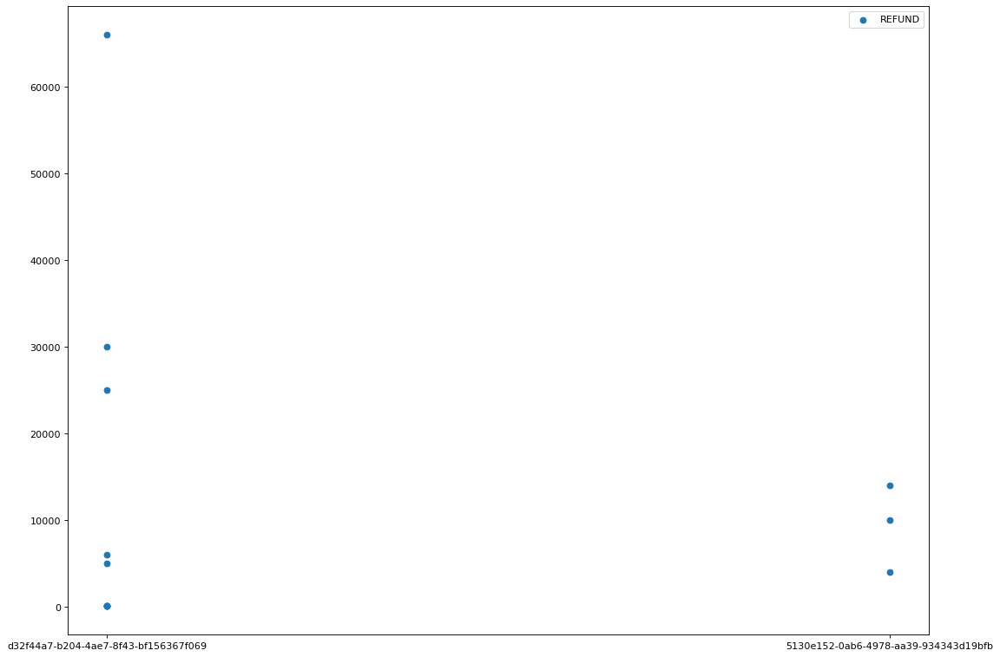

OTHER    12
Name: externalParty.transactionCategory, dtype: int64
{'87415097_608371': {'f09e1be5-8d79-4b88-a3a2-62bab58c6021', 'f2a75070-3e6a-4272-a011-ae330c89335f'}, '30_40677': {'74a422cf-5762-45bb-8857-d2186f1870d0', '99c0d860-276a-414f-a6e3-77df6939f315', '7a309cdc-4c37-4a0d-88d5-2603c1f073fb'}, '2396_40541': {'26fcd013-ba59-4a37-a85b-d46f44e5a4d4', '81fd6f6e-7ac0-4b79-b3c8-1fc60fd73811'}, '13197264_237524': {'1d5244f1-4ed3-49c4-9463-e495044f2e3b', 'f2a75070-3e6a-4272-a011-ae330c89335f'}, '24540655_230580': {'5d4e016c-5bec-4851-a049-e94fab3012d9', '3f7eb4ab-7b08-4179-ae25-e876d21a0f19'}, '43706454_230580': {'fc949fd9-c9cb-45e9-8e3d-f0cd967dfd97', 'd1b57aab-eedc-4d9e-a9f9-c057f84f40ad', '3fc416db-5f6b-484c-97bc-cae700481309', 'a7223d13-61ba-4fff-bc84-10f3da40dce7', '7c302917-a85b-40d1-a331-883815adea47'}, '43418075_608371': {'3ae6def8-9a2c-45b5-bab3-5ce801291d57', '9846fc9a-3e84-45be-943e-833e3e946026', 'b1458ee7-89a6-409c-9e62-e048c9f20fc5'}, '452_40300': {'fe2eadbc-f471-496e-a0f1

In [311]:

for month in df_p:
    M = nx.from_pandas_edgelist(month, 'Sender customerId', 'acccount_full', create_using=nx.DiGraph())
    M2 = nx.Graph()
    d = dict(M.in_degree())
    received_trans = [x for x in d if d[x] >= 2]

    comunity_list = {}
    node_color = []
    for acc in received_trans:
        payees = nx.ancestors(M, acc)
        comunity_list[acc] = payees
        M2.add_node(acc)
        node_color.append('tab:red')
        num = M2.number_of_nodes()
        M2.add_nodes_from(payees)
        num = M2.number_of_nodes() - num
        node_color.extend(['tab:blue']*num)
        M2.add_edges_from(map(lambda e: (e, acc), payees))
    if received_trans:
        figure(figsize=(16, 12), dpi=80)
        plt.title('month ')
        nx.draw(M2, node_size=100, node_color=node_color)
    for nodes in comunity_list:
        df = pd.DataFrame()
        for node in comunity_list[nodes]:
            df = df.append(df_trans[df_trans['customerId'] == node])
        figure(figsize=(16, 5), dpi=80)
        plt.scatter(df['customerId'], df['amount.value'], label=trans_ty)
        plt.legend(loc='best')
        #plt.title('Clustering Coefficient')
        #plt.ticklabel_format(style='plain')
        #plt.xticks(rotation=90)
        plt.show() 
        print(df['externalParty.transactionCategory'].value_counts())
    print(comunity_list)
    
       

101
101
244
244
1261
1261
4646
4646
8188
8188
8882
8882


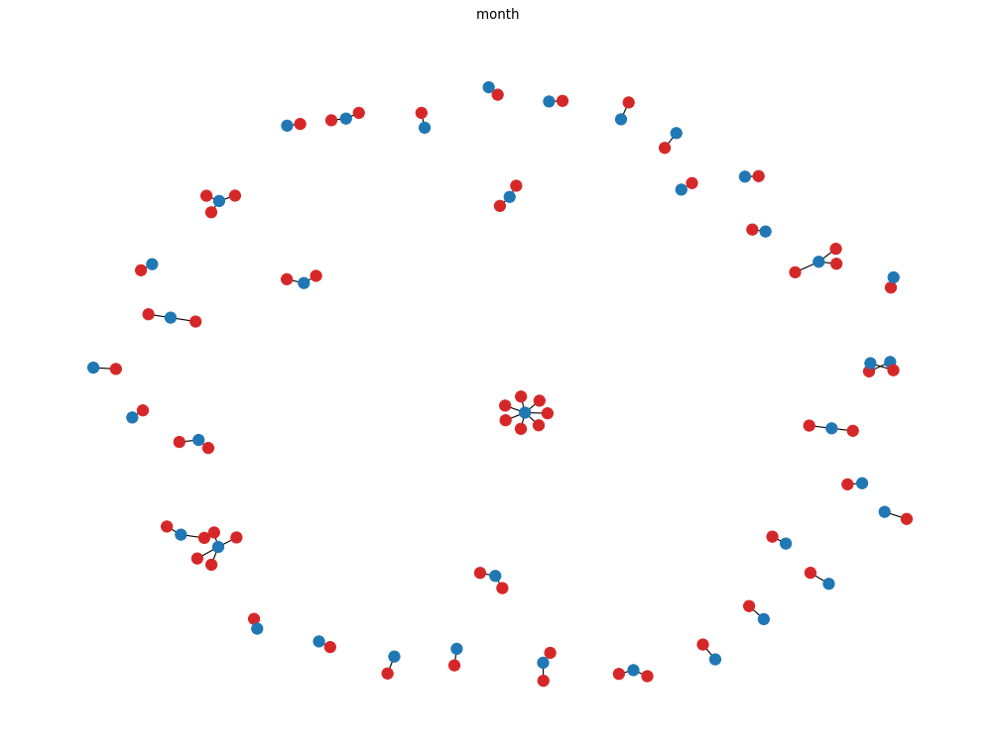

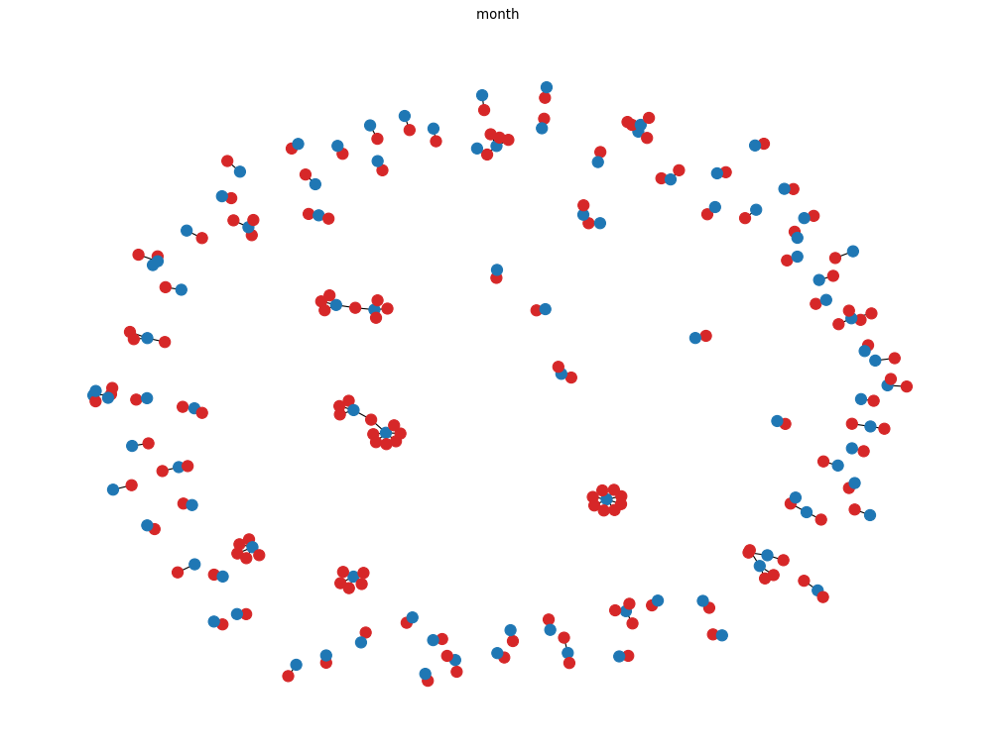

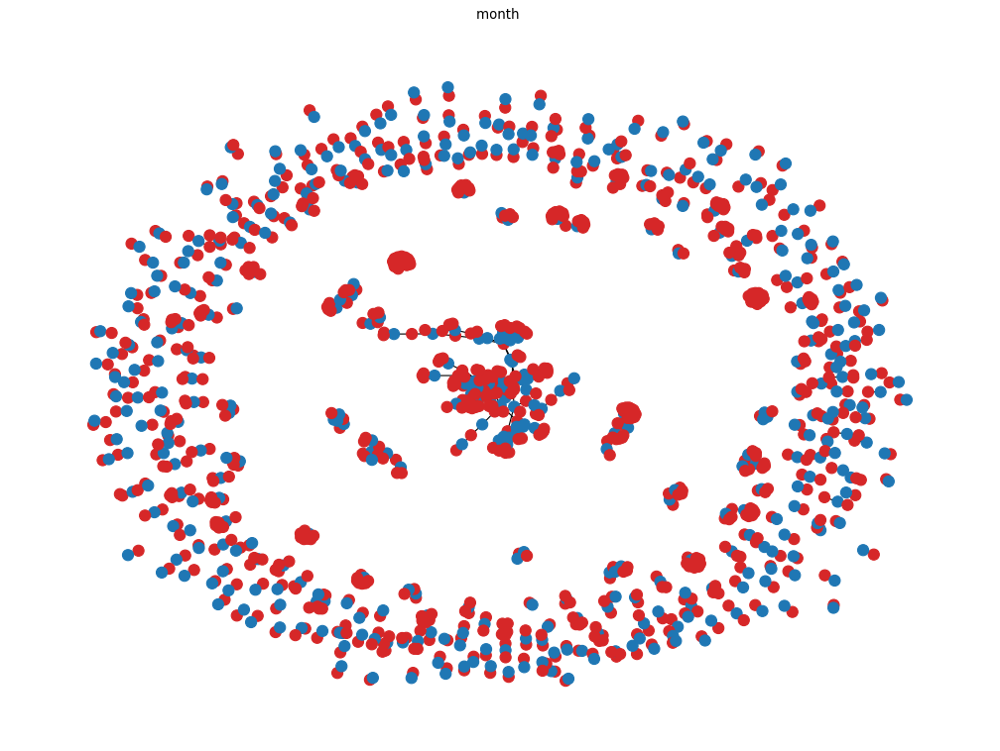

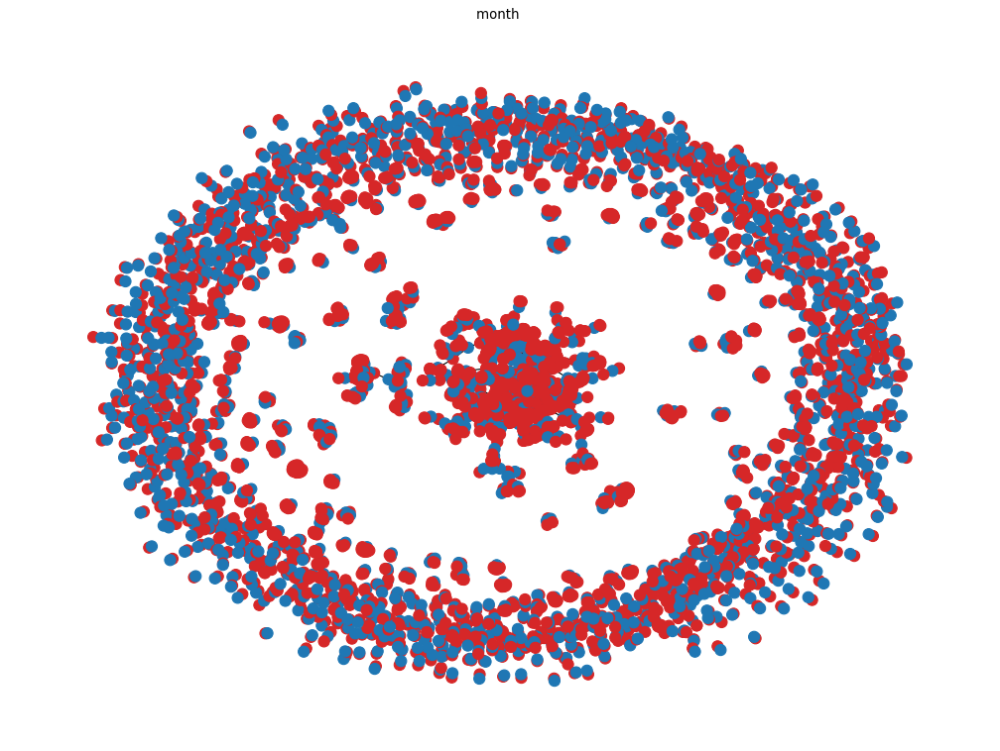

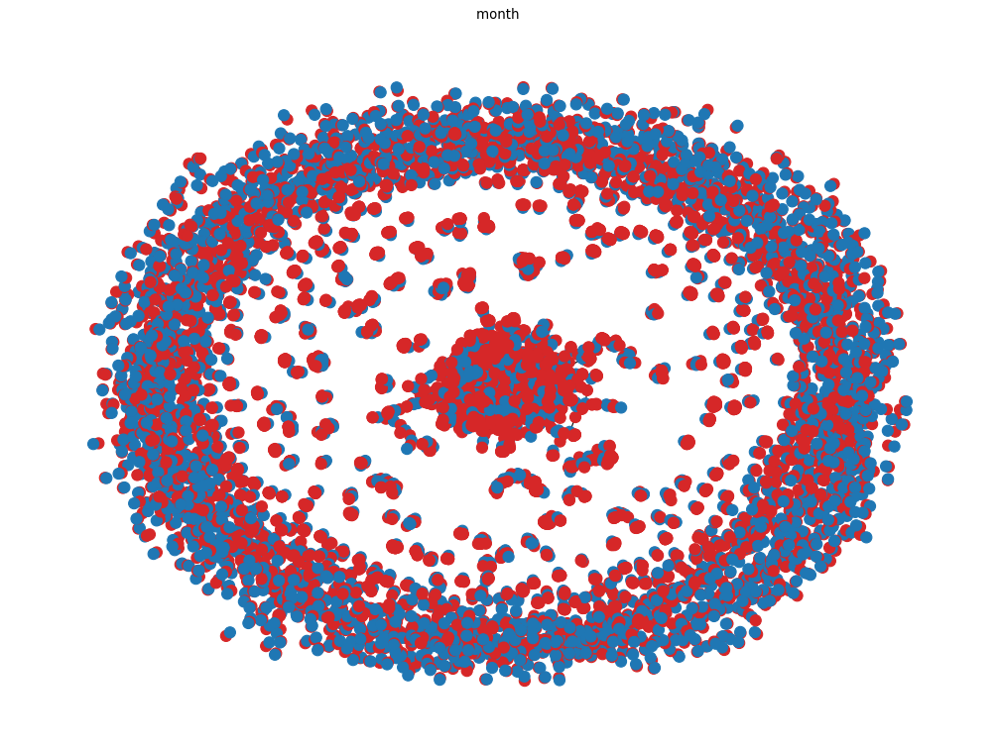

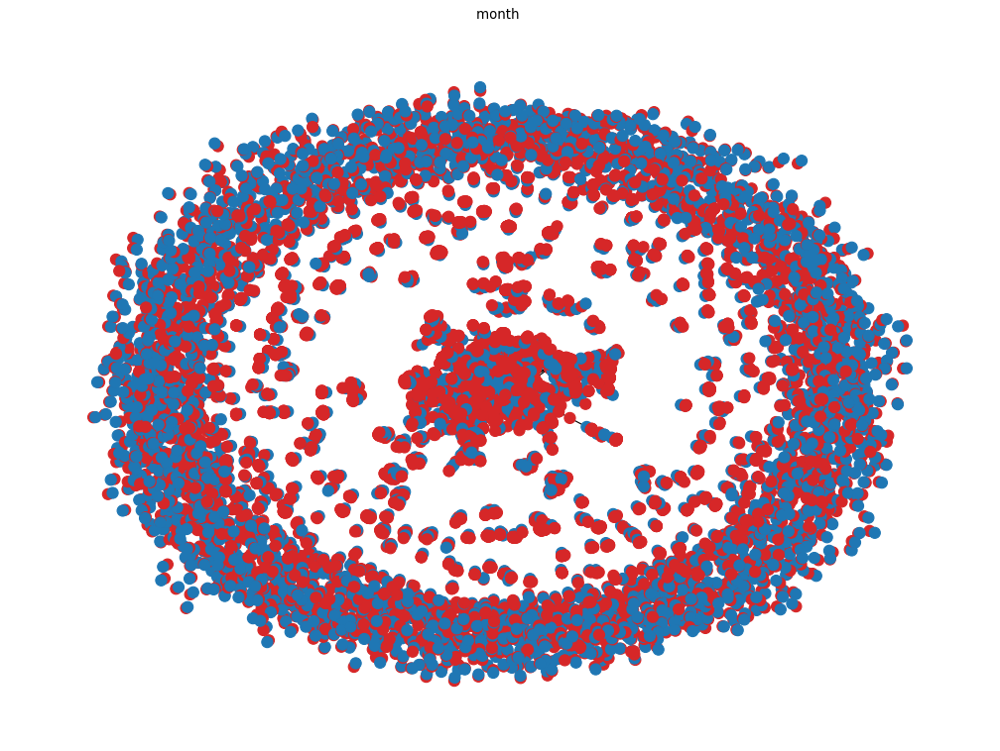

In [295]:
M2 = nx.Graph()
node_color = []
for month in df_p:
    M = nx.from_pandas_edgelist(month, 'Sender customerId', 'acccount_full', create_using=nx.DiGraph())
    
    d = dict(M.in_degree())
    received_trans = [x for x in d if d[x] > 0]

    #comunity_list = {}
    
    for acc in received_trans:
        payees = nx.ancestors(M, acc)
        #comunity_list[acc] = payees
        
        num = M2.number_of_nodes()
        M2.add_node(acc)
        num = M2.number_of_nodes() - num
        node_color.extend(['tab:red']*num)
        
        num = M2.number_of_nodes()
        M2.add_nodes_from(payees)
        num = M2.number_of_nodes() - num
        node_color.extend(['tab:blue']*num)
        
        M2.add_edges_from(map(lambda e: (e, acc), payees))
    if received_trans:
        figure(figsize=(16, 12), dpi=80)
        plt.title('month ')
        nx.draw(M2, node_size=100, node_color=node_color)
        plt.show()

In [296]:
comunity_list

{'10123857_600263': {'1e6f5537-16f2-4e50-82b3-c9806ed32994'},
 '72578224_41404': {'a5f736f3-cc3f-41da-a014-4920a1342ad6'},
 '44511296_608407': {'a45583bb-28ba-4b06-9a60-b03914edd961'},
 '29159059_40075': {'ffcf3506-a7d8-48a0-ba54-d4d54d15ee78'},
 '15708865_116435': {'6fafe5af-9e54-4d4e-a841-9c747a2829f7'},
 '54661982_402806': {'3850c4c3-2204-4610-b7af-a032617b281f'},
 '17353844_41388': {'3850c4c3-2204-4610-b7af-a032617b281f'},
 '79073041_40004': {'b288e382-ab54-46e8-b726-b01540c55c0f'},
 '46449935_623140': {'3850c4c3-2204-4610-b7af-a032617b281f'},
 '59726806_602149': {'ea27dd28-fded-452f-bc14-c1ff02689d8d'},
 '14867_40511': {'3850c4c3-2204-4610-b7af-a032617b281f'},
 '65669825_42930': {'9dff913f-8248-4c7f-ae4c-cc3be4734c88'},
 '47111368_306444': {'b8a4df28-5c83-445b-9bd1-b64250ea7bfe'},
 '31076726_40004': {'3253926e-9c0d-4fd9-8248-eb7c2f457b99'},
 '54918841_90129': {'c89b34b7-f9c9-4089-99c2-b00c481c2304'},
 '11320767_110997': {'dba7e239-9f75-40c3-8d06-677ec23fad9f'},
 '65387871_90126': 

In [276]:
itertools.repeat(0, 10)

repeat(0, 10)

In [226]:
#G = nx.from_pandas_edgelist(df_trans, 'accountId', 'customerId')

In [228]:
G.number_of_edges() # 3763 #5598
G.number_of_nodes() # 7526  #6466
# so every unique account linked with a unique customer, there is no customer have two different account

7526

In [21]:
print(df_trans.shape)
print(df_users.shape)
print(df_payees.shape)
# so we have 62167 transactions, 12988 user informations and 6721 transfers in total

(62167, 12)
(12988, 7)
(6721, 10)


In [231]:
d = dict(G.in_degree())
received_trans = [x for x in d if d[x] >= 2]
print(type(received_trans))
print(received_trans)
#len(pd.Series(df_payees['acccount_full']).unique()) # customer 3284 , account 5598

<class 'list'>
['452_40300', '47715207_40357', '80052240_90128', '29450271_236972', '33684400_90129', '6215934_300248', '51211137_42930', '1601296_40085', '29812538_236972', '6012169_116436', '16374668_308012', '29839457_236972', '19108156_87199', '46275046_70436', '2490_40541', '60125764_40075', '30_40677', '534_40679', '33766485_40374', '57618725_233272', '6377012_87199', '159802_771946', '140716_771946', '4789553_50005', '17712184_70806', '57056849_90129', '27857009_163130', '12852907_41404', '12887029_237524', '63629941_40075', '45906584_90132', '39128037_40004', '41586883_608370', '1244918_110270', '29985854_236972', '33803635_209263', '7627308_70806', '545859_230363', '75439395_40075', '8987467_40085', '40068529_609242', '28340947_70806', '31474734_163130', '59957905_40075', '12752446_237524', '2396_40541', '12634115_237524', '71861638_400118', '41841581_608370', '2799022_40085', '12833295_237524', '779_40300', '77495297_41404', '16444109_41404', '12756682_237524', '13732530_4140

In [232]:
nx.ancestors(G, '47715207_40357')
comunity_list = []

for acc in received_trans:
    payees = nx.ancestors(G, acc)
    comunity_list.append(payees) if payees not in comunity_list else None
comunity_list

[{'070ef322-96ba-481c-a5aa-15c2c28692ec',
  '0c5d3b41-1d35-45af-afc6-6b7872926d2d',
  '18e47526-6dc1-44c6-9c28-b0af4e6588f4',
  '22c9479f-0bc5-4210-abbd-6fe60e831138',
  '2e436741-a3b6-4320-b374-4889a9fc886d',
  '2fa2da1b-34b3-47cc-8a04-61df2db770f4',
  '38e2bd8e-ac8f-44e0-a9c6-cf104eef669a',
  '42e9556d-ca43-4dc3-8bbd-53ad615a549f',
  '59ff2fc0-cb02-4e93-8577-e1846fca86bb',
  '662ea7d8-b33c-4125-9184-a8f0418cffc9',
  '72b90c9e-fc18-4116-a57b-b7dd9d97705f',
  '74b87e2e-9cba-45a3-94fe-076fac412484',
  '766d25b4-254c-4a15-9a15-668c9eec2776',
  '77a29fa9-ef07-4dc2-8174-66c327e406a6',
  '7870169c-9f0e-4b2e-ab1a-4fd382556c4c',
  '8291ebee-37a8-454a-b820-87f91440d7f5',
  '8c45e4c2-df40-4854-b6bf-bf8d40bfa119',
  '8d59175a-cbed-4ede-b4ea-7ea669d311a2',
  '910d767f-e1fd-48f5-afee-19b5ce9e4504',
  '914df2cd-9438-4136-b18d-8f10acece379',
  '94b21015-26dd-4749-b0da-f9e6c28f6227',
  'aeb2aac2-ac71-409f-9be1-5aaa94c6601a',
  'b01c8832-13ad-4d3b-b2ef-8ce06da2858b',
  'b5992e03-4607-49fe-a207-b788c88

In [104]:
print(len(comunity_list)) #384 community, 401 accounts
#comunity_list = list(comunity_list)
upper_comunity = []
active_acc = set()
for i, com in enumerate(comunity_list):
    for j in range(i+1, len(comunity_list)):
        if not com.isdisjoint(list(comunity_list[j])):
            upper_comunity.append(sorted((i,j)))
            s = com.intersection(comunity_list[j])
            active_acc.update(s)
print(upper_comunity)

384
[[0, 16], [0, 18], [0, 42], [0, 43], [0, 49], [0, 54], [0, 55], [0, 83], [0, 108], [0, 145], [0, 193], [0, 195], [0, 199], [0, 305], [1, 6], [4, 165], [6, 7], [6, 125], [6, 276], [7, 125], [7, 276], [11, 13], [12, 26], [14, 37], [14, 42], [14, 48], [14, 55], [14, 71], [14, 76], [14, 86], [14, 113], [14, 132], [14, 133], [15, 21], [15, 29], [15, 167], [15, 246], [16, 38], [16, 43], [16, 48], [16, 49], [16, 54], [16, 59], [16, 69], [16, 74], [16, 75], [16, 82], [16, 92], [16, 95], [16, 139], [16, 140], [16, 145], [16, 185], [16, 200], [16, 201], [16, 259], [16, 273], [16, 328], [16, 348], [18, 39], [18, 41], [18, 43], [18, 44], [18, 49], [18, 53], [18, 65], [18, 79], [18, 109], [18, 113], [18, 115], [18, 121], [18, 128], [18, 130], [18, 144], [18, 151], [18, 155], [18, 156], [18, 157], [18, 164], [18, 177], [18, 178], [18, 179], [18, 186], [18, 191], [18, 197], [18, 217], [18, 220], [18, 241], [18, 243], [18, 283], [18, 316], [18, 339], [18, 357], [21, 29], [21, 167], [22, 46], [22, 

In [146]:
from collections import Counter
import operator
test = [item for sublist in upper_comunity for item in sublist]
test1 = Counter(test)

test = sorted(test1.items(), key=operator.itemgetter(1),reverse=True) #268
#test = sorted((t for t in test1.items() if t[1] >= 2), key=operator.itemgetter(1),reverse=True) # 187
len(test)

268

In [147]:
#print(comunity_list[18])
print(len(upper_comunity))
print(len(active_acc))
test = [item for sublist in comunity_list for item in sublist]
test1 = Counter(test)

test = sorted(test1.items(), key=operator.itemgetter(1),reverse=True) #1077
#test = sorted((t for t in test1.items() if t[1] >= 2), key=operator.itemgetter(1),reverse=True) # 261
test


507
261


[('018e42a6-cd6e-42b6-be8b-22894bdb929e', 7),
 ('0241cfdb-807f-4253-a737-4a86c8b8aa83', 6),
 ('62807111-621d-46b3-bc96-f367fdeb50f6', 6),
 ('7fa86c81-b823-4c63-8fff-6731557b0434', 6),
 ('023140ab-5219-426f-8bf0-1bfac0a2a402', 6),
 ('5ca60378-6054-4a23-8f02-24748c658b16', 6),
 ('3a3f0440-f2f0-4896-b64f-0508857a42f0', 5),
 ('cf54d839-a086-4605-a815-b2e84f73586b', 5),
 ('f395610a-0dc8-46f9-9a2f-8db424dcd3be', 5),
 ('5b588641-7840-4d5b-99a6-d691c7f72f3d', 5),
 ('7af663cf-4dfa-4ee3-a584-870bc17fcb90', 5),
 ('5da0e4a9-8a8f-415c-9899-d152015a5a14', 5),
 ('f89b55e3-3d03-4334-8cf5-e925f21fd236', 5),
 ('1c2b7d51-a0c4-4074-8359-16149dcae570', 5),
 ('9d6a27b4-3faf-4fa8-aebe-1b05bf9366e4', 5),
 ('59ff2fc0-cb02-4e93-8577-e1846fca86bb', 4),
 ('e2c45f25-63e4-458e-b79e-7aafc254542d', 4),
 ('fa8c4d42-e866-4de2-a12d-88fab1bc5ab0', 4),
 ('aff60ffd-dd08-40e4-9cbb-fbe2d1623c72', 4),
 ('3e123827-b282-4ab9-abf9-2a05f12f9c70', 4),
 ('08a729b9-8876-4456-b8ba-690c2417b968', 4),
 ('f95d8bde-8a48-4ea7-8b0b-eaa29ec